# CartPole-PPO implementation

PPO test in the CartPole environment

In [1]:
import gym
import numpy as np
import tensorflow as tf 
from tensorflow import keras
from collections import deque
import random
from matplotlib import pyplot as plt

env = gym.make('CartPole-v1')

## Memory

Class used to memorize the trajectory and calculate the advntage

In [3]:
class Memory(object):
    
    STATE = 0
    ACTION = 1
    ACTION_PROB = 2
    REWARD = 3
    DONE = 4
    
    def __init__(self, n_trajectories, gamma = 0.98, lambda_p = 0.96):
        self.trajectories = np.empty(n_trajectories, dtype=object)
        self.gamma = gamma
        self.labda_p = lambda_p     
        
    def collect(self, state, action, action_prob, reward, done, i_episode):
        if (self.trajectories[i_episode] == None):
            self.trajectories[i_episode] = deque(maxlen=N_STEPS)
        self.trajectories[i_episode].append((state, action, action_prob, reward, done))
    
    def calculate_advantages(self):
        advantages = []
        TDerrors = [] #list of all the delta, used to uopdate the critic
        discounts = []
        
        for trajectory in self.trajectories:
            
            advantage_trajectory = [] #list of advantages for each element in a single trajectory
            delta = []
            G = []
            
            delta.append(trajectory[-2][self.REWARD] + 
                         self.gamma*ppo.return_v_values(trajectory[-1][self.STATE]) - 
                         ppo.return_v_values(trajectory[-2][self.STATE])) 
            old_advantage = delta[-1]
            advantage_trajectory.append(old_advantage[0])
            G.append(trajectory[-2][self.REWARD] + self.gamma*ppo.return_v_values(trajectory[-1][self.STATE]))
            
            for i in range(len(trajectory)-3,-1,-1):
                delta.append(trajectory[i+1][self.REWARD] + 
                             self.gamma*ppo.return_v_values(trajectory[i+1][self.STATE]) -
                             ppo.return_v_values(trajectory[i][self.STATE]) )
                G.append(trajectory[i][self.REWARD] + self.gamma*G[-1])
                new_advantage = delta[-1] + self.gamma*self.labda_p*old_advantage
                
                advantage_trajectory.append(new_advantage[0])   
                
                old_advantage = new_advantage
            
            advantages.append(advantage_trajectory)
            TDerrors.append(delta)
            discounts.append(G)
        #flat all trajectories in a single deque adding the advantages (easier to sample random batches)
        self.flat_trajectories(advantages, TDerrors, discounts)
    
    def flat_trajectories(self, advantages, TDerrors, G):
        
        size = 0
        for trajectory in self.trajectories:
            size = size + len(trajectory)
        
        self.flatten_trajectories = deque(maxlen=size)
        
        for trajectory, advantage, delta, discount in zip(self.trajectories, advantages, TDerrors, G):
            for i in range(len(trajectory)-2,-1,-1):
                self.flatten_trajectories.append((trajectory[i][self.STATE], 
                                                  trajectory[i][self.ACTION], 
                                                  trajectory[i][self.ACTION_PROB], 
                                                  trajectory[i][self.REWARD], 
                                                  advantage[len(trajectory)-2-i], 
                                                  delta[len(trajectory)-2-i],
                                                  discount[len(trajectory)-2-i],
                                                  trajectory[i][self.DONE]))
                #if (trajectory[i][self.DONE]):
                #    print("================================================")
                #print("{}. v: {} G: {}".format(i, ppo.return_v_values(trajectory[i][self.STATE]), discount[len(trajectory)-2-i]))
                #print("Action {}".format(trajectory[i][self.ACTION]))
                #print("Action Prob {}".format(trajectory[i][self.ACTION_PROB]))
                #print("Advantage {}".format(advantage[len(trajectory)-2-i]))
                #print("Delta {}".format(delta[len(trajectory)-2-i]))    
        
        
    #pick a random batch example from the flatten list of trajectories
    def sample_experiences(self, batch_size):
        if (len(self.flatten_trajectories) >= batch_size):
            indices = np.random.permutation(len(self.flatten_trajectories))[:batch_size]
        else:
            indices = np.random.permutation(len(self.flatten_trajectories))
        batch = [self.flatten_trajectories[index] for index in indices]
        #delete form the memory the used obervations
        #for index in sorted(indices, reverse=True):
        #    del self.flatten_trajectories[index]
        states, actions, actions_prob, rewards, advantages, TDerrors, discounts, dones = [np.array([experience[field_index] for experience in batch]) for field_index in range(8)]
        return states, actions, actions_prob, rewards, advantages, TDerrors, discounts, dones
        
    def reset(self):
        for trajectory in self.trajectories:
            trajectory.clear()
        self.flatten_trajectories.clear()

# PPO class

$ s_{t+1} $ and $ r_{t+1} $ are the observed state/reward after the current action $ a_t $.
$ a_{T-1} $ is the last action taken and $ s_T $, $ r_T $ are the last observation/reward.

Actor update formula:
$ \theta_{t+1} = \theta_t + \alpha\nabla min(r_t(\theta)\hat{A}_t, clip(r_t(\theta),1-\epsilon,1+\epsilon)\hat{A}_t)$

Critic update formula:
$ w_{t+1} = w_t + \alpha G_t\hat{v}(s_t,w)$

Probability ratio $ r_t(\theta) \doteq $
$ \pi_\theta(a_t | s_t) \over \pi_{\theta_old}(a_t | s_t) $

Advantage:
$ \hat{A}_t \doteq \delta_t + (\gamma\lambda)\delta_{t+1} + (\gamma\lambda)^2\delta_{t+2} + ... + (\gamma\lambda)^{T-t-1}\delta_{T-1} = \delta_t + (\gamma\lambda)\hat{A}_{t+1}$

TDerror:
$ \quad \delta_t  \doteq $
$ r_t + \gamma\hat{v}(s_{t+1},w) - \hat{v}(s_t,w) $ $ \qquad $

Discount return:
$ G_t \doteq $
$ r_t + \gamma r_{t+1} + \gamma^2 r_{t+2} + ... + \gamma^{T-t+1} r_{T-t-1} = r_t + \gamma G_{t+1} $

In [4]:
class PPO(object):
    
    input_shape = [4] #[1] #500 states (400 reachable)
    n_outputs = env.action_space.n # 6 actions
    
    next_reward = 0
    
    def __init__(self, n_episodes = 1, train_steps = 100, epsilon = 0.2, alpha = 1, beta = 0.9):
        self.actor = self.create_actor()
        self.actor_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4) # 0.00005 5e-4
        
        self.critic = self.create_critic()
        self.critic_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3) #0.001
        
        self.epsilon = epsilon
        self.alpha = alpha
        self.beta = beta
        
        self.train_steps = train_steps
        
        self.memory = Memory(n_episodes)
        
    #create the NN of the actor
    # Given the state returns the probability of each action
    def create_actor(self):    
        initializer = tf.keras.initializers.GlorotNormal()
        actor = keras.Sequential([
            keras.layers.Dense(32, activation="tanh", input_shape=self.input_shape, kernel_initializer=initializer),
            keras.layers.Dense(32, activation="tanh", kernel_initializer=initializer), #test tanh instead of relu because softmax return nan
            keras.layers.Dropout(0.3),
            keras.layers.Dense(self.n_outputs, kernel_initializer=initializer, activation = 'softmax') ]) #log_softmax
        
        return actor
       
    #create the NN of the critic
    # Given the state returns the value function
    def create_critic(self):
        critic = keras.Sequential([
            keras.layers.Dense(32, activation="relu", input_shape=self.input_shape),
            keras.layers.Dense(32, activation="relu"),
            keras.layers.Dense(1) ])
        
        self.critic_loss_fn = tf.keras.losses.mean_squared_error
        
        return critic
      
    def play_one_step(self, env, observation, i_episode):
        action, action_prob = self.select_action(observation)
        past_reward = self.next_reward
        next_observation, self.next_reward, done, info = env.step(action)
        self.memory.collect(observation, action, action_prob, past_reward, done, i_episode)
        if (done):
            self.memory.collect(next_observation, action, action_prob, self.next_reward, done, i_episode)
            
        return next_observation, action, past_reward, done, info
        
    #select the action (returned as a number)
    def select_action(self, observation):
        action = 0
        # explanation: tf.expand_dims(observation['pov'], axis=0)
        # since we pass another input of shape (1,) -> we need to tell keras that is one image (it assumes the first dimension to be the batch)
        #action_probabilities = self.actor.predict(np.array([observation,])[np.newaxis, ...])[0]
        action_probabilities = self.actor.predict(np.array([observation,]))[0]
       
        #added:
        #current_actions_prob = tf.math.exp(action_probabilities) / tf.reduce_sum(tf.math.exp(action_probabilities))
        
        #choosing an action usign randomly using a "roulette wheel" approach
        #r = random.random()
        
        #sum_probabilities = 0
        #for i in range(len(current_actions_prob)):
        #    sum_probabilities = sum_probabilities + current_actions_prob[i]
            
        #    if (r <= sum_probabilities):
        #        action = i
        #        break

        if (np.any(np.isnan(action_probabilities))):
            print("{} prob {}".format(observation, action_probabilities))
        action = np.random.choice(a = len(action_probabilities), p = action_probabilities)
        return action, action_probabilities[action]
    
    def train(self, batch_size):
        self.memory.calculate_advantages()
        
        for i_step in range(self.train_steps):
            done = self.training_step(batch_size)
            if (done):
                break
        
        self.memory.reset()
        
    #training done on the memory (the advantages must be calculated before hand)
    def training_step(self, batch_size):
        #get experiences (parts of a trajectory) from the memory
        experiences = self.memory.sample_experiences(batch_size)
        states, actions, actions_prob, rewards, advantages, TDerrors, discounts, dones = experiences

        done = False
        if (len(states) != batch_size):
            done = True
        if (len(states) == 0):
            return True
            
        #compute the values for the update of the actor
        
        mask = tf.one_hot(actions, self.n_outputs)

        #array of shape (64,) into array of shape (64,1)
        #states =  np.array(np.array_split(states, len(states)))
        
        with tf.GradientTape() as tape:
            current_actions_prob = self.actor(states)
            
            #added:
            #current_actions_prob = tf.math.exp(current_actions_prob) / tf.reduce_sum(tf.math.exp(current_actions_prob))
            
            masked_action_prob = tf.reduce_sum(current_actions_prob*mask, axis=1, keepdims=True)
            old_actions_prob = tf.reshape(tf.convert_to_tensor(actions_prob), [len(states), 1])
            probability_ratio = tf.divide(tf.math.log(masked_action_prob + 1e-7), tf.math.log(old_actions_prob + 1e-7))
            #probability_ratio = tf.divide(masked_action_prob, old_actions_prob)

            #sobtitute nan values with zero (where given an array of True/false puy the element of the first array (tf.zeros_like(probability_ratio)) in the position where is True, the second (probability_ratio) where is False)
            probability_ratio = tf.where(tf.math.is_nan(probability_ratio), tf.zeros_like(probability_ratio), probability_ratio)
            
            surrogate_arg_1 = tf.convert_to_tensor([probability_ratio[index]*advantages[index] for index in range(len(advantages))])
            surrogate_arg_2 = tf.convert_to_tensor(np.array([tf.keras.backend.clip(probability_ratio,1-self.epsilon,1+self.epsilon)[index]*advantages[index] for index in range(len(advantages))]).flatten())
            
            entropy = self.beta*tf.reduce_sum(current_actions_prob*(tf.math.log(current_actions_prob)/tf.math.log(2)) )
            
            L = 0 - tf.minimum( surrogate_arg_1 , surrogate_arg_2 ) - entropy
            
            loss = tf.reduce_mean(L)
            
        if (np.any(tf.math.is_nan(probability_ratio))):
            print(" prob {} old {} r {} L {}".format(masked_action_prob, old_actions_prob, probability_ratio, loss))

        actor_weights = self.actor.trainable_variables
        grads = tape.gradient(loss, actor_weights)
        
        print("Gradient: {}".format(grads))
        
        self.actor_optimizer.apply_gradients(zip(grads, actor_weights))
        
        #update of the critic. We need the target is the TD error
        #target_v_values = tf.reshape(tf.convert_to_tensor(np.asarray(self.alpha*TDerrors).astype('float32')), (len(states), 1))
        target_v_values = tf.reshape(tf.convert_to_tensor(np.asarray(self.alpha*discounts).astype('float32')), (len(states), 1))
        
        with tf.GradientTape() as tape:
            v_values = self.critic(states)
            loss = tf.reduce_mean(self.critic_loss_fn(target_v_values, v_values))
        grads = tape.gradient(loss, self.critic.trainable_variables)
        self.critic_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))
        
        #since v changed we need to re-calculate the advantages
        #self.memory.calculate_advantages()
        
        return done
    
    def return_v_values(self, observation):
        v = self.critic.predict(np.array( [observation,]))[0]
        #v = self.critic.predict(np.array( [observation,])[np.newaxis, ...])[0]
        return v

## Training

In [5]:
N_EPOCHS = 200
N_EPISODES = 5 # number of trajectories collected in one epoch
N_STEPS = 300 # max number of step for each episode

TRAIN_STEPS = 30 # number of max steps done during training. if the number of samples is less than TRAIN_STEPS*BATCH_SIZE will stop early after completing the training on all the samples
BATCH_SIZE = 32

ppo = PPO(n_episodes = N_EPISODES, train_steps = TRAIN_STEPS)

rewards = []


for i_epoch in range(N_EPOCHS):
    
    epoch_reward = 0.0
    
    for i_episode in range(N_EPISODES):
        
        observation = env.reset()
        
        episode_reward = 0.0
        
        for i_step in range(N_STEPS):   
            
            observation, action, reward, done, info = ppo.play_one_step(env, observation, i_episode)

            #env.render()
            episode_reward = episode_reward + reward

            if(done or i_step == N_STEPS-1):
                #print("Epoch {} Episode {} terminated after {} steps with total reward: {}".format(i_epoch, i_episode, i_step, episode_reward))
                epoch_reward = epoch_reward + episode_reward
                break
    
    print("Epoch {} terminated with average reward {}".format(i_epoch, epoch_reward/N_EPISODES))
    #print("============================================================================")
    rewards.append(epoch_reward/N_EPISODES)
    
    ppo.train(batch_size = BATCH_SIZE)
    
env.close()

Epoch 0 terminated with average reward 36.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00080369, -0.00045093,  0.00531019,  0.00321245, -0.00203217,
        -0.00021116,  0.00712787, -0.00154775,  0.00394165,  0.00570309,
         0.00287112, -0.00070661,  0.00349677,  0.00625911,  0.00357894,
        -0.00316573,  0.01103783, -0.0023122 ,  0.00348517, -0.00469755,
        -0.00622057,  0.004572  , -0.00090686,  0.00352116, -0.00313736,
         0.00318755, -0.00225515,  0.0019565 ,  0.00160383, -0.00139492,
        -0.00110498,  0.00274167],
       [-0.00827533,  0.00875747, -0.03581601, -0.02039688,  0.0168719 ,
         0.004815  , -0.04475109,  0.00697438, -0.04810216, -0.05052307,
        -0.01763712,  0.0063352 , -0.02839829, -0.0441984 , -0.0178148 ,
         0.01276825, -0.06765746,  0.02654809, -0.03153372,  0.04438507,
         0.04908559, -0.02626355,  0.00389419, -0.02436361,  0.02213906,
        -0.02889047,  0.0171685 , -0.01490654, -0.01054439

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00829274,  0.00799124, -0.03731685, -0.02159993,  0.01691175,
         0.00439216, -0.04730424,  0.00840614, -0.04594382, -0.05047964,
        -0.01863434,  0.00619893, -0.02868631, -0.04537353, -0.01961644,
         0.01482298, -0.07142287,  0.02584817, -0.03138113,  0.04408901,
         0.04967052, -0.02872582,  0.00434111, -0.02528167,  0.02253128,
        -0.02814944,  0.01781597, -0.0153894 , -0.01116855,  0.01693187,
         0.01041054, -0.02020266],
       [ 0.02156207, -0.01904939,  0.10290961,  0.06020517, -0.04457571,
        -0.01058819,  0.12267376, -0.02472882,  0.12388195,  0.1338197 ,
         0.05076279, -0.01538598,  0.07826071,  0.1207725 ,  0.05389893,
        -0.0402928 ,  0.19258323, -0.07015882,  0.0834531 , -0.12242994,
        -0.133067  ,  0.07320073, -0.01558512,  0.07131789, -0.05966691,
         0.08100142, -0.04180175,  0.03985828,  0.02898349, -0.04697482,
        -0.02933204,  0.04548

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00875176,  0.0094129 , -0.03419854, -0.0198173 ,  0.01674213,
         0.00509267, -0.04396522,  0.00577907, -0.04594212, -0.0496846 ,
        -0.01787919,  0.00750662, -0.02645577, -0.0445854 , -0.01662201,
         0.01227622, -0.06722341,  0.02576254, -0.03054558,  0.04229964,
         0.0479176 , -0.02554401,  0.00275803, -0.02300294,  0.02243174,
        -0.02630332,  0.01894494, -0.01544618, -0.01015364,  0.01670088,
         0.00966297, -0.02088449],
       [-0.07117056,  0.06040215, -0.33262694, -0.19049016,  0.13719304,
         0.03086236, -0.36259502,  0.07492167, -0.40758076, -0.42534715,
        -0.15837808,  0.04672451, -0.2514733 , -0.36800623, -0.16749997,
         0.11809634, -0.5943887 ,  0.22501491, -0.26611513,  0.40010282,
         0.42726338, -0.21212271,  0.05851687, -0.23797369,  0.18336828,
        -0.2687191 ,  0.11119376, -0.12337148, -0.08699992,  0.15756825,
         0.09395794, -0.12049

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0038315 , -0.00314924,  0.01872649,  0.01099162, -0.00808731,
        -0.00166038,  0.02482995, -0.00436183,  0.01975152,  0.02386333,
         0.00969165, -0.00294722,  0.01342872,  0.02284572,  0.01034957,
        -0.00879425,  0.03624662, -0.01107281,  0.01442948, -0.01970176,
        -0.02422067,  0.01516371, -0.00203003,  0.01276996, -0.0112615 ,
         0.01306847, -0.00896088,  0.00717537,  0.00571081, -0.00674959,
        -0.00493927,  0.01046814],
       [-0.00149141,  0.00229957, -0.0031048 , -0.00102901,  0.0019938 ,
         0.00079152, -0.00200493, -0.00031803, -0.01053034, -0.00715315,
        -0.00023254,  0.00031853, -0.00459415, -0.00328159, -0.00066879,
        -0.00136469, -0.00402083,  0.00466917, -0.00445901,  0.00760603,
         0.00668147, -0.0010054 ,  0.00074706, -0.00253144,  0.00184528,
        -0.00416044,  0.00049727, -0.00116838, -0.00090581,  0.00402302,
         0.00156364, -0.00057

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.60291185e-04, -1.20035962e-04,  1.57794775e-03,
         1.13769679e-03, -5.30899211e-04, -8.61327790e-05,
         1.24749844e-03, -6.80466648e-04,  1.73032482e-03,
         1.62702147e-03,  8.08197190e-04, -7.31735709e-05,
         1.25322316e-03,  1.48110138e-03,  1.04565045e-03,
        -6.45167020e-04,  2.95908493e-03, -1.24739285e-03,
         1.24421704e-03, -2.14999611e-03, -1.67181063e-03,
         8.94070195e-04, -5.14601357e-04,  1.11514307e-03,
        -6.15274301e-04,  1.43610220e-03, -2.63004709e-04,
         6.04098022e-04,  4.06740146e-04, -8.73876328e-04,
        -4.14559676e-04,  7.11492103e-05],
       [-2.02548802e-02,  1.52097903e-02, -9.31316912e-02,
        -5.46542183e-02,  3.76113206e-02,  7.35552562e-03,
        -1.02287747e-01,  2.19622608e-02, -1.10658050e-01,
        -1.17370926e-01, -4.49311435e-02,  1.22325430e-02,
        -6.97792917e-02, -1.03531845e-01, -4.70426939e-02,
         3.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00611165, -0.00517716,  0.0271407 ,  0.01643589, -0.01188403,
        -0.00269152,  0.03413451, -0.00729231,  0.03340928,  0.03605147,
         0.0130846 , -0.00345236,  0.02165355,  0.03235151,  0.01505568,
        -0.01106839,  0.0518602 , -0.01899592,  0.02277168, -0.03268043,
        -0.03617671,  0.02178872, -0.00368357,  0.0186901 , -0.015508  ,
         0.02054599, -0.01226923,  0.01066983,  0.00863978, -0.0125321 ,
        -0.0078875 ,  0.01406343],
       [-0.01502514,  0.01064942, -0.07224268, -0.0430842 ,  0.02873164,
         0.00486166, -0.07840513,  0.01886824, -0.0863416 , -0.08960529,
        -0.03400585,  0.00801061, -0.05563515, -0.07897923, -0.03768025,
         0.02725614, -0.12954526,  0.04798489, -0.05641003,  0.0866397 ,
         0.09238618, -0.04742358,  0.01428108, -0.05207836,  0.03825545,
        -0.05930671,  0.021749  , -0.02492017, -0.01976732,  0.03318514,
         0.02162976, -0.02345

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.55577718e-03,  4.48945072e-03, -1.52033623e-02,
        -8.93678796e-03,  7.65433116e-03,  2.29724357e-03,
        -2.08671410e-02,  2.01102626e-03, -2.10920870e-02,
        -2.32376643e-02, -8.19182396e-03,  3.64161795e-03,
        -1.17385052e-02, -2.18308549e-02, -6.72038132e-03,
         5.35410643e-03, -3.09815779e-02,  1.15792844e-02,
        -1.40760504e-02,  1.86285637e-02,  2.26990245e-02,
        -1.19902510e-02,  4.38761461e-04, -1.01442514e-02,
         1.07798921e-02, -1.13204466e-02,  9.76199284e-03,
        -7.21239578e-03, -4.97379201e-03,  7.18755182e-03,
         4.72946791e-03, -1.12166004e-02],
       [-3.76486033e-02,  2.96801645e-02, -1.60235599e-01,
        -9.59516764e-02,  6.76999614e-02,  1.42339189e-02,
        -1.87709183e-01,  3.86177339e-02, -2.01115206e-01,
        -2.10846797e-01, -7.73099139e-02,  2.20800433e-02,
        -1.25580847e-01, -1.88175872e-01, -8.21864754e-02,
         5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.9858430e-04,  8.4787619e-04,  5.1913005e-03,  3.3091176e-03,
        -1.0520783e-03,  5.9318921e-04,  3.6916526e-03, -2.6156937e-03,
         3.2941033e-03,  3.4212098e-03,  2.1025902e-03,  5.9603556e-04,
         3.7158055e-03,  2.8980367e-03,  3.6502285e-03, -2.7622066e-03,
         7.7490252e-03, -2.0764207e-03,  2.4467567e-03, -5.2280854e-03,
        -4.6008215e-03,  2.7258191e-03, -2.4899207e-03,  4.1321730e-03,
        -1.1975449e-03,  4.5023672e-03,  1.2207928e-03,  6.4533920e-04,
         1.0762642e-03, -1.6658742e-03, -1.3383107e-03, -1.6107266e-03],
       [-3.3475023e-02,  2.5871592e-02, -1.3904148e-01, -8.4768906e-02,
         5.9509307e-02,  1.2300942e-02, -1.6992296e-01,  3.6389761e-02,
        -1.7737716e-01, -1.8564600e-01, -6.6075839e-02,  1.7567512e-02,
        -1.1264764e-01, -1.6586575e-01, -7.3466308e-02,  5.3260982e-02,
        -2.6182136e-01,  9.9403203e-02, -1.1819977e-01,  1.7103058e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02289706,  0.01803525, -0.08525727, -0.05240073,  0.03795859,
         0.00858257, -0.10885605,  0.01987961, -0.11164773, -0.11895158,
        -0.04197992,  0.01292933, -0.06867073, -0.10968254, -0.04268521,
         0.03203592, -0.16553222,  0.06244513, -0.07491045,  0.1051266 ,
         0.12026516, -0.06819469,  0.00925748, -0.05873007,  0.05179875,
        -0.06446812,  0.04275279, -0.03556755, -0.02832108,  0.04067635,
         0.02685483, -0.05051162],
       [-0.03959099,  0.0317622 , -0.14301576, -0.08753618,  0.06433877,
         0.01509629, -0.18137373,  0.03119472, -0.19169465, -0.2017757 ,
        -0.070731  ,  0.02295357, -0.11519063, -0.18724391, -0.07004806,
         0.05175404, -0.27916315,  0.10637942, -0.12701273,  0.17823754,
         0.20407493, -0.1116108 ,  0.01538588, -0.09908928,  0.08884887,
        -0.10980614,  0.07216658, -0.0604465 , -0.04726011,  0.06976609,
         0.04580083, -0.08431

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.00079200e-03, -5.15539804e-03,  3.27831209e-02,
         2.04927139e-02, -1.33730043e-02, -2.15687370e-03,
         3.96944284e-02, -8.96759238e-03,  3.97793874e-02,
         4.24144380e-02,  1.57117173e-02, -3.67717911e-03,
         2.61648390e-02,  3.91343273e-02,  1.74469426e-02,
        -1.31747760e-02,  6.20016605e-02, -2.23733578e-02,
         2.70723682e-02, -3.91871184e-02, -4.42331955e-02,
         2.57296786e-02, -5.16360486e-03,  2.30333190e-02,
        -1.81466900e-02,  2.47664135e-02, -1.34793147e-02,
         1.23835048e-02,  1.06056314e-02, -1.48110744e-02,
        -1.01174917e-02,  1.61297899e-02],
       [-3.26564983e-02,  1.86831858e-02, -1.41580716e-01,
        -8.57940093e-02,  5.31286411e-02,  6.39732135e-03,
        -1.46301433e-01,  3.71446088e-02, -1.73971057e-01,
        -1.73397839e-01, -6.48691133e-02,  1.40299480e-02,
        -1.10939026e-01, -1.51014075e-01, -7.04337507e-02,
         4.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.5312815e-04,  5.2979129e-04, -4.0136352e-03, -2.3659850e-03,
         1.6020696e-03,  1.6209469e-04, -5.2101910e-03,  1.0417473e-03,
        -4.5387899e-03, -5.1868972e-03, -1.8286246e-03,  3.5277675e-04,
        -3.1337109e-03, -4.7334190e-03, -2.0210899e-03,  1.7198574e-03,
        -7.3087136e-03,  2.3527853e-03, -3.1536398e-03,  4.3536830e-03,
         5.4911459e-03, -3.4414139e-03,  4.7550569e-04, -2.7927917e-03,
         2.1702666e-03, -2.7890333e-03,  1.6873971e-03, -1.3697213e-03,
        -1.3673840e-03,  1.4802968e-03,  1.2882501e-03, -2.3056739e-03],
       [ 1.4562686e-03, -3.1026693e-03, -1.7684406e-04,  1.3834304e-03,
        -2.8571647e-03, -2.3240671e-03,  1.0512779e-02, -1.2651311e-03,
         6.1516780e-03,  7.1767075e-03,  1.6948266e-04, -5.3620239e-04,
         3.6115288e-03,  7.9421541e-03,  2.0017151e-03, -1.0494862e-03,
         7.9816608e-03, -4.8673647e-03,  5.3136516e-03, -3.9160945e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.88017869e-03,  1.30109000e-03, -6.76811812e-03,
        -4.54557920e-03,  3.04718013e-03,  7.13347341e-04,
        -1.03481198e-02,  2.27867113e-03, -8.49982724e-03,
        -9.66587756e-03, -3.27233085e-03,  6.35865377e-04,
        -5.87248383e-03, -9.34498850e-03, -4.03410802e-03,
         3.18019511e-03, -1.41054094e-02,  5.05087897e-03,
        -6.29954366e-03,  8.19381326e-03,  9.74730309e-03,
        -7.44321989e-03,  2.42701601e-04, -4.36528912e-03,
         4.05387860e-03, -4.35319403e-03,  4.56646783e-03,
        -2.96783028e-03, -2.93381000e-03,  2.97381729e-03,
         2.24475865e-03, -5.72840311e-03],
       [ 3.33278924e-02, -2.07325220e-02,  1.19973533e-01,
         7.60891065e-02, -4.95286956e-02, -7.91785307e-03,
         1.41331032e-01, -2.95421425e-02,  1.57443851e-01,
         1.61149174e-01,  5.77166975e-02, -1.51443202e-02,
         9.74385440e-02,  1.49745807e-01,  5.74217848e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00596348,  0.00407709, -0.02025991, -0.01332781,  0.00910419,
         0.00166618, -0.02750102,  0.00568184, -0.0272288 , -0.0290111 ,
        -0.00983621,  0.00229187, -0.01758784, -0.02753027, -0.01068997,
         0.00813747, -0.04101315,  0.0155464 , -0.01869314,  0.0259029 ,
         0.02971929, -0.01882211,  0.00171673, -0.01355875,  0.01203465,
        -0.01476632,  0.01139334, -0.00859918, -0.00791147,  0.00956084,
         0.00710615, -0.01408474],
       [-0.02253553,  0.01211294, -0.08523551, -0.0531528 ,  0.03210782,
         0.00429484, -0.09431233,  0.02141483, -0.10471698, -0.10788763,
        -0.04020687,  0.00939444, -0.06653661, -0.09734339, -0.04058929,
         0.03012116, -0.15323031,  0.05794043, -0.06955989,  0.10179172,
         0.11509039, -0.05896487,  0.01585306, -0.06231222,  0.04549574,
        -0.06636596,  0.02950183, -0.03131618, -0.02567862,  0.04024205,
         0.02649092, -0.03587

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00893346,  0.00543215, -0.03211822, -0.02085117,  0.01335894,
         0.00221899, -0.04091244,  0.00912536, -0.04149887, -0.04353589,
        -0.01522036,  0.00321667, -0.02698226, -0.04064633, -0.01669693,
         0.01253741, -0.06230718,  0.02342204, -0.0282152 ,  0.0397302 ,
         0.045539  , -0.02750044,  0.00410818, -0.022274  ,  0.01824928,
        -0.02407261,  0.01530344, -0.01264139, -0.01165975,  0.01511678,
         0.01091296, -0.01880376],
       [-0.00696561,  0.00851983, -0.01035598, -0.01057012,  0.0121195 ,
         0.00648512, -0.0405815 ,  0.00499901, -0.02854942, -0.03310211,
        -0.00620635,  0.0030345 , -0.01594513, -0.03995332, -0.00741719,
         0.00618578, -0.04161853,  0.01894222, -0.02139525,  0.02204024,
         0.02707903, -0.02986477, -0.01059146, -0.00190159,  0.015508  ,
        -0.00550276,  0.02959177, -0.01040012, -0.01282371,  0.00725386,
         0.00868196, -0.03462

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01160304,  0.00639441, -0.04121739, -0.02603587,  0.01594655,
         0.00194099, -0.04500577,  0.01003756, -0.05430184, -0.05377496,
        -0.01916987,  0.00445574, -0.03352754, -0.04850481, -0.0190455 ,
         0.01357576, -0.07467899,  0.02964202, -0.03477722,  0.05169838,
         0.0575729 , -0.02842403,  0.00782298, -0.03003447,  0.02212021,
        -0.03288371,  0.01437652, -0.01526313, -0.01273734,  0.02060512,
         0.01361801, -0.01733411],
       [-0.05859699,  0.03387449, -0.19491324, -0.1234616 ,  0.07840297,
         0.01060515, -0.21247523,  0.04310304, -0.2683845 , -0.2629397 ,
        -0.09163028,  0.02423374, -0.15908074, -0.24243838, -0.08447753,
         0.05943295, -0.35667622,  0.14588214, -0.16850628,  0.25180084,
         0.27951366, -0.13024484,  0.03414806, -0.14166321,  0.10901409,
        -0.15772904,  0.07273649, -0.07481515, -0.06084374,  0.10061224,
         0.06707174, -0.08634

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00618361,  0.00315947, -0.0223164 , -0.01415877,  0.00834601,
         0.00089554, -0.02504728,  0.00569869, -0.02791914, -0.02851007,
        -0.01042856,  0.00217075, -0.01797266, -0.02589248, -0.01082668,
         0.00798171, -0.04091667,  0.01525512, -0.01857871,  0.02682633,
         0.03090965, -0.01637423,  0.00409355, -0.01609966,  0.01186354,
        -0.01702387,  0.00805815, -0.00823196, -0.00715078,  0.01049733,
         0.00722648, -0.01013264],
       [-0.01559985,  0.01022151, -0.03784849, -0.02561432,  0.0171768 ,
         0.00437737, -0.05016086,  0.00841507, -0.05995175, -0.06021436,
        -0.01725555,  0.0048951 , -0.03386991, -0.05920374, -0.01658863,
         0.01031493, -0.07668659,  0.03363734, -0.03976708,  0.05375787,
         0.06138495, -0.0355106 ,  0.00081943, -0.02540101,  0.02338805,
        -0.02420333,  0.02641687, -0.01951676, -0.01663627,  0.02229524,
         0.01402562, -0.03459

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.22133987e-02,  6.96127117e-03, -3.90919931e-02,
        -2.60054395e-02,  1.61667690e-02,  2.48808716e-03,
        -4.95034754e-02,  1.06348973e-02, -5.24032786e-02,
        -5.43869957e-02, -1.84074175e-02,  3.79441981e-03,
        -3.35231572e-02, -5.17478213e-02, -1.94502082e-02,
         1.44046331e-02, -7.67243803e-02,  2.94145122e-02,
        -3.57197225e-02,  4.95597459e-02,  5.73674329e-02,
        -3.43325622e-02,  4.25385963e-03, -2.66932324e-02,
         2.21584793e-02, -2.82707494e-02,  2.00368147e-02,
        -1.61624011e-02, -1.49935558e-02,  1.88581217e-02,
         1.39245288e-02, -2.53871586e-02],
       [-2.78516728e-02,  1.53705934e-02, -9.13395956e-02,
        -6.03503436e-02,  3.72350998e-02,  5.62146446e-03,
        -1.09765843e-01,  2.37314217e-02, -1.23795487e-01,
        -1.24717116e-01, -4.30127196e-02,  9.85717587e-03,
        -7.66723007e-02, -1.18539304e-01, -4.28765565e-02,
         3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.18528056e-04, -1.28254484e-04,  2.53534829e-03,
         1.63407554e-03, -7.29265681e-04,  1.29368273e-04,
         2.52881250e-03, -4.74944303e-04,  1.99974095e-03,
         2.72676814e-03,  1.39987818e-03, -3.06252303e-04,
         1.55679462e-03,  2.87917187e-03,  1.13901938e-03,
        -1.16344786e-03,  4.59535792e-03, -1.09679613e-03,
         1.67844968e-03, -2.34526210e-03, -3.19674145e-03,
         1.72975054e-03, -4.29181673e-04,  1.82666630e-03,
        -1.14753202e-03,  1.40914973e-03, -8.35115265e-04,
         9.29811329e-04,  6.84122962e-04, -6.50176487e-04,
        -6.91533496e-04,  1.27544207e-03],
       [ 1.43399695e-02, -5.50902076e-03,  4.88258414e-02,
         3.21260318e-02, -1.72419325e-02, -1.11888547e-03,
         5.42621538e-02, -1.14168571e-02,  5.47562800e-02,
         6.02893978e-02,  2.46926937e-02, -5.49668074e-03,
         3.57497707e-02,  6.05410412e-02,  2.22122557e-02,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.2458936e-03,  3.3452187e-03, -2.5263140e-02, -1.6628306e-02,
         9.5012551e-03,  7.9711899e-04, -2.9123524e-02,  6.8316199e-03,
        -3.1457335e-02, -3.2535177e-02, -1.1830574e-02,  2.0676730e-03,
        -2.0753764e-02, -3.0226711e-02, -1.2356083e-02,  9.3790935e-03,
        -4.6909906e-02,  1.7440479e-02, -2.1357330e-02,  3.0558966e-02,
         3.5422921e-02, -2.0060673e-02,  4.1435594e-03, -1.7769359e-02,
         1.3048914e-02, -1.8564215e-02,  1.0124592e-02, -9.3519622e-03,
        -8.6922115e-03,  1.1473955e-02,  8.5330848e-03, -1.2877942e-02],
       [-6.1523309e-03,  2.8616409e-03, -1.8231364e-02, -1.1326684e-02,
         6.7472560e-03,  5.1250879e-04, -1.6046066e-02,  2.1678715e-03,
        -2.5123797e-02, -2.4066424e-02, -8.8350205e-03,  3.0127906e-03,
        -1.3290150e-02, -2.2762079e-02, -4.9796691e-03,  3.8111997e-03,
        -3.0253207e-02,  1.3141851e-02, -1.4726309e-02,  2.3466311e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.37384043e-03,  1.05794868e-03, -9.31952894e-03,
        -6.07312284e-03,  3.43839941e-03,  2.27344572e-04,
        -9.89118777e-03,  2.62653874e-03, -1.20486692e-02,
        -1.15422029e-02, -4.21025977e-03,  6.94517221e-04,
        -7.82449730e-03, -1.00090159e-02, -4.51640971e-03,
         3.21573345e-03, -1.63803361e-02,  6.61551859e-03,
        -7.65989721e-03,  1.16097070e-02,  1.27124032e-02,
        -6.49297563e-03,  2.21551978e-03, -6.81029772e-03,
         4.59745247e-03, -7.75686279e-03,  2.63316045e-03,
        -3.03693279e-03, -2.83415429e-03,  4.60903673e-03,
         3.10802297e-03, -2.97352578e-03],
       [-2.15264596e-02,  1.12822838e-02, -6.38684407e-02,
        -4.28078659e-02,  2.59222612e-02,  4.31933347e-03,
        -7.72694424e-02,  1.45318713e-02, -8.80972221e-02,
        -8.94998237e-02, -3.05213705e-02,  7.53470045e-03,
        -5.23111746e-02, -8.88053551e-02, -2.70248726e-02,
         2.0

Epoch 2 terminated with average reward 33.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00402184, -0.00199715,  0.01237895,  0.00832746, -0.00476897,
        -0.00056041,  0.0132091 , -0.0027821 ,  0.01691776,  0.01645553,
         0.00602738, -0.00138693,  0.01012445,  0.01570861,  0.00539235,
        -0.00381236,  0.02318917, -0.00944461,  0.01098202, -0.01596903,
        -0.01788155,  0.00846447, -0.00210772,  0.00885193, -0.00678402,
         0.00984397, -0.00492837,  0.00491709,  0.00408683, -0.0063306 ,
        -0.00439076,  0.00573652],
       [ 0.03024859, -0.0154127 ,  0.09655764,  0.06532414, -0.03840882,
        -0.00497292,  0.10885417, -0.02450064,  0.13308562,  0.12974803,
         0.04582929, -0.00991157,  0.08105375,  0.12388189,  0.04362661,
        -0.03105436,  0.18299963, -0.07421517,  0.08618566, -0.12488171,
        -0.13990483,  0.07165081, -0.01546852,  0.06742287, -0.05348405,
         0.07706188, -0.04094024,  0.03763086,  0.03351368

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00599329,  0.00309517, -0.01873861, -0.01248686,  0.00758165,
         0.0011099 , -0.02393286,  0.00498699, -0.02568044, -0.02623978,
        -0.00825295,  0.0015833 , -0.01632877, -0.02492127, -0.00854517,
         0.00641259, -0.03595982,  0.0137884 , -0.01688223,  0.0236824 ,
         0.02792342, -0.01655756,  0.00198955, -0.01274099,  0.01074969,
        -0.01362081,  0.00949321, -0.0070851 , -0.00725351,  0.00911128,
         0.00719171, -0.01218351],
       [ 0.0239728 , -0.01142294,  0.08019866,  0.05350009, -0.02919012,
        -0.00356284,  0.08239786, -0.02286322,  0.11465803,  0.1037653 ,
         0.03347577, -0.00523993,  0.06959924,  0.09170482,  0.03792953,
        -0.02245799,  0.14150913, -0.06263933,  0.07024185, -0.1067063 ,
        -0.11455126,  0.05692812, -0.01886706,  0.05739211, -0.03960907,
         0.06343532, -0.02683124,  0.02904342,  0.02672113, -0.0465644 ,
        -0.02661898,  0.03180

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.56159595e-03,  3.05527379e-03, -2.06365809e-02,
        -1.35410791e-02,  7.91351870e-03,  8.84577748e-04,
        -2.47769766e-02,  4.77024028e-03, -2.69170795e-02,
        -2.78853700e-02, -9.44423676e-03,  2.10773898e-03,
        -1.68982763e-02, -2.67452579e-02, -8.69956147e-03,
         6.91509433e-03, -3.84414010e-02,  1.42583577e-02,
        -1.77046601e-02,  2.49701124e-02,  3.02262679e-02,
        -1.63876899e-02,  2.55684508e-03, -1.43340342e-02,
         1.16884969e-02, -1.50146782e-02,  9.40326974e-03,
        -7.58896582e-03, -7.31615303e-03,  9.47504397e-03,
         7.68600637e-03, -1.20890243e-02],
       [-5.80087975e-02,  2.57144216e-02, -1.88731983e-01,
        -1.23539813e-01,  6.92856163e-02,  5.87815233e-03,
        -2.05139145e-01,  4.40837443e-02, -2.48284623e-01,
        -2.45349482e-01, -8.56303945e-02,  1.79489404e-02,
        -1.53876260e-01, -2.26927549e-01, -8.08801353e-02,
         5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00260567,  0.00161511, -0.00746785, -0.00554567,  0.0032037 ,
         0.00082527, -0.00795972,  0.0023    , -0.01307175, -0.01083784,
        -0.00334591,  0.0006284 , -0.00713275, -0.01025043, -0.00356045,
         0.00162385, -0.01445381,  0.00757017, -0.00789424,  0.01162521,
         0.01148931, -0.00551072,  0.00142982, -0.00518282,  0.00415754,
        -0.00672666,  0.00356062, -0.00335529, -0.00292883,  0.00529559,
         0.00289343, -0.0034253 ],
       [-0.03435891,  0.01801134, -0.10437081, -0.07114146,  0.04208849,
         0.00680729, -0.12187639,  0.02678348, -0.15319581, -0.14573374,
        -0.04673428,  0.00955198, -0.09154948, -0.13749975, -0.04565365,
         0.03054929, -0.19673637,  0.0837514 , -0.09696542,  0.13928495,
         0.15644093, -0.08176718,  0.01511719, -0.07243723,  0.05906406,
        -0.08276612,  0.04814902, -0.04065906, -0.03861866,  0.05692085,
         0.03992952, -0.05684

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00739587,  0.00331972, -0.02310578, -0.01502329,  0.00874983,
         0.00075101, -0.02657255,  0.00515126, -0.03081262, -0.03106887,
        -0.01033847,  0.00220816, -0.0191711 , -0.02917448, -0.0094588 ,
         0.00727373, -0.0422469 ,  0.01610536, -0.01974682,  0.02839125,
         0.03406135, -0.01750307,  0.00338708, -0.01617679,  0.01277892,
        -0.01725524,  0.00956683, -0.00823159, -0.00796835,  0.01094378,
         0.00863131, -0.01235016],
       [-0.02220831,  0.01026938, -0.06983916, -0.04430249,  0.02588515,
         0.00147721, -0.06954131,  0.01330519, -0.09772592, -0.09198295,
        -0.03131469,  0.00754233, -0.05759418, -0.08268233, -0.02684983,
         0.01838958, -0.1219684 ,  0.05051228, -0.05907059,  0.08904696,
         0.1026597 , -0.04245991,  0.01486679, -0.05105629,  0.03724725,
        -0.05687064,  0.0211391 , -0.02434402, -0.02096266,  0.03624635,
         0.02471567, -0.02581

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.79179418e-03,  1.52453419e-03, -1.19689563e-02,
        -7.57496292e-03,  4.49258834e-03,  3.56217279e-05,
        -1.35436710e-02,  2.02965457e-03, -1.45675931e-02,
        -1.57245379e-02, -5.78556769e-03,  1.50495744e-03,
        -9.32114013e-03, -1.50443073e-02, -4.41090064e-03,
         4.09823516e-03, -2.18036082e-02,  7.42554711e-03,
        -9.56132915e-03,  1.37458900e-02,  1.74264461e-02,
        -8.32942128e-03,  1.63850561e-03, -8.46523140e-03,
         6.76418701e-03, -8.97556078e-03,  4.52111848e-03,
        -4.02116589e-03, -3.73945455e-03,  4.71080421e-03,
         4.53867717e-03, -5.99856582e-03],
       [-3.87998335e-02,  1.76259261e-02, -1.27382413e-01,
        -8.60002115e-02,  4.85905074e-02,  3.97422444e-03,
        -1.37333959e-01,  3.24030854e-02, -1.78425267e-01,
        -1.67623028e-01, -5.69977015e-02,  1.16953701e-02,
        -1.09771073e-01, -1.52605370e-01, -5.59087582e-02,
         3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01354555,  0.00664048, -0.03907161, -0.02615456,  0.01551594,
         0.00238304, -0.04860797,  0.00945379, -0.05571234, -0.05570445,
        -0.01685751,  0.00311199, -0.03418263, -0.05355608, -0.01614129,
         0.01177408, -0.07462826,  0.0292821 , -0.03597007,  0.05009076,
         0.05988739, -0.03368876,  0.00363973, -0.02628571,  0.02265849,
        -0.02823332,  0.02024785, -0.0150042 , -0.01549259,  0.01963537,
         0.01575843, -0.02614598],
       [-0.07124332,  0.03667652, -0.21373807, -0.13899216,  0.0850978 ,
         0.01284894, -0.2557474 ,  0.05008197, -0.31579244, -0.30348048,
        -0.08781276,  0.01713538, -0.19038302, -0.27952674, -0.08521052,
         0.05795462, -0.39599553,  0.16163975, -0.19381909,  0.2798631 ,
         0.3273465 , -0.17148039,  0.02855214, -0.14618671,  0.12365466,
        -0.16429149,  0.09680549, -0.07706691, -0.07976654,  0.11441071,
         0.08458498, -0.12354

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.81080329e-03,  3.73183005e-03, -2.59319767e-02,
        -1.82610862e-02,  9.66591015e-03,  1.04502065e-03,
        -2.88399011e-02,  6.59546116e-03, -3.57985720e-02,
        -3.47063243e-02, -1.20764207e-02,  2.20666826e-03,
        -2.18555517e-02, -3.37806344e-02, -1.13660395e-02,
         8.05862248e-03, -4.84488644e-02,  2.00182665e-02,
        -2.35366281e-02,  3.33499797e-02,  3.82472426e-02,
        -2.01212671e-02,  3.80615355e-03, -1.79235823e-02,
         1.36986012e-02, -1.93800889e-02,  1.18343029e-02,
        -1.01522235e-02, -9.53488238e-03,  1.32048614e-02,
         9.72789060e-03, -1.41727431e-02],
       [ 1.35482373e-02, -6.02899073e-03,  3.90218832e-02,
         2.89472584e-02, -1.61437932e-02, -3.33259371e-03,
         5.99036142e-02, -1.51561610e-02,  5.35789505e-02,
         5.74988388e-02,  1.57964267e-02, -2.55012244e-04,
         3.74993719e-02,  5.77093028e-02,  2.14168504e-02,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.82646802e-04,  2.91464414e-04, -1.26465154e-03,
        -1.26171485e-03,  5.62892761e-04,  2.43256916e-04,
        -7.66298501e-04,  8.54574493e-04, -3.16161243e-03,
        -1.76761986e-03, -4.68301994e-04, -6.25918401e-05,
        -1.61268981e-03, -1.34716847e-03, -9.46950342e-04,
         5.93697769e-05, -2.25474802e-03,  2.15183245e-03,
        -1.75560731e-03,  2.87179649e-03,  1.84601650e-03,
        -8.98201251e-04,  6.25745859e-04, -8.36908002e-04,
         3.36201774e-04, -1.51293364e-03,  4.80624789e-04,
        -6.99287048e-04, -5.44860261e-04,  1.60683447e-03,
         3.69915506e-04,  1.83275697e-05],
       [ 9.30547118e-02, -3.89685892e-02,  2.85976022e-01,
         1.97005019e-01, -1.06470086e-01, -1.09843044e-02,
         3.24412525e-01, -7.51408413e-02,  3.95286202e-01,
         3.81369799e-01,  1.25410393e-01, -2.03941297e-02,
         2.46123284e-01,  3.60061258e-01,  1.25110134e-01,
        -8.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00509252,  0.00248464, -0.01344444, -0.01023887,  0.0053611 ,
         0.00119526, -0.01576472,  0.00402524, -0.021414  , -0.01938301,
        -0.00609465,  0.00097235, -0.01228017, -0.0195898 , -0.00616028,
         0.00361099, -0.02643336,  0.01240106, -0.01395867,  0.01922433,
         0.02086692, -0.01169119,  0.00144737, -0.00895699,  0.00739927,
        -0.01021409,  0.00789682, -0.00610136, -0.00578803,  0.00819781,
         0.00550497, -0.00890506],
       [-0.02622414,  0.01149257, -0.08570618, -0.05981065,  0.03273294,
         0.00248567, -0.08708886,  0.02160416, -0.12490436, -0.11133604,
        -0.03906258,  0.00873147, -0.07450822, -0.10190005, -0.03706905,
         0.02396571, -0.1538679 ,  0.06834222, -0.07620271,  0.11444687,
         0.12493838, -0.0560414 ,  0.02082197, -0.06137511,  0.04502952,
        -0.07439963,  0.02786628, -0.03015226, -0.02716354,  0.04810334,
         0.03145104, -0.02813

Epoch 3 terminated with average reward 17.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.47818530e-03, -6.27995993e-04,  4.01774095e-03,
         2.94632209e-03, -1.58077327e-03, -2.40225039e-04,
         5.09921880e-03, -1.07169268e-03,  5.72042121e-03,
         5.73030207e-03,  1.85840821e-03, -3.52030562e-04,
         3.53503251e-03,  5.86006558e-03,  1.73006626e-03,
        -1.30682113e-03,  7.90351909e-03, -3.22549581e-03,
         3.88010358e-03, -5.26067289e-03, -6.21365244e-03,
         3.64889810e-03, -2.71898956e-04,  2.63405102e-03,
        -2.32635904e-03,  2.87228893e-03, -2.36248830e-03,
         1.65262038e-03,  1.71777431e-03, -2.00206181e-03,
        -1.69650000e-03,  2.90698372e-03],
       [ 3.40078846e-02, -1.42843435e-02,  9.74987969e-02,
         7.02590644e-02, -3.77787910e-02, -5.21219941e-03,
         1.19405165e-01, -2.78240833e-02,  1.38959378e-01,
         1.35776460e-01,  4.33275588e-02, -6.37884764e-03,
         8.69194642e-02,  1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.14752641e-03, -1.12683093e-03,  9.92452726e-03,
         6.70264009e-03, -3.44030699e-03, -8.74169491e-05,
         9.74749215e-03, -2.00266810e-03,  1.31144216e-02,
         1.24538392e-02,  4.66373563e-03, -1.08732574e-03,
         7.91541208e-03,  1.16969869e-02,  3.83798173e-03,
        -2.84382561e-03,  1.74144208e-02, -6.95948862e-03,
         8.26147106e-03, -1.21758906e-02, -1.43027799e-02,
         6.11248100e-03, -2.24465970e-03,  7.13996636e-03,
        -5.14504500e-03,  7.84630980e-03, -3.14357667e-03,
         3.47090932e-03,  2.95018381e-03, -4.93664574e-03,
        -3.50903044e-03,  3.63376713e-03],
       [ 4.31317464e-02, -1.62395649e-02,  1.29548565e-01,
         8.96047428e-02, -4.65302803e-02, -3.15738446e-03,
         1.38022780e-01, -2.98202354e-02,  1.76085547e-01,
         1.69207498e-01,  5.95981181e-02, -1.17564723e-02,
         1.07503936e-01,  1.62640974e-01,  5.28277606e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.69553631e-03, -5.75178303e-04,  5.61303785e-03,
         3.67836584e-03, -1.92216819e-03,  3.18896746e-05,
         5.01546590e-03, -8.91981763e-04,  7.18799653e-03,
         6.76480774e-03,  2.76422477e-03, -7.81655835e-04,
         4.20196401e-03,  6.38140971e-03,  1.97353959e-03,
        -1.54656568e-03,  9.66463331e-03, -3.71104083e-03,
         4.36250167e-03, -6.66165724e-03, -7.94689078e-03,
         2.71398504e-03, -1.50679471e-03,  4.12974088e-03,
        -2.98885396e-03,  4.72264038e-03, -1.30371563e-03,
         1.84707262e-03,  1.39286264e-03, -2.70087156e-03,
        -1.94767443e-03,  1.31785625e-03],
       [ 3.02564148e-02, -1.10638272e-02,  9.07935724e-02,
         6.30945340e-02, -3.26875895e-02, -2.26942287e-03,
         9.81166586e-02, -2.08203290e-02,  1.20881125e-01,
         1.18448347e-01,  4.26013507e-02, -8.41491669e-03,
         7.42559806e-02,  1.15833782e-01,  3.68876681e-02,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.45960094e-04,  1.98641443e-04, -1.59613555e-03,
        -1.17645971e-03,  6.35962817e-04,  9.68175664e-05,
        -2.14620982e-03,  4.53782937e-04, -1.94831763e-03,
        -2.18474772e-03, -8.18882021e-04,  1.27254723e-04,
        -1.27495732e-03, -2.42750067e-03, -7.15265400e-04,
         6.44518004e-04, -3.34704155e-03,  1.13394263e-03,
        -1.44325243e-03,  1.85462611e-03,  2.38475553e-03,
        -1.53828086e-03,  1.99845090e-05, -9.75204050e-04,
         9.63924802e-04, -1.09326583e-03,  1.02735742e-03,
        -6.57266239e-04, -7.07550847e-04,  6.07424707e-04,
         7.16590264e-04, -1.24154822e-03],
       [ 2.33433340e-02, -8.68542306e-03,  7.50766993e-02,
         5.11714108e-02, -2.60685068e-02, -1.20600918e-03,
         7.53592625e-02, -1.77188180e-02,  1.01997264e-01,
         9.51980948e-02,  3.33667845e-02, -6.29923865e-03,
         6.27869219e-02,  8.60109106e-02,  3.14668380e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.93121354e-03,  7.38427683e-04, -6.03210833e-03,
        -4.14349977e-03,  2.14556674e-03,  1.66089609e-04,
        -6.37741107e-03,  1.39144284e-03, -7.93236960e-03,
        -7.77062122e-03, -2.80922302e-03,  5.33739571e-04,
        -4.88292193e-03, -7.40518048e-03, -2.50715669e-03,
         1.85821159e-03, -1.09539377e-02,  4.29024408e-03,
        -5.19964891e-03,  7.37508526e-03,  8.75008758e-03,
        -4.32690885e-03,  1.05640932e-03, -4.18159179e-03,
         3.12068895e-03, -4.54587908e-03,  2.38391501e-03,
        -2.21364712e-03, -2.01006932e-03,  2.91658170e-03,
         2.19705421e-03, -2.83269049e-03],
       [ 2.75203865e-02, -1.17870541e-02,  7.96676204e-02,
         5.80254346e-02, -3.12452726e-02, -5.09976782e-03,
         1.01184554e-01, -2.41786521e-02,  1.12454757e-01,
         1.12262659e-01,  3.50790694e-02, -4.15339414e-03,
         7.16959834e-02,  1.09801374e-01,  3.74175757e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.09467183e-03,  1.03554816e-03, -5.56070497e-03,
        -4.25816420e-03,  2.36241869e-03,  6.39607082e-04,
        -8.38718191e-03,  2.23532226e-03, -8.39267485e-03,
        -8.59681051e-03, -2.21870700e-03, -1.01258644e-04,
        -5.56412991e-03, -8.46921187e-03, -3.09313461e-03,
         2.02855188e-03, -1.16359545e-02,  4.95897885e-03,
        -6.14222093e-03,  7.68605946e-03,  8.87274276e-03,
        -7.13579357e-03, -2.20055372e-04, -3.29241133e-03,
         2.94865412e-03, -3.31178354e-03,  4.46280697e-03,
        -2.59438716e-03, -3.09682242e-03,  2.95752147e-03,
         2.42736097e-03, -5.76944929e-03],
       [ 3.88890840e-02, -1.55337639e-02,  1.23390004e-01,
         8.44694450e-02, -4.42475677e-02, -3.97307798e-03,
         1.30630732e-01, -2.89134625e-02,  1.63838774e-01,
         1.59789741e-01,  5.64211346e-02, -1.06429942e-02,
         1.01001360e-01,  1.49183959e-01,  5.22125997e-02,
        -3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.05126852e-04,  3.80200188e-04, -2.43983674e-03,
        -1.70944352e-03,  9.05312423e-04,  1.86518824e-04,
        -2.95877829e-03,  8.83338274e-04, -3.55244917e-03,
        -3.41543020e-03, -8.97472666e-04, -7.04018821e-05,
        -2.32623680e-03, -2.88311788e-03, -1.29418424e-03,
         7.34748202e-04, -4.41619055e-03,  2.00428767e-03,
        -2.45299609e-03,  3.27778677e-03,  3.63663258e-03,
        -2.52941810e-03,  2.76551786e-04, -1.60301151e-03,
         1.04026392e-03, -1.55858567e-03,  1.31234410e-03,
        -1.00824167e-03, -1.07705034e-03,  1.39563053e-03,
         8.46871524e-04, -1.75368623e-03],
       [ 2.11096816e-02, -1.01238759e-02,  6.26500770e-02,
         4.54845317e-02, -2.58693937e-02, -4.74438444e-03,
         8.13707039e-02, -1.74283199e-02,  8.75399038e-02,
         8.91849697e-02,  2.92362813e-02, -5.26240328e-03,
         5.47445491e-02,  8.96575898e-02,  2.91086230e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00200077, -0.0009253 ,  0.00629044,  0.00438508, -0.00246815,
        -0.00034885,  0.0073172 , -0.00133677,  0.00822778,  0.00848373,
         0.00312319, -0.00078485,  0.00499168,  0.0084682 ,  0.00261742,
        -0.00211705,  0.01200251, -0.00453363,  0.00551394, -0.00764329,
        -0.00928407,  0.00474393, -0.00070723,  0.00421043, -0.00364641,
         0.00479841, -0.0030537 ,  0.00238027,  0.00220424, -0.00283679,
        -0.00242763,  0.00344575],
       [ 0.02963318, -0.01373688,  0.09418762,  0.06549176, -0.03643443,
        -0.00531469,  0.10899298, -0.02232114,  0.12543243,  0.12656805,
         0.04461835, -0.00949197,  0.07710149,  0.12269437,  0.04148528,
        -0.03115123,  0.17768551, -0.06898205,  0.08385111, -0.11621272,
        -0.13862833,  0.07381922, -0.01200468,  0.06349397, -0.05220512,
         0.07103974, -0.0445084 ,  0.03555781,  0.03372567, -0.04466651,
        -0.0354885 ,  0.05119

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.06320693e-03,  4.86752077e-04, -3.55538749e-03,
        -2.38180440e-03,  1.28339091e-03,  1.59457297e-04,
        -3.70540004e-03,  8.51286168e-04, -4.66709072e-03,
        -4.60200850e-03, -1.59275800e-03,  2.66356597e-04,
        -2.88454932e-03, -4.10574861e-03, -1.58800872e-03,
         1.08937966e-03, -6.28394494e-03,  2.52408441e-03,
        -3.07955011e-03,  4.36300877e-03,  5.07352501e-03,
        -2.60157976e-03,  6.08909701e-04, -2.46333214e-03,
         1.72739616e-03, -2.62697763e-03,  1.37305260e-03,
        -1.29763177e-03, -1.15931127e-03,  1.75175047e-03,
         1.19395240e-03, -1.63125969e-03],
       [ 2.80595645e-02, -1.46579202e-02,  8.73904452e-02,
         6.18508458e-02, -3.57983895e-02, -7.26148533e-03,
         1.11478217e-01, -2.35027354e-02,  1.18459009e-01,
         1.23174876e-01,  4.08220850e-02, -7.32724229e-03,
         7.43142143e-02,  1.19336314e-01,  4.15521897e-02,
        -3.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.47682021e-03, -7.25578808e-04,  5.09513821e-03,
         3.39587894e-03, -1.90678448e-03, -2.57593667e-04,
         5.33610210e-03, -1.07960647e-03,  6.65669283e-03,
         6.61554420e-03,  2.39253906e-03, -5.40699984e-04,
         4.01268387e-03,  6.05681865e-03,  2.20016064e-03,
        -1.58424419e-03,  9.12616216e-03, -3.57533782e-03,
         4.31670668e-03, -6.18621754e-03, -7.27861654e-03,
         3.45308008e-03, -8.78529856e-04,  3.54579999e-03,
        -2.68211542e-03,  3.97795672e-03, -1.92994205e-03,
         1.80807943e-03,  1.57204259e-03, -2.44292244e-03,
        -1.75559020e-03,  2.12022057e-03],
       [ 4.08958681e-02, -2.11215205e-02,  1.36712044e-01,
         9.29690003e-02, -5.35833985e-02, -8.74265097e-03,
         1.54533491e-01, -3.08760814e-02,  1.81008101e-01,
         1.83380723e-01,  6.48398176e-02, -1.43528255e-02,
         1.10085905e-01,  1.72541842e-01,  6.08191304e-02,
        -4.4

Epoch 4 terminated with average reward 15.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00192693,  0.0012482 , -0.00558582, -0.00405025,  0.00253634,
         0.00075585, -0.00840617,  0.00163231, -0.00779829, -0.00860003,
        -0.0026395 ,  0.00048303, -0.00494762, -0.00848362, -0.00293475,
         0.00220397, -0.0117258 ,  0.00455847, -0.00575038,  0.00708503,
         0.00872747, -0.00639122, -0.00028417, -0.00333517,  0.00334757,
        -0.0034095 ,  0.00447998, -0.00260199, -0.0026824 ,  0.00260212,
         0.00215782, -0.00547403],
       [ 0.02313732, -0.01063498,  0.08464294,  0.05476894, -0.02968776,
        -0.00310529,  0.08135828, -0.01622917,  0.10393208,  0.10481382,
         0.04012705, -0.00931545,  0.06295944,  0.09264646,  0.03547972,
        -0.02605504,  0.14457366, -0.05512272,  0.06760467, -0.09843422,
        -0.11662474,  0.05066478, -0.01700697,  0.06036225, -0.04209917,
         0.0657412 , -0.02597937,  0.02863432,  0.02288059

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.20074062e-03,  1.24835595e-03, -7.45283673e-03,
        -5.02878521e-03,  2.97374651e-03,  6.05279347e-04,
        -8.86868220e-03,  1.68168300e-03, -9.49325413e-03,
        -1.01184612e-02, -3.60117503e-03,  8.12978193e-04,
        -5.85089903e-03, -9.50730406e-03, -3.46360123e-03,
         2.62665353e-03, -1.40238144e-02,  5.25945937e-03,
        -6.56729518e-03,  8.84530880e-03,  1.07712429e-02,
        -6.04287442e-03,  6.83226273e-04, -4.95184632e-03,
         4.09924146e-03, -5.32371271e-03,  3.81020689e-03,
        -2.89022410e-03, -2.61559989e-03,  3.32849962e-03,
         2.56260857e-03, -4.39983699e-03],
       [ 8.31495132e-03, -5.81066217e-03,  2.86508258e-02,
         1.96491200e-02, -1.22700818e-02, -2.94835423e-03,
         3.57921794e-02, -7.80213345e-03,  4.19711955e-02,
         4.13537957e-02,  1.24180242e-02, -2.37090699e-03,
         2.59025674e-02,  3.48460823e-02,  1.44081926e-02,
        -9.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.47379997e-05,  3.87247652e-04,  1.05305202e-03,
         2.88878597e-04,  2.78959255e-04,  4.46260208e-04,
        -1.59324077e-03,  3.13822151e-04, -1.94639451e-05,
        -2.25635129e-04,  5.03410469e-04, -1.44473466e-04,
        -1.28348329e-04, -6.80429104e-04, -8.91899181e-05,
         6.32568990e-05, -5.29068966e-05,  3.44151253e-04,
        -2.91144039e-04, -3.79864010e-04, -5.59197622e-04,
        -1.74651248e-03, -1.16994022e-03,  1.24713976e-03,
         6.57881465e-05,  1.02871703e-03,  1.78173569e-03,
        -9.83664213e-05, -5.71740442e-04, -2.51284684e-04,
         6.10653151e-05, -2.10896996e-03],
       [ 2.08424162e-02, -8.79492424e-03,  7.72638023e-02,
         4.70191650e-02, -2.36902125e-02, -1.69353536e-03,
         6.13277480e-02, -1.17240502e-02,  8.88532177e-02,
         8.97489414e-02,  3.55786085e-02, -7.97164906e-03,
         5.26877344e-02,  7.37643167e-02,  3.06576751e-02,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00073523, -0.00047057,  0.00249024,  0.0016574 , -0.00101484,
        -0.00023641,  0.00295211, -0.00052537,  0.0031794 ,  0.00344159,
         0.00120584, -0.00029178,  0.00193785,  0.00313968,  0.00114794,
        -0.00085974,  0.00464354, -0.00176947,  0.00221106, -0.00296737,
        -0.00358538,  0.00202601, -0.00017561,  0.00163049, -0.00134714,
         0.00173137, -0.00133298,  0.00099315,  0.00086096, -0.00111512,
        -0.0008147 ,  0.00153794],
       [-0.00481508,  0.00091157, -0.01916414, -0.01162237,  0.00492329,
        -0.00022104, -0.01360887,  0.00263332, -0.0174044 , -0.01934124,
        -0.00958117,  0.00226005, -0.01069513, -0.01855208, -0.00761809,
         0.00615837, -0.03054161,  0.00852515, -0.01212333,  0.01788305,
         0.02374676, -0.00716551,  0.00468351, -0.01457343,  0.00876475,
        -0.01379632,  0.0024034 , -0.00566097, -0.00381486,  0.0065433 ,
         0.00510953, -0.00281

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.20164000e-03, -5.87370712e-04,  4.73074056e-03,
         2.98527605e-03, -1.65892998e-03, -2.16587039e-04,
         4.50050505e-03, -8.26112169e-04,  5.30327484e-03,
         5.73989004e-03,  2.31119711e-03, -5.45984425e-04,
         3.24898143e-03,  5.09626511e-03,  2.01277807e-03,
        -1.55824516e-03,  7.99668022e-03, -2.83096056e-03,
         3.58616584e-03, -5.18810144e-03, -6.30986365e-03,
         2.73403153e-03, -8.11610778e-04,  3.35567165e-03,
        -2.32817559e-03,  3.55009362e-03, -1.45897502e-03,
         1.56186405e-03,  1.22885173e-03, -1.92218774e-03,
        -1.42261270e-03,  1.56403391e-03],
       [ 4.27462114e-03, -3.18534928e-03,  1.37891769e-02,
         8.91304761e-03, -6.21189596e-03, -1.73913117e-03,
         1.79519299e-02, -2.16065301e-03,  1.71205774e-02,
         2.04427522e-02,  7.15963868e-03, -2.05295696e-03,
         1.02923000e-02,  1.82475504e-02,  5.61731402e-03,
        -4.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.19899120e-03, -4.18864947e-04,  4.81917243e-03,
         2.81367940e-03, -1.29031693e-03, -1.72783966e-05,
         3.05582071e-03, -6.14330987e-04,  5.08005312e-03,
         5.15282946e-03,  2.18392699e-03, -4.57188726e-04,
         2.98269209e-03,  4.00978187e-03,  1.84087781e-03,
        -1.20352546e-03,  6.93187071e-03, -2.50867871e-03,
         3.24627617e-03, -5.06746024e-03, -6.01575989e-03,
         1.65936979e-03, -1.33962696e-03,  3.72873107e-03,
        -1.89898349e-03,  3.58739472e-03, -3.93971190e-04,
         1.41660497e-03,  8.50127952e-04, -2.09111301e-03,
        -1.16615964e-03,  4.35937254e-04],
       [ 2.48239040e-02, -1.15376292e-02,  9.76895839e-02,
         5.87182604e-02, -3.01319230e-02, -3.05136642e-03,
         7.70574138e-02, -1.44305872e-02,  1.08715765e-01,
         1.12815514e-01,  4.50354889e-02, -1.00134918e-02,
         6.46881759e-02,  8.99865851e-02,  3.98357771e-02,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.60792235e-04, -3.05225694e-04,  3.68178403e-03,
         2.18211534e-03, -1.04026985e-03, -2.49312470e-05,
         2.37969263e-03, -4.38855932e-04,  3.81416455e-03,
         3.93689005e-03,  1.76009967e-03, -4.06639505e-04,
         2.20683403e-03,  3.27420584e-03,  1.38956367e-03,
        -9.93275084e-04,  5.49732428e-03, -1.88151875e-03,
         2.39924062e-03, -3.82459280e-03, -4.56701359e-03,
         1.15820649e-03, -9.67547297e-04,  2.82689813e-03,
        -1.57611899e-03,  2.93359766e-03, -3.09872819e-04,
         1.00645423e-03,  6.21696003e-04, -1.47022540e-03,
        -9.87788779e-04,  1.82981224e-04],
       [ 1.83961168e-02, -1.11057814e-02,  7.30007365e-02,
         4.51116934e-02, -2.60354560e-02, -4.52434644e-03,
         6.77981749e-02, -1.07054785e-02,  8.42867345e-02,
         9.01094675e-02,  3.57192121e-02, -9.23976209e-03,
         4.94587272e-02,  7.68356100e-02,  3.12433299e-02,
        -2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.4636683e-05,  5.3756993e-04, -1.6301742e-04, -4.4795423e-04,
         8.5206295e-04,  5.0425052e-04, -2.9064307e-03,  3.4954606e-04,
        -1.0620635e-03, -1.6169539e-03, -3.8461538e-04,  2.7558766e-04,
        -7.0677331e-04, -2.2454290e-03, -5.3667917e-04,  6.8353082e-04,
        -2.5594712e-03,  8.6265290e-04, -9.1560272e-04,  6.1186479e-04,
         1.0019421e-03, -2.1019930e-03, -9.2049938e-04,  4.5899834e-04,
         9.9861925e-04, -2.0441783e-04,  2.1411434e-03, -4.0043559e-04,
        -7.0508517e-04, -4.2678268e-05,  4.6029279e-04, -2.1721905e-03],
       [ 1.1326585e-02, -2.7425645e-03,  4.2532042e-02,  2.2235949e-02,
        -7.0317932e-03,  1.5115594e-03,  1.3240820e-02, -2.7339908e-03,
         4.1663803e-02,  3.9701741e-02,  1.6564524e-02, -2.6742741e-03,
         2.3540763e-02,  2.1618856e-02,  1.4388006e-02, -6.1216657e-03,
         4.5663513e-02, -1.8833123e-02,  2.5911467e-02, -4.2731095e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00130937, -0.00084542,  0.00557941,  0.00354354, -0.00213705,
        -0.0004347 ,  0.00577337, -0.00089581,  0.00607002,  0.00699374,
         0.00287427, -0.00078313,  0.00367223,  0.00638863,  0.00250674,
        -0.00205741,  0.00982759, -0.00326986,  0.00416146, -0.00591555,
        -0.00738126,  0.00342638, -0.00059204,  0.00386296, -0.0029708 ,
         0.00422329, -0.00216578,  0.00177261,  0.00147421, -0.00198736,
        -0.00169367,  0.00212244],
       [ 0.02189931, -0.01553687,  0.09398937,  0.05969737, -0.0369456 ,
        -0.00808514,  0.09808424, -0.01643005,  0.10847464,  0.12019777,
         0.04691798, -0.01215439,  0.06520651,  0.104932  ,  0.04325564,
        -0.03339188,  0.16365764, -0.05862137,  0.07260873, -0.10405809,
        -0.1252501 ,  0.05940873, -0.01081498,  0.06537902, -0.04911471,
         0.07328195, -0.03618519,  0.02979759,  0.02516097, -0.03673321,
        -0.02885027,  0.03482

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.44468225e-03, -5.37935004e-04,  6.43847464e-03,
         3.76232970e-03, -1.73766050e-03, -7.62052878e-05,
         3.85458185e-03, -7.54635083e-04,  6.48812391e-03,
         6.78438274e-03,  2.96297902e-03, -5.93222503e-04,
         3.76255973e-03,  5.27372118e-03,  2.45875167e-03,
        -1.66667358e-03,  9.03954729e-03, -3.19096399e-03,
         4.09037760e-03, -6.63634902e-03, -7.72365043e-03,
         1.89317984e-03, -1.60007959e-03,  5.04207239e-03,
        -2.51770532e-03,  5.09120477e-03, -3.64706619e-04,
         1.60815427e-03,  1.02793041e-03, -2.50431849e-03,
        -1.65903289e-03,  9.83293139e-05],
       [ 5.64981513e-02, -3.88385318e-02,  2.41153568e-01,
         1.47805393e-01, -8.74186307e-02, -1.82324536e-02,
         2.26330310e-01, -3.53869461e-02,  2.69126087e-01,
         2.96540171e-01,  1.17827639e-01, -3.05018127e-02,
         1.59059718e-01,  2.45093942e-01,  1.07877575e-01,
        -7.9

Epoch 5 terminated with average reward 21.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.41829756e-04,  5.88989584e-04, -4.10212111e-03,
        -2.30205199e-03,  1.20032998e-03,  1.32793983e-04,
        -2.39975122e-03,  2.54831684e-04, -4.62705595e-03,
        -4.60701436e-03, -1.90802547e-03,  4.64185141e-04,
        -2.48500938e-03, -3.15660494e-03, -1.49632501e-03,
         9.17714147e-04, -5.57666551e-03,  2.23256089e-03,
        -2.72595324e-03,  4.43298742e-03,  5.01883635e-03,
        -1.07948901e-03,  1.06125674e-03, -3.28305317e-03,
         1.59641902e-03, -3.33801843e-03,  2.83746980e-04,
        -1.07213319e-03, -5.10242535e-04,  1.79960183e-03,
         9.73042741e-04, -1.07101996e-05],
       [-2.04375014e-02,  1.79015510e-02, -8.65013003e-02,
        -5.24155609e-02,  3.37724611e-02,  8.40760954e-03,
        -8.37451741e-02,  1.03005590e-02, -1.03711016e-01,
        -1.11469910e-01, -4.29224856e-02,  1.23804677e-02,
        -5.87592646e-02, -8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.14013527e-03, -1.91183528e-03,  1.01435361e-02,
         6.37825020e-03, -4.31972696e-03, -1.13043829e-03,
         1.14052556e-02, -1.28228310e-03,  1.06064556e-02,
         1.30492821e-02,  5.69748553e-03, -1.87709450e-03,
         6.26236759e-03,  1.20714065e-02,  4.69193282e-03,
        -4.15816624e-03,  1.87615212e-02, -5.78129059e-03,
         7.32737966e-03, -1.01855565e-02, -1.32728284e-02,
         6.30845642e-03, -6.78305456e-04,  6.83792122e-03,
        -5.98314032e-03,  7.83436280e-03, -4.69924789e-03,
         3.22836894e-03,  2.53150426e-03, -3.18879960e-03,
        -2.99442746e-03,  4.18583443e-03],
       [-1.53770926e-03,  2.07920559e-03, -2.24510394e-03,
        -3.28760827e-04, -1.96121415e-04,  4.26817307e-04,
         1.72890956e-03,  1.83864881e-03, -1.15433363e-02,
        -4.82710451e-03,  3.41659132e-03, -2.95217615e-03,
        -6.36030734e-03,  7.35512469e-03, -2.25395127e-03,
        -3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.9951410e-04, -6.0767827e-05,  2.4607896e-03,  1.3212346e-03,
        -5.8548292e-04,  8.4295672e-05,  6.4574432e-04,  2.0107791e-04,
         1.8005213e-03,  2.2083235e-03,  1.5002374e-03, -4.8153271e-04,
         7.9325581e-04,  2.0750570e-03,  4.2827401e-04, -6.2697550e-04,
         3.4333179e-03, -7.3150964e-04,  9.3422557e-04, -2.0010744e-03,
        -2.6276766e-03, -5.0169107e-04, -6.9941080e-04,  1.9404066e-03,
        -1.1439852e-03,  2.4196664e-03,  3.8024673e-04,  3.8972520e-04,
        -5.8787973e-05, -4.8583801e-04, -7.4945868e-04, -9.6923485e-04],
       [-5.5298363e-03,  5.4314686e-03, -2.2957699e-02, -1.4195775e-02,
         9.0872934e-03,  2.9163521e-03, -2.4897795e-02,  5.2703000e-03,
        -3.0478839e-02, -3.0710477e-02, -9.1527300e-03,  1.3799594e-03,
        -1.8409882e-02, -2.0577032e-02, -1.3295608e-02,  7.1433792e-03,
        -3.5767436e-02,  1.6418615e-02, -1.9834710e-02,  2.7754107e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00288112,  0.00394999, -0.01263844, -0.00814464,  0.00672862,
         0.00246008, -0.01886541,  0.00204293, -0.01577095, -0.01905139,
        -0.00698257,  0.00263139, -0.0093816 , -0.01619212, -0.0071706 ,
         0.00575671, -0.02523495,  0.00894782, -0.01098138,  0.01386185,
         0.01793578, -0.01182735, -0.00030487, -0.00810225,  0.00822983,
        -0.00898677,  0.00932797, -0.00481069, -0.00418253,  0.00488946,
         0.00344309, -0.00930686],
       [-0.00600338,  0.01242629, -0.02596398, -0.01753831,  0.01812207,
         0.00811177, -0.05123879,  0.00609722, -0.04292765, -0.04792676,
        -0.01371742,  0.00561081, -0.0252136 , -0.03649269, -0.01783493,
         0.01269442, -0.05658874,  0.02522828, -0.02856125,  0.03447865,
         0.04128857, -0.03441107, -0.00298185, -0.0153715 ,  0.01911611,
        -0.01974407,  0.02763878, -0.01150345, -0.01124577,  0.01392233,
         0.0078286 , -0.02770

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.2457148e-03, -4.0441565e-03,  1.9691480e-02,  1.2129668e-02,
        -8.0941906e-03, -2.0998018e-03,  2.0408034e-02, -2.0379184e-03,
         2.1282343e-02,  2.5175799e-02,  1.0643056e-02, -3.3512353e-03,
         1.2158697e-02,  2.1437652e-02,  9.0983687e-03, -7.4045104e-03,
         3.4151405e-02, -1.1254591e-02,  1.3953891e-02, -2.0104101e-02,
        -2.5414431e-02,  1.1175806e-02, -1.7241061e-03,  1.4058609e-02,
        -1.0747114e-02,  1.5299420e-02, -8.0020260e-03,  5.7374174e-03,
         4.4470578e-03, -6.6411514e-03, -5.4229102e-03,  6.7760297e-03],
       [ 4.2226301e-03,  1.0451545e-04,  1.9511811e-02,  1.1171081e-02,
        -3.4312347e-03,  1.1827855e-03,  2.3428421e-03,  7.7579217e-04,
         1.5268032e-02,  1.6707757e-02,  1.0463483e-02, -2.6642785e-03,
         7.0451833e-03,  1.6251653e-02,  4.0680878e-03, -3.8515981e-03,
         2.4930609e-02, -6.3328668e-03,  8.2960278e-03, -1.7507803e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.6751210e-03, -4.1357810e-03,  2.1621341e-02,  1.3085868e-02,
        -8.3760787e-03, -2.0114428e-03,  2.0815914e-02, -1.9007963e-03,
         2.2306727e-02,  2.6733182e-02,  1.1648802e-02, -3.6072049e-03,
         1.2625769e-02,  2.2469671e-02,  9.5608821e-03, -7.8536784e-03,
         3.6329482e-02, -1.1560795e-02,  1.4544840e-02, -2.1301188e-02,
        -2.7277127e-02,  1.1005640e-02, -2.1758503e-03,  1.5702268e-02,
        -1.1354347e-02,  1.6569987e-02, -7.7522025e-03,  6.0387310e-03,
         4.4629695e-03, -6.9782259e-03, -5.6919823e-03,  6.4105461e-03],
       [-2.7326843e-02,  3.6541436e-02, -1.1919844e-01, -7.7898093e-02,
         6.2705711e-02,  2.2203026e-02, -1.7477924e-01,  2.0467861e-02,
        -1.4821978e-01, -1.7835253e-01, -6.4934999e-02,  2.2392865e-02,
        -8.8589668e-02, -1.5105307e-01, -6.9188401e-02,  5.4510027e-02,
        -2.3456076e-01,  8.3990000e-02, -1.0210376e-01,  1.3153610e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.82072876e-03, -6.81206409e-04,  8.62055272e-03,
         4.87621734e-03, -2.05291784e-03,  5.05829703e-05,
         3.58558982e-03, -4.25196631e-04,  7.88853504e-03,
         8.52350239e-03,  4.15656948e-03, -7.71949359e-04,
         4.22567967e-03,  6.23197295e-03,  2.85990792e-03,
        -2.03978317e-03,  1.11127365e-02, -3.63787310e-03,
         4.58178017e-03, -8.24947376e-03, -9.59644001e-03,
         1.02002814e-03, -2.11942592e-03,  7.09372247e-03,
        -3.03573534e-03,  7.17670564e-03,  3.87248117e-04,
         1.59913523e-03,  8.06546595e-04, -2.78985756e-03,
        -2.17663450e-03, -1.30944990e-03],
       [ 1.09122554e-02, -1.49871595e-03,  5.05031198e-02,
         2.75352392e-02, -8.62262771e-03,  2.43409188e-03,
         1.05017722e-02, -6.87487016e-04,  4.11303975e-02,
         4.41626571e-02,  2.38113962e-02, -4.34916839e-03,
         2.13733129e-02,  3.12270261e-02,  1.39111308e-02,
        -9.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.003714  , -0.00298318,  0.01606072,  0.00969601, -0.00585224,
        -0.00117826,  0.01364661, -0.00092242,  0.01671763,  0.01947265,
         0.00864532, -0.0026052 ,  0.00903404,  0.01631644,  0.00660695,
        -0.00530718,  0.02605939, -0.00840104,  0.01040911, -0.01591111,
        -0.02023394,  0.00677597, -0.00191357,  0.01213423, -0.00808471,
         0.01257647, -0.00474903,  0.00417829,  0.00298075, -0.00518431,
        -0.00432104,  0.00355671],
       [ 0.00124031,  0.00557463,  0.00736192,  0.00169668,  0.00554794,
         0.00524308, -0.02424392,  0.004983  , -0.00431352, -0.00612391,
         0.00374569,  0.0002101 , -0.00531426, -0.00441314, -0.00543759,
         0.00329989, -0.00465068,  0.00613436, -0.0061078 , -0.00073835,
        -0.00138358, -0.02219121, -0.00809964,  0.00977138,  0.00234249,
         0.00878533,  0.01915673, -0.00287154, -0.00620399,  0.00126324,
        -0.00161554, -0.02284

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.86654477e-04,  5.90254494e-04,  1.26704026e-03,
         4.49680956e-04,  5.36104431e-04,  5.85442001e-04,
        -2.74934596e-03,  4.04755760e-04,  1.72869477e-04,
        -3.14430974e-04,  5.23317722e-04,  1.22238445e-04,
        -2.49011413e-04, -4.72044747e-04, -3.71923612e-04,
         3.63077910e-04, -1.29830005e-04,  3.62008694e-04,
        -4.06411418e-04, -7.03511934e-04, -5.65980561e-04,
        -2.51507433e-03, -1.17381767e-03,  1.51200220e-03,
         2.35354833e-04,  1.55551289e-03,  2.39544082e-03,
        -3.04250949e-04, -6.72256981e-04, -1.92602936e-04,
        -3.21536965e-04, -2.97951931e-03],
       [ 1.86334904e-02, -1.43831326e-02,  8.59337077e-02,
         5.18324636e-02, -3.06811165e-02, -5.53041324e-03,
         7.34807029e-02, -5.69649972e-03,  8.39547068e-02,
         1.00643024e-01,  4.70068082e-02, -1.37203401e-02,
         4.64448817e-02,  8.59753340e-02,  3.62493880e-02,
        -3.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00290056, -0.00224877,  0.01214585,  0.00738783, -0.00434769,
        -0.00078569,  0.01016785, -0.00063229,  0.01241397,  0.01456308,
         0.00657574, -0.00193296,  0.00669835,  0.01219531,  0.00503628,
        -0.00404927,  0.01956224, -0.00621215,  0.00768569, -0.01186058,
        -0.01520611,  0.00500637, -0.0014665 ,  0.00938649, -0.00602833,
         0.00941718, -0.00346336,  0.00304493,  0.00224289, -0.0038    ,
        -0.00321112,  0.00258647],
       [ 0.01909876, -0.01353168,  0.0824606 ,  0.05012699, -0.02882099,
        -0.00473107,  0.06956085, -0.00467548,  0.07859176,  0.09630005,
         0.04539501, -0.01324633,  0.04338762,  0.08382989,  0.03421586,
        -0.02916984,  0.13449006, -0.03926933,  0.04999364, -0.07690065,
        -0.10171714,  0.03355483, -0.00966068,  0.06323966, -0.04160945,
         0.06292037, -0.02306557,  0.0203228 ,  0.01523442, -0.02319212,
        -0.02168716,  0.01745

Epoch 6 terminated with average reward 50.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.32611764e-02, -3.03432755e-02,  8.85329694e-02,
         4.99642678e-02, -4.44067456e-02, -1.10080009e-02,
         1.07347563e-01, -2.68854876e-03,  1.11188225e-01,
         1.30509660e-01,  4.80626710e-02, -1.96963642e-02,
         6.06138594e-02,  1.02239706e-01,  4.04509977e-02,
        -3.31812352e-02,  1.61958069e-01, -5.23872599e-02,
         6.83008209e-02, -9.03205127e-02, -1.28171280e-01,
         5.95640987e-02, -7.91654806e-04,  6.19284697e-02,
        -5.56061491e-02,  6.66913539e-02, -4.48273271e-02,
         2.71156505e-02,  2.39978116e-02, -2.92727761e-02,
        -2.47322377e-02,  4.79660183e-02],
       [-8.55803583e-03,  2.03602575e-03, -4.52246256e-02,
        -3.70566770e-02,  1.39345918e-02,  4.41155443e-03,
        -4.53189611e-02,  1.34185608e-02, -3.78910154e-02,
        -4.80638929e-02, -2.54517645e-02,  1.82647665e-03,
        -2.54403353e-02, -4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.28959960e-03, -3.29869962e-03,  2.66496949e-02,
         1.57133844e-02, -1.11600999e-02,  3.55848424e-05,
         4.15103734e-02, -1.01056900e-02,  1.92629118e-02,
         3.01930457e-02,  1.08330734e-02,  3.18821869e-04,
         2.05997955e-02,  2.56046895e-02,  2.17346344e-02,
        -1.87624134e-02,  5.52129410e-02, -8.47689062e-03,
         1.72203109e-02, -2.05896460e-02, -3.32774632e-02,
         3.17758098e-02, -1.43762550e-03,  1.63651798e-02,
        -1.29017672e-02,  1.33104399e-02, -1.12839602e-02,
         6.52695680e-03,  1.17952721e-02, -4.18425119e-03,
        -6.56565744e-03,  1.94057561e-02],
       [-4.19369936e-02,  5.07816300e-02, -1.59955576e-01,
        -1.00020126e-01,  7.61389956e-02,  2.25005280e-02,
        -1.83579519e-01,  8.54821131e-03, -2.05629557e-01,
        -2.32808441e-01, -8.90828744e-02,  3.14332396e-02,
        -1.07971095e-01, -1.89589366e-01, -7.44837746e-02,
         5.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.32345026e-02,  1.52544519e-02, -4.98892255e-02,
        -3.05459257e-02,  2.21172646e-02,  3.85251711e-03,
        -5.28239682e-02,  3.60329752e-03, -6.17793128e-02,
        -6.90559596e-02, -2.68448461e-02,  7.59199448e-03,
        -3.58375609e-02, -5.44871986e-02, -2.67350506e-02,
         1.98598597e-02, -9.29983035e-02,  3.06919217e-02,
        -3.77230793e-02,  5.46365567e-02,  7.01750368e-02,
        -3.30306105e-02,  2.86177336e-03, -3.60370763e-02,
         2.68319268e-02, -3.77270728e-02,  2.10470669e-02,
        -1.38293691e-02, -1.38174789e-02,  1.67809259e-02,
         1.41426660e-02, -2.16229297e-02],
       [-3.28640826e-02,  3.93359885e-02, -1.20780386e-01,
        -7.48278573e-02,  5.39761931e-02,  1.36089530e-02,
        -1.19446240e-01,  3.26237781e-03, -1.67181060e-01,
        -1.75058961e-01, -6.46030158e-02,  2.05672290e-02,
        -8.59664232e-02, -1.34519979e-01, -5.57877086e-02,
         3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0048751 ,  0.00775878, -0.02168192, -0.01255816,  0.01263451,
         0.0004651 , -0.03616824,  0.00456231, -0.02131005, -0.02898695,
        -0.01278307,  0.00412767, -0.01705212, -0.02743799, -0.01624452,
         0.0160091 , -0.0538993 ,  0.00886627, -0.01708633,  0.01594422,
         0.03143865, -0.02572713, -0.00069469, -0.00954436,  0.01469812,
        -0.01339555,  0.01366207, -0.00793729, -0.01052377,  0.00235652,
         0.00637352, -0.02049034],
       [ 0.0015871 ,  0.00299132, -0.01683498, -0.01891407,  0.01903453,
         0.00781688, -0.07514722,  0.0197801 ,  0.00052918, -0.0251099 ,
        -0.01474539,  0.00624814, -0.01322855, -0.04140377, -0.02482381,
         0.02931664, -0.07556705,  0.0074396 , -0.01456651,  0.00419525,
         0.01754191, -0.05067357, -0.00719039,  0.00038843,  0.02472322,
        -0.01196767,  0.03763544, -0.01010332, -0.0157676 , -0.00156389,
         0.00840804, -0.04113

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.17894085e-02,  1.61090940e-02, -3.95044200e-02,
        -2.44700573e-02,  2.15192344e-02,  6.02522725e-03,
        -4.79572341e-02,  3.86623928e-04, -5.48699163e-02,
        -6.26417324e-02, -2.35206075e-02,  1.06003033e-02,
        -2.83709001e-02, -4.96470965e-02, -1.77891459e-02,
         1.37595609e-02, -7.67045766e-02,  2.80681401e-02,
        -3.26358639e-02,  4.55421209e-02,  5.92155457e-02,
        -2.55352743e-02, -7.28521918e-05, -2.82967426e-02,
         2.67707277e-02, -3.27212103e-02,  2.32433379e-02,
        -1.32132322e-02, -1.04555041e-02,  1.54241687e-02,
         1.18158404e-02, -2.22178269e-02],
       [-3.94059159e-02,  4.96136174e-02, -1.53962940e-01,
        -9.70265940e-02,  7.71630704e-02,  2.15628259e-02,
        -1.97172046e-01,  1.54312737e-02, -1.95956618e-01,
        -2.26317704e-01, -8.44020471e-02,  2.90988851e-02,
        -1.08921580e-01, -1.84877917e-01, -7.87187293e-02,
         6.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.88910980e-02,  2.19245963e-02, -7.07580522e-02,
        -4.39304076e-02,  3.53860296e-02,  7.80727295e-03,
        -9.44571421e-02,  7.76345003e-03, -8.54754448e-02,
        -1.01662800e-01, -3.80434208e-02,  1.32368263e-02,
        -5.05808108e-02, -8.72921720e-02, -3.89543064e-02,
         3.15865017e-02, -1.41204119e-01,  4.16621156e-02,
        -5.34389876e-02,  7.31974244e-02,  1.01544768e-01,
        -5.53352311e-02,  2.54576863e-03, -5.09926565e-02,
         4.65247110e-02, -5.44391125e-02,  3.82384695e-02,
        -2.08522212e-02, -2.28514783e-02,  2.37957407e-02,
         2.17017103e-02, -4.17640768e-02],
       [-5.85342422e-02,  6.37085065e-02, -2.21570611e-01,
        -1.42362669e-01,  1.05659522e-01,  2.67299451e-02,
        -2.80418843e-01,  2.48105843e-02, -2.65908837e-01,
        -3.14488113e-01, -1.20572880e-01,  3.96096222e-02,
        -1.52575493e-01, -2.69326895e-01, -1.16257459e-01,
         9.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.03560684e-02, -2.17428207e-02,  7.45733082e-02,
         4.48045246e-02, -3.34203504e-02, -4.92196390e-03,
         8.74649286e-02, -7.41405180e-03,  8.89874771e-02,
         1.03373438e-01,  3.89294103e-02, -1.04516027e-02,
         5.37193790e-02,  8.28827173e-02,  4.00145873e-02,
        -3.18615064e-02,  1.39296860e-01, -4.26739939e-02,
         5.52353263e-02, -7.72613287e-02, -1.05249122e-01,
         5.50582148e-02, -2.97388947e-03,  5.44743575e-02,
        -4.11387198e-02,  5.39087132e-02, -3.29742804e-02,
         2.01428607e-02,  2.29383744e-02, -2.29273941e-02,
        -2.18909178e-02,  3.83892581e-02],
       [ 1.88379847e-02, -2.07640491e-02,  6.25831410e-02,
         3.53050716e-02, -2.73437630e-02, -5.25019690e-03,
         6.01121970e-02,  8.63208261e-04,  8.57382193e-02,
         9.06446800e-02,  3.22321430e-02, -1.05245421e-02,
         4.32432108e-02,  6.89359233e-02,  2.51472350e-02,
        -1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01427985,  0.01712025, -0.0424908 , -0.0255444 ,  0.02123916,
         0.00476003, -0.04432204, -0.00257755, -0.06129519, -0.06600098,
        -0.0253796 ,  0.01097994, -0.02922032, -0.05356711, -0.0161065 ,
         0.01231908, -0.07801484,  0.02969854, -0.03410252,  0.04922821,
         0.0645357 , -0.02157996,  0.00094902, -0.03268408,  0.02750868,
        -0.03597016,  0.02099302, -0.01319919, -0.01015107,  0.01639591,
         0.01344708, -0.01938199],
       [-0.05795105,  0.05787075, -0.20031093, -0.12870854,  0.09010907,
         0.01849784, -0.22733657,  0.01461495, -0.2435579 , -0.2808114 ,
        -0.11325782,  0.03586255, -0.13397005, -0.24092098, -0.09635692,
         0.07788508, -0.36835277,  0.12539628, -0.14903538,  0.21492186,
         0.27887297, -0.12927897,  0.00680942, -0.15467235,  0.11674619,
        -0.15647486,  0.09736986, -0.05579313, -0.05534119,  0.06639548,
         0.06190759, -0.09364

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.63798383e-03,  3.35676339e-03, -2.18851166e-03,
        -1.11620757e-03,  2.96987477e-03,  3.24141071e-03,
        -1.86731096e-03, -3.66224092e-03, -1.02205044e-02,
        -9.24305432e-03, -2.30189622e-03,  3.95265268e-03,
        -3.41717503e-04, -6.55066362e-03,  4.21446795e-03,
        -4.19743452e-03, -6.89594308e-04,  5.46429818e-03,
        -2.99125374e-03,  6.38643093e-03,  5.64425578e-03,
         5.47569990e-03, -4.03939455e-04, -4.07493813e-03,
         5.71063627e-03, -6.60851132e-03,  3.19963135e-03,
        -1.17596250e-03,  2.02028244e-03,  4.63198358e-03,
         1.38836633e-03,  1.31320313e-03],
       [-7.93605000e-02,  8.18243623e-02, -2.80008346e-01,
        -1.80812076e-01,  1.28073066e-01,  3.02131306e-02,
        -3.33846390e-01,  3.04696988e-02, -3.58654052e-01,
        -3.99677873e-01, -1.47685513e-01,  4.24530730e-02,
        -1.98545620e-01, -3.32692653e-01, -1.39435187e-01,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0065302 ,  0.0062514 , -0.02422644, -0.01464059,  0.01102273,
         0.00173215, -0.03470127,  0.00350576, -0.02648938, -0.03241092,
        -0.0125146 ,  0.00314899, -0.01674569, -0.03074416, -0.01428903,
         0.01254437, -0.04905235,  0.01207549, -0.01738828,  0.02166734,
         0.03411608, -0.02182794,  0.0001005 , -0.01719199,  0.01542103,
        -0.01646561,  0.01351415, -0.00652048, -0.00930601,  0.00602432,
         0.00798361, -0.01626242],
       [-0.00982256,  0.01629127, -0.03630757, -0.02751051,  0.02679332,
         0.009325  , -0.08077915,  0.0086276 , -0.05297385, -0.06788016,
        -0.02320173,  0.0088773 , -0.03307964, -0.06810892, -0.02580622,
         0.02409071, -0.09742419,  0.03019696, -0.03532466,  0.04339873,
         0.06001189, -0.0508288 , -0.00780052, -0.02130608,  0.0338848 ,
        -0.02986062,  0.04305964, -0.01354424, -0.01887094,  0.01181881,
         0.01657577, -0.04364

Epoch 7 terminated with average reward 33.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.54185729e-04, -4.41395212e-04,  4.04627342e-03,
         2.47749756e-03, -1.18468632e-03,  8.48482978e-06,
         3.04212887e-03, -5.31103753e-04,  3.73810134e-03,
         4.30588331e-03,  1.96337700e-03, -2.71768833e-04,
         2.23666662e-03,  3.39583214e-03,  1.72422267e-03,
        -1.37715007e-03,  5.89286070e-03, -1.79578213e-03,
         2.18183058e-03, -3.75580881e-03, -4.69167391e-03,
         1.55451649e-03, -7.20101409e-04,  3.39607522e-03,
        -1.65243458e-03,  3.18308990e-03, -5.04992204e-04,
         6.55317795e-04,  7.80820032e-04, -1.14739034e-03,
        -1.10814872e-03,  3.20360617e-04],
       [ 1.69140100e-02, -8.98503698e-03,  6.63623363e-02,
         4.07478251e-02, -2.07590014e-02, -8.75034253e-04,
         5.51068708e-02, -5.31710871e-03,  5.97664528e-02,
         7.36468732e-02,  3.52454558e-02, -8.67130514e-03,
         3.42655517e-02,  6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.8286647e-03, -1.6799669e-03,  6.5569594e-03,  4.5411312e-03,
        -2.8538427e-03, -5.5947271e-04,  7.9658478e-03, -1.1226255e-03,
         7.7035185e-03,  8.9112269e-03,  3.5161218e-03, -7.0763461e-04,
         4.6901130e-03,  7.5528412e-03,  3.6977134e-03, -2.8583882e-03,
         1.2081418e-02, -4.2197844e-03,  4.8975958e-03, -7.1187699e-03,
        -8.8018775e-03,  5.2087861e-03, -2.9080480e-04,  5.0337380e-03,
        -3.3990201e-03,  4.7898074e-03, -3.4810950e-03,  1.7317544e-03,
         2.1108778e-03, -2.2304608e-03, -1.9862440e-03,  3.4403000e-03],
       [-2.1652415e-02,  2.0339273e-02, -7.3024988e-02, -5.0360069e-02,
         3.3101015e-02,  7.8310128e-03, -9.3076251e-02,  1.0959076e-02,
        -8.9892268e-02, -1.0408448e-01, -3.9229978e-02,  9.3470877e-03,
        -5.2380871e-02, -9.0337813e-02, -3.8944874e-02,  3.0554304e-02,
        -1.3571712e-01,  4.8769802e-02, -5.6674462e-02,  8.0373794e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.97937782e-03,  1.60736463e-03, -6.93696458e-03,
        -4.70922096e-03,  2.88923807e-03,  5.72665478e-04,
        -8.36570747e-03,  7.69738690e-04, -7.46539608e-03,
        -9.18776263e-03, -3.93615197e-03,  1.05829851e-03,
        -4.32423782e-03, -8.53660703e-03, -3.47766723e-03,
         3.02855391e-03, -1.26999607e-02,  3.95615771e-03,
        -4.80714859e-03,  6.78570848e-03,  9.26591270e-03,
        -4.90844622e-03,  1.28231346e-04, -5.37994830e-03,
         3.96877248e-03, -4.98376135e-03,  3.71153071e-03,
        -1.78034254e-03, -2.09012628e-03,  1.93092402e-03,
         2.13159807e-03, -3.59332445e-03],
       [-2.45544091e-02,  2.24345773e-02, -8.28362703e-02,
        -5.74491285e-02,  3.66641134e-02,  8.44452251e-03,
        -1.01825245e-01,  1.21828476e-02, -1.01310097e-01,
        -1.16608709e-01, -4.42004353e-02,  1.01511413e-02,
        -5.88029362e-02, -1.00210436e-01, -4.33049016e-02,
         3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00631416, -0.00560744,  0.0218794 ,  0.01492687, -0.00929925,
        -0.00190655,  0.02590728, -0.00269898,  0.02516963,  0.02977497,
         0.01193645, -0.00292276,  0.0146558 ,  0.02568473,  0.0111407 ,
        -0.00907362,  0.0393596 , -0.01338952,  0.01579359, -0.02280978,
        -0.02944956,  0.01607131, -0.00044651,  0.01682156, -0.01177428,
         0.01585413, -0.01167071,  0.00556027,  0.00666123, -0.00687617,
        -0.0067012 ,  0.01146733],
       [ 0.02121625, -0.0159116 ,  0.07713458,  0.0509438 , -0.02862051,
        -0.00375694,  0.07536896, -0.00707726,  0.08475254,  0.09623306,
         0.04072226, -0.00974951,  0.04765577,  0.08131124,  0.03489774,
        -0.02825693,  0.1259451 , -0.0427168 ,  0.04979521, -0.07815342,
        -0.09871697,  0.04154   , -0.00729834,  0.06346032, -0.03841265,
         0.06043733, -0.02703549,  0.01550448,  0.01843664, -0.02393575,
        -0.0231607 ,  0.02285

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.67330278e-03,  2.30545364e-03, -9.11685452e-03,
        -6.22479245e-03,  3.84852011e-03,  8.08646670e-04,
        -1.07358703e-02,  9.83222388e-04, -1.05286343e-02,
        -1.23517383e-02, -5.00646932e-03,  1.26015721e-03,
        -5.95219014e-03, -1.10371327e-02, -4.54946607e-03,
         3.71755054e-03, -1.63828433e-02,  5.52171981e-03,
        -6.51607383e-03,  9.39182565e-03,  1.23340301e-02,
        -6.45524217e-03,  1.69997162e-04, -7.13355001e-03,
         5.04488219e-03, -6.72467565e-03,  4.84119123e-03,
        -2.24238774e-03, -2.77057895e-03,  2.80802650e-03,
         2.88607599e-03, -4.59750881e-03],
       [-8.48583505e-03,  8.49331357e-03, -2.76745558e-02,
        -1.92720518e-02,  1.27188442e-02,  3.08423257e-03,
        -3.33216712e-02,  3.41152982e-03, -3.66240256e-02,
        -4.03960980e-02, -1.47026265e-02,  3.36461584e-03,
        -2.05026977e-02, -3.32384743e-02, -1.42347012e-02,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00839197, -0.00760983,  0.02844506,  0.01972974, -0.01248431,
        -0.00275562,  0.0352376 , -0.00322544,  0.03289636,  0.03958225,
         0.01592727, -0.00415474,  0.01894387,  0.03521765,  0.01440887,
        -0.01214854,  0.05233406, -0.01760649,  0.02076808, -0.02953576,
        -0.03887672,  0.02178369,  0.00019644,  0.02159234, -0.015945  ,
         0.02036297, -0.01675994,  0.00737848,  0.00899599, -0.0085787 ,
        -0.00899185,  0.01642653],
       [ 0.00727739, -0.00112103,  0.0336272 ,  0.02031381, -0.00666326,
         0.0022214 ,  0.01437267, -0.00183553,  0.02465206,  0.02801758,
         0.01731998, -0.00309238,  0.01408523,  0.02194602,  0.01246413,
        -0.01057289,  0.04317579, -0.01049651,  0.01331046, -0.02656699,
        -0.03433477,  0.00202918, -0.00959247,  0.03124105, -0.01251652,
         0.02906629,  0.00464988,  0.00282299,  0.00257629, -0.00741913,
        -0.00827209, -0.00936

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.1258700e-03, -1.2134997e-03,  8.4318183e-03,  5.5312496e-03,
        -2.7092879e-03, -9.9070465e-05,  7.2247288e-03, -9.0390362e-04,
         7.9790773e-03,  9.4327070e-03,  4.4169109e-03, -8.3448720e-04,
         4.7223237e-03,  7.8924568e-03,  3.7727030e-03, -3.1894990e-03,
         1.2989970e-02, -3.9766468e-03,  4.7700130e-03, -7.8352615e-03,
        -1.0047593e-02,  3.8623698e-03, -1.1289335e-03,  7.0534199e-03,
        -3.7235322e-03,  6.4976346e-03, -2.0016246e-03,  1.4045180e-03,
         1.7653360e-03, -2.2033227e-03, -2.3668197e-03,  1.4718011e-03],
       [-7.5361668e-03,  1.2047570e-02, -2.0494644e-02, -1.8087998e-02,
         1.7863195e-02,  7.9319505e-03, -6.0277384e-02,  7.2137006e-03,
        -3.3391558e-02, -4.6912625e-02, -1.3848938e-02,  4.0655467e-03,
        -2.2122214e-02, -4.8272237e-02, -1.7668903e-02,  1.6548494e-02,
        -6.1977308e-02,  2.1961890e-02, -2.6135746e-02,  2.6869601e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00221139,  0.00223934, -0.00681107, -0.00491395,  0.00334564,
         0.00094538, -0.00978326,  0.00089854, -0.00850294, -0.01039157,
        -0.0039216 ,  0.00105043, -0.00492838, -0.0094153 , -0.00376202,
         0.00312118, -0.01363709,  0.00473528, -0.00560189,  0.00739981,
         0.00989641, -0.00652425, -0.00060454, -0.00487189,  0.00410393,
        -0.00449527,  0.00534584, -0.00214262, -0.00262969,  0.00217204,
         0.00224997, -0.00556786],
       [-0.00305595,  0.005218  , -0.00656978, -0.0069159 ,  0.00689642,
         0.00343321, -0.02149164,  0.00344115, -0.01511539, -0.01757157,
        -0.00435137,  0.00052918, -0.00936226, -0.01816503, -0.00761279,
         0.00522514, -0.02323094,  0.01024243, -0.011101  ,  0.01184251,
         0.01435899, -0.01770533, -0.0045333 , -0.00266056,  0.00646616,
        -0.00388775,  0.01539588, -0.00426847, -0.00703588,  0.00357913,
         0.00417674, -0.01641

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.5150018e-03,  1.6299529e-03, -4.5048995e-03, -3.2425222e-03,
         2.2080282e-03,  6.0672278e-04, -5.9768888e-03,  6.8977865e-04,
        -6.4074700e-03, -6.9854977e-03, -2.3632210e-03,  4.2994111e-04,
        -3.6650815e-03, -5.6943279e-03, -2.6635719e-03,  1.7885285e-03,
        -8.6609805e-03,  3.5140079e-03, -3.9819167e-03,  5.4718885e-03,
         6.6512730e-03, -4.2828117e-03, -1.6853864e-04, -3.4153084e-03,
         2.3963202e-03, -3.2285533e-03,  3.1733746e-03, -1.3497762e-03,
        -1.7593380e-03,  1.8324942e-03,  1.4970638e-03, -3.2493072e-03],
       [-2.8706536e-02,  2.4769310e-02, -9.5753737e-02, -6.7071170e-02,
         4.0346786e-02,  8.1175687e-03, -1.1178402e-01,  1.1482328e-02,
        -1.1348499e-01, -1.3090648e-01, -5.2006811e-02,  1.1394630e-02,
        -6.4927928e-02, -1.1400408e-01, -4.8745651e-02,  3.8737152e-02,
        -1.7085005e-01,  6.0385339e-02, -6.9971249e-02,  1.0177785e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.28499867e-05,  1.06329878e-03,  1.13560166e-03,
         2.18715315e-04,  9.15623270e-04,  8.63836962e-04,
        -3.39151011e-03,  9.86728119e-05, -1.03332603e-03,
        -1.58141460e-03,  1.24084327e-04,  2.84481968e-04,
        -5.30531688e-04, -2.38080509e-03, -2.99146108e-04,
         3.32726544e-04, -1.71183562e-03,  1.04031374e-03,
        -1.07969483e-03,  6.42971499e-05,  4.50323423e-04,
        -2.99592945e-03, -1.66813075e-03,  1.75533979e-03,
         7.62501440e-04,  1.35310984e-03,  3.57301813e-03,
        -7.19612348e-04, -9.73944727e-04, -8.42706777e-06,
         1.72993387e-04, -4.06003743e-03],
       [ 9.27009527e-03,  4.70154826e-03,  3.71903628e-02,
         1.63573418e-02,  3.66606400e-03,  8.10574461e-03,
        -2.29940861e-02,  3.41968052e-03,  1.70501731e-02,
         1.29148792e-02,  1.29993446e-02, -9.22549632e-04,
         6.33564033e-03, -5.17736888e-03,  4.30318061e-03,
         5.8

Epoch 8 terminated with average reward 25.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.66542844e-03,  2.16324627e-03, -8.79816338e-03,
        -6.04105042e-03,  3.50365229e-03,  5.86968730e-04,
        -9.30780731e-03,  6.95111870e-04, -1.02309221e-02,
        -1.16931694e-02, -4.80113225e-03,  1.15438667e-03,
        -5.63479820e-03, -1.01124849e-02, -4.00867965e-03,
         3.26878880e-03, -1.50691625e-02,  5.27000148e-03,
        -6.11092476e-03,  9.16936621e-03,  1.17713576e-02,
        -5.47275459e-03,  3.36764060e-04, -7.06103165e-03,
         4.54579992e-03, -6.72145979e-03,  4.06328542e-03,
        -1.95291545e-03, -2.41213897e-03,  2.70356075e-03,
         2.82976707e-03, -3.66620766e-03],
       [ 3.95381916e-03, -3.53146897e-05,  1.91903338e-02,
         1.25846490e-02, -4.14164132e-03,  1.13962952e-03,
         1.19151156e-02, -3.70844384e-03,  1.33695602e-02,
         1.64315589e-02,  9.05191898e-03, -5.12833532e-04,
         9.54170618e-03,  1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.30874187e-03, -3.86470277e-03,  2.17488669e-02,
         1.43193984e-02, -7.10088667e-03, -4.02460719e-04,
         1.77749768e-02, -1.21010619e-03,  2.22531650e-02,
         2.55752746e-02,  1.15824388e-02, -2.55973218e-03,
         1.20948954e-02,  2.18556635e-02,  8.77683144e-03,
        -7.24868383e-03,  3.38520966e-02, -1.08736353e-02,
         1.29386038e-02, -2.09124684e-02, -2.71698143e-02,
         9.38954949e-03, -2.21864227e-03,  1.80510525e-02,
        -9.92926769e-03,  1.65902022e-02, -6.03621406e-03,
         4.02851449e-03,  4.66122525e-03, -5.94562991e-03,
        -6.43443689e-03,  4.78947582e-03],
       [ 4.92390208e-02, -3.03663835e-02,  1.69052631e-01,
         1.11336946e-01, -5.54109663e-02, -3.53891193e-03,
         1.40302792e-01, -9.91442893e-03,  1.73247233e-01,
         1.99378312e-01,  8.97989422e-02, -1.97832733e-02,
         9.44851935e-02,  1.70594811e-01,  6.91686794e-02,
        -5.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.21739945e-03, -2.75884429e-03,  1.77916009e-02,
         1.13672065e-02, -4.91721602e-03,  1.87562822e-04,
         1.12706963e-02, -6.75748626e-04,  1.80705525e-02,
         1.94128342e-02,  8.82799365e-03, -1.70677889e-03,
         9.59479250e-03,  1.51866181e-02,  6.90013869e-03,
        -4.95214574e-03,  2.47814693e-02, -8.39586556e-03,
         9.96109936e-03, -1.71059724e-02, -2.14547180e-02,
         5.54786576e-03, -3.01204622e-03,  1.57555100e-02,
        -6.98846346e-03,  1.35933813e-02, -2.39663804e-03,
         2.77866516e-03,  3.07539711e-03, -5.38130058e-03,
        -4.69086645e-03,  1.33078534e-03],
       [ 1.04172103e-01, -6.36328980e-02,  3.57364714e-01,
         2.33899251e-01, -1.10375538e-01, -4.44563711e-03,
         2.74537265e-01, -2.31294520e-02,  3.77057940e-01,
         4.11698133e-01,  1.79010674e-01, -3.49041373e-02,
         2.06351534e-01,  3.28587830e-01,  1.51395276e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.5624506e-03, -3.0056851e-03,  1.5832104e-02,  1.0422410e-02,
        -5.2784900e-03, -4.5210469e-04,  1.3365955e-02, -9.3114236e-04,
         1.6294152e-02,  1.8824842e-02,  8.3886636e-03, -1.8037510e-03,
         8.8886488e-03,  1.5894592e-02,  6.6821263e-03, -5.3854520e-03,
         2.4735764e-02, -7.9992432e-03,  9.5413709e-03, -1.5224839e-02,
        -1.9766774e-02,  7.2840182e-03, -1.4313945e-03,  1.3185662e-02,
        -7.2273063e-03,  1.1924288e-02, -4.7332142e-03,  2.9268209e-03,
         3.4941302e-03, -4.3382668e-03, -4.6076467e-03,  3.8735890e-03],
       [ 6.0197409e-02, -3.9627749e-02,  2.1210527e-01,  1.3998929e-01,
        -7.0036747e-02, -6.0230028e-03,  1.7938249e-01, -1.4952850e-02,
         2.1955498e-01,  2.5041932e-01,  1.1028428e-01, -2.2782033e-02,
         1.2116752e-01,  2.0832598e-01,  9.1885649e-02, -7.2257139e-02,
         3.2817572e-01, -1.0780603e-01,  1.2797096e-01, -2.0509629e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.9715469e-03, -4.3884944e-03,  2.4581321e-02,  1.5802400e-02,
        -7.6968311e-03, -4.1432795e-04,  1.8170370e-02, -6.5712660e-04,
         2.4210444e-02,  2.8292989e-02,  1.3072282e-02, -3.0022927e-03,
         1.2774485e-02,  2.3166893e-02,  9.2595499e-03, -7.7078030e-03,
         3.6233451e-02, -1.1626418e-02,  1.3948362e-02, -2.3062833e-02,
        -2.9691400e-02,  8.9984788e-03, -2.3960106e-03,  2.0589752e-02,
        -1.0591387e-02,  1.8696647e-02, -5.8641322e-03,  4.2464565e-03,
         4.5394525e-03, -6.2926449e-03, -6.8683783e-03,  4.1461308e-03],
       [ 4.8049685e-02, -3.0422825e-02,  1.7427143e-01,  1.1272606e-01,
        -5.5990621e-02, -3.6838863e-03,  1.3903250e-01, -7.8458926e-03,
         1.6813274e-01,  2.0129509e-01,  9.3175702e-02, -2.0820696e-02,
         9.1661140e-02,  1.6725074e-01,  6.9026969e-02, -5.9108078e-02,
         2.6285309e-01, -8.1775591e-02,  9.8970465e-02, -1.6134310e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.3918396e-03, -4.2183306e-03,  2.3198832e-02,  1.4917192e-02,
        -7.3911250e-03, -5.8309460e-04,  1.7644586e-02, -6.7332713e-04,
         2.2523073e-02,  2.6640069e-02,  1.2467835e-02, -2.8436573e-03,
         1.1880953e-02,  2.2408109e-02,  9.2556765e-03, -7.6292898e-03,
         3.5063956e-02, -1.0782208e-02,  1.2948011e-02, -2.1424633e-02,
        -2.7935503e-02,  8.7116277e-03, -2.1202404e-03,  1.9436100e-02,
        -1.0380115e-02,  1.7717883e-02, -5.7865730e-03,  3.8504051e-03,
         4.3750927e-03, -5.7026227e-03, -6.5684547e-03,  3.9702691e-03],
       [ 7.8194685e-02, -5.5294871e-02,  2.8687689e-01,  1.8691801e-01,
        -9.5431797e-02, -1.0399701e-02,  2.3850176e-01, -1.5474941e-02,
         2.8661186e-01,  3.3618194e-01,  1.5188891e-01, -3.3120908e-02,
         1.5581557e-01,  2.7976170e-01,  1.2430081e-01, -9.9327557e-02,
         4.4161582e-01, -1.3989192e-01,  1.6684587e-01, -2.7002555e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.50464114e-03, -6.53807190e-04,  5.85735822e-03,
         3.65968235e-03, -1.43920782e-03,  1.13949529e-04,
         3.03340866e-03, -1.09533554e-04,  4.98972228e-03,
         5.84976329e-03,  3.01226811e-03, -5.55709878e-04,
         2.59062438e-03,  4.84303711e-03,  2.08822452e-03,
        -1.69821910e-03,  7.85163604e-03, -2.22465396e-03,
         2.72807060e-03, -5.09334961e-03, -6.46770420e-03,
         1.08838093e-03, -8.62837886e-04,  5.15436707e-03,
        -2.25166744e-03,  4.67514899e-03, -3.01498716e-04,
         6.28759211e-04,  7.75010092e-04, -1.24466140e-03,
        -1.62330631e-03, -3.22641776e-04],
       [ 3.55826914e-02, -2.45829858e-02,  1.35598794e-01,
         8.76249671e-02, -4.35619503e-02, -4.56013530e-03,
         1.08169071e-01, -7.75504671e-03,  1.29775360e-01,
         1.54591784e-01,  7.11572096e-02, -1.47680566e-02,
         7.11188540e-02,  1.27246663e-01,  5.92726097e-02,
        -4.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.53355380e-03, -2.56460463e-03,  1.27794975e-02,
         8.09623394e-03, -4.03795624e-03, -4.87763435e-04,
         9.75254551e-03, -4.21230972e-04,  1.24717215e-02,
         1.47006949e-02,  6.54727174e-03, -1.43228762e-03,
         6.64696656e-03,  1.14291795e-02,  5.46413474e-03,
        -4.08742623e-03,  1.83750391e-02, -6.00667670e-03,
         7.27854064e-03, -1.18567869e-02, -1.50823109e-02,
         5.17269177e-03, -1.05551677e-03,  1.10000037e-02,
        -5.33978594e-03,  9.27987788e-03, -3.24259745e-03,
         2.07656156e-03,  2.44423538e-03, -3.36322072e-03,
        -3.21083632e-03,  2.50368891e-03],
       [ 4.43344638e-02, -2.92025581e-02,  1.66072816e-01,
         1.04402170e-01, -5.02973273e-02, -4.70188493e-03,
         1.25251532e-01, -6.97557675e-03,  1.51406005e-01,
         1.84831634e-01,  8.51672217e-02, -1.79007817e-02,
         8.29160661e-02,  1.45404935e-01,  7.03915060e-02,
        -5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00156224,  0.00155004, -0.0059685 , -0.00385934,  0.00234236,
         0.00051912, -0.00589611,  0.00022125, -0.00614675, -0.00754539,
        -0.00331601,  0.00086666, -0.00329048, -0.00622878, -0.00287621,
         0.00230358, -0.00976096,  0.00307866, -0.00364252,  0.00560008,
         0.00736777, -0.00321903,  0.00015298, -0.00489812,  0.00300529,
        -0.00444842,  0.00249086, -0.00109367, -0.00134189,  0.00149635,
         0.00162052, -0.00200669],
       [-0.01645086,  0.01736955, -0.06373705, -0.04114175,  0.02621576,
         0.00635577, -0.0665927 ,  0.00235397, -0.06649547, -0.08261886,
        -0.03596916,  0.00979209, -0.03540499, -0.06879824, -0.03080193,
         0.02531934, -0.10686831,  0.03344124, -0.03938217,  0.05971471,
         0.07979533, -0.03646647,  0.00056177, -0.05110483,  0.03345126,
        -0.04739077,  0.02944618, -0.01223214, -0.01486934,  0.01584313,
         0.01766984, -0.02425

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.02102407e-03, -1.68905171e-06,  3.03661940e-03,
         1.69160892e-03, -2.40985628e-06,  3.94838426e-04,
        -4.13803296e-04, -5.38273598e-05,  2.23375042e-03,
         1.97506067e-03,  9.01234162e-04,  1.60399242e-04,
         1.17807242e-03,  7.56926893e-04,  9.93584516e-04,
        -1.90926687e-04,  1.94210326e-03, -7.49567465e-04,
         1.16945140e-03, -2.58953846e-03, -2.75493646e-03,
        -2.81541841e-04, -9.03459266e-04,  3.28909070e-03,
        -2.00894050e-04,  1.76328572e-03,  1.25182210e-03,
         1.44040925e-04,  2.11734849e-04, -9.67242406e-04,
        -3.99584154e-04, -1.08010299e-03],
       [ 4.21205871e-02, -2.59373877e-02,  1.55589700e-01,
         9.63799357e-02, -4.08701301e-02, -2.44171522e-03,
         9.46638510e-02, -5.61110862e-03,  1.42388612e-01,
         1.63464800e-01,  7.35484809e-02, -1.19886501e-02,
         7.63360709e-02,  1.19303867e-01,  6.67486414e-02,
        -4.4

Epoch 9 terminated with average reward 29.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00773889, -0.00813207,  0.03259932,  0.02068912, -0.01257751,
        -0.0029018 ,  0.03129651, -0.00099732,  0.03123732,  0.04009841,
         0.01825993, -0.00490004,  0.01676058,  0.03206016,  0.01541107,
        -0.01289291,  0.05143667, -0.01566863,  0.01859542, -0.02918122,
        -0.03836021,  0.01626087, -0.00070045,  0.02668442, -0.01596209,
         0.02447712, -0.01266739,  0.00533573,  0.00648818, -0.00721862,
        -0.00834254,  0.00938652],
       [ 0.05317283, -0.05018117,  0.2190439 ,  0.13752748, -0.07655329,
        -0.01512227,  0.18332523, -0.0063166 ,  0.21096836,  0.25944728,
         0.11618137, -0.02677733,  0.11200011,  0.19935328,  0.09928358,
        -0.07770015,  0.32213762, -0.10317186,  0.1214807 , -0.19995798,
        -0.25253034,  0.09352631, -0.01039559,  0.18510768, -0.09727688,
         0.16732724, -0.06517672,  0.03056957,  0.04031811

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.49525705e-03, -4.85005556e-03,  1.96853429e-02,
         1.25048915e-02, -7.43207242e-03, -1.71224854e-03,
         1.76038034e-02, -2.01488539e-04,  1.85807329e-02,
         2.38039587e-02,  1.12542119e-02, -2.97791394e-03,
         9.65413731e-03,  1.89384166e-02,  9.02537629e-03,
        -7.59530766e-03,  3.03063337e-02, -9.34040546e-03,
         1.08540747e-02, -1.75382867e-02, -2.26294827e-02,
         8.57395586e-03, -5.48431475e-04,  1.63733661e-02,
        -9.41575505e-03,  1.54451653e-02, -6.97132433e-03,
         2.87425239e-03,  3.44472611e-03, -4.11396148e-03,
        -5.11975074e-03,  4.27632406e-03],
       [ 5.55799305e-02, -6.61095530e-02,  2.43937060e-01,
         1.53694794e-01, -9.74120796e-02, -2.48301886e-02,
         2.37500533e-01, -5.99674042e-03,  2.42687359e-01,
         3.06191206e-01,  1.35906577e-01, -3.58604118e-02,
         1.28683895e-01,  2.37690806e-01,  1.18652642e-01,
        -9.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.34663389e-04, -3.42896325e-04, -6.56728726e-03,
        -3.22443945e-03,  1.51969655e-03,  7.78012254e-05,
        -6.73993118e-03,  1.88302284e-03, -1.62910973e-03,
        -5.50224259e-03, -2.75625824e-03, -7.56818845e-05,
        -2.42553861e-03, -4.07748064e-03, -3.43083916e-03,
         3.71796521e-03, -9.45545826e-03,  6.89848966e-04,
        -2.02172180e-03,  3.02777323e-03,  5.60211297e-03,
        -3.55851743e-03,  1.19625125e-04, -4.87595517e-03,
         2.66950438e-03, -3.87382228e-03,  6.09032635e-04,
        -5.33105631e-04, -1.53632578e-03,  2.74122376e-05,
         1.30945735e-03, -1.13878236e-03],
       [ 4.35635336e-02, -5.35406955e-02,  2.06310958e-01,
         1.26038983e-01, -8.24978501e-02, -2.24200208e-02,
         2.07822576e-01, -6.66014617e-03,  1.90919250e-01,
         2.55162537e-01,  1.14831924e-01, -3.09310574e-02,
         1.03575014e-01,  1.99692145e-01,  1.01984039e-01,
        -8.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.05569079e-03, -4.26305039e-03,  1.44233331e-02,
         8.94836709e-03, -6.13806257e-03, -1.81068177e-03,
         1.48729626e-02,  2.42305396e-05,  1.37216793e-02,
         1.83020644e-02,  8.48022755e-03, -2.66857003e-03,
         7.14952964e-03,  1.43816555e-02,  7.27943704e-03,
        -6.12585107e-03,  2.33928561e-02, -6.91643357e-03,
         8.06175638e-03, -1.25102773e-02, -1.67816188e-02,
         7.44367531e-03,  7.00976234e-05,  1.16437059e-02,
        -7.60274753e-03,  1.09055163e-02, -6.51434530e-03,
         2.28227372e-03,  2.65214872e-03, -2.93858699e-03,
        -3.38592427e-03,  4.54623485e-03],
       [ 3.61461453e-02, -4.87126000e-02,  1.67612448e-01,
         1.03354543e-01, -6.82042688e-02, -1.95852593e-02,
         1.62042797e-01, -1.01149478e-03,  1.65369973e-01,
         2.10209876e-01,  9.36517492e-02, -2.53434274e-02,
         8.60368460e-02,  1.59529313e-01,  8.47317427e-02,
        -6.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.28922574e-03, -4.90396144e-03,  1.58194285e-02,
         9.68357455e-03, -6.85528759e-03, -2.14280118e-03,
         1.63958520e-02,  1.00593599e-04,  1.52043235e-02,
         2.01646984e-02,  9.23255365e-03, -2.90740887e-03,
         7.85580557e-03,  1.55251538e-02,  8.19261279e-03,
        -6.68727839e-03,  2.55655386e-02, -7.59453001e-03,
         8.83673411e-03, -1.37092145e-02, -1.83014832e-02,
         8.25231429e-03,  1.27127409e-04,  1.28139835e-02,
        -8.32918100e-03,  1.18994694e-02, -7.23721646e-03,
         2.45194044e-03,  2.87247589e-03, -3.30961216e-03,
        -3.61922500e-03,  5.02628554e-03],
       [ 2.17109267e-02, -2.70798802e-02,  1.00020438e-01,
         6.10261559e-02, -3.83682959e-02, -1.05390241e-02,
         8.85245800e-02,  1.19784777e-03,  9.25182998e-02,
         1.20674230e-01,  5.64033799e-02, -1.53069273e-02,
         4.73540649e-02,  9.26094875e-02,  4.88411561e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.11483287e-03, -2.64302269e-03,  8.88756011e-03,
         5.61771635e-03, -3.44933406e-03, -1.05606089e-03,
         7.37283239e-03,  6.13127137e-04,  8.33042525e-03,
         1.08439084e-02,  5.30833099e-03, -1.89255574e-03,
         3.86862853e-03,  8.48675519e-03,  3.95644736e-03,
        -3.13570932e-03,  1.32508501e-02, -4.13489249e-03,
         4.81817406e-03, -7.75326230e-03, -9.96834971e-03,
         3.40656750e-03,  5.09799138e-05,  7.39718741e-03,
        -4.29514144e-03,  6.59037894e-03, -3.61315324e-03,
         1.36908900e-03,  1.26721757e-03, -1.79730030e-03,
        -1.90259423e-03,  2.18006084e-03],
       [ 2.29539331e-02, -2.44386438e-02,  1.08508222e-01,
         6.51117191e-02, -3.77332680e-02, -9.90508310e-03,
         8.91090408e-02, -1.16164261e-03,  8.97522271e-02,
         1.23493478e-01,  5.85538000e-02, -1.47470664e-02,
         4.73213494e-02,  9.42171514e-02,  5.06780408e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.49156721e-03, -5.23485895e-03,  1.87276565e-02,
         1.11500081e-02, -7.79451989e-03, -2.47859908e-03,
         1.86464954e-02,  2.05118238e-04,  1.60888806e-02,
         2.29843929e-02,  1.09276408e-02, -3.52445245e-03,
         8.33512843e-03,  1.78018827e-02,  9.23135411e-03,
        -8.04533437e-03,  2.94821877e-02, -7.93256331e-03,
         9.47771594e-03, -1.50996530e-02, -2.05854103e-02,
         8.77677277e-03,  3.94338771e-04,  1.48796523e-02,
        -9.76998825e-03,  1.39675466e-02, -7.86903501e-03,
         2.55185273e-03,  3.02649359e-03, -3.07956967e-03,
        -4.11262037e-03,  5.13837114e-03],
       [ 1.60287619e-02, -2.21127179e-02,  7.68272504e-02,
         4.59832996e-02, -2.97057647e-02, -9.21937171e-03,
         6.61294684e-02,  2.35063140e-03,  7.14948103e-02,
         9.37047154e-02,  4.28406261e-02, -1.18430657e-02,
         3.55567634e-02,  7.00041130e-02,  3.70550603e-02,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.43566716e-03, -9.14007891e-03,  3.35203931e-02,
         1.99156478e-02, -1.33344531e-02, -4.17752191e-03,
         3.11507024e-02,  4.79094888e-04,  2.82923840e-02,
         4.01183441e-02,  1.92222577e-02, -5.90577396e-03,
         1.46187562e-02,  3.03508043e-02,  1.66043155e-02,
        -1.38577493e-02,  5.09553738e-02, -1.38637461e-02,
         1.68136694e-02, -2.69900132e-02, -3.59516777e-02,
         1.47138648e-02,  5.39744622e-04,  2.74457484e-02,
        -1.65025294e-02,  2.47949827e-02, -1.27469236e-02,
         4.26533632e-03,  5.15149022e-03, -5.49570797e-03,
        -7.13068526e-03,  7.98287988e-03],
       [ 6.06642999e-02, -8.29422474e-02,  3.02522093e-01,
         1.80310905e-01, -1.15100302e-01, -3.57643776e-02,
         2.61773050e-01,  3.91263654e-03,  2.68263787e-01,
         3.60096604e-01,  1.66204110e-01, -4.45351265e-02,
         1.36967942e-01,  2.63420671e-01,  1.49393141e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.4062403e-04, -7.8031869e-04,  3.8299466e-05,  2.2015703e-04,
        -5.8828556e-04, -3.2165390e-04,  8.1964780e-04,  5.2880606e-04,
         1.0781293e-03,  9.8986679e-04,  5.1666272e-04, -6.3097285e-04,
         2.4266202e-04,  7.4332295e-04,  1.7849256e-04, -6.8759997e-05,
         8.7653025e-04, -6.6174241e-04,  5.2758254e-04, -4.9232075e-04,
        -6.5206381e-04,  4.0624253e-04,  1.2468139e-04,  3.5999277e-05,
        -4.7751865e-04,  1.8780932e-04, -1.1224732e-03,  2.9650249e-04,
        -4.3850847e-05, -2.6311039e-04,  1.1723679e-04,  7.7372452e-04],
       [ 1.4204271e-02, -2.5782490e-02,  7.9337694e-02,  4.6344813e-02,
        -3.4379713e-02, -1.2225766e-02,  8.0753773e-02,  8.3411922e-04,
         7.4670464e-02,  1.0049408e-01,  4.4134144e-02, -1.3389153e-02,
         3.8502548e-02,  7.1036004e-02,  4.2649683e-02, -3.3240035e-02,
         1.1992499e-01, -3.6592737e-02,  4.1638743e-02, -6.7550085e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00683755, -0.01022247,  0.03702945,  0.02182243, -0.01460362,
        -0.00481339,  0.03307124,  0.00098742,  0.03068549,  0.04389681,
         0.02128641, -0.00645791,  0.01553368,  0.03272758,  0.01837233,
        -0.01508599,  0.05514149, -0.01497905,  0.01806818, -0.02953729,
        -0.03878739,  0.01527488,  0.00080844,  0.03051031, -0.01782442,
         0.02755899, -0.01362363,  0.00425197,  0.00522802, -0.00572682,
        -0.00773731,  0.00779259],
       [ 0.05369366, -0.0718708 ,  0.279916  ,  0.16524534, -0.10327675,
        -0.03258514,  0.23100688,  0.0059934 ,  0.22832453,  0.3230747 ,
         0.15647765, -0.04271492,  0.11598039,  0.23990567,  0.13603298,
        -0.10864346,  0.40321514, -0.11030844,  0.13469169, -0.22456643,
        -0.2885681 ,  0.10700566,  0.00434374,  0.23458675, -0.12676476,
         0.20764153, -0.09030912,  0.02936088,  0.03907845, -0.0430456 ,
        -0.0601209 ,  0.04844

Epoch 10 terminated with average reward 26.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.58413732e-03, -2.56931223e-03,  8.89630243e-03,
         5.16094081e-03, -3.61527689e-03, -1.24552916e-03,
         8.10186844e-03,  3.72213603e-04,  7.32855685e-03,
         1.06333420e-02,  5.20082144e-03, -1.68892927e-03,
         3.64798889e-03,  7.92972837e-03,  4.44437563e-03,
        -3.67542496e-03,  1.34237027e-02, -3.54450662e-03,
         4.27773548e-03, -6.97222073e-03, -9.32144374e-03,
         3.64042749e-03,  2.24651623e-04,  7.27699278e-03,
        -4.43983683e-03,  6.60539046e-03, -3.40855448e-03,
         1.04438083e-03,  1.18965551e-03, -1.33681286e-03,
        -1.77891075e-03,  1.94208138e-03],
       [ 2.38007531e-02, -3.99478078e-02,  1.39085472e-01,
         8.10965002e-02, -5.72870001e-02, -1.97644010e-02,
         1.31134033e-01,  3.24874697e-03,  1.14656016e-01,
         1.66650087e-01,  8.08363855e-02, -2.50858217e-02,
         5.86463399e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.93331831e-04, -1.34395703e-03,  4.97540459e-03,
         2.89131026e-03, -1.88719225e-03, -6.36360317e-04,
         4.05066973e-03,  2.69271404e-04,  3.97648709e-03,
         5.79305971e-03,  2.88482010e-03, -8.64423986e-04,
         1.93530926e-03,  4.32617543e-03,  2.36782013e-03,
        -1.94543006e-03,  7.24012777e-03, -1.89831469e-03,
         2.29593040e-03, -3.89616890e-03, -5.09164110e-03,
         1.75501627e-03,  1.27169129e-04,  4.11340175e-03,
        -2.34281179e-03,  3.73943010e-03, -1.66787882e-03,
         4.92085528e-04,  5.95564721e-04, -6.70564128e-04,
        -1.04183983e-03,  8.08459357e-04],
       [ 1.43141123e-02, -2.48856712e-02,  8.65607783e-02,
         5.01215346e-02, -3.58248837e-02, -1.26294335e-02,
         8.13691393e-02,  2.52187764e-03,  6.97847977e-02,
         1.03329144e-01,  5.07814549e-02, -1.60914529e-02,
         3.54599059e-02,  7.69632682e-02,  4.47943434e-02,
        -3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.04896850e-05, -2.26460652e-05,  2.99083360e-04,
         1.44477468e-04, -7.94003281e-05, -2.53597700e-05,
         2.48136319e-04, -1.41072742e-05,  9.51483016e-05,
         2.67422030e-04,  1.35720315e-04, -8.03930889e-05,
         5.62947935e-05,  1.73845590e-04,  8.07120305e-05,
        -1.02256781e-04,  3.26097390e-04, -3.60209924e-05,
         9.81521880e-05, -1.41114797e-04, -2.40459209e-04,
         9.61448022e-05,  1.83698685e-05,  1.97980873e-04,
        -1.17072064e-04,  9.66555381e-05, -8.22743023e-05,
         7.37976879e-05,  4.01376819e-05, -3.06115653e-05,
         2.03034392e-06,  1.08441825e-04],
       [-1.65238499e-03,  7.45847495e-03, -1.29075171e-02,
        -7.26551469e-03,  9.03464854e-03,  3.83483921e-03,
        -1.99944824e-02, -2.00891844e-03, -1.43463248e-02,
        -2.04039831e-02, -9.68559179e-03,  5.34387445e-03,
        -6.59893127e-03, -1.42247155e-02, -8.41367152e-03,
         7.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.57329175e-04,  1.82483520e-03, -5.61822625e-03,
        -3.21789971e-03,  2.41176714e-03,  8.94381548e-04,
        -5.10276621e-03, -4.38428455e-04, -4.73119924e-03,
        -6.90435665e-03, -3.40497820e-03,  1.17056281e-03,
        -2.25059106e-03, -4.99294419e-03, -2.83810683e-03,
         2.32621003e-03, -8.51018447e-03,  2.29524681e-03,
        -2.71308329e-03,  4.41830978e-03,  5.87869948e-03,
        -2.23686779e-03, -2.47114163e-04, -4.60880436e-03,
         2.84432271e-03, -4.27107373e-03,  2.29696254e-03,
        -6.25170884e-04, -6.61795028e-04,  7.83462019e-04,
         1.10516802e-03, -1.21838204e-03],
       [ 5.52916899e-03, -7.24180974e-03,  3.55401300e-02,
         2.07769237e-02, -1.21731749e-02, -4.10675257e-03,
         3.02017685e-02, -2.41470546e-03,  2.53243949e-02,
         3.81995402e-02,  1.82160363e-02, -3.25094373e-03,
         1.46250688e-02,  2.76005883e-02,  1.94409285e-02,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.74984051e-06, -1.98771202e-04,  3.34222801e-04,
         1.80052244e-04, -2.78926251e-04, -1.23128339e-04,
         7.26817059e-04, -2.18569107e-06,  3.30901676e-04,
         5.42652851e-04,  2.50862562e-04, -1.74687826e-04,
         1.84289049e-04,  3.47850902e-04,  2.66677176e-04,
        -2.62529764e-04,  6.99194032e-04, -1.89796163e-04,
         1.95746732e-04, -2.29079000e-04, -3.96170421e-04,
         3.35022080e-04,  2.56351250e-05,  2.16462300e-04,
        -3.03083012e-04,  2.55249848e-04, -3.48317553e-04,
         8.07591641e-05,  5.84610352e-05, -7.76778907e-05,
        -9.94405582e-06,  2.59628490e-04],
       [-1.86935498e-03,  4.05199127e-03, -1.31734051e-02,
        -7.48799648e-03,  5.96508477e-03,  2.22403393e-03,
        -1.35602290e-02, -6.13139768e-04, -1.00415871e-02,
        -1.60361677e-02, -8.22319090e-03,  3.09288758e-03,
        -5.04241604e-03, -1.20427506e-02, -6.96401438e-03,
         6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.63079341e-05, -2.44677794e-04,  4.73986147e-04,
         2.35264088e-04, -4.32118686e-04, -1.92197520e-04,
         9.53259063e-04,  2.00424736e-04,  2.04256445e-04,
         7.63865421e-04,  5.79140731e-04, -4.71995329e-04,
         1.34872753e-05,  8.28347576e-04,  1.79749055e-04,
        -4.14444221e-04,  1.43321289e-03, -1.15842784e-04,
         1.19942611e-04, -8.39486383e-05, -6.17382873e-04,
         2.34990235e-04,  4.97863439e-05,  9.92208661e-05,
        -6.58743840e-04,  3.68003472e-04, -6.22586056e-04,
         2.05905424e-04, -2.97472270e-05,  6.21095533e-05,
         2.63327001e-05,  3.92487913e-04],
       [-1.90557342e-03, -6.61072147e-04, -4.41759778e-03,
        -2.84425821e-03, -1.21741998e-03, -8.66575690e-04,
         3.72272986e-03,  5.17997134e-04, -2.94586527e-03,
        -2.19965097e-03, -3.45829671e-04, -2.03138753e-03,
        -1.70313055e-03, -4.74064029e-04, -1.09231868e-03,
        -7.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.7439915e-05,  5.9271214e-04,  2.6336925e-06,  7.1921670e-05,
         6.3078845e-04,  3.2015462e-04, -1.5394896e-03, -2.0980628e-04,
        -4.9327564e-04, -7.2155794e-04, -3.4381112e-04,  5.9526472e-04,
        -1.9741792e-04, -3.8064254e-04, -3.5722929e-04,  3.9162574e-04,
        -1.0040252e-03,  3.0266430e-04, -2.5526970e-04, -5.2024647e-05,
         4.1836230e-04, -6.6781952e-04, -3.8324812e-05,  1.2776293e-04,
         6.5629213e-04, -2.5003128e-05,  9.6342282e-04, -2.6441921e-04,
         1.5141200e-06,  1.6140740e-04, -2.5622337e-04, -8.1888586e-04],
       [ 1.4253575e-02, -2.2587487e-02,  9.1160133e-02,  5.2328862e-02,
        -3.4151889e-02, -1.2372567e-02,  7.7351525e-02,  8.7269448e-04,
         6.6326015e-02,  1.0264160e-01,  5.0972085e-02, -1.3578215e-02,
         3.4490515e-02,  7.5431690e-02,  4.6899661e-02, -3.8255189e-02,
         1.3051969e-01, -3.2042015e-02,  3.9839476e-02, -6.7875445e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.05697697e-03,  3.17488192e-03, -7.96773564e-03,
        -4.49398160e-03,  4.14368138e-03,  1.67594990e-03,
        -9.00949351e-03, -7.67162826e-04, -6.98350277e-03,
        -1.05076544e-02, -5.24313841e-03,  2.16608145e-03,
        -3.32070934e-03, -7.51439622e-03, -4.58109891e-03,
         3.92118003e-03, -1.32330433e-02,  3.47351888e-03,
        -3.91388219e-03,  6.05437253e-03,  8.56004190e-03,
        -3.90454498e-03, -4.60737472e-04, -6.39029033e-03,
         4.75437474e-03, -6.29288238e-03,  4.27959813e-03,
        -9.36544966e-04, -8.95408506e-04,  1.08515029e-03,
         1.38489075e-03, -2.37484626e-03],
       [-1.81733374e-03,  7.97344465e-03, -1.44869350e-02,
        -8.09404068e-03,  9.29135736e-03,  3.99654498e-03,
        -1.87977999e-02, -3.18865129e-03, -1.53799364e-02,
        -2.18595602e-02, -1.09888595e-02,  5.50911529e-03,
        -6.49442477e-03, -1.55461673e-02, -8.75518471e-03,
         7.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.65539240e-04,  2.47825263e-03, -5.97654935e-03,
        -3.27226217e-03,  3.25577403e-03,  1.35804911e-03,
        -7.28716236e-03, -6.13053329e-04, -5.07615553e-03,
        -7.91421626e-03, -3.98811558e-03,  1.95097388e-03,
        -2.40248395e-03, -5.55928238e-03, -3.45350918e-03,
         3.04844254e-03, -1.00803785e-02,  2.51814979e-03,
        -2.92187231e-03,  4.27225884e-03,  6.39490364e-03,
        -3.08307144e-03, -3.58882826e-04, -4.66853939e-03,
         3.79977562e-03, -4.47269110e-03,  3.48556833e-03,
        -8.85481248e-04, -6.57216762e-04,  8.58039479e-04,
         7.76722678e-04, -2.14547385e-03],
       [-1.23207876e-03,  6.50965609e-03, -1.06516657e-02,
        -5.56698069e-03,  7.72948097e-03,  3.40899313e-03,
        -1.69670042e-02, -2.23897048e-03, -1.09836459e-02,
        -1.65891331e-02, -8.25259835e-03,  5.48769999e-03,
        -4.79071913e-03, -1.07822418e-02, -6.80719875e-03,
         6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.51785240e-04, -1.28175656e-03,  5.21257427e-03,
         2.93323747e-03, -1.90023927e-03, -7.13835296e-04,
         4.14117193e-03,  2.21354232e-04,  3.63488961e-03,
         5.80949243e-03,  2.91078491e-03, -8.62214016e-04,
         1.78518961e-03,  4.22930811e-03,  2.45765038e-03,
        -2.04856251e-03,  7.20975827e-03, -1.69670535e-03,
         2.16451939e-03, -3.75446863e-03, -4.93611721e-03,
         1.75088039e-03,  2.91783246e-04,  4.22299374e-03,
        -2.34231190e-03,  3.68621876e-03, -1.65618712e-03,
         4.25690581e-04,  6.00881758e-04, -5.27903554e-04,
        -9.70338006e-04,  8.04486510e-04],
       [ 1.26043167e-02, -2.31180955e-02,  8.23876560e-02,
         4.68248613e-02, -3.30035128e-02, -1.26690324e-02,
         7.28718042e-02,  3.10553354e-03,  6.11993931e-02,
         9.53381136e-02,  4.74504456e-02, -1.43583603e-02,
         3.07600424e-02,  6.88349530e-02,  4.30020168e-02,
        -3.5

Epoch 11 terminated with average reward 32.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.58272607e-03, -6.51480164e-03,  1.69372950e-02,
         9.32398066e-03, -8.06700904e-03, -3.30645381e-03,
         1.64772831e-02,  2.15050462e-03,  1.46200713e-02,
         2.17613801e-02,  1.06924446e-02, -4.14301781e-03,
         6.58561988e-03,  1.48742329e-02,  8.85098986e-03,
        -7.31095020e-03,  2.58015040e-02, -6.96507143e-03,
         8.03021435e-03, -1.28697585e-02, -1.77539922e-02,
         6.91225193e-03,  1.21422776e-03,  1.38681261e-02,
        -9.11345705e-03,  1.30972955e-02, -7.86875375e-03,
         1.62971509e-03,  1.66893902e-03, -2.08976213e-03,
        -3.09075625e-03,  4.04393859e-03],
       [ 1.42635899e-02, -3.87996286e-02,  9.91124511e-02,
         5.44938892e-02, -4.90289070e-02, -2.01551486e-02,
         1.02996849e-01,  1.17103672e-02,  8.46135840e-02,
         1.28031820e-01,  6.34170845e-02, -2.62572821e-02,
         3.87756489e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00056721,  0.00176231, -0.00468315, -0.00260814,  0.00239552,
         0.00099627, -0.00539732, -0.0003434 , -0.00375067, -0.0059506 ,
        -0.00300817,  0.00128335, -0.00182932, -0.00418853, -0.00271143,
         0.00236655, -0.00756172,  0.00187725, -0.00215725,  0.00333451,
         0.00476866, -0.00231434, -0.00029741, -0.00368269,  0.0027446 ,
        -0.00350503,  0.00249681, -0.00054286, -0.00052919,  0.00059057,
         0.0006835 , -0.0014153 ],
       [ 0.00473905, -0.01572649,  0.03852057,  0.02107622, -0.02060479,
        -0.00860635,  0.04552289,  0.00373572,  0.03217889,  0.05026074,
         0.02523123, -0.01156225,  0.0153565 ,  0.03475863,  0.02252482,
        -0.01948939,  0.06346497, -0.01584875,  0.01816402, -0.02757035,
        -0.04024906,  0.01928651,  0.00240249,  0.03031073, -0.02359559,
         0.02903605, -0.02138606,  0.00481613,  0.00413293, -0.0052142 ,
        -0.00533363,  0.01245

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00776733, -0.01601481,  0.04783508,  0.02658032, -0.02023792,
        -0.00807482,  0.04028511,  0.00590322,  0.03772024,  0.05815869,
         0.02925272, -0.01068318,  0.01683115,  0.03998316,  0.02278931,
        -0.01913991,  0.06826445, -0.01778564,  0.02129209, -0.03556247,
        -0.04764928,  0.01658384,  0.00386294,  0.03891419, -0.0231389 ,
         0.03540761, -0.01916021,  0.00405577,  0.00432051, -0.00462681,
        -0.00859565,  0.00920744],
       [ 0.03272858, -0.07016271,  0.20626661,  0.11472368, -0.08912624,
        -0.03581471,  0.18162954,  0.02232024,  0.16510324,  0.25189546,
         0.12495938, -0.04428622,  0.07562587,  0.17255649,  0.10334971,
        -0.08490675,  0.2969674 , -0.07833938,  0.09296732, -0.1545408 ,
        -0.20588188,  0.07681406,  0.01585568,  0.1691786 , -0.10089106,
         0.15350693, -0.0842603 ,  0.01699587,  0.0203472 , -0.02195212,
        -0.03734455,  0.04127

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00804162, -0.01572174,  0.04874284,  0.02698119, -0.01989046,
        -0.00801183,  0.04006416,  0.00509898,  0.03798043,  0.05802283,
         0.02876572, -0.00961366,  0.01740705,  0.0395499 ,  0.0239938 ,
        -0.01920696,  0.06792491, -0.01776525,  0.021537  , -0.03637136,
        -0.04764275,  0.01690258,  0.00372887,  0.04054051, -0.02269144,
         0.03570202, -0.01807467,  0.00363051,  0.00475049, -0.00503491,
        -0.00887366,  0.00852515],
       [ 0.04753498, -0.08648694,  0.28330818,  0.15751489, -0.11093351,
        -0.04456726,  0.22631334,  0.02527929,  0.21591465,  0.32957938,
         0.16332334, -0.05170753,  0.10078491,  0.22578906,  0.14045489,
        -0.11006632,  0.3891798 , -0.10067073,  0.12370465, -0.2105102 ,
        -0.27268457,  0.09663311,  0.01992585,  0.23773138, -0.12837426,
         0.20541662, -0.09841751,  0.01990324,  0.02895745, -0.03025771,
        -0.05174096,  0.04574

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00376721, -0.00598031,  0.02302383,  0.01290301, -0.00814124,
        -0.00329227,  0.01721061,  0.00112674,  0.01623346,  0.02524818,
         0.01264394, -0.00330679,  0.00797882,  0.01772268,  0.01169071,
        -0.00889081,  0.03084449, -0.00754219,  0.0095598 , -0.01677802,
        -0.02108938,  0.00751359,  0.00135727,  0.01958738, -0.00980059,
         0.01647498, -0.00669618,  0.00126475,  0.00252195, -0.00239299,
        -0.00430573,  0.00276939],
       [ 0.05977831, -0.10205027,  0.36973104,  0.20647864, -0.13648836,
        -0.05567276,  0.2891979 ,  0.02045946,  0.26660997,  0.41233435,
         0.20586118, -0.05839349,  0.13043565,  0.28617692,  0.19095121,
        -0.14574316,  0.5017064 , -0.12457024,  0.15622246, -0.26993656,
        -0.3424167 ,  0.12598577,  0.02191019,  0.31438744, -0.16250832,
         0.2658219 , -0.1152738 ,  0.02203448,  0.04019007, -0.0403434 ,
        -0.06704444,  0.05041

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.09807388e-03, -9.07939393e-03,  2.34634317e-02,
         1.25804376e-02, -1.13285044e-02, -4.81080683e-03,
         2.23541744e-02,  3.56520806e-03,  1.86939854e-02,
         2.97192410e-02,  1.53697105e-02, -6.62812218e-03,
         8.12146999e-03,  2.01178323e-02,  1.20420828e-02,
        -1.04208579e-02,  3.58635820e-02, -8.90056416e-03,
         1.03716636e-02, -1.67784058e-02, -2.36626342e-02,
         8.80596973e-03,  1.91772170e-03,  1.86814051e-02,
        -1.28793865e-02,  1.79058257e-02, -1.09635806e-02,
         2.25819857e-03,  1.68476370e-03, -2.17994000e-03,
        -3.64097999e-03,  5.36670489e-03],
       [ 9.93268751e-03, -3.20739001e-02,  7.88634419e-02,
         4.18278500e-02, -4.00981456e-02, -1.72703117e-02,
         8.11884701e-02,  1.19908582e-02,  6.39805123e-02,
         1.01499163e-01,  5.22185788e-02, -2.38605011e-02,
         2.79850867e-02,  6.83307946e-02,  4.21132781e-02,
        -3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00179599, -0.00446789,  0.01357962,  0.00734391, -0.00585979,
        -0.00251611,  0.01197556,  0.0013722 ,  0.00995662,  0.0160573 ,
         0.00831811, -0.00306913,  0.00458356,  0.01113776,  0.00710563,
        -0.00587201,  0.01988913, -0.00470395,  0.00566676, -0.00957599,
        -0.01291858,  0.00482291,  0.00094347,  0.01103308, -0.00688013,
         0.01010105, -0.00533973,  0.00104924,  0.00114197, -0.00126929,
        -0.00219786,  0.00240864],
       [ 0.0139338 , -0.03409483,  0.10383201,  0.0560509 , -0.04467093,
        -0.01929412,  0.0922128 ,  0.00975456,  0.07682329,  0.12256771,
         0.06268546, -0.02225632,  0.03571831,  0.08485725,  0.05518912,
        -0.04475328,  0.15101783, -0.03615685,  0.04356874, -0.07373521,
        -0.09868989,  0.03751901,  0.0071203 ,  0.08526945, -0.05220737,
         0.07712938, -0.04035446,  0.00768329,  0.00925485, -0.01029776,
        -0.01719221,  0.01825

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0027463 , -0.00951991,  0.02388987,  0.0124822 , -0.01203382,
        -0.00526389,  0.02417246,  0.00355766,  0.01860294,  0.03023864,
         0.01581065, -0.0072377 ,  0.00815495,  0.0203317 ,  0.01289965,
        -0.011173  ,  0.03721144, -0.00885408,  0.01032845, -0.01653741,
        -0.02375359,  0.00928822,  0.00180132,  0.01898691, -0.01378929,
         0.01820831, -0.01151775,  0.00239897,  0.00156449, -0.00229254,
        -0.00322371,  0.00567198],
       [ 0.00431698, -0.018995  ,  0.04157073,  0.02103277, -0.0237049 ,
        -0.01045331,  0.04637995,  0.008865  ,  0.03361304,  0.0559493 ,
         0.02996866, -0.01634424,  0.01354919,  0.03776759,  0.02184841,
        -0.02039885,  0.06926566, -0.01592445,  0.0182961 , -0.02770203,
        -0.04358896,  0.01656775,  0.00349919,  0.03168094, -0.02727141,
         0.03196134, -0.02399455,  0.00563132,  0.00176769, -0.00367689,
        -0.00438768,  0.01267

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00551813, -0.0129424 ,  0.03857238,  0.02048782, -0.01629193,
        -0.00707911,  0.03155958,  0.00487965,  0.02858488,  0.04601898,
         0.02338966, -0.00843308,  0.01265915,  0.03078994,  0.01910033,
        -0.01560858,  0.05366917, -0.013364  ,  0.01629141, -0.02784812,
        -0.03647814,  0.01258084,  0.00359363,  0.0317051 , -0.01828573,
         0.02830656, -0.01446264,  0.00273171,  0.00294072, -0.00308807,
        -0.00639154,  0.00637161],
       [ 0.02340186, -0.05682696,  0.17001681,  0.09032537, -0.07247814,
        -0.03155329,  0.14328049,  0.01966454,  0.12526895,  0.20234661,
         0.10287988, -0.03715973,  0.05642731,  0.13548733,  0.08621103,
        -0.07055084,  0.23843257, -0.05888982,  0.0715195 , -0.12195898,
        -0.16006196,  0.057449  ,  0.01505672,  0.13966772, -0.08169135,
         0.12520207, -0.06429064,  0.01199028,  0.01337062, -0.01425431,
        -0.0278118 ,  0.02846

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0077414 , -0.02028982,  0.0596195 ,  0.03129759, -0.02594566,
        -0.01147316,  0.05053156,  0.00772969,  0.04314816,  0.07120669,
         0.03694941, -0.01432074,  0.01898866,  0.04791185,  0.02990201,
        -0.02507277,  0.08502344, -0.02027868,  0.02462843, -0.04192854,
        -0.05596717,  0.01957205,  0.00533389,  0.04826896, -0.02955597,
         0.04401113, -0.02320691,  0.00455016,  0.00407235, -0.00455315,
        -0.00918028,  0.01021128],
       [ 0.03119909, -0.07881531,  0.23967876,  0.12614594, -0.10199879,
        -0.04517229,  0.2016724 ,  0.02751436,  0.17127089,  0.28219554,
         0.14593284, -0.0537583 ,  0.0769463 ,  0.19114591,  0.12206325,
        -0.10073106,  0.33953977, -0.08031659,  0.0981772 , -0.16843933,
        -0.22260348,  0.07902408,  0.02039887,  0.19560649, -0.11705026,
         0.17623651, -0.0896646 ,  0.01725013,  0.01762946, -0.019095  ,
        -0.03770291,  0.03881

Epoch 12 terminated with average reward 51.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00704391, -0.0224161 ,  0.06483793,  0.03378296, -0.02989884,
        -0.01344595,  0.06062228,  0.00736864,  0.04578173,  0.07763138,
         0.04088469, -0.01677711,  0.02076174,  0.05309689,  0.03476857,
        -0.02963362,  0.09644927, -0.02189472,  0.02622153, -0.04431734,
        -0.06025595,  0.02320163,  0.00512696,  0.05201958, -0.03456754,
         0.04852626, -0.02705413,  0.00522081,  0.00438826, -0.0052304 ,
        -0.00900112,  0.01205416],
       [ 0.0301125 , -0.09216642,  0.26780155,  0.1396835 , -0.1218913 ,
        -0.05472773,  0.24612327,  0.0296388 ,  0.19049977,  0.31989634,
         0.1671602 , -0.0659907 ,  0.08682593,  0.21764712,  0.14396083,
        -0.12086871,  0.3940907 , -0.09096509,  0.10909228, -0.18505564,
        -0.2485528 ,  0.0954404 ,  0.0216034 ,  0.21691722, -0.13965406,
         0.20046976, -0.10885888,  0.02047173,  0.0189186

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00052821, -0.00322725,  0.00758469,  0.00374768, -0.00426367,
        -0.00193536,  0.0089254 ,  0.00115816,  0.00547199,  0.00960403,
         0.00528161, -0.00298899,  0.00239445,  0.00635907,  0.00438438,
        -0.00403787,  0.0124399 , -0.00264164,  0.00303404, -0.00473054,
        -0.00726283,  0.00312462,  0.00043204,  0.00577248, -0.00503348,
         0.00573973, -0.00410116,  0.00092307,  0.00029083, -0.00075189,
        -0.00052575,  0.00204419],
       [ 0.00393993, -0.01938943,  0.048506  ,  0.02439993, -0.02576962,
        -0.01165073,  0.05430325,  0.00541187,  0.03565724,  0.06057571,
         0.03183859, -0.01482448,  0.01655747,  0.04008518,  0.02900267,
        -0.02509533,  0.07639753, -0.01740092,  0.01999325, -0.03223715,
        -0.04580668,  0.02056435,  0.00333412,  0.03880736, -0.02905044,
         0.03720536, -0.023591  ,  0.00457021,  0.00313493, -0.00479414,
        -0.00547975,  0.01130

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00165618, -0.00861182,  0.02098236,  0.01062384, -0.01121691,
        -0.00524942,  0.02250987,  0.00353253,  0.01496809,  0.02626991,
         0.01459967, -0.00777892,  0.00629466,  0.01760519,  0.01165094,
        -0.01054376,  0.03338969, -0.00731678,  0.00836501, -0.0134556 ,
        -0.01979912,  0.0078562 ,  0.00149209,  0.01615795, -0.01309261,
         0.01601935, -0.01092268,  0.00225192,  0.00072292, -0.00175672,
        -0.00178   ,  0.00499755],
       [ 0.00692756, -0.03277759,  0.0834004 ,  0.04190386, -0.04320839,
        -0.01979789,  0.08884346,  0.01033493,  0.06013115,  0.10307395,
         0.054788  , -0.02530998,  0.02735155,  0.06838588,  0.04872831,
        -0.04197185,  0.12972781, -0.02914651,  0.03368036, -0.05531656,
        -0.07777283,  0.03307453,  0.00604755,  0.06672382, -0.04899823,
         0.06390813, -0.0392115 ,  0.00733735,  0.00473102, -0.00746055,
        -0.00943944,  0.01789

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.31986560e-04,  1.13061164e-03, -5.01556275e-03,
        -2.14564893e-03,  2.05947319e-03,  8.63746332e-04,
        -5.19609032e-03,  1.81280484e-04, -2.68803188e-03,
        -5.28126070e-03, -2.58623296e-03,  8.23321287e-04,
        -1.59604719e-03, -3.65290884e-03, -2.91230180e-03,
         2.61654169e-03, -7.69081665e-03,  1.03284966e-03,
        -1.53624476e-03,  2.78479839e-03,  4.13538422e-03,
        -1.92082045e-03, -1.99137619e-04, -3.89401731e-03,
         2.82574422e-03, -3.57131381e-03,  1.20318134e-03,
        -2.54606188e-04, -4.22580342e-04,  3.63850850e-04,
         6.99222612e-04, -5.65639406e-04],
       [ 4.90099424e-03, -1.90723017e-02,  5.13070859e-02,
         2.59773992e-02, -2.45988946e-02, -1.12717487e-02,
         5.12436330e-02,  4.40780399e-03,  3.72940563e-02,
         6.17154539e-02,  3.12701389e-02, -1.18912300e-02,
         1.79220736e-02,  3.92646603e-02,  3.08933966e-02,
        -2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.91058347e-04, -1.58985949e-03,  5.55528840e-03,
         2.93922471e-03, -2.15397798e-03, -9.99205164e-04,
         4.35868558e-03,  2.73446814e-04,  3.70126613e-03,
         6.21590205e-03,  3.08551709e-03, -7.51101878e-04,
         1.84312474e-03,  4.18856647e-03,  3.10848095e-03,
        -2.33516493e-03,  7.29063386e-03, -1.77529128e-03,
         2.19033286e-03, -4.02338756e-03, -4.73073451e-03,
         1.92230695e-03,  6.04059023e-04,  4.75406647e-03,
        -2.32621538e-03,  4.09498904e-03, -1.68604124e-03,
         1.02821134e-04,  5.46193332e-04, -3.59786907e-04,
        -1.02490152e-03,  6.20410312e-04],
       [ 1.10353306e-02, -4.15698700e-02,  1.17300063e-01,
         5.89362495e-02, -5.53894043e-02, -2.57900599e-02,
         1.13099813e-01,  1.18213873e-02,  8.00384209e-02,
         1.38698399e-01,  7.26812109e-02, -2.98036467e-02,
         3.74066606e-02,  9.18202773e-02,  6.73260912e-02,
        -5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00037752, -0.00262313,  0.00597122,  0.00288945, -0.00338344,
        -0.0016092 ,  0.00696499,  0.0009341 ,  0.00426381,  0.00750097,
         0.00413696, -0.0021921 ,  0.00187002,  0.0048259 ,  0.00368532,
        -0.00321948,  0.00955788, -0.00209402,  0.00237468, -0.00373082,
        -0.00549956,  0.00243633,  0.00042215,  0.00478493, -0.00381408,
         0.00458821, -0.00314481,  0.00060319,  0.00021528, -0.0005419 ,
        -0.00043219,  0.00142978],
       [ 0.00376064, -0.02359079,  0.05495924,  0.02644771, -0.03006852,
        -0.01420857,  0.06114798,  0.00829166,  0.03957747,  0.06856883,
         0.03700989, -0.01843694,  0.01741139,  0.04354966,  0.0331585 ,
        -0.0286157 ,  0.08528819, -0.01896157,  0.02148864, -0.03503106,
        -0.05039335,  0.02150536,  0.00405322,  0.04432451, -0.03362999,
         0.04244931, -0.0269159 ,  0.00460212,  0.00208668, -0.00483439,
        -0.00517274,  0.01176

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00342818, -0.02050403,  0.05155005,  0.02485419, -0.02708683,
        -0.01289178,  0.05395677,  0.0079441 ,  0.03457896,  0.06283496,
         0.03468655, -0.0176571 ,  0.0149136 ,  0.04112994,  0.02933357,
        -0.02608289,  0.08006676, -0.01632015,  0.01906402, -0.03187216,
        -0.04626203,  0.01828819,  0.00397947,  0.04043839, -0.03136156,
         0.03911687, -0.02409278,  0.00433776,  0.0014923 , -0.00355087,
        -0.00438175,  0.01024848],
       [ 0.0122004 , -0.06807303,  0.17383948,  0.08439416, -0.08987382,
        -0.04274987,  0.18000379,  0.02462064,  0.11718179,  0.21074821,
         0.11507355, -0.05552877,  0.05161985,  0.13794065,  0.10030249,
        -0.08750841,  0.26668602, -0.05560251,  0.06493343, -0.10936208,
        -0.15511389,  0.06264935,  0.01392234,  0.13833916, -0.10278445,
         0.13209994, -0.07897551,  0.0133551 ,  0.00640015, -0.01216581,
        -0.01667717,  0.03318

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.53712977e-03, -1.69417821e-02,  4.66357507e-02,
         2.30414495e-02, -2.16088220e-02, -1.04397526e-02,
         4.16969396e-02,  6.24699891e-03,  3.13647650e-02,
         5.50012253e-02,  2.90541220e-02, -1.17539950e-02,
         1.39034279e-02,  3.56709063e-02,  2.58710086e-02,
        -2.11566649e-02,  6.59597591e-02, -1.45797618e-02,
         1.75279025e-02, -3.09622511e-02, -4.06416208e-02,
         1.53462635e-02,  4.87608463e-03,  3.83995809e-02,
        -2.39893422e-02,  3.46967541e-02, -1.81744397e-02,
         2.19041249e-03,  2.35580676e-03, -2.67946115e-03,
        -6.09723339e-03,  7.16359168e-03],
       [ 2.84987949e-02, -1.17829844e-01,  3.13683897e-01,
         1.53862551e-01, -1.50437117e-01, -7.24055693e-02,
         2.94082344e-01,  4.24587131e-02,  2.12779403e-01,
         3.73185694e-01,  1.97892129e-01, -8.40531215e-02,
         9.45658535e-02,  2.40266427e-01,  1.77804619e-01,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00158385, -0.00716826,  0.01946488,  0.00939559, -0.00921216,
        -0.00456032,  0.01792586,  0.00278157,  0.01272102,  0.02287406,
         0.01234609, -0.0052826 ,  0.00551568,  0.01467985,  0.0107794 ,
        -0.00910289,  0.02788434, -0.0058759 ,  0.00700903, -0.01236966,
        -0.01667294,  0.00620937,  0.00185808,  0.01584959, -0.01039796,
         0.01457363, -0.00773436,  0.00099501,  0.00068932, -0.00111279,
        -0.00226327,  0.0028488 ],
       [ 0.01035681, -0.05375097,  0.13725328,  0.0655434 , -0.06826662,
        -0.03345884,  0.13381334,  0.0205949 ,  0.09195596,  0.16389501,
         0.08873393, -0.04021658,  0.03985861,  0.10373877,  0.07843062,
        -0.06647706,  0.20055984, -0.04268101,  0.0500363 , -0.08663155,
        -0.11901376,  0.04591051,  0.01229294,  0.1118686 , -0.07659017,
         0.10376173, -0.05766953,  0.00785583,  0.00436287, -0.00888859,
        -0.01467017,  0.02201

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.92966079e-03, -1.33371502e-02,  3.10519766e-02,
         1.41597791e-02, -1.66793577e-02, -8.17383081e-03,
         3.24657522e-02,  5.68784820e-03,  2.11093314e-02,
         3.79924178e-02,  2.08171718e-02, -1.09431250e-02,
         8.74339696e-03,  2.33477578e-02,  1.77890323e-02,
        -1.55780120e-02,  4.65768613e-02, -9.51086078e-03,
         1.10551966e-02, -1.87028367e-02, -2.73421425e-02,
         1.02832895e-02,  2.53783772e-03,  2.49329656e-02,
        -1.89728588e-02,  2.36328319e-02, -1.40733551e-02,
         2.13711686e-03,  3.31288844e-04, -2.12814193e-03,
        -2.51664780e-03,  5.58907818e-03],
       [ 1.38030257e-02, -7.22264722e-02,  1.78237304e-01,
         8.40993896e-02, -8.94278809e-02, -4.39694524e-02,
         1.74557790e-01,  2.73103230e-02,  1.21829793e-01,
         2.13971481e-01,  1.14144720e-01, -5.12673520e-02,
         5.30559272e-02,  1.31527171e-01,  1.04044586e-01,
        -8.6

Epoch 13 terminated with average reward 26.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.07184964e-04, -1.91678992e-03,  5.72712393e-03,
         2.71062576e-03, -2.78557092e-03, -1.38527586e-03,
         5.59997885e-03,  6.47858949e-04,  3.31978803e-03,
         6.60081208e-03,  3.63266864e-03, -1.73772615e-03,
         1.48092199e-03,  4.43549082e-03,  3.14447028e-03,
        -2.83226767e-03,  8.58058315e-03, -1.52523327e-03,
         1.88165880e-03, -3.38102644e-03, -4.74506337e-03,
         1.84320810e-03,  5.27517172e-04,  4.38483059e-03,
        -3.30103119e-03,  4.22190223e-03, -2.32085516e-03,
         3.60256527e-04,  1.83461758e-04, -2.56067782e-04,
        -4.92854393e-04,  8.90304742e-04],
       [ 8.77206307e-03, -4.00679074e-02,  1.16713986e-01,
         5.60982749e-02, -5.29964305e-02, -2.67043747e-02,
         1.07214190e-01,  1.20941661e-02,  7.16299713e-02,
         1.31722435e-01,  7.11405799e-02, -2.84221377e-02,
         3.32535356e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.3024921e-04, -2.2751004e-03,  6.6525266e-03,  3.2335182e-03,
        -3.0683733e-03, -1.5304360e-03,  6.0590263e-03,  7.1747374e-04,
         4.0646261e-03,  7.6095988e-03,  4.0651676e-03, -1.6793543e-03,
         1.8765256e-03,  4.9153697e-03,  3.7999845e-03, -3.1389971e-03,
         9.3251113e-03, -1.9040901e-03,  2.3475997e-03, -4.2179385e-03,
        -5.4409932e-03,  2.1966300e-03,  7.4543490e-04,  5.4406789e-03,
        -3.4260238e-03,  4.8817219e-03, -2.4888755e-03,  2.4690680e-04,
         3.2280109e-04, -3.1090612e-04, -7.4809504e-04,  9.3019317e-04],
       [ 1.3576720e-02, -5.7635158e-02,  1.6845536e-01,  8.1408180e-02,
        -7.5340502e-02, -3.8202226e-02,  1.5074217e-01,  1.7549673e-02,
         1.0319834e-01,  1.8937327e-01,  1.0176626e-01, -3.9180927e-02,
         4.8074819e-02,  1.2045675e-01,  9.8204479e-02, -7.9210684e-02,
         2.3272958e-01, -4.7902670e-02,  5.8776960e-02, -1.0610163e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.001524  , -0.00680661,  0.01948208,  0.00937282, -0.008889  ,
        -0.00454214,  0.0173733 ,  0.00236575,  0.01183814,  0.02206715,
         0.01199358, -0.00487787,  0.00535483,  0.01409304,  0.01119794,
        -0.00913805,  0.02715916, -0.00547326,  0.00673115, -0.01213319,
        -0.01575273,  0.00613459,  0.00208031,  0.01609532, -0.01000034,
         0.01429868, -0.00716559,  0.0006576 ,  0.00077033, -0.00092582,
        -0.00215604,  0.00247171],
       [ 0.02184531, -0.08654296,  0.25931332,  0.1253363 , -0.11238396,
        -0.05818593,  0.22092067,  0.02857423,  0.1553425 ,  0.28760546,
         0.15574722, -0.05808782,  0.07137553,  0.18403497,  0.14850067,
        -0.11858485,  0.35350466, -0.0712356 ,  0.08879658, -0.16233934,
        -0.20616983,  0.07920631,  0.02735315,  0.21679409, -0.12749884,
         0.18878211, -0.08826403,  0.00683672,  0.0114706 , -0.01277889,
        -0.0311556 ,  0.02851

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00135869, -0.00726351,  0.02064612,  0.00979968, -0.00970203,
        -0.00498953,  0.01897449,  0.00260023,  0.01224596,  0.02348966,
         0.01288457, -0.00558339,  0.00546673,  0.01506118,  0.01182238,
        -0.00991319,  0.02931298, -0.00562142,  0.00690572, -0.01250056,
        -0.0166153 ,  0.00645824,  0.00218753,  0.0167021 , -0.01103671,
         0.01519967, -0.00787867,  0.00076368,  0.00064763, -0.00087899,
        -0.00204139,  0.00269242],
       [ 0.01620489, -0.07112484,  0.20931172,  0.10064904, -0.09315032,
        -0.04832766,  0.1823208 ,  0.02383199,  0.12442285,  0.23390587,
         0.12694006, -0.04903799,  0.05694562,  0.14945285,  0.1208209 ,
        -0.09749227,  0.2879136 , -0.05718453,  0.07097756, -0.12986867,
        -0.16607474,  0.06482519,  0.02303928,  0.17363466, -0.10492099,
         0.15296862, -0.07383393,  0.00528627,  0.00855293, -0.00920939,
        -0.0239818 ,  0.02400

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.71971934e-04, -2.93090707e-03,  8.12702347e-03,
         3.87247233e-03, -3.81208118e-03, -1.96858728e-03,
         7.42483977e-03,  1.02542504e-03,  4.88302577e-03,
         9.24091134e-03,  5.03719551e-03, -2.11432227e-03,
         2.20982428e-03,  5.80564700e-03,  4.79085511e-03,
        -3.90094868e-03,  1.13242827e-02, -2.25974643e-03,
         2.77249748e-03, -4.99109412e-03, -6.48612902e-03,
         2.60282704e-03,  9.21846076e-04,  6.72584539e-03,
        -4.23304224e-03,  5.97877847e-03, -3.07389023e-03,
         2.23261159e-04,  2.82139372e-04, -3.45918175e-04,
        -8.28405842e-04,  1.04051549e-03],
       [ 1.15675656e-02, -5.36705814e-02,  1.53251514e-01,
         7.31906444e-02, -6.90482557e-02, -3.60820182e-02,
         1.35109827e-01,  1.81446560e-02,  9.13639441e-02,
         1.71543181e-01,  9.31465253e-02, -3.63621265e-02,
         4.17929254e-02,  1.07384779e-01,  9.00949314e-02,
        -7.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.73010145e-04, -3.09763174e-03,  8.37913621e-03,
         3.86150088e-03, -4.20508767e-03, -2.18493817e-03,
         8.15921277e-03,  1.21501111e-03,  4.82544210e-03,
         9.67323687e-03,  5.41795325e-03, -2.63957772e-03,
         2.06942437e-03,  6.13684952e-03,  4.80925199e-03,
        -4.20447206e-03,  1.22769577e-02, -2.19634152e-03,
         2.68331752e-03, -4.80862707e-03, -6.72292896e-03,
         2.58904044e-03,  8.77443410e-04,  6.59114262e-03,
        -4.80711320e-03,  6.21636352e-03, -3.45957023e-03,
         3.84739833e-04,  1.10753164e-04, -2.92874203e-04,
        -6.21567131e-04,  1.16959203e-03],
       [ 7.28172529e-03, -3.75864133e-02,  1.09896943e-01,
         5.17597795e-02, -4.91475351e-02, -2.61766389e-02,
         9.67480913e-02,  1.27595253e-02,  6.31455481e-02,
         1.21730901e-01,  6.66383728e-02, -2.62739584e-02,
         2.87351757e-02,  7.61426985e-02,  6.40657023e-02,
        -5.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.48673144e-04, -3.17525794e-03,  8.35767202e-03,
         3.83279263e-03, -4.26361244e-03, -2.22667283e-03,
         8.18138104e-03,  1.30527955e-03,  4.82877810e-03,
         9.72103234e-03,  5.45629673e-03, -2.71814084e-03,
         2.03470024e-03,  6.08358346e-03,  4.80597327e-03,
        -4.21356224e-03,  1.22265033e-02, -2.19815248e-03,
         2.66943593e-03, -4.77266731e-03, -6.70151645e-03,
         2.56782607e-03,  9.11801937e-04,  6.56945864e-03,
        -4.82037943e-03,  6.21909276e-03, -3.52905504e-03,
         3.67920176e-04,  6.38226411e-05, -2.60617671e-04,
        -5.83366607e-04,  1.17928640e-03],
       [ 1.00498402e-03, -8.12911801e-03,  2.19717771e-02,
         1.02167064e-02, -1.11600887e-02, -5.76212211e-03,
         2.13464964e-02,  3.18297674e-03,  1.26726665e-02,
         2.56941617e-02,  1.41684962e-02, -6.95257774e-03,
         5.44366520e-03,  1.62012391e-02,  1.25537962e-02,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.7056711e-04, -3.7106762e-03,  9.7890915e-03,  4.4616074e-03,
        -4.9949265e-03, -2.6339837e-03,  9.5428871e-03,  1.5546781e-03,
         5.5676089e-03,  1.1346706e-02,  6.3970671e-03, -3.2013906e-03,
         2.3264231e-03,  7.0836437e-03,  5.6215031e-03, -4.9404562e-03,
         1.4312061e-02, -2.5170273e-03,  3.0706374e-03, -5.5185012e-03,
        -7.7830488e-03,  2.9504623e-03,  1.0781329e-03,  7.6679909e-03,
        -5.6602373e-03,  7.2751637e-03, -4.1204323e-03,  4.1357044e-04,
         3.6474168e-05, -2.7429283e-04, -6.4944878e-04,  1.3362137e-03],
       [ 9.9041744e-04, -1.1811420e-02,  2.9711176e-02,  1.3441855e-02,
        -1.5908632e-02, -8.2537597e-03,  3.0351942e-02,  5.0723441e-03,
         1.7214777e-02,  3.5145856e-02,  1.9834131e-02, -1.0673350e-02,
         7.0768325e-03,  2.1732112e-02,  1.7170047e-02, -1.5351515e-02,
         4.4145938e-02, -7.8434488e-03,  9.4527248e-03, -1.6636843e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.8622169e-04, -1.4989616e-03,  3.8151082e-03,  1.7419340e-03,
        -1.9287959e-03, -1.0190485e-03,  3.7055993e-03,  6.0994306e-04,
         2.2290228e-03,  4.3991460e-03,  2.4584362e-03, -1.2135836e-03,
         9.5175515e-04,  2.6468548e-03,  2.2661807e-03, -1.9121256e-03,
         5.3891949e-03, -1.0102186e-03,  1.2364520e-03, -2.1888060e-03,
        -2.9979483e-03,  1.1752663e-03,  4.3696689e-04,  3.1037708e-03,
        -2.1505314e-03,  2.8241538e-03, -1.5665937e-03,  1.1893871e-04,
         3.0001778e-05, -1.3782727e-04, -2.6490283e-04,  5.0505705e-04],
       [ 3.0991430e-03, -1.5199317e-02,  4.4063907e-02,  2.0870974e-02,
        -1.9825011e-02, -1.0592654e-02,  3.8442817e-02,  5.0960262e-03,
         2.4920821e-02,  4.8936281e-02,  2.6458876e-02, -1.0424051e-02,
         1.1474519e-02,  3.0047458e-02,  2.6044060e-02, -2.0818733e-02,
         5.8569159e-02, -1.1405160e-02,  1.4563523e-02, -2.6668411e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.29222938e-04, -2.85322871e-03,  7.55732879e-03,
         3.42869200e-03, -3.67297092e-03, -2.00892636e-03,
         6.95178052e-03,  1.25125574e-03,  4.22877492e-03,
         8.52707308e-03,  4.87825787e-03, -2.27390649e-03,
         1.75871223e-03,  5.23909973e-03,  4.39405302e-03,
        -3.71552003e-03,  1.07248416e-02, -1.87567389e-03,
         2.32187402e-03, -4.21330612e-03, -5.83830196e-03,
         2.12203804e-03,  8.20513291e-04,  6.09902432e-03,
        -4.19780239e-03,  5.56806056e-03, -2.96986289e-03,
         2.26531323e-04, -4.38721918e-06, -2.18604793e-04,
        -5.45104209e-04,  8.39168031e-04],
       [ 5.90870576e-03, -3.56138200e-02,  9.97571126e-02,
         4.59543169e-02, -4.49530929e-02, -2.50298809e-02,
         8.57356489e-02,  1.46270581e-02,  5.53945862e-02,
         1.09543316e-01,  6.17545396e-02, -2.54927538e-02,
         2.39452533e-02,  6.71381652e-02,  5.81044555e-02,
        -4.7

Epoch 14 terminated with average reward 36.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.10696545e-04, -4.93358076e-03,  1.01835616e-02,
         4.28954978e-03, -5.85754821e-03, -3.09284870e-03,
         1.06920060e-02,  2.56687775e-03,  6.46244967e-03,
         1.24893580e-02,  7.15182442e-03, -4.07552486e-03,
         2.39393790e-03,  7.00848456e-03,  6.08557696e-03,
        -5.31520229e-03,  1.48550905e-02, -2.77913967e-03,
         3.23700742e-03, -5.47971111e-03, -8.48171860e-03,
         2.95395218e-03,  1.08832249e-03,  8.29313882e-03,
        -6.41959021e-03,  7.79477926e-03, -4.81797708e-03,
         4.20184020e-04, -3.62253806e-04, -3.21423897e-04,
        -4.87654092e-04,  1.56392739e-03],
       [ 1.60080497e-03, -2.45607402e-02,  5.18360026e-02,
         2.20348053e-02, -2.93696951e-02, -1.55536933e-02,
         5.39130270e-02,  1.25193447e-02,  3.24894041e-02,
         6.30292743e-02,  3.60759944e-02, -2.00645458e-02,
         1.22451074e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.35059536e-04, -4.53167409e-03,  9.38929990e-03,
         4.02093632e-03, -5.28896321e-03, -2.84568523e-03,
         9.51009709e-03,  2.41847849e-03,  5.93511527e-03,
         1.14366822e-02,  6.60695229e-03, -3.69683770e-03,
         2.16018665e-03,  6.35005115e-03,  5.56949899e-03,
        -4.80679329e-03,  1.34265060e-02, -2.59448844e-03,
         3.03279934e-03, -5.10077318e-03, -7.72056868e-03,
         2.65000458e-03,  1.06827426e-03,  7.72429630e-03,
        -5.71106328e-03,  7.17031071e-03, -4.41222731e-03,
         3.57524434e-04, -3.33192293e-04, -2.74242484e-04,
        -4.88965772e-04,  1.37931632e-03],
       [ 3.40519217e-03, -3.83925550e-02,  9.27527249e-02,
         4.06550504e-02, -4.73777950e-02, -2.58925650e-02,
         8.88770595e-02,  1.77343544e-02,  5.36732562e-02,
         1.06890768e-01,  6.11178353e-02, -2.99721789e-02,
         2.15202346e-02,  6.23758696e-02,  5.49034365e-02,
        -4.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.70288122e-04, -4.45745885e-03,  1.04099689e-02,
         4.50644502e-03, -5.46312938e-03, -2.98728864e-03,
         1.00158583e-02,  2.25002179e-03,  6.02031825e-03,
         1.21178422e-02,  7.01715052e-03, -3.73124937e-03,
         2.30061030e-03,  7.01656612e-03,  6.02438301e-03,
        -5.21082105e-03,  1.48093831e-02, -2.59660650e-03,
         3.18055111e-03, -5.57753630e-03, -8.18250794e-03,
         2.77619087e-03,  1.14363292e-03,  8.42665602e-03,
        -6.14276621e-03,  7.74884969e-03, -4.40521166e-03,
         3.84937070e-04, -2.74850725e-04, -2.80209031e-04,
        -5.46865340e-04,  1.27969740e-03],
       [ 3.06835072e-03, -3.27299982e-02,  8.42916667e-02,
         3.72229591e-02, -4.14954685e-02, -2.30103880e-02,
         7.80764669e-02,  1.48749994e-02,  4.63678576e-02,
         9.50112715e-02,  5.47170900e-02, -2.61987858e-02,
         1.88376214e-02,  5.66465408e-02,  4.90012579e-02,
        -4.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.79870141e-04, -5.23744430e-03,  1.17190955e-02,
         4.87965252e-03, -6.55940408e-03, -3.50930612e-03,
         1.23661701e-02,  2.50870874e-03,  6.74103620e-03,
         1.38021801e-02,  8.04880820e-03, -4.65076836e-03,
         2.59707333e-03,  7.87488464e-03,  7.01348297e-03,
        -6.25355309e-03,  1.72887314e-02, -2.87372922e-03,
         3.46272835e-03, -5.97335398e-03, -9.25199594e-03,
         3.25524458e-03,  1.08446728e-03,  9.36731230e-03,
        -7.49643054e-03,  8.86296667e-03, -5.16087329e-03,
         5.49784687e-04, -4.38510790e-04, -4.13839996e-04,
        -3.58646736e-04,  1.52154628e-03],
       [ 2.70081637e-03, -2.79051270e-02,  7.29669034e-02,
         3.22415493e-02, -3.52431983e-02, -1.97002497e-02,
         6.66444525e-02,  1.21570081e-02,  4.00365554e-02,
         8.17281753e-02,  4.65835109e-02, -2.11237073e-02,
         1.65898651e-02,  4.84812297e-02,  4.28502038e-02,
        -3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.31775542e-04, -2.66215741e-03,  6.25301246e-03,
         2.74136546e-03, -3.21730226e-03, -1.78480113e-03,
         5.83929149e-03,  1.33280398e-03,  3.64960637e-03,
         7.28223613e-03,  4.16661985e-03, -2.02317024e-03,
         1.41638087e-03,  4.23023477e-03,  3.69421905e-03,
        -3.10442457e-03,  8.73056985e-03, -1.59244856e-03,
         1.92437950e-03, -3.44887748e-03, -4.90085362e-03,
         1.71732670e-03,  7.69203820e-04,  5.11279749e-03,
        -3.51674296e-03,  4.67883283e-03, -2.62308097e-03,
         1.23774487e-04, -1.18648401e-04, -1.09545144e-04,
        -4.37528332e-04,  7.15670059e-04],
       [ 2.68997741e-03, -3.41664553e-02,  8.48924369e-02,
         3.71307619e-02, -4.27607074e-02, -2.37203706e-02,
         8.01649168e-02,  1.56236943e-02,  4.74207699e-02,
         9.67061743e-02,  5.54512292e-02, -2.65358649e-02,
         1.91649031e-02,  5.68773113e-02,  5.03972359e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.46916233e-04, -2.00329139e-03,  5.47112850e-03,
         2.52876710e-03, -2.38876115e-03, -1.40988315e-03,
         4.21504490e-03,  9.96302930e-04,  3.01590469e-03,
         6.04493637e-03,  3.42250336e-03, -1.32806774e-03,
         1.20651606e-03,  3.57498811e-03,  3.05210683e-03,
        -2.44127517e-03,  7.06125656e-03, -1.34193234e-03,
         1.70939800e-03, -3.18532088e-03, -4.05176263e-03,
         1.36108336e-03,  7.95079104e-04,  4.55314759e-03,
        -2.55940831e-03,  3.94659117e-03, -1.93861325e-03,
         1.48959944e-05,  1.01426431e-05, -4.56704001e-05,
        -5.62055793e-04,  4.33614914e-04],
       [ 3.17092915e-03, -3.48826870e-02,  8.75823349e-02,
         3.85954119e-02, -4.30070460e-02, -2.42001265e-02,
         8.00372213e-02,  1.60532296e-02,  4.88149859e-02,
         9.89222527e-02,  5.67222908e-02, -2.60954667e-02,
         1.97622292e-02,  5.78018092e-02,  5.17890826e-02,
        -4.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.4668348e-04, -3.4797247e-03,  7.1928608e-03,  3.0222300e-03,
        -3.9970204e-03, -2.1774000e-03,  7.0739770e-03,  1.8694007e-03,
         4.5170239e-03,  8.7419879e-03,  4.9577351e-03, -2.5930915e-03,
         1.6651350e-03,  4.7949436e-03,  4.3405411e-03, -3.6455893e-03,
         1.0023879e-02, -1.9240342e-03,  2.2637954e-03, -3.9530862e-03,
        -5.8645057e-03,  2.0048751e-03,  9.2049286e-04,  5.9755878e-03,
        -4.2291642e-03,  5.4768268e-03, -3.2453476e-03,  1.2027390e-04,
        -2.5508038e-04, -1.1117905e-04, -4.7343213e-04,  9.4881363e-04],
       [ 1.9383774e-03, -2.8993987e-02,  6.3477062e-02,  2.6997210e-02,
        -3.4252845e-02, -1.8812899e-02,  6.2027812e-02,  1.4748918e-02,
         3.8142301e-02,  7.5239837e-02,  4.3038204e-02, -2.1953633e-02,
         1.4566633e-02,  4.2301420e-02,  3.8439967e-02, -3.2373246e-02,
         8.9182049e-02, -1.6386345e-02,  1.9510845e-02, -3.4522347e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.54915755e-05, -4.60993033e-04,  9.15062439e-04,
         4.05548228e-04, -5.25637181e-04, -3.02299857e-04,
         8.28506425e-04,  3.22461565e-04,  5.60735469e-04,
         1.13405229e-03,  6.95768686e-04, -4.45098180e-04,
         1.58958268e-04,  6.35703444e-04,  4.85623459e-04,
        -4.30411426e-04,  1.30864163e-03, -2.52102589e-04,
         2.98821426e-04, -4.86584875e-04, -7.55468791e-04,
         2.06085868e-04,  1.25134815e-04,  7.21260789e-04,
        -5.61163644e-04,  6.93954586e-04, -4.89213446e-04,
         5.23782073e-05, -6.51406372e-05, -3.59397563e-06,
        -1.45587455e-05,  1.52377412e-04],
       [ 6.07180875e-04, -2.13090740e-02,  5.08792400e-02,
         2.15483271e-02, -2.71098595e-02, -1.50190098e-02,
         5.12785539e-02,  9.89922229e-03,  2.77981330e-02,
         5.82559295e-02,  3.42161693e-02, -1.81957409e-02,
         1.09535633e-02,  3.39416191e-02,  3.06760706e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.8543138e-06, -6.2276417e-04,  7.0252398e-04,  2.4593098e-04,
        -6.4552791e-04, -3.2669501e-04,  9.9494692e-04,  4.6426035e-04,
         5.8881316e-04,  1.0894885e-03,  7.1003789e-04, -6.8497041e-04,
         1.1608094e-04,  4.7389997e-04,  4.1200561e-04, -4.2073295e-04,
         1.1735082e-03, -2.5572706e-04,  2.6451662e-04, -3.0696203e-04,
        -7.2304340e-04,  1.6973163e-04,  5.9145845e-05,  5.5629469e-04,
        -6.6596427e-04,  5.8834348e-04, -5.9765117e-04,  1.1216654e-04,
        -1.4607617e-04, -2.8658354e-05,  1.1080542e-04,  2.4356297e-04],
       [ 5.0718844e-04, -1.5467276e-02,  3.6512062e-02,  1.5462175e-02,
        -1.9365806e-02, -1.0745919e-02,  3.6602333e-02,  7.0494451e-03,
         2.0196103e-02,  4.1798335e-02,  2.4419745e-02, -1.2627393e-02,
         8.0601387e-03,  2.4050297e-02,  2.2362217e-02, -1.9271867e-02,
         5.2442007e-02, -8.7747816e-03,  1.0645658e-02, -1.8959537e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.20853025e-05, -4.44041379e-03,  9.19155125e-03,
         3.71018844e-03, -5.38661703e-03, -2.90695555e-03,
         9.83710401e-03,  2.30003218e-03,  5.41177765e-03,
         1.10665485e-02,  6.47998787e-03, -3.87308886e-03,
         1.98687194e-03,  6.08991273e-03,  5.61451027e-03,
        -4.96681221e-03,  1.35406880e-02, -2.28956644e-03,
         2.72175740e-03, -4.65365872e-03, -7.33277760e-03,
         2.50096922e-03,  9.26789304e-04,  7.38745602e-03,
        -5.99901332e-03,  7.03423610e-03, -4.24121786e-03,
         3.89845460e-04, -4.95984044e-04, -2.49384757e-04,
        -1.98994894e-04,  1.21119386e-03],
       [ 5.78527397e-04, -1.97885539e-02,  4.12594564e-02,
         1.69929974e-02, -2.36742236e-02, -1.28969941e-02,
         4.28411886e-02,  1.03451377e-02,  2.45949775e-02,
         4.96036559e-02,  2.88833082e-02, -1.64005719e-02,
         9.07569472e-03,  2.74408218e-02,  2.52598524e-02,
        -2.1

Epoch 15 terminated with average reward 43.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.22430894e-04,  2.42890278e-03, -1.12504391e-02,
        -4.65568760e-03,  4.39632172e-03,  2.60344381e-03,
        -1.08987726e-02,  4.27898689e-04, -4.40396508e-03,
        -1.04866428e-02, -5.84407523e-03,  1.41799531e-03,
        -2.64413748e-03, -7.34736398e-03, -7.30382232e-03,
         6.10005949e-03, -1.60529315e-02,  1.67865492e-03,
        -2.50232802e-03,  5.36323711e-03,  7.10390927e-03,
        -3.28455167e-03, -7.35392852e-04, -8.91991518e-03,
         6.18608948e-03, -7.98540469e-03,  2.46238243e-03,
         1.80892457e-05, -3.90031346e-04,  5.25739393e-04,
         9.60396486e-04, -4.62223198e-07],
       [-1.73563516e-04, -1.14218062e-02,  2.82933880e-02,
         1.12783108e-02, -1.50862811e-02, -8.23217537e-03,
         2.96422765e-02,  4.57060430e-03,  1.46442158e-02,
         3.16472054e-02,  1.85550321e-02, -9.97839030e-03,
         6.13178033e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.84228978e-04,  1.64220261e-03, -1.19801741e-02,
        -5.33262221e-03,  3.57188447e-03,  2.32585333e-03,
        -1.01616522e-02,  1.46102556e-03, -4.30463487e-03,
        -1.01634469e-02, -5.42723294e-03, -5.01679460e-06,
        -3.07848654e-03, -7.53315166e-03, -8.07826594e-03,
         6.15759240e-03, -1.59348622e-02,  1.76631182e-03,
        -2.83935200e-03,  6.20179623e-03,  6.87227724e-03,
        -3.78277269e-03, -1.04931986e-03, -9.98076890e-03,
         5.30878687e-03, -8.22614226e-03,  1.66323001e-03,
         4.07883083e-04, -9.87862586e-04,  5.95896039e-04,
         1.61453919e-03,  3.97432159e-04],
       [ 1.05547360e-05, -2.44743731e-02,  6.26546144e-02,
         2.56026201e-02, -3.23389024e-02, -1.79499295e-02,
         6.40100166e-02,  9.31147859e-03,  3.23172174e-02,
         6.92371875e-02,  4.04048003e-02, -2.06209458e-02,
         1.38470372e-02,  4.05345447e-02,  3.92708406e-02,
        -3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.90331994e-04,  5.77912014e-03, -1.47803137e-02,
        -5.92147047e-03,  7.75415218e-03,  4.18480625e-03,
        -1.58019103e-02, -1.82439899e-03, -7.50576379e-03,
        -1.62790008e-02, -9.41254944e-03,  4.62322962e-03,
        -3.43129667e-03, -9.43655241e-03, -9.60448757e-03,
         8.36283714e-03, -2.18986291e-02,  3.11940419e-03,
        -3.92104965e-03,  7.26621086e-03,  1.07337469e-02,
        -4.31502517e-03, -1.17640139e-03, -1.17779067e-02,
         9.22072958e-03, -1.10949855e-02,  5.31263324e-03,
        -4.06279811e-04,  3.42497369e-04,  5.69777738e-04,
         5.48946206e-04, -1.11685053e-03],
       [-2.37918735e-04, -1.45126320e-02,  3.45840454e-02,
         1.42078232e-02, -1.87754352e-02, -1.03717353e-02,
         3.64601053e-02,  6.00188645e-03,  1.83440596e-02,
         3.91753241e-02,  2.30997037e-02, -1.23334480e-02,
         7.54904933e-03,  2.23932676e-02,  2.17811894e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.62922519e-04, -3.55172926e-03,  6.96420763e-03,
         3.21390317e-03, -3.31847952e-03, -1.94871251e-03,
         4.41929139e-03,  2.45273835e-03,  4.92161326e-03,
         8.85317102e-03,  4.60983394e-03, -1.81187410e-03,
         1.64727017e-03,  4.39489819e-03,  3.71674215e-03,
        -2.60276720e-03,  7.45823095e-03, -2.17823498e-03,
         2.70897988e-03, -4.75103082e-03, -5.87746128e-03,
         1.74068322e-03,  1.80567324e-03,  6.28225552e-03,
        -2.57050688e-03,  4.95730340e-03, -3.00081680e-03,
        -3.11779033e-04, -6.39769860e-05,  3.68025620e-04,
        -1.04877364e-03,  9.67892120e-04],
       [ 3.51907522e-03, -3.36102359e-02,  7.73023441e-02,
         3.31377685e-02, -3.88102457e-02, -2.20714677e-02,
         6.75775111e-02,  1.74937434e-02,  4.52275164e-02,
         9.02941823e-02,  5.02247177e-02, -2.29951367e-02,
         1.74360499e-02,  4.98907492e-02,  4.57166098e-02,
        -3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.00781974e-04, -6.95922878e-03,  1.41138174e-02,
         5.50045213e-03, -8.42430256e-03, -4.53830091e-03,
         1.51131786e-02,  3.64249130e-03,  8.05394445e-03,
         1.69815365e-02,  1.01264110e-02, -6.29655039e-03,
         2.88277818e-03,  9.02330689e-03,  8.61762743e-03,
        -7.76690478e-03,  2.10159365e-02, -3.35007580e-03,
         4.07787319e-03, -6.82706945e-03, -1.12092793e-02,
         3.69767891e-03,  1.38498168e-03,  1.11897253e-02,
        -9.38834623e-03,  1.07707456e-02, -6.43996894e-03,
         6.94240443e-04, -9.61402780e-04, -2.78517895e-04,
        -4.28346066e-05,  1.79757085e-03],
       [ 8.68436200e-06, -1.01286117e-02,  2.02567708e-02,
         8.00412614e-03, -1.20526515e-02, -6.61972910e-03,
         2.10157894e-02,  5.76154748e-03,  1.18376529e-02,
         2.46704500e-02,  1.47117348e-02, -9.16535407e-03,
         3.98409460e-03,  1.30902976e-02,  1.20291598e-02,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.6126169e-06, -7.5174938e-04,  1.5309824e-03,  5.8941048e-04,
        -9.0880692e-04, -4.9031503e-04,  1.6370977e-03,  3.9735739e-04,
         8.4718334e-04,  1.8219280e-03,  1.1009073e-03, -7.1445736e-04,
         2.9843146e-04,  9.6207287e-04,  9.1692369e-04, -8.4054598e-04,
         2.2614857e-03, -3.4397058e-04,  4.3445706e-04, -7.1579294e-04,
        -1.2110246e-03,  3.8731567e-04,  1.4641428e-04,  1.2039677e-03,
        -1.0316604e-03,  1.1501840e-03, -6.9292000e-04,  8.6001550e-05,
        -1.0799599e-04, -2.5692756e-05,  1.6613450e-05,  2.0332303e-04],
       [ 2.0775602e-04, -8.0371154e-03,  1.9608062e-02,  8.3721774e-03,
        -1.0360198e-02, -5.8015343e-03,  1.9247003e-02,  3.5773099e-03,
         1.0451129e-02,  2.2334008e-02,  1.2930883e-02, -6.5840795e-03,
         4.2639249e-03,  1.3028309e-02,  1.2155567e-02, -1.0299476e-02,
         2.7973944e-02, -4.5756232e-03,  5.7283323e-03, -1.0348142e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.52596743e-04,  1.48012058e-03, -4.89514135e-03,
        -1.95255387e-03,  2.37928447e-03,  1.22364191e-03,
        -5.85247064e-03,  2.51437596e-04, -1.99303846e-03,
        -4.79116105e-03, -2.76016444e-03,  1.01087708e-03,
        -1.31177192e-03, -2.97125056e-03, -3.64949717e-03,
         3.16459942e-03, -7.61719514e-03,  8.43567715e-04,
        -1.07600866e-03,  2.28278246e-03,  3.07313469e-03,
        -1.65928283e-03, -1.34628892e-04, -3.86257377e-03,
         3.13460524e-03, -3.67903826e-03,  1.25206844e-03,
        -8.92071475e-05, -6.34725948e-05,  3.67289846e-04,
         1.61702352e-04, -4.17927295e-05],
       [ 2.06989425e-04, -1.81723777e-02,  4.07631099e-02,
         1.67883541e-02, -2.24695802e-02, -1.24335596e-02,
         4.12252881e-02,  8.62909202e-03,  2.24653836e-02,
         4.74074408e-02,  2.76649930e-02, -1.50086870e-02,
         8.73659458e-03,  2.62137894e-02,  2.53712237e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.41722470e-04,  2.88242777e-03, -7.29398103e-03,
        -2.92720809e-03,  3.83618148e-03,  2.08151969e-03,
        -7.83745293e-03, -8.64696514e-04, -3.62705719e-03,
        -8.00183043e-03, -4.65447176e-03,  2.25881604e-03,
        -1.68089289e-03, -4.50998824e-03, -4.84619336e-03,
         4.20695450e-03, -1.07709607e-02,  1.53353903e-03,
        -1.91501039e-03,  3.55806435e-03,  5.19265933e-03,
        -2.14030803e-03, -6.10493240e-04, -5.83550241e-03,
         4.50828811e-03, -5.50865242e-03,  2.59512453e-03,
        -1.59989999e-04,  1.91547835e-04,  2.68894917e-04,
         2.60411965e-04, -4.77628084e-04],
       [-1.79886774e-04, -4.25367663e-03,  9.83679201e-03,
         3.91134759e-03, -5.49164973e-03, -2.98248581e-03,
         1.07549895e-02,  1.67786668e-03,  5.11736050e-03,
         1.11520998e-02,  6.59156032e-03, -3.63612501e-03,
         2.14585848e-03,  6.18409971e-03,  6.38079317e-03,
        -5.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.37826927e-04, -2.81261816e-03,  2.92246928e-03,
         1.50784617e-03, -1.97305810e-03, -1.10318465e-03,
         8.81247863e-04,  2.75271991e-03,  3.29977227e-03,
         5.23398677e-03,  2.66102236e-03, -1.68657210e-03,
         6.24230248e-04,  1.78635330e-03,  1.06401532e-03,
        -5.20820613e-04,  1.93225918e-03, -1.55475689e-03,
         1.77434820e-03, -2.69230315e-03, -3.39050079e-03,
         5.56716579e-04,  1.49865518e-03,  2.96253548e-03,
        -6.00769417e-04,  2.11488223e-03, -2.34050583e-03,
        -2.18970337e-04, -2.91355827e-04,  5.66143659e-04,
        -5.42355701e-04,  1.07817806e-03],
       [ 2.80015031e-03, -3.62241790e-02,  8.40523392e-02,
         3.53728719e-02, -4.25456017e-02, -2.44882908e-02,
         7.50174597e-02,  1.86811276e-02,  4.71368060e-02,
         9.70642567e-02,  5.46687990e-02, -2.57271472e-02,
         1.80665068e-02,  5.33654019e-02,  5.01805767e-02,
        -4.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.11258748e-04,  1.16700667e-03, -6.19815430e-03,
        -2.31359992e-03,  2.62487470e-03,  1.55581604e-03,
        -6.98334817e-03,  5.52729471e-04, -1.88420794e-03,
        -5.38149429e-03, -3.21654021e-03,  1.26843818e-03,
        -1.28718594e-03, -3.95769347e-03, -4.16253554e-03,
         3.71657126e-03, -9.74849612e-03,  5.75871614e-04,
        -1.03317539e-03,  2.32886872e-03,  3.61679564e-03,
        -1.67552859e-03,  7.02923853e-06, -4.59770160e-03,
         4.22723591e-03, -4.42514708e-03,  1.23982329e-03,
        -2.27389944e-04, -3.70950256e-05,  5.21305541e-04,
         4.83825570e-05,  1.45302431e-04],
       [ 2.25932876e-04, -1.85094848e-02,  4.22187001e-02,
         1.70357786e-02, -2.27118526e-02, -1.29470630e-02,
         4.10496406e-02,  9.49191302e-03,  2.28515714e-02,
         4.88086753e-02,  2.83962861e-02, -1.50228599e-02,
         8.46299715e-03,  2.69362833e-02,  2.54519340e-02,
        -2.1

Epoch 16 terminated with average reward 55.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.69881823e-04, -1.04113226e-03,  2.81246705e-03,
         1.29250693e-03, -1.16425811e-03, -7.48877646e-04,
         1.96989323e-03,  5.43446047e-04,  1.50228816e-03,
         3.05130961e-03,  1.73061679e-03, -5.26756980e-04,
         5.99187624e-04,  1.74509408e-03,  1.64708612e-03,
        -1.23380707e-03,  3.43542360e-03, -6.67212822e-04,
         8.76674429e-04, -1.64140807e-03, -2.00344762e-03,
         6.79900462e-04,  4.92402003e-04,  2.41708895e-03,
        -1.17266527e-03,  2.00905278e-03, -9.49787034e-04,
        -7.25991340e-05, -3.21225798e-07,  2.89494674e-05,
        -3.31839692e-04,  1.42812220e-04],
       [ 6.36957819e-04, -1.49100665e-02,  3.52886282e-02,
         1.48448888e-02, -1.79563146e-02, -1.06192008e-02,
         3.19714025e-02,  7.89001957e-03,  1.87808666e-02,
         4.00131680e-02,  2.34355144e-02, -1.16679110e-02,
         6.93163695e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.3947048e-04,  4.1160253e-03, -1.4011612e-02, -5.4648276e-03,
         6.2976521e-03,  3.7029702e-03, -1.3771729e-02, -7.5646554e-04,
        -5.9161293e-03, -1.4166014e-02, -7.9487953e-03,  3.2747423e-03,
        -2.9251638e-03, -8.6121662e-03, -8.7411897e-03,  7.5267111e-03,
        -1.9974140e-02,  2.1940491e-03, -3.2630402e-03,  6.4290771e-03,
         9.3137110e-03, -3.7016324e-03, -1.2351531e-03, -1.1046777e-02,
         8.1741251e-03, -1.0105117e-02,  3.7922598e-03, -1.5055854e-04,
         1.1112055e-04,  4.7066982e-04,  7.6797709e-04, -3.6872615e-04],
       [-4.9039714e-05, -1.2285876e-02,  3.1781752e-02,  1.2844850e-02,
        -1.6254669e-02, -9.2662256e-03,  3.1590726e-02,  4.9070800e-03,
         1.5795428e-02,  3.5050910e-02,  2.0071544e-02, -1.0016597e-02,
         6.6259936e-03,  2.0053620e-02,  1.9780952e-02, -1.6912716e-02,
         4.4818107e-02, -6.3983151e-03,  8.4650582e-03, -1.5599484e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.37386979e-04,  2.20327266e-03, -9.53153428e-03,
        -3.44552402e-03,  4.23815893e-03,  2.47012707e-03,
        -1.02993539e-02,  2.62924063e-04, -3.27471620e-03,
        -9.02275462e-03, -5.15178498e-03,  2.33579194e-03,
        -1.86639093e-03, -5.75068966e-03, -5.98176755e-03,
         5.49353519e-03, -1.45424530e-02,  1.04795431e-03,
        -1.81522628e-03,  3.71459825e-03,  5.91004733e-03,
        -2.47398252e-03, -3.76680109e-04, -7.14273704e-03,
         6.20312663e-03, -6.86995080e-03,  2.10186606e-03,
        -3.43310734e-04,  1.13086127e-04,  5.64148359e-04,
         2.19940397e-04,  2.60224283e-06],
       [ 1.45918736e-03, -2.03584507e-02,  4.89470102e-02,
         2.03706715e-02, -2.40239650e-02, -1.41127715e-02,
         4.31020446e-02,  1.01143038e-02,  2.65974440e-02,
         5.54418564e-02,  3.09538525e-02, -1.36391968e-02,
         1.05043091e-02,  3.06299124e-02,  2.97543798e-02,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.32070000e-05, -2.84528971e-04,  9.72966256e-04,
         5.01855218e-04, -3.11799551e-04, -2.26404285e-04,
         5.17038570e-04,  1.26020619e-04,  4.66836937e-04,
         9.81212128e-04,  5.69597352e-04, -7.16286231e-05,
         2.08903206e-04,  5.95057558e-04,  5.74583362e-04,
        -3.97754426e-04,  1.10128825e-03, -2.32440085e-04,
         3.23573622e-04, -6.09081879e-04, -6.41266350e-04,
         2.53796810e-04,  2.09410209e-04,  8.65304552e-04,
        -2.79933534e-04,  6.66897395e-04, -2.84870941e-04,
        -4.51168162e-05,  4.48901810e-05,  3.28888309e-05,
        -1.51898173e-04,  3.58220423e-05],
       [ 8.22849339e-04, -1.24329580e-02,  3.41859423e-02,
         1.49723012e-02, -1.58685967e-02, -9.57688410e-03,
         2.91771423e-02,  5.46355313e-03,  1.67984981e-02,
         3.71817946e-02,  2.13339664e-02, -8.95632338e-03,
         6.95485203e-03,  2.15336774e-02,  2.04958897e-02,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.55717023e-04,  4.32177074e-03, -1.42262736e-02,
        -5.50041813e-03,  6.48583891e-03,  3.82820191e-03,
        -1.39536485e-02, -9.56418284e-04, -6.05039950e-03,
        -1.45019870e-02, -8.15170072e-03,  3.48293595e-03,
        -2.90262117e-03, -8.67965166e-03, -8.82289186e-03,
         7.61760538e-03, -2.02319808e-02,  2.20653997e-03,
        -3.29567725e-03,  6.45749364e-03,  9.52000171e-03,
        -3.67075158e-03, -1.29650405e-03, -1.12133110e-02,
         8.36589374e-03, -1.02654006e-02,  3.92512744e-03,
        -1.44796562e-04,  2.02525698e-04,  4.37975279e-04,
         7.34140456e-04, -3.96903342e-04],
       [-1.20143573e-04, -1.71375053e-03,  7.88050797e-03,
         3.06521286e-03, -3.03079258e-03, -1.84004486e-03,
         7.27196643e-03, -2.65513925e-04,  2.95425416e-03,
         7.40572205e-03,  3.95600079e-03, -1.02704880e-03,
         1.75063009e-03,  4.72236704e-03,  5.02706505e-03,
        -4.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.29631206e-05,  1.13631424e-03, -2.77246558e-03,
        -1.03640230e-03,  1.55063893e-03,  8.53967154e-04,
        -3.03713582e-03, -4.51870437e-04, -1.32475642e-03,
        -3.10905348e-03, -1.81137421e-03,  1.06756040e-03,
        -5.36755426e-04, -1.71499129e-03, -1.70856516e-03,
         1.57679315e-03, -4.12278483e-03,  4.97834117e-04,
        -6.54449570e-04,  1.22257497e-03,  2.01140600e-03,
        -6.84284430e-04, -2.26286371e-04, -2.14171340e-03,
         1.86977931e-03, -2.08404940e-03,  1.02354714e-03,
        -9.51110633e-05,  1.64303638e-04,  7.51957195e-05,
         1.02580534e-05, -1.91989762e-04],
       [ 4.39186151e-05,  2.89539195e-04, -3.58344259e-04,
        -8.13002989e-05,  3.50260118e-04,  1.91607964e-04,
        -6.17849699e-04, -2.25698110e-04, -1.98199181e-04,
        -4.93035768e-04, -3.62675521e-04,  4.34849877e-04,
        -1.34127367e-05, -2.24223782e-04, -1.79375609e-04,
         2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.0807662e-04, -5.3519045e-04,  8.5946766e-04,  5.5597612e-04,
        -2.0838043e-04, -1.5608897e-04, -7.8072189e-05,  3.9027585e-04,
         8.4355043e-04,  1.1301099e-03,  4.9368397e-04,  2.3248856e-04,
         3.5118105e-04,  5.0009839e-04,  6.3787872e-04, -1.5544402e-04,
         3.4642033e-04, -4.2533621e-04,  5.2530272e-04, -9.4144384e-04,
        -7.8149961e-04,  3.6348202e-04,  4.7276050e-04,  1.0770560e-03,
         2.1026273e-04,  5.4912141e-04, -3.3419623e-04, -2.5769946e-04,
         1.3922423e-04,  1.6097139e-04, -3.9191020e-04,  1.4214608e-04],
       [ 1.6974634e-03, -1.3455164e-02,  2.8613646e-02,  1.2396050e-02,
        -1.4195294e-02, -8.3526531e-03,  2.3543423e-02,  7.6105790e-03,
         1.7186219e-02,  3.3686798e-02,  1.8498251e-02, -7.6660994e-03,
         6.4817783e-03,  1.7682789e-02,  1.7708583e-02, -1.3327571e-02,
         3.4872979e-02, -7.1789403e-03,  9.1256965e-03, -1.6585864e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.69900561e-04,  2.39162793e-04, -4.55590989e-03,
        -1.36801961e-03,  1.86092511e-03,  1.04788318e-03,
        -6.07914571e-03,  1.26175303e-03, -7.26115599e-04,
        -3.47975525e-03, -1.97006972e-03,  8.74871272e-04,
        -8.83126399e-04, -2.69102957e-03, -3.11142975e-03,
         3.09384638e-03, -7.93324970e-03,  6.97104633e-06,
        -4.01555852e-04,  1.13737269e-03,  2.27727019e-03,
        -1.29751128e-03,  3.23691464e-04, -3.05260113e-03,
         3.58243054e-03, -3.27250198e-03,  3.37151287e-04,
        -3.08662566e-04, -3.85315543e-05,  5.70920005e-04,
        -1.11597379e-04,  3.72464972e-04],
       [ 2.13174359e-03, -4.04856652e-02,  9.83068421e-02,
         4.11341041e-02, -4.84558344e-02, -2.89309528e-02,
         8.67157876e-02,  2.05592420e-02,  5.13574332e-02,
         1.10428572e-01,  6.31346181e-02, -2.90345643e-02,
         1.96815524e-02,  6.06416017e-02,  5.90177588e-02,
        -4.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.61947236e-04,  4.47387621e-03, -1.40732238e-02,
        -5.24351373e-03,  6.91352319e-03,  3.96889215e-03,
        -1.51351262e-02, -8.98420752e-04, -5.84027683e-03,
        -1.44314766e-02, -8.25392734e-03,  4.08384530e-03,
        -2.81616137e-03, -8.58518854e-03, -8.97468720e-03,
         8.00062157e-03, -2.08623558e-02,  2.08776211e-03,
        -3.07672471e-03,  5.97428018e-03,  9.40278172e-03,
        -3.68720037e-03, -9.95527254e-04, -1.08704632e-02,
         9.07162204e-03, -1.03207286e-02,  4.13174881e-03,
        -3.24267283e-04,  3.87316191e-04,  5.81273809e-04,
         3.28511087e-04, -4.25730570e-04],
       [ 1.36707808e-04, -2.07392387e-02,  5.08611910e-02,
         2.07033344e-02, -2.58910060e-02, -1.53332977e-02,
         4.76850569e-02,  1.01497294e-02,  2.55534984e-02,
         5.66648021e-02,  3.31043601e-02, -1.66026875e-02,
         9.71267093e-03,  3.12765799e-02,  3.06313969e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.10744826e-04, -1.87851395e-03,  3.71086085e-03,
         1.36762043e-03, -2.32243165e-03, -1.25691528e-03,
         4.25705267e-03,  9.41647624e-04,  2.01993878e-03,
         4.43417067e-03,  2.64106551e-03, -1.73060270e-03,
         7.21294899e-04,  2.28318945e-03,  2.37343227e-03,
        -2.15044688e-03,  5.54817636e-03, -7.89868936e-04,
         9.71900125e-04, -1.65175472e-03, -2.88262032e-03,
         9.36988450e-04,  3.37727281e-04,  2.94416980e-03,
        -2.62948102e-03,  2.85269553e-03, -1.66681292e-03,
         1.44533755e-04, -3.10631847e-04, -8.26116739e-05,
         6.22591397e-05,  4.00695542e-04],
       [ 2.22001196e-04,  5.38838375e-03, -1.17834453e-02,
        -4.84707579e-03,  6.76798122e-03,  3.87358223e-03,
        -1.25227673e-02, -2.75095482e-03, -6.11109193e-03,
        -1.35569563e-02, -8.26745946e-03,  4.79118573e-03,
        -2.20572040e-03, -7.50653585e-03, -7.44453585e-03,
         6.6

Epoch 17 terminated with average reward 54.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.07577143e-04, -6.85636653e-03,  1.60814021e-02,
         6.69767428e-03, -8.44110455e-03, -5.02487086e-03,
         1.50094433e-02,  3.69161135e-03,  8.26540403e-03,
         1.82784256e-02,  1.07886679e-02, -5.81411412e-03,
         2.96059088e-03,  1.00225518e-02,  9.54700075e-03,
        -8.17789882e-03,  2.21150070e-02, -3.45281279e-03,
         4.50081285e-03, -7.98143074e-03, -1.18225431e-02,
         3.83183197e-03,  2.18779454e-03,  1.28687145e-02,
        -9.33396351e-03,  1.18687302e-02, -6.66366424e-03,
         2.53416714e-04, -7.97586166e-04, -4.58297400e-05,
        -5.02787239e-04,  1.37815904e-03],
       [ 2.94222450e-03, -4.61217463e-02,  1.17169261e-01,
         5.06260954e-02, -5.64330891e-02, -3.40852402e-02,
         1.00816943e-01,  2.25820597e-02,  5.92274480e-02,
         1.29833877e-01,  7.46571347e-02, -3.34866755e-02,
         2.33543627e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.04724801e-04, -6.69118250e-03,  1.65110491e-02,
         7.00506149e-03, -8.39980505e-03, -5.05955517e-03,
         1.47082098e-02,  3.59918596e-03,  8.21258221e-03,
         1.86248403e-02,  1.09892497e-02, -5.53527288e-03,
         2.97277002e-03,  1.04509927e-02,  9.67126526e-03,
        -8.27261060e-03,  2.26755403e-02, -3.47424019e-03,
         4.59459564e-03, -8.30469653e-03, -1.20584164e-02,
         3.93039966e-03,  2.41018762e-03,  1.31040318e-02,
        -9.18815378e-03,  1.21073257e-02, -6.68928213e-03,
         2.03169984e-04, -7.16887764e-04,  1.59193325e-04,
        -6.68765570e-04,  1.34121603e-03],
       [ 2.21423863e-04, -3.08498535e-02,  7.50370249e-02,
         3.14693302e-02, -3.89072560e-02, -2.32563820e-02,
         6.85713366e-02,  1.65146086e-02,  3.74879874e-02,
         8.49741846e-02,  5.01524732e-02, -2.62354221e-02,
         1.34955319e-02,  4.74803783e-02,  4.40753736e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.35700951e-06, -1.56625861e-03,  3.90231586e-03,
         1.69233489e-03, -2.05619144e-03, -1.21632498e-03,
         3.51425586e-03,  8.60737113e-04,  1.90040935e-03,
         4.47567739e-03,  2.66758841e-03, -1.40322384e-03,
         6.90774177e-04,  2.55962298e-03,  2.31486768e-03,
        -1.99651648e-03,  5.56429103e-03, -8.46816285e-04,
         1.12175639e-03, -1.97526556e-03, -2.89342925e-03,
         9.99361742e-04,  6.00726809e-04,  3.06222891e-03,
        -2.20021675e-03,  2.87315017e-03, -1.69456110e-03,
         7.90785125e-05, -1.69976498e-04,  9.28247318e-05,
        -7.90105405e-05,  3.89159075e-04],
       [-7.40066171e-04, -2.08406243e-02,  4.41741906e-02,
         1.76858362e-02, -2.52940878e-02, -1.47573743e-02,
         4.54858765e-02,  1.13829691e-02,  2.34092809e-02,
         5.14578521e-02,  3.11142560e-02, -1.81875248e-02,
         7.96385948e-03,  2.72964295e-02,  2.72325259e-02,
        -2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.03274321e-05, -3.51129705e-03,  8.27233307e-03,
         3.48667009e-03, -4.27269097e-03, -2.60092178e-03,
         7.35681504e-03,  2.03283434e-03,  4.10521636e-03,
         9.34340246e-03,  5.67754591e-03, -2.99312733e-03,
         1.39407022e-03,  5.13425283e-03,  4.82468121e-03,
        -4.16114880e-03,  1.13945203e-02, -1.74555415e-03,
         2.28468538e-03, -4.03885543e-03, -6.03622198e-03,
         1.86501176e-03,  1.17059809e-03,  6.54435717e-03,
        -4.69026761e-03,  6.07430656e-03, -3.49392369e-03,
         1.57126487e-04, -4.72889194e-04,  8.53820093e-05,
        -2.29511134e-04,  6.79619901e-04],
       [ 6.34156968e-05, -1.72128119e-02,  4.30364572e-02,
         1.80231798e-02, -2.17002854e-02, -1.32086836e-02,
         3.83445844e-02,  9.14839283e-03,  2.08698120e-02,
         4.79845405e-02,  2.84512360e-02, -1.41898040e-02,
         7.58321024e-03,  2.69020516e-02,  2.52867639e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.52017383e-05, -5.81239874e-04,  1.29072298e-03,
         5.17873326e-04, -6.73208036e-04, -4.38891497e-04,
         1.00391067e-03,  4.54786408e-04,  6.88683416e-04,
         1.52022939e-03,  9.13749449e-04, -5.52487210e-04,
         1.62005235e-04,  8.14231928e-04,  6.19038707e-04,
        -5.59852866e-04,  1.73390366e-03, -2.57990265e-04,
         3.45596112e-04, -6.15570869e-04, -9.87173291e-04,
         1.95059562e-04,  1.98646259e-04,  9.75391595e-04,
        -7.47648883e-04,  9.43121791e-04, -5.79359301e-04,
         3.27666712e-05, -1.27786785e-04,  2.53238104e-05,
        -3.03642428e-05,  1.15554176e-04],
       [-7.61704636e-04, -1.85498875e-02,  3.96138951e-02,
         1.56211201e-02, -2.24545617e-02, -1.32444995e-02,
         4.02113646e-02,  1.02165481e-02,  2.05448456e-02,
         4.57018949e-02,  2.78277919e-02, -1.61496773e-02,
         6.92898966e-03,  2.41875965e-02,  2.43533421e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.26764295e-04, -6.48597721e-03,  1.42899174e-02,
         5.78340329e-03, -7.96330068e-03, -4.67344699e-03,
         1.41472174e-02,  3.50887352e-03,  7.39601161e-03,
         1.65188275e-02,  9.83418059e-03, -5.61931822e-03,
         2.57847202e-03,  8.79785325e-03,  8.75399262e-03,
        -7.59899337e-03,  1.99657008e-02, -3.08103161e-03,
         3.93301062e-03, -6.86403317e-03, -1.05631221e-02,
         3.45268915e-03,  1.89262198e-03,  1.14158029e-02,
        -8.70309398e-03,  1.07345246e-02, -6.22419547e-03,
         2.36989785e-04, -9.00387822e-04, -1.90971714e-05,
        -2.29379439e-04,  1.24432077e-03],
       [ 9.54707153e-04, -5.57097457e-02,  1.26135290e-01,
         5.20434938e-02, -6.63288310e-02, -3.94994430e-02,
         1.18016340e-01,  2.88795549e-02,  6.63116574e-02,
         1.44070461e-01,  8.35363343e-02, -4.20090146e-02,
         2.43727472e-02,  7.63628930e-02,  7.79774711e-02,
        -6.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.3146960e-05, -2.1701287e-03,  5.6867120e-03,  2.4285992e-03,
        -2.8517253e-03, -1.7173103e-03,  4.9304971e-03,  1.1148428e-03,
         2.7335726e-03,  6.3998983e-03,  3.6671096e-03, -1.8257495e-03,
         1.0303507e-03,  3.6181996e-03,  3.3210223e-03, -2.7968360e-03,
         7.6768715e-03, -1.1489518e-03,  1.5987075e-03, -2.9340889e-03,
        -4.1042636e-03,  1.4005600e-03,  9.5090421e-04,  4.5065186e-03,
        -3.0545548e-03,  4.1033477e-03, -2.2175943e-03,  1.3497443e-05,
        -1.8537832e-04,  1.2328383e-04, -2.3846146e-04,  4.7271859e-04],
       [-6.1587452e-05, -1.9058362e-02,  4.6308700e-02,  1.9327590e-02,
        -2.4220876e-02, -1.4403952e-02,  4.3293457e-02,  9.5294192e-03,
         2.2772055e-02,  5.2240323e-02,  3.0558150e-02, -1.5731269e-02,
         8.5543450e-03,  2.8846987e-02,  2.8199855e-02, -2.4010649e-02,
         6.3582912e-02, -9.5854364e-03,  1.2747816e-02, -2.3089193e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.19156852e-04,  1.33488153e-03, -2.46615964e-03,
        -9.51700204e-04,  1.59672974e-03,  9.13393218e-04,
        -2.88526993e-03, -7.90539139e-04, -1.28568278e-03,
        -2.92451167e-03, -1.92390452e-03,  1.37275516e-03,
        -3.85319145e-04, -1.47797260e-03, -1.59420585e-03,
         1.47581671e-03, -3.80548835e-03,  5.62873785e-04,
        -6.65574160e-04,  1.01359445e-03,  1.85412681e-03,
        -5.77887811e-04, -2.01236908e-04, -1.90734840e-03,
         1.82082516e-03, -1.92880561e-03,  1.32797752e-03,
        -1.62294557e-04,  2.82289751e-04,  5.83437286e-05,
        -1.72608648e-04, -2.75658676e-04],
       [-1.08950480e-03, -1.86893009e-02,  3.84998098e-02,
         1.48033341e-02, -2.27236263e-02, -1.32722165e-02,
         4.07789163e-02,  1.02866087e-02,  2.00940538e-02,
         4.49311174e-02,  2.73520499e-02, -1.68056693e-02,
         6.62055565e-03,  2.32099388e-02,  2.39743087e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.0982847e-04, -3.5944358e-03,  7.6420372e-03,  2.9839624e-03,
        -4.4631166e-03, -2.6432925e-03,  7.7732871e-03,  2.1204553e-03,
         3.8841960e-03,  8.9384159e-03,  5.4597426e-03, -3.4426902e-03,
         1.2083794e-03,  4.7001061e-03,  4.5455713e-03, -4.1192365e-03,
         1.1002868e-02, -1.5792224e-03,  2.0043915e-03, -3.4435417e-03,
        -5.6846845e-03,  1.6757793e-03,  9.2619273e-04,  5.8951043e-03,
        -4.9757850e-03,  5.7938751e-03, -3.5305303e-03,  2.4602195e-04,
        -6.7523192e-04, -2.6323976e-06,  8.9955400e-05,  6.8574597e-04],
       [-9.9393027e-04, -1.7894931e-02,  3.8572274e-02,  1.5077334e-02,
        -2.2048518e-02, -1.3080941e-02,  3.9037634e-02,  9.9711660e-03,
         1.9519959e-02,  4.4561327e-02,  2.7085902e-02, -1.6009105e-02,
         6.4735990e-03,  2.3481585e-02,  2.3629548e-02, -2.0977104e-02,
         5.5042777e-02, -7.9613663e-03,  1.0099190e-02, -1.7559081e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.12618603e-04, -3.65582551e-03,  8.09749775e-03,
         3.10756406e-03, -4.42198664e-03, -2.72114715e-03,
         7.55364820e-03,  2.22233078e-03,  4.06384142e-03,
         9.30999778e-03,  5.58630191e-03, -3.30725894e-03,
         1.22399721e-03,  4.83641494e-03,  4.56567109e-03,
        -4.09568241e-03,  1.10503202e-02, -1.55290368e-03,
         2.06748932e-03, -3.66317900e-03, -5.94350183e-03,
         1.56307186e-03,  1.07928948e-03,  6.32618414e-03,
        -4.94562276e-03,  5.98285254e-03, -3.37936892e-03,
         1.79000242e-04, -6.83739141e-04,  3.80943493e-05,
        -1.07018641e-04,  6.01917563e-04],
       [-1.43952353e-03, -2.68716123e-02,  5.78966923e-02,
         2.20251381e-02, -3.29664312e-02, -1.97571293e-02,
         5.80657758e-02,  1.53785525e-02,  2.92757899e-02,
         6.68509305e-02,  4.03547622e-02, -2.45694723e-02,
         9.25588422e-03,  3.47229019e-02,  3.43274847e-02,
        -3.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.6840802e-04, -2.0887619e-03,  4.2315023e-03,  1.5908796e-03,
        -2.5877992e-03, -1.5078777e-03,  4.6093306e-03,  1.1921596e-03,
         2.1590905e-03,  4.9633938e-03,  3.0715398e-03, -2.0386637e-03,
         6.7636394e-04,  2.5583026e-03,  2.6184486e-03, -2.3911472e-03,
         6.2277885e-03, -8.6948072e-04,  1.0858746e-03, -1.8160217e-03,
        -3.1389007e-03,  9.2746865e-04,  4.3594476e-04,  3.3058643e-03,
        -2.9258139e-03,  3.2581217e-03, -1.9774202e-03,  1.6810947e-04,
        -4.2222111e-04, -5.3106931e-05,  1.2724714e-04,  3.6474888e-04],
       [-1.0529776e-03, -1.6714457e-02,  3.3922587e-02,  1.2930446e-02,
        -2.0075032e-02, -1.1847125e-02,  3.5722278e-02,  9.4710169e-03,
         1.7604157e-02,  3.9564885e-02,  2.4283662e-02, -1.4993947e-02,
         5.6239516e-03,  2.0139731e-02,  2.1130195e-02, -1.8877828e-02,
         4.8344351e-02, -7.1398192e-03,  8.8429376e-03, -1.5017006e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.93861251e-05,  1.44694728e-04, -2.80865934e-04,
        -9.47839872e-05,  1.85209588e-04,  1.05552906e-04,
        -3.41398671e-04, -8.14865416e-05, -1.41229379e-04,
        -3.33180767e-04, -2.07013931e-04,  1.57088376e-04,
        -4.05958381e-05, -1.66171027e-04, -1.70544576e-04,
         1.67320672e-04, -4.28669562e-04,  5.17401240e-05,
        -6.30891955e-05,  1.05066574e-04,  2.08925791e-04,
        -5.43114511e-05, -1.83300526e-05, -2.11068633e-04,
         2.20053975e-04, -2.20595335e-04,  1.32490677e-04,
        -1.69603281e-05,  3.66552740e-05,  9.67929645e-06,
        -1.79655744e-05, -2.23186544e-05],
       [-2.24210380e-04, -6.68970635e-03,  1.49782002e-02,
         6.07918808e-03, -8.27729888e-03, -4.87290416e-03,
         1.47964144e-02,  3.40078631e-03,  7.49189220e-03,
         1.70741864e-02,  1.01839267e-02, -5.45903062e-03,
         2.75345682e-03,  9.11988504e-03,  9.58909560e-03,
        -8.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.72138381e-05,  5.17246546e-04, -9.74164403e-04,
        -3.46748129e-04,  6.27501635e-04,  3.63566738e-04,
        -1.11549546e-03, -3.13273311e-04, -5.07531862e-04,
        -1.16335426e-03, -7.30606727e-04,  5.28859673e-04,
        -1.41785145e-04, -5.73847152e-04, -5.94601093e-04,
         5.61453868e-04, -1.43501244e-03,  1.96571520e-04,
        -2.42628797e-04,  3.88062850e-04,  7.34824222e-04,
        -1.95154847e-04, -9.08997536e-05, -7.59235234e-04,
         7.16168142e-04, -7.57079106e-04,  4.78716567e-04,
        -4.82537580e-05,  1.20020064e-04,  1.60315885e-05,
        -4.76017740e-05, -9.14186676e-05],
       [ 3.25036293e-04,  3.62269068e-03, -7.16886576e-03,
        -2.62839370e-03,  4.44969768e-03,  2.60238955e-03,
        -7.93887023e-03, -2.09622108e-03, -3.64489644e-03,
        -8.41686223e-03, -5.25331451e-03,  3.57667031e-03,
        -1.10424485e-03, -4.26448975e-03, -4.43898700e-03,
         4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.55189922e-06,  2.10416503e-04, -4.11959452e-04,
        -1.71394000e-04,  2.43417540e-04,  1.42248158e-04,
        -4.15625138e-04, -1.19666336e-04, -2.22565854e-04,
        -4.85235301e-04, -3.03125649e-04,  1.68830316e-04,
        -7.58711976e-05, -2.50811543e-04, -2.76523526e-04,
         2.31124402e-04, -5.87449409e-04,  1.00866018e-04,
        -1.22330355e-04,  2.01918214e-04,  3.06779169e-04,
        -1.07764783e-04, -5.85654016e-05, -3.41317122e-04,
         2.47940654e-04, -3.18701379e-04,  2.01039817e-04,
        -4.79030223e-06,  3.02266089e-05, -4.02320757e-06,
         2.14116881e-06, -3.79311350e-05],
       [-9.27719448e-05, -9.46198939e-04,  2.37128278e-03,
         9.53566749e-04, -1.31604611e-03, -7.72615022e-04,
         2.44091777e-03,  4.00811608e-04,  1.07571285e-03,
         2.61903065e-03,  1.57150172e-03, -8.75118130e-04,
         4.38219809e-04,  1.50379562e-03,  1.54122780e-03,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.09745340e-05,  2.22569492e-04, -4.10122215e-04,
        -1.42427059e-04,  2.68353440e-04,  1.56168797e-04,
        -4.72845393e-04, -1.39059019e-04, -2.15000662e-04,
        -4.93944099e-04, -3.10381758e-04,  2.31476195e-04,
        -5.66439558e-05, -2.38823413e-04, -2.46080046e-04,
         2.35684842e-04, -6.03378576e-04,  8.12368817e-05,
        -1.00394878e-04,  1.58778144e-04,  3.11672105e-04,
        -7.75302178e-05, -3.75936979e-05, -3.17867438e-04,
         3.07135691e-04, -3.18989623e-04,  2.04355092e-04,
        -2.15304735e-05,  5.46032206e-05,  6.48427613e-06,
        -2.27116961e-05, -3.94733252e-05],
       [ 1.98008507e-04,  1.99445290e-03, -3.96785093e-03,
        -1.44198013e-03,  2.49795499e-03,  1.45218812e-03,
        -4.45932942e-03, -1.16668176e-03, -1.98377715e-03,
        -4.65731230e-03, -2.91768787e-03,  2.05548480e-03,
        -5.92370634e-04, -2.39155302e-03, -2.44505913e-03,
         2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.88717110e-05,  3.45605862e-04, -6.87045162e-04,
        -2.52220256e-04,  4.23891528e-04,  2.48066732e-04,
        -7.53022381e-04, -2.04273398e-04, -3.45582608e-04,
        -8.09013669e-04, -5.01588511e-04,  3.40609142e-04,
        -1.02153383e-04, -4.05515806e-04, -4.19645396e-04,
         3.89331166e-04, -9.92925372e-04,  1.35944007e-04,
        -1.71603082e-04,  2.83918256e-04,  5.08526166e-04,
        -1.42735866e-04, -7.47468366e-05, -5.38963301e-04,
         4.77621943e-04, -5.28540462e-04,  3.22393433e-04,
        -2.52722602e-05,  7.49002211e-05,  3.36275434e-06,
        -2.11821880e-05, -5.80525702e-05],
       [ 3.85639491e-04,  4.91225487e-03, -9.81270615e-03,
        -3.66918114e-03,  5.99770760e-03,  3.49597074e-03,
        -1.06816432e-02, -2.83165672e-03, -4.98466240e-03,
        -1.15088150e-02, -7.11843977e-03,  4.64957813e-03,
        -1.53794454e-03, -5.82152046e-03, -6.12023706e-03,
         5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.18171320e-05,  1.35986891e-03, -3.70584498e-03,
        -1.45972345e-03,  1.88259722e-03,  1.14749803e-03,
        -3.54426308e-03, -5.74500416e-04, -1.65863638e-03,
        -4.01246827e-03, -2.29819608e-03,  1.19028345e-03,
        -6.56407559e-04, -2.26410083e-03, -2.25966703e-03,
         1.93683861e-03, -5.14185848e-03,  6.33087475e-04,
        -9.12587508e-04,  1.73698820e-03,  2.52709584e-03,
        -8.72258039e-04, -4.82296047e-04, -2.88927928e-03,
         2.18264107e-03, -2.71743536e-03,  1.29848439e-03,
        -1.68533224e-05,  1.64448764e-04,  2.94594374e-05,
         9.96441449e-05, -1.62002834e-04],
       [ 4.77835012e-04, -1.41708711e-02,  3.80006954e-02,
         1.60959046e-02, -1.80728380e-02, -1.10614179e-02,
         3.32327373e-02,  5.88401360e-03,  1.78059936e-02,
         4.10764217e-02,  2.31627990e-02, -9.80278384e-03,
         7.56665133e-03,  2.27523856e-02,  2.41064318e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.77308056e-05,  5.20083122e-04, -9.76418843e-04,
        -3.45217151e-04,  6.39338454e-04,  3.68884823e-04,
        -1.14355399e-03, -3.07910668e-04, -4.99718357e-04,
        -1.16155518e-03, -7.37442635e-04,  5.42562513e-04,
        -1.41267810e-04, -5.73368627e-04, -6.07252296e-04,
         5.75982383e-04, -1.47195102e-03,  1.94601409e-04,
        -2.38356675e-04,  3.79610428e-04,  7.29005318e-04,
        -1.96321314e-04, -8.12848302e-05, -7.55120011e-04,
         7.35581329e-04, -7.63679622e-04,  4.81615338e-04,
        -5.39727080e-05,  1.24633807e-04,  2.11087190e-05,
        -6.21224754e-05, -8.62484594e-05],
       [-2.17231827e-05, -3.03618284e-03,  7.58848758e-03,
         3.21471342e-03, -3.79235856e-03, -2.32443609e-03,
         6.73917867e-03,  1.43150229e-03,  3.60694225e-03,
         8.35942756e-03,  4.89620073e-03, -2.11099675e-03,
         1.44516665e-03,  4.63175774e-03,  4.87041287e-03,
        -3.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.74207505e-05,  7.84485252e-04, -2.04193429e-03,
        -8.19559908e-04,  1.04185706e-03,  6.29930408e-04,
        -1.93488575e-03, -3.44745378e-04, -9.39356920e-04,
        -2.23284378e-03, -1.28260790e-03,  6.42344239e-04,
        -3.72702896e-04, -1.23603526e-03, -1.27033144e-03,
         1.07097405e-03, -2.77466513e-03,  3.71075672e-04,
        -5.22884307e-04,  9.80403856e-04,  1.40410697e-03,
        -4.96406807e-04, -2.92360957e-04, -1.63476006e-03,
         1.16790691e-03, -1.49933365e-03,  7.34988251e-04,
         9.35147091e-06,  8.60215951e-05, -1.65919994e-06,
         7.14964553e-05, -1.01673984e-04],
       [ 7.65431672e-04, -9.62503906e-03,  2.69931946e-02,
         1.18153440e-02, -1.21924737e-02, -7.50319706e-03,
         2.24192981e-02,  3.65083618e-03,  1.26242815e-02,
         2.88454965e-02,  1.59284454e-02, -5.86683303e-03,
         5.68913389e-03,  1.61279570e-02,  1.73578244e-02,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.50874507e-05,  5.29465615e-04, -1.24821626e-03,
        -4.92630934e-04,  6.86191372e-04,  4.06652223e-04,
        -1.26343477e-03, -2.51213816e-04, -5.89611358e-04,
        -1.39482971e-03, -8.31511628e-04,  4.61256306e-04,
        -2.20545960e-04, -7.52558524e-04, -7.94864784e-04,
         6.88060711e-04, -1.76068465e-03,  2.39549423e-04,
        -3.19179409e-04,  5.74669393e-04,  8.73915094e-04,
        -3.01330379e-04, -1.59835166e-04, -9.96071496e-04,
         7.67368881e-04, -9.38262092e-04,  4.97795118e-04,
        -1.17111649e-05,  7.70997285e-05,  4.15899922e-06,
         1.29755826e-05, -7.31747641e-05],
       [-4.23102902e-05, -1.30766770e-03,  3.61679425e-03,
         1.50525756e-03, -1.76134321e-03, -1.06676307e-03,
         3.33216460e-03,  4.62162483e-04,  1.64079771e-03,
         3.88149545e-03,  2.20578350e-03, -9.12708987e-04,
         7.21931632e-04,  2.19570845e-03,  2.34571472e-03,
        -1.9

Epoch 19 terminated with average reward 37.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.62469543e-05,  4.54273046e-04, -9.09511349e-04,
        -3.34563985e-04,  5.65279566e-04,  3.32485040e-04,
        -1.00710301e-03, -2.67252966e-04, -4.46824706e-04,
        -1.06213638e-03, -6.69090252e-04,  4.61793999e-04,
        -1.31598281e-04, -5.39126515e-04, -5.58938715e-04,
         5.22047456e-04, -1.34560780e-03,  1.76695656e-04,
        -2.22392919e-04,  3.67001136e-04,  6.64751919e-04,
        -1.86029501e-04, -9.00828745e-05, -7.04236678e-04,
         6.46673143e-04, -7.02103251e-04,  4.30479326e-04,
        -3.95087663e-05,  1.03373219e-04,  8.99750557e-06,
        -4.13353882e-05, -7.21639881e-05],
       [ 3.40947998e-04,  3.87626537e-03, -7.18519278e-03,
        -2.62503396e-03,  4.62861545e-03,  2.67393538e-03,
        -8.17880966e-03, -2.34605954e-03, -3.75587074e-03,
        -8.58126488e-03, -5.41384425e-03,  3.76669737e-03,
        -1.07576710e-03, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.15718556e-06,  4.58574978e-05, -3.06773873e-05,
        -3.19238166e-06,  5.07686636e-05,  2.42780970e-05,
        -8.69426440e-05, -3.73742769e-05, -2.63917045e-05,
        -5.44483009e-05, -4.76472705e-05,  6.70240843e-05,
         3.59600079e-07, -1.93886044e-05, -2.48202559e-05,
         3.25289184e-05, -7.91881685e-05,  9.81788708e-06,
        -6.44374404e-06, -4.06070831e-06,  3.63850522e-05,
        -2.17415277e-06,  8.89271178e-06, -2.03522413e-05,
         6.35130418e-05, -3.17514568e-05,  4.41262164e-05,
        -1.23225755e-05,  1.90918436e-05,  5.20359436e-06,
        -2.44962885e-05, -1.39118392e-05],
       [-1.14547358e-04, -1.01272867e-03,  2.60121049e-03,
         9.51609400e-04, -1.38929347e-03, -8.77248764e-04,
         2.56640790e-03,  5.39265631e-04,  1.10597792e-03,
         2.85615632e-03,  1.70518633e-03, -1.07061712e-03,
         3.47381050e-04,  1.52151368e-03,  1.43041101e-03,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.05682209e-05,  3.43868509e-04, -7.39257084e-04,
        -2.73110723e-04,  4.18676180e-04,  2.55071180e-04,
        -7.48120365e-04, -1.99659073e-04, -3.61115701e-04,
        -8.46278330e-04, -5.09362551e-04,  3.14931793e-04,
        -1.09780434e-04, -4.25062433e-04, -4.35252994e-04,
         3.95920215e-04, -1.00855483e-03,  1.33757931e-04,
        -1.78286340e-04,  3.13042139e-04,  5.30949794e-04,
        -1.43987840e-04, -9.27042202e-05, -5.84953406e-04,
         4.74256405e-04, -5.54748171e-04,  3.08915070e-04,
        -1.17305308e-05,  6.93061374e-05,  1.53437597e-07,
         3.71497299e-06, -4.75657107e-05],
       [ 2.34574531e-04, -2.93387962e-03,  1.41609870e-02,
         6.32221345e-03, -4.72918339e-03, -3.51270614e-03,
         9.31011513e-03,  3.56057368e-04,  4.98725148e-03,
         1.34559684e-02,  7.32616009e-03, -1.30087382e-03,
         2.61677057e-03,  8.43280740e-03,  8.24227463e-03,
        -6.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.54505141e-06, -1.15569863e-04,  1.82902120e-04,
         6.37454286e-05, -1.10799308e-04, -6.46924891e-05,
         1.86112578e-04,  7.64309225e-05,  1.20073099e-04,
         2.31339101e-04,  1.29212276e-04, -7.00414021e-05,
         3.29937648e-05,  9.65124273e-05,  1.12575333e-04,
        -9.53275812e-05,  1.99899194e-04, -4.17268820e-05,
         4.74791123e-05, -8.70249060e-05, -1.47653758e-04,
         3.60402373e-05,  3.31951487e-05,  1.60708645e-04,
        -1.04541585e-04,  1.40489297e-04, -8.46200201e-05,
        -1.16861893e-05, -1.93874839e-05,  5.59250657e-06,
        -1.89884868e-05,  1.52118755e-05],
       [-3.78424593e-04, -6.96682371e-03,  1.34624969e-02,
         4.78525739e-03, -8.05843901e-03, -4.77909483e-03,
         1.43158017e-02,  4.27239202e-03,  7.11070374e-03,
         1.59424357e-02,  9.47497785e-03, -6.01847935e-03,
         2.02842685e-03,  7.68720871e-03,  8.01539328e-03,
        -7.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.53359033e-05, -1.46096500e-04,  3.02368426e-04,
         1.18604781e-04, -1.85120909e-04, -1.07772343e-04,
         3.34432058e-04,  7.70204133e-05,  1.44980062e-04,
         3.45983921e-04,  2.20708578e-04, -1.42797202e-04,
         4.97449400e-05,  1.82255681e-04,  1.99390546e-04,
        -1.78328715e-04,  4.59670759e-04, -6.28729103e-05,
         7.82219795e-05, -1.29700289e-04, -2.14673564e-04,
         7.17103176e-05,  3.01080927e-05,  2.37107859e-04,
        -2.08726080e-04,  2.34075880e-04, -1.42336634e-04,
         1.22340352e-05, -2.81569028e-05, -4.07570815e-06,
         1.47937089e-05,  2.24144133e-05],
       [ 6.27868343e-04,  6.87389402e-03, -1.31589165e-02,
        -4.73422185e-03,  8.34433641e-03,  4.85617667e-03,
        -1.48771051e-02, -4.15691826e-03, -6.68630935e-03,
        -1.55700557e-02, -9.72574297e-03,  6.81492593e-03,
        -1.88519037e-03, -7.69125158e-03, -8.07403680e-03,
         7.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.9581939e-05,  2.5935963e-04, -4.8643103e-04, -1.7228298e-04,
         3.1956995e-04,  1.8728117e-04, -5.6326186e-04, -1.6321505e-04,
        -2.4217037e-04, -5.7799480e-04, -3.7328093e-04,  2.8511620e-04,
        -6.2144172e-05, -2.8440900e-04, -2.9338960e-04,  2.8376124e-04,
        -7.3649985e-04,  9.3583236e-05, -1.1702165e-04,  1.8085270e-04,
         3.6128337e-04, -9.0623093e-05, -4.1534218e-05, -3.7122535e-04,
         3.7162766e-04, -3.7813769e-04,  2.4709289e-04, -3.0328578e-05,
         6.7182817e-05,  7.9169276e-06, -3.8460686e-05, -4.5063120e-05],
       [ 1.0273730e-04,  1.9118189e-03, -3.9170082e-03, -1.6757131e-03,
         2.2847082e-03,  1.3166986e-03, -3.9590965e-03, -9.8033994e-04,
        -1.9877637e-03, -4.5212684e-03, -2.8480866e-03,  1.4931654e-03,
        -7.5005903e-04, -2.3750386e-03, -2.7643624e-03,  2.2755684e-03,
        -5.6915809e-03,  9.4627845e-04, -1.1602076e-03,  1.9202956e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.19698836e-06, -1.47217157e-04,  2.48164084e-04,
         9.22846521e-05, -1.46721199e-04, -8.67632334e-05,
         2.46672280e-04,  9.66499429e-05,  1.51495362e-04,
         3.05809401e-04,  1.78533679e-04, -9.63601997e-05,
         4.23907877e-05,  1.34855334e-04,  1.54265363e-04,
        -1.31529625e-04,  2.89855379e-04, -5.64646580e-05,
         6.60152145e-05, -1.16866075e-04, -1.93879838e-04,
         5.16968830e-05,  4.39510804e-05,  2.15013890e-04,
        -1.40678574e-04,  1.90151579e-04, -1.16892850e-04,
        -1.12055177e-05, -2.46356121e-05,  8.35810806e-06,
        -1.93772321e-05,  2.04950793e-05],
       [-4.41476092e-04, -7.98581913e-03,  1.58243105e-02,
         5.75430179e-03, -9.31304879e-03, -5.56163723e-03,
         1.65346600e-02,  4.82761441e-03,  8.17919988e-03,
         1.85483936e-02,  1.10989185e-02, -6.85934117e-03,
         2.39685085e-03,  9.06612631e-03,  9.50593222e-03,
        -8.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.96213057e-05,  2.94146623e-04, -6.00778731e-04,
        -2.17560053e-04,  3.67731031e-04,  2.18239715e-04,
        -6.56205637e-04, -1.75179550e-04, -2.90095719e-04,
        -6.98370801e-04, -4.34498652e-04,  2.99245527e-04,
        -8.27799886e-05, -3.51293420e-04, -3.59015714e-04,
         3.39322927e-04, -8.69804935e-04,  1.09124936e-04,
        -1.39838448e-04,  2.37035667e-04,  4.35679831e-04,
        -1.15428571e-04, -6.22304578e-05, -4.62860335e-04,
         4.23935562e-04, -4.60447220e-04,  2.75427767e-04,
        -2.12474133e-05,  6.93648617e-05,  3.42025692e-06,
        -2.17532142e-05, -4.33455716e-05],
       [ 3.85020307e-04,  4.04406153e-03, -7.97317456e-03,
        -2.94360658e-03,  4.97528631e-03,  2.91466340e-03,
        -8.83807335e-03, -2.37973873e-03, -3.95712769e-03,
        -9.34206787e-03, -5.86488750e-03,  4.00761794e-03,
        -1.16789946e-03, -4.68542846e-03, -4.95682936e-03,
         4.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.40581210e-06, -9.44490894e-05,  2.14751752e-04,
         9.23767657e-05, -1.12147405e-04, -6.77898133e-05,
         1.95928180e-04,  4.77550093e-05,  1.05498555e-04,
         2.41049507e-04,  1.45318598e-04, -6.49469293e-05,
         3.99257624e-05,  1.27151769e-04,  1.41348253e-04,
        -1.15550582e-04,  2.88094074e-04, -4.73408909e-05,
         6.08143055e-05, -1.08280139e-04, -1.49798914e-04,
         5.62821842e-05,  3.60634294e-05,  1.79327675e-04,
        -1.11653739e-04,  1.61450225e-04, -8.89646399e-05,
        -3.72048999e-06, -9.38018457e-06,  5.31492469e-06,
        -1.08049990e-05,  1.25824317e-05],
       [ 8.60208238e-05,  1.02836685e-03, -9.85814841e-04,
        -3.13769386e-04,  1.03841128e-03,  5.08948229e-04,
        -1.72898080e-03, -7.32806511e-04, -7.95180968e-04,
        -1.48486078e-03, -1.07804791e-03,  1.02541794e-03,
        -1.56658803e-04, -5.63379901e-04, -8.22359987e-04,
         7.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.34676398e-05,  6.17539627e-04, -1.72656565e-03,
        -6.72873110e-04,  8.75778613e-04,  5.48393407e-04,
        -1.64979009e-03, -2.73334706e-04, -7.07414525e-04,
        -1.84637541e-03, -1.09411438e-03,  5.93414123e-04,
        -2.66192801e-04, -1.02412701e-03, -1.02309941e-03,
         9.16149176e-04, -2.45034625e-03,  2.69691867e-04,
        -3.97024996e-04,  7.47317623e-04,  1.14024861e-03,
        -3.70767637e-04, -2.10737286e-04, -1.32231566e-03,
         1.04268652e-03, -1.26822793e-03,  6.06604444e-04,
        -3.07915034e-05,  1.02325685e-04,  6.36160348e-06,
         1.36460385e-05, -5.81463501e-05],
       [-5.17307664e-04, -7.80935213e-03,  1.83036570e-02,
         6.78762421e-03, -9.87418834e-03, -6.05241908e-03,
         1.81614403e-02,  4.19727014e-03,  8.50801729e-03,
         2.04901658e-02,  1.19468058e-02, -6.82971021e-03,
         2.79820850e-03,  1.06003499e-02,  1.07431617e-02,
        -9.7

Epoch 20 terminated with average reward 42.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.2581318e-05, -2.4239307e-05, -1.0258773e-04, -3.6985035e-05,
         2.5421870e-05,  8.9821015e-06, -1.5149916e-04,  9.0828071e-05,
         2.4457413e-06, -5.5544515e-05, -1.5846650e-05, -4.1592244e-05,
        -3.8606351e-05, -6.0491308e-05, -1.0141455e-04,  8.8715824e-05,
        -1.8066111e-04, -3.7207403e-06,  1.4976572e-06,  4.0315474e-05,
         2.6749680e-05, -4.9048183e-05,  9.6075100e-06, -7.2678929e-05,
         6.2724917e-05, -8.0056678e-05, -3.2611966e-05,  8.9692830e-06,
        -1.8197350e-05,  1.6438033e-05,  1.5658215e-05,  3.2533662e-05],
       [-5.4878718e-04, -1.1236415e-02,  2.5421677e-02,  1.0074519e-02,
        -1.3737770e-02, -8.4006255e-03,  2.4544399e-02,  6.0027903e-03,
         1.2086947e-02,  2.8481409e-02,  1.7217036e-02, -9.2826970e-03,
         4.1792751e-03,  1.4758687e-02,  1.5804179e-02, -1.3688425e-02,
         3.4751929e-02, -4.859

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.2504830e-04,  1.6139608e-03, -4.0444895e-03, -1.5956671e-03,
         2.1040258e-03,  1.2896557e-03, -3.9568446e-03, -7.2590745e-04,
        -1.7904552e-03, -4.3821344e-03, -2.6248822e-03,  1.3348375e-03,
        -6.9002627e-04, -2.3676076e-03, -2.5583962e-03,  2.2155452e-03,
        -5.6392578e-03,  7.0549164e-04, -9.6136204e-04,  1.7982428e-03,
         2.7171026e-03, -9.2833384e-04, -5.0595979e-04, -3.2274867e-03,
         2.4168126e-03, -3.0115165e-03,  1.4873383e-03, -1.2796040e-06,
         2.4122871e-04,  4.0948462e-06,  7.9419580e-05, -1.4395553e-04],
       [-4.4619222e-04, -5.7005184e-03,  1.4020139e-02,  5.4940204e-03,
        -7.3805274e-03, -4.5148511e-03,  1.3845501e-02,  2.6300671e-03,
         6.2631052e-03,  1.5257697e-02,  9.1651753e-03, -4.7652428e-03,
         2.3724241e-03,  8.2021346e-03,  8.8611497e-03, -7.7011134e-03,
         1.9588131e-02, -2.4509055e-03,  3.3239007e-03, -6.1847935e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.39500514e-06, -1.32505229e-04,  8.11141974e-04,
         3.48448579e-04, -2.77297193e-04, -2.15676497e-04,
         5.13273582e-04,  3.29536015e-05,  2.38387438e-04,
         7.64439930e-04,  4.27940016e-04, -1.43297861e-04,
         1.07705644e-04,  5.07424469e-04,  4.00106452e-04,
        -3.36567289e-04,  1.08278578e-03, -8.06270109e-05,
         1.74945933e-04, -3.80747952e-04, -4.81589581e-04,
         1.49303421e-04,  1.31311812e-04,  5.81423054e-04,
        -3.75807314e-04,  5.26634161e-04, -1.85533223e-04,
         7.71242594e-06, -9.94581683e-07,  1.52483271e-05,
        -3.83476145e-05,  4.21061350e-06],
       [-8.06554453e-04, -1.46275032e-02,  3.28228250e-02,
         1.26148835e-02, -1.79226734e-02, -1.09846639e-02,
         3.21778171e-02,  8.27677920e-03,  1.55496588e-02,
         3.69013287e-02,  2.21151244e-02, -1.25516737e-02,
         5.00710867e-03,  1.91316642e-02,  1.96633376e-02,
        -1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.7239973e-05, -4.6543477e-04,  1.8300104e-03,  8.0475345e-04,
        -6.6633010e-04, -4.8906833e-04,  1.1433318e-03,  2.3462270e-04,
         6.8032596e-04,  1.8330147e-03,  1.0072835e-03, -3.7754612e-04,
         2.6451104e-04,  1.0651912e-03,  9.1184897e-04, -7.2869915e-04,
         2.1726887e-03, -2.5210768e-04,  4.7195575e-04, -9.3066832e-04,
        -1.1530599e-03,  3.5227343e-04,  3.7958464e-04,  1.4180334e-03,
        -7.6055049e-04,  1.1792688e-03, -5.0283107e-04, -2.1457128e-05,
         1.2004962e-06,  5.9557849e-05, -1.4146387e-04,  8.0519734e-05],
       [-3.3455424e-04, -2.7724570e-02,  7.7384897e-02,  3.1836938e-02,
        -3.6347333e-02, -2.3507608e-02,  6.6156477e-02,  1.3393995e-02,
         3.2821067e-02,  8.1945069e-02,  4.8056073e-02, -2.2532603e-02,
         1.2455745e-02,  4.5197431e-02,  4.5598708e-02, -3.8390443e-02,
         1.0205808e-01, -1.2749236e-02,  1.9053746e-02, -3.6110695e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.91969830e-06, -4.62906202e-04,  1.14570721e-03,
         4.91385406e-04, -5.48078038e-04, -3.47091467e-04,
         9.60095553e-04,  2.26184144e-04,  5.40316920e-04,
         1.25119346e-03,  7.30280182e-04, -2.85204180e-04,
         2.13442137e-04,  6.61888800e-04,  7.31855864e-04,
        -5.82201290e-04,  1.46831910e-03, -2.29699028e-04,
         3.13466473e-04, -5.81511937e-04, -7.72783998e-04,
         2.84113630e-04,  2.04897762e-04,  9.65795305e-04,
        -5.56869898e-04,  8.36728956e-04, -4.18503099e-04,
        -3.92163965e-05, -3.83462793e-05,  3.19190985e-05,
        -8.01127244e-05,  4.74581320e-05],
       [-6.28106121e-04, -1.81609374e-02,  4.09444980e-02,
         1.64514966e-02, -2.18298454e-02, -1.34430798e-02,
         3.85565683e-02,  9.87412222e-03,  1.95765235e-02,
         4.58879769e-02,  2.75982153e-02, -1.43237598e-02,
         6.75550010e-03,  2.35855859e-02,  2.54989751e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.00698300e-04, -1.67422416e-03,  3.61877284e-03,
         1.40951970e-03, -2.04086234e-03, -1.24342600e-03,
         3.57549847e-03,  9.66579188e-04,  1.72587484e-03,
         4.11069347e-03,  2.52471841e-03, -1.48515368e-03,
         5.49555931e-04,  2.10213475e-03,  2.22284347e-03,
        -1.96133833e-03,  5.02189388e-03, -6.78902026e-04,
         8.96474987e-04, -1.56748667e-03, -2.55332771e-03,
         7.62134383e-04,  4.88613499e-04,  2.88909487e-03,
        -2.25503463e-03,  2.71403417e-03, -1.56363123e-03,
         2.94030579e-05, -3.16793274e-04,  4.15650247e-05,
         7.09328242e-06,  2.28084071e-04],
       [-6.57306227e-04, -1.20877689e-02,  2.74497587e-02,
         1.08756898e-02, -1.48999607e-02, -9.21797659e-03,
         2.61173639e-02,  6.82920078e-03,  1.27619794e-02,
         3.07377074e-02,  1.87748242e-02, -1.04737235e-02,
         4.20668675e-03,  1.60078444e-02,  1.67305730e-02,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.14360955e-05,  1.35931521e-04, -2.73410900e-04,
        -1.07612068e-04,  1.63556077e-04,  9.83282007e-05,
        -2.79902713e-04, -8.48700511e-05, -1.31196852e-04,
        -3.15606449e-04, -2.03332849e-04,  1.32278263e-04,
        -3.73409166e-05, -1.59399147e-04, -1.68145256e-04,
         1.53244226e-04, -3.96293617e-04,  5.45293333e-05,
        -6.84440165e-05,  1.13450507e-04,  1.94323453e-04,
        -5.64505463e-05, -3.34893302e-05, -2.12858271e-04,
         1.80421775e-04, -2.10052051e-04,  1.32508358e-04,
        -7.21270635e-06,  3.01629352e-05, -2.80933250e-06,
        -9.25207223e-06, -1.98515863e-05],
       [-2.44313007e-04, -2.85724830e-03,  5.98024158e-03,
         2.25530169e-03, -3.51813715e-03, -2.11419933e-03,
         6.27051713e-03,  1.62115484e-03,  2.85813422e-03,
         6.84102159e-03,  4.22358420e-03, -2.63534137e-03,
         8.91180243e-04,  3.45366122e-03,  3.70921707e-03,
        -3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.4527424e-05, -1.1793902e-03,  3.8520906e-03,  1.6241537e-03,
        -1.6194271e-03, -1.1035328e-03,  2.9644452e-03,  5.2487198e-04,
         1.5115198e-03,  3.9347522e-03,  2.2430585e-03, -8.9953764e-04,
         6.0893479e-04,  2.2385006e-03,  2.1818643e-03, -1.7913530e-03,
         4.8825359e-03, -5.6689157e-04,  9.3195867e-04, -1.8439593e-03,
        -2.4436256e-03,  8.0975884e-04,  6.6765648e-04,  3.0444048e-03,
        -1.8708009e-03,  2.6443501e-03, -1.1630632e-03, -6.6023895e-05,
        -8.4525760e-05,  7.6042641e-05, -2.2797233e-04,  1.1158035e-04],
       [ 1.7967976e-04, -1.8030679e-02,  5.4553222e-02,  2.2749854e-02,
        -2.4170848e-02, -1.6147446e-02,  4.3836426e-02,  8.5980427e-03,
         2.2018904e-02,  5.6629229e-02,  3.2820389e-02, -1.4548450e-02,
         8.4839221e-03,  3.1617690e-02,  3.1217273e-02, -2.5990777e-02,
         7.0294917e-02, -8.3616450e-03,  1.3289665e-02, -2.5641380e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.31190133e-05, -4.11437068e-04,  4.75518813e-04,
         1.63186836e-04, -4.15899733e-04, -2.35812287e-04,
         5.90398966e-04,  3.49000562e-04,  3.28554452e-04,
         6.91565976e-04,  4.80467104e-04, -4.46419202e-04,
         3.33773496e-05,  2.58574903e-04,  2.71424447e-04,
        -2.81375920e-04,  7.10774562e-04, -1.39148469e-04,
         1.49311876e-04, -1.66586193e-04, -4.28657659e-04,
         6.43468375e-05,  6.05616260e-05,  3.79098259e-04,
        -4.07394196e-04,  3.96042858e-04, -3.86881584e-04,
         4.53036955e-05, -1.22884070e-04,  1.60901618e-05,
         7.70828119e-05,  1.01051584e-04],
       [-7.22174125e-04, -1.27622485e-02,  2.90873107e-02,
         1.14905164e-02, -1.56823844e-02, -9.69035644e-03,
         2.79321242e-02,  6.94186985e-03,  1.34439226e-02,
         3.23487073e-02,  1.96643174e-02, -1.06728161e-02,
         4.56571113e-03,  1.67403407e-02,  1.80460382e-02,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.2728946e-04,  1.4485735e-03, -3.1351515e-03, -1.1900472e-03,
         1.7970795e-03,  1.0806972e-03, -3.2616497e-03, -7.8052538e-04,
        -1.4596719e-03, -3.5311913e-03, -2.1683131e-03,  1.2978216e-03,
        -4.8085253e-04, -1.7923072e-03, -1.9731869e-03,  1.7644712e-03,
        -4.3993131e-03,  5.6004914e-04, -7.3072029e-04,  1.3046951e-03,
         2.1719947e-03, -6.6434115e-04, -3.8198923e-04, -2.4858895e-03,
         2.0283393e-03, -2.3737189e-03,  1.3220465e-03, -2.1070406e-05,
         2.8666973e-04, -1.0145630e-05, -2.4527704e-05, -1.5979582e-04],
       [-2.8777649e-04, -6.7033265e-03,  1.3775421e-02,  5.2083912e-03,
        -7.6938532e-03, -4.6370556e-03,  1.3916652e-02,  3.8225572e-03,
         6.8954076e-03,  1.5707696e-02,  9.3045691e-03, -5.0550546e-03,
         2.2227201e-03,  7.7417805e-03,  8.6346203e-03, -7.5266608e-03,
         1.7807635e-02, -2.5016665e-03,  3.1591745e-03, -6.0160910e-03,
   

Epoch 21 terminated with average reward 39.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.00701067e-05,  1.81577605e-04, -3.56815930e-04,
        -1.19933269e-04,  2.41048416e-04,  1.45681930e-04,
        -4.09552798e-04, -1.25479026e-04, -1.61483884e-04,
        -4.26132116e-04, -2.78918800e-04,  2.37927074e-04,
        -3.15350044e-05, -2.09443606e-04, -1.96351219e-04,
         2.03359610e-04, -5.65602037e-04,  5.79716943e-05,
        -7.94602602e-05,  1.15246039e-04,  2.62463844e-04,
        -5.33499369e-05, -2.79517626e-05, -2.58255401e-04,
         2.90508353e-04, -2.73226004e-04,  1.84989374e-04,
        -3.30821131e-05,  5.85085691e-05,  3.90109517e-06,
        -4.80278723e-05, -3.53156611e-05],
       [ 1.55539994e-04,  1.69323920e-03, -3.34866089e-03,
        -1.26996753e-03,  2.04628939e-03,  1.19958632e-03,
        -3.66484025e-03, -9.78034688e-04, -1.62183354e-03,
        -3.85333085e-03, -2.43518339e-03,  1.56742311e-03,
        -4.94499982e-04, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.90854691e-05,  7.07841886e-04, -1.48097367e-03,
        -5.67461364e-04,  8.50768294e-04,  5.22464397e-04,
        -1.47445535e-03, -4.30546090e-04, -7.05502112e-04,
        -1.69086107e-03, -1.04792346e-03,  6.40966173e-04,
        -2.07879697e-04, -8.45978677e-04, -8.95342906e-04,
         8.04131734e-04, -2.04482651e-03,  2.71132914e-04,
        -3.55731609e-04,  6.20287086e-04,  1.04075519e-03,
        -2.91459408e-04, -2.00288545e-04, -1.16862031e-03,
         9.40808095e-04, -1.11561629e-03,  6.59144891e-04,
        -1.08308886e-05,  1.49739295e-04, -2.08579750e-05,
        -1.17483678e-05, -8.92668322e-05],
       [ 1.03599821e-04,  2.73103919e-03, -5.89254731e-03,
        -2.35364144e-03,  3.18882079e-03,  2.00091209e-03,
        -5.39458729e-03, -1.63598545e-03, -2.82575144e-03,
        -6.66072592e-03, -4.09504306e-03,  2.19515851e-03,
        -8.95709556e-04, -3.34894331e-03, -3.63202207e-03,
         3.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.22592852e-05, -2.69398559e-03,  6.52964879e-03,
         2.65156012e-03, -3.28416447e-03, -2.11111619e-03,
         5.61896525e-03,  1.54210953e-03,  2.93449685e-03,
         7.18778512e-03,  4.30125697e-03, -2.14942964e-03,
         9.82160214e-04,  3.72624025e-03,  3.85990902e-03,
        -3.28844995e-03,  8.54032394e-03, -1.15072564e-03,
         1.64120086e-03, -2.99187680e-03, -4.41336073e-03,
         1.35089387e-03,  1.09575503e-03,  5.25814015e-03,
        -3.53098428e-03,  4.73242439e-03, -2.51795165e-03,
        -7.74078362e-05, -4.27932944e-04,  1.90131177e-04,
        -2.12633575e-04,  3.04839312e-04],
       [-5.20704081e-04, -1.92578081e-02,  4.73405086e-02,
         1.91741269e-02, -2.37399694e-02, -1.52394548e-02,
         4.12513353e-02,  1.07547855e-02,  2.10415553e-02,
         5.18127754e-02,  3.09355408e-02, -1.55175198e-02,
         7.15333968e-03,  2.70033907e-02,  2.80447882e-02,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.09620264e-05, -2.30819147e-04,  5.49525081e-04,
         2.47944758e-04, -2.20565664e-04, -1.53393383e-04,
         3.53683252e-04,  1.21648431e-04,  2.82737426e-04,
         5.91616961e-04,  3.32731346e-04, -4.70749146e-05,
         1.16303883e-04,  2.98152678e-04,  3.65813030e-04,
        -2.51910009e-04,  5.97401755e-04, -1.19434495e-04,
         1.65740421e-04, -3.12741497e-04, -3.67321161e-04,
         1.40203745e-04,  1.30543805e-04,  5.12753672e-04,
        -1.83162469e-04,  3.90403759e-04, -1.75677735e-04,
        -5.42102898e-05, -2.84625366e-06,  3.25591973e-05,
        -8.92958924e-05,  1.04688470e-05],
       [ 2.24562154e-05, -3.00972979e-03,  7.15526799e-03,
         2.97636655e-03, -3.47265112e-03, -2.27583852e-03,
         5.75929508e-03,  1.72305002e-03,  3.34726204e-03,
         7.88514689e-03,  4.68082121e-03, -2.04880303e-03,
         1.16489187e-03,  4.01912583e-03,  4.34661703e-03,
        -3.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.61699856e-05,  3.23500193e-04, -9.73169983e-04,
        -3.61941085e-04,  4.86117235e-04,  3.17325321e-04,
        -9.20143037e-04, -1.52156659e-04, -3.66357388e-04,
        -1.01880147e-03, -5.98582090e-04,  3.46539251e-04,
        -1.27579304e-04, -5.74671256e-04, -5.46246651e-04,
         5.00085473e-04, -1.37417135e-03,  1.18067634e-04,
        -1.94036271e-04,  3.87059350e-04,  6.26739988e-04,
        -1.78654343e-04, -1.13418515e-04, -7.12933659e-04,
         6.13614335e-04, -6.98114338e-04,  3.28714232e-04,
        -1.75127971e-05,  6.96766510e-05,  4.01014267e-06,
        -9.03848559e-06, -2.20871443e-05],
       [-3.51119001e-04, -3.12583265e-03,  8.07395484e-03,
         3.04438313e-03, -4.25030943e-03, -2.70475866e-03,
         7.76288658e-03,  1.62639376e-03,  3.34544247e-03,
         8.73612240e-03,  5.23624150e-03, -3.01909423e-03,
         1.11340615e-03,  4.68782755e-03,  4.72558895e-03,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.09371329e-04, -2.69804988e-03,  6.12815702e-03,
         2.43236916e-03, -3.24142003e-03, -2.05865479e-03,
         5.50094480e-03,  1.61539996e-03,  2.81718979e-03,
         6.85478048e-03,  4.16178443e-03, -2.24893703e-03,
         8.84564128e-04,  3.47666978e-03,  3.64011829e-03,
        -3.15584242e-03,  8.13442655e-03, -1.09473197e-03,
         1.52259297e-03, -2.71846890e-03, -4.20258520e-03,
         1.22782844e-03,  9.82281053e-04,  4.91201319e-03,
        -3.49091669e-03,  4.49597323e-03, -2.50489172e-03,
        -3.79654412e-05, -4.95487126e-04,  1.70391286e-04,
        -1.10601883e-04,  3.14737175e-04],
       [-6.29801769e-04, -1.47568034e-02,  3.29503492e-02,
         1.30369021e-02, -1.76305734e-02, -1.11203939e-02,
         3.00319958e-02,  8.82610213e-03,  1.52932433e-02,
         3.69670652e-02,  2.24949960e-02, -1.22705726e-02,
         4.78964951e-03,  1.86642744e-02,  1.97337214e-02,
        -1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.24952028e-04,  1.28423446e-03, -2.59797578e-03,
        -9.66273772e-04,  1.56663440e-03,  9.44485189e-04,
        -2.75039789e-03, -7.75220920e-04, -1.22337637e-03,
        -2.97601847e-03, -1.88083644e-03,  1.24852092e-03,
        -3.49935202e-04, -1.47411961e-03, -1.59876689e-03,
         1.46566331e-03, -3.69930780e-03,  4.64757060e-04,
        -6.03057269e-04,  1.02593831e-03,  1.82677514e-03,
        -5.00790891e-04, -3.05432710e-04, -2.02617259e-03,
         1.77124096e-03, -1.97800109e-03,  1.19573821e-03,
        -5.07662371e-05,  2.99123698e-04, -1.42388963e-05,
        -9.22190811e-05, -1.61966324e-04],
       [-1.38875897e-04, -5.44469757e-03,  1.40161840e-02,
         5.79051673e-03, -6.75750477e-03, -4.36486769e-03,
         1.21825244e-02,  2.68161925e-03,  6.09330740e-03,
         1.49315940e-02,  8.88112187e-03, -3.87909776e-03,
         2.33861571e-03,  8.03013612e-03,  8.79873149e-03,
        -7.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.90525339e-05, -4.41048265e-04,  1.39452738e-03,
         6.29477552e-04, -4.99815564e-04, -3.73079674e-04,
         7.79122754e-04,  2.38165347e-04,  5.98781975e-04,
         1.45710947e-03,  7.89982674e-04, -1.33265232e-04,
         2.37831948e-04,  7.79350696e-04,  7.77583802e-04,
        -5.77806088e-04,  1.51474797e-03, -2.40918613e-04,
         3.84435843e-04, -7.67351070e-04, -8.84590729e-04,
         3.08603223e-04,  3.54606891e-04,  1.18975970e-03,
        -4.42800665e-04,  9.41773760e-04, -3.91667389e-04,
        -1.06282758e-04, -1.12733596e-06,  1.05139305e-04,
        -2.08521757e-04,  2.32177099e-05],
       [-7.90679478e-05, -5.49989706e-03,  1.32609168e-02,
         5.41760400e-03, -6.58898521e-03, -4.27696807e-03,
         1.10447817e-02,  3.23219108e-03,  5.97608276e-03,
         1.46311233e-02,  8.72471090e-03, -4.20017634e-03,
         1.97296054e-03,  7.49474438e-03,  7.79161882e-03,
        -6.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.92191684e-05,  4.37499169e-04, -8.34375154e-04,
        -3.06302885e-04,  5.31781581e-04,  3.16779799e-04,
        -9.22192296e-04, -2.82656489e-04, -3.97451251e-04,
        -9.75531002e-04, -6.33258431e-04,  4.58922324e-04,
        -9.88244356e-05, -4.72968561e-04, -5.05536853e-04,
         4.81380557e-04, -1.21247186e-03,  1.53072891e-04,
        -1.92291438e-04,  3.11431504e-04,  5.97122416e-04,
        -1.52910565e-04, -9.17330908e-05, -6.36670506e-04,
         6.01613778e-04, -6.43741863e-04,  4.21401055e-04,
        -2.83230984e-05,  1.13294547e-04, -5.27758584e-06,
        -5.20759859e-05, -6.33380041e-05],
       [ 2.54299783e-04,  2.90052802e-03, -5.62582118e-03,
        -2.11903802e-03,  3.45361303e-03,  2.05191341e-03,
        -6.03036815e-03, -1.74596242e-03, -2.75050639e-03,
        -6.55036978e-03, -4.12775436e-03,  2.64484272e-03,
        -7.98474881e-04, -3.17725586e-03, -3.58939357e-03,
         3.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.90889238e-05,  1.97973044e-04, -7.45774538e-04,
        -2.86981493e-04,  3.31060757e-04,  2.26190721e-04,
        -6.39666629e-04, -6.60680817e-05, -2.57120642e-04,
        -7.48060178e-04, -4.21074074e-04,  1.97245216e-04,
        -1.06653999e-04, -4.44994832e-04, -4.19300719e-04,
         3.65176063e-04, -1.03687588e-03,  8.12365834e-05,
        -1.48878709e-04,  3.16605263e-04,  4.57774906e-04,
        -1.45980797e-04, -9.73626884e-05, -5.47532167e-04,
         4.25760896e-04, -5.21013921e-04,  2.07377030e-04,
        -2.93227299e-06,  3.13297824e-05,  8.46478770e-07,
         1.28450065e-05, -1.28917281e-06],
       [-3.56811594e-04, -2.72758049e-03,  7.17527140e-03,
         2.65405630e-03, -3.79413390e-03, -2.43124738e-03,
         6.96968846e-03,  1.39531447e-03,  2.89568561e-03,
         7.72207975e-03,  4.62864665e-03, -2.76945042e-03,
         9.54423856e-04,  4.14130744e-03,  4.16231155e-03,
        -3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.46179040e-05, -3.91753507e-04,  7.27731036e-04,
         2.65403563e-04, -4.52787703e-04, -2.69356329e-04,
         7.91894039e-04,  2.44771159e-04,  3.60881852e-04,
         8.45621165e-04,  5.40042005e-04, -3.57714278e-04,
         9.85333463e-05,  4.03365324e-04,  4.58734750e-04,
        -4.19245393e-04,  1.01652322e-03, -1.34809205e-04,
         1.67231410e-04, -2.82817404e-04, -5.21029811e-04,
         1.36936578e-04,  8.47630945e-05,  5.78023784e-04,
        -5.03147312e-04,  5.61573077e-04, -3.49107664e-04,
         6.83087501e-06, -9.27729780e-05,  6.35434026e-06,
         2.08082038e-05,  4.54042674e-05],
       [ 1.85931873e-04,  1.99060794e-03, -3.88047844e-03,
        -1.43144745e-03,  2.36819917e-03,  1.40926079e-03,
        -4.24092356e-03, -1.19644590e-03, -1.87148468e-03,
        -4.46333177e-03, -2.80183670e-03,  1.80911634e-03,
        -5.36609674e-04, -2.18095770e-03, -2.44325725e-03,
         2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.24507962e-04,  3.58415738e-04, -1.34053093e-03,
        -5.55346953e-04,  7.35005306e-04,  3.72066686e-04,
        -1.84306840e-03,  1.75842913e-04, -4.47460450e-04,
        -1.16693089e-03, -7.43450073e-04,  3.69983522e-04,
        -3.68568348e-04, -9.30063601e-04, -1.21591345e-03,
         9.52749921e-04, -2.34186254e-03,  1.86582969e-04,
        -2.57433800e-04,  5.79199288e-04,  7.49564730e-04,
        -4.97556059e-04, -7.90900413e-06, -1.03406410e-03,
         1.07393682e-03, -1.00608252e-03,  3.91213631e-04,
         5.82315920e-07, -1.83573884e-05,  1.43451951e-04,
        -1.20886980e-04,  1.45841682e-07],
       [-1.35283661e-03, -2.04031020e-02,  4.48354036e-02,
         1.74391549e-02, -2.46138293e-02, -1.53084202e-02,
         4.27804962e-02,  1.15962289e-02,  2.07854714e-02,
         5.01554273e-02,  3.06908432e-02, -1.68968923e-02,
         6.72758371e-03,  2.52900869e-02,  2.79417243e-02,
        -2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.4621692e-04,  2.2730676e-03, -4.9882988e-03, -1.9160808e-03,
         2.9006840e-03,  1.7034317e-03, -5.3597051e-03, -1.0922905e-03,
        -2.2710266e-03, -5.5235769e-03, -3.4080956e-03,  1.9927656e-03,
        -8.3240250e-04, -2.8803013e-03, -3.3608628e-03,  2.9140131e-03,
        -7.1427613e-03,  8.8917854e-04, -1.1543252e-03,  2.1047627e-03,
         3.3725400e-03, -1.1542336e-03, -5.9169717e-04, -3.9758375e-03,
         3.2781346e-03, -3.7960107e-03,  2.0695298e-03,  1.3196994e-05,
         4.2189797e-04,  6.9480375e-06, -8.7709937e-05, -2.0657176e-04],
       [-4.8185184e-04, -6.1506913e-03,  1.5049917e-02,  5.9872898e-03,
        -7.9210047e-03, -4.8712450e-03,  1.4375128e-02,  2.9501254e-03,
         6.5239188e-03,  1.6341647e-02,  9.8124985e-03, -5.0175656e-03,
         2.4328511e-03,  8.6309779e-03,  9.5807333e-03, -8.2060900e-03,
         2.0511907e-02, -2.5507952e-03,  3.5502296e-03, -6.6780653e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.07513309e-04,  1.63475517e-03, -3.82833742e-03,
        -1.45662786e-03,  2.17757374e-03,  1.31759245e-03,
        -4.02069231e-03, -7.99707195e-04, -1.67141517e-03,
        -4.18445375e-03, -2.56792549e-03,  1.49689591e-03,
        -6.02233747e-04, -2.26065214e-03, -2.48931092e-03,
         2.17904244e-03, -5.53136226e-03,  6.21556304e-04,
        -8.42769456e-04,  1.58288004e-03,  2.56624795e-03,
        -8.32519552e-04, -4.37730312e-04, -2.98069348e-03,
         2.53559975e-03, -2.87803309e-03,  1.54805696e-03,
        -8.97043446e-06,  3.24922090e-04,  6.46036733e-06,
        -9.28393201e-05, -1.36969553e-04],
       [-8.82068882e-04, -1.18970852e-02,  2.66709030e-02,
         1.03923148e-02, -1.46109797e-02, -9.11885779e-03,
         2.57868785e-02,  6.61652675e-03,  1.20181693e-02,
         2.94897035e-02,  1.81590319e-02, -1.01601686e-02,
         3.98154976e-03,  1.51036158e-02,  1.67638808e-02,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.3251366e-05, -7.8503246e-04,  1.4965084e-03,  5.5533164e-04,
        -8.8585052e-04, -5.4758531e-04,  1.4423778e-03,  5.1494379e-04,
         7.4353674e-04,  1.7379647e-03,  1.0998147e-03, -6.8886264e-04,
         1.9344172e-04,  8.1114442e-04,  8.9640357e-04, -8.0668164e-04,
         2.0184801e-03, -2.7941706e-04,  3.6683088e-04, -6.0723687e-04,
        -1.0654287e-03,  2.6952734e-04,  2.1483598e-04,  1.1998533e-03,
        -9.3770010e-04,  1.1310808e-03, -6.8653491e-04,  5.3116833e-06,
        -1.8152560e-04,  3.9005867e-05,  1.8413308e-05,  8.8839748e-05],
       [-7.9523923e-04, -8.2949987e-03,  1.7848127e-02,  6.7336480e-03,
        -1.0251199e-02, -6.3411654e-03,  1.7770875e-02,  4.9075345e-03,
         8.1345867e-03,  2.0190522e-02,  1.2471336e-02, -7.5980183e-03,
         2.4215647e-03,  1.0073405e-02,  1.0893923e-02, -9.7789727e-03,
         2.4779174e-02, -3.0497059e-03,  4.1216002e-03, -7.2809234e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.80581984e-05, -7.36239483e-04,  1.43694005e-03,
         5.03585907e-04, -8.30082223e-04, -5.26161224e-04,
         1.34824298e-03,  4.96438646e-04,  7.03035388e-04,
         1.66556938e-03,  1.03053637e-03, -6.70030597e-04,
         1.62482698e-04,  7.39241717e-04,  7.91989209e-04,
        -7.44683435e-04,  1.84766925e-03, -2.42160182e-04,
         3.37236095e-04, -5.52143902e-04, -1.01300015e-03,
         2.19936177e-04,  2.12559142e-04,  1.14467146e-03,
        -8.85146728e-04,  1.07361551e-03, -6.16630306e-04,
         7.94253174e-06, -1.83504235e-04,  3.78594050e-05,
        -5.09679637e-07,  7.20394237e-05],
       [-1.03947578e-03, -1.19666494e-02,  2.43317243e-02,
         9.21354350e-03, -1.43039869e-02, -8.76612775e-03,
         2.46371944e-02,  7.20304670e-03,  1.14689628e-02,
         2.78143343e-02,  1.73801295e-02, -1.06654176e-02,
         3.36518628e-03,  1.35358050e-02,  1.52056590e-02,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.0163658e-04,  2.5003657e-03, -5.0979769e-03, -1.9055366e-03,
         3.1161439e-03,  1.8543632e-03, -5.5221808e-03, -1.4089014e-03,
        -2.3375375e-03, -5.7684407e-03, -3.6674244e-03,  2.3807026e-03,
        -7.2734011e-04, -2.9061306e-03, -3.3010463e-03,  2.9733144e-03,
        -7.4166064e-03,  8.9081726e-04, -1.1558171e-03,  2.0042432e-03,
         3.5232524e-03, -1.0448084e-03, -5.7949906e-04, -3.9848755e-03,
         3.5198627e-03, -3.8985878e-03,  2.3100327e-03, -6.5790286e-05,
         5.7053479e-04, -2.6375290e-05, -2.3212463e-04, -2.6303972e-04],
       [-5.5164157e-04, -4.3349061e-03,  9.0028411e-03,  3.3670391e-03,
        -5.4946258e-03, -3.2999585e-03,  9.7265821e-03,  2.4422584e-03,
         4.0966808e-03,  1.0200686e-02,  6.4532333e-03, -4.2264867e-03,
         1.2671850e-03,  5.1605459e-03,  5.7824454e-03, -5.2177259e-03,
         1.3182274e-02, -1.5654574e-03,  2.0487935e-03, -3.5414849e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.9743274e-04,  3.3754378e-03, -6.7250337e-03, -2.4837074e-03,
         4.1635586e-03,  2.4901645e-03, -7.2860275e-03, -1.9871739e-03,
        -3.1173902e-03, -7.6926015e-03, -4.8990087e-03,  3.2969129e-03,
        -9.0420514e-04, -3.7791831e-03, -4.2693075e-03,  3.8967556e-03,
        -9.7096339e-03,  1.1776092e-03, -1.5371954e-03,  2.5903906e-03,
         4.6858089e-03, -1.3223757e-03, -7.8684755e-04, -5.2533750e-03,
         4.6706065e-03, -5.1455582e-03,  3.1162207e-03, -1.1290045e-04,
         8.0361537e-04, -5.0065759e-05, -3.3094981e-04, -3.8160637e-04],
       [-7.5909880e-04, -7.1687880e-03,  1.5191895e-02,  5.7793655e-03,
        -8.9383274e-03, -5.4242681e-03,  1.5839558e-02,  4.0315320e-03,
         6.8939584e-03,  1.7157836e-02,  1.0670091e-02, -6.5687173e-03,
         2.1609457e-03,  8.5819941e-03,  9.6945465e-03, -8.6355209e-03,
         2.1400752e-02, -2.6376422e-03,  3.5052164e-03, -6.1513460e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.4361045e-04,  3.5947692e-03, -8.8199917e-03, -3.5291384e-03,
         4.6971394e-03,  2.8476815e-03, -8.8382242e-03, -1.5289063e-03,
        -3.7687633e-03, -9.3489876e-03, -5.6957589e-03,  2.8432063e-03,
        -1.5344393e-03, -5.1238947e-03, -6.0017570e-03,  5.0008786e-03,
        -1.2318158e-02,  1.4575860e-03, -2.0197616e-03,  3.8520957e-03,
         5.7163499e-03, -2.1295201e-03, -1.1926445e-03, -7.0827184e-03,
         5.3524445e-03, -6.5440671e-03,  3.3118727e-03,  2.0249405e-04,
         5.3838716e-04, -5.2267613e-05,  5.4441138e-05, -2.2749171e-04],
       [-1.2866879e-03, -1.3745086e-02,  3.0491956e-02,  1.1821748e-02,
        -1.7116543e-02, -1.0468467e-02,  3.0697154e-02,  7.2508608e-03,
         1.3641392e-02,  3.3564340e-02,  2.0765334e-02, -1.1718936e-02,
         4.6823076e-03,  1.7289998e-02,  1.9851174e-02, -1.7121568e-02,
         4.2407349e-02, -5.1917927e-03,  7.0531243e-03, -1.2735746e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.81942887e-04,  1.61526306e-03, -3.98493512e-03,
        -1.57232804e-03,  2.14540539e-03,  1.31517916e-03,
        -3.96665419e-03, -7.39613257e-04, -1.67759717e-03,
        -4.26770607e-03, -2.59300182e-03,  1.34627416e-03,
        -6.45028136e-04, -2.32477346e-03, -2.62379437e-03,
         2.23569968e-03, -5.61694754e-03,  6.31989678e-04,
        -8.89116840e-04,  1.70175615e-03,  2.60191970e-03,
        -9.10666422e-04, -5.38036285e-04, -3.14261997e-03,
         2.44994112e-03, -2.95956689e-03,  1.51971483e-03,
         6.33776217e-05,  2.78953637e-04, -4.18997370e-05,
        -3.86153215e-06, -1.00879450e-04],
       [-7.33317458e-04, -6.49897521e-03,  1.43144205e-02,
         5.42835612e-03, -8.27942230e-03, -5.03608631e-03,
         1.48106357e-02,  3.49576538e-03,  6.36153994e-03,
         1.59368590e-02,  9.82679334e-03, -5.91479288e-03,
         2.08017277e-03,  8.12724233e-03,  9.14590433e-03,
        -8.0

Epoch 23 terminated with average reward 40.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.05962516e-04, -5.51270961e-04,  1.98488217e-03,
         1.12125999e-03, -4.42283374e-04, -4.26424318e-04,
         5.10630081e-04,  3.14108562e-04,  8.55044578e-04,
         1.93155033e-03,  1.04253122e-03,  1.73678447e-04,
         4.23439837e-04,  1.09386444e-03,  1.21419982e-03,
        -6.58948091e-04,  1.65412133e-03, -4.23528283e-04,
         7.18561467e-04, -1.34968257e-03, -1.18067197e-03,
         5.70308010e-04,  7.40140327e-04,  1.91929832e-03,
        -1.59134579e-04,  1.18337816e-03, -5.49300166e-04,
        -2.92403682e-04,  1.74908651e-04,  2.43276343e-04,
        -4.32437431e-04,  1.00514386e-04],
       [-6.38839207e-04, -4.03242968e-02,  9.69016477e-02,
         3.97867709e-02, -4.84800115e-02, -3.15074101e-02,
         8.34683254e-02,  2.27702446e-02,  4.25049067e-02,
         1.05449922e-01,  6.28341660e-02, -3.06448136e-02,
         1.46672074e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.11122603e-05, -3.53766116e-03,  8.06625932e-03,
         3.19101475e-03, -3.90446000e-03, -2.61591258e-03,
         6.63607940e-03,  2.10771826e-03,  3.78665165e-03,
         8.85601901e-03,  5.09896316e-03, -2.24244292e-03,
         1.23925845e-03,  4.27246140e-03,  4.85659251e-03,
        -3.93139524e-03,  9.57938377e-03, -1.33617269e-03,
         1.95495039e-03, -3.69579694e-03, -5.37991663e-03,
         1.57547789e-03,  1.54635881e-03,  6.70167804e-03,
        -4.04576957e-03,  5.74250240e-03, -2.94136186e-03,
        -4.14572190e-04, -5.39272791e-04,  2.90698925e-04,
        -5.18279674e-04,  2.09929422e-04],
       [-1.43061369e-03, -5.82436807e-02,  1.22628354e-01,
         4.74028774e-02, -6.47153929e-02, -4.21440564e-02,
         1.09146155e-01,  3.63772996e-02,  5.85091561e-02,
         1.37761801e-01,  8.23070481e-02, -4.28936966e-02,
         1.74255017e-02,  6.51110336e-02,  7.43713304e-02,
        -6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.24377455e-04,  2.15986185e-03, -8.81181564e-03,
        -2.84808641e-03,  4.15722607e-03,  2.62543862e-03,
        -8.90153088e-03, -2.17986119e-04, -3.10681737e-03,
        -8.87063891e-03, -4.31068474e-03,  2.36315047e-03,
        -1.37940317e-03, -4.98799467e-03, -4.97518806e-03,
         4.53653559e-03, -1.26527734e-02,  6.06174639e-04,
        -1.44413405e-03,  3.47234076e-03,  5.27515309e-03,
        -1.71136123e-03, -9.01150517e-04, -6.22510398e-03,
         5.65131195e-03, -6.41306071e-03,  1.77137239e-03,
         6.27138143e-05,  4.81202122e-04,  3.62533989e-04,
         2.99983541e-04,  4.12167312e-04],
       [-1.07934268e-03, -1.79876089e-02,  4.00061719e-02,
         1.56646930e-02, -2.12636013e-02, -1.37900226e-02,
         3.65528576e-02,  1.08118542e-02,  1.78323034e-02,
         4.42186557e-02,  2.69731898e-02, -1.44162579e-02,
         5.44784870e-03,  2.17304975e-02,  2.44173594e-02,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.9656172e-05, -1.4641930e-03,  3.6129686e-03,  1.4927250e-03,
        -1.8564542e-03, -1.2068609e-03,  3.2065853e-03,  8.2839944e-04,
         1.4865138e-03,  3.9178552e-03,  2.3912580e-03, -1.2318176e-03,
         5.0119765e-04,  2.0329086e-03,  2.2218407e-03, -1.8910110e-03,
         4.8106289e-03, -5.8502197e-04,  8.7138684e-04, -1.5728381e-03,
        -2.3504528e-03,  7.7373325e-04,  6.3694996e-04,  2.8636733e-03,
        -1.9975463e-03,  2.6185487e-03, -1.4609952e-03, -6.7081812e-05,
        -2.5645367e-04,  1.3962720e-04, -3.3198350e-05,  1.4006469e-04],
       [-7.8867644e-04, -1.9206313e-02,  4.7506563e-02,  1.9634008e-02,
        -2.3823818e-02, -1.5522972e-02,  4.1315101e-02,  1.0509126e-02,
         2.0022582e-02,  5.1409602e-02,  3.0721307e-02, -1.4758998e-02,
         7.0147696e-03,  2.6474118e-02,  2.9447561e-02, -2.4495251e-02,
         6.1216097e-02, -7.7195582e-03,  1.1618187e-02, -2.1277515e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.30519397e-04, -5.91845391e-03,  1.19597381e-02,
         4.45199106e-03, -6.62239781e-03, -4.30163695e-03,
         1.10313958e-02,  3.83718428e-03,  5.67496940e-03,
         1.36067355e-02,  8.25744960e-03, -4.66361130e-03,
         1.52717566e-03,  6.29204186e-03,  7.17849145e-03,
        -6.23833761e-03,  1.51591655e-02, -1.95971923e-03,
         2.74091261e-03, -4.85758530e-03, -8.25868547e-03,
         2.08947109e-03,  2.00563786e-03,  9.65715386e-03,
        -7.03216158e-03,  8.77319090e-03, -5.06754732e-03,
        -3.09941650e-04, -1.30257651e-03,  4.19106305e-04,
        -1.91357889e-04,  4.89215949e-04],
       [-3.67261912e-03, -5.75315319e-02,  1.17351584e-01,
         4.37589251e-02, -6.54811040e-02, -4.22885418e-02,
         1.09601736e-01,  3.68375145e-02,  5.51170707e-02,
         1.33416221e-01,  8.11004788e-02, -4.65136133e-02,
         1.50000546e-02,  6.21867068e-02,  7.07100555e-02,
        -6.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.32143730e-04, -3.45860189e-03,  7.04563688e-03,
         2.61577452e-03, -3.77436448e-03, -2.49421317e-03,
         6.23333454e-03,  2.25449773e-03,  3.36617092e-03,
         7.97492638e-03,  4.75774379e-03, -2.54229852e-03,
         9.16293240e-04,  3.64835537e-03,  4.18896927e-03,
        -3.57575575e-03,  8.62004608e-03, -1.12804375e-03,
         1.60757184e-03, -2.91634654e-03, -4.83937142e-03,
         1.20045757e-03,  1.24821241e-03,  5.74094104e-03,
        -3.96430492e-03,  5.10614412e-03, -2.85651092e-03,
        -2.59841792e-04, -7.33323861e-04,  2.70710356e-04,
        -2.28649937e-04,  2.44640920e-04],
       [-2.01027957e-03, -4.16259654e-02,  8.25333372e-02,
         3.05480827e-02, -4.53957319e-02, -2.96996199e-02,
         7.54109100e-02,  2.72819716e-02,  3.97662185e-02,
         9.39910114e-02,  5.68034276e-02, -3.14833783e-02,
         1.05897309e-02,  4.26588245e-02,  4.96926941e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.33924754e-04, -3.63475853e-03,  6.23020437e-03,
         2.28704023e-03, -3.65449954e-03, -2.39621266e-03,
         5.69851324e-03,  2.64142337e-03,  3.30246706e-03,
         7.40804197e-03,  4.63736663e-03, -2.72336672e-03,
         7.24361453e-04,  3.13913496e-03,  3.75569914e-03,
        -3.24516394e-03,  7.56434212e-03, -1.16516650e-03,
         1.51826534e-03, -2.49780528e-03, -4.51688329e-03,
         9.95621667e-04,  1.12221809e-03,  5.16793597e-03,
        -3.63974669e-03,  4.62002354e-03, -3.01619363e-03,
        -1.99368675e-04, -8.42084119e-04,  2.98646570e-04,
        -9.51269176e-05,  3.67814180e-04],
       [-2.39850022e-03, -3.58688198e-02,  6.61600754e-02,
         2.31774282e-02, -3.86988781e-02, -2.50651818e-02,
         6.34558424e-02,  2.44682245e-02,  3.30591388e-02,
         7.71800056e-02,  4.71803471e-02, -2.88581718e-02,
         7.73720024e-03,  3.36674005e-02,  3.93118076e-02,
        -3.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.13104156e-03,  5.29328641e-03, -1.60067100e-02,
        -5.29841939e-03,  8.26760381e-03,  5.27747395e-03,
        -1.61377601e-02, -2.02076370e-03, -6.08284725e-03,
        -1.67975184e-02, -9.02131759e-03,  5.43365208e-03,
        -2.20061606e-03, -8.78901780e-03, -9.21179075e-03,
         8.40905681e-03, -2.25615352e-02,  1.48546242e-03,
        -2.82923738e-03,  6.08207192e-03,  9.97256674e-03,
        -2.81628082e-03, -1.83099974e-03, -1.16125084e-02,
         1.04762437e-02, -1.17638363e-02,  4.50767577e-03,
         7.29601743e-05,  1.38520554e-03,  3.15682933e-04,
         1.13908500e-04,  3.73482122e-04],
       [-1.89792481e-03, -2.40627136e-02,  5.26151806e-02,
         2.06920952e-02, -2.88913976e-02, -1.85489729e-02,
         4.98107187e-02,  1.42742656e-02,  2.29603127e-02,
         5.82304969e-02,  3.59764472e-02, -2.01104805e-02,
         7.05630891e-03,  2.84877550e-02,  3.31374928e-02,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.60026204e-04,  2.16491334e-03, -5.41993277e-03,
        -1.62498932e-03,  3.14645818e-03,  1.95772666e-03,
        -5.86056383e-03, -1.04256987e-03, -2.23826617e-03,
        -5.96310152e-03, -3.27070779e-03,  2.32037879e-03,
        -6.66679116e-04, -2.91450601e-03, -3.05731036e-03,
         2.92810379e-03, -7.69428117e-03,  5.07930468e-04,
        -8.71822645e-04,  1.87483476e-03,  3.54988989e-03,
        -7.63725780e-04, -5.13726147e-04, -3.88388103e-03,
         3.94494925e-03, -4.06886544e-03,  1.70793617e-03,
        -3.29084287e-05,  6.84837636e-04,  1.32617395e-04,
        -1.13391514e-04,  8.94645200e-05],
       [ 3.68744193e-04,  9.66456835e-04, -3.03075176e-05,
         1.11161440e-03,  1.02687255e-03,  5.06777142e-04,
        -1.92445249e-03, -8.79176834e-04, -5.77142579e-04,
        -7.44792691e-04, -1.93251617e-04,  1.78000086e-03,
         3.57706362e-04,  5.11294580e-04,  7.03045749e-04,
         1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.05451894e-05, -1.74956082e-03,  3.63152358e-03,
         1.51529838e-03, -1.94328895e-03, -1.30262354e-03,
         3.05988337e-03,  1.21611427e-03,  1.58778869e-03,
         4.04646341e-03,  2.62381532e-03, -1.42059498e-03,
         4.24275029e-04,  1.94693601e-03,  2.22231820e-03,
        -1.87356968e-03,  4.63155657e-03, -6.41836610e-04,
         9.30485607e-04, -1.53951976e-03, -2.43834523e-03,
         6.91004039e-04,  7.16746668e-04,  2.96004931e-03,
        -1.96733465e-03,  2.61736824e-03, -1.69885275e-03,
        -7.66993107e-05, -3.60758626e-04,  2.24929885e-04,
         2.07538073e-06,  2.20490881e-04],
       [-7.50422128e-04, -1.21609354e-02,  2.82979757e-02,
         1.12438146e-02, -1.44773582e-02, -9.78212245e-03,
         2.40853764e-02,  7.59995356e-03,  1.17704775e-02,
         3.07725202e-02,  1.89221110e-02, -9.80091933e-03,
         3.53090838e-03,  1.51394755e-02,  1.69896800e-02,
        -1.4

Epoch 24 terminated with average reward 52.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.11416525e-04,  6.23994099e-04, -7.42819335e-04,
        -1.18718417e-04,  7.87963683e-04,  4.49995598e-04,
        -1.40803575e-03, -4.69304709e-04, -3.79805366e-04,
        -9.93627706e-04, -7.69390375e-04,  9.64902574e-04,
         2.19779013e-05, -3.44375934e-04, -4.30372020e-04,
         5.92843338e-04, -1.48378115e-03,  1.07105792e-04,
        -7.35806825e-05, -1.15136265e-06,  5.78728272e-04,
         8.50303968e-06,  1.20096869e-04, -4.25045670e-04,
         1.02597801e-03, -6.97536743e-04,  5.68036456e-04,
        -1.71229345e-04,  3.07699491e-04,  1.00619960e-04,
        -3.08443909e-04, -4.59871299e-05],
       [-1.82826468e-03, -2.23469380e-02,  4.96204011e-02,
         1.94111057e-02, -2.70934924e-02, -1.75059531e-02,
         4.59043831e-02,  1.33998450e-02,  2.11341232e-02,
         5.48364744e-02,  3.36710773e-02, -1.86989252e-02,
         6.51439931e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.8020936e-04, -3.1665484e-03,  6.3316291e-03,  2.3711824e-03,
        -3.8312043e-03, -2.4095557e-03,  6.4310622e-03,  2.0281437e-03,
         2.7810615e-03,  7.2166305e-03,  4.5994930e-03, -3.0130611e-03,
         7.2627509e-04,  3.3874456e-03,  3.9753662e-03, -3.5632546e-03,
         8.7300353e-03, -1.0318630e-03,  1.4512422e-03, -2.4050479e-03,
        -4.3058223e-03,  1.1572021e-03,  9.6453557e-04,  4.9585695e-03,
        -4.1490570e-03,  4.7626439e-03, -2.9783694e-03, -4.1583930e-06,
        -8.0408814e-04,  2.1268768e-04,  2.8049693e-04,  3.0710062e-04],
       [-2.1653597e-03, -2.4028683e-02,  5.2807719e-02,  2.0627338e-02,
        -2.9244177e-02, -1.8765504e-02,  4.9404208e-02,  1.4418212e-02,
         2.2463983e-02,  5.8567356e-02,  3.6114573e-02, -2.0196918e-02,
         6.9064391e-03,  2.8589303e-02,  3.3446554e-02, -2.8558305e-02,
         6.9882482e-02, -8.3732735e-03,  1.2399261e-02, -2.1811245e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.1178205e-04,  5.0503679e-04, -3.7636518e-04,  2.6000273e-05,
         6.4468535e-04,  3.3619654e-04, -1.1488765e-03, -4.0748337e-04,
        -2.2978905e-04, -6.1561447e-04, -5.6868885e-04,  9.0440171e-04,
         7.1787959e-05, -1.5607788e-04, -2.3668438e-04,  4.3214243e-04,
        -1.0769836e-03,  6.1562576e-05,  3.5637358e-06, -1.6889417e-04,
         3.6130490e-04,  7.0937029e-05,  1.9615210e-04, -1.4417758e-04,
         8.6862245e-04, -4.4388149e-04,  4.6410962e-04, -1.9471440e-04,
         2.9109558e-04,  1.0916126e-04, -3.5297888e-04, -5.3914526e-05],
       [-2.8347713e-03, -2.7555797e-02,  5.8102950e-02,  2.1443423e-02,
        -3.3120785e-02, -2.1454919e-02,  5.6167558e-02,  1.7237585e-02,
         2.5232406e-02,  6.5056480e-02,  4.0102463e-02, -2.4552489e-02,
         6.8355519e-03,  3.0539531e-02,  3.5443798e-02, -3.1355932e-02,
         7.6597333e-02, -8.7159835e-03,  1.2857052e-02, -2.2534242e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.0732024e-04, -2.1727290e-03,  4.6278932e-03,  1.7167196e-03,
        -2.7290126e-03, -1.7376617e-03,  4.6072872e-03,  1.3490112e-03,
         1.9384543e-03,  5.2038357e-03,  3.2659590e-03, -2.0777774e-03,
         5.2708836e-04,  2.4900259e-03,  2.8720326e-03, -2.5773770e-03,
         6.4196116e-03, -6.9773477e-04,  1.0182169e-03, -1.7582305e-03,
        -3.0913029e-03,  8.3877426e-04,  7.0139027e-04,  3.5673138e-03,
        -2.9905655e-03,  3.4624939e-03, -2.0558254e-03, -9.1312149e-06,
        -5.6654599e-04,  1.5663859e-04,  1.8600991e-04,  1.6475235e-04],
       [-1.6156927e-03, -1.1782457e-02,  2.3496479e-02,  8.5642859e-03,
        -1.4345801e-02, -9.0820976e-03,  2.4111474e-02,  7.5881332e-03,
         1.0224961e-02,  2.6765870e-02,  1.7070118e-02, -1.1399947e-02,
         2.5672365e-03,  1.2439822e-02,  1.4638284e-02, -1.3271019e-02,
         3.2700155e-02, -3.6786469e-03,  5.2010822e-03, -8.6577795e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.07184671e-04,  6.69160974e-04, -9.17571771e-04,
        -2.64829141e-04,  7.15868431e-04,  4.31054155e-04,
        -1.24632486e-03, -4.76855203e-04, -4.71381674e-04,
        -1.10671693e-03, -8.06258700e-04,  7.18875963e-04,
        -6.33573145e-05, -4.16546100e-04, -6.05746231e-04,
         6.09994167e-04, -1.37887953e-03,  1.60661715e-04,
        -1.80566858e-04,  2.07953417e-04,  6.65203901e-04,
        -8.78546925e-05, -3.44427244e-05, -7.11657747e-04,
         8.46039620e-04, -7.54852954e-04,  5.56391082e-04,
        -5.94216435e-05,  2.27571916e-04,  2.83778754e-05,
        -1.45224330e-04, -5.07926088e-05],
       [-3.33743799e-03, -2.19918191e-02,  4.14075851e-02,
         1.41299237e-02, -2.64280085e-02, -1.66642275e-02,
         4.50879857e-02,  1.44663956e-02,  1.84344798e-02,
         4.76142690e-02,  3.06694265e-02, -2.23262161e-02,
         4.03267425e-03,  2.12682206e-02,  2.53707040e-02,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.69256731e-05, -4.75843466e-04,  9.13175987e-04,
         2.91188306e-04, -5.97281905e-04, -3.83569248e-04,
         9.83963837e-04,  3.42857908e-04,  4.02088015e-04,
         1.06845913e-03,  6.76728494e-04, -5.76191756e-04,
         6.41684746e-05,  4.64883662e-04,  4.95706103e-04,
        -4.93996369e-04,  1.29307760e-03, -1.18830372e-04,
         1.81914758e-04, -2.84839276e-04, -6.34845055e-04,
         1.02018559e-04,  1.06095453e-04,  6.51626149e-04,
        -7.03886908e-04,  6.81817357e-04, -4.42320015e-04,
         3.92404036e-05, -1.64025085e-04,  4.16777857e-06,
         9.91906782e-05,  5.27603115e-05],
       [-1.55295746e-03, -1.38388965e-02,  2.81471647e-02,
         9.93396807e-03, -1.61733422e-02, -1.05975252e-02,
         2.77260020e-02,  8.71804822e-03,  1.23538151e-02,
         3.14843208e-02,  1.94722712e-02, -1.20659033e-02,
         3.13817686e-03,  1.41900396e-02,  1.70922447e-02,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.11313454e-04,  7.35494483e-04, -1.12174044e-03,
        -2.43149363e-04,  9.11479874e-04,  5.55220875e-04,
        -1.68180850e-03, -5.02692477e-04, -4.98375390e-04,
        -1.31945335e-03, -9.43514227e-04,  9.85302730e-04,
        -3.50816044e-05, -5.14085928e-04, -6.60090940e-04,
         7.63265940e-04, -1.88291678e-03,  1.22300014e-04,
        -1.32069035e-04,  1.45900485e-04,  7.80703849e-04,
        -3.58752004e-05,  6.11854775e-05, -7.36670336e-04,
         1.21140026e-03, -9.41783946e-04,  6.12785865e-04,
        -1.38292206e-04,  3.25620582e-04,  1.00398749e-04,
        -2.59579567e-04, -8.10439724e-06],
       [-3.17694480e-03, -2.53469236e-02,  5.25548272e-02,
         1.94221344e-02, -3.07955388e-02, -1.97609253e-02,
         5.20294309e-02,  1.58656090e-02,  2.23020762e-02,
         5.88801689e-02,  3.70746069e-02, -2.33516209e-02,
         6.02474296e-03,  2.75876038e-02,  3.29493582e-02,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.94965687e-04, -1.31068146e-03,  2.81281048e-03,
         1.04890950e-03, -1.65682111e-03, -1.06469134e-03,
         2.73596775e-03,  8.36724415e-04,  1.15206209e-03,
         3.16321291e-03,  1.99686014e-03, -1.28077564e-03,
         3.05722060e-04,  1.50476163e-03,  1.73890917e-03,
        -1.55307830e-03,  3.91015690e-03, -4.19547345e-04,
         6.30520168e-04, -1.07016705e-03, -1.87174242e-03,
         5.07935125e-04,  4.47228289e-04,  2.16327654e-03,
        -1.79618481e-03,  2.09350348e-03, -1.25985779e-03,
         5.50706261e-07, -3.52275121e-04,  1.14709750e-04,
         1.38499789e-04,  1.05613464e-04],
       [-3.24393017e-03, -2.28376761e-02,  4.64539453e-02,
         1.67708844e-02, -2.77064014e-02, -1.78404301e-02,
         4.69976775e-02,  1.44670578e-02,  1.96266677e-02,
         5.21007702e-02,  3.32120284e-02, -2.16978043e-02,
         5.00702672e-03,  2.40071639e-02,  2.89711412e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.10554026e-05, -5.82907232e-04,  1.72391301e-03,
         7.65458622e-04, -7.25123333e-04, -5.14755433e-04,
         1.14806881e-03,  3.09669180e-04,  6.62677572e-04,
         1.80773879e-03,  1.01278897e-03, -2.68931763e-04,
         2.73842277e-04,  9.67208005e-04,  1.07594125e-03,
        -7.97151180e-04,  1.99605431e-03, -2.56653031e-04,
         4.54809779e-04, -8.85922404e-04, -1.07867899e-03,
         4.20096447e-04,  4.64033481e-04,  1.43356877e-03,
        -6.63669081e-04,  1.16145355e-03, -5.81994711e-04,
        -1.42427030e-04, -3.77975921e-05,  1.61758740e-04,
        -1.54511421e-04,  5.20322174e-05],
       [-1.74986478e-03, -1.66771505e-02,  3.75674777e-02,
         1.44706592e-02, -2.05113161e-02, -1.34844845e-02,
         3.42825875e-02,  1.00913504e-02,  1.53855681e-02,
         4.13234197e-02,  2.53566932e-02, -1.41060166e-02,
         4.65039210e-03,  1.99594460e-02,  2.34959051e-02,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.80829326e-04, -2.25206884e-03,  3.77533608e-03,
         1.25474506e-03, -2.65635666e-03, -1.64514466e-03,
         4.37924452e-03,  1.60321838e-03,  1.71522866e-03,
         4.47176304e-03,  3.05305282e-03, -2.50562537e-03,
         2.91297474e-04,  1.90015417e-03,  2.35674903e-03,
        -2.27832445e-03,  5.56285307e-03, -6.08185190e-04,
         8.12271144e-04, -1.13948178e-03, -2.65806890e-03,
         5.10785379e-04,  4.02119593e-04,  2.85258563e-03,
        -2.99314014e-03,  2.94586737e-03, -2.07620487e-03,
         1.61598990e-04, -7.36063055e-04,  5.66645140e-05,
         4.92744788e-04,  2.29852303e-04],
       [ 2.95723094e-05, -5.38218592e-04,  1.61966006e-03,
         9.04300599e-04, -5.60548739e-04, -3.43811611e-04,
         1.00672257e-03,  1.02142207e-04,  5.20116300e-04,
         1.53214647e-03,  1.00678706e-03,  1.97096801e-04,
         4.01830621e-04,  9.00297659e-04,  1.46049447e-03,
        -9.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.82939528e-04, -2.45529856e-03,  4.92274808e-03,
         1.77610619e-03, -3.01994942e-03, -1.92450243e-03,
         5.04449103e-03,  1.58893189e-03,  2.06357148e-03,
         5.57378540e-03,  3.58507573e-03, -2.42901966e-03,
         5.06177312e-04,  2.56024138e-03,  3.08352802e-03,
        -2.79998221e-03,  6.87219622e-03, -7.39005045e-04,
         1.07308559e-03, -1.77069439e-03, -3.28647066e-03,
         8.29474011e-04,  7.17749936e-04,  3.78165045e-03,
        -3.31203337e-03,  3.71675682e-03, -2.29098182e-03,
         2.32802049e-05, -6.96315896e-04,  1.61458898e-04,
         3.00304644e-04,  1.71309817e-04],
       [-1.01559225e-03, -7.10040750e-03,  1.38033144e-02,
         4.98309266e-03, -8.51987675e-03, -5.43868169e-03,
         1.40955271e-02,  4.69480734e-03,  5.99172711e-03,
         1.57732368e-02,  1.01245362e-02, -6.77827373e-03,
         1.43301138e-03,  7.15059601e-03,  8.66889302e-03,
        -7.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.13142135e-04,  1.30919216e-03, -2.77189771e-03,
        -9.79500124e-04,  1.63746881e-03,  1.07296905e-03,
        -2.76778475e-03, -8.39014887e-04, -1.11320196e-03,
        -3.07790423e-03, -1.95834739e-03,  1.31237251e-03,
        -2.70790653e-04, -1.43142347e-03, -1.67878473e-03,
         1.53807469e-03, -3.82071501e-03,  3.73336574e-04,
        -5.69587981e-04,  9.71230853e-04,  1.80822285e-03,
        -4.26129525e-04, -3.92707472e-04, -2.11024121e-03,
         1.85328792e-03, -2.06645392e-03,  1.20558578e-03,
        -1.55423259e-05,  3.87067412e-04, -7.32006883e-05,
        -1.51601329e-04, -6.27149857e-05],
       [ 1.62389420e-03,  7.87445437e-03, -1.27741732e-02,
        -3.67457652e-03,  9.55787022e-03,  5.80889359e-03,
        -1.61070116e-02, -5.75061888e-03, -5.78063913e-03,
        -1.54452873e-02, -1.03963027e-02,  9.34888236e-03,
        -6.30495953e-04, -6.31181523e-03, -7.42946519e-03,
         7.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.53538611e-04, -7.90728605e-04,  1.44582742e-03,
         4.50313004e-04, -9.82753467e-04, -6.02309476e-04,
         1.74627139e-03,  4.96803259e-04,  6.13288430e-04,
         1.64283963e-03,  1.08203257e-03, -8.78892548e-04,
         1.27605454e-04,  7.22936587e-04,  9.08027461e-04,
        -8.84975016e-04,  2.08989484e-03, -1.89331171e-04,
         2.60801200e-04, -4.15386021e-04, -9.70606983e-04,
         1.81269264e-04,  1.22970101e-04,  1.08330895e-03,
        -1.17195281e-03,  1.12334616e-03, -6.82778598e-04,
         4.49066392e-05, -2.63324066e-04, -1.12760563e-05,
         1.59198302e-04,  3.18775164e-05],
       [ 1.83167972e-03,  1.16701387e-02, -2.25584283e-02,
        -7.99982622e-03,  1.40508655e-02,  8.95098131e-03,
        -2.35963520e-02, -7.67789641e-03, -9.50880162e-03,
        -2.55370401e-02, -1.66989826e-02,  1.15302689e-02,
        -2.20218115e-03, -1.15275811e-02, -1.42094903e-02,
         1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.84558288e-04, -8.51398741e-04,  1.59062108e-03,
         4.96963854e-04, -1.08117238e-03, -6.64740684e-04,
         1.91667047e-03,  5.28420787e-04,  6.60839898e-04,
         1.80805323e-03,  1.19133259e-03, -9.51126392e-04,
         1.41322918e-04,  8.09642428e-04,  1.00596657e-03,
        -9.81570338e-04,  2.35736882e-03, -2.05658391e-04,
         2.82872759e-04, -4.58109920e-04, -1.06763782e-03,
         2.09065314e-04,  1.30264583e-04,  1.18184788e-03,
        -1.29096408e-03,  1.24183530e-03, -7.47955055e-04,
         5.42035123e-05, -2.89167714e-04, -7.92538776e-06,
         1.84155331e-04,  2.99586918e-05],
       [ 1.71749154e-03,  8.82798713e-03, -1.57065801e-02,
        -5.14371041e-03,  1.07301185e-02,  6.70988578e-03,
        -1.79233626e-02, -6.11478509e-03, -6.78461976e-03,
        -1.83000378e-02, -1.22745018e-02,  9.60924756e-03,
        -1.20352709e-03, -8.00721347e-03, -9.67921596e-03,
         9.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.04798993e-05, -1.45506099e-04,  1.58167692e-04,
         9.69558459e-06, -1.83543278e-04, -9.22243344e-05,
         3.56997392e-04,  9.36162469e-05,  8.88647119e-05,
         2.13803098e-04,  1.50125066e-04, -2.09868173e-04,
         2.54947349e-06,  6.64117179e-05,  1.05135536e-04,
        -1.37333569e-04,  2.70205870e-04, -1.48193085e-05,
         6.66657616e-06,  7.48814409e-06, -1.31355016e-04,
        -5.53062682e-06, -2.65226063e-05,  1.06861065e-04,
        -2.41776623e-04,  1.45978949e-04, -1.05595325e-04,
         2.37398835e-05, -6.55645126e-05, -2.29336893e-05,
         6.06098765e-05,  8.34966158e-06],
       [ 1.24618388e-03,  7.74681801e-03, -1.50341615e-02,
        -5.23031643e-03,  9.39361751e-03,  6.01837225e-03,
        -1.58008598e-02, -5.18677803e-03, -6.30138814e-03,
        -1.70057788e-02, -1.11045716e-02,  7.89675768e-03,
        -1.37262268e-03, -7.67933019e-03, -9.24546085e-03,
         8.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.50286425e-05,  4.65159741e-04, -9.67701431e-04,
        -3.76143027e-04,  5.37994783e-04,  3.57425190e-04,
        -8.71444237e-04, -3.07032897e-04, -4.05687955e-04,
        -1.07764709e-03, -6.85744337e-04,  3.91959678e-04,
        -1.08203254e-04, -4.93981293e-04, -6.06310903e-04,
         5.21065493e-04, -1.25439127e-03,  1.55214118e-04,
        -2.34197490e-04,  3.86477186e-04,  6.32009585e-04,
        -1.78814109e-04, -1.83610508e-04, -7.80836854e-04,
         5.49864781e-04, -7.12342502e-04,  4.30664601e-04,
         2.02052870e-05,  1.10459587e-04, -5.37154046e-05,
        -8.87140504e-06, -3.44636501e-05],
       [ 8.65095004e-04,  3.13901249e-03, -4.70042741e-03,
        -1.20760617e-03,  4.00216924e-03,  2.37105810e-03,
        -6.61457423e-03, -2.38185725e-03, -2.13050353e-03,
        -5.96007379e-03, -4.16103099e-03,  4.22366243e-03,
        -8.78598366e-05, -2.39973399e-03, -2.67349510e-03,
         3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.9869515e-04,  1.2644408e-03, -2.5943497e-03, -8.8735187e-04,
         1.5550255e-03,  1.0157051e-03, -2.6156218e-03, -8.3010987e-04,
        -1.0698959e-03, -2.9144164e-03, -1.8422158e-03,  1.2604822e-03,
        -2.4004396e-04, -1.3192896e-03, -1.5404479e-03,  1.4345641e-03,
        -3.5119585e-03,  3.4317904e-04, -5.2176882e-04,  8.8716950e-04,
         1.7204629e-03, -3.6844960e-04, -3.6813086e-04, -1.9753990e-03,
         1.7529130e-03, -1.9339216e-03,  1.1317868e-03, -1.2026255e-05,
         3.8367815e-04, -7.2425988e-05, -1.2747769e-04, -6.4446729e-05],
       [ 1.3089511e-03,  8.3755702e-03, -1.6567148e-02, -5.7014856e-03,
         1.0165704e-02,  6.5578669e-03, -1.7067404e-02, -5.5453819e-03,
        -6.9520450e-03, -1.8727858e-02, -1.2026288e-02,  8.3707776e-03,
        -1.5426084e-03, -8.4120128e-03, -1.0049784e-02,  9.3361950e-03,
        -2.2683933e-02,  2.3135352e-03, -3.4158125e-03,  5.6279325e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.50501122e-04,  1.41065754e-03, -2.66197161e-03,
        -8.88684357e-04,  1.72920490e-03,  1.09871698e-03,
        -2.91068316e-03, -9.63119848e-04, -1.12225499e-03,
        -3.04862787e-03, -2.00873706e-03,  1.54264178e-03,
        -2.16037006e-04, -1.34962355e-03, -1.60594599e-03,
         1.54359569e-03, -3.79020371e-03,  3.74465744e-04,
        -5.37445885e-04,  8.34506471e-04,  1.80163933e-03,
        -3.59051221e-04, -3.12036922e-04, -1.99289317e-03,
         1.98123348e-03, -2.03401991e-03,  1.29622244e-03,
        -7.56151712e-05,  4.60801239e-04, -4.54867040e-05,
        -2.52998609e-04, -9.83920399e-05],
       [ 2.38191173e-03,  1.53990854e-02, -2.96123940e-02,
        -1.03223035e-02,  1.84452403e-02,  1.17505696e-02,
        -3.11721396e-02, -1.00908335e-02, -1.26398169e-02,
        -3.35600860e-02, -2.17780173e-02,  1.50133884e-02,
        -2.93445191e-03, -1.50939813e-02, -1.85868219e-02,
         1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.55680864e-05, -6.88962900e-05,  8.52204830e-05,
         2.04026910e-05, -8.15087551e-05, -4.13771559e-05,
         1.55468631e-04,  4.58012510e-05,  4.18390882e-05,
         1.02716665e-04,  8.08966943e-05, -8.64201502e-05,
         5.71996179e-06,  4.23480014e-05,  6.60783917e-05,
        -6.89988738e-05,  1.44053600e-04, -1.20776767e-05,
         1.06706602e-05, -9.79987362e-06, -6.60774240e-05,
         7.44948147e-06, -6.39767086e-06,  6.34972384e-05,
        -1.05549821e-04,  7.33978522e-05, -5.82910397e-05,
         7.89260957e-06, -2.61253226e-05, -5.63012736e-06,
         2.70807832e-05,  5.68472296e-06],
       [ 9.83910053e-04,  6.23725168e-03, -1.20226098e-02,
        -4.10961127e-03,  7.53642572e-03,  4.78738034e-03,
        -1.28036272e-02, -4.15170332e-03, -5.10689430e-03,
        -1.36628579e-02, -8.83545447e-03,  6.29009027e-03,
        -1.09997729e-03, -6.09935727e-03, -7.34747946e-03,
         6.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.0689178e-04,  1.2140829e-03, -2.3302203e-03, -7.9982542e-04,
         1.4814972e-03,  9.4790553e-04, -2.4689452e-03, -8.2792382e-04,
        -9.8192820e-04, -2.6590414e-03, -1.7463664e-03,  1.2931611e-03,
        -1.9971191e-04, -1.1913461e-03, -1.4082122e-03,  1.3344503e-03,
        -3.3023683e-03,  3.3842956e-04, -4.8746832e-04,  7.6500670e-04,
         1.5696440e-03, -3.3343481e-04, -2.9358984e-04, -1.7531795e-03,
         1.6730508e-03, -1.7746465e-03,  1.1240731e-03, -5.6537338e-05,
         3.8440872e-04, -5.0754130e-05, -1.9590560e-04, -8.5266765e-05],
       [ 1.7097167e-03,  1.0294950e-02, -1.9806771e-02, -6.7519122e-03,
         1.2528788e-02,  7.9694688e-03, -2.1248499e-02, -6.7919805e-03,
        -8.4173111e-03, -2.2520443e-02, -1.4620379e-02,  1.0546097e-02,
        -1.8491440e-03, -1.0111644e-02, -1.2191862e-02,  1.1430880e-02,
        -2.7745267e-02,  2.8492599e-03, -4.0741060e-03,  6.5838047e-03,
   

Epoch 26 terminated with average reward 41.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.51275045e-04, -5.89847984e-03,  1.02341175e-02,
         3.14810686e-03, -6.62516430e-03, -4.21519391e-03,
         1.05452109e-02,  4.07520588e-03,  4.92918119e-03,
         1.21129910e-02,  7.60024833e-03, -5.57501940e-03,
         9.31594288e-04,  4.89028078e-03,  6.00836147e-03,
        -5.65391220e-03,  1.34238740e-02, -1.48858712e-03,
         2.12000334e-03, -3.36324843e-03, -7.26448931e-03,
         1.20759464e-03,  1.39061001e-03,  8.03012215e-03,
        -7.19121564e-03,  7.71258445e-03, -4.60132491e-03,
         4.25196122e-05, -1.82498386e-03,  2.50728917e-04,
         4.82533389e-04,  3.71392554e-04],
       [-3.67681426e-03, -2.85656825e-02,  5.51170632e-02,
         1.85312871e-02, -3.32848579e-02, -2.15714462e-02,
         5.40348515e-02,  1.88472513e-02,  2.48758234e-02,
         6.32016808e-02,  3.92785929e-02, -2.60327365e-02,
         5.72258700e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.1590608e-04, -4.2507127e-03,  7.7159135e-03,  2.4094793e-03,
        -4.8078429e-03, -3.0783983e-03,  7.6946011e-03,  2.8533856e-03,
         3.6655292e-03,  9.0121720e-03,  5.5299820e-03, -3.8342632e-03,
         7.7307131e-04,  3.7215888e-03,  4.5368564e-03, -4.1831923e-03,
         9.9648200e-03, -1.0873061e-03,  1.5910007e-03, -2.6612498e-03,
        -5.4030581e-03,  9.6504978e-04,  1.1034416e-03,  6.0717496e-03,
        -5.2055675e-03,  5.7661738e-03, -3.2570320e-03, -4.8252958e-05,
        -1.2671071e-03,  1.9843018e-04,  2.1459960e-04,  2.0568774e-04],
       [-3.2902425e-03, -2.6540924e-02,  5.0121289e-02,  1.6930476e-02,
        -3.0434582e-02, -1.9708347e-02,  4.9415827e-02,  1.7770654e-02,
         2.2876704e-02,  5.7668362e-02,  3.6111087e-02, -2.3867603e-02,
         5.1785922e-03,  2.4940282e-02,  3.0361701e-02, -2.7438987e-02,
         6.5947920e-02, -7.4770586e-03,  1.0909234e-02, -1.8010354e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.80402217e-04, -7.65024638e-03,  1.34259397e-02,
         4.42255428e-03, -8.24203715e-03, -5.41166076e-03,
         1.29055977e-02,  5.48286783e-03,  6.47235382e-03,
         1.57876536e-02,  9.97085404e-03, -6.61729090e-03,
         1.24720216e-03,  6.42892299e-03,  7.93672167e-03,
        -7.22458400e-03,  1.70101169e-02, -2.09711841e-03,
         3.00459145e-03, -4.71850391e-03, -9.47277993e-03,
         1.77811785e-03,  2.17218581e-03,  1.07605923e-02,
        -8.60259123e-03,  1.00099742e-02, -6.17104210e-03,
        -1.26969171e-04, -2.20567966e-03,  5.62839094e-04,
         2.74270773e-04,  5.41195623e-04],
       [-7.29775988e-03, -5.69403097e-02,  1.04749002e-01,
         3.50916088e-02, -6.47643209e-02, -4.19546999e-02,
         1.05227470e-01,  3.89798544e-02,  4.80805114e-02,
         1.21215485e-01,  7.70213604e-02, -5.25195524e-02,
         1.01476936e-02,  5.16980030e-02,  6.32750392e-02,
        -5.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.23464308e-04, -6.93218876e-03,  1.25134010e-02,
         3.95874120e-03, -7.91430194e-03, -5.07839117e-03,
         1.27987117e-02,  4.71351855e-03,  5.84864896e-03,
         1.46217113e-02,  9.17243119e-03, -6.56379154e-03,
         1.16756198e-03,  6.06385991e-03,  7.38755381e-03,
        -6.91050198e-03,  1.64393876e-02, -1.81603141e-03,
         2.62437644e-03, -4.21102671e-03, -8.74528661e-03,
         1.58886064e-03,  1.73503661e-03,  9.75927059e-03,
        -8.61447770e-03,  9.40915011e-03, -5.57513861e-03,
         5.51841003e-05, -2.10767984e-03,  3.05115391e-04,
         5.45535528e-04,  4.11049288e-04],
       [-7.51190260e-03, -5.26007526e-02,  9.98600870e-02,
         3.36899720e-02, -6.18000813e-02, -3.97840962e-02,
         1.02036662e-01,  3.48347910e-02,  4.45746370e-02,
         1.14525713e-01,  7.27407634e-02, -5.00413552e-02,
         1.00347726e-02,  5.01338579e-02,  6.10241294e-02,
        -5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.7916695e-04, -2.4364931e-04,  5.0085934e-04,  4.4240849e-04,
         6.5802815e-05, -6.1402243e-05, -2.1352440e-04,  2.5782650e-04,
         2.6264763e-04,  4.5266183e-04,  3.3383473e-04,  4.4035172e-04,
         1.4516921e-04,  2.3517948e-04,  4.9268745e-04, -1.6565846e-04,
         3.2810665e-05, -2.2285184e-04,  2.9901168e-04, -4.8411285e-04,
        -2.6663684e-04,  2.7948798e-04,  3.7140280e-04,  6.9240038e-04,
         3.9979399e-04,  2.9343818e-04, -3.0557415e-04, -2.2294724e-04,
         1.2143113e-04,  2.1061822e-04, -3.2032595e-04,  2.9009989e-05],
       [-2.9076994e-03, -3.0041737e-02,  6.1714295e-02,  2.2671480e-02,
        -3.3957109e-02, -2.2854822e-02,  5.6125179e-02,  1.9638836e-02,
         2.6913535e-02,  6.8625145e-02,  4.2603549e-02, -2.3610195e-02,
         7.2447774e-03,  3.1207772e-02,  3.8413409e-02, -3.2826707e-02,
         7.8072473e-02, -9.4963610e-03,  1.4298297e-02, -2.4524232e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00158899, -0.01099824,  0.01942158,  0.00594545, -0.01261236,
        -0.00803493,  0.02021674,  0.00749325,  0.00914108,  0.02286752,
         0.01442721, -0.01076671,  0.00175221,  0.00935012,  0.01145231,
        -0.01082073,  0.02601711, -0.00280821,  0.00407299, -0.00638159,
        -0.01369186,  0.00232582,  0.00252086,  0.01506098, -0.01384267,
         0.01469797, -0.00869429,  0.0002824 , -0.00348387,  0.00037089,
         0.00113088,  0.00067429],
       [-0.00841794, -0.05930055,  0.11207625,  0.03707317, -0.06917487,
        -0.04459847,  0.11333568,  0.03907176,  0.05040098,  0.12877709,
         0.08113508, -0.05558816,  0.01133925,  0.05560674,  0.06815718,
        -0.06230591,  0.14991018, -0.01656256,  0.02428879, -0.03953226,
        -0.0766592 ,  0.01608104,  0.01590539,  0.08737254, -0.07542072,
         0.08444967, -0.04935598,  0.00047271, -0.01747345,  0.0027552 ,
         0.00477551,  0.00315

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.7869911e-04, -1.6674821e-03,  2.6541732e-03,  6.3902396e-04,
        -1.7723039e-03, -1.1303863e-03,  2.5441821e-03,  1.1915840e-03,
         1.4163620e-03,  3.3024657e-03,  1.9673537e-03, -1.5761247e-03,
         1.8667569e-04,  1.1226382e-03,  1.3434632e-03, -1.3516551e-03,
         3.1090740e-03, -3.4168697e-04,  5.2954629e-04, -7.9530559e-04,
        -2.0269479e-03,  1.6449229e-04,  3.9159926e-04,  2.1112389e-03,
        -1.8424041e-03,  1.9200377e-03, -1.0403931e-03,  1.1935082e-05,
        -5.5897806e-04,  8.9178488e-05,  7.0969792e-05,  1.2723272e-04],
       [-2.2556144e-03, -1.5083237e-02,  2.7789881e-02,  8.9144455e-03,
        -1.7536888e-02, -1.1219939e-02,  2.8609714e-02,  9.9149114e-03,
         1.2547578e-02,  3.2189071e-02,  2.0431332e-02, -1.4584301e-02,
         2.6423372e-03,  1.3425298e-02,  1.6743973e-02, -1.5642850e-02,
         3.7052300e-02, -4.1232533e-03,  6.0163457e-03, -9.4135040e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.52696390e-03, -9.42999590e-03,  1.74560044e-02,
         5.38925827e-03, -1.11975335e-02, -7.11878017e-03,
         1.83851290e-02,  6.19193213e-03,  7.90082850e-03,
         2.02087983e-02,  1.26709463e-02, -9.34436079e-03,
         1.68004632e-03,  8.56541190e-03,  1.04674166e-02,
        -9.81103070e-03,  2.37601493e-02, -2.42683268e-03,
         3.57832597e-03, -5.82008949e-03, -1.20586362e-02,
         2.19926634e-03,  2.15276424e-03,  1.33671733e-02,
        -1.25239380e-02,  1.32421786e-02, -7.58514274e-03,
         2.67345051e-04, -3.00206151e-03,  2.30805585e-04,
         1.07103947e-03,  4.11552319e-04],
       [-6.32906333e-03, -4.07657772e-02,  7.65046254e-02,
         2.48156451e-02, -4.80491966e-02, -3.09245382e-02,
         7.87624866e-02,  2.70091724e-02,  3.42387743e-02,
         8.80840868e-02,  5.57942837e-02, -3.94783206e-02,
         7.50748487e-03,  3.79409939e-02,  4.65153418e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.55985612e-04, -4.74403054e-03,  8.89651012e-03,
         2.90531386e-03, -5.45613840e-03, -3.53597593e-03,
         8.92179366e-03,  3.13165458e-03,  4.01909789e-03,
         1.01989526e-02,  6.39941264e-03, -4.33320971e-03,
         9.18275386e-04,  4.35286947e-03,  5.43860625e-03,
        -4.92451433e-03,  1.17188506e-02, -1.31292210e-03,
         1.94162026e-03, -3.17337923e-03, -6.06321637e-03,
         1.24829845e-03,  1.27790391e-03,  6.97543053e-03,
        -5.92154125e-03,  6.69934507e-03, -3.85522912e-03,
         1.21382573e-05, -1.39601878e-03,  2.15758919e-04,
         3.30871553e-04,  2.03970543e-04],
       [-7.53265060e-03, -5.68807535e-02,  1.09815992e-01,
         3.78220677e-02, -6.53354526e-02, -4.27631289e-02,
         1.07879482e-01,  3.72285321e-02,  4.85637635e-02,
         1.24389485e-01,  7.85548314e-02, -4.97246683e-02,
         1.19573344e-02,  5.45671694e-02,  6.87126964e-02,
        -6.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.00194428e-04,  1.50948681e-03, -2.85344827e-03,
        -8.28804332e-04,  1.89164747e-03,  1.17856835e-03,
        -3.15205217e-03, -9.30375711e-04, -1.27027615e-03,
        -3.30625544e-03, -2.03886325e-03,  1.61499786e-03,
        -2.81013519e-04, -1.41574093e-03, -1.70530030e-03,
         1.63272594e-03, -4.04899986e-03,  3.65322339e-04,
        -5.50123339e-04,  9.27837740e-04,  1.95856881e-03,
        -3.33420467e-04, -2.87907693e-04, -2.12586927e-03,
         2.18662340e-03, -2.19317223e-03,  1.17250229e-03,
        -8.54444879e-05,  5.14251122e-04,  1.81516061e-05,
        -2.36159787e-04, -3.98537595e-05],
       [-2.67255446e-03, -1.73402186e-02,  3.45073082e-02,
         1.22326436e-02, -2.05929652e-02, -1.34207066e-02,
         3.47822905e-02,  1.10186506e-02,  1.46614285e-02,
         3.86679806e-02,  2.48219594e-02, -1.57434009e-02,
         3.81003856e-03,  1.74668096e-02,  2.21207384e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.20032011e-04, -5.33317390e-04,  5.95212856e-04,
         2.47749966e-04, -2.37297034e-04, -1.96544628e-04,
         1.16594805e-04,  4.70283936e-04,  4.69404593e-04,
         7.77086767e-04,  4.63268982e-04,  2.86952059e-06,
         1.00911719e-04,  1.67944119e-04,  4.02666221e-04,
        -2.18689980e-04,  1.28877800e-04, -1.85193916e-04,
         2.44390685e-04, -3.58678226e-04, -4.87899466e-04,
         1.13246926e-04,  2.88818701e-04,  7.24103942e-04,
         3.52096649e-05,  3.84721876e-04, -2.83049827e-04,
        -1.62154873e-04, -5.32885388e-05,  1.52441469e-04,
        -2.39415531e-04,  5.56509440e-05],
       [-1.12042157e-03, -1.65395103e-02,  3.57594602e-02,
         1.32315615e-02, -1.80822499e-02, -1.26058636e-02,
         2.88822446e-02,  1.04248794e-02,  1.57106314e-02,
         3.92882861e-02,  2.33261231e-02, -1.03486665e-02,
         4.80226334e-03,  1.79285631e-02,  2.24441122e-02,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.15180994e-04, -3.18113272e-03,  6.01793639e-03,
         1.98404794e-03, -3.88594298e-03, -2.47751828e-03,
         6.52862899e-03,  2.07045395e-03,  2.55942601e-03,
         6.84277294e-03,  4.49742936e-03, -3.31594935e-03,
         5.82945009e-04,  3.04582273e-03,  3.81134404e-03,
        -3.52564594e-03,  8.61456990e-03, -9.07803129e-04,
         1.32145663e-03, -2.04473850e-03, -4.04799124e-03,
         8.88696639e-04,  7.01715937e-04,  4.55717882e-03,
        -4.37741587e-03,  4.63721342e-03, -2.83089350e-03,
         1.91536339e-04, -1.01276091e-03,  6.67766799e-05,
         5.52392099e-04,  1.58832845e-04],
       [-4.24289319e-04, -2.10420345e-03,  4.42138920e-03,
         1.57694344e-03, -2.65202881e-03, -1.74956431e-03,
         4.35189577e-03,  1.33338198e-03,  1.74425694e-03,
         4.92880121e-03,  3.21232900e-03, -2.13569449e-03,
         4.65020479e-04,  2.33203219e-03,  2.81366613e-03,
        -2.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.1788741e-05, -6.5273064e-04,  1.0357393e-03,  3.8236487e-04,
        -6.9584901e-04, -4.1915485e-04,  1.1696591e-03,  4.1811680e-04,
         4.8878283e-04,  1.1931475e-03,  8.3892187e-04, -5.2340940e-04,
         1.3831959e-04,  5.1307783e-04,  7.8872975e-04, -6.7071634e-04,
         1.4251348e-03, -2.1460371e-04,  2.6798647e-04, -3.8993920e-04,
        -7.1459642e-04,  2.0808255e-04,  1.4922221e-04,  8.9156919e-04,
        -7.0707453e-04,  8.2168507e-04, -5.5707560e-04, -8.5454976e-06,
        -1.6267394e-04,  4.3950808e-05,  6.7013469e-05,  4.5586254e-05],
       [-1.1352896e-03, -7.9772696e-03,  1.8586492e-02,  6.7969458e-03,
        -9.8657077e-03, -6.7684418e-03,  1.6465891e-02,  4.7414857e-03,
         7.4150763e-03,  2.0110520e-02,  1.2262398e-02, -6.4912071e-03,
         2.3147776e-03,  9.7169997e-03,  1.1662207e-02, -9.7841378e-03,
         2.4255352e-02, -2.6400581e-03,  4.3212450e-03, -7.7075278e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.23538562e-04, -2.81293853e-03,  5.77464653e-03,
         1.97130861e-03, -3.49743455e-03, -2.28083553e-03,
         5.89571800e-03,  1.75506435e-03,  2.36692186e-03,
         6.43280428e-03,  4.11704229e-03, -2.79214559e-03,
         6.13641168e-04,  2.95366021e-03,  3.64318886e-03,
        -3.27031594e-03,  8.03340226e-03, -8.42461421e-04,
         1.29348272e-03, -2.11335416e-03, -3.78419086e-03,
         9.18106351e-04,  7.87889410e-04,  4.40189941e-03,
        -3.90264182e-03,  4.36434429e-03, -2.52043223e-03,
         1.04027116e-04, -8.42679932e-04,  1.02766193e-04,
         3.75398988e-04,  1.06535401e-04],
       [-1.40095956e-03, -8.00623745e-03,  2.00761259e-02,
         7.42659112e-03, -1.06987488e-02, -7.30259996e-03,
         1.78695954e-02,  4.59851697e-03,  7.66162341e-03,
         2.16307342e-02,  1.30583979e-02, -7.19353464e-03,
         2.47072149e-03,  1.08853607e-02,  1.23833921e-02,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.4430451e-04, -4.5812600e-03,  8.7806536e-03,  2.8367739e-03,
        -5.6670858e-03, -3.6072861e-03,  9.6247587e-03,  2.9150161e-03,
         3.6544597e-03,  9.9071143e-03,  6.4829872e-03, -4.7932295e-03,
         8.5395447e-04,  4.4148294e-03,  5.5731130e-03, -5.1782145e-03,
         1.2567727e-02, -1.2668393e-03,  1.8624064e-03, -2.9472981e-03,
        -5.8287615e-03,  1.2556289e-03,  9.8228129e-04,  6.6045360e-03,
        -6.4533725e-03,  6.7765051e-03, -4.0140445e-03,  2.7275286e-04,
        -1.4940343e-03,  6.9420275e-05,  8.1589405e-04,  1.4623994e-04],
       [-3.4615424e-04, -3.3154516e-03,  9.6810302e-03,  3.9234874e-03,
        -4.4010328e-03, -3.1094926e-03,  7.3590060e-03,  1.5508644e-03,
         3.6014393e-03,  1.0099677e-02,  5.7263346e-03, -1.7541341e-03,
         1.5432159e-03,  5.3661633e-03,  6.3449345e-03, -4.8341951e-03,
         1.2021285e-02, -1.3796212e-03,  2.4142945e-03, -4.7518862e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.6581124e-04, -3.6418706e-03,  7.2721113e-03,  2.3341875e-03,
        -4.5846733e-03, -2.9546181e-03,  7.7750511e-03,  2.2996143e-03,
         2.9682675e-03,  8.1554353e-03,  5.2401940e-03, -3.8382723e-03,
         7.0169265e-04,  3.6628533e-03,  4.5092930e-03, -4.1893916e-03,
         1.0307071e-02, -9.9002779e-04,  1.5160291e-03, -2.4720104e-03,
        -4.7878902e-03,  1.0165854e-03,  8.4884471e-04,  5.4110810e-03,
        -5.2562309e-03,  5.5516311e-03, -3.1913035e-03,  2.0840798e-04,
        -1.2029910e-03,  6.3275656e-05,  6.2157062e-04,  9.5598203e-05],
       [-3.1314783e-03, -1.8121012e-02,  3.9042410e-02,  1.3736989e-02,
        -2.2333860e-02, -1.4942595e-02,  3.7339509e-02,  1.1056408e-02,
         1.5674785e-02,  4.2819541e-02,  2.7032537e-02, -1.6494619e-02,
         4.4859434e-03,  1.9978495e-02,  2.4829144e-02, -2.1516763e-02,
         5.2993778e-02, -5.6712953e-03,  9.0041328e-03, -1.5133064e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.12425834e-06, -1.40956225e-04,  2.97898310e-04,
         8.99494189e-05, -1.52208435e-04, -1.13067239e-04,
         2.58664571e-04,  1.07419219e-04,  1.30352259e-04,
         3.40545812e-04,  1.87405836e-04, -1.32051297e-04,
         1.42160397e-05,  1.24859755e-04,  1.27848165e-04,
        -1.34242131e-04,  2.77854007e-04, -3.18803650e-05,
         6.24482418e-05, -1.04444312e-04, -1.94184322e-04,
         2.27552155e-05,  7.03219848e-05,  2.21931929e-04,
        -1.58001538e-04,  2.06668701e-04, -1.14512026e-04,
        -9.06946480e-06, -4.12065929e-05,  1.58469884e-05,
        -2.70159544e-05,  8.80875450e-06],
       [-6.25208672e-03, -3.32105756e-02,  6.64969981e-02,
         2.21046433e-02, -4.07040641e-02, -2.66529899e-02,
         6.82672933e-02,  2.12706029e-02,  2.76315622e-02,
         7.45105892e-02,  4.76829819e-02, -3.25867534e-02,
         6.72122184e-03,  3.33866179e-02,  4.16413173e-02,
        -3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.1342695e-04, -1.5241097e-03,  2.9655949e-03,  9.6127111e-04,
        -1.8847733e-03, -1.2148302e-03,  3.1717510e-03,  9.6125650e-04,
         1.2370911e-03,  3.3369372e-03,  2.1623904e-03, -1.5492153e-03,
         3.0340470e-04,  1.4891422e-03,  1.9019248e-03, -1.7251610e-03,
         4.2094784e-03, -4.2642068e-04,  6.3765061e-04, -1.0249905e-03,
        -1.9602727e-03,  4.3269937e-04,  3.4892862e-04,  2.2497140e-03,
        -2.1318356e-03,  2.2745433e-03, -1.3258316e-03,  7.3995179e-05,
        -4.9016689e-04,  2.7741198e-05,  2.5648027e-04,  4.1288709e-05],
       [ 1.5680536e-04,  2.3191296e-03, -4.5089107e-03, -1.7386167e-03,
         2.3863662e-03,  1.5917347e-03, -3.9931065e-03, -1.3885717e-03,
        -1.9222582e-03, -4.8971921e-03, -3.1691205e-03,  1.4317102e-03,
        -6.3504651e-04, -2.1104601e-03, -3.1676658e-03,  2.5480147e-03,
        -5.3621228e-03,  8.2294946e-04, -1.2252901e-03,  1.9302482e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.6185651e-04, -1.7176209e-03,  3.2891859e-03,  1.0682086e-03,
        -2.1271831e-03, -1.3597561e-03,  3.5957650e-03,  1.0998562e-03,
         1.3690864e-03,  3.7083777e-03,  2.4335822e-03, -1.7760635e-03,
         3.2640481e-04,  1.6549861e-03,  2.1268507e-03, -1.9406525e-03,
         4.7089756e-03, -4.7730491e-04,  7.0265384e-04, -1.1163324e-03,
        -2.1808241e-03,  4.7949280e-04,  3.7378026e-04,  2.4809933e-03,
        -2.4138761e-03,  2.5355928e-03, -1.5238188e-03,  8.9585184e-05,
        -5.6038809e-04,  3.2596581e-05,  3.1909457e-04,  5.5342585e-05],
       [-5.0999020e-04, -1.9821578e-03,  4.0008109e-03,  1.2735270e-03,
        -2.6356261e-03, -1.7274068e-03,  4.3688957e-03,  1.3250366e-03,
         1.6300370e-03,  4.5387945e-03,  2.9659362e-03, -2.3510049e-03,
         3.5294189e-04,  2.0797395e-03,  2.4722405e-03, -2.2885050e-03,
         6.0331062e-03, -5.4145895e-04,  8.3320052e-04, -1.3192170e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.7896019e-04, -4.2146761e-03,  7.8192474e-03,  2.4353235e-03,
        -5.2555450e-03, -3.3545077e-03,  8.8186488e-03,  2.7820072e-03,
         3.2440636e-03,  8.9327758e-03,  5.9424238e-03, -4.6529374e-03,
         6.5772468e-04,  3.8842382e-03,  4.9253539e-03, -4.6847421e-03,
         1.1479648e-02, -1.1171231e-03,  1.6292479e-03, -2.4658579e-03,
        -5.2039674e-03,  1.0178415e-03,  7.9079164e-04,  5.7766493e-03,
        -6.0036024e-03,  6.1117508e-03, -3.7473934e-03,  3.5263691e-04,
        -1.4800542e-03,  4.3494008e-05,  9.2149293e-04,  1.3624203e-04],
       [-3.4020683e-03, -3.3206955e-02,  7.8936361e-02,  2.9382778e-02,
        -3.9506689e-02, -2.7688798e-02,  6.6737562e-02,  1.9030392e-02,
         3.0804921e-02,  8.3195269e-02,  5.0512597e-02, -2.5006840e-02,
         1.0548650e-02,  3.9418247e-02,  5.0432160e-02, -4.0612943e-02,
         9.7654216e-02, -1.1184100e-02,  1.9355485e-02, -3.3789907e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.21975822e-04, -1.44827738e-03,  2.65278784e-03,
         8.18482833e-04, -1.77547010e-03, -1.13679317e-03,
         3.03705828e-03,  9.67818953e-04,  1.09108374e-03,
         3.00060096e-03,  2.01613246e-03, -1.61031296e-03,
         2.10603321e-04,  1.28714903e-03,  1.65963534e-03,
        -1.59461354e-03,  3.84082366e-03, -3.69940768e-04,
         5.42154419e-04, -8.05971096e-04, -1.73806923e-03,
         3.22156789e-04,  2.58772896e-04,  1.95966847e-03,
        -2.06136471e-03,  2.07199948e-03, -1.27844978e-03,
         1.20942197e-04, -5.12828876e-04,  1.00070815e-06,
         3.14695615e-04,  3.82049511e-05],
       [-1.68728316e-03, -8.23582336e-03,  1.86188910e-02,
         6.61916146e-03, -1.06220655e-02, -7.13843852e-03,
         1.77977253e-02,  4.85517411e-03,  7.20974756e-03,
         2.01698169e-02,  1.27327433e-02, -7.60024646e-03,
         2.22269027e-03,  9.75245144e-03,  1.20649496e-02,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.00677728e-03,  4.47270880e-03, -8.54311045e-03,
        -2.77929520e-03,  5.56771131e-03,  3.58144240e-03,
        -9.43897665e-03, -2.86683324e-03, -3.42995464e-03,
        -9.55841783e-03, -6.40854845e-03,  4.85998346e-03,
        -7.89862359e-04, -4.22209967e-03, -5.52717084e-03,
         5.10415947e-03, -1.24732284e-02,  1.24378526e-03,
        -1.85646280e-03,  2.80770031e-03,  5.51392743e-03,
        -1.21736096e-03, -9.26162698e-04, -6.41234871e-03,
         6.36787713e-03, -6.63714437e-03,  4.02172282e-03,
        -3.49027250e-04,  1.50791532e-03, -4.18763375e-05,
        -9.67860629e-04, -1.19323995e-04],
       [-7.02429842e-03, -4.34050485e-02,  8.89263153e-02,
         3.03474572e-02, -5.11054844e-02, -3.43784131e-02,
         8.46137926e-02,  2.73871962e-02,  3.64236347e-02,
         9.79523510e-02,  6.19405843e-02, -3.73342223e-02,
         9.75340791e-03,  4.34567481e-02,  5.65379933e-02,
        -4.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.0494683e-03, -5.3814542e-03,  8.3128568e-03,  2.1718498e-03,
        -6.1226236e-03, -3.8712251e-03,  9.7067375e-03,  3.9599063e-03,
         3.9836578e-03,  1.0139033e-02,  6.6870819e-03, -5.7575828e-03,
         4.6670204e-04,  3.7293814e-03,  4.8946636e-03, -4.9606482e-03,
         1.1385562e-02, -1.1854579e-03,  1.6051278e-03, -2.2460066e-03,
        -5.9474823e-03,  5.9795979e-04,  8.3369832e-04,  6.1891954e-03,
        -6.7513534e-03,  6.5637366e-03, -4.2589633e-03,  3.2754522e-04,
        -2.0162009e-03,  1.1835244e-04,  9.4653521e-04,  2.3645438e-04],
       [-6.1078090e-03, -3.3468124e-02,  6.7790568e-02,  2.0974617e-02,
        -4.0398151e-02, -2.7160518e-02,  6.7504212e-02,  2.1577470e-02,
         2.7942905e-02,  7.5331710e-02,  4.6960507e-02, -3.2511689e-02,
         6.2823314e-03,  3.2138132e-02,  4.0535010e-02, -3.7045199e-02,
         8.8727556e-02, -8.4815370e-03,  1.4081301e-02, -2.3234516e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.13852858e-03,  4.98530036e-03, -9.58319660e-03,
        -2.98193237e-03,  6.19594567e-03,  3.99937201e-03,
        -1.05577679e-02, -3.15474230e-03, -3.87184345e-03,
        -1.06965052e-02, -7.00724637e-03,  5.26139187e-03,
        -8.82499444e-04, -4.65104030e-03, -6.09614281e-03,
         5.67079103e-03, -1.36697656e-02,  1.29391486e-03,
        -1.95347681e-03,  3.10953869e-03,  6.14490407e-03,
        -1.23634038e-03, -1.01974327e-03, -7.13843061e-03,
         7.12407380e-03, -7.44836824e-03,  4.26915893e-03,
        -3.02667875e-04,  1.72472617e-03, -1.62283795e-05,
        -9.25565429e-04,  1.83423344e-05],
       [-6.39319094e-03, -3.43017317e-02,  6.47990257e-02,
         2.10634060e-02, -4.02318053e-02, -2.64519025e-02,
         6.66877851e-02,  2.25779079e-02,  2.70227697e-02,
         7.28508830e-02,  4.74869050e-02, -3.24155912e-02,
         6.10274402e-03,  3.08686364e-02,  4.11966592e-02,
        -3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.44163892e-03, -7.47586926e-03,  1.31624304e-02,
         3.59898550e-03, -8.76197312e-03, -5.74376155e-03,
         1.41919684e-02,  5.23130922e-03,  5.84781123e-03,
         1.53400181e-02,  9.74394195e-03, -7.82682095e-03,
         9.05708992e-04,  5.93795069e-03,  7.60891102e-03,
        -7.41772773e-03,  1.73647553e-02, -1.65202434e-03,
         2.57345545e-03, -3.92178260e-03, -8.96002073e-03,
         1.12417969e-03,  1.57165097e-03,  9.82644968e-03,
        -9.82437097e-03,  1.00048501e-02, -5.85607719e-03,
         3.50595015e-04, -2.71951221e-03,  1.56735710e-04,
         1.05999620e-03,  1.96197332e-04],
       [-1.14502050e-02, -6.23260587e-02,  1.19714394e-01,
         3.71467099e-02, -7.35806227e-02, -4.89888825e-02,
         1.20765619e-01,  4.10841107e-02,  5.02368808e-02,
         1.34720519e-01,  8.54878128e-02, -5.91968074e-02,
         1.09827975e-02,  5.63730709e-02,  7.34769851e-02,
        -6.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.74579024e-03,  7.66312378e-03, -1.40498346e-02,
        -4.16602753e-03,  9.39022377e-03,  6.08944474e-03,
        -1.56344138e-02, -5.13345934e-03, -5.82834566e-03,
        -1.59841012e-02, -1.05263488e-02,  8.38620216e-03,
        -1.10550306e-03, -6.65145926e-03, -8.70591961e-03,
         8.27002898e-03, -1.99045837e-02,  1.87753548e-03,
        -2.87196785e-03,  4.31960309e-03,  9.23177600e-03,
        -1.57058018e-03, -1.48691470e-03, -1.04001667e-02,
         1.07377144e-02, -1.08867195e-02,  6.50581066e-03,
        -5.63238864e-04,  2.77638040e-03, -5.30735233e-05,
        -1.57874462e-03, -1.20562188e-04],
       [ 2.42427131e-03,  1.04255257e-02, -1.97319891e-02,
        -5.53025724e-03,  1.31016439e-02,  8.52611102e-03,
        -2.20531337e-02, -6.87852269e-03, -8.15461297e-03,
        -2.23909039e-02, -1.42994523e-02,  1.17590921e-02,
        -1.49881106e-03, -9.30779334e-03, -1.17479153e-02,
         1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.99315099e-04,  2.73922924e-03, -5.30012231e-03,
        -2.01762863e-03,  3.23019503e-03,  2.14675907e-03,
        -5.41077740e-03, -1.85736723e-03, -1.98307051e-03,
        -5.74676460e-03, -4.12614131e-03,  2.62144324e-03,
        -5.22523536e-04, -2.65844865e-03, -3.71475425e-03,
         3.22197564e-03, -7.74665503e-03,  9.10339411e-04,
        -1.32840592e-03,  1.94379338e-03,  3.27201118e-03,
        -9.98173957e-04, -7.51597574e-04, -4.09016712e-03,
         3.47377639e-03, -4.14201943e-03,  2.76832283e-03,
        -1.43114565e-04,  8.25996802e-04, -1.96594003e-04,
        -5.35799947e-04, -6.80396988e-05],
       [-1.14160907e-02, -5.43983094e-02,  1.01744533e-01,
         3.07815615e-02, -6.52035996e-02, -4.29144986e-02,
         1.08192362e-01,  3.60274017e-02,  4.21553925e-02,
         1.14798173e-01,  7.44143352e-02, -5.52039184e-02,
         8.58265441e-03,  4.75633256e-02,  6.30661473e-02,
        -5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.21134653e-04, -3.31667578e-03,  6.08714996e-03,
         1.82018999e-03, -3.99632752e-03, -2.63598282e-03,
         6.45333715e-03,  2.29063374e-03,  2.52508069e-03,
         6.95321336e-03,  4.55288868e-03, -3.52094229e-03,
         4.61811142e-04,  2.84898956e-03,  3.71890352e-03,
        -3.49424477e-03,  8.42408463e-03, -8.13266321e-04,
         1.28920935e-03, -1.92542223e-03, -4.03047213e-03,
         6.78674027e-04,  7.50794658e-04,  4.54278337e-03,
        -4.46371501e-03,  4.65482520e-03, -2.80408491e-03,
         2.07473990e-04, -1.19535520e-03,  1.06780477e-04,
         6.13519980e-04,  8.60291402e-05],
       [-1.32664293e-02, -6.22256175e-02,  1.20822564e-01,
         3.81587446e-02, -7.52734765e-02, -5.02084717e-02,
         1.24142289e-01,  4.10050973e-02,  4.86650653e-02,
         1.34798333e-01,  8.75530392e-02, -6.19714223e-02,
         1.08236112e-02,  5.75238094e-02,  7.58897439e-02,
        -6.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.68170838e-03,  6.73928065e-03, -1.31158167e-02,
        -4.01660800e-03,  8.46527424e-03,  5.58453938e-03,
        -1.41416155e-02, -4.38103499e-03, -5.14878146e-03,
        -1.46235982e-02, -9.61167831e-03,  7.32434867e-03,
        -1.10393297e-03, -6.28975034e-03, -8.24421737e-03,
         7.66120572e-03, -1.87380575e-02,  1.71048066e-03,
        -2.74123880e-03,  4.22480144e-03,  8.39037262e-03,
        -1.61762268e-03, -1.46938651e-03, -9.64646600e-03,
         9.70599800e-03, -1.01012094e-02,  5.85617870e-03,
        -5.15035994e-04,  2.44736113e-03, -7.49129103e-05,
        -1.45002129e-03,  1.50023079e-05],
       [-3.67317558e-03, -1.66312680e-02,  3.09037361e-02,
         9.30372160e-03, -1.98862050e-02, -1.32185305e-02,
         3.28136981e-02,  1.12648979e-02,  1.26936603e-02,
         3.48899290e-02,  2.28753984e-02, -1.70473587e-02,
         2.42558261e-03,  1.43098095e-02,  1.91360489e-02,
        -1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.3477194e-04, -5.4525246e-04,  1.2271466e-03,  5.2540947e-04,
        -6.6478981e-04, -4.5729280e-04,  1.0828712e-03,  3.1565179e-04,
         4.0367406e-04,  1.2797288e-03,  9.1741775e-04, -4.3558553e-04,
         1.6784330e-04,  6.5146771e-04,  9.3884725e-04, -7.3957560e-04,
         1.8740047e-03, -2.3079745e-04,  3.7023408e-04, -5.4307358e-04,
        -7.1938970e-04,  3.2259623e-04,  2.2740220e-04,  1.0128600e-03,
        -6.5809861e-04,  9.3652651e-04, -5.8042922e-04,  3.0855033e-05,
        -1.2743636e-04,  7.6678967e-05,  1.0495502e-04,  1.5665057e-05],
       [-6.6092843e-03, -3.1960435e-02,  6.1838590e-02,  2.0233035e-02,
        -3.7843116e-02, -2.5449088e-02,  6.1991114e-02,  2.1148680e-02,
         2.4649566e-02,  6.8554223e-02,  4.5074034e-02, -3.0299334e-02,
         5.7896106e-03,  2.9274356e-02,  3.9905891e-02, -3.5436511e-02,
         8.3844811e-02, -8.8470336e-03,  1.4171869e-02, -2.1786721e-02,
   

Epoch 29 terminated with average reward 64.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.7992818e-03, -7.6293461e-03,  1.3890563e-02,  4.1694818e-03,
        -9.1761975e-03, -6.0504451e-03,  1.4899915e-02,  5.2260887e-03,
         5.6096599e-03,  1.5730167e-02,  1.0530696e-02, -8.1897760e-03,
         1.0401823e-03,  6.4073708e-03,  8.6754560e-03, -8.1479298e-03,
         1.9558229e-02, -1.8904282e-03,  3.0188216e-03, -4.3477966e-03,
        -9.0783574e-03,  1.6160798e-03,  1.6452272e-03,  1.0271934e-02,
        -1.0264355e-02,  1.0700690e-02, -6.5211109e-03,  5.8832899e-04,
        -2.7891821e-03,  2.2804586e-04,  1.6101479e-03,  1.2385676e-04],
       [-1.4709667e-03, -6.1713355e-03,  1.2666349e-02,  3.9809099e-03,
        -7.7348691e-03, -5.2397838e-03,  1.2494126e-02,  4.0157763e-03,
         4.9152039e-03,  1.4086861e-02,  8.9531075e-03, -6.1926027e-03,
         1.1472366e-03,  6.0740402e-03,  7.8328969e-03, -7.0665530e-03,
         1.7370705e-02, -1.625

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.36531385e-04,  2.28137756e-03, -4.50988906e-03,
        -1.46734586e-03,  2.74479249e-03,  1.86903263e-03,
        -4.56880871e-03, -1.47912535e-03, -1.73640030e-03,
        -4.90969419e-03, -3.29597201e-03,  2.22338620e-03,
        -4.20655415e-04, -2.13803491e-03, -2.96290522e-03,
         2.61656218e-03, -6.28926372e-03,  6.33287069e-04,
        -1.03536923e-03,  1.55042182e-03,  2.82250228e-03,
        -6.48747722e-04, -5.98375162e-04, -3.44487047e-03,
         3.05673946e-03, -3.44063086e-03,  2.00252282e-03,
        -1.27657870e-04,  7.68527854e-04, -7.90553095e-05,
        -3.88342043e-04,  1.94521526e-05],
       [-8.21626373e-03, -3.60735878e-02,  7.15011582e-02,
         2.25703120e-02, -4.37776633e-02, -2.96157785e-02,
         7.21350312e-02,  2.33779065e-02,  2.79704202e-02,
         7.88754895e-02,  5.12409583e-02, -3.49517390e-02,
         6.58664387e-03,  3.37577015e-02,  4.56315577e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.05849316e-03, -3.96363996e-03,  6.97973371e-03,
         1.96982315e-03, -4.86897631e-03, -3.19574703e-03,
         7.93831423e-03,  2.78227916e-03,  2.84088869e-03,
         8.02365225e-03,  5.42132882e-03, -4.54281550e-03,
         4.32087632e-04,  3.21986456e-03,  4.31833230e-03,
        -4.19345312e-03,  1.01662623e-02, -9.21846833e-04,
         1.43509067e-03, -1.99998822e-03, -4.61846543e-03,
         6.69276167e-04,  6.66024338e-04,  5.01608150e-03,
        -5.56817278e-03,  5.49279852e-03, -3.41733615e-03,
         4.09504602e-04, -1.57011906e-03,  2.80977638e-05,
         1.02412514e-03,  2.61143487e-05],
       [-6.40213909e-03, -2.57925093e-02,  4.78975512e-02,
         1.39483847e-02, -3.16168889e-02, -2.10510511e-02,
         5.23953959e-02,  1.73777789e-02,  1.92491431e-02,
         5.38519435e-02,  3.55978534e-02, -2.82762870e-02,
         3.60605563e-03,  2.20568366e-02,  2.98880748e-02,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.42302574e-03,  5.80507889e-03, -1.05282562e-02,
        -3.08548682e-03,  6.99356478e-03,  4.65807039e-03,
        -1.14615178e-02, -3.98216350e-03, -4.25543310e-03,
        -1.19134681e-02, -7.94974528e-03,  6.21386105e-03,
        -7.64382246e-04, -4.81586531e-03, -6.60437113e-03,
         6.20631268e-03, -1.47651685e-02,  1.41089677e-03,
        -2.27167225e-03,  3.24226264e-03,  6.85713021e-03,
        -1.14080287e-03, -1.20976067e-03, -7.77819613e-03,
         7.87057914e-03, -8.16500094e-03,  4.92456974e-03,
        -4.60957381e-04,  2.16691871e-03, -1.06783642e-04,
        -1.20967871e-03, -6.58566842e-06],
       [ 1.76535558e-03,  6.91616768e-03, -1.17836082e-02,
        -2.81384890e-03,  8.48861877e-03,  5.58361458e-03,
        -1.39429234e-02, -5.02901943e-03, -5.04059065e-03,
        -1.38501581e-02, -9.00351815e-03,  8.47645849e-03,
        -4.64637327e-04, -5.06937923e-03, -6.61332812e-03,
         6.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.91956700e-05,  2.41100905e-04, -6.61611964e-04,
        -2.39900342e-04,  3.63914500e-04,  2.79954693e-04,
        -6.36918412e-04, -1.62645199e-04, -2.18832065e-04,
        -7.17681367e-04, -4.39292751e-04,  2.40598762e-04,
        -6.14229430e-05, -3.67580447e-04, -4.39689757e-04,
         3.62613151e-04, -9.19883605e-04,  9.00914965e-05,
        -1.67499777e-04,  2.56930827e-04,  3.92977090e-04,
        -1.12924965e-04, -1.24644226e-04, -5.49369259e-04,
         3.94511706e-04, -5.06389013e-04,  2.78567604e-04,
        -1.39940876e-05,  8.26056566e-05, -1.97679874e-05,
        -3.29566501e-05,  1.12753205e-05],
       [-5.81566652e-04, -1.84919103e-03,  5.09362947e-03,
         1.86767790e-03, -2.65101832e-03, -1.87792734e-03,
         4.29958897e-03,  8.36358289e-04,  1.73167989e-03,
         5.31824166e-03,  3.20402626e-03, -1.41816807e-03,
         7.47471699e-04,  2.71998486e-03,  3.51055944e-03,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.1616583e-04,  2.1236739e-03, -4.7659101e-03, -1.6611993e-03,
         2.5400377e-03,  1.8188325e-03, -4.1113584e-03, -1.3039752e-03,
        -1.7743096e-03, -5.0855842e-03, -3.1834068e-03,  1.6119360e-03,
        -5.3854758e-04, -2.3019151e-03, -3.0873823e-03,  2.5650247e-03,
        -6.0344553e-03,  6.4396637e-04, -1.1688109e-03,  1.9328383e-03,
         2.9197638e-03, -8.1905880e-04, -9.2499307e-04, -3.7306016e-03,
         2.6062939e-03, -3.4820752e-03,  1.8374557e-03,  6.3250649e-05,
         6.0847995e-04, -2.4671611e-04, -4.9299353e-05,  5.9970003e-05],
       [-6.6177212e-03, -2.6521431e-02,  5.0626211e-02,  1.5287753e-02,
        -3.2148477e-02, -2.1715540e-02,  5.3326335e-02,  1.7329006e-02,
         1.9857222e-02,  5.5951357e-02,  3.6936074e-02, -2.6590202e-02,
         4.3596481e-03,  2.3526222e-02,  3.2715458e-02, -2.9595234e-02,
         7.0463814e-02, -6.6103237e-03,  1.0922472e-02, -1.6541477e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.65185761e-03,  1.36993285e-02, -2.67736576e-02,
        -8.08342360e-03,  1.69455074e-02,  1.13769490e-02,
        -2.83240955e-02, -8.62374343e-03, -1.02347108e-02,
        -2.94006560e-02, -1.93651151e-02,  1.39461998e-02,
        -2.36728694e-03, -1.24624241e-02, -1.73461549e-02,
         1.57621633e-02, -3.76308113e-02,  3.40753188e-03,
        -5.74165955e-03,  8.76858551e-03,  1.69147067e-02,
        -3.34268226e-03, -3.15333670e-03, -1.98030733e-02,
         1.92527901e-02, -2.06086449e-02,  1.14625879e-02,
        -9.21885192e-04,  4.99655399e-03, -2.11029590e-04,
        -2.70370557e-03,  4.93988162e-04],
       [-1.09119723e-02, -4.43001986e-02,  8.57669041e-02,
         2.66069043e-02, -5.35369329e-02, -3.63108739e-02,
         8.78585055e-02,  2.88786832e-02,  3.31892297e-02,
         9.47033092e-02,  6.24122694e-02, -4.35077175e-02,
         7.53667997e-03,  3.98045257e-02,  5.55728264e-02,
        -4.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.12804060e-03,  4.37478907e-03, -8.36287718e-03,
        -2.51532253e-03,  5.33712376e-03,  3.60234105e-03,
        -8.77737533e-03, -2.86836922e-03, -3.23851593e-03,
        -9.28003527e-03, -6.12339424e-03,  4.49552620e-03,
        -6.81760663e-04, -3.83521919e-03, -5.35650039e-03,
         4.88787331e-03, -1.16258217e-02,  1.08091824e-03,
        -1.84847217e-03,  2.70871399e-03,  5.34812408e-03,
        -1.01586618e-03, -1.05457078e-03, -6.20990153e-03,
         5.97279193e-03, -6.42334204e-03,  3.68230091e-03,
        -2.99879292e-04,  1.60507939e-03, -1.18309290e-04,
        -8.52825935e-04,  9.58442470e-05],
       [ 1.38625479e-03,  5.22972830e-03, -9.81223118e-03,
        -2.69499398e-03,  6.52619405e-03,  4.42202156e-03,
        -1.05372416e-02, -3.84246162e-03, -3.81713477e-03,
        -1.12709105e-02, -7.27785984e-03,  6.08838117e-03,
        -4.43146506e-04, -4.38652560e-03, -5.57866134e-03,
         5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.34085756e-04,  3.12357646e-04, -8.09979800e-04,
        -3.07707378e-04,  4.46465536e-04,  3.17437458e-04,
        -6.91233552e-04, -1.67540435e-04, -2.32689650e-04,
        -8.33168568e-04, -5.89020085e-04,  3.73809715e-04,
        -8.26642936e-05, -4.11785382e-04, -5.24987176e-04,
         4.61772783e-04, -1.30094704e-03,  1.14486582e-04,
        -2.23324052e-04,  3.23019456e-04,  4.71347710e-04,
        -1.83730444e-04, -1.24970713e-04, -5.50601806e-04,
         4.85848839e-04, -5.95656747e-04,  3.47665598e-04,
        -6.47431880e-05,  1.09479217e-04, -3.72440591e-05,
        -1.39665164e-04, -4.20302604e-06],
       [-1.77718587e-02, -6.90180361e-02,  1.28389761e-01,
         3.74900475e-02, -8.37962255e-02, -5.67193739e-02,
         1.36422664e-01,  4.72495928e-02,  5.05241305e-02,
         1.44577846e-01,  9.51622352e-02, -7.26999342e-02,
         9.04704444e-03,  5.79350553e-02,  8.04644898e-02,
        -7.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.1362363e-04,  1.1331401e-03, -2.6224589e-03, -9.4160787e-04,
         1.4342220e-03,  9.7656192e-04, -2.3711815e-03, -5.8725430e-04,
        -9.0450910e-04, -2.7733203e-03, -1.7630652e-03,  8.4707234e-04,
        -3.2741670e-04, -1.2808925e-03, -1.7996181e-03,  1.5206024e-03,
        -3.5562641e-03,  3.6643323e-04, -6.4184953e-04,  1.0928051e-03,
         1.5619438e-03, -5.2067667e-04, -4.7849017e-04, -1.9979696e-03,
         1.4430472e-03, -1.9857429e-03,  9.8396686e-04,  1.3432008e-05,
         3.2556671e-04, -1.3525019e-04, -7.2878021e-05,  1.0678654e-04],
       [-4.9390006e-03, -1.8200351e-02,  3.2310184e-02,  8.8630607e-03,
        -2.2177842e-02, -1.4760411e-02,  3.6385510e-02,  1.2458897e-02,
         1.2924697e-02,  3.6785461e-02,  2.4465855e-02, -2.0176180e-02,
         2.0431683e-03,  1.4300487e-02,  2.0260453e-02, -1.9340066e-02,
         4.5754943e-02, -4.0055951e-03,  6.7436844e-03, -9.2475452e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.66518963e-03,  6.26856275e-03, -1.17533905e-02,
        -3.52566456e-03,  7.60163227e-03,  5.20090759e-03,
        -1.21747665e-02, -4.35593305e-03, -4.52641118e-03,
        -1.32061737e-02, -8.78984854e-03,  6.63494272e-03,
        -7.96541397e-04, -5.29869366e-03, -7.35077029e-03,
         6.81645656e-03, -1.63462926e-02,  1.52512325e-03,
        -2.66978960e-03,  3.72279109e-03,  7.61646451e-03,
        -1.34422921e-03, -1.57161255e-03, -8.58672988e-03,
         8.38331878e-03, -9.02384520e-03,  5.43139549e-03,
        -5.14097104e-04,  2.38453527e-03, -2.63116875e-04,
        -1.32616051e-03,  6.57123965e-05],
       [-6.07910240e-03, -2.27078144e-02,  4.04019840e-02,
         1.11894645e-02, -2.74434611e-02, -1.84655730e-02,
         4.49994653e-02,  1.57387815e-02,  1.60713978e-02,
         4.57614958e-02,  3.05908155e-02, -2.49068197e-02,
         2.50198413e-03,  1.78408902e-02,  2.53370106e-02,
        -2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.50647606e-04, -2.53031007e-03,  4.26976150e-03,
         1.18268072e-03, -2.60029500e-03, -1.78804144e-03,
         4.17494914e-03,  1.82761543e-03,  1.89157890e-03,
         4.89142071e-03,  3.00642313e-03, -1.95372733e-03,
         3.29295930e-04,  1.74258265e-03,  2.64691981e-03,
        -2.35760538e-03,  4.72386694e-03, -5.15989552e-04,
         9.25643661e-04, -1.41313951e-03, -2.88761850e-03,
         3.96829622e-04,  7.83777621e-04,  3.38513381e-03,
        -2.65218434e-03,  3.14643653e-03, -1.77252351e-03,
        -1.16651143e-04, -8.28315795e-04,  2.20734437e-04,
        -2.26959878e-06, -4.67932223e-05],
       [-2.95189233e-03, -3.04704159e-02,  5.33337779e-02,
         1.57536697e-02, -2.96889022e-02, -2.12771110e-02,
         4.55692373e-02,  2.24694535e-02,  2.37622410e-02,
         6.05256371e-02,  3.61958072e-02, -1.96052026e-02,
         4.75450326e-03,  2.19169650e-02,  3.29501405e-02,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.8301946e-04, -2.4931699e-03,  4.3850648e-03,  1.1016425e-03,
        -3.0592193e-03, -2.0508170e-03,  4.9520456e-03,  1.7358073e-03,
         1.7839842e-03,  5.0772787e-03,  3.2789104e-03, -2.8475260e-03,
         2.2835357e-04,  1.8847215e-03,  2.6105791e-03, -2.5690491e-03,
         6.0563898e-03, -4.9493427e-04,  8.7306456e-04, -1.1947508e-03,
        -2.9551550e-03,  2.8456701e-04,  4.4845373e-04,  3.1014502e-03,
        -3.5209053e-03,  3.3960021e-03, -1.9645107e-03,  2.4265530e-04,
        -1.0433787e-03, -7.6682345e-06,  5.8705709e-04, -4.3656430e-05],
       [ 3.1606742e-04,  1.3894150e-03, -4.0598805e-03, -2.4075175e-03,
         1.4721341e-03,  1.1280950e-03, -2.1568153e-03, -6.6428597e-04,
        -1.0883418e-03, -3.8171443e-03, -2.9924302e-03, -2.6906372e-04,
        -8.5498451e-04, -2.3769012e-03, -3.8332194e-03,  2.4784135e-03,
        -5.7370518e-03,  1.0659244e-03, -1.7079514e-03,  2.5919501e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.76560779e-04,  8.43384303e-04, -1.94465579e-03,
        -6.81986276e-04,  1.10284332e-03,  8.04303796e-04,
        -1.80596858e-03, -5.56547893e-04, -6.48188987e-04,
        -2.05813069e-03, -1.38389377e-03,  8.43573362e-04,
        -1.74784742e-04, -9.66607127e-04, -1.27724849e-03,
         1.09435804e-03, -2.80160480e-03,  2.62734189e-04,
        -4.87629237e-04,  7.30967382e-04,  1.17663364e-03,
        -3.25535220e-04, -2.96864135e-04, -1.42105739e-03,
         1.21405243e-03, -1.48450281e-03,  8.67026392e-04,
        -8.42692243e-05,  3.02457978e-04, -5.06772958e-05,
        -1.87618411e-04,  4.76735295e-05],
       [ 3.91631993e-03,  1.45430146e-02, -2.90864278e-02,
        -9.19101108e-03,  1.76570769e-02,  1.23616690e-02,
        -2.85730939e-02, -9.75851808e-03, -1.08706662e-02,
        -3.19629014e-02, -2.10261699e-02,  1.40787503e-02,
        -2.42176396e-03, -1.34652117e-02, -1.88140813e-02,
         1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.68112004e-04, -1.85905898e-03,  3.26510379e-03,
         6.89177541e-04, -2.26853858e-03, -1.51827023e-03,
         3.74838850e-03,  1.24835374e-03,  1.38704095e-03,
         3.81138688e-03,  2.29573296e-03, -2.07361858e-03,
         1.67900871e-04,  1.33763743e-03,  1.82469154e-03,
        -1.85363612e-03,  4.20816150e-03, -2.95800623e-04,
         5.73608733e-04, -8.41649831e-04, -2.24366807e-03,
         9.81433550e-05,  3.17354628e-04,  2.29339162e-03,
        -2.67403037e-03,  2.48959637e-03, -1.26839208e-03,
         1.33810943e-04, -7.97974586e-04, -4.84430675e-05,
         3.16379883e-04, -7.15524657e-05],
       [ 2.39306595e-03,  6.62685139e-03, -1.29820378e-02,
        -4.63212049e-03,  8.46803747e-03,  5.74291637e-03,
        -1.39402123e-02, -4.50872350e-03, -4.43793600e-03,
        -1.40911164e-02, -1.04706651e-02,  7.37611530e-03,
        -1.06515875e-03, -6.46765484e-03, -9.34791658e-03,
         8.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.5915148e-03,  5.9498730e-03, -1.1514780e-02, -3.4455648e-03,
         7.2005331e-03,  5.0405608e-03, -1.1487517e-02, -4.1338815e-03,
        -4.4206842e-03, -1.2885473e-02, -8.4560942e-03,  6.1366349e-03,
        -8.2089368e-04, -5.2189734e-03, -7.1386010e-03,  6.5145721e-03,
        -1.5667161e-02,  1.5243917e-03, -2.7688155e-03,  3.8531374e-03,
         7.5392616e-03, -1.3484430e-03, -1.6352471e-03, -8.4257405e-03,
         7.8832051e-03, -8.7638805e-03,  5.1526623e-03, -5.5368611e-04,
         2.2469768e-03, -2.3632757e-04, -1.1060659e-03,  7.9102552e-05],
       [ 6.5559968e-03,  2.4794728e-02, -4.9044210e-02, -1.4707882e-02,
         3.0127404e-02,  2.1199243e-02, -4.8035800e-02, -1.6848817e-02,
        -1.8840268e-02, -5.4759551e-02, -3.5312943e-02,  2.4739740e-02,
        -3.7992636e-03, -2.2315046e-02, -3.0491751e-02,  2.7462376e-02,
        -6.5946504e-02,  6.4146398e-03, -1.1839088e-02,  1.6894499e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.40128529e-03,  3.48822819e-03, -7.52801076e-03,
        -2.18958012e-03,  4.93549183e-03,  3.45820212e-03,
        -7.99515657e-03, -2.33444222e-03, -2.59099924e-03,
        -8.34205840e-03, -5.58263343e-03,  4.66170441e-03,
        -4.30934742e-04, -3.61768110e-03, -4.46675625e-03,
         4.32999106e-03, -1.16259744e-02,  9.17477009e-04,
        -1.69757719e-03,  2.32556183e-03,  4.80394438e-03,
        -8.06838507e-04, -6.87846099e-04, -4.96798474e-03,
         5.86493686e-03, -5.89858042e-03,  3.42781190e-03,
        -7.47076061e-04,  1.59698259e-03,  1.11575384e-04,
        -1.30279176e-03,  1.28005806e-04],
       [ 2.08083424e-03, -1.09793749e-02,  1.54180946e-02,
         3.93877691e-03, -6.18940964e-03, -4.97889798e-03,
         8.11588205e-03,  9.25050210e-03,  9.35611594e-03,
         1.84158478e-02,  8.54251720e-03, -5.13457926e-04,
         1.78181566e-03,  4.71754139e-03,  8.63143615e-03,
        -5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.30129699e-03,  4.52506822e-03, -8.83069634e-03,
        -2.51776446e-03,  5.61376149e-03,  3.90260178e-03,
        -8.99339281e-03, -3.03357746e-03, -3.46131250e-03,
        -9.96194780e-03, -6.40223827e-03,  4.76254616e-03,
        -6.85522333e-04, -4.04079072e-03, -5.47167100e-03,
         5.00639761e-03, -1.22496849e-02,  1.16777222e-03,
        -2.12632399e-03,  2.97783362e-03,  5.86401625e-03,
        -1.00809219e-03, -1.12889521e-03, -6.39815861e-03,
         6.22545881e-03, -6.78389333e-03,  3.79286474e-03,
        -5.10637474e-04,  1.75474340e-03, -5.92570759e-05,
        -8.91219999e-04,  1.14501207e-04],
       [ 1.52383344e-02,  5.36937267e-02, -1.02261886e-01,
        -2.87534632e-02,  6.61165640e-02,  4.54623736e-02,
        -1.07262023e-01, -3.60888913e-02, -4.04135063e-02,
        -1.15634143e-01, -7.48125166e-02,  5.68195954e-02,
        -7.68942200e-03, -4.64339517e-02, -6.37177676e-02,
         5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.41965579e-04, -2.78380670e-04,  2.21632348e-04,
         6.55819895e-05,  9.51481925e-05,  4.47109087e-05,
        -1.73001215e-04,  2.55676452e-04,  2.75507686e-04,
         2.74772930e-04, -1.70974054e-05,  4.15267976e-04,
         8.03190851e-05, -2.50159155e-05,  1.41459823e-04,
         1.00454481e-05, -8.03586503e-04, -1.98971720e-05,
         5.68693358e-05, -2.15420427e-04, -2.18314002e-04,
         2.34517847e-05,  2.78824678e-04,  4.08489548e-04,
         3.44679778e-04,  2.18093937e-05,  5.79395964e-05,
        -2.88559357e-04,  5.48997850e-05,  1.57078422e-04,
        -4.45240817e-04, -4.25930665e-07],
       [ 5.06282435e-04, -1.49115501e-02,  2.72738431e-02,
         8.83192662e-03, -1.19197797e-02, -9.36279632e-03,
         1.68102030e-02,  1.06912609e-02,  1.33125102e-02,
         3.05938441e-02,  1.63175408e-02, -3.28516541e-03,
         3.93604627e-03,  1.12881325e-02,  1.76213738e-02,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.14060841e-04,  1.72419695e-03, -3.29341670e-03,
        -8.98570113e-04,  2.15751398e-03,  1.48939108e-03,
        -3.52208945e-03, -1.16462004e-03, -1.31115830e-03,
        -3.73879168e-03, -2.41960934e-03,  1.91611878e-03,
        -2.38621244e-04, -1.50854990e-03, -2.02053646e-03,
         1.89275283e-03, -4.64942260e-03,  4.36007162e-04,
        -7.82888499e-04,  1.05922064e-03,  2.21797545e-03,
        -3.40434635e-04, -3.57936719e-04, -2.34093820e-03,
         2.45915749e-03, -2.55558547e-03,  1.45556219e-03,
        -2.38622626e-04,  6.92837290e-04,  2.41184971e-05,
        -3.94372793e-04,  3.45116932e-05],
       [ 2.50719371e-03,  8.05390533e-03, -1.68273989e-02,
        -5.03180735e-03,  1.02960709e-02,  7.20669981e-03,
        -1.67203825e-02, -5.03124623e-03, -6.40318310e-03,
        -1.86679363e-02, -1.19147152e-02,  8.22459813e-03,
        -1.58459635e-03, -8.02085456e-03, -1.07456790e-02,
         9.5

Epoch 31 terminated with average reward 49.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.03016777e-04, -1.98190537e-04,  4.83462471e-04,
         1.08709042e-04, -3.20340623e-04, -1.94265376e-04,
         6.67610846e-04,  5.96601276e-05,  1.58445313e-04,
         4.94556851e-04,  2.96763377e-04, -2.34588122e-04,
         5.52625315e-05,  2.42163136e-04,  3.33402422e-04,
        -3.25486937e-04,  7.29173305e-04, -3.33002972e-05,
         5.64286129e-05, -1.30252854e-04, -2.89904390e-04,
         4.85942874e-05, -4.47293996e-06,  3.14991863e-04,
        -4.35320049e-04,  4.04822669e-04, -1.37590163e-04,
         1.76362737e-05, -9.54967982e-05, -4.01140933e-05,
         5.63438916e-05, -7.07205545e-05],
       [ 5.52661857e-03,  1.95220336e-02, -3.88421156e-02,
        -1.09718619e-02,  2.43036579e-02,  1.68408323e-02,
        -3.99035066e-02, -1.27359759e-02, -1.53578734e-02,
        -4.36374769e-02, -2.76204478e-02,  2.02711020e-02,
        -3.24579747e-03, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.0049982e-04,  1.5418936e-03, -3.0272591e-03, -9.2987675e-04,
         1.8511522e-03,  1.2979246e-03, -2.9541010e-03, -1.0273888e-03,
        -1.2264466e-03, -3.4093386e-03, -2.2021378e-03,  1.4955834e-03,
        -2.8590183e-04, -1.4183228e-03, -1.9438226e-03,  1.7012290e-03,
        -4.1222731e-03,  4.7441703e-04, -8.3566597e-04,  1.1434580e-03,
         2.0417299e-03, -4.4089180e-04, -4.4528153e-04, -2.2612370e-03,
         1.9682981e-03, -2.3138386e-03,  1.3335432e-03, -1.7540359e-04,
         5.3625129e-04, -3.9671279e-05, -2.3671244e-04, -3.7387397e-06],
       [ 2.5444804e-03,  8.5973088e-03, -1.4586749e-02, -3.8328636e-03,
         1.0448535e-02,  6.9327937e-03, -1.6655756e-02, -6.1255256e-03,
        -6.2427917e-03, -1.7357539e-02, -1.1545885e-02,  9.7578159e-03,
        -8.8696327e-04, -6.5809130e-03, -9.0666125e-03,  8.8274004e-03,
        -2.1146644e-02,  2.2381938e-03, -3.6344051e-03,  4.4550342e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.2360637e-04,  1.8773502e-03, -3.9248141e-03, -1.1761263e-03,
         2.3460730e-03,  1.6515129e-03, -3.8298410e-03, -1.1983886e-03,
        -1.5464770e-03, -4.3676933e-03, -2.7423352e-03,  1.8536105e-03,
        -3.7700997e-04, -1.8639499e-03, -2.4527165e-03,  2.1710775e-03,
        -5.3291488e-03,  5.6060078e-04, -1.0205116e-03,  1.4778031e-03,
         2.6125917e-03, -5.4296199e-04, -5.4486078e-04, -2.8592150e-03,
         2.5762017e-03, -2.9885643e-03,  1.6036462e-03, -2.1291574e-04,
         6.7760673e-04, -1.5752436e-05, -2.7036259e-04,  4.8666199e-05],
       [ 2.6684648e-03,  8.7752547e-03, -1.5020732e-02, -3.6809044e-03,
         1.0832070e-02,  7.2557549e-03, -1.7321769e-02, -6.3022031e-03,
        -6.4166067e-03, -1.7905595e-02, -1.1714175e-02,  1.0322984e-02,
        -8.0543762e-04, -6.7743324e-03, -8.9004161e-03,  8.9258421e-03,
        -2.1890614e-02,  2.0898641e-03, -3.4808102e-03,  4.3455679e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.30219186e-05,  6.03127701e-04, -6.54333562e-04,
        -2.10567116e-04,  5.27950469e-04,  3.43429565e-04,
        -6.69723260e-04, -5.39105327e-04, -3.96057440e-04,
        -8.98136408e-04, -6.74890063e-04,  5.54325059e-04,
        -2.26746415e-05, -2.36370601e-04, -4.46986960e-04,
         3.97639902e-04, -7.86248653e-04,  1.89820101e-04,
        -2.71325902e-04,  2.28130346e-04,  5.60091343e-04,
        -8.97769351e-05, -1.54782931e-04, -5.78153355e-04,
         4.24408267e-04, -5.19432244e-04,  5.17338049e-04,
        -5.23838098e-05,  1.83826298e-04, -7.26453218e-05,
        -7.49422761e-05, -1.15446084e-04],
       [ 3.03743640e-03,  1.19215725e-02, -2.12121438e-02,
        -5.66216465e-03,  1.42454319e-02,  9.52665601e-03,
        -2.31691413e-02, -8.18961859e-03, -9.12417844e-03,
        -2.48359218e-02, -1.58272218e-02,  1.26396613e-02,
        -1.60423166e-03, -9.51506477e-03, -1.30303092e-02,
         1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.00591152e-04,  7.46942998e-04, -1.30589423e-03,
        -3.41077917e-04,  8.94493307e-04,  6.06558810e-04,
        -1.41486863e-03, -5.16067841e-04, -5.73727360e-04,
        -1.54307031e-03, -9.89593682e-04,  8.01984803e-04,
        -1.02853293e-04, -5.90152456e-04, -8.08344339e-04,
         7.54009350e-04, -1.85031618e-03,  1.98253954e-04,
        -3.41719540e-04,  4.31213470e-04,  9.34030570e-04,
        -1.40113989e-04, -1.44199192e-04, -9.49453446e-04,
         9.86440806e-04, -1.02218101e-03,  6.02725777e-04,
        -1.07354732e-04,  2.90681724e-04,  6.63254104e-06,
        -1.55393194e-04, -1.61101088e-05],
       [ 3.41639319e-03,  1.13312230e-02, -2.08372548e-02,
        -5.43463044e-03,  1.41919134e-02,  9.54958145e-03,
        -2.32962295e-02, -7.61858001e-03, -8.66389368e-03,
        -2.41196137e-02, -1.55850165e-02,  1.29494201e-02,
        -1.53978402e-03, -9.61302686e-03, -1.27444118e-02,
         1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.9573715e-05,  1.0247498e-04, -1.6574253e-05, -5.0659124e-05,
         1.5467593e-05,  2.2894925e-05,  1.2014402e-04, -1.5653913e-04,
        -5.8930669e-05, -9.0264621e-05, -9.5774398e-05,  4.8181711e-05,
         1.6495731e-05,  1.5377271e-05, -2.8122690e-06, -1.8163853e-05,
         7.1171453e-05,  5.8802252e-05, -7.5397897e-05,  5.1162315e-05,
         5.1972656e-05, -2.2470040e-05, -7.9248624e-05, -5.5606921e-05,
        -9.6766627e-05, -4.2651914e-06,  1.2549994e-04,  3.4354866e-06,
         8.1924909e-06, -5.5110988e-05,  2.7339647e-05, -6.7728630e-05],
       [ 4.4050654e-03,  1.5263538e-02, -2.9244972e-02, -8.1922244e-03,
         1.9017123e-02,  1.2923551e-02, -3.1124473e-02, -9.9612661e-03,
        -1.2075361e-02, -3.3511713e-02, -2.1397540e-02,  1.6383212e-02,
        -2.5541689e-03, -1.3704949e-02, -1.8266292e-02,  1.6846944e-02,
        -4.1246217e-02,  4.3362295e-03, -7.5405296e-03,  1.0180263e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.07089989e-03, -3.14117619e-03,  7.16620823e-03,
         2.09545228e-03, -4.21632780e-03, -2.92937784e-03,
         7.32481387e-03,  1.67313963e-03,  2.72406661e-03,
         7.77602289e-03,  4.77802055e-03, -3.17561021e-03,
         8.21508351e-04,  3.51947243e-03,  4.61968733e-03,
        -4.06275643e-03,  1.02509735e-02, -9.58166842e-04,
         1.80167891e-03, -2.71249958e-03, -4.66419989e-03,
         1.08087296e-03,  7.84488628e-04,  5.16168773e-03,
        -4.89425473e-03,  5.50505705e-03, -2.59891967e-03,
         4.67259582e-04, -1.14607753e-03, -1.63471690e-04,
         5.58769156e-04, -2.36475520e-04],
       [ 5.76343155e-03,  1.94862708e-02, -3.92037518e-02,
        -1.09747881e-02,  2.46227887e-02,  1.69077590e-02,
        -4.10847962e-02, -1.22458870e-02, -1.58851091e-02,
        -4.41757515e-02, -2.77681649e-02,  2.03526393e-02,
        -3.65329394e-03, -1.86065882e-02, -2.43692584e-02,
         2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.90682243e-05,  2.40307971e-04,  1.12481692e-04,
        -2.97468396e-05,  1.90843239e-05,  1.12656699e-05,
         2.37245156e-04, -3.67622095e-04, -1.01178761e-04,
        -5.57558487e-05, -1.68128492e-04,  1.25557970e-04,
         6.73006798e-05,  1.27492225e-04,  5.45432849e-05,
        -5.90534801e-05,  3.66622553e-04,  1.09184184e-04,
        -9.98795585e-05, -1.78430819e-05,  4.92586441e-05,
        -1.29366663e-06, -1.11299414e-04, -3.18119128e-05,
        -2.17316716e-04,  7.26465441e-05,  2.64283939e-04,
         1.36006183e-05,  3.45207845e-05, -1.17095966e-04,
         4.00522549e-05, -1.41608965e-04],
       [ 6.03690464e-03,  2.16957517e-02, -4.13899906e-02,
        -1.18210530e-02,  2.66183298e-02,  1.81427281e-02,
        -4.33830917e-02, -1.42678991e-02, -1.73701197e-02,
        -4.74706180e-02, -3.03974710e-02,  2.24430095e-02,
        -3.75906890e-03, -1.95486285e-02, -2.60480661e-02,
         2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.10110163e-03,  3.61261121e-03, -7.18938326e-03,
        -1.96929439e-03,  4.63520829e-03,  3.15925432e-03,
        -7.71519402e-03, -2.32087565e-03, -2.92768842e-03,
        -8.17479193e-03, -5.16765052e-03,  4.00877371e-03,
        -6.19620783e-04, -3.43303359e-03, -4.37869597e-03,
         4.10288712e-03, -1.02007398e-02,  9.96015850e-04,
        -1.75826787e-03,  2.44504237e-03,  4.94355708e-03,
        -8.41639470e-04, -7.21029413e-04, -5.06009441e-03,
         5.32896351e-03, -5.58474939e-03,  3.05423257e-03,
        -5.61389199e-04,  1.42241095e-03,  1.20708464e-04,
        -7.67416845e-04,  6.01241481e-05],
       [ 2.76626204e-03,  9.93221626e-03, -1.83944330e-02,
        -4.90438845e-03,  1.22626526e-02,  8.25899094e-03,
        -2.01295260e-02, -6.65614754e-03, -7.85710104e-03,
        -2.13888381e-02, -1.35815376e-02,  1.07959397e-02,
        -1.48972636e-03, -8.58673546e-03, -1.11997444e-02,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.2485253e-03,  4.2682313e-03, -8.2547637e-03, -2.2903183e-03,
         5.3700441e-03,  3.6459316e-03, -8.8452082e-03, -2.7905693e-03,
        -3.4303872e-03, -9.4609186e-03, -6.0333172e-03,  4.6730153e-03,
        -7.1636168e-04, -3.9351834e-03, -5.0727548e-03,  4.7298437e-03,
        -1.1733781e-02,  1.2052008e-03, -2.0844981e-03,  2.8383033e-03,
         5.7358830e-03, -9.9785440e-04, -8.5401902e-04, -5.8634714e-03,
         6.0911817e-03, -6.4232461e-03,  3.6177454e-03, -6.6324073e-04,
         1.6457118e-03,  1.1078614e-04, -8.9318905e-04,  5.2749670e-06],
       [ 1.9424584e-03,  6.3195298e-03, -1.3083783e-02, -3.5736687e-03,
         8.2664043e-03,  5.7158954e-03, -1.3561120e-02, -4.0573846e-03,
        -5.2829911e-03, -1.4926494e-02, -9.1992244e-03,  7.1128220e-03,
        -1.1290517e-03, -6.3048978e-03, -7.7194818e-03,  7.2261821e-03,
        -1.8408615e-02,  1.7356501e-03, -3.2263445e-03,  4.5643738e-03,
   

Epoch 32 terminated with average reward 37.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.07260491e-03, -3.93178966e-03,  6.64708018e-03,
         1.85857178e-03, -4.67107166e-03, -3.09740473e-03,
         7.52613228e-03,  2.72656279e-03,  2.95562227e-03,
         7.83400517e-03,  5.31642558e-03, -4.37578466e-03,
         5.35559026e-04,  3.08679533e-03,  4.29276610e-03,
        -4.01187828e-03,  9.83562227e-03, -1.16903242e-03,
         1.85376732e-03, -2.18225410e-03, -4.75141359e-03,
         8.33842612e-04,  6.06132788e-04,  4.85159410e-03,
        -5.15825627e-03,  5.32265613e-03, -3.39493365e-03,
         7.14178546e-04, -1.47185905e-03, -1.14558476e-04,
         9.73090413e-04,  1.39219672e-04],
       [-1.33562647e-02, -4.56721298e-02,  9.05724689e-02,
         2.66578831e-02, -5.75030297e-02, -3.92271206e-02,
         9.48600471e-02,  2.88616475e-02,  3.75936404e-02,
         1.02784060e-01,  6.58437684e-02, -4.81741801e-02,
         9.06759873e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.78693449e-04, -1.14674668e-03,  4.20651486e-04,
        -2.35254993e-04, -1.15016475e-03, -5.99751831e-04,
         1.74837653e-03,  1.10684370e-03,  4.69304709e-04,
         1.01409247e-03,  1.00594980e-03, -1.91040488e-03,
        -2.64791248e-04, -9.38039448e-05,  1.06408559e-04,
        -5.60525048e-04,  1.07253389e-03, -1.09647634e-04,
         4.84207021e-06,  5.09734440e-04, -6.10522227e-04,
        -3.69052665e-04, -3.16064456e-04,  1.85496334e-04,
        -1.41992082e-03,  5.89448144e-04, -8.47826421e-04,
         3.53919284e-04, -6.24081178e-04, -1.41582947e-04,
         6.10685500e-04,  1.63346544e-04],
       [-3.04189064e-02, -1.05333962e-01,  2.11859256e-01,
         6.19021989e-02, -1.33071244e-01, -9.07111838e-02,
         2.20810577e-01,  6.54950514e-02,  8.79387707e-02,
         2.40130231e-01,  1.51353434e-01, -1.08436860e-01,
         2.17141379e-02,  1.03061818e-01,  1.34375215e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.04547618e-03,  3.74618010e-03, -7.82306679e-03,
        -2.35484564e-03,  4.69694939e-03,  3.23544326e-03,
        -7.76643073e-03, -2.25488585e-03, -3.22716916e-03,
        -8.80445167e-03, -5.42924972e-03,  3.53227300e-03,
        -8.73011188e-04, -3.82101815e-03, -4.99728462e-03,
         4.38471092e-03, -1.07095549e-02,  1.19647558e-03,
        -2.10248795e-03,  3.07206134e-03,  5.35441143e-03,
        -1.21515791e-03, -1.05618080e-03, -5.76191209e-03,
         5.09154703e-03, -5.98076405e-03,  3.13079753e-03,
        -4.26246901e-04,  1.27918134e-03, -1.03254488e-05,
        -4.60983370e-04,  5.61703346e-05],
       [-1.14788003e-02, -3.62982377e-02,  7.96230435e-02,
         2.42021605e-02, -4.78463881e-02, -3.31538133e-02,
         8.03155676e-02,  2.10827105e-02,  3.15338150e-02,
         8.82602409e-02,  5.48610426e-02, -3.69241200e-02,
         8.99420027e-03,  3.99261452e-02,  5.10573462e-02,
        -4.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.81541725e-03, -9.58744530e-03,  1.74928717e-02,
         4.73556155e-03, -1.18822455e-02, -7.95393251e-03,
         1.95474271e-02,  6.34894194e-03,  7.46781332e-03,
         2.02927943e-02,  1.32000297e-02, -1.07169300e-02,
         1.47161318e-03,  8.19663238e-03,  1.09668225e-02,
        -1.03088859e-02,  2.53880825e-02, -2.69843545e-03,
         4.53069946e-03, -5.79451025e-03, -1.22785084e-02,
         2.06181291e-03,  1.61396933e-03,  1.24704512e-02,
        -1.34432083e-02,  1.38235614e-02, -8.07943940e-03,
         1.63496484e-03, -3.72148328e-03, -3.60727427e-04,
         2.24807370e-03,  6.07851071e-05],
       [-1.28159821e-02, -4.44874465e-02,  8.42926279e-02,
         2.37811524e-02, -5.51147312e-02, -3.72274183e-02,
         9.05393437e-02,  2.87060365e-02,  3.56622934e-02,
         9.68666151e-02,  6.20988458e-02, -4.69066687e-02,
         7.92175625e-03,  3.99631634e-02,  5.34859970e-02,
        -4.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.08554878e-03,  3.38642253e-03, -7.14950217e-03,
        -2.06370093e-03,  4.41874750e-03,  3.05661722e-03,
        -7.37522729e-03, -2.05762987e-03, -2.86357128e-03,
        -8.00796784e-03, -4.98850644e-03,  3.54227866e-03,
        -7.29585649e-04, -3.49004078e-03, -4.49529057e-03,
         4.03993810e-03, -1.01554384e-02,  1.02407474e-03,
        -1.83837733e-03,  2.64999433e-03,  4.83370246e-03,
        -1.00006978e-03, -8.04233830e-04, -5.07125119e-03,
         4.99755004e-03, -5.52219152e-03,  2.90532038e-03,
        -5.07981807e-04,  1.27541448e-03,  1.03127495e-04,
        -6.51945069e-04,  1.09256835e-04],
       [-3.37507157e-03, -1.01892771e-02,  2.29634028e-02,
         7.00814743e-03, -1.35360118e-02, -9.46483482e-03,
         2.26758569e-02,  5.73042035e-03,  8.91347881e-03,
         2.52892282e-02,  1.55522060e-02, -9.95595567e-03,
         2.69200280e-03,  1.15112280e-02,  1.48458267e-02,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.32629725e-04, -2.25358596e-03,  2.08553160e-03,
         2.16472428e-04, -2.35238182e-03, -1.40476041e-03,
         3.57507472e-03,  1.95165561e-03,  1.24353147e-03,
         3.01625999e-03,  2.40889308e-03, -3.07206297e-03,
        -1.65428748e-04,  6.17874728e-04,  1.17498497e-03,
        -1.56193774e-03,  3.39844753e-03, -4.11558838e-04,
         4.82706935e-04, -2.75128195e-06, -1.83969655e-03,
        -2.02448631e-04, -1.30572836e-04,  1.44194567e-03,
        -2.68812105e-03,  1.91389024e-03, -1.76294334e-03,
         5.13971085e-04, -1.03825284e-03, -1.22401543e-04,
         8.41880741e-04,  2.19553534e-04],
       [-2.84094792e-02, -9.36105326e-02,  1.91993743e-01,
         5.56736030e-02, -1.18968219e-01, -8.24673399e-02,
         1.96399793e-01,  5.82629517e-02,  7.74364248e-02,
         2.15694889e-01,  1.35517612e-01, -9.59701017e-02,
         1.91617273e-02,  9.21140388e-02,  1.21400170e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.15659123e-03, -3.86158982e-03,  6.30789250e-03,
         1.58532127e-03, -4.65594092e-03, -3.09065380e-03,
         7.51602510e-03,  2.77303020e-03,  2.74468143e-03,
         7.48119876e-03,  5.12509188e-03, -4.63567069e-03,
         3.58416873e-04,  2.78698420e-03,  3.92835634e-03,
        -3.86212068e-03,  9.42997169e-03, -9.92628979e-04,
         1.61778484e-03, -1.77974941e-03, -4.49571013e-03,
         5.51272416e-04,  4.43198689e-04,  4.42723976e-03,
        -5.30634494e-03,  5.10564307e-03, -3.28499381e-03,
         7.55192596e-04, -1.60432945e-03, -1.71385444e-04,
         1.13672728e-03,  6.55960757e-05],
       [-1.72074549e-02, -5.61866798e-02,  1.09025061e-01,
         3.06491368e-02, -7.05401227e-02, -4.84103523e-02,
         1.15892604e-01,  3.63038555e-02,  4.44256328e-02,
         1.23696186e-01,  7.95025602e-02, -6.00929111e-02,
         9.81401652e-03,  5.12099601e-02,  6.91252574e-02,
        -6.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.07808178e-03,  3.44315730e-03, -7.06980750e-03,
        -1.92207156e-03,  4.41397261e-03,  3.08846333e-03,
        -7.27722421e-03, -2.19374662e-03, -2.81845243e-03,
        -7.96870142e-03, -4.91172541e-03,  3.59737710e-03,
        -6.24609587e-04, -3.30107799e-03, -4.30983678e-03,
         3.94962169e-03, -9.69467498e-03,  9.14491422e-04,
        -1.72521127e-03,  2.47830851e-03,  4.79705585e-03,
        -8.18038534e-04, -8.41270492e-04, -4.98533854e-03,
         4.98971622e-03, -5.41853579e-03,  2.83809565e-03,
        -4.39600408e-04,  1.36828504e-03,  5.23203744e-05,
        -6.12786622e-04,  1.37998824e-04],
       [-4.56137164e-03, -1.29894381e-02,  2.78086402e-02,
         8.79848376e-03, -1.69730112e-02, -1.18595418e-02,
         2.79462133e-02,  7.65657332e-03,  1.06012421e-02,
         3.05243172e-02,  1.98745374e-02, -1.30289774e-02,
         3.17534921e-03,  1.38094826e-02,  1.89427678e-02,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.78160553e-04, -1.01695326e-03,  5.56609652e-04,
         6.20077990e-05, -8.90555966e-04, -5.02389041e-04,
         1.17488776e-03,  9.69819317e-04,  4.62584052e-04,
         9.96088609e-04,  1.01222622e-03, -1.26002915e-03,
        -1.15578303e-04,  6.17564583e-05,  4.19370102e-04,
        -5.62697707e-04,  9.92331887e-04, -2.39873494e-04,
         2.18247151e-04,  1.06349667e-04, -6.04898669e-04,
        -8.43312664e-05, -4.89584381e-05,  4.89357742e-04,
        -8.53180303e-04,  6.12632837e-04, -8.46986542e-04,
         2.15806707e-04, -4.13849921e-04,  1.78621740e-05,
         3.60069389e-04,  1.58542316e-04],
       [-2.16892920e-02, -6.86402693e-02,  1.41270190e-01,
         4.06337678e-02, -8.72090384e-02, -6.14879988e-02,
         1.42492861e-01,  4.35438119e-02,  5.52154891e-02,
         1.57514453e-01,  9.95961800e-02, -7.08168671e-02,
         1.31658111e-02,  6.62839711e-02,  8.92640501e-02,
        -7.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.7389484e-03, -8.7568965e-03,  1.5642909e-02,  4.1098078e-03,
        -1.0757391e-02, -7.3447051e-03,  1.7375922e-02,  6.0065971e-03,
         6.3677332e-03,  1.8003954e-02,  1.1934034e-02, -9.8675936e-03,
         1.0828079e-03,  6.9441283e-03,  9.8608807e-03, -9.2879366e-03,
         2.2533294e-02, -2.2253571e-03,  3.9414726e-03, -4.8490260e-03,
        -1.0749705e-02,  1.5575000e-03,  1.5260512e-03,  1.1083831e-02,
        -1.2142028e-02,  1.2352997e-02, -7.3196534e-03,  1.4306258e-03,
        -3.6020703e-03, -2.0319244e-04,  2.2827410e-03, -1.4800350e-04],
       [-1.1131177e-02, -3.4476846e-02,  7.5077586e-02,  2.2103736e-02,
        -4.4466343e-02, -3.1916879e-02,  7.2608866e-02,  2.1181926e-02,
         2.8332490e-02,  8.2566544e-02,  5.1223245e-02, -3.4137260e-02,
         7.3341178e-03,  3.5369609e-02,  4.7332071e-02, -4.1413460e-02,
         1.0298384e-01, -9.9372938e-03,  1.9463964e-02, -2.8234309e-02,
   

Epoch 33 terminated with average reward 73.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.41957091e-04,  7.28165905e-04, -9.38328332e-04,
        -2.67361000e-04,  7.22174824e-04,  4.71412612e-04,
        -1.08107377e-03, -5.76753751e-04, -4.50982770e-04,
        -1.14331616e-03, -8.73271492e-04,  6.98744203e-04,
        -4.72127285e-05, -3.62207909e-04, -6.73421484e-04,
         6.14231860e-04, -1.26279879e-03,  1.96736495e-04,
        -2.89345218e-04,  2.64888600e-04,  7.03738246e-04,
        -9.71407644e-05, -1.17608586e-04, -7.65161007e-04,
         7.13476504e-04, -7.63458665e-04,  6.04725094e-04,
        -8.19294946e-05,  2.54699989e-04, -3.55078882e-05,
        -1.39982018e-04, -4.46931408e-05],
       [-1.03588188e-02, -3.37513722e-02,  6.40420765e-02,
         1.76556408e-02, -4.14542072e-02, -2.88236942e-02,
         6.71414360e-02,  2.23126970e-02,  2.53041051e-02,
         7.23228678e-02,  4.67637405e-02, -3.50272395e-02,
         5.13155339e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.58711825e-03, -5.56135504e-03,  1.01345135e-02,
         2.88305827e-03, -6.53765025e-03, -4.61776601e-03,
         1.03645734e-02,  3.92273394e-03,  4.10517864e-03,
         1.14941206e-02,  7.58272642e-03, -5.49670914e-03,
         7.75655033e-04,  4.48912568e-03,  6.52514491e-03,
        -5.85209206e-03,  1.40075851e-02, -1.48012722e-03,
         2.66841939e-03, -3.46989511e-03, -6.81195641e-03,
         1.17411581e-03,  1.34345889e-03,  7.37690413e-03,
        -7.06538092e-03,  7.92833045e-03, -4.68850927e-03,
         6.53829135e-04, -2.14792439e-03,  7.71255873e-05,
         1.01317535e-03, -1.60648880e-04],
       [-9.60447639e-03, -3.38945724e-02,  5.99271804e-02,
         1.60281975e-02, -3.98225076e-02, -2.78473590e-02,
         6.23464435e-02,  2.41226126e-02,  2.47199014e-02,
         6.89685717e-02,  4.51759435e-02, -3.47751603e-02,
         4.12988663e-03,  2.58877277e-02,  3.76596712e-02,
        -3.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.11238616e-04, -1.45754366e-05, -8.47885443e-04,
        -1.00415840e-03,  1.99747301e-05,  1.02460377e-04,
        -7.62050855e-04,  1.43632060e-04,  5.27141638e-05,
        -3.02468077e-04, -7.28429761e-04, -5.41808084e-04,
        -3.71608214e-04, -8.53804289e-04, -1.50601857e-03,
         7.99056608e-04, -2.08154949e-03,  4.76095709e-04,
        -6.27538015e-04,  9.19655606e-04, -2.34967251e-06,
        -8.76773207e-04, -2.73390237e-04, -8.26830685e-04,
        -8.13780425e-05, -9.36090539e-04,  9.20417311e-04,
        -5.79547341e-05, -3.01960972e-04, -3.17491031e-05,
        -6.65943808e-05,  1.47653234e-04],
       [-3.40724550e-02, -1.17370918e-01,  2.27059811e-01,
         6.29490837e-02, -1.42060161e-01, -1.00011334e-01,
         2.27172390e-01,  7.67870694e-02,  8.85489956e-02,
         2.54291415e-01,  1.61423042e-01, -1.14884920e-01,
         1.90206952e-02,  9.94230285e-02,  1.44293278e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.98452722e-03, -2.33583227e-02,  4.06520814e-02,
         9.44879465e-03, -2.80294791e-02, -1.93712674e-02,
         4.36879806e-02,  1.63262896e-02,  1.67192724e-02,
         4.73151803e-02,  3.02966125e-02, -2.58066300e-02,
         2.23276857e-03,  1.66102778e-02,  2.42709126e-02,
        -2.33547650e-02,  5.52425832e-02, -4.85763513e-03,
         9.55851469e-03, -1.17847677e-02, -2.82231234e-02,
         2.63795047e-03,  4.49290732e-03,  2.88706366e-02,
        -3.13204005e-02,  3.14034522e-02, -1.74374767e-02,
         3.08865169e-03, -1.00708278e-02, -1.36446382e-04,
         5.20824082e-03, -6.35805482e-04],
       [-3.06690503e-02, -1.03238225e-01,  1.85425475e-01,
         4.61347364e-02, -1.23827972e-01, -8.62007886e-02,
         1.94579497e-01,  7.10257813e-02,  7.48253092e-02,
         2.12903291e-01,  1.36346534e-01, -1.08893298e-01,
         1.20047592e-02,  7.76711553e-02,  1.13830797e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.90808780e-03, -1.05105517e-02,  1.77784357e-02,
         3.52806458e-03, -1.23590995e-02, -8.56772996e-03,
         1.85137875e-02,  7.51491962e-03,  7.61720818e-03,
         2.11926121e-02,  1.29503598e-02, -1.14706745e-02,
         7.72260013e-04,  6.78186584e-03,  9.82943270e-03,
        -9.78354272e-03,  2.26159338e-02, -1.80880190e-03,
         3.95572232e-03, -4.85363416e-03, -1.28152044e-02,
         5.88028634e-04,  2.14500795e-03,  1.26759717e-02,
        -1.36205843e-02,  1.33551126e-02, -6.95648091e-03,
         1.15140458e-03, -4.68262611e-03,  1.16092619e-04,
         1.92106399e-03, -1.96210225e-04],
       [-3.07931285e-02, -1.02826737e-01,  1.86972797e-01,
         4.70803007e-02, -1.22906923e-01, -8.61838683e-02,
         1.92842588e-01,  7.03338236e-02,  7.44543374e-02,
         2.13359743e-01,  1.36527047e-01, -1.05620168e-01,
         1.27154309e-02,  7.84339607e-02,  1.16166025e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.26821278e-03, -1.04368636e-02,  1.80801619e-02,
         3.36850900e-03, -1.28342090e-02, -8.74958746e-03,
         1.95718538e-02,  7.00439746e-03,  7.47346552e-03,
         2.13970821e-02,  1.29819661e-02, -1.20668141e-02,
         8.49668926e-04,  6.91278838e-03,  1.00982981e-02,
        -1.01625854e-02,  2.38727406e-02, -1.68852997e-03,
         3.82500584e-03, -4.77887085e-03, -1.29105886e-02,
         4.79860406e-04,  1.77913904e-03,  1.25880279e-02,
        -1.46243600e-02,  1.37019819e-02, -6.66702585e-03,
         1.38150482e-03, -4.87243943e-03, -1.73072389e-04,
         2.40294519e-03, -4.16508818e-04],
       [-2.85270773e-02, -9.05639678e-02,  1.62950456e-01,
         3.94718312e-02, -1.09476492e-01, -7.63566419e-02,
         1.72321796e-01,  6.15820438e-02,  6.44217730e-02,
         1.86256886e-01,  1.19769223e-01, -9.63365659e-02,
         1.05091538e-02,  6.77150562e-02,  1.01354621e-01,
        -9.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.93732039e-04,  1.26739382e-03, -1.80986011e-03,
        -6.03839348e-04,  1.25959422e-03,  8.53863370e-04,
        -1.92485051e-03, -9.91531415e-04, -7.30988453e-04,
        -2.08934094e-03, -1.65971031e-03,  1.14879746e-03,
        -9.48931338e-05, -7.22160388e-04, -1.36034039e-03,
         1.20421953e-03, -2.39687948e-03,  3.92684538e-04,
        -5.97693899e-04,  5.88845811e-04,  1.25589024e-03,
        -2.81059882e-04, -3.01473658e-04, -1.44826330e-03,
         1.16281805e-03, -1.46126270e-03,  1.17556972e-03,
        -1.41083292e-04,  4.22617741e-04, -1.27856125e-04,
        -2.38797700e-04, -3.51515664e-05],
       [-8.89201276e-03, -2.47561019e-02,  4.52904478e-02,
         1.10297073e-02, -3.10999379e-02, -2.16163844e-02,
         4.99886535e-02,  1.65727474e-02,  1.73416883e-02,
         5.14329113e-02,  3.37239876e-02, -2.82911696e-02,
         2.86693615e-03,  1.92183610e-02,  2.87539382e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.85188684e-03, -1.14056086e-02,  1.96504351e-02,
         4.63639945e-03, -1.37558291e-02, -9.63113271e-03,
         2.16368176e-02,  8.13298300e-03,  7.73927476e-03,
         2.26207133e-02,  1.50791220e-02, -1.27666639e-02,
         1.00568461e-03,  8.07413645e-03,  1.23418989e-02,
        -1.17162298e-02,  2.78517585e-02, -2.52143014e-03,
         4.85271029e-03, -5.74361114e-03, -1.34361358e-02,
         1.33779284e-03,  1.97923323e-03,  1.37658464e-02,
        -1.54411905e-02,  1.56158367e-02, -8.99777748e-03,
         1.82898459e-03, -5.08350972e-03, -1.65455465e-04,
         3.06189060e-03, -6.04483357e-04],
       [-1.81388259e-02, -6.14275374e-02,  1.19520105e-01,
         3.23100276e-02, -7.29356110e-02, -5.26685864e-02,
         1.14523917e-01,  4.04365920e-02,  4.54929434e-02,
         1.32958889e-01,  8.35919604e-02, -5.62054478e-02,
         1.01333046e-02,  5.09153157e-02,  7.73473680e-02,
        -6.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.75368423e-03, -1.65765490e-02,  2.82658692e-02,
         6.85973233e-03, -1.75781995e-02, -1.29283480e-02,
         2.48593986e-02,  1.26446085e-02,  1.18417861e-02,
         3.31727080e-02,  2.06278227e-02, -1.43225612e-02,
         1.54146005e-03,  1.07645383e-02,  1.67070180e-02,
        -1.50337359e-02,  3.26100066e-02, -3.54841002e-03,
         7.69380713e-03, -9.51323006e-03, -2.01825332e-02,
         2.30598007e-03,  5.49944956e-03,  2.15410274e-02,
        -1.69738941e-02,  2.05321163e-02, -1.15977814e-02,
         9.78073105e-04, -6.45501260e-03,  1.64930697e-03,
         1.20178366e-03, -1.51922199e-04],
       [-3.39724943e-02, -1.20984666e-01,  2.19975218e-01,
         5.51087297e-02, -1.38253659e-01, -1.00441851e-01,
         2.08006904e-01,  8.61791745e-02,  8.70284587e-02,
         2.51718462e-01,  1.58431232e-01, -1.13107473e-01,
         1.43898958e-02,  8.88848007e-02,  1.35708630e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.57019508e-03,  4.80785174e-03, -7.57184811e-03,
        -1.69777474e-03,  5.55759622e-03,  3.85015807e-03,
        -8.58014356e-03, -3.54692922e-03, -3.06191761e-03,
        -8.88751820e-03, -6.15718495e-03,  5.45699615e-03,
        -2.61749228e-04, -2.91605666e-03, -4.80246963e-03,
         4.66320477e-03, -1.06627066e-02,  1.04287732e-03,
        -1.94844487e-03,  2.01498787e-03,  5.30355051e-03,
        -4.18133248e-04, -7.39437761e-04, -5.39945858e-03,
         6.10195799e-03, -6.07121782e-03,  3.72967264e-03,
        -8.10707221e-04,  2.14382028e-03,  2.05010274e-05,
        -1.35160750e-03,  1.59264717e-04],
       [-6.76596723e-03, -1.88296903e-02,  3.90834436e-02,
         1.06004905e-02, -2.37886701e-02, -1.75274294e-02,
         3.80442068e-02,  1.21552711e-02,  1.39752440e-02,
         4.27249186e-02,  2.70873494e-02, -1.89041514e-02,
         3.29065882e-03,  1.71720646e-02,  2.53132265e-02,
        -2.1

Epoch 34 terminated with average reward 62.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00231569, -0.00899394,  0.01637617,  0.00408678, -0.01003076,
        -0.00740792,  0.0148863 ,  0.00657276,  0.00644719,  0.01870456,
         0.01151315, -0.00785179,  0.00108509,  0.0065294 ,  0.01009149,
        -0.00885687,  0.01963291, -0.00194232,  0.00436442, -0.00575165,
        -0.01125378,  0.0014649 ,  0.00302225,  0.01226174, -0.01010711,
         0.01215288, -0.00646746,  0.00057581, -0.00358353,  0.0006987 ,
         0.00079321, -0.00044026],
       [-0.05066065, -0.16733   ,  0.30408093,  0.07585792, -0.19451438,
        -0.14060958,  0.30005416,  0.11763914,  0.11663848,  0.34359002,
         0.21988079, -0.16104575,  0.02022022,  0.12390669,  0.19387037,
        -0.17299731,  0.3942844 , -0.03763351,  0.07960299, -0.10210296,
        -0.20524096,  0.02698854,  0.04556013,  0.22214529, -0.20662075,
         0.23291215, -0.1257935 ,  0.01793977, -0.0694703

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.97176394e-03,  2.61007957e-02, -4.76908684e-02,
        -1.08990809e-02,  3.26341093e-02,  2.31390465e-02,
        -5.20496070e-02, -1.76176410e-02, -1.76846962e-02,
        -5.38537428e-02, -3.52677777e-02,  2.94678304e-02,
        -2.66485289e-03, -1.94028150e-02, -3.03343590e-02,
         2.84189973e-02, -6.74065575e-02,  5.62996650e-03,
        -1.17309168e-02,  1.42905805e-02,  3.18283774e-02,
        -3.23966960e-03, -4.84351907e-03, -3.30750570e-02,
         3.70273180e-02, -3.78412493e-02,  2.00079754e-02,
        -4.48883139e-03,  1.21436436e-02,  7.19113916e-04,
        -7.48845143e-03,  2.57433229e-03],
       [-2.44892482e-02, -6.81928843e-02,  1.28648654e-01,
         3.27107795e-02, -8.34010914e-02, -6.02196753e-02,
         1.31622180e-01,  4.61801849e-02,  4.70634922e-02,
         1.43375650e-01,  9.38426256e-02, -7.02338219e-02,
         8.73215962e-03,  5.37046418e-02,  8.39954615e-02,
        -7.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.39546963e-04, -5.35954768e-03,  5.49002271e-03,
         1.41109654e-03, -4.85833641e-03, -3.32196988e-03,
         5.72804501e-03,  5.11845015e-03,  2.76511372e-03,
         7.54192565e-03,  5.99691318e-03, -5.56692807e-03,
        -2.94472295e-04,  1.55254151e-03,  3.47334542e-03,
        -3.50360875e-03,  6.43471908e-03, -1.27086253e-03,
         2.01584399e-03, -1.24903792e-03, -4.60161222e-03,
         1.85383746e-04,  1.20238587e-03,  4.48783580e-03,
        -3.98201169e-03,  4.35512839e-03, -4.52260161e-03,
         6.41832012e-04, -2.00242666e-03,  7.50680105e-04,
         1.04555697e-03,  7.48297374e-04],
       [-2.84352880e-02, -8.45710784e-02,  1.52344123e-01,
         3.67544107e-02, -1.00440204e-01, -7.23837614e-02,
         1.55249804e-01,  5.95481768e-02,  5.70628867e-02,
         1.72544271e-01,  1.12107731e-01, -8.61241370e-02,
         8.69476516e-03,  6.06947057e-02,  9.74078476e-02,
        -8.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.66452232e-03, -2.29040179e-02,  4.11498994e-02,
         9.03746020e-03, -2.82158703e-02, -2.02713106e-02,
         4.36352678e-02,  1.60787497e-02,  1.52144535e-02,
         4.68704216e-02,  3.04447748e-02, -2.57081427e-02,
         1.92368485e-03,  1.60624385e-02,  2.56503336e-02,
        -2.40852274e-02,  5.69250621e-02, -4.62710857e-03,
         1.03006139e-02, -1.20969955e-02, -2.78723855e-02,
         2.37363717e-03,  4.69725905e-03,  2.85298470e-02,
        -3.15016769e-02,  3.23099382e-02, -1.72330830e-02,
         3.83534539e-03, -1.08946860e-02, -1.89429542e-04,
         6.35940582e-03, -2.13102996e-03],
       [-4.53304201e-02, -1.26346901e-01,  2.28115767e-01,
         5.38116172e-02, -1.52555004e-01, -1.09775841e-01,
         2.36360207e-01,  8.82267058e-02,  8.39496404e-02,
         2.57779181e-01,  1.68620780e-01, -1.33351028e-01,
         1.24088498e-02,  9.02668163e-02,  1.46423355e-01,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.83968295e-04, -4.50812455e-04,  5.59316424e-04,
        -5.96273458e-04, -1.06255442e-03, -6.70305802e-04,
         1.71039777e-03,  1.98052076e-04,  3.11081589e-04,
         9.93454247e-04,  3.06779344e-04, -1.81397551e-03,
        -2.56297964e-04, -6.39545615e-05, -4.09076660e-04,
        -2.73142738e-04,  1.36418699e-03,  3.11970303e-04,
        -3.81153222e-04,  6.15665514e-04, -6.10069721e-04,
        -7.44561083e-04, -5.69479307e-04, -1.95557615e-04,
        -1.97624858e-03,  4.51171974e-04,  2.00386115e-04,
         3.41643085e-04, -7.13242625e-04, -4.17991047e-04,
         7.50293955e-04, -1.01373684e-04],
       [-1.08993966e-02, -2.86072679e-02,  5.42744398e-02,
         1.23256585e-02, -3.58829014e-02, -2.54626777e-02,
         5.70564158e-02,  1.79393869e-02,  1.92752238e-02,
         6.02661222e-02,  3.81933004e-02, -2.96977088e-02,
         3.59018636e-03,  2.16698889e-02,  3.52502167e-02,
        -3.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.06485519e-03,  1.89312957e-02, -3.20171863e-02,
        -6.51430432e-03,  2.27194950e-02,  1.62740014e-02,
        -3.47204357e-02, -1.35153504e-02, -1.19679775e-02,
        -3.68779413e-02, -2.43770275e-02,  2.15845145e-02,
        -1.06801931e-03, -1.17731886e-02, -1.98650174e-02,
         1.90799609e-02, -4.39049900e-02,  3.56935640e-03,
        -8.00598972e-03,  8.70251283e-03,  2.20087990e-02,
        -1.19894918e-03, -3.48350266e-03, -2.21849028e-02,
         2.52988432e-02, -2.52092965e-02,  1.36988871e-02,
        -3.24470806e-03,  9.17762890e-03,  1.75457724e-04,
        -5.47688408e-03,  1.62386801e-03],
       [ 4.72759921e-03,  1.38692632e-02, -2.34057605e-02,
        -4.04154370e-03,  1.62644554e-02,  1.17929941e-02,
        -2.34317742e-02, -9.64076631e-03, -9.18117445e-03,
        -2.77186837e-02, -1.69130657e-02,  1.49591388e-02,
        -6.84672268e-04, -7.93148298e-03, -1.32892746e-02,
         1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.2755856e-03, -1.8664429e-02,  3.1842463e-02,  6.4634043e-03,
        -2.2707069e-02, -1.6382609e-02,  3.4804005e-02,  1.3471521e-02,
         1.1683242e-02,  3.6547773e-02,  2.4304995e-02, -2.1752391e-02,
         9.7612420e-04,  1.1757388e-02,  1.9801829e-02, -1.9036913e-02,
         4.4260588e-02, -3.5343110e-03,  7.9884296e-03, -8.6220503e-03,
        -2.1747017e-02,  1.1190061e-03,  3.3436562e-03,  2.1781828e-02,
        -2.5459876e-02,  2.5282638e-02, -1.3854396e-02,  3.4345780e-03,
        -9.2286747e-03, -3.0479085e-04,  5.7756454e-03, -1.7693413e-03],
       [-1.9038854e-02, -5.0755307e-02,  9.0872794e-02,  1.9748334e-02,
        -6.1569925e-02, -4.4696890e-02,  9.4390631e-02,  3.5265915e-02,
         3.2769844e-02,  1.0274891e-01,  6.6633537e-02, -5.4380525e-02,
         4.3048430e-03,  3.4500938e-02,  5.7788488e-02, -5.3378787e-02,
         1.2201647e-01, -1.0050710e-02,  2.3288807e-02, -2.7444728e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.17061762e-03, -8.19306169e-03,  1.55847743e-02,
         3.56996688e-03, -1.00277979e-02, -7.50979921e-03,
         1.54633438e-02,  5.67859132e-03,  5.43518458e-03,
         1.73555501e-02,  1.11125372e-02, -8.55915900e-03,
         8.29950848e-04,  6.01987122e-03,  9.88970324e-03,
        -8.91924743e-03,  2.06101593e-02, -1.72291126e-03,
         4.18091565e-03, -5.06415172e-03, -1.03171552e-02,
         1.10540027e-03,  2.29506893e-03,  1.09736314e-02,
        -1.08721340e-02,  1.20386062e-02, -6.16061175e-03,
         1.29042438e-03, -3.85205029e-03,  1.04628016e-04,
         1.94236590e-03, -9.67235188e-04],
       [-3.40117142e-02, -8.73145238e-02,  1.66930392e-01,
         3.85713689e-02, -1.06883027e-01, -8.04884508e-02,
         1.64800659e-01,  6.07436523e-02,  5.79956025e-02,
         1.85237899e-01,  1.19126230e-01, -9.17526782e-02,
         8.99870414e-03,  6.47756979e-02,  1.05915241e-01,
        -9.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.91296489e-03, -2.56737228e-02,  4.50802706e-02,
         9.19209607e-03, -3.10370810e-02, -2.27343813e-02,
         4.76686209e-02,  1.83956176e-02,  1.61492042e-02,
         5.10136448e-02,  3.33532020e-02, -2.84567829e-02,
         1.73121842e-03,  1.66459270e-02,  2.83752941e-02,
        -2.65513603e-02,  6.09966964e-02, -4.74907318e-03,
         1.14787482e-02, -1.29861757e-02, -3.04650385e-02,
         1.82361493e-03,  5.42522268e-03,  3.12060993e-02,
        -3.45356017e-02,  3.54212187e-02, -1.85573120e-02,
         4.33992175e-03, -1.25909047e-02, -1.71334701e-04,
         7.15945475e-03, -2.89644557e-03],
       [-4.70772833e-02, -1.34865597e-01,  2.34196335e-01,
         4.96453717e-02, -1.57287002e-01, -1.15830265e-01,
         2.38563418e-01,  9.82132331e-02,  8.46834183e-02,
         2.64769763e-01,  1.71932548e-01, -1.39043167e-01,
         9.97243263e-03,  8.63165706e-02,  1.48591876e-01,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.11648690e-03,  5.98110165e-03, -9.56399180e-03,
        -1.94083573e-03,  6.85468921e-03,  4.95497417e-03,
        -1.02894930e-02, -4.49066283e-03, -3.55126406e-03,
        -1.10165393e-02, -7.51797576e-03,  6.53669890e-03,
        -2.51650985e-04, -3.34967906e-03, -6.15241891e-03,
         5.80837484e-03, -1.28021026e-02,  1.14896381e-03,
        -2.58434843e-03,  2.61756964e-03,  6.62669772e-03,
        -3.35441931e-04, -1.19663554e-03, -6.79416768e-03,
         7.38099357e-03, -7.58343423e-03,  4.36106324e-03,
        -9.95013281e-04,  2.83190142e-03, -6.89113876e-05,
        -1.60814926e-03,  4.74245113e-04],
       [ 6.98910421e-03,  1.66327935e-02, -2.63575185e-02,
        -4.37993603e-03,  2.01738570e-02,  1.47162480e-02,
        -3.04290131e-02, -1.27359824e-02, -9.91644803e-03,
        -3.10306530e-02, -2.11911686e-02,  2.12416779e-02,
        -4.83799085e-05, -8.89493804e-03, -1.57423634e-02,
         1.6

Epoch 35 terminated with average reward 50.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.42142568e-03,  1.18795391e-02, -2.35341582e-02,
        -5.05288225e-03,  1.51756294e-02,  1.15331495e-02,
        -2.38238797e-02, -7.97511637e-03, -7.86150061e-03,
        -2.58060731e-02, -1.65317804e-02,  1.31523935e-02,
        -1.23198947e-03, -9.08248313e-03, -1.49341123e-02,
         1.35401338e-02, -3.24444175e-02,  2.41156202e-03,
        -6.18142029e-03,  7.52625661e-03,  1.52895525e-02,
        -1.42263062e-03, -2.92285834e-03, -1.59495473e-02,
         1.71609502e-02, -1.84499137e-02,  8.85641947e-03,
        -2.37410609e-03,  6.08203001e-03,  3.60437174e-04,
        -3.58215184e-03,  1.99525687e-03],
       [-5.52323796e-02, -1.22980565e-01,  2.46995360e-01,
         5.46606183e-02, -1.56478748e-01, -1.19590014e-01,
         2.45021313e-01,  8.20619836e-02,  8.20532441e-02,
         2.69794703e-01,  1.72152355e-01, -1.32295847e-01,
         1.40128629e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.80790623e-04, -1.44445372e-03,  2.65890034e-03,
         7.01592828e-04, -1.60287519e-03, -1.24961569e-03,
         2.28710310e-03,  1.08219287e-03,  9.08472866e-04,
         2.93689570e-03,  1.95216469e-03, -1.23034324e-03,
         1.65746635e-04,  1.00665109e-03,  1.79758528e-03,
        -1.50061306e-03,  3.31808813e-03, -3.59127414e-04,
         8.47997842e-04, -1.00480532e-03, -1.76869717e-03,
         2.94672587e-04,  5.60571032e-04,  1.98715227e-03,
        -1.53076509e-03,  2.00736988e-03, -1.14206143e-03,
         1.85828147e-04, -6.03393011e-04,  1.34980917e-04,
         2.14931657e-04, -1.07319247e-04],
       [-5.40697277e-02, -1.21692255e-01,  2.32825384e-01,
         4.99493107e-02, -1.51948601e-01, -1.15864195e-01,
         2.33934119e-01,  8.46429244e-02,  7.81755745e-02,
         2.56844640e-01,  1.67156205e-01, -1.32446274e-01,
         1.12292301e-02,  8.81224051e-02,  1.48982450e-01,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.13286956e-03, -4.59704641e-03,  8.36984999e-03,
         1.55187061e-03, -5.85954171e-03, -4.40719025e-03,
         9.03173536e-03,  3.33339302e-03,  2.82334536e-03,
         9.39320307e-03,  6.18337328e-03, -5.63669624e-03,
         1.94174630e-04,  3.01552797e-03,  5.10807801e-03,
        -4.91912011e-03,  1.17447032e-02, -7.95509201e-04,
         2.06084293e-03, -2.24995334e-03, -5.55086182e-03,
         1.47955943e-04,  8.26560368e-04,  5.43999020e-03,
        -6.76149782e-03,  6.67837821e-03, -3.43288807e-03,
         1.00458867e-03, -2.52440735e-03, -1.95798246e-04,
         1.67219306e-03, -7.23643054e-04],
       [-8.03999528e-02, -1.81594923e-01,  3.36032718e-01,
         6.94693774e-02, -2.25185037e-01, -1.69899032e-01,
         3.46504718e-01,  1.27291575e-01,  1.12817250e-01,
         3.72306824e-01,  2.44975373e-01, -2.01158866e-01,
         1.41996359e-02,  1.23895355e-01,  2.16195419e-01,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.46937795e-03, -1.58020034e-02,  3.03703640e-02,
         6.11744821e-03, -2.00316440e-02, -1.53973503e-02,
         3.09177134e-02,  1.09801702e-02,  9.91231948e-03,
         3.33343446e-02,  2.16597244e-02, -1.78396143e-02,
         1.25035481e-03,  1.11709768e-02,  1.92171615e-02,
        -1.75903197e-02,  4.18728925e-02, -2.93841283e-03,
         7.92883057e-03, -9.22392029e-03, -1.97261497e-02,
         1.29055651e-03,  3.72197782e-03,  2.03118771e-02,
        -2.26954222e-02,  2.38865837e-02, -1.16624543e-02,
         3.28140683e-03, -8.46092869e-03, -4.42570425e-04,
         5.20686340e-03, -2.80632591e-03],
       [-6.52513877e-02, -1.39614642e-01,  2.85611808e-01,
         6.26239106e-02, -1.76084340e-01, -1.39455035e-01,
         2.69946426e-01,  9.55573916e-02,  9.10644457e-02,
         3.08713168e-01,  1.96802780e-01, -1.45262435e-01,
         1.53323701e-02,  1.07819334e-01,  1.81798592e-01,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.62757035e-03,  7.57572427e-03, -1.44992685e-02,
        -2.85050087e-03,  9.61796287e-03,  7.37318816e-03,
        -1.48785990e-02, -5.21544227e-03, -4.66863578e-03,
        -1.59004126e-02, -1.03112543e-02,  8.48653540e-03,
        -5.80014079e-04, -5.24847908e-03, -9.23868082e-03,
         8.48125853e-03, -1.98896229e-02,  1.36065704e-03,
        -3.73229384e-03,  4.35276469e-03,  9.38361418e-03,
        -5.42036549e-04, -1.78518216e-03, -9.70459450e-03,
         1.08754570e-02, -1.14577785e-02,  5.47352480e-03,
        -1.52654434e-03,  4.10172250e-03,  1.96412526e-04,
        -2.47983774e-03,  1.46108761e-03],
       [-4.18386310e-02, -9.52911377e-02,  1.77877620e-01,
         3.73033062e-02, -1.16538614e-01, -8.88252631e-02,
         1.77607268e-01,  6.65102825e-02,  5.76965734e-02,
         1.94976389e-01,  1.27851248e-01, -9.96131897e-02,
         8.12029000e-03,  6.44024462e-02,  1.16702452e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.81885241e-04, -1.72364677e-03,  4.44780616e-03,
         1.10305462e-03, -2.43462250e-03, -2.03073095e-03,
         3.72357783e-03,  9.50379239e-04,  1.26078399e-03,
         4.58045350e-03,  2.73428438e-03, -1.70915481e-03,
         3.98948148e-04,  1.84025976e-03,  2.89685582e-03,
        -2.33111950e-03,  6.01173006e-03, -4.00052726e-04,
         1.31152279e-03, -1.82443403e-03, -2.67446483e-03,
         5.07337099e-04,  8.05907010e-04,  3.02496040e-03,
        -2.66541238e-03,  3.32031143e-03, -1.35945494e-03,
         4.09442728e-04, -8.86497670e-04, -5.03623814e-05,
         4.90454840e-04, -4.58809722e-04],
       [-1.58396717e-02, -3.00429650e-02,  6.19063787e-02,
         1.32279098e-02, -3.89848650e-02, -3.13262008e-02,
         5.90091050e-02,  2.08625123e-02,  1.89166777e-02,
         6.65915385e-02,  4.33465317e-02, -3.35543156e-02,
         2.93449196e-03,  2.31126733e-02,  3.95098403e-02,
        -3.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.37900068e-03, -1.23231243e-02,  2.09318940e-02,
         3.73821822e-03, -1.47737181e-02, -1.11709377e-02,
         2.22191308e-02,  9.22236498e-03,  6.84770150e-03,
         2.34294683e-02,  1.57934502e-02, -1.40757626e-02,
         2.89826683e-04,  6.83596358e-03,  1.32428799e-02,
        -1.25940489e-02,  2.81687565e-02, -1.90603442e-03,
         5.34942839e-03, -5.40858880e-03, -1.39093064e-02,
         1.14072587e-04,  2.55630072e-03,  1.41450949e-02,
        -1.64411664e-02,  1.66055504e-02, -8.71603843e-03,
         2.33816751e-03, -6.63251616e-03, -4.17671836e-05,
         4.06705216e-03, -1.94436382e-03],
       [-2.72340011e-02, -6.36402071e-02,  1.17039315e-01,
         2.31282394e-02, -7.62337521e-02, -5.91828674e-02,
         1.14510335e-01,  4.60925400e-02,  3.70664708e-02,
         1.28380984e-01,  8.34803134e-02, -6.63245097e-02,
         3.83235677e-03,  3.98898870e-02,  7.46617466e-02,
        -6.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.31252059e-03, -3.54541978e-03,  6.58595422e-03,
         1.42051105e-03, -4.03636554e-03, -3.21466709e-03,
         5.87411830e-03,  2.69048591e-03,  2.01534340e-03,
         7.14958552e-03,  4.61322069e-03, -3.30694159e-03,
         2.35708241e-04,  2.23320629e-03,  4.21159435e-03,
        -3.67872417e-03,  7.86836538e-03, -5.61075693e-04,
         1.83702831e-03, -2.11637584e-03, -4.30406164e-03,
         3.27762042e-04,  1.31678360e-03,  4.71413927e-03,
        -4.14816476e-03,  4.87104803e-03, -2.51626177e-03,
         4.36949893e-04, -1.72704307e-03,  2.84625014e-04,
         7.00481236e-04, -4.98258742e-04],
       [-2.84858830e-02, -6.50163516e-02,  1.29378363e-01,
         2.70982292e-02, -7.87732974e-02, -6.30939230e-02,
         1.18257493e-01,  4.62541096e-02,  3.88357900e-02,
         1.39192656e-01,  8.78166929e-02, -6.35868385e-02,
         5.41005330e-03,  4.51345965e-02,  8.20605233e-02,
        -7.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.04650213e-03, -7.02358736e-03,  1.20193521e-02,
         2.16078921e-03, -8.34011845e-03, -6.38665538e-03,
         1.24065625e-02,  5.30737638e-03,  3.78974760e-03,
         1.33529799e-02,  8.97601526e-03, -7.82322790e-03,
         1.39781128e-04,  3.82108986e-03,  7.62578100e-03,
        -7.17773475e-03,  1.58101041e-02, -1.02048891e-03,
         3.09810787e-03, -3.14894947e-03, -7.92089943e-03,
         5.38056956e-05,  1.66008982e-03,  8.18419550e-03,
        -9.16029513e-03,  9.44603048e-03, -4.91998764e-03,
         1.25356286e-03, -3.79054248e-03,  9.55215073e-05,
         2.21474306e-03, -1.16881740e-03],
       [-2.44150162e-02, -5.53757325e-02,  1.03353910e-01,
         2.05515940e-02, -6.69526011e-02, -5.20721301e-02,
         9.97159258e-02,  3.96126881e-02,  3.13858800e-02,
         1.12703927e-01,  7.29754418e-02, -5.67066669e-02,
         3.49440472e-03,  3.48246656e-02,  6.68660849e-02,
        -6.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.38710691e-03, -1.13582192e-02,  1.82240177e-02,
         2.89602624e-03, -1.38077736e-02, -1.03581995e-02,
         2.06555482e-02,  8.69901758e-03,  5.83789730e-03,
         2.05414463e-02,  1.44524183e-02, -1.40881240e-02,
        -1.14624374e-04,  5.57313114e-03,  1.16228927e-02,
        -1.14182234e-02,  2.58469786e-02, -1.62024074e-03,
         4.51214518e-03, -4.00593691e-03, -1.20580913e-02,
        -4.66834259e-04,  1.68185891e-03,  1.19295474e-02,
        -1.57554578e-02,  1.49568720e-02, -8.15729052e-03,
         2.51685246e-03, -6.47336664e-03, -3.17934144e-04,
         4.66538407e-03, -1.99005171e-03],
       [-3.60400490e-02, -7.01865256e-02,  1.37845010e-01,
         2.65530162e-02, -8.89090747e-02, -7.09249899e-02,
         1.35930032e-01,  4.91958149e-02,  4.06737588e-02,
         1.47964463e-01,  9.63190347e-02, -7.81850442e-02,
         4.43221861e-03,  4.68788110e-02,  8.79632011e-02,
        -7.9

Epoch 36 terminated with average reward 47.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01035007, -0.0202978 ,  0.03572762,  0.00585649, -0.02561134,
        -0.01948779,  0.0392161 ,  0.01444714,  0.01090674,  0.03922279,
         0.02646953, -0.02453995,  0.00047051,  0.01142937,  0.02298434,
        -0.02186818,  0.0501384 , -0.00277522,  0.00868492, -0.00886067,
        -0.0229042 , -0.00040731,  0.00362851,  0.02344325, -0.02964029,
         0.02900197, -0.01401137,  0.00441353, -0.01184642, -0.00083018,
         0.00816072, -0.00460671],
       [ 0.01118408,  0.02654123, -0.05314595, -0.01193694,  0.03099713,
         0.0256414 , -0.04503859, -0.01910895, -0.01535416, -0.05629074,
        -0.03595164,  0.02366999, -0.0023454 , -0.01807854, -0.03429418,
         0.02913965, -0.06429905,  0.0042711 , -0.01530346,  0.01833709,
         0.03364183, -0.00333424, -0.01128951, -0.03784444,  0.0318493 ,
        -0.03914751,  0.01913238, -0.00356005,  0.0134061

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.45014227e-03, -1.96235254e-02,  3.46224010e-02,
         6.16081106e-03, -2.41277460e-02, -1.85312573e-02,
         3.61440480e-02,  1.43439593e-02,  1.03935385e-02,
         3.80170122e-02,  2.56304275e-02, -2.26081200e-02,
         4.87554440e-04,  1.09609095e-02,  2.23645400e-02,
        -2.08997540e-02,  4.67773639e-02, -2.82605691e-03,
         8.98659881e-03, -9.21569858e-03, -2.22219545e-02,
         1.56944661e-04,  4.63362690e-03,  2.33462546e-02,
        -2.67597567e-02,  2.76561119e-02, -1.38340443e-02,
         3.93794943e-03, -1.09960781e-02, -6.31071962e-05,
         6.96032261e-03, -4.04855190e-03],
       [-6.81741983e-02, -1.38406143e-01,  2.56643564e-01,
         4.77149673e-02, -1.71231613e-01, -1.34966686e-01,
         2.57162988e-01,  1.00617789e-01,  7.55534545e-02,
         2.78382421e-01,  1.84829116e-01, -1.56047121e-01,
         5.29895071e-03,  8.30131024e-02,  1.64131418e-01,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.25144269e-03, -6.89976197e-03,  1.17155854e-02,
         2.12336751e-03, -8.33718292e-03, -6.30320981e-03,
         1.22493058e-02,  5.17006824e-03,  3.50651098e-03,
         1.29728485e-02,  8.94670002e-03, -7.71655282e-03,
         1.47603118e-04,  3.66717903e-03,  7.83882663e-03,
        -7.26653216e-03,  1.58702713e-02, -1.05634658e-03,
         3.12715839e-03, -3.12902755e-03, -7.55773345e-03,
         1.32167552e-04,  1.65799330e-03,  8.07636604e-03,
        -8.91320594e-03,  9.51510482e-03, -4.91106650e-03,
         1.31261186e-03, -3.77814146e-03,  1.51282162e-04,
         2.31691892e-03, -1.41060189e-03],
       [-7.20261335e-02, -1.47870749e-01,  2.55941033e-01,
         4.47284877e-02, -1.79727748e-01, -1.38739333e-01,
         2.67787218e-01,  1.10303685e-01,  7.68228844e-02,
         2.81149805e-01,  1.92564547e-01, -1.68963492e-01,
         2.67465413e-03,  7.96661004e-02,  1.66544840e-01,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.16432188e-03, -5.76084526e-03,  9.19196662e-03,
         1.04640413e-03, -7.34404195e-03, -5.31536667e-03,
         1.16091864e-02,  3.98634747e-03,  2.90232967e-03,
         1.02323815e-02,  7.14861462e-03, -7.35682203e-03,
        -5.47495620e-05,  2.72337045e-03,  6.09320169e-03,
        -6.16042269e-03,  1.36508383e-02, -6.51695707e-04,
         1.84673280e-03, -1.65561785e-03, -5.90400631e-03,
        -6.42473227e-04,  2.98269704e-04,  5.84360212e-03,
        -8.85270070e-03,  7.98865501e-03, -3.56600271e-03,
         1.26812654e-03, -3.61477071e-03, -4.83948650e-04,
         2.59089191e-03, -1.65875466e-03],
       [ 2.51834337e-02,  4.87493388e-02, -1.03613839e-01,
        -2.10607145e-02,  6.28271773e-02,  5.18313013e-02,
        -9.40866917e-02, -3.32732685e-02, -2.85739303e-02,
        -1.09105647e-01, -6.84137270e-02,  5.30240610e-02,
        -4.30136593e-03, -3.53323370e-02, -6.48114830e-02,
         5.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.14877960e-02, -2.19654944e-02,  3.87050845e-02,
         6.40318682e-03, -2.72244327e-02, -2.11257543e-02,
         4.15847339e-02,  1.59921627e-02,  1.14845503e-02,
         4.19647880e-02,  2.88190246e-02, -2.58625802e-02,
         5.22003043e-04,  1.21052982e-02,  2.52789147e-02,
        -2.37102099e-02,  5.42416535e-02, -3.08339088e-03,
         9.85350460e-03, -9.93432011e-03, -2.44631637e-02,
        -3.34719574e-04,  4.23203455e-03,  2.54990552e-02,
        -3.13406028e-02,  3.14854309e-02, -1.53383771e-02,
         4.96824598e-03, -1.29365399e-02, -7.85778568e-04,
         8.90407339e-03, -5.21890353e-03],
       [ 3.72175165e-02,  7.77538046e-02, -1.38600588e-01,
        -2.39906404e-02,  9.42927226e-02,  7.38262311e-02,
        -1.40236527e-01, -5.67723699e-02, -4.10311148e-02,
        -1.50872022e-01, -1.00735828e-01,  8.64356682e-02,
        -2.18748092e-03, -4.27760258e-02, -8.87010321e-02,
         8.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00319858, -0.00518172,  0.01097233,  0.00198199, -0.00713116,
        -0.00565868,  0.01110351,  0.00330323,  0.00302745,  0.01149527,
         0.00737103, -0.00614487,  0.00050854,  0.00385814,  0.0072057 ,
        -0.00638659,  0.01570483, -0.00077565,  0.00284752, -0.00345374,
        -0.00660777,  0.00030467,  0.00130512,  0.00709467, -0.00833986,
         0.00885152, -0.00365576,  0.00136012, -0.00318509, -0.00041337,
         0.0021944 , -0.00172213],
       [-0.0061847 , -0.0108309 ,  0.01887914,  0.00344695, -0.01383498,
        -0.01061124,  0.02105517,  0.00818702,  0.00544723,  0.02042278,
         0.01491587, -0.01408212,  0.00032545,  0.00622365,  0.01301906,
        -0.01194283,  0.02933102, -0.00194147,  0.00545521, -0.00510273,
        -0.01164366,  0.00029508,  0.00168064,  0.0122824 , -0.01601403,
         0.01608587, -0.00861341,  0.00338544, -0.00629428, -0.00081963,
         0.00557505, -0.00255

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0093525 , -0.01847077,  0.03029474,  0.00429691, -0.0227372 ,
        -0.01726568,  0.03405687,  0.01382432,  0.00931982,  0.03371982,
         0.02338933, -0.02290724, -0.00011198,  0.00886089,  0.01925489,
        -0.01889562,  0.04239878, -0.00242398,  0.00748089, -0.00682183,
        -0.0196853 , -0.00115739,  0.00279736,  0.01956755, -0.02607678,
         0.0248582 , -0.01261069,  0.00426983, -0.01099008, -0.00070205,
         0.00773262, -0.0039306 ],
       [-0.01029646, -0.01689975,  0.04609201,  0.00978411, -0.02395601,
        -0.02109368,  0.03804356,  0.00891004,  0.01175378,  0.04582632,
         0.02622034, -0.01598119,  0.00386258,  0.01714964,  0.02948425,
        -0.02355417,  0.05825074, -0.00270472,  0.01300582, -0.01806245,
        -0.02678514,  0.00351056,  0.00894907,  0.03125106, -0.02776682,
         0.03357174, -0.01147212,  0.00370622, -0.01002364, -0.00071895,
         0.00485396, -0.00599

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.62967716e-03,  9.85368993e-03, -1.68817844e-02,
        -2.95635499e-03,  1.13872504e-02,  9.16833803e-03,
        -1.67749226e-02, -7.74607062e-03, -5.05220518e-03,
        -1.83357112e-02, -1.28129153e-02,  1.07493848e-02,
        -1.40405042e-04, -5.00694802e-03, -1.08535448e-02,
         1.00378059e-02, -2.21899953e-02,  1.49763189e-03,
        -4.72903391e-03,  4.53343242e-03,  1.08716162e-02,
        -1.56165715e-05, -2.46935897e-03, -1.14657786e-02,
         1.25314174e-02, -1.32253142e-02,  7.09832460e-03,
        -2.07266537e-03,  5.55120688e-03, -1.39605487e-04,
        -3.47849517e-03,  1.70728553e-03],
       [-2.10705660e-02, -3.46164517e-02,  7.02609494e-02,
         1.15856733e-02, -4.58839461e-02, -3.75985019e-02,
         7.08481148e-02,  2.39630342e-02,  1.98703744e-02,
         7.39239380e-02,  4.84414175e-02, -4.14990336e-02,
         2.18550977e-03,  2.33966503e-02,  4.44465540e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.74670974e-04,  1.12119911e-03, -3.22367810e-03,
        -8.21401074e-04,  1.52002915e-03,  1.41983060e-03,
        -2.26827781e-03, -6.40037470e-04, -7.88995763e-04,
        -3.14384629e-03, -1.89333793e-03,  6.35900302e-04,
        -3.54405551e-04, -1.28469442e-03, -2.25587701e-03,
         1.66913029e-03, -4.26192069e-03,  2.74566410e-04,
        -9.99888754e-04,  1.48624508e-03,  1.83192908e-03,
        -4.51184605e-04, -7.19965959e-04, -2.22705863e-03,
         1.57150545e-03, -2.40033888e-03,  8.81731394e-04,
        -2.28962919e-04,  6.40818907e-04, -5.65826122e-05,
        -2.45241099e-04,  4.60800336e-04],
       [-4.27754000e-02, -8.24094564e-02,  1.47697091e-01,
         2.38482319e-02, -1.01464935e-01, -7.99520463e-02,
         1.52540863e-01,  6.00926466e-02,  4.37423550e-02,
         1.60029218e-01,  1.07954837e-01, -9.40685049e-02,
         2.66622030e-03,  4.55778502e-02,  9.50714052e-02,
        -8.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.11365020e-02, -2.12171264e-02,  3.72248925e-02,
         5.70846675e-03, -2.64547188e-02, -2.04291306e-02,
         3.98395956e-02,  1.53417550e-02,  1.11129954e-02,
         4.05764133e-02,  2.75254659e-02, -2.52181925e-02,
         5.92698634e-04,  1.14015806e-02,  2.40857434e-02,
        -2.26788092e-02,  5.14092781e-02, -3.01786349e-03,
         9.68308281e-03, -9.77679528e-03, -2.35884134e-02,
        -4.92041407e-04,  4.14171722e-03,  2.44034939e-02,
        -3.00418399e-02,  3.02028973e-02, -1.44386105e-02,
         4.96846763e-03, -1.25924200e-02, -7.94205058e-04,
         8.41916446e-03, -5.03605790e-03],
       [-5.51632680e-02, -1.07055664e-01,  1.93486974e-01,
         3.20206359e-02, -1.32740870e-01, -1.04045577e-01,
         1.98116034e-01,  7.77799711e-02,  5.66101186e-02,
         2.09044471e-01,  1.40739277e-01, -1.22759134e-01,
         4.23247181e-03,  6.04845099e-02,  1.25403270e-01,
        -1.1

Epoch 37 terminated with average reward 51.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.57707700e-04, -1.80286192e-03,  4.74574650e-03,
         9.85045568e-04, -2.39783782e-03, -2.18896219e-03,
         3.37973912e-03,  1.22565217e-03,  1.20247912e-03,
         4.91236243e-03,  2.70773983e-03, -1.43886753e-03,
         2.69994198e-04,  1.64292799e-03,  2.76173814e-03,
        -2.29041581e-03,  5.31521672e-03, -2.33492770e-04,
         1.28555729e-03, -1.85422867e-03, -2.89092818e-03,
         3.11101234e-04,  1.16527837e-03,  3.17654712e-03,
        -2.39226967e-03,  3.31868767e-03, -1.23161916e-03,
         2.06408004e-04, -1.07674825e-03,  2.16657136e-04,
         1.69028383e-04, -5.29416080e-04],
       [-1.08474493e-01, -2.16991037e-01,  3.76597911e-01,
         5.96425757e-02, -2.63310075e-01, -2.05866441e-01,
         3.90428275e-01,  1.61655098e-01,  1.12051934e-01,
         4.10245031e-01,  2.79678315e-01, -2.49234691e-01,
         5.09606348e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.44423533e-03,  1.72748126e-03, -6.32411754e-03,
        -1.44291902e-03,  2.76774587e-03,  2.58857314e-03,
        -4.82306909e-03, -4.07174957e-04, -1.44368643e-03,
        -5.86277107e-03, -3.09291878e-03,  7.63843767e-04,
        -8.35333485e-04, -2.61661061e-03, -4.34850482e-03,
         3.22062522e-03, -8.02997127e-03,  3.25105299e-04,
        -1.68911752e-03,  2.91201426e-03,  3.38576641e-03,
        -7.20647338e-04, -1.26404990e-03, -4.27602837e-03,
         3.30412318e-03, -4.66566579e-03,  9.84643004e-04,
        -2.84155161e-04,  1.14975125e-03,  1.32371017e-04,
        -2.78684602e-04,  1.20516901e-03],
       [-1.00653738e-01, -1.94319010e-01,  3.52086335e-01,
         5.76322600e-02, -2.38795787e-01, -1.88801840e-01,
         3.55881333e-01,  1.40456110e-01,  1.02139473e-01,
         3.78430992e-01,  2.54341245e-01, -2.17555806e-01,
         8.58153217e-03,  1.08318515e-01,  2.29289606e-01,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.38827079e-03, -1.82233565e-02,  3.18045504e-02,
         4.78056166e-03, -2.21797861e-02, -1.75809264e-02,
         3.25934105e-02,  1.37673374e-02,  9.25116241e-03,
         3.46140899e-02,  2.34812927e-02, -2.11788490e-02,
         2.56783969e-04,  9.17805173e-03,  2.01590955e-02,
        -1.89782213e-02,  4.24234420e-02, -2.43264833e-03,
         8.52386840e-03, -8.35427269e-03, -2.02849936e-02,
        -5.93557430e-04,  4.18701768e-03,  2.08857935e-02,
        -2.47358307e-02,  2.52773743e-02, -1.24347964e-02,
         4.17112233e-03, -1.09235169e-02, -2.31680824e-04,
         6.93431403e-03, -4.03531594e-03],
       [-1.54387161e-01, -3.03105235e-01,  5.20262301e-01,
         7.87801817e-02, -3.66790593e-01, -2.87723094e-01,
         5.41377008e-01,  2.27484152e-01,  1.51934028e-01,
         5.65274775e-01,  3.87905061e-01, -3.49992335e-01,
         5.12610842e-03,  1.50979027e-01,  3.36044520e-01,
        -3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.71642600e-03, -1.35272024e-02,  2.28114221e-02,
         3.35659320e-03, -1.60921495e-02, -1.27013633e-02,
         2.33235471e-02,  1.03883808e-02,  6.62352145e-03,
         2.49183550e-02,  1.70836318e-02, -1.54915610e-02,
         1.00095895e-04,  6.32250262e-03,  1.46203423e-02,
        -1.37396231e-02,  2.99387407e-02, -1.77274959e-03,
         6.31450908e-03, -5.91241894e-03, -1.47091718e-02,
        -5.06360317e-04,  3.20719089e-03,  1.52211646e-02,
        -1.76342931e-02,  1.80882663e-02, -9.13048349e-03,
         3.02179600e-03, -7.98150431e-03,  1.03203320e-05,
         4.97077871e-03, -2.82637752e-03],
       [-1.48803204e-01, -3.07687014e-01,  5.60522854e-01,
         9.50407758e-02, -3.65177929e-01, -2.92718768e-01,
         5.34657836e-01,  2.25338787e-01,  1.55601636e-01,
         5.95960259e-01,  3.95986259e-01, -3.16438437e-01,
         1.61185786e-02,  1.67191073e-01,  3.69326830e-01,
        -3.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.09603452e-02, -2.11129598e-02,  3.48783769e-02,
         4.73434897e-03, -2.52693351e-02, -1.99203808e-02,
         3.66569646e-02,  1.63800940e-02,  1.00405915e-02,
         3.81895974e-02,  2.66041942e-02, -2.49485057e-02,
        -1.28752145e-04,  9.32101905e-03,  2.23543998e-02,
        -2.13557165e-02,  4.67677191e-02, -2.68664910e-03,
         9.55845136e-03, -8.54315888e-03, -2.25229133e-02,
        -1.31673669e-03,  4.41841502e-03,  2.28012986e-02,
        -2.80858260e-02,  2.81112771e-02, -1.42797353e-02,
         5.08777844e-03, -1.28497900e-02, -2.91758566e-04,
         8.48356076e-03, -4.71205777e-03],
       [-1.35602370e-01, -2.55755842e-01,  4.36511308e-01,
         6.14876375e-02, -3.09405506e-01, -2.45174572e-01,
         4.53362525e-01,  1.93401068e-01,  1.23929165e-01,
         4.72283602e-01,  3.25531244e-01, -2.97150314e-01,
         2.60937773e-03,  1.20822437e-01,  2.82781243e-01,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.47455204e-02, -2.74221860e-02,  4.65246812e-02,
         6.21038396e-03, -3.29215676e-02, -2.64431871e-02,
         4.77915592e-02,  2.11910494e-02,  1.30361617e-02,
         5.04164249e-02,  3.47849205e-02, -3.19348089e-02,
        -4.64185905e-05,  1.22671351e-02,  2.97394097e-02,
        -2.81288121e-02,  6.17515221e-02, -3.35426722e-03,
         1.29522942e-02, -1.17674433e-02, -2.98765991e-02,
        -1.73140550e-03,  6.27910625e-03,  3.03630158e-02,
        -3.66668366e-02,  3.72226872e-02, -1.83717757e-02,
         6.78408751e-03, -1.70739405e-02, -3.96011543e-04,
         1.10341469e-02, -6.58992911e-03],
       [-1.49717778e-01, -2.75667757e-01,  4.72712874e-01,
         6.43294230e-02, -3.32575232e-01, -2.66991496e-01,
         4.85303730e-01,  2.10326046e-01,  1.31687805e-01,
         5.09319305e-01,  3.51066321e-01, -3.18987966e-01,
         1.75871130e-03,  1.27147332e-01,  3.04852605e-01,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.29663514e-03,  1.12680160e-02, -1.87099148e-02,
        -2.27740384e-03,  1.36292335e-02,  1.07141687e-02,
        -2.04443205e-02, -8.34916532e-03, -5.17852977e-03,
        -2.00058855e-02, -1.40960459e-02,  1.33455591e-02,
        -3.39314065e-05, -4.90085408e-03, -1.23962434e-02,
         1.17730293e-02, -2.56446395e-02,  1.31996407e-03,
        -5.07151475e-03,  4.51253960e-03,  1.18469996e-02,
         1.01326872e-03, -2.02924456e-03, -1.21211186e-02,
         1.57375988e-02, -1.53894583e-02,  7.24344375e-03,
        -2.94600357e-03,  7.13748019e-03,  5.57620544e-04,
        -4.93524130e-03,  3.13340849e-03],
       [-1.38946742e-01, -2.54776299e-01,  4.31980491e-01,
         5.69201671e-02, -3.06241065e-01, -2.45130107e-01,
         4.45439160e-01,  1.94630980e-01,  1.18168853e-01,
         4.64251876e-01,  3.21825981e-01, -2.94098943e-01,
         9.62444756e-04,  1.13137439e-01,  2.81298310e-01,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.39334341e-04,  2.31317274e-04, -1.02108333e-03,
        -1.58002033e-04,  4.66836907e-04,  4.17404139e-04,
        -1.19422353e-03,  2.04746015e-04, -2.42947819e-04,
        -7.77393405e-04, -4.51167172e-04,  3.72369796e-05,
        -2.42635404e-04, -4.72398358e-04, -9.38821293e-04,
         6.68576977e-04, -1.79397606e-03,  5.87828545e-05,
        -2.56861094e-04,  4.79262002e-04,  4.38385963e-04,
        -7.32063272e-05,  1.86819761e-05, -6.82713697e-04,
         8.62505345e-04, -9.31653194e-04, -1.35939417e-05,
        -1.62630444e-04,  2.52394791e-04,  2.43205417e-04,
        -2.53608450e-04,  4.24905709e-04],
       [-1.04752235e-01, -1.87675565e-01,  3.28785896e-01,
         4.42967936e-02, -2.26545513e-01, -1.84332788e-01,
         3.28077376e-01,  1.42088830e-01,  8.68562981e-02,
         3.49587023e-01,  2.38947183e-01, -2.10563421e-01,
         2.72367871e-03,  8.61814171e-02,  2.14682430e-01,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.42722985e-03, -1.17831612e-02,  1.96211003e-02,
         2.45271414e-03, -1.40433451e-02, -1.13924704e-02,
         1.97492298e-02,  9.43210069e-03,  5.17452462e-03,
         2.11571809e-02,  1.47857023e-02, -1.38467429e-02,
        -2.20804315e-04,  4.74691764e-03,  1.25025474e-02,
        -1.18426820e-02,  2.56764274e-02, -1.24726549e-03,
         5.61443856e-03, -4.85434849e-03, -1.26331421e-02,
        -9.95712122e-04,  2.91403127e-03,  1.26518384e-02,
        -1.54436221e-02,  1.56589616e-02, -7.96127226e-03,
         3.00352136e-03, -7.53556890e-03, -3.75905984e-05,
         4.89155343e-03, -2.96427892e-03],
       [-6.17992766e-02, -1.09389611e-01,  1.89005867e-01,
         2.42055692e-02, -1.30758584e-01, -1.07429378e-01,
         1.88843280e-01,  8.46504271e-02,  4.93984781e-02,
         2.01192394e-01,  1.38556138e-01, -1.23798937e-01,
        -6.81430029e-05,  4.71100286e-02,  1.21975832e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.82816778e-03, -1.04841599e-02,  1.74833462e-02,
         2.08207243e-03, -1.25278980e-02, -1.01950131e-02,
         1.77791752e-02,  8.39413982e-03,  4.50906390e-03,
         1.87667515e-02,  1.31429629e-02, -1.23964362e-02,
        -2.59647844e-04,  4.12989175e-03,  1.11120408e-02,
        -1.06086107e-02,  2.28719916e-02, -1.02488254e-03,
         4.91679600e-03, -4.19427082e-03, -1.12056052e-02,
        -1.05735392e-03,  2.54164194e-03,  1.11957397e-02,
        -1.39462929e-02,  1.40040899e-02, -7.00827781e-03,
         2.69976887e-03, -6.83257822e-03, -8.14003288e-05,
         4.47735749e-03, -2.80247163e-03],
       [-1.31862566e-01, -2.42050171e-01,  4.16144788e-01,
         5.50386608e-02, -2.87499517e-01, -2.33481109e-01,
         4.11932856e-01,  1.85832992e-01,  1.05147325e-01,
         4.40762252e-01,  3.02988857e-01, -2.66502708e-01,
         1.60095282e-03,  1.03435710e-01,  2.74565369e-01,
        -2.5

Epoch 38 terminated with average reward 47.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.86729436e-03, -1.40249161e-02,  2.93956213e-02,
         4.87525808e-03, -1.67046059e-02, -1.51696820e-02,
         2.36496106e-02,  1.04071377e-02,  6.80161780e-03,
         2.99890079e-02,  1.86777692e-02, -1.33880740e-02,
         9.98611329e-04,  7.84551352e-03,  1.83023363e-02,
        -1.56001765e-02,  3.42703126e-02, -1.37221196e-03,
         9.49575379e-03, -1.02127818e-02, -1.81329902e-02,
         3.30716779e-04,  7.12820422e-03,  1.98260397e-02,
        -1.77280419e-02,  2.11622603e-02, -9.41377599e-03,
         3.46215791e-03, -8.90345778e-03,  6.44647516e-04,
         4.39044787e-03, -3.89073906e-03],
       [-1.01571552e-01, -1.80295035e-01,  3.45984489e-01,
         5.14087491e-02, -2.14705497e-01, -1.86473116e-01,
         3.06389004e-01,  1.36574671e-01,  8.29340592e-02,
         3.58321965e-01,  2.33671054e-01, -1.86991766e-01,
         6.41428959e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.2235697e-03,  3.8117399e-03, -6.1872066e-03, -6.6687667e-04,
         4.5635793e-03,  3.6794709e-03, -6.6043320e-03, -2.9868616e-03,
        -1.5885173e-03, -6.5884623e-03, -4.7313357e-03,  4.5886259e-03,
         9.9288452e-05, -1.4143252e-03, -4.0496080e-03,  3.8821492e-03,
        -8.3915638e-03,  3.6015021e-04, -1.7327443e-03,  1.4100692e-03,
         3.9334921e-03,  4.7530021e-04, -7.6313660e-04, -3.9450070e-03,
         5.2132243e-03, -5.0861789e-03,  2.4908183e-03, -1.0589398e-03,
         2.5312428e-03,  1.3673842e-04, -1.7785663e-03,  1.1240827e-03],
       [-3.3206105e-02, -5.7705831e-02,  9.6367344e-02,  1.1014641e-02,
        -6.8639934e-02, -5.6279320e-02,  9.8840915e-02,  4.5319822e-02,
         2.4434684e-02,  1.0256325e-01,  7.1928889e-02, -6.7004994e-02,
        -1.1962785e-03,  2.2086021e-02,  6.2324252e-02, -5.9150260e-02,
         1.2639248e-01, -5.3719394e-03,  2.7490554e-02, -2.3334410e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.50217661e-03, -6.07164344e-03,  1.02434894e-02,
         1.19124632e-03, -7.13821733e-03, -5.97710023e-03,
         1.01098362e-02,  4.87157283e-03,  2.56095454e-03,
         1.09183220e-02,  7.59696169e-03, -6.89686509e-03,
        -1.53538203e-04,  2.27496913e-03,  6.53398223e-03,
        -6.17717439e-03,  1.31440349e-02, -5.44699433e-04,
         2.99964519e-03, -2.54012388e-03, -6.55185897e-03,
        -6.35317294e-04,  1.68529421e-03,  6.65804883e-03,
        -7.86012411e-03,  8.13275762e-03, -3.98707762e-03,
         1.59971020e-03, -4.03932715e-03,  2.56534022e-05,
         2.53845262e-03, -1.71510840e-03],
       [-6.97468296e-02, -1.17446870e-01,  2.05193400e-01,
         2.48162411e-02, -1.40309319e-01, -1.17998578e-01,
         2.01159790e-01,  9.16300863e-02,  5.04581593e-02,
         2.15673491e-01,  1.48857191e-01, -1.32223964e-01,
        -8.54453363e-04,  4.79991622e-02,  1.32422119e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.93797716e-04,  1.42247847e-03, -1.95388426e-03,
        -1.87888130e-04,  1.62026077e-03,  1.15243322e-03,
        -2.47603678e-03, -1.01009558e-03, -5.10833925e-04,
        -2.06962088e-03, -1.59382797e-03,  1.66488357e-03,
         9.06882360e-06, -4.17161937e-04, -1.50424859e-03,
         1.42073422e-03, -2.66306219e-03,  1.36528615e-04,
        -5.82056411e-04,  3.86589061e-04,  1.25642354e-03,
         2.04980242e-04, -2.02898067e-04, -1.41970383e-03,
         1.85968808e-03, -1.69243757e-03,  8.13986582e-04,
        -3.49396898e-04,  8.23840383e-04,  6.41165025e-05,
        -6.06192043e-04,  3.95299634e-04],
       [-6.95602968e-02, -1.18275836e-01,  2.01129749e-01,
         2.32232418e-02, -1.40992939e-01, -1.17030688e-01,
         2.01895967e-01,  9.28462669e-02,  4.90416475e-02,
         2.12126568e-01,  1.48201361e-01, -1.35513768e-01,
        -2.11648713e-03,  4.54648733e-02,  1.30675122e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.80199778e-03, -1.21036945e-02,  2.03883108e-02,
         2.42034392e-03, -1.40941720e-02, -1.17551591e-02,
         1.99156869e-02,  9.66241118e-03,  4.85499389e-03,
         2.14875080e-02,  1.49652455e-02, -1.33171361e-02,
        -2.57417356e-04,  4.48150467e-03,  1.32417837e-02,
        -1.23687433e-02,  2.56874692e-02, -9.34074284e-04,
         5.94292954e-03, -5.12511563e-03, -1.29950624e-02,
        -1.28060614e-03,  3.58770438e-03,  1.34344464e-02,
        -1.54466890e-02,  1.60916690e-02, -7.77464360e-03,
         2.97529087e-03, -7.99181405e-03,  2.20600443e-04,
         4.84445039e-03, -3.54516087e-03],
       [-6.09659888e-02, -1.15583375e-01,  1.92560658e-01,
         2.36915797e-02, -1.32962883e-01, -1.09508976e-01,
         1.86703518e-01,  9.24839675e-02,  4.49251086e-02,
         2.02780843e-01,  1.40843883e-01, -1.24193415e-01,
        -2.27165036e-03,  4.22604792e-02,  1.26162246e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.01935170e-03, -1.24584250e-02,  2.02411227e-02,
         2.20486033e-03, -1.45129878e-02, -1.19721638e-02,
         2.05071978e-02,  1.00531597e-02,  4.87321196e-03,
         2.14728937e-02,  1.52384685e-02, -1.43511128e-02,
        -4.50952124e-04,  4.24028095e-03,  1.31212203e-02,
        -1.24827651e-02,  2.59898063e-02, -9.33399599e-04,
         5.87019790e-03, -4.70591104e-03, -1.29821179e-02,
        -1.59226148e-03,  3.26959556e-03,  1.31981904e-02,
        -1.61182191e-02,  1.61777623e-02, -8.04026425e-03,
         3.22272279e-03, -8.26535281e-03,  4.82021860e-05,
         5.35546197e-03, -3.57361021e-03],
       [-6.29356205e-02, -1.15954287e-01,  1.99680537e-01,
         2.55713426e-02, -1.34125412e-01, -1.12125590e-01,
         1.88816175e-01,  9.15269628e-02,  4.55763526e-02,
         2.08059564e-01,  1.42993703e-01, -1.21626854e-01,
        -7.56716647e-04,  4.48820926e-02,  1.31501883e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.54803370e-03, -7.34171038e-03,  1.64713468e-02,
         2.78118346e-03, -8.83489754e-03, -8.49287678e-03,
         1.24395331e-02,  5.35802776e-03,  3.51926195e-03,
         1.64711811e-02,  1.00168781e-02, -6.81535574e-03,
         6.85524428e-04,  4.25729575e-03,  1.01981368e-02,
        -8.42234120e-03,  1.90891419e-02, -5.98900369e-04,
         5.70459384e-03, -6.14187261e-03, -1.00345872e-02,
         2.93848163e-04,  4.45657177e-03,  1.10955723e-02,
        -9.44576040e-03,  1.16180945e-02, -5.08210063e-03,
         2.16044602e-03, -4.88963956e-03,  3.02041619e-04,
         2.55363435e-03, -2.28072237e-03],
       [-5.90850115e-02, -9.63537395e-02,  1.98223040e-01,
         3.02851647e-02, -1.15302041e-01, -1.05674967e-01,
         1.63654819e-01,  7.20030516e-02,  4.34177704e-02,
         2.00349540e-01,  1.27707973e-01, -9.47751477e-02,
         5.32604335e-03,  4.92112637e-02,  1.25431046e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.55874789e-02, -2.56218761e-02,  4.72338498e-02,
         5.91789186e-03, -3.06251049e-02, -2.68245824e-02,
         4.25699614e-02,  2.04584673e-02,  1.05919177e-02,
         4.90934290e-02,  3.28529440e-02, -2.77286880e-02,
        -2.35453830e-04,  1.05920034e-02,  2.96027139e-02,
        -2.70895772e-02,  5.85542098e-02, -1.72839127e-03,
         1.40478462e-02, -1.32335164e-02, -2.97122486e-02,
        -2.30652699e-03,  9.43415239e-03,  3.03804111e-02,
        -3.34369726e-02,  3.62927094e-02, -1.68749783e-02,
         6.76856376e-03, -1.77946147e-02,  6.08512142e-04,
         1.04396604e-02, -8.27757083e-03],
       [-9.80949998e-02, -1.75397575e-01,  3.03288162e-01,
         3.70860808e-02, -2.04209656e-01, -1.72636583e-01,
         2.84768939e-01,  1.40452251e-01,  6.82736486e-02,
         3.17047775e-01,  2.17159182e-01, -1.88284427e-01,
        -3.14975018e-03,  6.55269176e-02,  1.95687264e-01,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.07818043e-04,  1.23616905e-04,  9.65999323e-04,
         3.58126592e-04,  1.25348306e-04, -3.22811218e-04,
        -4.46763093e-04, -3.41702762e-05,  1.27175823e-04,
         8.47618037e-04,  2.18827816e-04,  5.98682615e-04,
         1.57187911e-04,  3.71315604e-04,  3.37324949e-04,
        -5.37395863e-05,  7.26483879e-04, -3.25196606e-06,
         4.88297548e-04, -7.78997492e-04, -5.15808584e-04,
         3.51174967e-04,  6.50282833e-04,  5.88649651e-04,
         3.54735472e-04,  3.46807588e-04, -1.32678921e-04,
         4.33866007e-05, -5.21371931e-06,  1.67518898e-04,
        -2.03549309e-04,  3.06113616e-05],
       [-5.06068021e-02, -8.35197866e-02,  1.46637946e-01,
         1.73962079e-02, -9.90786478e-02, -8.45642090e-02,
         1.40093699e-01,  6.58432990e-02,  3.34062651e-02,
         1.52423397e-01,  1.05272286e-01, -9.20045376e-02,
        -1.07599737e-03,  3.20611633e-02,  9.52475145e-02,
        -8.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.23914061e-03, -6.10716594e-03,  1.38490414e-02,
         2.53572222e-03, -6.87545026e-03, -6.79852022e-03,
         9.40142944e-03,  4.58639720e-03,  2.69843056e-03,
         1.36744017e-02,  8.09640810e-03, -4.66233352e-03,
         6.27030386e-04,  3.46435071e-03,  8.57898220e-03,
        -6.91171223e-03,  1.44354291e-02, -3.46907298e-04,
         4.90749301e-03, -5.39493049e-03, -8.50797072e-03,
         4.21740086e-04,  4.49315971e-03,  9.76867508e-03,
        -6.83590584e-03,  9.22278129e-03, -4.08566557e-03,
         1.35336793e-03, -3.82819190e-03,  7.99289730e-04,
         1.35707587e-03, -1.66479801e-03],
       [-1.05291717e-01, -1.81997359e-01,  3.42810035e-01,
         4.76220846e-02, -2.13130310e-01, -1.87605485e-01,
         2.99065411e-01,  1.40423670e-01,  7.36403391e-02,
         3.49905849e-01,  2.31065348e-01, -1.83238596e-01,
         3.75444070e-03,  7.83836469e-02,  2.21820399e-01,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.36056266e-03, -6.66351523e-03,  1.32804764e-02,
         1.82229234e-03, -8.02175142e-03, -7.42368493e-03,
         1.10659786e-02,  5.26509155e-03,  2.87086214e-03,
         1.35702621e-02,  8.83689243e-03, -6.98511768e-03,
         1.05895131e-04,  3.04674148e-03,  8.19287263e-03,
        -7.23845139e-03,  1.63204484e-02, -4.43658122e-04,
         4.24626889e-03, -4.20091255e-03, -8.22770689e-03,
        -3.79397650e-04,  3.01772123e-03,  8.52860231e-03,
        -8.73591471e-03,  9.92591400e-03, -4.57684649e-03,
         2.01361952e-03, -4.74826479e-03,  1.48628678e-04,
         2.80963210e-03, -2.24593212e-03],
       [-5.59138618e-02, -9.10660997e-02,  1.61021382e-01,
         1.88979357e-02, -1.08534127e-01, -9.31418389e-02,
         1.52484372e-01,  7.19671622e-02,  3.58605795e-02,
         1.67160258e-01,  1.14870332e-01, -1.01112664e-01,
        -1.36726955e-03,  3.45190093e-02,  1.03989005e-01,
        -9.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.97945368e-03, -5.48617402e-03,  1.27271777e-02,
         1.87563361e-03, -9.76380892e-03, -6.60090661e-03,
         1.64735280e-02,  1.28303340e-03,  2.25482206e-03,
         1.08701224e-02,  8.39126576e-03, -7.46398233e-03,
         2.02523801e-03,  5.09997411e-03,  1.20887794e-02,
        -9.33222566e-03,  2.42512580e-02, -8.44127790e-04,
         3.60897556e-03, -5.38798003e-03, -6.29597018e-03,
         2.53145699e-04, -1.14367947e-04,  7.97678437e-03,
        -1.32825486e-02,  1.29357949e-02, -3.37919802e-03,
         3.16724624e-03, -4.12393222e-03, -2.53624329e-03,
         5.31886285e-03, -5.11675002e-03],
       [ 1.75752953e-01,  2.94777244e-01, -4.91483390e-01,
        -4.92728315e-02,  3.44299972e-01,  2.90869862e-01,
        -4.82739538e-01, -2.34053448e-01, -1.13859281e-01,
        -5.16810775e-01, -3.60109895e-01,  3.31986159e-01,
         1.09993229e-02, -9.58783776e-02, -3.14954162e-01,
         2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.51313441e-02, -1.72662511e-02,  4.04535085e-02,
         4.14644042e-03, -2.62493789e-02, -2.08451338e-02,
         4.38074395e-02,  6.09745597e-03,  8.51147715e-03,
         3.70140485e-02,  2.30315980e-02, -1.82001572e-02,
         3.66525142e-03,  1.24293566e-02,  3.01937219e-02,
        -2.52472311e-02,  5.77759743e-02, -7.47438928e-04,
         9.90028400e-03, -1.36345122e-02, -2.25772541e-02,
        -2.16122321e-03,  3.73846176e-03,  2.55669802e-02,
        -3.47486362e-02,  3.40544768e-02, -7.06840493e-03,
         5.62977046e-03, -1.40630025e-02, -4.11283318e-03,
         9.89433192e-03, -1.29354093e-02],
       [ 7.69585520e-02,  1.29514739e-01, -2.08907649e-01,
        -2.04580333e-02,  1.49702966e-01,  1.25570163e-01,
        -2.08903626e-01, -1.05300419e-01, -4.90446948e-02,
        -2.20680356e-01, -1.58174098e-01,  1.49099201e-01,
         6.08577160e-03, -3.95512842e-02, -1.34462163e-01,
         1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.77470490e-02,  1.19541548e-01, -1.88057020e-01,
        -1.63507052e-02,  1.35015219e-01,  1.14565134e-01,
        -1.79214433e-01, -9.93155837e-02, -4.62347455e-02,
        -2.03472942e-01, -1.43070862e-01,  1.39157236e-01,
         8.78520869e-03, -3.06943040e-02, -1.12139694e-01,
         1.12500347e-01, -2.27199852e-01,  7.31633790e-03,
        -5.64138517e-02,  3.97775769e-02,  1.24490671e-01,
         1.88715979e-02, -3.44396904e-02, -1.20865293e-01,
         1.43406183e-01, -1.45051017e-01,  7.35836849e-02,
        -3.12472638e-02,  8.21348876e-02, -3.81673896e-03,
        -4.94100265e-02,  3.10876705e-02],
       [ 1.62517175e-01,  2.74247855e-01, -4.28778678e-01,
        -3.25718224e-02,  3.15532863e-01,  2.65864938e-01,
        -4.31993216e-01, -2.23420918e-01, -1.07217595e-01,
        -4.61921394e-01, -3.28033775e-01,  3.29469323e-01,
         2.03677714e-02, -7.09786564e-02, -2.58343250e-01,
         2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.50482541e-02, -3.23182307e-02,  6.03437349e-02,
         4.64813504e-03, -4.50844280e-02, -3.57492790e-02,
         7.00984746e-02,  2.00763103e-02,  1.42684812e-02,
         6.07812405e-02,  4.12849337e-02, -4.31106351e-02,
         1.15210353e-03,  1.52375251e-02,  4.17365320e-02,
        -3.85273807e-02,  8.95193145e-02, -2.01096549e-03,
         1.54426042e-02, -1.54087916e-02, -3.61686535e-02,
        -6.11955160e-03,  4.06413293e-03,  3.63655314e-02,
        -5.68360128e-02,  5.26767112e-02, -1.81971155e-02,
         1.16408383e-02, -2.50472818e-02, -6.00780314e-03,
         1.98357180e-02, -1.68888196e-02],
       [ 9.04308632e-02,  1.59967303e-01, -2.66869217e-01,
        -2.99237501e-02,  1.79960310e-01,  1.55174658e-01,
        -2.45330721e-01, -1.31446466e-01, -6.22250736e-02,
        -2.81476527e-01, -1.95562378e-01,  1.69058308e-01,
         5.58347488e-03, -5.17329052e-02, -1.68697655e-01,
         1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.40543024e-03, -7.82061461e-03,  1.71630252e-02,
         3.29426792e-03, -1.30219702e-02, -1.02850767e-02,
         2.59139240e-02,  6.37064548e-03,  3.01782833e-03,
         1.59636531e-02,  1.26111340e-02, -1.10690296e-02,
         1.83634914e-03,  8.08412675e-03,  1.77357346e-02,
        -1.28109250e-02,  3.89659703e-02, -1.82901032e-03,
         5.06642088e-03, -7.48388376e-03, -7.92957004e-03,
        -3.09461844e-04, -4.23912512e-04,  9.66030732e-03,
        -2.06522625e-02,  2.03294381e-02, -9.08868015e-03,
         5.25283627e-03, -6.27532741e-03, -4.34327591e-03,
         8.21814686e-03, -7.07880314e-03],
       [ 3.74739654e-02,  6.92030191e-02, -1.11861423e-01,
        -9.76394676e-03,  7.76325166e-02,  6.49903715e-02,
        -1.00379109e-01, -5.28202690e-02, -2.79656462e-02,
        -1.19465351e-01, -8.17103609e-02,  7.55252391e-02,
         3.41238361e-03, -1.82580128e-02, -6.53629676e-02,
         6.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.03029394,  0.05984527, -0.08315077, -0.00630499,  0.06369039,
         0.0520369 , -0.08109257, -0.05110962, -0.02204843, -0.09209711,
        -0.06936696,  0.07035193,  0.00582072, -0.01088606, -0.04837984,
         0.05191009, -0.09704769,  0.00451532, -0.02556084,  0.01371602,
         0.05731134,  0.00940634, -0.01438196, -0.05440265,  0.06474458,
        -0.06343641,  0.03660642, -0.01489458,  0.03852801, -0.00350983,
        -0.0241423 ,  0.01095321],
       [ 0.09913644,  0.16971643, -0.27732015, -0.02688483,  0.19563165,
         0.16392425, -0.2697376 , -0.13525209, -0.06873163, -0.294178  ,
        -0.20732617,  0.19276139,  0.00622133, -0.05386456, -0.17374659,
         0.16812463, -0.34463528,  0.01339693, -0.0838277 ,  0.06572261,
         0.1802554 ,  0.02176855, -0.04727434, -0.17996041,  0.21166252,
        -0.2176221 ,  0.1050823 , -0.04634874,  0.11517588, -0.00164937,
        -0.0712712 ,  0.04873

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.41396870e-02, -6.74419105e-02,  1.14835404e-01,
         1.05524817e-02, -8.34458917e-02, -6.66070879e-02,
         1.21728361e-01,  4.71501760e-02,  2.85259578e-02,
         1.17356040e-01,  8.37614536e-02, -7.97202364e-02,
         1.45427731e-03,  2.68643573e-02,  7.78609142e-02,
        -7.26242438e-02,  1.59282789e-01, -6.15153881e-03,
         3.29639092e-02, -2.97115594e-02, -7.14483112e-02,
        -8.38914048e-03,  1.26157291e-02,  7.20548853e-02,
        -9.77077484e-02,  9.52604935e-02, -3.93631011e-02,
         2.14244537e-02, -4.70432825e-02, -5.69228781e-03,
         3.42231467e-02, -2.54912023e-02],
       [ 1.11437447e-01,  1.87601238e-01, -3.13255548e-01,
        -3.00070830e-02,  2.20598191e-01,  1.85320929e-01,
        -3.12411070e-01, -1.48854047e-01, -7.85884634e-02,
        -3.32480758e-01, -2.30217114e-01,  2.14706659e-01,
         4.95889224e-03, -6.54029921e-02, -1.98764905e-01,
         1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.03187296e-04, -1.88349350e-03, -7.18855939e-04,
         7.09810643e-04, -4.79649956e-04, -5.47401898e-04,
        -2.13682826e-04,  4.31710435e-03, -1.87477213e-04,
         6.52186747e-04,  2.40467908e-03, -2.43619736e-03,
        -9.67855565e-04, -5.23051189e-04,  4.06909152e-04,
        -2.69568438e-04,  2.54914863e-04, -8.95677542e-04,
         1.03047222e-03,  2.86147202e-04,  8.55881517e-05,
         3.13303754e-04,  8.75809405e-04,  2.50908430e-04,
         8.62027402e-04,  3.36038851e-04, -3.87320272e-03,
         7.89186743e-04, -2.96237104e-05,  7.11747387e-04,
         4.31988767e-04,  1.36335893e-03],
       [ 5.54449297e-02,  8.82012472e-02, -1.54599562e-01,
        -1.48350708e-02,  1.07044697e-01,  8.95535350e-02,
        -1.53293192e-01, -6.63919747e-02, -3.88463177e-02,
        -1.61385819e-01, -1.10220350e-01,  1.00388475e-01,
        -7.46341539e-04, -3.53247151e-02, -9.97457504e-02,
         9.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.09660575e-02,  1.27506852e-01, -2.03372434e-01,
        -1.58676151e-02,  1.45931661e-01,  1.21586621e-01,
        -1.97863266e-01, -1.01824552e-01, -5.51429018e-02,
        -2.21310407e-01, -1.52772322e-01,  1.48502812e-01,
         5.56275388e-03, -3.79335284e-02, -1.20960690e-01,
         1.21198997e-01, -2.44614527e-01,  1.16678914e-02,
        -6.17903024e-02,  4.60946225e-02,  1.36578396e-01,
         1.77176911e-02, -3.29586938e-02, -1.30480126e-01,
         1.55441150e-01, -1.56447217e-01,  7.59118125e-02,
        -3.45728509e-02,  8.56326222e-02, -8.31495621e-04,
        -5.05379103e-02,  3.10932696e-02],
       [ 1.90911338e-01,  3.32324415e-01, -5.41945636e-01,
        -4.53666784e-02,  3.86360645e-01,  3.20774674e-01,
        -5.34914136e-01, -2.60784298e-01, -1.44658700e-01,
        -5.82066119e-01, -4.02724713e-01,  3.84151042e-01,
         8.47228989e-03, -1.09503441e-01, -3.33957434e-01,
         3.2

Epoch 40 terminated with average reward 47.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.28705632e-02, -1.99964456e-02,  3.80660407e-02,
         4.33317851e-03, -2.39112247e-02, -2.13641394e-02,
         3.35029848e-02,  1.57901775e-02,  9.59116872e-03,
         3.95894237e-02,  2.62629930e-02, -2.15847325e-02,
         4.98350360e-04,  9.19714104e-03,  2.33679339e-02,
        -2.12311950e-02,  4.81228493e-02, -2.36985972e-03,
         1.22258849e-02, -1.18713435e-02, -2.40419041e-02,
        -1.13502727e-03,  6.99000154e-03,  2.38660574e-02,
        -2.62549464e-02,  2.93390863e-02, -1.31923836e-02,
         6.50724070e-03, -1.40716219e-02, -4.51629428e-04,
         8.32162611e-03, -6.27709972e-03],
       [-1.38008907e-01, -2.15358987e-01,  4.03873205e-01,
         4.46039326e-02, -2.59773850e-01, -2.27289319e-01,
         3.72149885e-01,  1.64754242e-01,  1.01913013e-01,
         4.18564945e-01,  2.79389143e-01, -2.33067602e-01,
         7.41163595e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.11180735e-03,  1.41413352e-02, -2.16590203e-02,
        -2.33835890e-03,  1.69463269e-02,  1.14060706e-02,
        -2.69360971e-02, -8.40670895e-03, -5.36854519e-03,
        -2.14858577e-02, -1.60500128e-02,  1.47003355e-02,
        -1.32686074e-03, -6.02069870e-03, -1.80942193e-02,
         1.59179028e-02, -2.94615328e-02,  1.73320703e-03,
        -6.30432926e-03,  6.20678673e-03,  1.33613991e-02,
         1.23598753e-03, -2.05887691e-03, -1.56514775e-02,
         1.95135344e-02, -1.90686528e-02,  7.13329855e-03,
        -3.23088188e-03,  8.03617202e-03,  1.19266112e-03,
        -5.13959210e-03,  5.40359737e-03],
       [-1.44968480e-01, -2.43582651e-01,  4.15754974e-01,
         4.07019183e-02, -2.92602330e-01, -2.39671141e-01,
         4.19190854e-01,  1.87303051e-01,  1.07121870e-01,
         4.38111842e-01,  3.03533763e-01, -2.79423863e-01,
         2.72384565e-03,  9.80162621e-02,  2.71635801e-01,
        -2.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.35776361e-02, -3.88823301e-02,  6.46420568e-02,
         5.48954681e-03, -4.56663705e-02, -3.91127504e-02,
         6.30105734e-02,  3.27493213e-02,  1.74058657e-02,
         6.99471310e-02,  4.87661324e-02, -4.71753962e-02,
        -1.46491965e-03,  1.35286562e-02,  3.84917706e-02,
        -3.77754010e-02,  8.42252299e-02, -4.33534104e-03,
         1.99266169e-02, -1.59674026e-02, -4.22770679e-02,
        -4.87822713e-03,  9.40167252e-03,  3.93974110e-02,
        -5.07210754e-02,  5.13396449e-02, -2.58785486e-02,
         1.25681609e-02, -2.71374956e-02, -1.20399473e-03,
         1.79087855e-02, -1.01824729e-02],
       [-1.68637872e-01, -2.78423667e-01,  4.71872687e-01,
         4.36898172e-02, -3.33268404e-01, -2.75980115e-01,
         4.76432294e-01,  2.16659293e-01,  1.24070257e-01,
         4.99612272e-01,  3.47135156e-01, -3.23220551e-01,
         1.27656525e-03,  1.08871177e-01,  3.04528534e-01,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0305022 ,  0.049445  , -0.08141194, -0.00656521,  0.05903966,
         0.04903395, -0.08409001, -0.03927629, -0.02187791, -0.08687373,
        -0.06134552,  0.06006269,  0.00081169, -0.01778617, -0.05129008,
         0.04953846, -0.10920027,  0.00556011, -0.02461677,  0.02015726,
         0.05245517,  0.00655495, -0.01003941, -0.05031338,  0.06720275,
        -0.06629906,  0.03147162, -0.01613165,  0.03426981,  0.00299222,
        -0.02367244,  0.01463247],
       [-0.01447172, -0.02530854,  0.04612837,  0.0055453 , -0.03115528,
        -0.02524432,  0.0444696 ,  0.01848867,  0.01107258,  0.04820862,
         0.03178059, -0.0265691 ,  0.0016437 ,  0.01186305,  0.03196335,
        -0.02789507,  0.05762277, -0.00310537,  0.01498349, -0.01515793,
        -0.02943021, -0.00089001,  0.00885158,  0.0314272 , -0.03282869,
         0.03654655, -0.01576869,  0.00689461, -0.01606461, -0.00012635,
         0.00880593, -0.00812

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.57590690e-02, -5.78347556e-02,  9.79268402e-02,
         8.62267986e-03, -6.90765232e-02, -5.81456758e-02,
         9.77855846e-02,  4.61508147e-02,  2.55914051e-02,
         1.04165770e-01,  7.22968429e-02, -6.84957728e-02,
        -6.69305038e-04,  2.15764455e-02,  6.13852553e-02,
        -5.86362965e-02,  1.28591880e-01, -6.37218449e-03,
         3.00974920e-02, -2.57022046e-02, -6.29292056e-02,
        -6.93114894e-03,  1.40103968e-02,  6.09477684e-02,
        -7.73390755e-02,  7.88417310e-02, -3.70871648e-02,
         1.85264498e-02, -4.01717685e-02, -2.56951130e-03,
         2.63586417e-02, -1.74336713e-02],
       [-1.74505606e-01, -2.84479231e-01,  4.83736962e-01,
         4.42453437e-02, -3.40423465e-01, -2.83895105e-01,
         4.85792816e-01,  2.22490191e-01,  1.25205398e-01,
         5.11087716e-01,  3.55014741e-01, -3.29920292e-01,
         4.32238565e-04,  1.09470606e-01,  3.11456978e-01,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.60224321e-02,  5.91153167e-02, -8.89026895e-02,
        -5.49779274e-03,  7.27482215e-02,  5.44823483e-02,
        -1.07689150e-01, -4.34765220e-02, -2.35071294e-02,
        -9.42272171e-02, -7.02660307e-02,  7.44029954e-02,
         7.25111808e-04, -1.95767675e-02, -6.29137307e-02,
         6.10975921e-02, -1.27704784e-01,  6.12648251e-03,
        -2.42590588e-02,  1.87709592e-02,  5.69411665e-02,
         1.02418875e-02, -5.46782417e-03, -5.59141375e-02,
         8.51074532e-02, -7.85775930e-02,  3.44570465e-02,
        -1.79524571e-02,  4.01725546e-02,  5.76144597e-03,
        -2.95767691e-02,  2.10221894e-02],
       [-1.92915663e-01, -3.09080929e-01,  5.76438725e-01,
         6.51210323e-02, -3.70740503e-01, -3.21900815e-01,
         5.25173128e-01,  2.34748602e-01,  1.41002640e-01,
         5.95765591e-01,  3.95900905e-01, -3.31328690e-01,
         1.23759145e-02,  1.38606384e-01,  3.68143201e-01,
        -3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.82569591e-03, -1.30217653e-02,  2.24554595e-02,
         2.35598441e-03, -1.50094181e-02, -1.31356260e-02,
         1.93620045e-02,  1.11011993e-02,  5.59149124e-03,
         2.39667669e-02,  1.64908264e-02, -1.45048257e-02,
        -3.23273882e-04,  4.58379695e-03,  1.33797061e-02,
        -1.26814349e-02,  2.77874749e-02, -1.33319350e-03,
         7.26742158e-03, -6.31385110e-03, -1.45879388e-02,
        -1.07897201e-03,  4.41853330e-03,  1.39863063e-02,
        -1.55651113e-02,  1.72214117e-02, -8.70224275e-03,
         3.93512659e-03, -9.04663000e-03,  3.60722363e-04,
         5.31640230e-03, -3.44605162e-03],
       [-9.56252366e-02, -1.55531123e-01,  2.64525622e-01,
         2.47127209e-02, -1.85446233e-01, -1.55429050e-01,
         2.62449324e-01,  1.23098254e-01,  6.56425953e-02,
         2.78462023e-01,  1.93742275e-01, -1.79188699e-01,
        -1.07571646e-03,  5.74149117e-02,  1.70042351e-01,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.71491499e-02, -5.92190437e-02,  1.04892187e-01,
         1.08542219e-02, -6.96066767e-02, -6.07142076e-02,
         9.74529833e-02,  4.72136885e-02,  2.55450141e-02,
         1.09577313e-01,  7.47830346e-02, -6.47165999e-02,
         1.43345329e-04,  2.27487218e-02,  6.64594620e-02,
        -6.12516180e-02,  1.32031396e-01, -5.80544630e-03,
         3.37295756e-02, -3.01199444e-02, -6.67659044e-02,
        -5.86518366e-03,  1.91805921e-02,  6.73657730e-02,
        -7.61450380e-02,  8.20961893e-02, -3.81349623e-02,
         1.85278039e-02, -4.13874984e-02, -6.18746388e-04,
         2.51332354e-02, -1.87111180e-02],
       [-2.58466423e-01, -4.07081872e-01,  7.23973453e-01,
         7.37285167e-02, -4.83023614e-01, -4.19099689e-01,
         6.82470024e-01,  3.21140945e-01,  1.75416112e-01,
         7.52413094e-01,  5.15112102e-01, -4.50074881e-01,
         2.19117198e-03,  1.59311175e-01,  4.61280942e-01,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.21799330e-03, -4.47716936e-03,  7.97865260e-03,
         6.41086954e-04, -4.60501807e-03, -5.16551267e-03,
         5.04812831e-03,  4.85866843e-03,  2.16704211e-03,
         8.75566714e-03,  6.11788547e-03, -5.47584984e-03,
        -7.56315130e-04,  1.02864637e-03,  3.07813543e-03,
        -3.52947228e-03,  9.62638948e-03, -3.45079607e-04,
         2.62366957e-03, -1.72875170e-03, -5.28042391e-03,
        -6.56651624e-04,  1.65237440e-03,  4.03531315e-03,
        -4.93065687e-03,  5.52531425e-03, -3.58048407e-03,
         1.83116738e-03, -3.76823032e-03,  2.28817342e-04,
         2.45874515e-03, -7.26018567e-04],
       [-1.73724756e-01, -2.72910893e-01,  4.71586287e-01,
         4.50250097e-02, -3.24185669e-01, -2.77460903e-01,
         4.60735202e-01,  2.15558782e-01,  1.13041043e-01,
         4.89768147e-01,  3.41675282e-01, -3.08866233e-01,
        -1.64224231e-03,  1.00204356e-01,  3.04102838e-01,
        -2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.31806817e-03,  5.36601106e-03, -3.75271053e-03,
         5.03680261e-04,  6.54734578e-03,  3.00388108e-03,
        -1.03668291e-02, -3.50915641e-03, -1.14226760e-03,
        -4.05508094e-03, -5.04506426e-03,  8.28748569e-03,
         4.44487465e-04, -4.51988715e-04, -4.55651805e-03,
         5.01222163e-03, -8.19087029e-03,  4.00331017e-04,
        -1.91803716e-04, -1.10697560e-03,  2.58064154e-03,
         1.92094501e-03,  1.91557629e-03, -2.58805905e-03,
         8.51084385e-03, -5.26005914e-03,  2.38673366e-03,
        -1.15361577e-03,  3.06931511e-03,  1.06745842e-03,
        -3.27748712e-03,  1.98727916e-03],
       [-1.24869242e-01, -1.94000632e-01,  3.52957577e-01,
         3.83845232e-02, -2.30284438e-01, -2.01520249e-01,
         3.25280964e-01,  1.51290640e-01,  8.04492533e-02,
         3.62519681e-01,  2.46199057e-01, -2.07848489e-01,
         2.05084751e-03,  7.66752660e-02,  2.26972133e-01,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.73040736e-02, -5.96054308e-02,  9.88247618e-02,
         8.94240569e-03, -7.01491162e-02, -5.93576804e-02,
         9.83588025e-02,  4.82826568e-02,  2.28332058e-02,
         1.03326686e-01,  7.35029876e-02, -6.93880767e-02,
        -2.06410163e-03,  1.89816039e-02,  6.32015392e-02,
        -6.04172945e-02,  1.27691627e-01, -4.28659888e-03,
         2.99808085e-02, -2.42973641e-02, -6.26492351e-02,
        -9.17544868e-03,  1.59783065e-02,  6.26989305e-02,
        -7.85287991e-02,  7.97443837e-02, -3.79002057e-02,
         1.81292873e-02, -4.23692949e-02, -9.16081422e-04,
         2.78587565e-02, -1.99207850e-02],
       [-1.45079002e-01, -2.30584890e-01,  3.93702149e-01,
         3.84158269e-02, -2.71659732e-01, -2.33033836e-01,
         3.81683350e-01,  1.85177132e-01,  8.96538645e-02,
         4.09007072e-01,  2.86710829e-01, -2.59903371e-01,
        -4.67382791e-03,  7.83771351e-02,  2.54215360e-01,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.2569020e-03,  9.3054557e-03, -1.3599926e-02, -9.2201901e-04,
         1.0124097e-02,  8.7002330e-03, -1.4058493e-02, -8.2977219e-03,
        -3.2827794e-03, -1.4712392e-02, -1.0994196e-02,  1.1231384e-02,
         1.0731793e-03, -1.8038318e-03, -8.0303857e-03,  8.4684920e-03,
        -1.6679896e-02,  5.2381627e-04, -3.9988453e-03,  2.2040529e-03,
         8.9806467e-03,  2.0307347e-03, -2.1431639e-03, -8.5748406e-03,
         1.1278605e-02, -1.0840523e-02,  6.0405848e-03, -2.5935324e-03,
         6.5296348e-03, -1.7362161e-04, -4.2274715e-03,  2.3825618e-03],
       [ 2.1042150e-02,  3.5638373e-02, -5.8000930e-02, -5.3334748e-03,
         4.1093871e-02,  3.5004910e-02, -5.7041008e-02, -2.8010938e-02,
        -1.3750468e-02, -6.0602956e-02, -4.2616539e-02,  4.0299945e-02,
         1.0524651e-03, -1.0474852e-02, -3.7290763e-02,  3.5150252e-02,
        -7.1604453e-02,  2.2258651e-03, -1.8143678e-02,  1.4378928e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.69708599e-03, -4.26385971e-03,  1.20467059e-02,
         8.97339894e-04, -8.12446792e-03, -6.72351988e-03,
         1.38709191e-02,  1.18610659e-03,  2.64699105e-03,
         1.10945813e-02,  6.48109568e-03, -6.29603770e-03,
         1.21623639e-03,  4.05170862e-03,  8.77922028e-03,
        -7.18189450e-03,  2.03565657e-02, -1.52894165e-04,
         2.95118592e-03, -4.44173068e-03, -6.29656715e-03,
        -8.27929354e-04,  2.32325212e-04,  6.56158896e-03,
        -1.16738128e-02,  1.11581916e-02, -1.98452082e-03,
         2.56137899e-03, -4.58779186e-03, -2.28724792e-03,
         4.10745991e-03, -4.82454197e-03],
       [ 1.13159632e-02,  2.42897887e-02, -3.62347327e-02,
        -3.53870937e-03,  2.29890812e-02,  2.15673074e-02,
        -2.91007236e-02, -2.16092337e-02, -8.54429230e-03,
        -3.87950689e-02, -2.77202241e-02,  2.23469455e-02,
         2.39622779e-03, -3.94642632e-03, -2.05491669e-02,
         2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00279789,  0.00619151, -0.00900902, -0.00092279,  0.00591995,
         0.00539666, -0.00768216, -0.00579267, -0.00201527, -0.00969436,
        -0.0071093 ,  0.00611389,  0.00071293, -0.00104171, -0.00519805,
         0.0053307 , -0.00906722,  0.00027431, -0.00290651,  0.00173029,
         0.00607539,  0.00099763, -0.0023673 , -0.00623359,  0.0058112 ,
        -0.00642689,  0.00396655, -0.00123477,  0.00397664, -0.00084632,
        -0.00184883,  0.0010406 ],
       [-0.02028006, -0.02449259,  0.0498627 ,  0.00558134, -0.03565208,
        -0.02913141,  0.05223788,  0.01668012,  0.00975067,  0.05003069,
         0.03380421, -0.03238134,  0.00179289,  0.01276825,  0.03557796,
        -0.03063576,  0.07428595, -0.00200955,  0.0154955 , -0.01650546,
        -0.02930863, -0.00245852,  0.00695392,  0.03125913, -0.04222229,
         0.04338831, -0.01680318,  0.01025139, -0.01907226, -0.00328565,
         0.01559677, -0.01321

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.64669941e-03, -5.13684284e-03,  1.11905755e-02,
         5.91866206e-04, -7.98299536e-03, -6.46341359e-03,
         1.23614473e-02,  2.29363330e-03,  2.54483265e-03,
         1.10398736e-02,  6.49909861e-03, -6.93387538e-03,
         5.09635662e-04,  2.81163584e-03,  7.34271389e-03,
        -6.67616678e-03,  1.58174317e-02, -3.11867880e-05,
         2.60775140e-03, -3.23464489e-03, -6.56475453e-03,
        -1.33488153e-03,  8.01517861e-04,  6.42599910e-03,
        -1.03307208e-02,  9.39308293e-03, -2.04743049e-03,
         1.85728061e-03, -4.59763035e-03, -1.25770317e-03,
         3.31458868e-03, -3.57713853e-03],
       [ 1.68952234e-02,  2.80421842e-02, -4.57056575e-02,
        -5.05447108e-03,  2.98944376e-02,  2.72705890e-02,
        -4.10791896e-02, -2.48851161e-02, -9.97582264e-03,
        -4.71993722e-02, -3.49772237e-02,  2.86811944e-02,
         1.42764661e-03, -7.86039513e-03, -2.92762369e-02,
         2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.7582217e-02,  3.0034099e-02, -4.5900747e-02, -3.0143433e-03,
         3.3992294e-02,  2.8598836e-02, -4.6119984e-02, -2.4361957e-02,
        -1.0895823e-02, -4.9060266e-02, -3.5128269e-02,  3.5527531e-02,
         2.2659933e-03, -6.6018132e-03, -2.7963227e-02,  2.8338699e-02,
        -5.5736467e-02,  1.4394850e-03, -1.3522776e-02,  8.9849280e-03,
         3.0127892e-02,  6.1932858e-03, -7.4859536e-03, -2.9528212e-02,
         3.7366133e-02, -3.5982076e-02,  1.7503396e-02, -8.1946738e-03,
         2.1269068e-02, -3.4257519e-04, -1.3470350e-02,  8.6992579e-03],
       [ 7.4314527e-02,  1.1901545e-01, -1.9611982e-01, -1.6727805e-02,
         1.3911599e-01,  1.1809159e-01, -1.9246735e-01, -9.3863443e-02,
        -4.4251479e-02, -2.0469093e-01, -1.4414223e-01,  1.3600662e-01,
         4.1886750e-03, -3.4681678e-02, -1.2575255e-01,  1.1989432e-01,
        -2.4636006e-01,  6.6253445e-03, -5.9793822e-02,  4.7962502e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.86418071e-02, -2.54598148e-02,  4.63040136e-02,
         3.34140589e-03, -3.33012342e-02, -2.77268086e-02,
         4.89511117e-02,  1.76852923e-02,  1.03829550e-02,
         4.71734516e-02,  3.17047462e-02, -3.15690450e-02,
         2.76396255e-04,  9.86789353e-03,  3.04628778e-02,
        -2.83716302e-02,  6.31454736e-02, -1.24376535e-03,
         1.29086552e-02, -1.22730248e-02, -2.82929614e-02,
        -5.08584687e-03,  5.62840747e-03,  2.82884892e-02,
        -3.99738774e-02,  3.84982787e-02, -1.44026838e-02,
         8.60945787e-03, -1.98055953e-02, -2.62252335e-03,
         1.40197985e-02, -1.19371507e-02],
       [-3.31555121e-02, -4.89727594e-02,  8.41105804e-02,
         6.13088021e-03, -6.14973120e-02, -5.11472709e-02,
         8.94997269e-02,  3.67759094e-02,  1.87129751e-02,
         8.69155303e-02,  6.01153858e-02, -6.04488105e-02,
        -1.05074816e-03,  1.65619776e-02,  5.47930822e-02,
        -5.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.44849860e-03, -5.64967375e-03,  1.07254973e-02,
         8.45780305e-04, -7.77192554e-03, -6.26654644e-03,
         1.16431611e-02,  3.51506565e-03,  2.32623680e-03,
         1.06887231e-02,  7.17080757e-03, -6.95165247e-03,
         4.09938802e-04,  2.62982142e-03,  7.59856589e-03,
        -6.75967475e-03,  1.54511882e-02, -3.42488725e-04,
         3.01610469e-03, -3.24316253e-03, -6.36346452e-03,
        -9.66364983e-04,  1.11964950e-03,  6.62562810e-03,
        -9.46335867e-03,  9.21126921e-03, -3.06802080e-03,
         2.07921094e-03, -4.41275490e-03, -8.41581263e-04,
         3.34081613e-03, -3.10172699e-03],
       [-1.53750777e-02, -2.45911926e-02,  4.44850177e-02,
         5.45258820e-03, -3.04407552e-02, -2.46837251e-02,
         4.24696133e-02,  1.81777310e-02,  8.60965066e-03,
         4.49943468e-02,  3.08467895e-02, -2.56626513e-02,
         1.35349168e-03,  1.02909235e-02,  3.22125964e-02,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.58192329e-02,  2.84375530e-02, -4.32343706e-02,
        -3.19862645e-03,  3.09837889e-02,  2.66061258e-02,
        -4.15587053e-02, -2.41123866e-02, -1.01683149e-02,
        -4.62878980e-02, -3.33469659e-02,  3.19813378e-02,
         2.18112580e-03, -6.08841144e-03, -2.62503382e-02,
         2.63984799e-02, -5.04180379e-02,  1.67443929e-03,
        -1.35330996e-02,  9.04558320e-03,  2.86383424e-02,
         5.23850927e-03, -8.28732736e-03, -2.83649787e-02,
         3.29340436e-02, -3.33143808e-02,  1.72707681e-02,
        -7.56212417e-03,  1.96312275e-02, -1.19711773e-03,
        -1.15399417e-02,  7.36785959e-03],
       [ 1.31422669e-01,  2.13274479e-01, -3.55211765e-01,
        -3.11021693e-02,  2.45548800e-01,  2.10991815e-01,
        -3.41963708e-01, -1.70542926e-01, -8.00820068e-02,
        -3.69038701e-01, -2.59131074e-01,  2.35552698e-01,
         5.62905939e-03, -6.43509924e-02, -2.28485197e-01,
         2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.12074446e-02,  1.92368869e-02, -2.97412612e-02,
        -1.79168035e-03,  2.17278786e-02,  1.82678737e-02,
        -3.01571079e-02, -1.53861688e-02, -7.05276243e-03,
        -3.14531103e-02, -2.22956091e-02,  2.21333094e-02,
         1.15232181e-03, -4.58801165e-03, -1.83415078e-02,
         1.84180867e-02, -3.58388349e-02,  9.46155982e-04,
        -8.60993657e-03,  6.07613940e-03,  1.94641016e-02,
         4.08212235e-03, -4.64464631e-03, -1.89746339e-02,
         2.43040118e-02, -2.33083051e-02,  1.08455187e-02,
        -5.15470840e-03,  1.36984698e-02, -6.59951402e-05,
        -8.45032651e-03,  5.90091292e-03],
       [ 5.32827564e-02,  9.20320898e-02, -1.53121650e-01,
        -1.33762453e-02,  1.02712251e-01,  8.91946927e-02,
        -1.43256754e-01, -7.31106326e-02, -3.47226337e-02,
        -1.58190906e-01, -1.09132826e-01,  9.63111222e-02,
         2.29980540e-03, -2.73040347e-02, -9.69047248e-02,
         9.1

Epoch 42 terminated with average reward 71.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.12191015e-03,  5.13182674e-03, -8.58546514e-03,
        -8.67817376e-04,  5.92492800e-03,  4.85190144e-03,
        -8.44497792e-03, -3.96257127e-03, -1.83500384e-03,
        -8.62139184e-03, -6.31630793e-03,  5.54323057e-03,
         7.61666934e-06, -1.76877074e-03, -5.80490753e-03,
         5.38979005e-03, -1.09577766e-02,  3.89703055e-04,
        -2.66409665e-03,  2.38756905e-03,  5.27175097e-03,
         6.98075630e-04, -1.46205421e-03, -5.56630502e-03,
         6.62958995e-03, -7.02000875e-03,  3.11551988e-03,
        -1.51515251e-03,  3.54022323e-03,  6.83776743e-05,
        -2.20691087e-03,  1.95377460e-03],
       [-7.87614286e-02, -1.28631756e-01,  2.11247668e-01,
         1.79094281e-02, -1.52063832e-01, -1.25766248e-01,
         2.14181438e-01,  1.01756543e-01,  4.68143336e-02,
         2.19553128e-01,  1.55831680e-01, -1.47602066e-01,
        -2.56590173e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.05835833e-03,  5.13705751e-03, -8.30726791e-03,
        -7.53663247e-04,  6.10814802e-03,  4.78447275e-03,
        -9.16438363e-03, -3.58040398e-03, -1.88837794e-03,
        -8.46613292e-03, -6.02437370e-03,  5.68700815e-03,
        -1.62395678e-04, -1.75487169e-03, -6.13014307e-03,
         5.53983497e-03, -1.07525820e-02,  4.26592742e-04,
        -2.76451604e-03,  2.36372603e-03,  5.19255269e-03,
         7.26144121e-04, -1.35876460e-03, -5.85210649e-03,
         6.85176766e-03, -6.97387615e-03,  2.88564013e-03,
        -1.54927792e-03,  3.36334133e-03,  2.45920208e-04,
        -2.18261406e-03,  1.94935466e-03],
       [-1.61002189e-01, -2.74458408e-01,  4.95248139e-01,
         5.78542463e-02, -3.22794944e-01, -2.73871899e-01,
         4.48806912e-01,  2.07752153e-01,  1.02477841e-01,
         5.00892758e-01,  3.38353574e-01, -2.77340740e-01,
         1.16220741e-02,  1.07316196e-01,  3.38666797e-01,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.63853988e-02, -2.51598712e-02,  4.02597189e-02,
         2.57612858e-03, -2.96684038e-02, -2.52026878e-02,
         4.16713282e-02,  2.07814798e-02,  9.51985270e-03,
         4.23493534e-02,  3.07125617e-02, -3.08920480e-02,
        -1.31508929e-03,  6.95302244e-03,  2.53294036e-02,
        -2.48967949e-02,  5.34130707e-02, -1.79478817e-03,
         1.22683663e-02, -9.08593740e-03, -2.57470123e-02,
        -4.95130569e-03,  5.47300838e-03,  2.47457027e-02,
        -3.41304913e-02,  3.31294648e-02, -1.58510786e-02,
         8.50473717e-03, -1.85435936e-02, -1.17652083e-03,
         1.30380830e-02, -8.61045998e-03],
       [-1.67981341e-01, -2.70047724e-01,  4.41973776e-01,
         3.60391326e-02, -3.18389952e-01, -2.65666902e-01,
         4.47168201e-01,  2.15246692e-01,  9.94917303e-02,
         4.59558845e-01,  3.27618182e-01, -3.11300695e-01,
        -5.40257199e-03,  8.28864649e-02,  2.92719036e-01,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.50553843e-02, -3.94134447e-02,  6.59430176e-02,
         5.52321225e-03, -4.58621271e-02, -3.95473056e-02,
         6.33737296e-02,  3.21308114e-02,  1.48335779e-02,
         6.83911070e-02,  4.83992919e-02, -4.43931594e-02,
        -8.86221358e-04,  1.21649746e-02,  4.24937345e-02,
        -3.98732536e-02,  8.36888626e-02, -2.83501181e-03,
         2.12519877e-02, -1.75811499e-02, -4.20752689e-02,
        -6.03293069e-03,  1.17131425e-02,  4.22418676e-02,
        -5.08074909e-02,  5.27070053e-02, -2.46675033e-02,
         1.26447966e-02, -2.83999797e-02, -4.38177813e-04,
         1.81720126e-02, -1.34879211e-02],
       [-1.40054390e-01, -2.33086348e-01,  3.97450417e-01,
         3.88445444e-02, -2.68815994e-01, -2.30013102e-01,
         3.70987594e-01,  1.86158746e-01,  8.55235681e-02,
         4.08270806e-01,  2.84032583e-01, -2.46833161e-01,
         8.11621358e-05,  7.71828666e-02,  2.63517737e-01,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.43613532e-03,  1.09318411e-02, -1.88339911e-02,
        -1.50203123e-03,  1.30842533e-02,  1.13501707e-02,
        -1.83202550e-02, -8.67470913e-03, -4.25533205e-03,
        -1.94590110e-02, -1.36077423e-02,  1.26408441e-02,
         1.45518294e-04, -3.59101570e-03, -1.21245338e-02,
         1.13407159e-02, -2.44947653e-02,  7.98631809e-04,
        -6.07627071e-03,  5.20379283e-03,  1.18855955e-02,
         1.75052870e-03, -3.15780356e-03, -1.18383449e-02,
         1.47398841e-02, -1.52470963e-02,  6.82210131e-03,
        -3.82367987e-03,  8.11434072e-03,  4.31945431e-04,
        -5.39694028e-03,  4.14766464e-03],
       [-9.59016457e-02, -1.55816972e-01,  2.52230376e-01,
         1.98378582e-02, -1.83392942e-01, -1.51737407e-01,
         2.57342666e-01,  1.24262556e-01,  5.54551892e-02,
         2.62274653e-01,  1.87382102e-01, -1.79377049e-01,
        -3.66067607e-03,  4.58233282e-02,  1.68443888e-01,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.5511594e-02,  2.5048159e-02, -4.1923787e-02, -3.6414661e-03,
         2.9966529e-02,  2.4299944e-02, -4.2817798e-02, -1.8927854e-02,
        -8.7784026e-03, -4.2698853e-02, -3.0231217e-02,  2.8076241e-02,
        -5.3807227e-05, -8.2691265e-03, -2.8863246e-02,  2.6674498e-02,
        -5.3402793e-02,  1.6435558e-03, -1.3293083e-02,  1.1692645e-02,
         2.6380831e-02,  3.9567021e-03, -7.3022647e-03, -2.7745590e-02,
         3.3383768e-02, -3.4503788e-02,  1.4620386e-02, -7.5443517e-03,
         1.7565016e-02,  5.3156941e-04, -1.0999996e-02,  9.8750228e-03],
       [-1.8765295e-01, -2.9761237e-01,  5.1046777e-01,  4.6318803e-02,
        -3.5160777e-01, -2.9841283e-01,  4.9429548e-01,  2.3122470e-01,
         1.0949423e-01,  5.2178931e-01,  3.6358908e-01, -3.2937443e-01,
         1.0249690e-03,  9.8857380e-02,  3.4153020e-01, -3.1172696e-01,
         6.4163625e-01, -2.0152546e-02,  1.7015766e-01, -1.4766251e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.32179528e-03,  1.09072803e-02, -1.21247442e-02,
         4.03991755e-04,  1.32087190e-02,  8.75791814e-03,
        -2.01911759e-02, -8.11252929e-03, -3.27337836e-03,
        -1.35097560e-02, -1.15288114e-02,  1.60341375e-02,
         1.04668597e-03, -1.40792027e-03, -9.55323968e-03,
         1.03852525e-02, -1.92190297e-02,  7.39258423e-04,
        -3.06330831e-03,  4.80011164e-04,  8.18239059e-03,
         3.64193274e-03,  7.92413659e-04, -7.88599160e-03,
         1.61669869e-02, -1.24489302e-02,  5.70268463e-03,
        -3.48296342e-03,  7.31118256e-03,  1.53359107e-03,
        -6.41717715e-03,  4.05120570e-03],
       [-1.33044988e-01, -2.08624572e-01,  3.62077177e-01,
         3.36118825e-02, -2.44488955e-01, -2.12069094e-01,
         3.37319702e-01,  1.66266218e-01,  7.59686232e-02,
         3.70319694e-01,  2.56670713e-01, -2.25902915e-01,
        -4.27575636e-04,  6.84377849e-02,  2.38198325e-01,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.46615056e-03, -3.29617457e-03,  1.24028102e-02,
         2.82965344e-03, -3.37067759e-03, -5.28772967e-03,
         3.77162010e-03,  2.17505242e-03,  1.98003347e-03,
         1.12654008e-02,  5.40494500e-03,  6.93973154e-04,
         1.57304422e-03,  3.44165019e-03,  7.35303760e-03,
        -4.63819131e-03,  1.11121712e-02, -2.32877603e-04,
         5.73638780e-03, -7.26308068e-03, -7.32864393e-03,
         1.75859767e-03,  5.91601431e-03,  8.96831695e-03,
        -2.34378758e-03,  6.83918921e-03, -2.64089368e-03,
         1.31393818e-03, -2.34663789e-03,  1.11237587e-03,
        -2.09940990e-04, -1.08069729e-03],
       [-1.07368767e-01, -1.59875482e-01,  2.98094124e-01,
         3.07774749e-02, -1.87394768e-01, -1.71407819e-01,
         2.58265972e-01,  1.25843868e-01,  6.16400912e-02,
         3.01114410e-01,  2.01228529e-01, -1.66285321e-01,
         3.19511350e-03,  5.80220893e-02,  1.90550864e-01,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.85849797e-02,  2.84647439e-02, -4.54287380e-02,
        -3.06027313e-03,  3.34319696e-02,  2.80625727e-02,
        -4.69089746e-02, -2.29023676e-02, -9.93194897e-03,
        -4.70578000e-02, -3.41963321e-02,  3.37008685e-02,
         1.15304813e-03, -7.52487825e-03, -2.99262647e-02,
         2.87381895e-02, -5.91784269e-02,  1.67897588e-03,
        -1.45416949e-02,  1.10902069e-02,  2.91883554e-02,
         5.72075928e-03, -7.16641918e-03, -2.89655998e-02,
         3.78988981e-02, -3.75447832e-02,  1.72721203e-02,
        -9.60561633e-03,  2.08767150e-02,  9.60357313e-04,
        -1.42136766e-02,  1.06734550e-02],
       [-1.08475693e-01, -1.78369731e-01,  3.01060230e-01,
         2.86815558e-02, -2.07875371e-01, -1.74953043e-01,
         2.87966520e-01,  1.40526742e-01,  6.01585396e-02,
         3.06555748e-01,  2.14738205e-01, -1.90869898e-01,
        -1.95121203e-04,  5.54615259e-02,  2.05324918e-01,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.47942223e-03, -5.01415366e-03,  1.00916838e-02,
         6.47973618e-04, -5.70031675e-03, -6.74267206e-03,
         7.06073083e-03,  5.11189783e-03,  2.45245406e-03,
         1.06896413e-02,  6.96098385e-03, -5.83899673e-03,
        -5.61716559e-04,  1.37970434e-03,  4.60658269e-03,
        -4.61452780e-03,  1.26056075e-02, -2.51647027e-04,
         3.47412657e-03, -2.69423192e-03, -6.53660623e-03,
        -9.47446446e-04,  2.16633826e-03,  5.32578118e-03,
        -6.52638590e-03,  7.18882028e-03, -3.98064684e-03,
         2.46341689e-03, -4.74461494e-03, -8.39782151e-05,
         3.20908381e-03, -1.55828730e-03],
       [-1.27990067e-01, -1.96193039e-01,  3.20938081e-01,
         2.40780581e-02, -2.28572145e-01, -1.95763871e-01,
         3.18345129e-01,  1.59559816e-01,  6.79746047e-02,
         3.30556959e-01,  2.37012342e-01, -2.24545702e-01,
        -7.31191225e-03,  5.31054847e-02,  2.09896281e-01,
        -1.9

Epoch 43 terminated with average reward 46.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.74969521e-03,  5.02715353e-03, -8.55828729e-03,
        -1.07898412e-03,  5.90744894e-03,  4.61964263e-03,
        -8.14536307e-03, -3.57365701e-03, -1.52749254e-03,
        -8.43631849e-03, -5.88918664e-03,  4.80051851e-03,
        -3.39795486e-04, -1.78748032e-03, -6.57748803e-03,
         5.52441459e-03, -1.01790242e-02,  2.67856900e-04,
        -3.11358413e-03,  2.96613574e-03,  5.45974309e-03,
         4.01057390e-04, -2.14188104e-03, -6.35168003e-03,
         6.09383080e-03, -6.82321284e-03,  2.83999345e-03,
        -1.28972181e-03,  3.19425203e-03, -2.25998461e-04,
        -1.69497554e-03,  1.93968974e-03],
       [-9.83502418e-02, -1.50216296e-01,  2.54759520e-01,
         2.20501237e-02, -1.77983865e-01, -1.51716903e-01,
         2.48028383e-01,  1.18527979e-01,  5.15323505e-02,
         2.59417027e-01,  1.82455540e-01, -1.67321324e-01,
        -1.81721500e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.85268128e-03,  1.06704477e-02, -1.84533820e-02,
        -1.80410687e-03,  1.27014806e-02,  1.06825884e-02,
        -1.76855400e-02, -8.17303360e-03, -3.56774894e-03,
        -1.86057333e-02, -1.29254321e-02,  1.14139514e-02,
        -1.09314540e-04, -3.41136660e-03, -1.28042111e-02,
         1.14507945e-02, -2.28249691e-02,  5.11900522e-04,
        -6.39434904e-03,  5.60934749e-03,  1.17838411e-02,
         1.54254062e-03, -3.99988471e-03, -1.25470506e-02,
         1.38014173e-02, -1.48251764e-02,  6.37590233e-03,
        -3.40465130e-03,  7.65239727e-03, -5.87018585e-05,
        -4.62647807e-03,  4.32220940e-03],
       [-3.72214392e-02, -5.76380417e-02,  1.01104505e-01,
         1.01067340e-02, -6.87143505e-02, -5.81986085e-02,
         9.58483964e-02,  4.39026654e-02,  1.94852371e-02,
         1.01384237e-01,  7.01097250e-02, -6.10918626e-02,
         9.16590856e-04,  1.90233625e-02,  6.99857622e-02,
        -6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.13220885e-02,  1.69235952e-02, -2.83197965e-02,
        -2.26493436e-03,  1.99094713e-02,  1.70994233e-02,
        -2.82316953e-02, -1.33712720e-02, -5.74289868e-03,
        -2.85091922e-02, -2.04520412e-02,  1.91187356e-02,
         3.64124920e-04, -4.78758151e-03, -1.90168247e-02,
         1.76257454e-02, -3.62167619e-02,  7.75008404e-04,
        -9.41111613e-03,  7.55384797e-03,  1.80372465e-02,
         3.27426801e-03, -5.11880498e-03, -1.84150003e-02,
         2.27904990e-02, -2.30331719e-02,  1.02678696e-02,
        -5.79504948e-03,  1.26536451e-02,  5.02691779e-04,
        -8.39629956e-03,  6.83107506e-03],
       [-1.48683250e-01, -2.19902679e-01,  3.84800524e-01,
         3.51784825e-02, -2.60628521e-01, -2.27326289e-01,
         3.63274395e-01,  1.73150733e-01,  7.59845003e-02,
         3.88645947e-01,  2.69511223e-01, -2.40054607e-01,
        -1.41112518e-03,  6.75987303e-02,  2.56574482e-01,
        -2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.28211410e-03, -6.29625702e-03,  9.38384514e-03,
         3.93224618e-04, -7.49297114e-03, -6.27848692e-03,
         1.02069080e-02,  5.44741750e-03,  2.03834241e-03,
         1.00959931e-02,  7.49378745e-03, -8.18220340e-03,
        -6.38505269e-04,  1.15919462e-03,  5.87417139e-03,
        -6.06907904e-03,  1.25263445e-02, -2.79035798e-04,
         2.92773638e-03, -1.77037495e-03, -6.24854770e-03,
        -1.61656854e-03,  1.30515639e-03,  5.66762220e-03,
        -8.44100118e-03,  7.96766300e-03, -3.99667490e-03,
         2.24124547e-03, -4.83278697e-03, -1.87700949e-04,
         3.48560861e-03, -2.33550323e-03],
       [-7.79598057e-02, -1.09990098e-01,  1.95638090e-01,
         1.68608371e-02, -1.29600868e-01, -1.16778940e-01,
         1.82876825e-01,  8.78574699e-02,  3.91443186e-02,
         1.96674064e-01,  1.36318445e-01, -1.20484024e-01,
        -1.90452382e-03,  3.33098173e-02,  1.26817480e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.57290660e-03,  5.59268938e-03, -1.06440112e-02,
        -1.34736684e-03,  6.63776789e-03,  5.81152085e-03,
        -9.17261187e-03, -4.13910951e-03, -1.85530935e-03,
        -1.03827873e-02, -6.88514300e-03,  5.28007187e-03,
        -3.41767038e-04, -2.11823010e-03, -7.48355174e-03,
         6.28397567e-03, -1.24711739e-02,  1.98358175e-04,
        -3.96878272e-03,  3.80338309e-03,  6.73577795e-03,
         4.79102193e-04, -2.88359378e-03, -7.49656558e-03,
         7.02467468e-03, -8.14902410e-03,  3.39287007e-03,
        -1.75859418e-03,  3.98054579e-03, -2.20048110e-04,
        -2.11563730e-03,  2.33954890e-03],
       [-9.12037417e-02, -1.34096369e-01,  2.41593987e-01,
         2.38376278e-02, -1.57513663e-01, -1.40775129e-01,
         2.20334053e-01,  1.05685174e-01,  4.59081940e-02,
         2.40337804e-01,  1.65141985e-01, -1.40699461e-01,
         8.07073156e-05,  4.25283425e-02,  1.60438314e-01,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.3038090e-02, -1.8956203e-02,  2.9383430e-02,  1.5884961e-03,
        -2.2199791e-02, -1.9077191e-02,  3.0879728e-02,  1.6037066e-02,
         6.2098955e-03,  3.0648155e-02,  2.2659272e-02, -2.3473209e-02,
        -1.5587150e-03,  3.8916355e-03,  1.8696668e-02, -1.8650347e-02,
         3.8572885e-02, -7.4990268e-04,  9.5103784e-03, -6.1759339e-03,
        -1.9277373e-02, -4.7003673e-03,  4.5341393e-03,  1.8138949e-02,
        -2.5532966e-02,  2.4474557e-02, -1.1911138e-02,  6.8970164e-03,
        -1.4637943e-02, -6.7072455e-04,  1.0405272e-02, -7.3215780e-03],
       [-4.9698710e-02, -6.9354929e-02,  1.2947778e-01,  1.2911309e-02,
        -8.1221119e-02, -7.5274512e-02,  1.1462914e-01,  5.4864489e-02,
         2.4671098e-02,  1.2783405e-01,  8.6849257e-02, -7.1716607e-02,
         9.1716363e-05,  2.2753367e-02,  8.4038921e-02, -7.5065047e-02,
         1.5791744e-01, -2.2943241e-03,  4.5835759e-02, -4.0094938e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.28342200e-03,  9.89511237e-03, -1.39243584e-02,
        -6.56064076e-04,  1.13111623e-02,  9.24804900e-03,
        -1.57580599e-02, -8.38038046e-03, -2.95766024e-03,
        -1.45220272e-02, -1.13988686e-02,  1.24214357e-02,
         8.94425786e-04, -1.62761274e-03, -9.33331996e-03,
         9.40371957e-03, -1.86298974e-02,  4.21184173e-04,
        -4.44951793e-03,  2.45268620e-03,  9.23510455e-03,
         2.59062764e-03, -1.80101732e-03, -8.79205298e-03,
         1.30996462e-02, -1.18900025e-02,  6.12183195e-03,
        -3.37997917e-03,  7.27004092e-03,  3.70238413e-04,
        -5.41384285e-03,  3.52096162e-03],
       [-9.38438252e-02, -1.39956787e-01,  2.31633738e-01,
         1.91085190e-02, -1.64851084e-01, -1.41566247e-01,
         2.26798564e-01,  1.14087798e-01,  4.46734987e-02,
         2.36932799e-01,  1.68400586e-01, -1.59222543e-01,
        -5.55032259e-03,  3.54041494e-02,  1.53852224e-01,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.95266777e-03, -1.06943613e-02,  1.73318423e-02,
         9.10505012e-04, -1.25498902e-02, -1.13116028e-02,
         1.74658801e-02,  9.19606723e-03,  3.67438910e-03,
         1.80519205e-02,  1.30806044e-02, -1.32011492e-02,
        -9.93777881e-04,  2.22667027e-03,  1.05193853e-02,
        -1.06030134e-02,  2.26932298e-02, -3.65277345e-04,
         5.62603632e-03, -3.73733323e-03, -1.13214282e-02,
        -2.77270516e-03,  2.77825305e-03,  1.03510255e-02,
        -1.45487795e-02,  1.42668858e-02, -6.85546314e-03,
         4.20384901e-03, -8.69388692e-03, -4.30741697e-04,
         6.10743836e-03, -4.39368840e-03],
       [-8.99862498e-02, -1.32686853e-01,  2.22801879e-01,
         1.88478660e-02, -1.55558109e-01, -1.35497004e-01,
         2.15324432e-01,  1.08014554e-01,  4.26327959e-02,
         2.26078168e-01,  1.60223007e-01, -1.48667797e-01,
        -5.02761966e-03,  3.42104696e-02,  1.47356033e-01,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.18626580e-03,  7.74536468e-03, -1.20425764e-02,
        -8.29642348e-04,  9.12113301e-03,  7.58821890e-03,
        -1.27463229e-02, -6.24664128e-03, -2.35733180e-03,
        -1.22363651e-02, -9.11741517e-03,  9.14791599e-03,
         3.96842515e-04, -1.72739034e-03, -8.24902486e-03,
         7.86146149e-03, -1.57562811e-02,  2.54233368e-04,
        -3.93268606e-03,  2.81444238e-03,  7.83896726e-03,
         1.80729607e-03, -1.96114532e-03, -7.73738092e-03,
         1.04394443e-02, -1.01046124e-02,  4.67932457e-03,
        -2.63389898e-03,  5.83415199e-03,  2.25317388e-04,
        -4.04544035e-03,  3.21010663e-03],
       [-6.86960220e-02, -1.03241600e-01,  1.69599012e-01,
         1.44738182e-02, -1.21238016e-01, -1.03599899e-01,
         1.66233569e-01,  8.41077194e-02,  3.19331512e-02,
         1.73066720e-01,  1.23511508e-01, -1.16703704e-01,
        -4.15141555e-03,  2.53283344e-02,  1.13863192e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.97462124e-03,  1.49333579e-02, -2.40212586e-02,
        -1.91413017e-03,  1.73662528e-02,  1.48796532e-02,
        -2.40813494e-02, -1.22104622e-02, -4.58990270e-03,
        -2.43475195e-02, -1.77577659e-02,  1.71101745e-02,
         7.16808834e-04, -3.44229583e-03, -1.61470454e-02,
         1.51903862e-02, -3.03905960e-02,  4.27959516e-04,
        -8.24708771e-03,  6.01432752e-03,  1.56946760e-02,
         3.19751701e-03, -4.68096184e-03, -1.56931747e-02,
         1.95657481e-02, -1.95773635e-02,  9.25155170e-03,
        -5.16493991e-03,  1.12374034e-02,  1.20239405e-04,
        -7.51192775e-03,  5.97932842e-03],
       [-1.01677254e-01, -1.44110829e-01,  2.48356864e-01,
         2.15721577e-02, -1.69080406e-01, -1.50876999e-01,
         2.35367984e-01,  1.16985440e-01,  4.70781699e-02,
         2.49807641e-01,  1.75704792e-01, -1.60025194e-01,
        -5.06015448e-03,  3.80007438e-02,  1.62713468e-01,
        -1.5

Epoch 44 terminated with average reward 61.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.09735996e-02, -8.32412690e-02,  1.36386305e-01,
         6.91166660e-03, -1.01405554e-01, -8.63635689e-02,
         1.39237121e-01,  6.24263622e-02,  2.78211646e-02,
         1.39169276e-01,  9.80194286e-02, -1.02504276e-01,
        -4.70517110e-03,  1.79490298e-02,  8.63404796e-02,
        -8.50530118e-02,  1.74699634e-01, -1.33948028e-03,
         4.32257280e-02, -3.06481514e-02, -8.96667391e-02,
        -2.20012572e-02,  2.08980590e-02,  8.35916251e-02,
        -1.17831185e-01,  1.10343404e-01, -4.56770435e-02,
         3.02920658e-02, -6.73498288e-02, -4.10537142e-03,
         4.73494567e-02, -3.65490764e-02],
       [-5.69634028e-02, -7.43790492e-02,  1.25983313e-01,
         6.51960401e-03, -9.34615135e-02, -7.95387998e-02,
         1.29101381e-01,  5.36110811e-02,  2.55731121e-02,
         1.27624452e-01,  8.84593427e-02, -9.29891393e-02,
        -2.77969567e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.92737337e-02,  2.97441669e-02, -4.61711101e-02,
        -3.66554502e-03,  3.36888172e-02,  2.87945401e-02,
        -4.60177623e-02, -2.49984805e-02, -8.78095254e-03,
        -4.72019091e-02, -3.49761173e-02,  3.35201286e-02,
         1.95221917e-03, -5.96333249e-03, -3.09034120e-02,
         2.95528993e-02, -5.72155826e-02,  7.66064681e-04,
        -1.61085520e-02,  1.10091129e-02,  3.05550713e-02,
         6.44117920e-03, -9.53841861e-03, -3.05667147e-02,
         3.69852595e-02, -3.75908650e-02,  1.84679423e-02,
        -9.93510615e-03,  2.20719818e-02, -4.88290272e-04,
        -1.41742658e-02,  1.14336545e-02],
       [ 2.83098011e-03,  5.53697348e-03, -8.86783190e-03,
        -1.07091677e-03,  3.24257440e-03,  5.34523092e-03,
        -2.76804669e-03, -6.48042979e-03, -2.14327709e-03,
        -9.52959992e-03, -6.58048922e-03,  2.69461120e-03,
         1.17061823e-03, -1.69532250e-05, -3.45054385e-03,
         3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.12856944e-03,  1.17448173e-04,  1.07627362e-02,
         2.30678706e-03, -3.95864481e-03, -5.43798972e-03,
         9.90401860e-03, -4.30055137e-04,  1.11556333e-03,
         8.65661353e-03,  3.67990904e-03,  1.09958251e-04,
         2.20884639e-03,  5.32785803e-03,  8.38070642e-03,
        -4.92011290e-03,  2.05430742e-02, -3.86969550e-05,
         3.86378705e-03, -7.74780288e-03, -4.45743790e-03,
         9.12643969e-04,  2.23613251e-03,  4.97816782e-03,
        -7.71302357e-03,  1.09942360e-02, -2.78842333e-03,
         3.10936151e-03, -2.49694078e-03, -2.34071258e-03,
         3.01508699e-03, -5.15994336e-03],
       [ 6.60116598e-03,  2.18913276e-02, -1.94387995e-02,
         1.50706561e-04,  1.93529911e-02,  1.30571537e-02,
        -1.93599928e-02, -1.67972557e-02, -5.11733396e-03,
        -2.26676352e-02, -1.97091028e-02,  2.29168124e-02,
         3.32777877e-03,  2.64136773e-03, -1.28259743e-02,
         1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.88246791e-02, -6.46433011e-02,  1.07970521e-01,
         5.51017839e-03, -7.95203149e-02, -6.77557364e-02,
         1.09964557e-01,  4.69557568e-02,  2.18127966e-02,
         1.09102145e-01,  7.59880915e-02, -7.86485076e-02,
        -2.97162961e-03,  1.45951174e-02,  6.90490305e-02,
        -6.72389567e-02,  1.38932481e-01, -4.83041222e-04,
         3.41635346e-02, -2.52102688e-02, -7.05202594e-02,
        -1.74963567e-02,  1.65795702e-02,  6.63881302e-02,
        -9.32768360e-02,  8.75836089e-02, -3.41435485e-02,
         2.38499045e-02, -5.32333143e-02, -3.67657421e-03,
         3.71267907e-02, -3.04615255e-02],
       [-8.67007673e-02, -1.17989749e-01,  1.96839243e-01,
         1.28033115e-02, -1.42407581e-01, -1.23204455e-01,
         1.96794450e-01,  9.13002491e-02,  3.83618325e-02,
         1.99339643e-01,  1.40625671e-01, -1.39901891e-01,
        -5.81555394e-03,  2.71621700e-02,  1.27600163e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.69730236e-03, -1.48865615e-03,  4.20174235e-03,
        -3.78868164e-04, -4.28968854e-03, -3.76427965e-03,
         1.02099460e-02,  1.05962425e-03,  1.45157753e-03,
         3.70096555e-03,  2.99084838e-03, -4.77914559e-03,
         6.19008788e-04,  2.39709904e-03,  4.35644202e-03,
        -3.32839624e-03,  1.49141420e-02, -2.03427800e-04,
         7.48935447e-04, -1.76868401e-03, -1.29304174e-03,
        -1.58553792e-03, -2.36443989e-03,  4.75389912e-04,
        -9.29845218e-03,  7.41434144e-03, -1.98143907e-03,
         3.22278822e-03, -2.87924195e-03, -3.29136848e-03,
         4.85366629e-03, -4.13911603e-03],
       [-4.76882830e-02, -6.32397756e-02,  1.07734591e-01,
         9.48389061e-03, -7.82570243e-02, -6.64000884e-02,
         1.14005797e-01,  5.09391353e-02,  1.94403958e-02,
         1.06924161e-01,  7.77535811e-02, -7.37838075e-02,
        -8.18552740e-04,  1.90976989e-02,  7.73650408e-02,
        -6.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.25147063e-03,  7.26538571e-03, -8.34339298e-03,
        -6.77844218e-04,  8.04390758e-03,  4.94206091e-03,
        -1.16911558e-02, -5.08471066e-03, -1.40191137e-03,
        -8.23477935e-03, -7.32026761e-03,  7.87777081e-03,
         7.86857563e-05, -1.09291030e-03, -8.08816589e-03,
         7.33339274e-03, -1.07172299e-02,  2.31535683e-04,
        -2.89928424e-03,  1.55904377e-03,  5.70313726e-03,
         1.63425470e-03, -1.19125412e-03, -7.16105849e-03,
         8.75122100e-03, -7.83617236e-03,  3.43087129e-03,
        -1.51524181e-03,  4.15902631e-03, -1.19760931e-04,
        -2.73904460e-03,  2.70683365e-03],
       [-3.73486318e-02, -5.32785691e-02,  9.36188623e-02,
         9.35657881e-03, -6.33163229e-02, -5.58414608e-02,
         8.63158703e-02,  4.30979207e-02,  1.59603301e-02,
         9.31227952e-02,  6.51269257e-02, -5.75584359e-02,
        -1.31091673e-03,  1.45955365e-02,  6.25132844e-02,
        -5.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.49957945e-02,  4.16359901e-02, -6.16541728e-02,
        -3.37981479e-03,  4.47968543e-02,  3.94200683e-02,
        -5.44776991e-02, -3.42056639e-02, -1.24002369e-02,
        -6.51069507e-02, -4.67811525e-02,  4.74842265e-02,
         5.01211267e-03, -3.74483457e-03, -3.51249203e-02,
         3.72644141e-02, -6.56415001e-02,  2.47255841e-04,
        -2.10843738e-02,  1.09753460e-02,  4.32318859e-02,
         1.01005966e-02, -1.40599525e-02, -4.03543822e-02,
         4.55932431e-02, -4.43840735e-02,  2.25482415e-02,
        -1.19216517e-02,  3.12137417e-02, -3.00811091e-03,
        -1.80396512e-02,  1.18373493e-02],
       [ 5.84660731e-02,  9.24640000e-02, -1.39662936e-01,
        -8.03716481e-03,  1.02098517e-01,  8.92755911e-02,
        -1.29491329e-01, -7.56718963e-02, -2.79460736e-02,
        -1.46080375e-01, -1.05317362e-01,  1.06530204e-01,
         9.60182212e-03, -1.13524077e-02, -8.34937394e-02,
         8.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.21767645e-02,  6.18716516e-02, -9.76861119e-02,
        -6.39729155e-03,  7.17492253e-02,  6.16127849e-02,
        -9.75441560e-02, -5.02367467e-02, -1.84632558e-02,
        -9.94515195e-02, -7.24288896e-02,  7.24232793e-02,
         4.63988166e-03, -1.14902407e-02, -6.30838275e-02,
         6.17743209e-02, -1.20744660e-01,  7.45522266e-04,
        -3.26625369e-02,  2.16854736e-02,  6.48052618e-02,
         1.54711362e-02, -1.85786374e-02, -6.27160743e-02,
         8.07085037e-02, -7.85197243e-02,  3.65295485e-02,
        -2.11355761e-02,  4.81534936e-02, -7.35688809e-05,
        -3.20219956e-02,  2.51210481e-02],
       [-8.12112063e-04, -1.88095658e-03,  5.30288089e-03,
         2.08722427e-03, -3.96185089e-03, -1.84428704e-03,
         8.11266899e-03,  1.62808120e-03, -6.17982005e-04,
         4.03938536e-03,  3.32341576e-03, -1.66771992e-03,
         1.39480270e-03,  3.19658313e-03,  7.57380063e-03,
        -4.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.29429996e-03,  3.08870454e-03, -3.90167814e-03,
        -2.01445218e-04,  3.33354971e-03,  2.21810769e-03,
        -3.75838927e-03, -1.75445096e-03, -7.14372494e-04,
        -4.13215812e-03, -2.91139726e-03,  3.17414291e-03,
         1.45051832e-04, -9.05738707e-05, -2.77097803e-03,
         2.82177888e-03, -3.22838454e-03, -2.23370080e-05,
        -1.33161107e-03,  6.35709264e-04,  2.98752799e-03,
         6.51296228e-04, -9.64244595e-04, -3.21865315e-03,
         2.91126827e-03, -2.61962879e-03,  8.33398837e-04,
        -3.46069777e-04,  1.90001645e-03, -4.53139917e-04,
        -7.66022771e-04,  7.36362825e-04],
       [-2.97113396e-02, -4.19078358e-02,  6.89216331e-02,
         5.67720365e-03, -4.97115031e-02, -4.31232378e-02,
         6.96346313e-02,  3.54541093e-02,  1.22323940e-02,
         6.97006583e-02,  5.08075692e-02, -4.89093922e-02,
        -2.43645022e-03,  9.89012979e-03,  4.64374498e-02,
        -4.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.99390573e-02,  4.49141040e-02, -6.79625943e-02,
        -3.67892836e-03,  5.15595302e-02,  4.38724160e-02,
        -6.78979307e-02, -3.62505689e-02, -1.34061258e-02,
        -7.04398751e-02, -5.16208448e-02,  5.42867556e-02,
         4.22364334e-03, -6.53981045e-03, -4.25331406e-02,
         4.30359580e-02, -8.31564739e-02,  4.49964777e-04,
        -2.26295795e-02,  1.35004679e-02,  4.59530577e-02,
         1.17114885e-02, -1.24431727e-02, -4.32896242e-02,
         5.71175963e-02, -5.40513806e-02,  2.54615229e-02,
        -1.50872739e-02,  3.46973240e-02, -1.33636466e-04,
        -2.33193655e-02,  1.68383569e-02],
       [-1.89003367e-02, -2.45040804e-02,  4.40674983e-02,
         5.04095294e-03, -2.85529867e-02, -2.69284323e-02,
         4.29656990e-02,  2.29689404e-02,  7.34890811e-03,
         4.33673151e-02,  3.18367146e-02, -2.57516876e-02,
        -8.14994099e-04,  7.93234631e-03,  3.08464114e-02,
        -2.7

Epoch 45 terminated with average reward 48.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.61399916e-02,  2.48151142e-02, -3.87391970e-02,
        -3.22788954e-03,  2.89360415e-02,  2.40737461e-02,
        -3.96087542e-02, -2.02767067e-02, -6.85547944e-03,
        -3.94027308e-02, -2.89727636e-02,  2.85754818e-02,
         1.40643842e-03, -5.04239416e-03, -2.68289596e-02,
         2.52513364e-02, -4.84100692e-02,  3.18681210e-04,
        -1.36308512e-02,  9.53757763e-03,  2.56919041e-02,
         5.52096404e-03, -8.23707320e-03, -2.61604190e-02,
         3.19084749e-02, -3.19235139e-02,  1.51429176e-02,
        -8.28362722e-03,  1.84177924e-02, -3.40083352e-04,
        -1.21652177e-02,  1.01717785e-02],
       [-1.90430999e-01, -2.69681931e-01,  4.58531529e-01,
         4.09924723e-02, -3.15288037e-01, -2.80994803e-01,
         4.35243189e-01,  2.21587569e-01,  8.16899613e-02,
         4.60003525e-01,  3.25860471e-01, -3.00099999e-01,
        -1.31886313e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.2336226e-03,  8.0450084e-03, -1.2037498e-02, -8.6443959e-04,
         9.2641246e-03,  7.6956525e-03, -1.2689850e-02, -6.7465906e-03,
        -2.1722410e-03, -1.2335681e-02, -9.3250908e-03,  9.5739830e-03,
         6.7137490e-04, -1.3808409e-03, -8.1822686e-03,  7.9629263e-03,
        -1.5277605e-02,  9.5871714e-05, -4.0839980e-03,  2.5734324e-03,
         8.0205658e-03,  2.0213192e-03, -2.2946969e-03, -7.9379715e-03,
         1.0375482e-02, -1.0043386e-02,  4.9354020e-03, -2.6911807e-03,
         6.0219900e-03, -4.8151000e-05, -4.1173431e-03,  3.2255396e-03],
       [-9.5289484e-02, -1.3727386e-01,  2.2622706e-01,  1.9557454e-02,
        -1.6053870e-01, -1.4043589e-01,  2.1967722e-01,  1.1373843e-01,
         3.9980672e-02,  2.2897997e-01,  1.6421169e-01, -1.5569930e-01,
        -8.0627650e-03,  2.9788041e-02,  1.5031344e-01, -1.4122321e-01,
         2.8106335e-01, -1.0300196e-03,  7.9690240e-02, -5.8347989e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.63267777e-03,  1.46039426e-02, -2.21971683e-02,
        -1.59741275e-03,  1.71530005e-02,  1.41560845e-02,
        -2.36307681e-02, -1.21186208e-02, -3.90052702e-03,
        -2.27136351e-02, -1.69885792e-02,  1.77109819e-02,
         1.20869745e-03, -2.60690530e-03, -1.50898667e-02,
         1.46797672e-02, -2.83035636e-02,  9.73802235e-05,
        -7.43237091e-03,  4.78976499e-03,  1.47354808e-02,
         3.77230626e-03, -4.19964409e-03, -1.45562766e-02,
         1.93280410e-02, -1.86198410e-02,  8.92743841e-03,
        -4.90621850e-03,  1.10464999e-02,  2.39340375e-06,
        -7.61037460e-03,  6.12746691e-03],
       [-1.13502681e-01, -1.62801668e-01,  2.62272954e-01,
         2.07640268e-02, -1.88449025e-01, -1.65627509e-01,
         2.58639872e-01,  1.37347788e-01,  4.69907485e-02,
         2.66383469e-01,  1.94154948e-01, -1.87836841e-01,
        -1.26770651e-02,  3.19115222e-02,  1.71583056e-01,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.59861092e-03, -1.22436937e-02,  2.30960697e-02,
         2.32452573e-03, -1.41988155e-02, -1.40302973e-02,
         1.97611880e-02,  1.02052819e-02,  4.12973994e-03,
         2.27968059e-02,  1.53638199e-02, -1.32184979e-02,
        -5.62499685e-04,  3.22286272e-03,  1.40412999e-02,
        -1.29148588e-02,  2.80184075e-02,  8.42278241e-05,
         8.53397232e-03, -6.78719347e-03, -1.48936426e-02,
        -2.57609808e-03,  5.78114996e-03,  1.46115609e-02,
        -1.63565334e-02,  1.75764691e-02, -8.21726304e-03,
         5.14467759e-03, -1.02812843e-02, -2.95621048e-05,
         6.64613349e-03, -5.48595330e-03],
       [-1.58485636e-01, -2.13299558e-01,  4.01083440e-01,
         4.45562378e-02, -2.48447925e-01, -2.37936586e-01,
         3.45977008e-01,  1.73360139e-01,  6.80667087e-02,
         3.93675536e-01,  2.63777167e-01, -2.26523429e-01,
        -5.77178458e-03,  5.83230630e-02,  2.52881438e-01,
        -2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.10594628e-02,  3.11525948e-02, -4.75346446e-02,
        -3.48207261e-03,  3.59911844e-02,  3.06564402e-02,
        -4.92250845e-02, -2.64292099e-02, -8.37136898e-03,
        -4.86349724e-02, -3.64546515e-02,  3.71950082e-02,
         2.91452673e-03, -5.14008710e-03, -3.16737182e-02,
         3.09320558e-02, -6.01607971e-02,  4.85583514e-05,
        -1.61781460e-02,  1.01105031e-02,  3.16470154e-02,
         8.14788137e-03, -9.43457521e-03, -3.09824403e-02,
         4.05310802e-02, -3.93752865e-02,  1.94831416e-02,
        -1.08028725e-02,  2.39782296e-02, -2.68359319e-04,
        -1.64900851e-02,  1.28914472e-02],
       [-8.58959779e-02, -1.20742366e-01,  1.96893960e-01,
         1.58244520e-02, -1.40881196e-01, -1.24675773e-01,
         1.94197714e-01,  1.01798259e-01,  3.42988744e-02,
         1.99207008e-01,  1.44354120e-01, -1.40777305e-01,
        -1.00684799e-02,  2.34474428e-02,  1.27853498e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.3580257e-02,  2.1539383e-02, -2.7982777e-02, -1.1265593e-03,
         2.4663571e-02,  1.9271124e-02, -3.3316992e-02, -1.8713104e-02,
        -5.0775190e-03, -2.9682025e-02, -2.4269862e-02,  2.7218897e-02,
         2.8641724e-03, -2.0741362e-03, -1.9737808e-02,  2.0395152e-02,
        -3.7053153e-02,  1.9425323e-04, -8.7432917e-03,  3.6286663e-03,
         1.9175185e-02,  6.4943223e-03, -4.0208930e-03, -1.8425215e-02,
         2.7529417e-02, -2.4948493e-02,  1.2902405e-02, -6.7750420e-03,
         1.5984058e-02, -2.3623244e-04, -1.1535760e-02,  8.5370028e-03],
       [-1.5159450e-01, -1.9729020e-01,  3.9164844e-01,  4.8397735e-02,
        -2.3219284e-01, -2.2829124e-01,  3.2331821e-01,  1.5761100e-01,
         6.3197009e-02,  3.7974364e-01,  2.4728563e-01, -2.0214069e-01,
        -1.9949444e-03,  5.9153557e-02,  2.4626014e-01, -2.1677311e-01,
         4.6215108e-01,  4.8602638e-03,  1.4976916e-01, -1.2865737e-01,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.00458635e-03,  9.56158247e-03, -1.24848410e-02,
        -5.56172919e-04,  1.08848140e-02,  8.58734362e-03,
        -1.47769917e-02, -8.27706140e-03, -2.26085237e-03,
        -1.31917568e-02, -1.07186045e-02,  1.21677667e-02,
         1.26121019e-03, -8.76243517e-04, -8.72072205e-03,
         8.99941754e-03, -1.64012946e-02,  5.38851709e-05,
        -4.02740808e-03,  1.66269799e-03,  8.56256858e-03,
         2.90100835e-03, -1.88765256e-03, -8.25966243e-03,
         1.22475540e-02, -1.09806387e-02,  5.77785028e-03,
        -3.09247919e-03,  7.05795642e-03, -5.80879423e-05,
        -5.19388122e-03,  3.69068561e-03],
       [-9.73507091e-02, -1.31575733e-01,  2.27265373e-01,
         2.15181448e-02, -1.52349919e-01, -1.41154304e-01,
         2.10021973e-01,  1.10822566e-01,  3.81074846e-02,
         2.26484433e-01,  1.60031706e-01, -1.45823330e-01,
        -9.66346543e-03,  2.80819088e-02,  1.45269096e-01,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.50637142e-02,  2.23154090e-02, -3.27650644e-02,
        -2.22562114e-03,  2.56931409e-02,  2.16735639e-02,
        -3.49980444e-02, -1.91701669e-02, -5.66523010e-03,
        -3.37696560e-02, -2.58169007e-02,  2.73657888e-02,
         2.54107802e-03, -2.97778635e-03, -2.18822546e-02,
         2.17837263e-02, -4.18579653e-02, -1.60714466e-04,
        -1.10497717e-02,  6.16758969e-03,  2.20145080e-02,
         6.32767379e-03, -6.26119925e-03, -2.13437527e-02,
         2.90393811e-02, -2.74948180e-02,  1.39671527e-02,
        -7.72644766e-03,  1.72163583e-02, -2.21176088e-04,
        -1.21806599e-02,  9.21522919e-03],
       [-7.53744692e-02, -1.02219597e-01,  1.73172623e-01,
         1.57032534e-02, -1.18751720e-01, -1.09036088e-01,
         1.63387552e-01,  8.68276730e-02,  2.88148876e-02,
         1.73308998e-01,  1.23750597e-01, -1.16274022e-01,
        -8.77319649e-03,  2.01772209e-02,  1.10498883e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.34203492e-03,  6.97489921e-03, -9.62979253e-03,
        -6.49052148e-04,  8.08896124e-03,  6.37108507e-03,
        -1.10304737e-02, -5.93385100e-03, -1.53724046e-03,
        -9.94258840e-03, -7.87175074e-03,  8.76327883e-03,
         8.21622787e-04, -8.13675812e-04, -6.78484980e-03,
         6.80653146e-03, -1.23675819e-02, -6.47075285e-05,
        -3.13825300e-03,  1.58561580e-03,  6.50827959e-03,
         2.04324373e-03, -1.73726038e-03, -6.48459094e-03,
         9.07465443e-03, -8.32688529e-03,  4.24348610e-03,
        -2.16967915e-03,  5.14491880e-03, -1.26979794e-04,
        -3.68617522e-03,  2.84794974e-03],
       [-1.27356738e-01, -1.76730275e-01,  2.93345064e-01,
         2.75515914e-02, -2.02512503e-01, -1.83996975e-01,
         2.77384192e-01,  1.50564775e-01,  4.75788340e-02,
         2.93540835e-01,  2.12171197e-01, -1.96333975e-01,
        -1.55474897e-02,  3.30050662e-02,  1.90585241e-01,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.53851870e-03, -8.20606388e-03,  1.44454408e-02,
         1.26330263e-03, -9.28790588e-03, -9.23600700e-03,
         1.27386125e-02,  7.27362745e-03,  2.49230233e-03,
         1.44300293e-02,  1.02110719e-02, -9.01140366e-03,
        -9.12389718e-04,  1.54807162e-03,  8.61111749e-03,
        -8.33479874e-03,  1.76478643e-02,  2.29703946e-04,
         5.05334744e-03, -3.47399199e-03, -9.44189541e-03,
        -2.19096732e-03,  3.46141728e-03,  8.94166995e-03,
        -1.07367793e-02,  1.12376111e-02, -5.54311322e-03,
         3.31796776e-03, -7.14051118e-03,  1.97574685e-04,
         4.65276139e-03, -3.77701735e-03],
       [-9.97810960e-02, -1.39350578e-01,  2.25360736e-01,
         1.99909378e-02, -1.59521192e-01, -1.43904209e-01,
         2.17225969e-01,  1.20313130e-01,  3.65476236e-02,
         2.26798549e-01,  1.66300207e-01, -1.58839256e-01,
        -1.42538100e-02,  2.32587364e-02,  1.45719573e-01,
        -1.4

Epoch 46 terminated with average reward 39.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.4264406e-02,  4.0534221e-02, -5.8917612e-02, -5.6743436e-03,
         4.2464491e-02,  3.7813004e-02, -5.5086907e-02, -3.6963444e-02,
        -9.1785649e-03, -6.0444821e-02, -4.6403419e-02,  4.4039890e-02,
         5.5431421e-03, -3.7458420e-03, -3.7784550e-02,  3.7769742e-02,
        -6.6104442e-02, -9.0300932e-04, -2.1327199e-02,  1.1211449e-02,
         4.0465336e-02,  1.0074531e-02, -1.6056499e-02, -4.0650081e-02,
         4.4499137e-02, -4.5491580e-02,  2.6314514e-02, -1.2082920e-02,
         2.9860800e-02, -4.1390224e-03, -1.7974103e-02,  1.3379939e-02],
       [ 4.0532358e-02,  6.8068162e-02, -9.1131248e-02, -4.4680992e-03,
         6.7512296e-02,  6.2981367e-02, -8.7029777e-02, -6.3930839e-02,
        -1.7434267e-02, -9.7083814e-02, -7.5524651e-02,  7.7952452e-02,
         1.3967483e-02, -6.5708125e-04, -5.0129127e-02,  5.7416212e-02,
        -9.7469866e-02, -1.268

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.94535719e-02, -3.76648121e-02,  6.07903339e-02,
         3.02743725e-03, -4.64442000e-02, -4.07778434e-02,
         6.37793839e-02,  2.90352535e-02,  1.12470053e-02,
         6.23818487e-02,  4.36517149e-02, -4.85923477e-02,
        -4.18081926e-03,  5.56975044e-03,  3.78061868e-02,
        -3.81041765e-02,  7.78525397e-02,  1.26816297e-03,
         1.91746689e-02, -1.20241204e-02, -4.05782536e-02,
        -1.29369171e-02,  1.01510370e-02,  3.67238298e-02,
        -5.48267961e-02,  4.99249734e-02, -2.10014153e-02,
         1.42550385e-02, -3.24491076e-02, -1.73201063e-03,
         2.31270250e-02, -1.88420657e-02],
       [-1.03617840e-01, -1.42666698e-01,  2.32242942e-01,
         1.95014179e-02, -1.71726376e-01, -1.48586631e-01,
         2.33540252e-01,  1.14250697e-01,  3.71035077e-02,
         2.33784422e-01,  1.67156935e-01, -1.70307457e-01,
        -1.23039521e-02,  2.46610995e-02,  1.54270604e-01,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.5417896e-02,  2.3892945e-02, -3.4687839e-02, -2.8383990e-03,
         2.6304135e-02,  2.2887899e-02, -3.5008796e-02, -2.1358168e-02,
        -5.4781460e-03, -3.5570700e-02, -2.7471323e-02,  2.8012434e-02,
         3.2827589e-03, -2.3639612e-03, -2.2588713e-02,  2.2710528e-02,
        -4.1711394e-02, -5.7267566e-04, -1.2076396e-02,  6.1790762e-03,
         2.3652159e-02,  6.7346441e-03, -8.0186874e-03, -2.3099348e-02,
         2.9001031e-02, -2.8000798e-02,  1.5404795e-02, -7.7982405e-03,
         1.8274603e-02, -1.3733630e-03, -1.2260175e-02,  9.0545071e-03],
       [-1.0466830e-02, -1.1464039e-02,  2.2990519e-02,  2.9388999e-03,
        -1.5268411e-02, -1.3524398e-02,  2.2149291e-02,  9.0944227e-03,
         2.9173442e-03,  2.1944102e-02,  1.5249256e-02, -1.2852056e-02,
         5.3680898e-05,  4.1291197e-03,  1.6601117e-02, -1.4313730e-02,
         3.1541858e-02,  4.6609456e-04,  8.2738716e-03, -7.7084200e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01785647, -0.02100883,  0.03762966,  0.00150435, -0.02825083,
        -0.02461514,  0.038817  ,  0.01302851,  0.00704008,  0.0380591 ,
         0.02398316, -0.02764614, -0.00139159,  0.00410935,  0.0230809 ,
        -0.0227263 ,  0.04699324,  0.00118527,  0.01110028, -0.00855676,
        -0.0250162 , -0.00797162,  0.00577062,  0.02210325, -0.03398846,
         0.02998103, -0.00918266,  0.00777928, -0.01951094, -0.001878  ,
         0.01346579, -0.01250413],
       [-0.01120437, -0.00514319,  0.02253518,  0.00041877, -0.01535579,
        -0.01342225,  0.02126707, -0.00538302,  0.00451388,  0.02147727,
         0.00678792, -0.0103672 ,  0.00300032,  0.00537347,  0.01341098,
        -0.01084725,  0.03078254,  0.00130301,  0.00530816, -0.00958569,
        -0.0137657 , -0.00328997,  0.00163191,  0.01108587, -0.02070184,
         0.01711936,  0.00323357,  0.00371595, -0.00961514, -0.00436983,
         0.00747543, -0.01013

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.85481199e-03, -3.83980363e-03,  9.63273179e-03,
         1.11330512e-04, -6.48689549e-03, -6.51658047e-03,
         9.95956454e-03,  1.70030643e-03,  2.33965879e-03,
         9.50811245e-03,  5.20127313e-03, -5.97933494e-03,
         8.64104368e-05,  1.73045835e-03,  5.45475213e-03,
        -5.07924426e-03,  1.49327433e-02,  2.98879721e-04,
         2.79452093e-03, -3.02956579e-03, -5.85287251e-03,
        -1.92575844e-03,  5.95812453e-04,  4.48470190e-03,
        -9.15745087e-03,  8.48268997e-03, -1.55171892e-03,
         2.87309103e-03, -5.08028222e-03, -1.78772502e-03,
         4.09648241e-03, -4.26929770e-03],
       [-9.02073309e-02, -1.23520918e-01,  2.07643151e-01,
         2.11476404e-02, -1.45322084e-01, -1.29498377e-01,
         1.97992355e-01,  1.02837235e-01,  3.09292972e-02,
         2.05807820e-01,  1.47567883e-01, -1.38046786e-01,
        -9.63630993e-03,  2.35319696e-02,  1.39086291e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.03556958, -0.04327625,  0.07360895,  0.00446071, -0.05490576,
        -0.04811199,  0.07679086,  0.03211572,  0.01298142,  0.07382214,
         0.05081722, -0.054599  , -0.00340879,  0.00828676,  0.047745  ,
        -0.04605845,  0.09595382,  0.0017796 ,  0.02392109, -0.01713329,
        -0.04849307, -0.01445872,  0.01284   ,  0.04513767, -0.06563977,
         0.06129473, -0.02391104,  0.01718149, -0.03814786, -0.00260367,
         0.02712528, -0.0244079 ],
       [-0.09169851, -0.11654253,  0.19612293,  0.01536368, -0.14189135,
        -0.12633602,  0.19633278,  0.09264353,  0.03249739,  0.19595574,
         0.13847905, -0.13936113, -0.00967605,  0.02166464,  0.12851109,
        -0.12247398,  0.25027397,  0.00430616,  0.06719333, -0.04732139,
        -0.12941474, -0.03469142,  0.04071553,  0.12440857, -0.16527885,
         0.16126844, -0.07011041,  0.04543057, -0.09926751, -0.00195642,
         0.06867526, -0.06086

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.71788803e-03,  1.24467332e-02, -1.87046323e-02,
        -1.17449288e-03,  1.45539176e-02,  1.24285817e-02,
        -1.99557636e-02, -1.04083940e-02, -3.06450739e-03,
        -1.90109722e-02, -1.42526487e-02,  1.54420352e-02,
         1.54177158e-03, -1.48048927e-03, -1.22571206e-02,
         1.23045146e-02, -2.34604739e-02, -3.50227056e-04,
        -6.22582715e-03,  3.37036001e-03,  1.26685603e-02,
         4.00638068e-03, -3.57082835e-03, -1.20190904e-02,
         1.68357436e-02, -1.54827628e-02,  7.47670140e-03,
        -4.34983149e-03,  1.00376271e-02, -4.53776738e-05,
        -7.08956458e-03,  5.58227673e-03],
       [-2.17312649e-02, -2.94098612e-02,  4.69673723e-02,
         4.23507439e-03, -3.35230008e-02, -3.05365119e-02,
         4.51584756e-02,  2.61988584e-02,  7.42932502e-03,
         4.74387705e-02,  3.53443958e-02, -3.40070128e-02,
        -3.33516602e-03,  4.38156817e-03,  3.04426067e-02,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.66953299e-02, -2.04685386e-02,  3.51960175e-02,
         2.70224223e-03, -2.52705738e-02, -2.27949247e-02,
         3.48034762e-02,  1.64281372e-02,  5.86115383e-03,
         3.53952534e-02,  2.46471670e-02, -2.48435363e-02,
        -1.71486824e-03,  3.92963877e-03,  2.27279551e-02,
        -2.16805954e-02,  4.52974401e-02,  7.41815020e-04,
         1.22151868e-02, -8.85575917e-03, -2.32672971e-02,
        -6.07799366e-03,  7.42678950e-03,  2.19360236e-02,
        -2.93184854e-02,  2.90362835e-02, -1.25730792e-02,
         8.44162237e-03, -1.77823137e-02, -5.06512297e-04,
         1.23501346e-02, -1.10295452e-02],
       [-4.76924516e-02, -5.91167845e-02,  1.01602055e-01,
         8.24827794e-03, -7.24404454e-02, -6.56612292e-02,
         9.96956974e-02,  4.88293506e-02,  1.63130425e-02,
         1.01913847e-01,  7.17825517e-02, -7.14764446e-02,
        -5.24172699e-03,  1.12823453e-02,  6.55473247e-02,
        -6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02616397,  0.04032227, -0.058357  , -0.00494282,  0.04369669,
         0.03850021, -0.05802527, -0.03716435, -0.00899182, -0.05972406,
        -0.04672889,  0.04655042,  0.00564816, -0.0037744 , -0.03817277,
         0.03823936, -0.07033502, -0.00077989, -0.02136743,  0.01098893,
         0.04007255,  0.01101267, -0.01436112, -0.03910756,  0.04775093,
        -0.04735338,  0.02697617, -0.013942  ,  0.03075397, -0.00254242,
        -0.0205829 ,  0.01513252],
       [-0.0387769 , -0.04773718,  0.08519652,  0.00807009, -0.06045257,
        -0.05304375,  0.08399107,  0.03732003,  0.0126357 ,  0.0837277 ,
         0.05813849, -0.05609848, -0.00205835,  0.01138573,  0.05851749,
        -0.05321794,  0.11047821,  0.00185189,  0.03030523, -0.02419953,
        -0.05563748, -0.01266163,  0.01923834,  0.05543374, -0.06985798,
         0.07092852, -0.02953346,  0.01940942, -0.04087021, -0.00077157,
         0.02831645, -0.02753

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.56234605e-04,  3.43505526e-03, -2.00247625e-03,
        -1.12152030e-03,  1.56244449e-03,  1.11227226e-03,
        -1.06929557e-03, -5.58571890e-03,  5.96872764e-04,
        -2.14398140e-03, -3.97699606e-03,  2.29065819e-03,
         1.00535015e-03,  5.25629090e-04, -2.17422424e-03,
         2.19965726e-03, -5.47375705e-04,  1.74898742e-04,
        -1.56794651e-03, -2.47281685e-04,  1.72079331e-03,
        -1.95696979e-04, -2.28931266e-03, -2.99023348e-03,
        -6.84699553e-05, -1.38852536e-03,  4.15506167e-03,
        -2.54260172e-04,  8.35245824e-04, -2.06173724e-03,
        -1.31079927e-04, -9.37275530e-04],
       [-8.56818035e-02, -1.14483468e-01,  1.84867769e-01,
         1.42657235e-02, -1.36410460e-01, -1.19581118e-01,
         1.85986370e-01,  9.41531658e-02,  2.98836753e-02,
         1.86055228e-01,  1.34559691e-01, -1.36401907e-01,
        -1.05849328e-02,  1.83742121e-02,  1.22503750e-01,
        -1.1

Epoch 47 terminated with average reward 34.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.80597157e-03,  8.48507695e-03, -1.32247629e-02,
        -1.20635144e-03,  9.89877246e-03,  8.35006218e-03,
        -1.33509832e-02, -7.09210988e-03, -1.94541051e-03,
        -1.32819945e-02, -9.82867833e-03,  9.76491161e-03,
         7.35016307e-04, -1.30945852e-03, -9.17616300e-03,
         8.71032011e-03, -1.62404682e-02, -2.30736536e-04,
        -4.82242694e-03,  3.17140040e-03,  8.96837190e-03,
         2.24487716e-03, -3.20415921e-03, -9.02179815e-03,
         1.08711300e-02, -1.09336795e-02,  5.21706091e-03,
        -2.94556748e-03,  6.60424074e-03, -3.28127760e-04,
        -4.31314576e-03,  3.92737007e-03],
       [-1.99744344e-01, -2.76435494e-01,  4.37618881e-01,
         3.60192247e-02, -3.18209529e-01, -2.82811493e-01,
         4.31268007e-01,  2.38004327e-01,  6.93568662e-02,
         4.41647619e-01,  3.25298727e-01, -3.19662452e-01,
        -2.89595369e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02753531,  0.03891275, -0.05991388, -0.00467891,  0.04485865,
         0.03900208, -0.06087489, -0.03341691, -0.00950739, -0.06070641,
        -0.04523544,  0.0459369 ,  0.00418803, -0.00518876, -0.04001578,
         0.03895771, -0.07438457, -0.00089139, -0.02187752,  0.01322191,
         0.04093149,  0.01107172, -0.01368452, -0.03944969,  0.05029869,
        -0.04943169,  0.02455467, -0.01450455,  0.03105813, -0.00086346,
        -0.02104784,  0.01749622],
       [-0.2015097 , -0.27949792,  0.4418609 ,  0.03629234, -0.32011306,
        -0.28533372,  0.4339801 ,  0.24164315,  0.06992351,  0.44476   ,
         0.32857943, -0.32136893, -0.02950303,  0.03983399,  0.29092884,
        -0.28132707,  0.54340583,  0.00698231,  0.1620456 , -0.10151898,
        -0.3004995 , -0.07782096,  0.10479835,  0.289356  , -0.3592517 ,
         0.35970372, -0.1785574 ,  0.1056589 , -0.22640888,  0.00785201,
         0.15052946, -0.12682

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.84726425e-03,  9.55914427e-03, -1.39807351e-02,
        -8.26526259e-04,  1.10588558e-02,  9.45887435e-03,
        -1.50540890e-02, -8.27656686e-03, -2.35550385e-03,
        -1.43483281e-02, -1.10049928e-02,  1.18130781e-02,
         1.20483176e-03, -1.01787935e-03, -9.35064442e-03,
         9.36754327e-03, -1.79725606e-02, -1.60788055e-04,
        -4.98773810e-03,  2.64126668e-03,  9.64517239e-03,
         2.99046608e-03, -2.72728154e-03, -9.01578460e-03,
         1.26162246e-02, -1.18818358e-02,  5.96360955e-03,
        -3.66595527e-03,  7.68499915e-03,  1.29522268e-05,
        -5.49049256e-03,  4.29801643e-03],
       [-1.65408641e-01, -2.22868830e-01,  3.66225660e-01,
         3.28628123e-02, -2.55977690e-01, -2.33368874e-01,
         3.46204966e-01,  1.91338986e-01,  5.73657528e-02,
         3.65917236e-01,  2.64705092e-01, -2.48828977e-01,
        -2.06405837e-02,  3.53824794e-02,  2.40185276e-01,
        -2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.70337058e-03, -1.09581025e-02,  1.84810888e-02,
         1.47144147e-03, -1.24978879e-02, -1.21174781e-02,
         1.69486385e-02,  9.72333178e-03,  3.09091550e-03,
         1.84989851e-02,  1.32535249e-02, -1.25560956e-02,
        -1.25590351e-03,  1.60711235e-03,  1.13071557e-02,
        -1.09617198e-02,  2.26910952e-02,  3.27169895e-04,
         6.97799306e-03, -4.48211795e-03, -1.25338417e-02,
        -3.14321415e-03,  4.52140812e-03,  1.14600342e-02,
        -1.44080799e-02,  1.45532601e-02, -7.42228376e-03,
         4.77261655e-03, -9.49766673e-03,  1.14616661e-04,
         6.44648215e-03, -5.06535498e-03],
       [-1.56576842e-01, -2.07227498e-01,  3.42035174e-01,
         2.97177695e-02, -2.35317394e-01, -2.19043404e-01,
         3.20270687e-01,  1.80077001e-01,  5.41056320e-02,
         3.40172261e-01,  2.47115642e-01, -2.30019853e-01,
        -2.12161969e-02,  3.15260030e-02,  2.19956473e-01,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.89194116e-03,  6.04279526e-03, -8.71925987e-03,
        -7.60654453e-04,  7.03873998e-03,  5.60517982e-03,
        -9.33122914e-03, -5.11360867e-03, -1.20995671e-03,
        -8.83889385e-03, -6.80344552e-03,  7.14343740e-03,
         5.79482294e-04, -7.00965640e-04, -6.34545134e-03,
         6.08438672e-03, -1.07302926e-02, -1.55191898e-04,
        -3.23854387e-03,  1.91909564e-03,  6.07261853e-03,
         1.66570616e-03, -2.08348362e-03, -6.12816075e-03,
         7.58793764e-03, -7.41057424e-03,  3.65728862e-03,
        -1.99984107e-03,  4.54922160e-03, -2.86895811e-04,
        -3.01040546e-03,  2.72027892e-03],
       [-2.28854373e-01, -3.07121992e-01,  4.97850657e-01,
         4.32297066e-02, -3.52922082e-01, -3.20349991e-01,
         4.77199554e-01,  2.65346140e-01,  7.71889016e-02,
         4.97662842e-01,  3.62521023e-01, -3.48586589e-01,
        -3.11470833e-02,  4.38342839e-02,  3.26061249e-01,
        -3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.64986535e-03, -1.12705596e-03,  9.03815869e-03,
         2.20149849e-03, -1.14791060e-03, -4.18672757e-03,
         1.29908207e-03,  8.37548869e-04,  1.10358733e-03,
         7.55261676e-03,  2.92124134e-03,  2.22452264e-03,
         9.39334044e-04,  2.00606277e-03,  4.32720687e-03,
        -2.43222876e-03,  8.32674932e-03,  4.86114237e-04,
         4.53563454e-03, -5.50129265e-03, -5.50594227e-03,
         1.06576958e-03,  4.89977608e-03,  5.66534372e-03,
        -1.12623360e-03,  4.53012343e-03, -1.91146031e-03,
         1.55988301e-03, -2.22150143e-03,  6.23424887e-04,
         2.60357250e-04, -1.20202906e-03],
       [-3.44514519e-01, -4.46929038e-01,  7.61397660e-01,
         7.41089731e-02, -5.09483755e-01, -4.82510567e-01,
         6.88343167e-01,  3.86754304e-01,  1.15953803e-01,
         7.51347601e-01,  5.35192668e-01, -4.86137897e-01,
        -4.11024466e-02,  7.07048550e-02,  4.88960564e-01,
        -4.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.99704338e-02, -2.50806343e-02,  4.47637998e-02,
         4.74930787e-03, -2.85710469e-02, -2.81452462e-02,
         3.83300483e-02,  2.18425170e-02,  6.66711712e-03,
         4.37977947e-02,  3.04749906e-02, -2.66385265e-02,
        -2.16191844e-03,  4.25280910e-03,  2.80473810e-02,
        -2.59945448e-02,  5.28343394e-02,  1.25353481e-03,
         1.79067384e-02, -1.28074922e-02, -3.03283911e-02,
        -6.47625327e-03,  1.30129158e-02,  2.89372671e-02,
        -3.21269594e-02,  3.42845954e-02, -1.72017813e-02,
         1.09771630e-02, -2.17536725e-02,  1.06945715e-03,
         1.38126984e-02, -1.21822283e-02],
       [-2.72026360e-01, -3.51644307e-01,  5.98818958e-01,
         5.91931492e-02, -3.97033542e-01, -3.80278438e-01,
         5.35971224e-01,  3.06691259e-01,  8.99562240e-02,
         5.88970959e-01,  4.20947403e-01, -3.78322870e-01,
        -3.40750962e-02,  5.28990515e-02,  3.82626653e-01,
        -3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.23979105e-02,  1.70743149e-02, -2.59431805e-02,
        -2.02503055e-03,  1.93825401e-02,  1.71246678e-02,
        -2.62940563e-02, -1.49307400e-02, -3.89664969e-03,
        -2.60467026e-02, -1.97107811e-02,  1.99921150e-02,
         2.15266226e-03, -1.70156930e-03, -1.72495246e-02,
         1.69832539e-02, -3.18250135e-02, -6.42420724e-04,
        -9.81029123e-03,  5.56565588e-03,  1.79328881e-02,
         5.33238193e-03, -6.23530382e-03, -1.71070769e-02,
         2.18764581e-02, -2.14011576e-02,  1.08721694e-02,
        -6.70791185e-03,  1.39831919e-02, -4.90965205e-04,
        -9.46410373e-03,  7.98141398e-03],
       [-1.48640826e-01, -1.96744397e-01,  3.22344124e-01,
         3.04443259e-02, -2.24042624e-01, -2.06417933e-01,
         3.02413732e-01,  1.70666307e-01,  4.70915213e-02,
         3.19252133e-01,  2.32068539e-01, -2.17484623e-01,
        -2.04313565e-02,  2.60310341e-02,  2.11616784e-01,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.14011411e-03,  7.23336544e-03, -1.04662608e-02,
        -6.96273462e-04,  8.27019475e-03,  7.08273193e-03,
        -1.12463292e-02, -6.35154126e-03, -1.55627786e-03,
        -1.05731590e-02, -8.23640823e-03,  8.81396234e-03,
         1.02039811e-03, -5.62336470e-04, -7.06506567e-03,
         7.10994191e-03, -1.31129017e-02, -2.66904186e-04,
        -3.82558722e-03,  1.93328399e-03,  7.27312034e-03,
         2.43665813e-03, -2.26606196e-03, -6.88776886e-03,
         9.43911262e-03, -8.86960514e-03,  4.52615228e-03,
        -2.75337207e-03,  5.88276191e-03, -1.34168120e-04,
        -4.13052132e-03,  3.38329026e-03],
       [-1.42882243e-01, -1.87710553e-01,  3.04861367e-01,
         2.80593820e-02, -2.12498695e-01, -1.97424546e-01,
         2.86364436e-01,  1.64688393e-01,  4.45511341e-02,
         3.01916748e-01,  2.21285895e-01, -2.08754599e-01,
        -2.13346891e-02,  2.25518998e-02,  1.98331937e-01,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.65280811e-02, -2.05617025e-02,  3.40004414e-02,
         2.87516671e-03, -2.28249561e-02, -2.24384721e-02,
         3.09416633e-02,  1.85896009e-02,  5.21688303e-03,
         3.35471667e-02,  2.46441960e-02, -2.28188261e-02,
        -2.81699654e-03,  2.23326171e-03,  2.09000055e-02,
        -2.04807613e-02,  4.09481153e-02,  1.05315621e-03,
         1.31693622e-02, -8.00925773e-03, -2.32231896e-02,
        -6.48568617e-03,  8.90759937e-03,  2.14048605e-02,
        -2.63359379e-02,  2.67764423e-02, -1.39712412e-02,
         9.12257470e-03, -1.81524623e-02,  6.66712469e-04,
         1.20768929e-02, -9.94844176e-03],
       [-2.92714804e-01, -3.82220745e-01,  6.18121922e-01,
         5.64070083e-02, -4.32147413e-01, -4.03130233e-01,
         5.80633938e-01,  3.37604791e-01,  8.96060467e-02,
         6.12255216e-01,  4.50366348e-01, -4.28192526e-01,
        -4.59656976e-02,  4.25098352e-02,  3.99939865e-01,
        -3.8

Epoch 48 terminated with average reward 30.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01849428,  0.02472878, -0.03744341, -0.00288498,  0.02828931,
         0.02524805, -0.03792695, -0.02186402, -0.00546894, -0.03768064,
        -0.02856774,  0.02974472,  0.00344012, -0.00196694, -0.0245951 ,
         0.0243892 , -0.04638596, -0.00121655, -0.01430002,  0.0078638 ,
         0.02598834,  0.00814277, -0.00902683, -0.02440106,  0.03211568,
        -0.03095365,  0.01600933, -0.01014974,  0.02068473, -0.00061969,
        -0.01446073,  0.01181607],
       [-0.07388163, -0.09627427,  0.1567101 ,  0.01529949, -0.10604747,
        -0.10107958,  0.1432232 ,  0.0853453 ,  0.02225842,  0.15377247,
         0.11351215, -0.10245655, -0.0116244 ,  0.010566  ,  0.10143719,
        -0.09723306,  0.18501785,  0.00560346,  0.06236155, -0.03901515,
        -0.10749087, -0.02870674,  0.04437602,  0.10402941, -0.11898743,
         0.12383772, -0.06367312,  0.0402146 , -0.0820430

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.68688365e-03, -5.90892835e-03,  1.15395673e-02,
         1.70033902e-03, -6.56278804e-03, -6.84384350e-03,
         8.91709886e-03,  4.98730503e-03,  1.43293536e-03,
         1.09169120e-02,  7.16710091e-03, -5.49710868e-03,
        -2.73999118e-04,  1.12041750e-03,  7.31083937e-03,
        -6.40537357e-03,  1.26850288e-02,  5.46343450e-04,
         5.08800708e-03, -3.96129955e-03, -7.79811898e-03,
        -1.32046454e-03,  4.21108585e-03,  7.93420989e-03,
        -7.26084132e-03,  8.30526277e-03, -4.24372219e-03,
         2.67213536e-03, -5.09960344e-03,  5.38142747e-04,
         2.97916192e-03, -2.91429041e-03],
       [-1.45128565e-02, -1.08724488e-02,  5.40918075e-02,
         1.48025835e-02, -1.18554970e-02, -2.44527292e-02,
         1.68187842e-02,  5.34692546e-03,  5.65828709e-03,
         4.55524363e-02,  1.80379916e-02,  5.80451963e-03,
         6.86181197e-03,  1.07666207e-02,  3.13298814e-02,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.08549148e-02,  1.47301992e-02, -2.10683979e-02,
        -1.33655872e-03,  1.67443696e-02,  1.46770235e-02,
        -2.24380028e-02, -1.31752240e-02, -3.10522551e-03,
        -2.14227960e-02, -1.67666525e-02,  1.84292160e-02,
         2.40973779e-03, -6.76424010e-04, -1.38166482e-02,
         1.41486935e-02, -2.65454929e-02, -7.36074115e-04,
        -7.86500517e-03,  3.66675784e-03,  1.47313736e-02,
         5.27075026e-03, -4.62236023e-03, -1.35960476e-02,
         1.92254186e-02, -1.77806821e-02,  9.43128113e-03,
        -5.99403912e-03,  1.22525161e-02, -2.44936644e-04,
        -8.91031045e-03,  6.89578941e-03],
       [-3.06248181e-02, -3.54032628e-02,  6.97745606e-02,
         9.48810484e-03, -3.85594741e-02, -4.19658311e-02,
         5.21915369e-02,  3.09023112e-02,  8.94078705e-03,
         6.56382516e-02,  4.43591289e-02, -3.00285574e-02,
        -2.42466852e-03,  6.79977657e-03,  4.37503755e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00970831,  0.01304199, -0.01941412, -0.00147894,  0.01499713,
         0.01324097, -0.01995954, -0.01159831, -0.002685  , -0.01955104,
        -0.0149788 ,  0.01601839,  0.00199837, -0.00078978, -0.01276562,
         0.01279697, -0.02410536, -0.00077977, -0.00732268,  0.0038322 ,
         0.01350634,  0.0045292 , -0.00464826, -0.0126707 ,  0.01706117,
        -0.01618601,  0.00840118, -0.00527724,  0.01095973, -0.00037342,
        -0.00776764,  0.00634442],
       [-0.05424031, -0.06900482,  0.12076837,  0.01488119, -0.07925251,
        -0.07541939,  0.10489482,  0.05943898,  0.01478229,  0.11724138,
         0.08229447, -0.07102653, -0.00602559,  0.00954883,  0.08033494,
        -0.07328627,  0.14031409,  0.00585122,  0.04984317, -0.03591367,
        -0.08260527, -0.01867105,  0.03890157,  0.08277617, -0.08637737,
         0.09415562, -0.04627928,  0.02884148, -0.05960343,  0.00574981,
         0.03631477, -0.03650

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.31963289e-03,  6.21918822e-03, -6.80270605e-03,
         2.41740127e-04,  7.20956270e-03,  5.54291718e-03,
        -9.61408857e-03, -5.82922297e-03, -1.12020515e-03,
        -7.45463464e-03, -6.80587720e-03,  9.07524955e-03,
         1.54954509e-03,  3.04107118e-04, -4.63710865e-03,
         5.53006260e-03, -9.74319875e-03, -1.52391716e-04,
        -1.90127618e-03, -2.24233358e-04,  4.92722820e-03,
         2.82880478e-03, -3.43421940e-04, -4.04711626e-03,
         8.45829025e-03, -6.76202867e-03,  3.66033451e-03,
        -2.25188094e-03,  5.07958373e-03,  1.38525109e-04,
        -4.12373804e-03,  2.87962356e-03],
       [-6.10206537e-02, -7.24893957e-02,  1.47986054e-01,
         2.30697654e-02, -7.98159614e-02, -8.74705091e-02,
         1.08012512e-01,  6.14459142e-02,  1.80185717e-02,
         1.38563454e-01,  8.95019844e-02, -6.33998290e-02,
        -3.02650733e-03,  1.43219586e-02,  9.22349691e-02,
        -7.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.66138623e-03,  8.98947194e-03, -1.29280891e-02,
        -9.09372815e-04,  1.03909085e-02,  8.98788869e-03,
        -1.38578983e-02, -8.00060946e-03, -1.78295642e-03,
        -1.31159518e-02, -1.02240797e-02,  1.13662649e-02,
         1.45385379e-03, -3.90225265e-04, -8.62646662e-03,
         8.75139516e-03, -1.63152572e-02, -5.30931167e-04,
        -4.86776792e-03,  2.35131383e-03,  9.05969366e-03,
         3.25121079e-03, -2.93450244e-03, -8.45794100e-03,
         1.18648997e-02, -1.09919040e-02,  5.76309441e-03,
        -3.65663017e-03,  7.50583922e-03, -1.89198428e-04,
        -5.47512854e-03,  4.37697489e-03],
       [-9.55110490e-02, -1.22556061e-01,  1.98584542e-01,
         2.02587452e-02, -1.35748178e-01, -1.29870445e-01,
         1.81882143e-01,  1.09729804e-01,  2.62442678e-02,
         1.94521785e-01,  1.44125611e-01, -1.32934347e-01,
        -1.65682025e-02,  1.07032405e-02,  1.28187880e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01373441, -0.01741684,  0.02823088,  0.00281283, -0.01964268,
        -0.01868811,  0.02614419,  0.01564478,  0.00372183,  0.02779478,
         0.02050838, -0.01962939, -0.00244466,  0.00142092,  0.01808078,
        -0.01750302,  0.03371698,  0.00134554,  0.01125489, -0.00683146,
        -0.01948731, -0.00566794,  0.00803958,  0.01850304, -0.02220414,
         0.02243997, -0.01182156,  0.00753097, -0.01520758,  0.00096965,
         0.01015973, -0.00875044],
       [-0.09202849, -0.11416487,  0.19444957,  0.02170364, -0.12930986,
        -0.12538436,  0.17252912,  0.10094661,  0.02489825,  0.18936786,
         0.13598233, -0.12237842, -0.01379355,  0.01219003,  0.1251287 ,
        -0.11800061,  0.22873183,  0.00973109,  0.07907519, -0.05255798,
        -0.13333602, -0.03509236,  0.05930023,  0.12915653, -0.14488561,
         0.1523166 , -0.07778108,  0.05003791, -0.10092779,  0.00768872,
         0.06461754, -0.05981

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00849617,  0.0107939 , -0.0167723 , -0.00135245,  0.01235299,
         0.01147398, -0.01652379, -0.00974436, -0.00229684, -0.01668185,
        -0.01260714,  0.01306523,  0.00178029, -0.00064244, -0.01059513,
         0.01064115, -0.02064214, -0.00077258, -0.0063692 ,  0.00345313,
         0.01158702,  0.00390989, -0.00418996, -0.0106564 ,  0.01431816,
        -0.01369487,  0.00720029, -0.00465527,  0.00948997, -0.0003058 ,
        -0.00672103,  0.00546044],
       [-0.06205033, -0.07898758,  0.13264848,  0.01561225, -0.08778706,
        -0.08453757,  0.11738901,  0.06953756,  0.01655318,  0.12875696,
         0.09317176, -0.08159044, -0.00920827,  0.0081895 ,  0.08714606,
        -0.08167608,  0.15340996,  0.00695216,  0.05510902, -0.03637005,
        -0.09133336, -0.0236293 ,  0.04219307,  0.09059179, -0.09700664,
         0.10364767, -0.05311055,  0.03380233, -0.06851301,  0.0066978 ,
         0.04244998, -0.04082

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00964524, -0.01216722,  0.01971059,  0.00202978, -0.01359839,
        -0.01310642,  0.01801216,  0.01105215,  0.00257743,  0.01942576,
         0.014319  , -0.01351592, -0.00176417,  0.00087661,  0.01257549,
        -0.0121689 ,  0.02329832,  0.00098629,  0.00799631, -0.00481929,
        -0.01368253, -0.00394884,  0.00582022,  0.01295192, -0.01525224,
         0.0155413 , -0.00838596,  0.00531519, -0.01067226,  0.00081151,
         0.00704038, -0.00604585],
       [-0.06540575, -0.08160823,  0.13575919,  0.01469184, -0.08928904,
        -0.08841622,  0.11964247,  0.07411019,  0.01753522,  0.13160883,
         0.09706115, -0.08574153, -0.0117006 ,  0.00707476,  0.08578794,
        -0.0825454 ,  0.15806903,  0.00697933,  0.05498308, -0.03415626,
        -0.093283  , -0.02628305,  0.04123799,  0.08971327, -0.10102785,
         0.10561856, -0.0560752 ,  0.03583978, -0.0724357 ,  0.00623675,
         0.04622929, -0.04141

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.13070805e-03, -5.19202696e-03,  8.77114572e-03,
         1.01812859e-03, -5.42504480e-03, -5.63047314e-03,
         7.27272173e-03,  4.80831368e-03,  1.12608669e-03,
         8.39686301e-03,  6.19639503e-03, -5.03951125e-03,
        -7.78023968e-04,  4.37271199e-04,  5.40859578e-03,
        -5.19730290e-03,  9.81484633e-03,  4.74480563e-04,
         3.60688125e-03, -2.24999338e-03, -6.01885514e-03,
        -1.62630202e-03,  2.85043358e-03,  5.80093451e-03,
        -6.10305462e-03,  6.59420621e-03, -3.63529823e-03,
         2.26669107e-03, -4.62819776e-03,  5.34540799e-04,
         2.78470549e-03, -2.53062206e-03],
       [-6.44459650e-02, -8.06654096e-02,  1.32543638e-01,
         1.44373728e-02, -8.90086964e-02, -8.68402198e-02,
         1.18233383e-01,  7.28863850e-02,  1.71284918e-02,
         1.29186019e-01,  9.53340903e-02, -8.62859562e-02,
        -1.13975741e-02,  6.50534267e-03,  8.47034603e-02,
        -8.1

Epoch 49 terminated with average reward 35.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01196449,  0.01570467, -0.02427974, -0.00235725,  0.01785078,
         0.01626276, -0.0237054 , -0.01409976, -0.00303437, -0.02402817,
        -0.01815991,  0.01837369,  0.00242619, -0.00092142, -0.0159196 ,
         0.01568236, -0.02914366, -0.00126443, -0.00957118,  0.00539482,
         0.01692098,  0.00543522, -0.00673544, -0.01617832,  0.02012121,
        -0.01975387,  0.01041675, -0.00652794,  0.01348266, -0.00090641,
        -0.00915491,  0.007947  ],
       [-0.01383214, -0.01998157,  0.02934015,  0.00319611, -0.02349035,
        -0.01937997,  0.03050544,  0.0174845 ,  0.00314079,  0.02953217,
         0.02244122, -0.02407573, -0.00262849,  0.00108229,  0.02099704,
        -0.02025817,  0.03515091,  0.00160418,  0.01174648, -0.00673135,
        -0.02083951, -0.00645908,  0.00852148,  0.02095204, -0.02521261,
         0.0246787 , -0.01274383,  0.00731764, -0.0160074

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00260617,  0.00364031, -0.00574349, -0.00071956,  0.00435185,
         0.00357054, -0.00577261, -0.00303534, -0.00055422, -0.00553871,
        -0.00416488,  0.00409546,  0.00036737, -0.00039419, -0.0042139 ,
         0.00392889, -0.00686981, -0.00034342, -0.00224353,  0.00153638,
         0.0039452 ,  0.0011519 , -0.00170862, -0.00416975,  0.00472484,
        -0.00485925,  0.00221299, -0.00131362,  0.00299719, -0.0002974 ,
        -0.00187835,  0.00211442],
       [-0.07911566, -0.10498686,  0.16912007,  0.02057792, -0.11849678,
        -0.10897174,  0.15580219,  0.09277826,  0.01960235,  0.1653976 ,
         0.12156528, -0.1143443 , -0.01290208,  0.00847279,  0.11402819,
        -0.10747449,  0.19612578,  0.00963693,  0.07091659, -0.04487399,
        -0.11814962, -0.03214308,  0.05409996,  0.11787181, -0.12928858,
         0.13397849, -0.07042345,  0.04343726, -0.08881758,  0.00938822,
         0.05661546, -0.05321

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02725074,  0.0352669 , -0.05398462, -0.00515912,  0.04028061,
         0.03653208, -0.05330878, -0.03152559, -0.00693409, -0.05361631,
        -0.0406022 ,  0.04179498,  0.00544906, -0.00185172, -0.0356102 ,
         0.03507347, -0.06547722, -0.00281793, -0.02158907,  0.01205835,
         0.0378532 ,  0.01234724, -0.01473893, -0.03591496,  0.04541319,
        -0.04422241,  0.02333574, -0.01510546,  0.03038645, -0.00175383,
        -0.02093983,  0.01799663],
       [-0.02178799, -0.02850856,  0.0530108 ,  0.00907548, -0.03249446,
        -0.03110258,  0.04233875,  0.02373896,  0.00524536,  0.05023815,
         0.03365736, -0.02602749, -0.00109541,  0.00450369,  0.03698314,
        -0.03163949,  0.05757846,  0.00356156,  0.02462642, -0.01923403,
        -0.0367975 , -0.0061851 ,  0.02129631,  0.03960434, -0.03353936,
         0.03946935, -0.01972483,  0.01216132, -0.02396897,  0.00416597,
         0.01309091, -0.01537

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00614699,  0.00791177, -0.01260143, -0.00135749,  0.00894944,
         0.00828096, -0.0119597 , -0.00707477, -0.00152345, -0.01227255,
        -0.00921231,  0.00891102,  0.00116812, -0.00056188, -0.00830424,
         0.00804673, -0.01491718, -0.00069747, -0.0050589 ,  0.00303183,
         0.00875218,  0.00271221, -0.00367775, -0.00849734,  0.01009363,
        -0.01015143,  0.00527226, -0.00336046,  0.0068998 , -0.00053348,
        -0.00454258,  0.00417233],
       [-0.07545941, -0.09842636,  0.16046026,  0.02024696, -0.11471159,
        -0.10351328,  0.14969477,  0.08569921,  0.01837662,  0.15755253,
         0.11392167, -0.10972583, -0.01101389,  0.00840798,  0.11006466,
        -0.1024266 ,  0.1884372 ,  0.00937767,  0.06821997, -0.04489721,
        -0.11279882, -0.02988081,  0.05166454,  0.1124054 , -0.12426273,
         0.12858349, -0.06604409,  0.0415412 , -0.08382719,  0.00808361,
         0.05388472, -0.05203

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00732861,  0.00911806, -0.01383947, -0.00123516,  0.01046778,
         0.00948608, -0.01389379, -0.00803092, -0.0019191 , -0.01377689,
        -0.01048115,  0.01102603,  0.00142112, -0.00046185, -0.00913232,
         0.00903235, -0.01719417, -0.00070964, -0.00562462,  0.00308681,
         0.00974123,  0.00330041, -0.00356404, -0.00913826,  0.01194381,
        -0.01149424,  0.00592465, -0.0041918 ,  0.00796712, -0.000249  ,
        -0.00565315,  0.00481179],
       [-0.01902109, -0.02356477,  0.04244096,  0.00660219, -0.0273715 ,
        -0.02604431,  0.03530684,  0.02001326,  0.0047132 ,  0.04100275,
         0.02788676, -0.02323405, -0.00154417,  0.00305865,  0.0292431 ,
        -0.02563424,  0.04792619,  0.00272593,  0.01956252, -0.01460342,
        -0.02985257, -0.0057964 ,  0.01595559,  0.03079907, -0.0285352 ,
         0.03251481, -0.01633767,  0.0107316 , -0.0204494 ,  0.00279039,
         0.01189691, -0.01297

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.60284453e-03, -7.51278223e-03,  1.12167830e-02,
         1.16870739e-03, -8.58590752e-03, -7.61396764e-03,
         1.11753633e-02,  6.77497545e-03,  1.38584140e-03,
         1.11830784e-02,  8.53206404e-03, -8.93546548e-03,
        -1.13290059e-03,  2.95545586e-04,  7.57671427e-03,
        -7.40607968e-03,  1.34537537e-02,  5.97994891e-04,
         4.61533433e-03, -2.54486524e-03, -7.98047334e-03,
        -2.54527223e-03,  3.19898943e-03,  7.60017522e-03,
        -9.48237348e-03,  9.17647593e-03, -5.04424935e-03,
         3.13670840e-03, -6.33254787e-03,  4.70046623e-04,
         4.34206054e-03, -3.69206723e-03],
       [-3.05002052e-02, -3.76271829e-02,  6.65445998e-02,
         9.68909729e-03, -4.26208787e-02, -4.13231701e-02,
         5.60882278e-02,  3.25331800e-02,  7.75399432e-03,
         6.37747794e-02,  4.44820449e-02, -3.71704735e-02,
        -3.41253309e-03,  4.39977227e-03,  4.46991362e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.32971087e-03,  2.77194800e-03, -4.16292064e-03,
        -3.14376346e-04,  3.50705488e-03,  2.94046500e-03,
        -4.60263528e-03, -2.35015550e-03, -5.71781711e-04,
        -4.24707029e-03, -3.18457838e-03,  3.79174226e-03,
         4.05512372e-04, -1.56074704e-04, -2.86277477e-03,
         2.83439551e-03, -5.56767965e-03, -2.02636365e-04,
        -1.61225605e-03,  9.24294116e-04,  2.94000679e-03,
         1.07300910e-03, -8.86228168e-04, -2.68811337e-03,
         4.00198391e-03, -3.70405242e-03,  1.73797202e-03,
        -1.30018906e-03,  2.47279974e-03,  5.83549008e-05,
        -1.89004012e-03,  1.66311988e-03],
       [ 5.30538522e-03,  6.78517018e-03, -7.84032792e-03,
         5.02205570e-04,  9.00884904e-03,  6.64124545e-03,
        -1.24873538e-02, -6.37533376e-03, -1.05271465e-03,
        -8.53068382e-03, -7.64663937e-03,  1.12229958e-02,
         1.99959869e-03,  3.46428598e-04, -5.30827744e-03,
         6.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00480048,  0.00606805, -0.00950352, -0.00097991,  0.00674304,
         0.00637021, -0.00902935, -0.00555103, -0.00123476, -0.00928375,
        -0.00705888,  0.00689294,  0.00103443, -0.00030745, -0.00608905,
         0.00603785, -0.01123032, -0.00052091, -0.00389141,  0.00215916,
         0.00668112,  0.00217532, -0.00274492, -0.00630059,  0.00767932,
        -0.0076182 ,  0.00413345, -0.00272233,  0.00536307, -0.00038015,
        -0.0035748 ,  0.00311681],
       [-0.00765268, -0.00947858,  0.02438853,  0.00617871, -0.00914877,
        -0.01161972,  0.01267421,  0.00744175,  0.00182265,  0.0208158 ,
         0.01212272, -0.00190412,  0.00107045,  0.00334739,  0.01662342,
        -0.01233446,  0.02173252,  0.00208196,  0.01291408, -0.01214107,
        -0.01643706, -0.00021719,  0.01334173,  0.01960461, -0.00849662,
         0.0151505 , -0.00754202,  0.00452952, -0.0083601 ,  0.003312  ,
         0.00196455, -0.00556

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.6729166e-04, -3.1661376e-04,  1.4998336e-04, -9.0948204e-05,
        -7.9493337e-05, -2.1391423e-04,  1.4466405e-04,  4.3817656e-04,
         7.8897363e-05,  1.3366198e-04,  3.3287102e-04, -3.1715541e-04,
        -2.1372040e-04, -1.1902446e-04, -9.5725882e-05, -9.6085416e-05,
         1.0097147e-04, -1.1835431e-05, -1.6080439e-05,  2.6131084e-04,
        -1.0763819e-04, -2.1106457e-04, -7.7233468e-05, -3.2649859e-05,
        -2.1950158e-04,  5.5296259e-05, -2.2610316e-04,  1.1789875e-04,
        -2.6280200e-04,  2.2889042e-05,  2.0948869e-04,  3.5695168e-05],
       [-3.6140494e-02, -4.7002036e-02,  7.2049133e-02,  8.0435928e-03,
        -5.3910792e-02, -4.8441336e-02,  7.0116989e-02,  4.2108554e-02,
         9.1768177e-03,  7.1612172e-02,  5.3698000e-02, -5.5065162e-02,
        -6.8926373e-03,  2.2438196e-03,  4.8412763e-02, -4.6880275e-02,
         8.5837111e-02,  4.0005692e-03,  3.0738590e-02, -1.7694928e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00962734,  0.01193224, -0.01901023, -0.00201589,  0.01363003,
         0.01277396, -0.01804597, -0.01082942, -0.00245919, -0.01862763,
        -0.01391967,  0.01392255,  0.00194183, -0.00068276, -0.01219864,
         0.01198383, -0.0226889 , -0.00105185, -0.00782932,  0.00456358,
         0.01339071,  0.00425435, -0.00549594, -0.0125005 ,  0.01546716,
        -0.01527907,  0.00818212, -0.00547956,  0.01067441, -0.00064803,
        -0.00722887,  0.006338  ],
       [ 0.04333192,  0.05471903, -0.081521  , -0.00642709,  0.05847486,
         0.05703145, -0.07989872, -0.05193698, -0.01171018, -0.08004557,
        -0.06322061,  0.06449889,  0.01179018, -0.00080295, -0.04897316,
         0.05171566, -0.09665402, -0.00406998, -0.03213238,  0.01426802,
         0.05742706,  0.02184584, -0.02092601, -0.05076256,  0.0692464 ,
        -0.06504932,  0.03795551, -0.02511162,  0.04895458, -0.00241404,
        -0.03409044,  0.02620

Epoch 50 terminated with average reward 30.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01443128,  0.01765491, -0.02773662, -0.00264339,  0.01984985,
         0.01901877, -0.02653777, -0.01633709, -0.00377376, -0.02715955,
        -0.02062403,  0.02088907,  0.00322929, -0.00075988, -0.01724117,
         0.01736378, -0.03327777, -0.00145096, -0.01121067,  0.00609431,
         0.0194803 ,  0.00662936, -0.00758658, -0.01762643,  0.02299688,
        -0.0222154 ,  0.01230102, -0.00828077,  0.0160184 , -0.00076332,
        -0.01109993,  0.00915743],
       [-0.01052169, -0.01433453,  0.02316447,  0.00383215, -0.01775785,
        -0.01464385,  0.02181685,  0.01197857,  0.00240086,  0.02324145,
         0.01615544, -0.01611446, -0.00068444,  0.00136606,  0.01766776,
        -0.01539255,  0.02717654,  0.00149807,  0.01120028, -0.00804824,
        -0.01706991, -0.00333765,  0.00867264,  0.01784728, -0.01763809,
         0.01885887, -0.00965181,  0.00608562, -0.0114984

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.55166931e-03,  1.07538421e-02, -1.62426904e-02,
        -1.55962945e-03,  1.21805239e-02,  1.12047317e-02,
        -1.60912406e-02, -9.83739737e-03, -2.20995490e-03,
        -1.60181317e-02, -1.23681631e-02,  1.28816394e-02,
         1.85503101e-03, -3.89634835e-04, -1.05370544e-02,
         1.05319181e-02, -1.97264440e-02, -8.26925854e-04,
        -6.67945296e-03,  3.54441418e-03,  1.15185222e-02,
         3.93963978e-03, -4.36878810e-03, -1.06127122e-02,
         1.38683151e-02, -1.32735362e-02,  7.33436644e-03,
        -4.94317058e-03,  9.49076843e-03, -4.57124290e-04,
        -6.64754258e-03,  5.50663145e-03],
       [ 1.00632878e-02,  1.50732733e-02, -2.02371832e-02,
        -1.68285973e-03,  1.65927298e-02,  1.40513442e-02,
        -2.19836012e-02, -1.43145556e-02, -2.31352169e-03,
        -2.02923547e-02, -1.67600047e-02,  1.84727963e-02,
         3.18150083e-03,  9.23326661e-05, -1.35444738e-02,
         1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01332432,  0.01655557, -0.02581592, -0.00253295,  0.01852051,
         0.01764422, -0.02473699, -0.01536411, -0.00348417, -0.02523397,
        -0.01926173,  0.01949766,  0.00305886, -0.00066605, -0.01613029,
         0.01624838, -0.03071686, -0.00135586, -0.01052387,  0.00565194,
         0.01822335,  0.00619791, -0.0071868 , -0.0165651 ,  0.02139148,
        -0.02062961,  0.01154128, -0.00769884,  0.01490259, -0.00080583,
        -0.0102594 ,  0.00847988],
       [-0.02340175, -0.02465699,  0.05178188,  0.00932737, -0.02939422,
        -0.03079771,  0.03852724,  0.02022624,  0.00625257,  0.0482107 ,
         0.0307133 , -0.02170515, -0.00039347,  0.00505491,  0.03465658,
        -0.02860554,  0.05876145,  0.00353996,  0.02552138, -0.02127622,
        -0.03616337, -0.00523998,  0.02067408,  0.03670675, -0.03166175,
         0.0382452 , -0.01868203,  0.01421915, -0.02364677,  0.00248045,
         0.01356502, -0.01577

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.64340532e-03,  5.67064667e-03, -8.87318142e-03,
        -8.56087543e-04,  6.46943739e-03,  6.10749517e-03,
        -8.56968947e-03, -5.24433143e-03, -1.22382911e-03,
        -8.73141643e-03, -6.62806164e-03,  6.76665409e-03,
         1.02570117e-03, -2.43155839e-04, -5.59482956e-03,
         5.60829695e-03, -1.06900260e-02, -4.62936820e-04,
        -3.65608232e-03,  1.98621093e-03,  6.28673239e-03,
         2.10649893e-03, -2.46240222e-03, -5.72327804e-03,
         7.41422456e-03, -7.16696260e-03,  3.94677790e-03,
        -2.69253715e-03,  5.15161920e-03, -2.50119396e-04,
        -3.57226236e-03,  2.96861096e-03],
       [-8.55305418e-03, -7.29940925e-03,  2.10602023e-02,
         4.60185437e-03, -9.88794304e-03, -1.15994336e-02,
         1.28803821e-02,  5.10966033e-03,  2.35736603e-03,
         1.89586785e-02,  9.95774660e-03, -4.67088679e-03,
         1.08189951e-03,  2.96840561e-03,  1.37699917e-02,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.39910691e-03,  4.26201709e-03, -7.11698178e-03,
        -9.75690666e-04,  4.80612181e-03,  4.54236288e-03,
        -6.30809180e-03, -3.82700074e-03, -8.46508716e-04,
        -6.77258475e-03, -4.99910163e-03,  4.49811202e-03,
         5.55199571e-04, -3.79754812e-04, -4.73000249e-03,
         4.42490494e-03, -8.17023218e-03, -4.29345149e-04,
        -3.10471025e-03,  2.04176479e-03,  5.00383228e-03,
         1.33578572e-03, -2.36767088e-03, -4.92798164e-03,
         5.29025216e-03, -5.56611968e-03,  2.96862773e-03,
        -1.95083744e-03,  3.78661766e-03, -3.93252529e-04,
        -2.36500311e-03,  2.31300294e-03],
       [-2.46663559e-02, -2.71062758e-02,  5.33260405e-02,
         8.45881272e-03, -3.03925220e-02, -3.25832665e-02,
         4.12957519e-02,  2.34883577e-02,  6.65669236e-03,
         4.91968729e-02,  3.33022811e-02, -2.48248018e-02,
        -2.32873997e-03,  4.22857283e-03,  3.40430103e-02,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02261716,  0.02856285, -0.0442584 , -0.00498875,  0.03247995,
         0.02988746, -0.04262476, -0.02596791, -0.00579522, -0.04344715,
        -0.03285918,  0.03331619,  0.00453374, -0.00136954, -0.02917025,
         0.02843036, -0.05269246, -0.00239573, -0.01893332,  0.01081906,
         0.03170718,  0.00992188, -0.0130573 , -0.02969564,  0.0363667 ,
        -0.03565318,  0.01970494, -0.01321617,  0.0250878 , -0.00167777,
        -0.01704296,  0.01473989],
       [-0.00752319, -0.01034605,  0.01535095,  0.00217969, -0.01205395,
        -0.01002875,  0.01527044,  0.00888184,  0.00180209,  0.01511798,
         0.01149139, -0.01168526, -0.00095482,  0.00065648,  0.0116077 ,
        -0.01055559,  0.01831337,  0.00087628,  0.00713683, -0.00444845,
        -0.01122911, -0.00294141,  0.00497811,  0.01157635, -0.0126302 ,
         0.01269741, -0.00674945,  0.00443115, -0.008355  ,  0.00084999,
         0.00550886, -0.00526

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00440421,  0.00536631, -0.00818063, -0.00068887,  0.00603195,
         0.0057436 , -0.00811631, -0.00498275, -0.00117166, -0.00797408,
        -0.00621547,  0.00655393,  0.00106347, -0.00016105, -0.00504866,
         0.00518477, -0.00999335, -0.00039126, -0.00321927,  0.00162042,
         0.0057515 ,  0.0021483 , -0.0020084 , -0.00504172,  0.00715596,
        -0.00662265,  0.00371989, -0.00254417,  0.00491066, -0.00011063,
        -0.00353412,  0.00277961],
       [-0.00604881, -0.00628292,  0.012065  ,  0.00237244, -0.0087683 ,
        -0.00748802,  0.01031447,  0.00464786,  0.001626  ,  0.01224844,
         0.00749541, -0.00701929,  0.00044178,  0.0012383 ,  0.00936251,
        -0.00740579,  0.01519683,  0.0008252 ,  0.00686572, -0.00581873,
        -0.00901085, -0.00079148,  0.00493852,  0.00933053, -0.00825502,
         0.00997143, -0.00452512,  0.003995  , -0.00552186,  0.00037116,
         0.00354175, -0.00431

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01937085,  0.02420109, -0.03769035, -0.00413851,  0.02736241,
         0.02557081, -0.03607658, -0.02223277, -0.00503205, -0.03696388,
        -0.02795874,  0.02831854,  0.00414196, -0.00107868, -0.02429571,
         0.02396424, -0.04471694, -0.00202463, -0.01601651,  0.00896889,
         0.02702039,  0.00863929, -0.01103911, -0.02487702,  0.03091907,
        -0.03017829,  0.0168712 , -0.01136461,  0.02151616, -0.00137893,
        -0.0146449 ,  0.01246599],
       [-0.01328181, -0.01244813,  0.02913574,  0.00556131, -0.01347858,
        -0.01682424,  0.01868594,  0.01034157,  0.00385548,  0.02582404,
         0.01624358, -0.00828394, -0.00013474,  0.00318957,  0.0183138 ,
        -0.01465145,  0.03209773,  0.00203605,  0.01482965, -0.01263009,
        -0.01999229, -0.00246222,  0.01206127,  0.02005015, -0.01549564,
         0.02014003, -0.01021146,  0.0085104 , -0.01295457,  0.00134485,
         0.00705899, -0.00821

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00650719,  0.00808796, -0.01153654, -0.00100231,  0.00931805,
         0.0082645 , -0.01214012, -0.00733805, -0.00173019, -0.01157596,
        -0.00915708,  0.01017864,  0.00139713, -0.00015975, -0.007746  ,
         0.0077682 , -0.01462581, -0.0005247 , -0.00488919,  0.00239186,
         0.00836651,  0.00300089, -0.00279044, -0.00755203,  0.01057473,
        -0.0097596 ,  0.00544201, -0.00390284,  0.00706992, -0.00013323,
        -0.00523201,  0.00412611],
       [-0.0004583 ,  0.00548868,  0.00081264,  0.00132254,  0.00591098,
         0.00098651, -0.0071486 , -0.00588803,  0.00076106, -0.00071756,
        -0.00424788,  0.0101014 ,  0.0020958 ,  0.0018312 , -0.00156028,
         0.00363688,  0.00036336,  0.00033175,  0.00213765, -0.0048558 ,
         0.00018102,  0.00296947,  0.00228626, -0.00065304,  0.00606907,
        -0.00182324,  0.00229811,  0.00091439,  0.0019547 , -0.00058754,
        -0.00230373,  0.00051

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00389024,  0.00472059, -0.00719301, -0.00066343,  0.0053783 ,
         0.00505835, -0.0071501 , -0.00437401, -0.00104825, -0.00712578,
        -0.00545732,  0.00580427,  0.00090248, -0.00013809, -0.00452675,
         0.00458549, -0.00879943, -0.00035721, -0.00299736,  0.00153159,
         0.00517212,  0.00180994, -0.00189132, -0.00456078,  0.00623892,
        -0.00585065,  0.00330821, -0.0023087 ,  0.00428025, -0.0001292 ,
        -0.0030701 ,  0.00242903],
       [ 0.01077087,  0.0143827 , -0.02082587, -0.00184479,  0.01606433,
         0.01450438, -0.02163047, -0.0135317 , -0.0027152 , -0.02060224,
        -0.01634475,  0.01773014,  0.00305455, -0.00017987, -0.01327597,
         0.0138701 , -0.02474233, -0.00105726, -0.00817301,  0.00359507,
         0.0150213 ,  0.00577533, -0.00540821, -0.01352621,  0.01863968,
        -0.01709677,  0.00979339, -0.00613389,  0.01252494, -0.00072857,
        -0.00876819,  0.00708

Epoch 51 terminated with average reward 33.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01012282,  0.01549105, -0.01864916, -0.00151625,  0.01720066,
         0.01347964, -0.02241592, -0.01412826, -0.00248301, -0.0190578 ,
        -0.01657854,  0.0195994 ,  0.00280661,  0.000331  , -0.01403842,
         0.01438614, -0.02306893, -0.00077971, -0.00782676,  0.00248934,
         0.01402824,  0.00575834, -0.00434389, -0.01366947,  0.01903736,
        -0.01647837,  0.00973294, -0.00607704,  0.01194099, -0.00076846,
        -0.00884698,  0.00675963],
       [-0.02576213, -0.02749712,  0.05615281,  0.00915542, -0.03222198,
        -0.03443857,  0.04202053,  0.0247543 ,  0.00667507,  0.05287233,
         0.03437297, -0.02641991, -0.00314777,  0.00434696,  0.03415493,
        -0.03062601,  0.06235027,  0.00387727,  0.02544028, -0.02012367,
        -0.03940862, -0.00774497,  0.02145466,  0.03686656, -0.03513537,
         0.04121558, -0.0212839 ,  0.01475266, -0.0274374

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.99983830e-03,  7.88906310e-03, -8.33530352e-03,
        -3.72568902e-04,  9.04826540e-03,  6.39887899e-03,
        -1.18694715e-02, -6.87932270e-03, -1.24384405e-03,
        -8.85808747e-03, -8.10774975e-03,  1.08685158e-02,
         1.40377774e-03,  3.36140569e-04, -6.85812626e-03,
         7.20815966e-03, -1.12378281e-02, -2.62933958e-04,
        -3.40369483e-03,  6.00218365e-04,  6.41622208e-03,
         3.14121018e-03, -1.24226976e-03, -6.27596583e-03,
         1.01096556e-02, -8.11411440e-03,  4.51002782e-03,
        -3.03769694e-03,  5.83192892e-03, -1.81958148e-05,
        -4.72139893e-03,  3.51366447e-03],
       [-4.91232332e-03, -1.31927500e-03,  1.25667546e-02,
         3.19088250e-03, -1.76818948e-03, -6.33001095e-03,
         1.80039601e-03,  1.45616778e-03,  1.44799997e-03,
         1.06344922e-02,  4.06362908e-03,  2.91218865e-03,
         5.15025109e-04,  2.19746749e-03,  5.29151084e-03,
        -3.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.37291167e-03,  3.49542708e-03, -3.97271849e-03,
        -2.33831553e-04,  4.56406875e-03,  3.09942313e-03,
        -5.89327328e-03, -2.86415080e-03, -5.61419234e-04,
        -4.27467842e-03, -3.60390334e-03,  5.40346559e-03,
         4.47064784e-04,  3.24239263e-05, -3.42058204e-03,
         3.37229716e-03, -5.89892222e-03, -1.27413019e-04,
        -1.59084005e-03,  5.38069871e-04,  3.04693962e-03,
         1.38066919e-03, -4.66969912e-04, -2.91141146e-03,
         5.19401440e-03, -4.03189193e-03,  2.01561744e-03,
        -1.39970332e-03,  2.67054839e-03,  2.36868844e-04,
        -2.41862307e-03,  1.79935154e-03],
       [-5.31917550e-02, -6.56703413e-02,  1.08422928e-01,
         1.45964101e-02, -7.10432827e-02, -7.04321563e-02,
         9.33526531e-02,  6.12779073e-02,  1.40541811e-02,
         1.04324251e-01,  7.70727247e-02, -6.83135316e-02,
        -1.12791285e-02,  4.08772985e-03,  6.83374181e-02,
        -6.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0089665 , -0.01068948,  0.01696564,  0.00178719, -0.01127565,
        -0.01163063,  0.01491099,  0.01031687,  0.00252429,  0.01651707,
         0.01257769, -0.01188549, -0.00237797,  0.0002768 ,  0.00983949,
        -0.01015141,  0.01938799,  0.00095963,  0.00731101, -0.00374835,
        -0.0122203 , -0.00398764,  0.00515682,  0.01062457, -0.01295115,
         0.01292953, -0.00779311,  0.0054348 , -0.00990174,  0.00080948,
         0.00651483, -0.00521039],
       [-0.06827562, -0.08556595,  0.13552766,  0.01694899, -0.09404077,
        -0.09017278,  0.12330537,  0.07961296,  0.01795096,  0.13172342,
         0.09922376, -0.09468194, -0.01539703,  0.00403588,  0.08637213,
        -0.08469855,  0.15518528,  0.0079963 ,  0.05961391, -0.03385752,
        -0.09816164, -0.0294595 ,  0.04350813,  0.0910103 , -0.10460698,
         0.10570802, -0.06066153,  0.04063684, -0.07616068,  0.00749255,
         0.04910548, -0.04340

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.9253991e-02,  3.7389901e-02, -5.4916572e-02, -5.6235963e-03,
         4.2193998e-02,  3.8328651e-02, -5.5512939e-02, -3.4632053e-02,
        -7.6504112e-03, -5.4497950e-02, -4.2491809e-02,  4.5767643e-02,
         7.3180245e-03, -7.6578167e-04, -3.5572771e-02,  3.6086746e-02,
        -6.6179492e-02, -2.9390580e-03, -2.3170911e-02,  1.1299107e-02,
         4.0088467e-02,  1.4106378e-02, -1.4979772e-02, -3.6109570e-02,
         4.8029061e-02, -4.4903826e-02,  2.5742145e-02, -1.7397348e-02,
         3.2774534e-02, -1.7797886e-03, -2.3147132e-02,  1.8761069e-02],
       [ 9.9592200e-03,  1.6897872e-02, -1.1293183e-02,  2.4587673e-03,
         2.0874588e-02,  1.2726469e-02, -2.7336972e-02, -1.5523400e-02,
        -2.5513538e-03, -1.4711602e-02, -1.6315568e-02,  3.0849971e-02,
         4.8094457e-03,  2.7393294e-03, -9.6399728e-03,  1.3354778e-02,
        -2.1153959e-02,  2.9410332e-04, -2.2000954e-03, -5.1413304e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01121147,  0.01517834, -0.02010688, -0.00170822,  0.01674602,
         0.01451884, -0.02206015, -0.01406551, -0.00296488, -0.02030663,
        -0.01676302,  0.01903465,  0.00315954,  0.00017196, -0.01352475,
         0.0141256 , -0.02461744, -0.00098312, -0.00849908,  0.00317713,
         0.01494168,  0.00591515, -0.00492718, -0.013586  ,  0.01902913,
        -0.01698273,  0.01002762, -0.00681791,  0.01270033, -0.00062805,
        -0.00927812,  0.00706166],
       [ 0.04242491,  0.05706752, -0.0766518 , -0.00634832,  0.06376626,
         0.05551741, -0.08428855, -0.05322041, -0.01108104, -0.07745949,
        -0.06334478,  0.07288026,  0.01222357,  0.00060173, -0.05070367,
         0.05333536, -0.09412248, -0.00374929, -0.03155562,  0.01184885,
         0.05669938,  0.02273225, -0.0184474 , -0.05065286,  0.07306474,
        -0.06473632,  0.03818229, -0.02538581,  0.04836775, -0.00208242,
        -0.03559357,  0.02695

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.54432464e-02,  4.50040884e-02, -6.74490184e-02,
        -7.63685489e-03,  5.07989302e-02,  4.64261919e-02,
        -6.66513816e-02, -4.14990447e-02, -9.16162040e-03,
        -6.65154755e-02, -5.13143390e-02,  5.38995378e-02,
         8.59812088e-03, -1.28297729e-03, -4.39300984e-02,
         4.39427346e-02, -8.03849399e-02, -3.86563526e-03,
        -2.89004482e-02,  1.48899872e-02,  4.92797345e-02,
         1.66225415e-02, -1.93931051e-02, -4.49264199e-02,
         5.74127920e-02, -5.46482354e-02,  3.11185978e-02,
        -2.10538413e-02,  3.96126360e-02, -2.66026077e-03,
        -2.73931790e-02,  2.29956638e-02],
       [ 2.25016270e-02,  3.09278090e-02, -3.73429842e-02,
        -1.71977526e-03,  3.53287868e-02,  2.90494170e-02,
        -4.63148430e-02, -2.88715735e-02, -5.96028427e-03,
        -3.90871055e-02, -3.35078649e-02,  4.31935452e-02,
         7.24805798e-03,  1.38753047e-03, -2.51280703e-02,
         2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.42535682e-03,  1.30628943e-02, -1.47641348e-02,
        -1.03410485e-03,  1.43137714e-02,  1.11036953e-02,
        -1.85524486e-02, -1.21777309e-02, -2.06184550e-03,
        -1.52592687e-02, -1.38746072e-02,  1.70100667e-02,
         2.75025284e-03,  6.12856529e-04, -1.10710403e-02,
         1.17458645e-02, -1.85549259e-02, -6.13208220e-04,
        -6.10239757e-03,  1.22795661e-03,  1.12780472e-02,
         5.11649251e-03, -3.06243193e-03, -1.07283751e-02,
         1.60175450e-02, -1.32782124e-02,  8.24344344e-03,
        -5.15222130e-03,  1.00171324e-02, -5.97257284e-04,
        -7.71445222e-03,  5.46605280e-03],
       [-8.52218189e-04,  5.24523528e-03,  5.71753737e-03,
         2.90180789e-03,  5.07684005e-03, -9.53015406e-04,
        -6.50324253e-03, -5.09796245e-03,  4.67429927e-04,
         3.36386100e-03, -3.04272049e-03,  1.13086328e-02,
         1.96347525e-03,  2.71671009e-03,  1.81371826e-04,
         2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.15220362e-04,  8.48991331e-04, -5.46856550e-04,
         7.02178950e-05,  1.23284815e-03,  5.91002405e-04,
        -1.64364034e-03, -6.80618221e-04, -5.68949654e-05,
        -7.50734878e-04, -7.68751139e-04,  1.68495078e-03,
         1.36304516e-04,  9.11821917e-05, -7.12906534e-04,
         7.87472760e-04, -1.15147047e-03,  1.99248771e-05,
        -1.13721078e-04, -1.75439520e-04,  4.76728455e-04,
         4.28515865e-04,  1.82722521e-04, -4.57372429e-04,
         1.43862434e-03, -8.56463041e-04,  4.20367374e-04,
        -2.16107481e-04,  5.35776839e-04,  1.36813353e-04,
        -6.47571636e-04,  4.09276923e-04],
       [-1.64566822e-02, -1.95289738e-02,  3.32713202e-02,
         4.83048987e-03, -2.07365472e-02, -2.15387028e-02,
         2.71621514e-02,  1.85837261e-02,  4.33038035e-03,
         3.17204893e-02,  2.32761595e-02, -1.96511708e-02,
        -3.82265355e-03,  1.22579606e-03,  2.01931968e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.10825839e-03,  7.89704267e-03, -1.14530185e-02,
        -1.33413309e-03,  9.77316871e-03,  7.98892975e-03,
        -1.26365647e-02, -6.84256246e-03, -1.45073235e-03,
        -1.14613511e-02, -8.80275480e-03,  1.04635777e-02,
         1.23009423e-03, -3.14830715e-04, -8.21487885e-03,
         7.97663443e-03, -1.46432221e-02, -6.54575590e-04,
        -4.78230743e-03,  2.62226746e-03,  8.42312537e-03,
         2.95308768e-03, -2.90156994e-03, -7.87735544e-03,
         1.10215917e-02, -9.94589832e-03,  5.13429893e-03,
        -3.53040104e-03,  6.79858774e-03, -1.40726654e-04,
        -5.10286447e-03,  4.45243390e-03],
       [-6.78909272e-02, -8.32807869e-02,  1.34555250e-01,
         1.83943007e-02, -8.92098024e-02, -8.88956934e-02,
         1.18022710e-01,  7.87938908e-02,  1.76494494e-02,
         1.29504070e-01,  9.73995551e-02, -8.85165706e-02,
        -1.68287810e-02,  3.71204643e-03,  8.36836398e-02,
        -8.2

Epoch 52 terminated with average reward 34.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.24155156e-04,  8.98075930e-04, -3.07738112e-04,
        -7.71061059e-06,  1.35259249e-03,  3.51363909e-04,
        -1.61264418e-03, -5.51458681e-04,  2.03369000e-05,
        -5.40845562e-04, -6.56829332e-04,  1.69278716e-03,
        -4.00937643e-05,  7.26379221e-05, -9.62457794e-04,
         8.60298926e-04, -8.82760622e-04,  2.12962586e-05,
        -1.36729752e-04, -9.02597239e-05,  3.70075402e-04,
         2.87513831e-04,  1.92009218e-04, -6.26429450e-04,
         1.32261822e-03, -7.75532506e-04,  2.81551416e-04,
        -1.02571517e-04,  3.40805884e-04,  9.01388703e-05,
        -4.76476649e-04,  4.05024766e-04],
       [-3.61330295e-03, -3.47602856e-03,  7.43177766e-03,
         1.24270190e-03, -3.52998707e-03, -4.69879201e-03,
         4.21547797e-03,  3.63181904e-03,  1.01335940e-03,
         6.83140056e-03,  4.65593673e-03, -2.79779173e-03,
        -7.80561240e-04,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.95297711e-02,  2.51911171e-02, -3.76568735e-02,
        -4.92145820e-03,  2.88116205e-02,  2.57002581e-02,
        -3.74593399e-02, -2.30055135e-02, -4.80880681e-03,
        -3.70836332e-02, -2.84953639e-02,  3.00555751e-02,
         4.59792092e-03, -7.71786959e-04, -2.54306924e-02,
         2.49250289e-02, -4.46990095e-02, -2.37927237e-03,
        -1.65339652e-02,  8.83611199e-03,  2.77604423e-02,
         9.04325861e-03, -1.14207203e-02, -2.59293299e-02,
         3.20411287e-02, -3.06267794e-02,  1.74554307e-02,
        -1.15867872e-02,  2.18766946e-02, -1.84006267e-03,
        -1.50311505e-02,  1.30702434e-02],
       [-1.91388763e-02, -2.20257509e-02,  3.75988148e-02,
         5.26250293e-03, -2.44060829e-02, -2.49978956e-02,
         3.20057720e-02,  2.09353473e-02,  4.92742565e-03,
         3.59087549e-02,  2.64267363e-02, -2.38197800e-02,
        -4.43566218e-03,  1.35158456e-03,  2.28615087e-02,
        -2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01138546, -0.01217353,  0.02255177,  0.00322797, -0.01340054,
        -0.01482126,  0.01777997,  0.01182947,  0.00299969,  0.02138787,
         0.01508174, -0.01281218, -0.00274195,  0.00094164,  0.01262806,
        -0.01244308,  0.02530893,  0.00162116,  0.00984943, -0.00632497,
        -0.01604822, -0.00442077,  0.00785732,  0.01391413, -0.01546095,
         0.01658352, -0.00969269,  0.00674143, -0.01231287,  0.00130515,
         0.00770126, -0.00696845],
       [-0.0416732 , -0.0467047 ,  0.07966653,  0.01054702, -0.0509805 ,
        -0.05360692,  0.06768641,  0.0448622 ,  0.0110718 ,  0.07642791,
         0.0562429 , -0.05108271, -0.01042758,  0.00243068,  0.0466028 ,
        -0.04641445,  0.09149857,  0.00542324,  0.03499733, -0.02036405,
        -0.05741299, -0.01735508,  0.02600582,  0.05023567, -0.05897048,
         0.06039394, -0.03560032,  0.0251449 , -0.04517845,  0.00412565,
         0.02952817, -0.02540

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.68181602e-02,  2.17158999e-02, -3.26215737e-02,
        -4.52653226e-03,  2.49657426e-02,  2.21318156e-02,
        -3.23144384e-02, -1.96824707e-02, -4.07605432e-03,
        -3.19905952e-02, -2.45174933e-02,  2.56820023e-02,
         3.79489642e-03, -7.47168728e-04, -2.23646965e-02,
         2.16488820e-02, -3.86601053e-02, -2.14114366e-03,
        -1.44898985e-02,  7.97859579e-03,  2.40468439e-02,
         7.63779553e-03, -1.01202969e-02, -2.27684360e-02,
         2.75667459e-02, -2.65106298e-02,  1.50533030e-02,
        -9.95984022e-03,  1.88079346e-02, -1.69906835e-03,
        -1.28490208e-02,  1.13829123e-02],
       [-1.77976135e-02, -2.09951177e-02,  3.55511270e-02,
         5.30352583e-03, -2.39602141e-02, -2.35231053e-02,
         3.09392642e-02,  1.95534937e-02,  4.42532869e-03,
         3.41518559e-02,  2.48803031e-02, -2.31963061e-02,
        -3.86976311e-03,  1.34685065e-03,  2.24822666e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.97059031e-03,  1.26827946e-02, -1.68279931e-02,
        -2.03962927e-03,  1.42303947e-02,  1.18420357e-02,
        -1.83910206e-02, -1.16376262e-02, -2.11990369e-03,
        -1.68522187e-02, -1.38696581e-02,  1.55938733e-02,
         2.45432090e-03,  5.62171408e-05, -1.20967915e-02,
         1.21016651e-02, -2.02582423e-02, -1.03118247e-03,
        -7.36181531e-03,  3.09541821e-03,  1.26883518e-02,
         4.68814140e-03, -4.70838230e-03, -1.21534839e-02,
         1.57440845e-02, -1.42205385e-02,  8.41782615e-03,
        -5.38630784e-03,  1.03252670e-02, -9.28600726e-04,
        -7.38695823e-03,  6.04275241e-03],
       [ 9.94710438e-03,  1.39912833e-02, -1.93134230e-02,
        -2.56516202e-03,  1.52076334e-02,  1.30896326e-02,
        -2.02309191e-02, -1.28464149e-02, -2.33042706e-03,
        -1.90210920e-02, -1.54519314e-02,  1.60612185e-02,
         2.70001101e-03, -1.07612010e-04, -1.37952659e-02,
         1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.34233295e-03, -5.08821663e-03,  8.27187020e-03,
         9.87858395e-04, -5.15182968e-03, -5.68174105e-03,
         6.97363308e-03,  5.21595357e-03,  1.14035327e-03,
         7.94378575e-03,  6.13258732e-03, -5.51585946e-03,
        -1.47216755e-03,  5.02235889e-05,  4.47685132e-03,
        -4.79709730e-03,  9.16523300e-03,  5.76456892e-04,
         3.49073228e-03, -1.62456173e-03, -5.99552691e-03,
        -2.06941785e-03,  2.68240320e-03,  5.05539728e-03,
        -6.13205554e-03,  6.11911761e-03, -3.98617936e-03,
         2.62372941e-03, -4.88600833e-03,  5.83954679e-04,
         3.18138860e-03, -2.46194983e-03],
       [-4.72812131e-02, -5.71691841e-02,  9.02299806e-02,
         1.18987560e-02, -6.25917912e-02, -6.15521371e-02,
         8.25865641e-02,  5.44622801e-02,  1.20266043e-02,
         8.75419527e-02,  6.67246431e-02, -6.48389980e-02,
        -1.27222221e-02,  1.61466387e-03,  5.58568910e-02,
        -5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.71749250e-03,  7.92093016e-03, -8.63370951e-03,
        -1.02169090e-03,  9.24793538e-03,  6.29755296e-03,
        -1.16624404e-02, -6.85797585e-03, -9.66784486e-04,
        -8.94685555e-03, -8.05508345e-03,  1.04843518e-02,
         1.19298464e-03,  2.23115567e-04, -7.60920299e-03,
         7.47421151e-03, -1.11570014e-02, -4.62809665e-04,
        -3.81502067e-03,  1.19295332e-03,  6.73228223e-03,
         2.81794136e-03, -1.96866901e-03, -7.13173347e-03,
         9.87335667e-03, -8.18009768e-03,  4.66670189e-03,
        -2.80836318e-03,  5.64897619e-03, -4.18102194e-04,
        -4.40365216e-03,  3.58137884e-03],
       [-4.44587283e-02, -5.20726815e-02,  8.62679332e-02,
         1.21031664e-02, -5.75379021e-02, -5.80904260e-02,
         7.56015852e-02,  4.98197228e-02,  1.12024704e-02,
         8.31980780e-02,  6.17368333e-02, -5.81286922e-02,
        -1.15914484e-02,  2.18661642e-03,  5.21743223e-02,
        -5.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00565511, -0.00651805,  0.01188812,  0.00206075, -0.00687869,
        -0.00752021,  0.00908708,  0.00626274,  0.00140761,  0.01108248,
         0.00791881, -0.00612796, -0.00130205,  0.00052352,  0.00714063,
        -0.0067188 ,  0.01273274,  0.0009522 ,  0.0054763 , -0.00357802,
        -0.00856211, -0.00211095,  0.00463065,  0.00795643, -0.00768631,
         0.00851892, -0.00518481,  0.00339146, -0.00623711,  0.00104817,
         0.00364313, -0.00350174],
       [-0.04282587, -0.0495028 ,  0.08758067,  0.01459671, -0.052516  ,
        -0.05635263,  0.06903327,  0.04726157,  0.010878  ,  0.08252594,
         0.0595295 , -0.04844464, -0.00995798,  0.00340459,  0.05303992,
        -0.05028445,  0.09533937,  0.00689024,  0.04064814, -0.02558136,
        -0.06355052, -0.01634795,  0.03313986,  0.05878614, -0.05872256,
         0.06363749, -0.03864929,  0.02605045, -0.04686075,  0.00717492,
         0.02828185, -0.02623

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00804736, -0.00923851,  0.01570676,  0.00230371, -0.0100884 ,
        -0.01046768,  0.01342288,  0.00883041,  0.00204066,  0.01499304,
         0.01102573, -0.01004237, -0.00207145,  0.00045167,  0.00937915,
        -0.00925569,  0.01778173,  0.00117439,  0.00695757, -0.0040525 ,
        -0.01135731, -0.00341135,  0.00534127,  0.01017355, -0.01157882,
         0.01184721, -0.0070753 ,  0.00481498, -0.00881308,  0.00098376,
         0.00570634, -0.00500386],
       [-0.0233383 , -0.02548721,  0.04475627,  0.00653658, -0.02801308,
        -0.0299247 ,  0.03728104,  0.02431088,  0.00610292,  0.04264357,
         0.03083185, -0.02760656, -0.00571524,  0.00150119,  0.02614725,
        -0.02564721,  0.05127466,  0.00335935,  0.01996822, -0.01208042,
        -0.03225145, -0.00944647,  0.01510292,  0.02835819, -0.03251004,
         0.03360046, -0.01982434,  0.01409569, -0.02503932,  0.00241591,
         0.01634356, -0.01430

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00617237, -0.00686324,  0.01249958,  0.0019775 , -0.00745853,
        -0.00812248,  0.01001517,  0.00660191,  0.00154862,  0.01173645,
         0.0083764 , -0.00701541, -0.00153782,  0.0004911 ,  0.00727586,
        -0.00706166,  0.01380539,  0.00098858,  0.00551634, -0.00349079,
        -0.00893992, -0.00248967,  0.00451032,  0.0080255 , -0.00860879,
         0.00915992, -0.00543365,  0.00362583, -0.0067766 ,  0.0008799 ,
         0.00418234, -0.00386651],
       [-0.01553465, -0.01360304,  0.02831108,  0.00394172, -0.01505603,
        -0.01899187,  0.02077677,  0.01305656,  0.0044625 ,  0.02651902,
         0.01779407, -0.01403125, -0.00341148,  0.00142073,  0.01448452,
        -0.01412706,  0.03307917,  0.00213312,  0.0126698 , -0.00862375,
        -0.01993931, -0.00548018,  0.00939578,  0.01609585, -0.01883173,
         0.02040698, -0.01157235,  0.00958569, -0.01555904,  0.00072356,
         0.01028822, -0.00890

Epoch 53 terminated with average reward 40.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.1892664e-03,  1.0080726e-02, -1.1562528e-02, -5.6756032e-04,
         1.1986652e-02,  9.1958810e-03, -1.5822520e-02, -9.2187338e-03,
        -1.6792805e-03, -1.2033668e-02, -1.0775384e-02,  1.4668474e-02,
         2.4066744e-03,  4.9708027e-04, -8.5058054e-03,  9.2814639e-03,
        -1.5967233e-02, -5.5865443e-04, -4.1619125e-03,  5.9698685e-04,
         8.6846286e-03,  4.6125241e-03, -1.4698168e-03, -7.6795872e-03,
         1.4108408e-02, -1.1137331e-02,  6.2202760e-03, -4.0618507e-03,
         8.3654467e-03,  1.4652008e-04, -6.9455928e-03,  5.1028468e-03],
       [-1.9547699e-02, -1.9961543e-02,  4.6211850e-02,  1.0659053e-02,
        -2.0579349e-02, -2.6659174e-02,  2.5591776e-02,  1.9245725e-02,
         4.8285318e-03,  4.2206310e-02,  2.5987897e-02, -1.2969573e-02,
        -2.9185815e-03,  3.4566277e-03,  2.6091691e-02, -2.2349577e-02,
         4.4803865e-02,  4.472

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.00731808e-02,  3.92307378e-02, -5.58092855e-02,
        -7.18078716e-03,  4.65335809e-02,  3.91614921e-02,
        -6.07294254e-02, -3.51260193e-02, -6.84749242e-03,
        -5.52291349e-02, -4.37010340e-02,  4.97997813e-02,
         7.46521866e-03, -7.11686036e-04, -3.96774150e-02,
         3.90583836e-02, -6.93448260e-02, -3.84321739e-03,
        -2.34758127e-02,  1.16433073e-02,  4.12441045e-02,
         1.52175594e-02, -1.50316134e-02, -3.89874429e-02,
         5.26170358e-02, -4.77714352e-02,  2.61734277e-02,
        -1.72425453e-02,  3.39193195e-02, -2.08092039e-03,
        -2.46866886e-02,  2.15155557e-02],
       [-6.96789026e-02, -8.14691633e-02,  1.45105064e-01,
         2.61297040e-02, -8.73762518e-02, -9.27140489e-02,
         1.11800104e-01,  7.78679848e-02,  1.70491673e-02,
         1.37523457e-01,  9.77286100e-02, -8.00581202e-02,
        -1.62293948e-02,  5.37673617e-03,  8.78197104e-02,
        -8.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.18078212e-02,  4.00749967e-02, -5.93909957e-02,
        -7.98963197e-03,  4.59024310e-02,  4.13989350e-02,
        -5.95860481e-02, -3.70679758e-02, -7.49627640e-03,
        -5.85526936e-02, -4.54812124e-02,  4.88194674e-02,
         8.45341943e-03, -5.90865617e-04, -3.95250916e-02,
         3.93125936e-02, -7.11640492e-02, -4.29934356e-03,
        -2.56488323e-02,  1.29200211e-02,  4.39172275e-02,
         1.53161883e-02, -1.76346283e-02, -4.03502695e-02,
         5.17308637e-02, -4.84769046e-02,  2.81668101e-02,
        -1.86798498e-02,  3.55212092e-02, -3.09356628e-03,
        -2.50077695e-02,  2.12321617e-02],
       [-3.33755719e-03,  1.55294678e-04,  7.89466780e-03,
         2.40463833e-03,  1.52684480e-03, -3.82373575e-03,
        -1.87427644e-03,  4.68836195e-04,  1.34847767e-03,
         6.47498388e-03,  1.79281051e-03,  4.58055874e-03,
        -7.22190598e-05,  1.17787428e-03,  1.46603514e-03,
        -5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01368782, -0.01582418,  0.02891923,  0.00521116, -0.01545009,
        -0.01822087,  0.02009587,  0.01609408,  0.00332192,  0.0269462 ,
         0.01944813, -0.01399004, -0.00404966,  0.00085825,  0.01591912,
        -0.01570385,  0.02914469,  0.00258631,  0.01339943, -0.00820149,
        -0.02085792, -0.00518233,  0.01211804,  0.01902203, -0.01681514,
         0.01967266, -0.01313081,  0.00831885, -0.01525025,  0.00347573,
         0.00836379, -0.00784721],
       [-0.084467  , -0.0975112 ,  0.17303467,  0.03078783, -0.1055604 ,
        -0.11144943,  0.13592868,  0.09294733,  0.02071822,  0.16463332,
         0.11691242, -0.0977767 , -0.020249  ,  0.00601326,  0.10470696,
        -0.0994525 ,  0.18725283,  0.01485722,  0.08133228, -0.05159097,
        -0.12633628, -0.03180406,  0.06790468,  0.11745555, -0.11490524,
         0.12558413, -0.07682242,  0.05123732, -0.09206642,  0.01569603,
         0.05527761, -0.05227

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.05594193,  0.06966873, -0.10733255, -0.01599816,  0.07900244,
         0.07315718, -0.10258989, -0.06468508, -0.0130127 , -0.10440871,
        -0.07986373,  0.08165406,  0.01474732, -0.00180723, -0.07036445,
         0.06922015, -0.12547456, -0.00834951, -0.04704463,  0.02531267,
         0.07896918,  0.02596695, -0.03439035, -0.07334346,  0.08856211,
        -0.08547761,  0.05002555, -0.03285281,  0.06247789, -0.0068437 ,
        -0.04252422,  0.0373781 ],
       [ 0.00249946,  0.00306627, -0.00479664, -0.00061236,  0.00356616,
         0.00324156, -0.00498113, -0.00279511, -0.00050846, -0.00451122,
        -0.00356983,  0.00373077,  0.00071021, -0.00015789, -0.0031525 ,
         0.003184  , -0.00584433, -0.00034538, -0.00177874,  0.00094967,
         0.00339323,  0.00137167, -0.00125425, -0.0031224 ,  0.00437144,
        -0.00398348,  0.00210563, -0.00135507,  0.00285916, -0.00017518,
        -0.00205618,  0.00188

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01272854,  0.01577399, -0.02418731, -0.00367215,  0.01779942,
         0.01646633, -0.02303147, -0.01456886, -0.00297535, -0.02353888,
        -0.01805712,  0.01828085,  0.00330237, -0.00039733, -0.01601119,
         0.01565994, -0.02828334, -0.00190918, -0.0107881 ,  0.00578997,
         0.01790348,  0.00581824, -0.0078143 , -0.01675038,  0.01985942,
        -0.01926498,  0.01124605, -0.0075521 ,  0.01409706, -0.0015959 ,
        -0.00956275,  0.00845845],
       [ 0.03375951,  0.04184585, -0.06743947, -0.01061156,  0.04547161,
         0.04483961, -0.06026461, -0.04006413, -0.00782095, -0.06452878,
        -0.04885889,  0.04578797,  0.00985113, -0.00127947, -0.04210471,
         0.04176728, -0.07509045, -0.00555753, -0.02954456,  0.01603453,
         0.04936689,  0.01571481, -0.02349473, -0.04565999,  0.05148353,
        -0.05148035,  0.03128171, -0.01976635,  0.0382903 , -0.00557223,
        -0.02455306,  0.02199

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00790231,  0.01016252, -0.014741  , -0.00217151,  0.01164171,
         0.01017653, -0.01529109, -0.0090845 , -0.00183867, -0.01443844,
        -0.01131649,  0.01213342,  0.00195863, -0.00020361, -0.0104221 ,
         0.01010811, -0.01769287, -0.0011367 , -0.00659281,  0.00335711,
         0.01100918,  0.00383748, -0.0044261 , -0.01054905,  0.0130788 ,
        -0.01219808,  0.00691394, -0.00468185,  0.00878465, -0.00080056,
        -0.00615617,  0.0054691 ],
       [ 0.0401955 ,  0.05199045, -0.07984884, -0.01251111,  0.05625942,
         0.0535111 , -0.07431874, -0.04952871, -0.00918716, -0.07704714,
        -0.05951548,  0.05775857,  0.01214146, -0.00087736, -0.05143359,
         0.05127906, -0.08888689, -0.00659272, -0.0352421 ,  0.01791819,
         0.05907267,  0.0195042 , -0.02751804, -0.05541206,  0.06291045,
        -0.06186453,  0.03798093, -0.02358806,  0.04604314, -0.00695392,
        -0.02965706,  0.02641

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.72244450e-03,  8.03740602e-03, -8.24573636e-03,
        -1.65979887e-04,  9.54265613e-03,  7.04038981e-03,
        -1.24094980e-02, -7.39308959e-03, -1.34086062e-03,
        -9.02227778e-03, -8.41976330e-03,  1.20964153e-02,
         2.05833837e-03,  6.72077818e-04, -6.36764523e-03,
         7.15433946e-03, -1.19816530e-02, -3.61836486e-04,
        -3.01882438e-03, -9.22697509e-05,  6.45173853e-03,
         3.78247234e-03, -6.40277402e-04, -5.59732737e-03,
         1.10779041e-02, -8.43471754e-03,  4.80170688e-03,
        -3.32521368e-03,  6.51885755e-03,  1.80043047e-04,
        -5.61651681e-03,  3.94593924e-03],
       [ 2.91162990e-02,  4.16778922e-02, -5.29939607e-02,
        -5.59546147e-03,  4.63673249e-02,  3.83414626e-02,
        -6.22381456e-02, -3.94579470e-02, -6.20323420e-03,
        -5.27391434e-02, -4.56523709e-02,  5.28990030e-02,
         1.07299546e-02,  1.23621419e-03, -3.72821204e-02,
         3.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01977266,  0.02428831, -0.03742079, -0.0056694 ,  0.0273245 ,
         0.02571146, -0.03544158, -0.02285236, -0.00460956, -0.036473  ,
        -0.02794545,  0.02854313,  0.00558937, -0.000427  , -0.02406924,
         0.02392914, -0.04357622, -0.00303107, -0.0164952 ,  0.00857941,
         0.02769591,  0.00924982, -0.01210097, -0.02535714,  0.03073614,
        -0.02959489,  0.01773176, -0.01171782,  0.02199869, -0.00253628,
        -0.01503121,  0.01296199],
       [ 0.0218745 ,  0.0277253 , -0.04434015, -0.00749287,  0.03031168,
         0.02917385, -0.03989557, -0.02638391, -0.00485989, -0.04235462,
        -0.03215031,  0.03022377,  0.00639428, -0.00090264, -0.0283827 ,
         0.02789704, -0.04902747, -0.00384793, -0.01963074,  0.01081316,
         0.03258619,  0.01017891, -0.01590908, -0.03075683,  0.03377675,
        -0.03399045,  0.02062047, -0.01276127,  0.02497824, -0.00406639,
        -0.01580193,  0.01467

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.04399773e-03,  6.92779850e-03, -6.73683686e-03,
        -6.30950148e-04,  8.57023895e-03,  5.11307782e-03,
        -1.10057397e-02, -5.75809740e-03, -7.11003726e-04,
        -7.03272549e-03, -6.92828977e-03,  9.90213733e-03,
         1.14272640e-03,  2.26297037e-04, -6.72990456e-03,
         6.72445865e-03, -9.79114883e-03, -4.01884550e-04,
        -2.58350023e-03,  3.65236221e-04,  5.26887598e-03,
         2.84804474e-03, -7.90579652e-04, -5.95899345e-03,
         9.46900714e-03, -7.42864190e-03,  3.50724952e-03,
        -2.20803381e-03,  4.94060200e-03, -8.81339220e-05,
        -4.08688281e-03,  3.69091914e-03],
       [-3.86443324e-02, -4.33771722e-02,  8.10654759e-02,
         1.63579583e-02, -4.60259505e-02, -5.09299561e-02,
         5.95226660e-02,  4.14356813e-02,  9.33085941e-03,
         7.57374465e-02,  5.27260080e-02, -4.02534939e-02,
        -9.14641842e-03,  3.46101495e-03,  4.84990142e-02,
        -4.5

Epoch 54 terminated with average reward 30.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01701057, -0.01977381,  0.03454514,  0.00631984, -0.02073907,
        -0.02260653,  0.02675211,  0.01974322,  0.00404669,  0.03282897,
         0.02386654, -0.01976207, -0.00499601,  0.00075264,  0.02022673,
        -0.01968804,  0.03679866,  0.00316931,  0.01612338, -0.00945692,
        -0.02549757, -0.0067714 ,  0.01376613,  0.02308038, -0.02287767,
         0.02466583, -0.01625996,  0.01032885, -0.01885061,  0.0036613 ,
         0.01139622, -0.01009803],
       [-0.11497042, -0.13675338,  0.23202528,  0.0419536 , -0.14720792,
        -0.1515297 ,  0.19143647,  0.13189742,  0.02682718,  0.22073562,
         0.16215317, -0.14127731, -0.03210838,  0.00585853,  0.14277971,
        -0.13796952,  0.2526052 ,  0.02107957,  0.10728325, -0.06306527,
        -0.17122117, -0.04780098,  0.08892574,  0.15876663, -0.16279933,
         0.17127872, -0.10690808,  0.06906348, -0.1276373

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01817227, -0.02173218,  0.03631017,  0.00631512, -0.02293966,
        -0.02402103,  0.02978539,  0.02148182,  0.00423259,  0.03455368,
         0.02584676, -0.0227279 , -0.00565201,  0.00060504,  0.0216067 ,
        -0.02143618,  0.03936755,  0.0032879 ,  0.0164544 , -0.00910586,
        -0.02675955, -0.0079114 ,  0.01367165,  0.02429752, -0.02567868,
         0.02662399, -0.01717164,  0.01091436, -0.02037731,  0.00363497,
         0.0127256 , -0.01119586],
       [-0.05837259, -0.06866352,  0.1191437 ,  0.02218321, -0.07096278,
        -0.07682186,  0.09244168,  0.06751741,  0.01373578,  0.11192413,
         0.08232818, -0.06636322, -0.0170847 ,  0.0030611 ,  0.07099834,
        -0.06881567,  0.12611935,  0.01120088,  0.05552444, -0.03285864,
        -0.08755247, -0.02368399,  0.04750927,  0.08096132, -0.07847488,
         0.08531511, -0.05488957,  0.03531421, -0.06491324,  0.0130892 ,
         0.0383525 , -0.03577

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.11345490e-02, -1.29376724e-02,  2.18996312e-02,
         3.63022275e-03, -1.32853044e-02, -1.46400742e-02,
         1.75350998e-02,  1.31300008e-02,  2.67199404e-03,
         2.07606349e-02,  1.55886104e-02, -1.33740781e-02,
        -3.76126845e-03,  2.37445216e-04,  1.23363389e-02,
        -1.25805549e-02,  2.35211216e-02,  1.98801793e-03,
         9.77551285e-03, -5.17980242e-03, -1.60485841e-02,
        -4.95406706e-03,  8.16843566e-03,  1.41148428e-02,
        -1.52025297e-02,  1.58098061e-02, -1.04951505e-02,
         6.69602072e-03, -1.24818636e-02,  2.20042211e-03,
         7.77197769e-03, -6.58257958e-03],
       [-1.38292849e-01, -1.62432775e-01,  2.72560924e-01,
         4.74707335e-02, -1.74283147e-01, -1.79893091e-01,
         2.31061399e-01,  1.56318024e-01,  3.24679688e-02,
         2.58701026e-01,  1.92111880e-01, -1.70879349e-01,
        -4.05044556e-02,  5.89959929e-03,  1.66534752e-01,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01889918, -0.020513  ,  0.03969539,  0.00818563, -0.02123006,
        -0.0250001 ,  0.02799317,  0.02022144,  0.00449348,  0.0367574 ,
         0.02540461, -0.01837623, -0.005003  ,  0.00154033,  0.02272684,
        -0.02129653,  0.0412033 ,  0.00397347,  0.01907321, -0.01259795,
        -0.0289341 , -0.00671832,  0.01702709,  0.02652993, -0.0236593 ,
         0.02716089, -0.01776278,  0.01160612, -0.02045823,  0.0043755 ,
         0.01172776, -0.01122524],
       [-0.17532016, -0.19832784,  0.357704  ,  0.06910261, -0.21228191,
        -0.23001556,  0.27992126,  0.19098932,  0.0407819 ,  0.33538526,
         0.23923698, -0.19582266, -0.04751895,  0.01165762,  0.21446969,
        -0.20417814,  0.38483185,  0.03471513,  0.16732791, -0.10477737,
        -0.2620573 , -0.06940907,  0.1425359 ,  0.2420601 , -0.23800226,
         0.2574921 , -0.16076706,  0.10563645, -0.19184265,  0.03543871,
         0.11582332, -0.11030

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.86186831e-03, -8.13034456e-03,  1.37285739e-02,
         2.49967328e-03, -8.06840416e-03, -8.99907853e-03,
         1.06889289e-02,  8.17436539e-03,  1.61985774e-03,
         1.29319681e-02,  9.69390478e-03, -7.72061711e-03,
        -2.25618109e-03,  1.46543956e-04,  8.01368058e-03,
        -7.95788690e-03,  1.42788542e-02,  1.35313836e-03,
         6.42415509e-03, -3.48241255e-03, -1.01525802e-02,
        -2.94349995e-03,  5.50796464e-03,  9.27399285e-03,
        -9.00089461e-03,  9.74119827e-03, -6.56260410e-03,
         4.16129408e-03, -7.68165011e-03,  1.64750800e-03,
         4.49053943e-03, -4.03003674e-03],
       [-9.53141823e-02, -1.16409399e-01,  1.89489990e-01,
         3.41022871e-02, -1.21846758e-01, -1.24797694e-01,
         1.59962267e-01,  1.12974793e-01,  2.14855447e-02,
         1.79890200e-01,  1.36181295e-01, -1.19384252e-01,
        -2.97765937e-02,  2.57045659e-03,  1.17198348e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.57043654e-02, -1.85906366e-02,  3.14793028e-02,
         5.95721463e-03, -1.99821535e-02, -2.07775235e-02,
         2.57175509e-02,  1.81312002e-02,  3.44929309e-03,
         3.00250594e-02,  2.20330916e-02, -1.94444936e-02,
        -4.69471468e-03,  5.14193962e-04,  1.91204287e-02,
        -1.85971446e-02,  3.41805890e-02,  3.13557289e-03,
         1.45416185e-02, -8.40818230e-03, -2.32778434e-02,
        -6.65953057e-03,  1.23084225e-02,  2.14601569e-02,
        -2.20881086e-02,  2.30588093e-02, -1.48343863e-02,
         9.37369280e-03, -1.74472593e-02,  3.31741082e-03,
         1.09121669e-02, -9.83906072e-03],
       [-1.48337707e-01, -1.63359687e-01,  3.15377951e-01,
         6.76066726e-02, -1.72930971e-01, -1.96353704e-01,
         2.31699318e-01,  1.54967651e-01,  3.37983519e-02,
         2.89226979e-01,  1.99729934e-01, -1.47710040e-01,
        -3.65161821e-02,  1.36612775e-02,  1.89572275e-01,
        -1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01043974, -0.01052171,  0.02185342,  0.00448221, -0.01098479,
        -0.01397929,  0.01452991,  0.01091464,  0.00241595,  0.02030313,
         0.01353592, -0.00957025, -0.00312077,  0.00073763,  0.01136275,
        -0.01096743,  0.02260091,  0.00233338,  0.01009758, -0.00677215,
        -0.01575897, -0.00372185,  0.00945336,  0.01362772, -0.01252726,
         0.01464022, -0.00986078,  0.0061657 , -0.01131339,  0.00241169,
         0.00651209, -0.00604416],
       [-0.07969365, -0.09371635,  0.15887724,  0.02986061, -0.10155797,
        -0.10505731,  0.1318628 ,  0.09099692,  0.0172792 ,  0.15145521,
         0.11107592, -0.09874154, -0.02405186,  0.0026084 ,  0.09685861,
        -0.09451342,  0.17358077,  0.01621341,  0.0725539 , -0.04191243,
        -0.11715886, -0.03452127,  0.06138527,  0.10824946, -0.11289717,
         0.11766525, -0.07413546,  0.04683414, -0.0886474 ,  0.0164805 ,
         0.05536243, -0.05114

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02862283, -0.03406448,  0.05730166,  0.01095133, -0.03707867,
        -0.0379768 ,  0.04796968,  0.03290978,  0.00607911,  0.05476855,
         0.04011392, -0.03635161, -0.0086466 ,  0.00079951,  0.03522082,
        -0.03427464,  0.06259865,  0.00596781,  0.02628434, -0.01510121,
        -0.04234996, -0.01252359,  0.02226836,  0.0393357 , -0.04114728,
         0.04241475, -0.02690744,  0.01684373, -0.0319252 ,  0.00599528,
         0.02018778, -0.01839878],
       [-0.17846584, -0.20899089,  0.37065372,  0.07647736, -0.22303554,
        -0.23782402,  0.2930106 ,  0.19978295,  0.03833572,  0.34696913,
         0.24866116, -0.20620042, -0.04987427,  0.00963107,  0.22788107,
        -0.21506807,  0.3949377 ,  0.03981077,  0.17492783, -0.10774691,
        -0.2721478 , -0.07321601,  0.15247951,  0.25893682, -0.24864732,
         0.26604712, -0.16880615,  0.10650676, -0.19782995,  0.04078567,
         0.12004333, -0.11421

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.98287736e-03,  5.35625359e-03, -7.42991734e-03,
        -1.18779007e-03,  6.58893213e-03,  5.23497816e-03,
        -8.51843040e-03, -4.77264915e-03, -6.71644812e-04,
        -7.37078954e-03, -5.90929063e-03,  7.20580854e-03,
         1.17799814e-03, -1.50931692e-05, -5.48859313e-03,
         5.43975597e-03, -9.36174020e-03, -6.93509937e-04,
        -3.00000748e-03,  1.42467895e-03,  5.52016823e-03,
         2.25256197e-03, -2.06619711e-03, -5.41573064e-03,
         7.45352171e-03, -6.55524619e-03,  3.56617500e-03,
        -2.18855962e-03,  4.57341922e-03, -4.20455297e-04,
        -3.48873693e-03,  3.15611833e-03],
       [-8.03624615e-02, -9.77590680e-02,  1.56275123e-01,
         2.79812366e-02, -1.03573076e-01, -1.05060734e-01,
         1.35875925e-01,  9.51576680e-02,  1.68858320e-02,
         1.48944318e-01,  1.14113212e-01, -1.04403488e-01,
        -2.64944732e-02,  5.88450639e-04,  9.67843756e-02,
        -9.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.23496521e-02,  1.54276285e-02, -2.33293511e-02,
        -4.12526773e-03,  1.79044437e-02,  1.59737933e-02,
        -2.30818316e-02, -1.40926577e-02, -2.38073198e-03,
        -2.27955617e-02, -1.74859092e-02,  1.84743311e-02,
         3.58319003e-03, -1.48449326e-04, -1.60113070e-02,
         1.56256985e-02, -2.74922643e-02, -2.40968494e-03,
        -1.02945222e-02,  5.47013525e-03,  1.73974950e-02,
         6.09344663e-03, -7.86340609e-03, -1.67846456e-02,
         1.99165810e-02, -1.90208964e-02,  1.08866580e-02,
        -7.06270058e-03,  1.37903020e-02, -1.96821755e-03,
        -9.49376076e-03,  8.88204388e-03],
       [-3.36160399e-02, -4.03901674e-02,  6.49370328e-02,
         1.16755003e-02, -4.19645943e-02, -4.36620265e-02,
         5.52194677e-02,  3.96625437e-02,  7.08122598e-03,
         6.16495162e-02,  4.73921075e-02, -4.20500524e-02,
        -1.13268280e-02,  1.19475808e-04,  3.96147110e-02,
        -3.9

Epoch 55 terminated with average reward 28.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00230215,  0.00315239, -0.00409909, -0.00059292,  0.00321793,
         0.00297543, -0.00411374, -0.00317593, -0.00045614, -0.00403178,
        -0.0035411 ,  0.00368591,  0.00094654,  0.00018728, -0.0026541 ,
         0.00285519, -0.00465723, -0.0004009 , -0.00179299,  0.00051919,
         0.00308667,  0.00129227, -0.00132146, -0.00291147,  0.00360078,
        -0.00327714,  0.00229366, -0.00140832,  0.00266959, -0.00048288,
        -0.00188247,  0.00139607],
       [ 0.02220585,  0.02917568, -0.04297284, -0.00742955,  0.0309532 ,
         0.02947875, -0.04032088, -0.02864486, -0.00420168, -0.04149868,
        -0.03330334,  0.03281895,  0.00821796,  0.00062315, -0.02758736,
         0.02821184, -0.04739811, -0.00449038, -0.01873182,  0.00828008,
         0.03198154,  0.01173665, -0.01539006, -0.03036738,  0.0345851 ,
        -0.03331597,  0.02174893, -0.01284521,  0.0257526

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.7925042e-03,  7.4570915e-03, -1.0251760e-02, -1.5085132e-03,
         8.3079087e-03,  7.4714860e-03, -1.0674543e-02, -7.1911076e-03,
        -1.1339718e-03, -1.0193588e-02, -8.3802780e-03,  9.2884321e-03,
         2.0694584e-03,  2.9158147e-04, -6.8174540e-03,  7.0750257e-03,
        -1.2243122e-02, -1.0079336e-03, -4.3527815e-03,  1.6630020e-03,
         7.6987240e-03,  3.1518203e-03, -3.0956308e-03, -7.1055079e-03,
         9.3892841e-03, -8.4793316e-03,  5.3307754e-03, -3.3483948e-03,
         6.5784673e-03, -8.8044215e-04, -4.7603729e-03,  3.8490128e-03],
       [ 2.4581116e-03,  5.7944111e-03, -3.0337474e-03,  6.2615745e-04,
         6.5307170e-03,  3.4696716e-03, -8.1042368e-03, -5.8708168e-03,
        -1.7650147e-04, -3.8511858e-03, -5.5966615e-03,  9.4337426e-03,
         1.9555250e-03,  1.1108683e-03, -3.3511589e-03,  4.5932368e-03,
        -5.0855363e-03, -4.1769621e-05, -1.2353569e-04, -2.3614315e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.18434913e-02,  1.44755961e-02, -2.26201285e-02,
        -4.22241818e-03,  1.60320085e-02,  1.54189235e-02,
        -2.06814650e-02, -1.38332145e-02, -2.28593522e-03,
        -2.18242928e-02, -1.67307183e-02,  1.63306668e-02,
         3.74983484e-03, -1.13130427e-05, -1.46923847e-02,
         1.44436443e-02, -2.56470274e-02, -2.48442730e-03,
        -1.01810349e-02,  5.33010438e-03,  1.67871118e-02,
         5.63191995e-03, -8.26209970e-03, -1.59993302e-02,
         1.78375151e-02, -1.76001508e-02,  1.09301442e-02,
        -6.86311675e-03,  1.32394414e-02, -2.36237445e-03,
        -8.81008618e-03,  7.94101227e-03],
       [ 3.86293046e-02,  4.79589403e-02, -7.36167058e-02,
        -1.25028305e-02,  5.16662858e-02,  5.09752557e-02,
        -6.78820238e-02, -4.71842252e-02, -7.54716713e-03,
        -7.09735453e-02, -5.55018671e-02,  5.49739301e-02,
         1.41636617e-02,  8.59162654e-04, -4.53411490e-02,
         4.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.01036844e-03,  3.79800145e-03, -5.30124968e-03,
        -7.46490667e-04,  4.17433353e-03,  3.87338130e-03,
        -5.39856823e-03, -3.74595798e-03, -5.86390321e-04,
        -5.23343589e-03, -4.33401018e-03,  4.67876764e-03,
         1.14979979e-03,  1.60165393e-04, -3.38746142e-03,
         3.59159266e-03, -6.27039699e-03, -5.29550016e-04,
        -2.17263983e-03,  7.88354489e-04,  3.94605007e-03,
         1.66483957e-03, -1.58787169e-03, -3.56830191e-03,
         4.77433112e-03, -4.34802985e-03,  2.74886959e-03,
        -1.70795247e-03,  3.44439060e-03, -4.85619676e-04,
        -2.44999793e-03,  1.99032319e-03],
       [ 8.28793459e-03,  1.18238749e-02, -1.38919875e-02,
        -1.37114059e-03,  1.26401931e-02,  1.07228449e-02,
        -1.63957682e-02, -1.18820844e-02, -1.49548391e-03,
        -1.40431011e-02, -1.30162854e-02,  1.53227393e-02,
         3.86420265e-03,  9.88782849e-04, -9.33086686e-03,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.89382276e-03,  6.79039350e-03, -1.09858187e-02,
        -1.94167823e-03,  7.34025892e-03,  7.55551923e-03,
        -9.65173542e-03, -6.63465727e-03, -1.20973028e-03,
        -1.05357198e-02, -8.01329967e-03,  7.55893067e-03,
         1.98764191e-03,  1.30473045e-05, -6.64448133e-03,
         6.70979312e-03, -1.23806391e-02, -1.20125117e-03,
        -4.86251153e-03,  2.49230838e-03,  8.08375515e-03,
         2.80220993e-03, -3.94838583e-03, -7.37146894e-03,
         8.40887986e-03, -8.36272258e-03,  5.28484583e-03,
        -3.44308908e-03,  6.50013331e-03, -1.09542301e-03,
        -4.32211999e-03,  3.77881504e-03],
       [ 4.35815491e-02,  5.40575795e-02, -8.42888579e-02,
        -1.53190233e-02,  5.84583543e-02,  5.75231910e-02,
        -7.65064061e-02, -5.27913421e-02, -8.28808360e-03,
        -8.08998421e-02, -6.26613721e-02,  6.06616214e-02,
         1.55006293e-02,  5.08937403e-04, -5.27865589e-02,
         5.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.74778737e-02,  2.12300848e-02, -3.31718363e-02,
        -6.01654639e-03,  2.33320389e-02,  2.28285622e-02,
        -3.03226076e-02, -2.05697697e-02, -3.37897986e-03,
        -3.20084319e-02, -2.46222988e-02,  2.42544673e-02,
         5.95961278e-03,  1.63421311e-04, -2.09045894e-02,
         2.09798887e-02, -3.74680534e-02, -3.64571693e-03,
        -1.45815331e-02,  7.31396582e-03,  2.45473199e-02,
         8.62774625e-03, -1.19044203e-02, -2.28726473e-02,
         2.63266284e-02, -2.56582722e-02,  1.62131991e-02,
        -1.00570424e-02,  1.96475945e-02, -3.44675244e-03,
        -1.31872771e-02,  1.15887802e-02],
       [ 4.83059920e-02,  5.95938340e-02, -9.37902108e-02,
        -1.74407624e-02,  6.42329827e-02,  6.36363849e-02,
        -8.40975344e-02, -5.81122600e-02, -9.20068007e-03,
        -8.97895321e-02, -6.91910386e-02,  6.60003200e-02,
         1.70106106e-02,  3.65356682e-04, -5.86972684e-02,
         5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.55396396e-02,  1.89463310e-02, -2.98458170e-02,
        -5.62929036e-03,  2.08899342e-02,  2.03332268e-02,
        -2.70778686e-02, -1.82587523e-02, -2.95737223e-03,
        -2.87017040e-02, -2.19853800e-02,  2.13646591e-02,
         5.18720318e-03,  2.60732722e-05, -1.90500095e-02,
         1.88968312e-02, -3.35745402e-02, -3.34749557e-03,
        -1.32492678e-02,  6.85746223e-03,  2.20992379e-02,
         7.55311595e-03, -1.09551577e-02, -2.09052078e-02,
         2.34140698e-02, -2.30547432e-02,  1.44516500e-02,
        -8.92763026e-03,  1.74823273e-02, -3.22259497e-03,
        -1.15955872e-02,  1.04386248e-02],
       [ 3.95504050e-02,  4.86301295e-02, -7.60325566e-02,
        -1.37158046e-02,  5.19725531e-02,  5.20524271e-02,
        -6.82761744e-02, -4.79557775e-02, -7.60117546e-03,
        -7.28566945e-02, -5.65783046e-02,  5.42888269e-02,
         1.45126050e-02,  6.27260655e-04, -4.67030667e-02,
         4.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.51270540e-03,  9.98547114e-03, -1.36701968e-02,
        -2.24255933e-03,  1.09669752e-02,  9.80195776e-03,
        -1.40387276e-02, -9.66582913e-03, -1.38827297e-03,
        -1.35084931e-02, -1.11629246e-02,  1.21274674e-02,
         2.79431278e-03,  4.01453697e-04, -9.21661779e-03,
         9.49702319e-03, -1.59211550e-02, -1.44652871e-03,
        -5.89737622e-03,  2.26681610e-03,  1.03133824e-02,
         4.13285056e-03, -4.42482857e-03, -9.77550168e-03,
         1.22340014e-02, -1.11756558e-02,  7.17258686e-03,
        -4.32834867e-03,  8.64883047e-03, -1.43029494e-03,
        -6.10421272e-03,  5.05060004e-03],
       [ 8.26896448e-03,  1.25797875e-02, -1.28415450e-02,
        -7.94294290e-04,  1.36321839e-02,  1.06524238e-02,
        -1.74960215e-02, -1.25332335e-02, -1.49441778e-03,
        -1.34874256e-02, -1.33736553e-02,  1.74505692e-02,
         4.10742778e-03,  1.40824378e-03, -9.22182482e-03,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.62047074e-03,  6.74782414e-03, -1.04142576e-02,
        -1.95721188e-03,  7.24480813e-03,  7.14315660e-03,
        -9.37164202e-03, -6.51127985e-03, -1.11897616e-03,
        -1.00460835e-02, -7.80708995e-03,  7.44491443e-03,
         1.85239525e-03,  5.21022048e-05, -6.66466635e-03,
         6.62288954e-03, -1.17376847e-02, -1.17968523e-03,
        -4.80100187e-03,  2.39131786e-03,  7.78017659e-03,
         2.63928436e-03, -3.83395096e-03, -7.37244915e-03,
         8.06363393e-03, -8.02966207e-03,  5.12347836e-03,
        -3.34387901e-03,  6.18392136e-03, -1.16184808e-03,
        -4.09550406e-03,  3.61902337e-03],
       [ 4.32153456e-02,  5.35430685e-02, -8.42044875e-02,
        -1.58807356e-02,  5.76057509e-02,  5.70618436e-02,
        -7.53804296e-02, -5.23461923e-02, -8.18350166e-03,
        -8.05302039e-02, -6.21412434e-02,  5.92239760e-02,
         1.54583370e-02,  3.57346289e-04, -5.26612736e-02,
         5.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.39124840e-02,  1.73112135e-02, -2.69759148e-02,
        -5.16377902e-03,  1.90435573e-02,  1.83535237e-02,
        -2.46660039e-02, -1.67300906e-02, -2.60660471e-03,
        -2.59442478e-02, -1.99949481e-02,  1.95491463e-02,
         4.78083454e-03,  7.93778236e-05, -1.73314661e-02,
         1.72274038e-02, -3.01529169e-02, -3.04131699e-03,
        -1.19561888e-02,  6.07236568e-03,  2.00298745e-02,
         6.89615589e-03, -9.97286011e-03, -1.90429538e-02,
         2.12793294e-02, -2.08349414e-02,  1.31963193e-02,
        -7.97374826e-03,  1.58037711e-02, -3.03039211e-03,
        -1.04501527e-02,  9.39512998e-03],
       [ 2.30157990e-02,  2.76064146e-02, -4.31779064e-02,
        -7.64631853e-03,  2.92168390e-02,  2.98027564e-02,
        -3.85204330e-02, -2.73572821e-02, -4.60713310e-03,
        -4.14553061e-02, -3.22362855e-02,  3.08077894e-02,
         8.49920977e-03,  4.46080929e-04, -2.60538273e-02,
         2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00534616,  0.00664462, -0.00981   , -0.00184248,  0.00709917,
         0.00680515, -0.00909875, -0.00643685, -0.00104926, -0.00952702,
        -0.00758596,  0.00743331,  0.00180895,  0.00013314, -0.00643728,
         0.00642258, -0.01110137, -0.00110208, -0.00456088,  0.002124  ,
         0.00739143,  0.00256839, -0.00357351, -0.00707008,  0.00782218,
        -0.00764792,  0.00500097, -0.00320707,  0.00592146, -0.00113746,
        -0.00397619,  0.00340828],
       [ 0.0368851 ,  0.04587605, -0.07084429, -0.01299863,  0.04952499,
         0.04858853, -0.06475598, -0.04499261, -0.00705106, -0.06807631,
        -0.05306681,  0.0518999 ,  0.01354919,  0.00061488, -0.0442614 ,
         0.04500815, -0.07869265, -0.00786924, -0.03088772,  0.01474333,
         0.05250671,  0.01889416, -0.0257047 , -0.0489751 ,  0.05602382,
        -0.05440583,  0.03515436, -0.02117602,  0.04210591, -0.00798825,
        -0.02790537,  0.02440

Epoch 56 terminated with average reward 33.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.50590130e-03, -6.68483647e-03,  1.08468952e-02,
         2.01219250e-03, -7.19757425e-03, -7.38108763e-03,
         9.45340190e-03,  6.72669616e-03,  1.04479247e-03,
         1.03808949e-02,  7.89463054e-03, -7.48544047e-03,
        -2.12575425e-03, -6.10092175e-05,  6.42539281e-03,
        -6.59951940e-03,  1.18300589e-02,  1.21614116e-03,
         4.62287804e-03, -2.29587313e-03, -7.99589697e-03,
        -2.80062552e-03,  4.05775709e-03,  7.22948601e-03,
        -8.22960399e-03,  8.12947657e-03, -5.33967279e-03,
         3.10475868e-03, -6.34296145e-03,  1.26677542e-03,
         4.11910377e-03, -3.61317024e-03],
       [ 1.00347996e-02,  1.41063966e-02, -1.95945706e-02,
        -3.69138713e-03,  1.55923050e-02,  1.35826906e-02,
        -1.99930537e-02, -1.35380393e-02, -1.69104920e-03,
        -1.92730743e-02, -1.55875236e-02,  1.68223716e-02,
         3.76372691e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.09023436e-03,  1.02530485e-02, -1.53874643e-02,
        -2.87456764e-03,  1.13787372e-02,  1.06068421e-02,
        -1.46878492e-02, -9.79420915e-03, -1.51377032e-03,
        -1.48994131e-02, -1.16767278e-02,  1.19322026e-02,
         2.80164601e-03,  1.15999930e-04, -1.01197995e-02,
         1.01146922e-02, -1.75134968e-02, -1.71540666e-03,
        -6.77096518e-03,  3.27337161e-03,  1.14894807e-02,
         4.14435193e-03, -5.43794176e-03, -1.09294634e-02,
         1.27325440e-02, -1.21406615e-02,  7.60127138e-03,
        -4.63778013e-03,  9.20569710e-03, -1.64371461e-03,
        -6.24548225e-03,  5.54945320e-03],
       [-1.98212365e-04,  2.58382875e-04,  3.32416603e-05,
         5.77024639e-06,  5.99110906e-04,  1.90573264e-05,
        -6.01008825e-04, -1.64499914e-04,  1.43729310e-04,
        -1.24734506e-04, -1.34328991e-04,  7.96265260e-04,
        -1.23769278e-05,  6.30723516e-05, -3.02784116e-04,
         2.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 6.27224753e-03,  7.58290524e-03, -1.18112918e-02,
        -2.18026503e-03,  8.42576101e-03,  8.18107091e-03,
        -1.08816857e-02, -7.34709622e-03, -1.22676336e-03,
        -1.14142001e-02, -8.78809765e-03,  8.83814599e-03,
         2.17405334e-03,  6.63796964e-05, -7.43220467e-03,
         7.47455703e-03, -1.34471385e-02, -1.30914885e-03,
        -5.18186484e-03,  2.58334936e-03,  8.76273867e-03,
         3.10329767e-03, -4.18677460e-03, -8.09261110e-03,
         9.52163339e-03, -9.16992500e-03,  5.81576396e-03,
        -3.62017797e-03,  7.04323500e-03, -1.20186817e-03,
        -4.79904981e-03,  4.17184364e-03],
       [ 1.24960020e-02,  1.60802566e-02, -2.45444104e-02,
        -4.79984982e-03,  1.76006779e-02,  1.66975074e-02,
        -2.27216724e-02, -1.56867560e-02, -2.22316850e-03,
        -2.36387551e-02, -1.84534509e-02,  1.82509720e-02,
         4.54502134e-03,  1.77975729e-04, -1.59069691e-02,
         1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.93112656e-03, -4.76192404e-03,  7.93877989e-03,
         1.56498572e-03, -5.07490151e-03, -5.34339901e-03,
         6.66415505e-03,  4.87050926e-03,  7.33697962e-04,
         7.55950715e-03,  5.67303225e-03, -5.16735390e-03,
        -1.54064002e-03, -3.16068072e-05,  4.63909004e-03,
        -4.72733565e-03,  8.46641231e-03,  9.09552909e-04,
         3.42723541e-03, -1.77186169e-03, -5.84848737e-03,
        -1.94580911e-03,  3.13397148e-03,  5.28335106e-03,
        -5.75951394e-03,  5.81235718e-03, -3.95320961e-03,
         2.21643667e-03, -4.54820739e-03,  1.01206731e-03,
         2.87535717e-03, -2.53040204e-03],
       [ 5.05518541e-03,  7.94902910e-03, -1.04902433e-02,
        -2.00357731e-03,  8.95454641e-03,  7.21756788e-03,
        -1.15058897e-02, -7.49921612e-03, -7.31950800e-04,
        -1.03551103e-02, -8.53019673e-03,  9.80268233e-03,
         2.06629210e-03,  2.99668201e-04, -7.64685869e-03,
         7.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.67789034e-04, -7.78945920e-04,  1.05392910e-03,
         1.91430605e-04, -7.53753178e-04, -7.54188746e-04,
         9.46900283e-04,  9.71517235e-04,  2.50365374e-05,
         1.08428579e-03,  8.70786782e-04, -9.47003835e-04,
        -3.58500693e-04, -1.24406200e-04,  5.09348349e-04,
        -6.63716637e-04,  8.43799789e-04,  1.11755864e-04,
         3.58611520e-04, -2.27552209e-05, -8.11630103e-04,
        -3.35458055e-04,  4.98926674e-04,  6.37556252e-04,
        -7.85848475e-04,  6.92564761e-04, -7.33164605e-04,
         1.53571527e-04, -6.25921180e-04,  2.56271102e-04,
         3.51490831e-04, -1.92198844e-04],
       [ 4.37203515e-03,  7.54995178e-03, -7.57854665e-03,
        -5.97357459e-04,  9.84269194e-03,  6.61052391e-03,
        -1.17995394e-02, -7.43713370e-03, -4.99895483e-04,
        -8.67096707e-03, -7.78867863e-03,  1.28111709e-02,
         2.30585877e-03,  9.39439749e-04, -5.75703057e-03,
         6.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00163322,  0.00237546, -0.0026757 , -0.00041904,  0.00272822,
         0.00205392, -0.0033376 , -0.00218227, -0.00028979, -0.00280786,
        -0.00249421,  0.00317812,  0.00055712,  0.00015842, -0.0021512 ,
         0.00218853, -0.00343111, -0.00027808, -0.00123605,  0.00033391,
         0.00212365,  0.00093504, -0.00071889, -0.00214677,  0.00291437,
        -0.0024535 ,  0.00153176, -0.00098442,  0.00184907, -0.0002416 ,
        -0.0014517 ,  0.00113957],
       [ 0.00259342,  0.00521158, -0.00565216, -0.00107344,  0.00537473,
         0.00386226, -0.00694251, -0.00502689, -0.00024999, -0.00558154,
        -0.00531392,  0.00615851,  0.0013964 ,  0.00039435, -0.00458176,
         0.00484679, -0.00585461, -0.00064231, -0.00235036,  0.0003679 ,
         0.00437904,  0.00207512, -0.00202186, -0.00489359,  0.00563734,
        -0.0048203 ,  0.00336284, -0.00139853,  0.00362505, -0.00106392,
        -0.00235756,  0.00207

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.64896026e-03,  4.31515882e-03, -6.82445848e-03,
        -1.35973783e-03,  4.70179738e-03,  4.65064868e-03,
        -6.17241533e-03, -4.08666767e-03, -7.31073902e-04,
        -6.53714640e-03, -4.98781400e-03,  4.72130207e-03,
         1.15431589e-03, -1.66324262e-05, -4.44378378e-03,
         4.31758817e-03, -7.71436375e-03, -7.95995293e-04,
        -3.16676730e-03,  1.66835403e-03,  5.10410639e-03,
         1.69661117e-03, -2.53035128e-03, -4.84542688e-03,
         5.30481059e-03, -5.24609722e-03,  3.30264866e-03,
        -2.15413491e-03,  4.00112383e-03, -7.35589303e-04,
        -2.65319273e-03,  2.39880034e-03],
       [-1.91305913e-02, -2.12531947e-02,  3.97404917e-02,
         9.31652449e-03, -2.10398901e-02, -2.46429220e-02,
         2.90302467e-02,  2.06030272e-02,  3.80973378e-03,
         3.57996486e-02,  2.59599425e-02, -1.74523704e-02,
        -5.91166411e-03,  1.28688733e-03,  2.41307095e-02,
        -2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.17666200e-03,  6.95570651e-03, -1.00528831e-02,
        -2.03772564e-03,  7.82645866e-03,  6.85596885e-03,
        -1.00016156e-02, -6.51075458e-03, -8.70033517e-04,
        -9.73466784e-03, -7.77297048e-03,  8.13769829e-03,
         1.76268956e-03,  6.31510920e-05, -7.07848137e-03,
         6.93163602e-03, -1.15016652e-02, -1.17571640e-03,
        -4.46284376e-03,  2.14555021e-03,  7.56318634e-03,
         2.72394577e-03, -3.60231567e-03, -7.56664481e-03,
         8.60778056e-03, -8.10859259e-03,  4.99568507e-03,
        -2.92628491e-03,  5.98616898e-03, -1.17533887e-03,
        -4.07897262e-03,  3.75359645e-03],
       [-3.44218388e-02, -4.19783555e-02,  6.91384226e-02,
         1.49294240e-02, -4.53436933e-02, -4.56496701e-02,
         5.88526949e-02,  4.07374725e-02,  6.36503613e-03,
         6.53507411e-02,  4.91742529e-02, -4.40376103e-02,
        -1.16478801e-02,  5.21135982e-04,  4.39901240e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.9623748e-03,  3.3499997e-03, -4.9488242e-03, -8.6314749e-04,
         3.9926795e-03,  3.6302782e-03, -5.0279535e-03, -3.0143366e-03,
        -6.4170489e-04, -5.0063818e-03, -3.7774730e-03,  4.2589256e-03,
         8.1296201e-04,  5.2950891e-05, -3.3897918e-03,  3.2968267e-03,
        -6.1666034e-03, -5.4128660e-04, -2.3312760e-03,  1.1746772e-03,
         3.7956415e-03,  1.3579665e-03, -1.5518293e-03, -3.4891036e-03,
         4.4363379e-03, -4.1039456e-03,  2.4009882e-03, -1.7736728e-03,
         3.0949838e-03, -3.1439008e-04, -2.2918743e-03,  1.9583225e-03],
       [ 2.4657059e-02,  3.1984132e-02, -4.8153255e-02, -9.2340242e-03,
         3.4407135e-02,  3.2862559e-02, -4.5213815e-02, -3.1327657e-02,
        -4.3815179e-03, -4.6086337e-02, -3.6594406e-02,  3.6323521e-02,
         9.6564339e-03,  5.5701216e-04, -3.0772114e-02,  3.1397481e-02,
        -5.3043682e-02, -5.5659558e-03, -2.0640427e-02,  9.3702050e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.64305720e-03,  1.07761677e-02, -1.65755842e-02,
        -3.29791103e-03,  1.21033853e-02,  1.13982372e-02,
        -1.55535266e-02, -1.03391465e-02, -1.57125434e-03,
        -1.60285924e-02, -1.23684406e-02,  1.25387935e-02,
         2.99645751e-03,  8.00118360e-05, -1.08507313e-02,
         1.07375486e-02, -1.88089274e-02, -1.93083473e-03,
        -7.30747683e-03,  3.68038006e-03,  1.23706153e-02,
         4.33089538e-03, -6.02957653e-03, -1.17661851e-02,
         1.35050314e-02, -1.29623618e-02,  8.20061564e-03,
        -4.89915349e-03,  9.80821997e-03, -1.85431517e-03,
        -6.64174650e-03,  5.94029250e-03],
       [ 1.61179132e-03,  1.41554954e-03, -2.58564926e-03,
        -2.70542310e-04,  1.46573968e-03,  1.85893034e-03,
        -2.42654607e-03, -1.39631412e-03, -3.86661006e-04,
        -2.38312292e-03, -1.79937098e-03,  1.70140236e-03,
         6.39878446e-04, -2.16729240e-05, -1.21015497e-03,
         1.4

Epoch 57 terminated with average reward 32.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.8036133e-02,  2.2809178e-02, -3.4428187e-02, -6.7875097e-03,
         2.5538946e-02,  2.3728358e-02, -3.2757245e-02, -2.1857189e-02,
        -3.2461791e-03, -3.3396721e-02, -2.6035201e-02,  2.6761448e-02,
         6.4248545e-03,  2.7052144e-04, -2.2655040e-02,  2.2594867e-02,
        -3.9137457e-02, -4.0392806e-03, -1.5116509e-02,  7.3442981e-03,
         2.5771689e-02,  9.2432275e-03, -1.2392850e-02, -2.4602301e-02,
         2.8448777e-02, -2.7129717e-02,  1.7090432e-02, -1.0234543e-02,
         2.0545313e-02, -3.9120372e-03, -1.3957824e-02,  1.2493708e-02],
       [-3.3991544e-03, -3.9484426e-03,  7.4458201e-03,  1.9478153e-03,
        -3.9335480e-03, -4.6083699e-03,  4.8208721e-03,  4.0192548e-03,
         6.5713376e-04,  6.8721958e-03,  4.8512020e-03, -3.1166205e-03,
        -1.0869188e-03,  1.6846204e-04,  4.4639567e-03, -4.0749554e-03,
         7.2694723e-03,  1.037

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.70849016e-04,  5.38199907e-04, -9.02133397e-05,
         3.11424301e-05,  1.11474318e-03,  2.22151357e-04,
        -1.22288393e-03, -2.34903520e-04,  3.90495661e-05,
        -3.32847470e-04, -3.81119986e-04,  1.37511501e-03,
        -8.00612979e-05,  2.67157102e-05, -6.79322227e-04,
         5.91736694e-04, -7.75013934e-04,  1.52803550e-05,
         3.83035876e-05, -8.15023668e-05,  1.58133436e-04,
         2.22836228e-04,  2.93637539e-04, -3.64532520e-04,
         1.11082662e-03, -6.34378637e-04,  4.03197082e-05,
        -3.26571462e-05,  2.22972070e-04,  1.68084342e-04,
        -4.14670154e-04,  4.35577094e-04],
       [-6.81074634e-02, -7.97375590e-02,  1.37808621e-01,
         3.09769455e-02, -8.40595737e-02, -8.93725008e-02,
         1.10971414e-01,  7.77340904e-02,  1.28858285e-02,
         1.28558964e-01,  9.49071422e-02, -7.90330842e-02,
        -2.31119208e-02,  1.89308950e-03,  8.49015266e-02,
        -8.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.66028638e-03,  3.26273357e-03, -4.98134131e-03,
        -1.01591775e-03,  3.88160045e-03,  3.46420542e-03,
        -4.94516967e-03, -3.00642243e-03, -4.80988354e-04,
        -4.91472613e-03, -3.69874109e-03,  3.97621933e-03,
         8.06889031e-04, -2.25338113e-06, -3.46097560e-03,
         3.33233760e-03, -5.86832082e-03, -5.86794107e-04,
        -2.24132859e-03,  1.21350214e-03,  3.76368873e-03,
         1.29183766e-03, -1.77211175e-03, -3.61367757e-03,
         4.26141359e-03, -4.04737936e-03,  2.41696369e-03,
        -1.50012062e-03,  2.95483181e-03, -4.90453269e-04,
        -2.04636320e-03,  1.92003022e-03],
       [-3.41597870e-02, -3.65092047e-02,  7.24870190e-02,
         1.79572441e-02, -3.78394946e-02, -4.48832959e-02,
         5.16667739e-02,  3.51223238e-02,  6.81389356e-03,
         6.54687062e-02,  4.51210774e-02, -3.15068513e-02,
        -1.02106603e-02,  2.60668318e-03,  4.29014936e-02,
        -3.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01374908,  0.01732822, -0.02595857, -0.00510561,  0.01934628,
         0.01799097, -0.02483761, -0.01663047, -0.00249056, -0.02520334,
        -0.01975923,  0.02041196,  0.00499205,  0.00027344, -0.01704546,
         0.01708742, -0.02959358, -0.00308325, -0.01139685,  0.0053975 ,
         0.01946371,  0.00710626, -0.00926171, -0.01853386,  0.02161342,
        -0.02051152,  0.01295679, -0.00782475,  0.01563126, -0.00296013,
        -0.01067165,  0.0094842 ],
       [ 0.01448441,  0.01839883, -0.02517177, -0.00382738,  0.02085303,
         0.01875628, -0.02726119, -0.01786754, -0.00277764, -0.02514069,
        -0.02066061,  0.0242429 ,  0.00586285,  0.0009443 , -0.01621654,
         0.01738802, -0.03050105, -0.00264131, -0.01024024,  0.0033324 ,
         0.01895258,  0.00848947, -0.00717417, -0.01695763,  0.02429995,
        -0.02102491,  0.01340136, -0.0082804 ,  0.01651012, -0.00199547,
        -0.01249598,  0.00974

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.33600310e-03,  1.15486542e-02, -1.75153278e-02,
        -3.44298058e-03,  1.28533049e-02,  1.21336170e-02,
        -1.65578797e-02, -1.10585969e-02, -1.73823582e-03,
        -1.69765241e-02, -1.32132573e-02,  1.34971095e-02,
         3.36483400e-03,  1.61457996e-04, -1.13779549e-02,
         1.14009846e-02, -1.99338142e-02, -2.09879200e-03,
        -7.73134874e-03,  3.72340879e-03,  1.31255090e-02,
         4.76681534e-03, -6.26761653e-03, -1.24085471e-02,
         1.44163612e-02, -1.37565006e-02,  8.65701959e-03,
        -5.33978827e-03,  1.05347848e-02, -1.97247858e-03,
        -7.15540536e-03,  6.38856273e-03],
       [ 6.19480759e-03,  9.88515094e-03, -9.94913839e-03,
        -8.47278745e-04,  1.21938940e-02,  8.65124818e-03,
        -1.46718863e-02, -9.47234407e-03, -1.03581429e-03,
        -1.12085333e-02, -1.01366052e-02,  1.57669261e-02,
         2.95719039e-03,  1.21305091e-03, -7.51653966e-03,
         8.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.30042807e-04,  9.41049948e-04,  1.66019541e-03,
         3.29716917e-04,  1.45260617e-03, -8.57776555e-04,
        -1.35175453e-03, -2.08488971e-04,  2.88705691e-04,
         1.07264041e-03, -1.27557258e-04,  2.00916617e-03,
        -4.53007582e-04,  2.69788608e-04, -1.01965026e-03,
         7.29424355e-04,  9.34155367e-04,  2.03623553e-04,
         4.50862542e-04, -8.37770582e-04, -7.66042620e-04,
         1.33888811e-04,  1.09795772e-03, -4.26651939e-04,
         1.00418960e-03,  8.12953513e-05, -4.57170594e-04,
         2.89723917e-04, -5.13767940e-04,  2.10713915e-04,
        -6.76604104e-05,  9.27450383e-05],
       [-4.89855371e-02, -5.52203879e-02,  9.89754796e-02,
         2.25979723e-02, -5.79797737e-02, -6.40398785e-02,
         7.72382021e-02,  5.45149744e-02,  9.25526302e-03,
         9.16126072e-02,  6.68601990e-02, -5.38058504e-02,
        -1.70353241e-02,  1.61830883e-03,  5.91307357e-02,
        -5.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.9889670e-04, -1.7005757e-05,  6.0128362e-04,  2.6589847e-04,
         2.2482131e-04, -2.2361419e-04, -2.4188541e-04,  9.1985312e-05,
         5.7880719e-05,  4.3407161e-04,  1.5682285e-04,  5.9947377e-04,
        -2.2532155e-05,  8.3197803e-05,  2.0511096e-04, -8.6382555e-05,
         2.5750237e-04,  1.2287129e-04,  4.3848078e-04, -4.1982200e-04,
        -4.3504313e-04,  1.0920746e-04,  5.5569469e-04,  4.3467665e-04,
         3.1261033e-04,  1.2707300e-04, -2.0889078e-04,  1.5627152e-04,
        -1.5023387e-04,  2.3127551e-04, -1.3783129e-04, -1.4289246e-06],
       [-2.3105998e-02, -2.7718646e-02,  4.7185615e-02,  1.0949488e-02,
        -2.8511122e-02, -3.0509381e-02,  3.7207264e-02,  2.7604330e-02,
         4.1163121e-03,  4.3889865e-02,  3.2977916e-02, -2.6704835e-02,
        -8.5127689e-03,  3.7561948e-04,  2.8921584e-02, -2.8113175e-02,
         4.8969395e-02,  6.2210122e-03,  2.1805530e-02, -1.2224738e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01359562,  0.01747506, -0.02559565, -0.00515128,  0.01990723,
         0.01784068, -0.02538007, -0.01655823, -0.00233643, -0.02499315,
        -0.01971153,  0.02115503,  0.00494566,  0.00032918, -0.01733028,
         0.0172996 , -0.02956909, -0.00311625, -0.01116374,  0.00521835,
         0.01927673,  0.00722395, -0.00898009, -0.01859795,  0.02213499,
        -0.02061765,  0.01281547, -0.00765429,  0.01554195, -0.00290493,
        -0.01080502,  0.00970611],
       [-0.01972858, -0.02333958,  0.04044596,  0.00935932, -0.02298117,
        -0.02601343,  0.03024444,  0.02377976,  0.00364833,  0.0373276 ,
         0.02805479, -0.02133475, -0.00773037,  0.00020112,  0.02367223,
        -0.02337564,  0.0407779 ,  0.0054223 ,  0.01875179, -0.01032337,
        -0.02983434, -0.00888975,  0.01782652,  0.02840026, -0.02547262,
         0.02809692, -0.01959535,  0.01142824, -0.02241777,  0.00663383,
         0.01276449, -0.01235

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00982892,  0.01250352, -0.01826581, -0.00359886,  0.01404621,
         0.01283949, -0.01796252, -0.01200165, -0.00173293, -0.01785867,
        -0.01415094,  0.01503884,  0.00369239,  0.00032147, -0.01213733,
         0.0122506 , -0.02099838, -0.00222546, -0.00796964,  0.00358381,
         0.01377593,  0.00523353, -0.00639227, -0.0130917 ,  0.0156805 ,
        -0.01461532,  0.0092727 , -0.00556426,  0.01120896, -0.00211376,
        -0.00776635,  0.00684039],
       [-0.0135648 , -0.00992862,  0.03551382,  0.01215345, -0.00905386,
        -0.01823141,  0.01406028,  0.00911281,  0.00280087,  0.02918395,
         0.01513922,  0.00071866, -0.00202146,  0.00367237,  0.01909799,
        -0.01417369,  0.03200649,  0.00553455,  0.01926407, -0.01756732,
        -0.02495169, -0.00152482,  0.02099295,  0.02528771, -0.01064276,
         0.01953604, -0.01292465,  0.00839301, -0.01341526,  0.00589811,
         0.00474951, -0.00820

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.30404384e-03, -1.02775991e-02,  1.80171076e-02,
         3.65333050e-03, -1.16480729e-02, -1.23323519e-02,
         1.52972611e-02,  1.02702770e-02,  1.75187038e-03,
         1.71727985e-02,  1.24305822e-02, -1.19070588e-02,
        -3.55365966e-03,  5.51168014e-05,  1.02862399e-02,
        -1.04652178e-02,  2.00346168e-02,  2.21303850e-03,
         7.54497666e-03, -4.21821978e-03, -1.31463753e-02,
        -4.54090023e-03,  6.76580565e-03,  1.15172518e-02,
        -1.35274567e-02,  1.34317027e-02, -8.59008357e-03,
         5.09553589e-03, -1.04690259e-02,  1.99090317e-03,
         6.92573376e-03, -6.27728505e-03],
       [-4.66890857e-02, -5.16812094e-02,  9.74491239e-02,
         2.44870782e-02, -5.41813262e-02, -6.10355400e-02,
         7.30846673e-02,  5.00607267e-02,  8.48396122e-03,
         8.88229236e-02,  6.30747750e-02, -4.66305390e-02,
        -1.52431782e-02,  2.71872221e-03,  5.93974069e-02,
        -5.5

Epoch 58 terminated with average reward 31.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01425377, -0.01554583,  0.02872726,  0.0067351 , -0.01666851,
        -0.01876904,  0.02176439,  0.01559152,  0.00264128,  0.02675696,
         0.01907526, -0.01551817, -0.00510807,  0.00040726,  0.01658276,
        -0.01607363,  0.03041433,  0.00382516,  0.01303582, -0.0079378 ,
        -0.02106464, -0.00611541,  0.01224184,  0.01933961, -0.01886578,
         0.02029848, -0.01355337,  0.00810362, -0.01577532,  0.003968  ,
         0.00963085, -0.00921804],
       [-0.05489071, -0.0608188 ,  0.11080735,  0.02632902, -0.0644748 ,
        -0.0719897 ,  0.08418299,  0.06070024,  0.01003485,  0.10292512,
         0.07418235, -0.0595111 , -0.01950013,  0.00157447,  0.06519923,
        -0.06283127,  0.11676757,  0.01488293,  0.05091957, -0.03073515,
        -0.08141886, -0.0234883 ,  0.0476929 ,  0.07616551, -0.07244635,
         0.07835858, -0.05239451,  0.03143272, -0.0607675

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.10531373e-02, -2.36365087e-02,  4.16303128e-02,
         9.37692169e-03, -2.54756492e-02, -2.76876595e-02,
         3.32388431e-02,  2.36955248e-02,  3.83764552e-03,
         3.90787311e-02,  2.85987686e-02, -2.47904491e-02,
        -7.89850485e-03,  2.38331064e-04,  2.43326072e-02,
        -2.40508616e-02,  4.47147898e-02,  5.49174193e-03,
         1.85176209e-02, -1.05462996e-02, -3.05882152e-02,
        -9.64786205e-03,  1.70413479e-02,  2.80648042e-02,
        -2.89536510e-02,  3.00998166e-02, -2.00214982e-02,
         1.18909497e-02, -2.35251896e-02,  5.62669383e-03,
         1.48012275e-02, -1.37785356e-02],
       [-5.48532084e-02, -6.25479370e-02,  1.09090343e-01,
         2.50901785e-02, -6.65101632e-02, -7.21517876e-02,
         8.62629265e-02,  6.27099723e-02,  9.89044178e-03,
         1.02314025e-01,  7.53188282e-02, -6.41317591e-02,
        -2.05289908e-02,  5.17410983e-04,  6.45071566e-02,
        -6.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.41003950e-03, -7.04102684e-03,  1.25237508e-02,
         2.74530333e-03, -6.88381586e-03, -8.28582607e-03,
         9.25326813e-03,  7.34451087e-03,  1.21738366e-03,
         1.15673700e-02,  8.65030009e-03, -6.71078824e-03,
        -2.65840348e-03, -2.00416889e-05,  6.77823834e-03,
        -6.94728130e-03,  1.28696552e-02,  1.66754436e-03,
         5.60318446e-03, -2.98061734e-03, -9.14458185e-03,
        -2.95703136e-03,  5.27431536e-03,  8.18658713e-03,
        -8.00450705e-03,  8.62277206e-03, -6.15681615e-03,
         3.72861209e-03, -7.12358300e-03,  1.90448738e-03,
         4.30081552e-03, -3.83986672e-03],
       [-6.70566633e-02, -8.01309720e-02,  1.34497732e-01,
         3.16848159e-02, -8.53198543e-02, -8.86472091e-02,
         1.10446677e-01,  7.92077482e-02,  1.14490148e-02,
         1.26406118e-01,  9.47922245e-02, -8.24019387e-02,
        -2.50597019e-02,  2.73673068e-04,  8.33796933e-02,
        -8.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.41495674e-03, -9.59527399e-03,  1.72692556e-02,
         4.18425957e-03, -9.52746533e-03, -1.10860635e-02,
         1.26288757e-02,  9.81241092e-03,  1.47572369e-03,
         1.58686079e-02,  1.17009003e-02, -8.73944629e-03,
        -3.32722045e-03,  1.19930737e-04,  9.91548039e-03,
        -9.74567421e-03,  1.74408648e-02,  2.42570182e-03,
         7.96774030e-03, -4.54049977e-03, -1.26695922e-02,
        -3.73948528e-03,  7.74559984e-03,  1.19984187e-02,
        -1.07055977e-02,  1.18543524e-02, -8.34036060e-03,
         4.84787952e-03, -9.45689436e-03,  2.86605256e-03,
         5.46554569e-03, -5.26617700e-03],
       [-5.00993840e-02, -5.78071736e-02,  1.01579651e-01,
         2.48580761e-02, -5.97334988e-02, -6.58807755e-02,
         7.72111863e-02,  5.79764843e-02,  8.63587763e-03,
         9.43976566e-02,  6.96200207e-02, -5.53490296e-02,
        -1.86206624e-02,  6.97130978e-04,  6.08825572e-02,
        -5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.91872362e-02, -2.19549518e-02,  3.76205593e-02,
         8.38759542e-03, -2.37559080e-02, -2.53123064e-02,
         3.09245773e-02,  2.21011341e-02,  3.33130080e-03,
         3.54566164e-02,  2.64155380e-02, -2.36986019e-02,
        -7.51857273e-03, -4.87289217e-05,  2.21495889e-02,
        -2.21522413e-02,  4.07103300e-02,  5.03545161e-03,
         1.64097883e-02, -8.90532322e-03, -2.76272483e-02,
        -9.20514110e-03,  1.51154976e-02,  2.54321266e-02,
        -2.70859767e-02,  2.75357570e-02, -1.84182636e-02,
         1.07216490e-02, -2.16176976e-02,  5.15708327e-03,
         1.39002949e-02, -1.26792686e-02],
       [-1.37177166e-02, -1.30135715e-02,  2.79415585e-02,
         6.93583721e-03, -1.45069696e-02, -1.80796217e-02,
         1.84133910e-02,  1.35284830e-02,  2.52015446e-03,
         2.57735066e-02,  1.71261579e-02, -1.24926781e-02,
        -4.67775995e-03,  7.77457550e-04,  1.47807859e-02,
        -1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.5795409e-03, -2.4962912e-03,  5.2891965e-03,  1.0748443e-03,
        -2.5006365e-03, -3.4910396e-03,  3.5476554e-03,  2.8133329e-03,
         5.0276588e-04,  4.7689602e-03,  3.3579317e-03, -2.4563286e-03,
        -1.2297602e-03,  4.8103651e-05,  2.3256808e-03, -2.5434187e-03,
         5.3858892e-03,  6.8056810e-04,  2.0450961e-03, -1.1848698e-03,
        -3.6999856e-03, -1.2645704e-03,  2.1489065e-03,  2.9300684e-03,
        -3.2554241e-03,  3.4899553e-03, -2.4826748e-03,  1.3993755e-03,
        -2.9458122e-03,  6.8970356e-04,  1.8160008e-03, -1.5731324e-03],
       [ 1.1848750e-02,  1.6834887e-02, -2.2765825e-02, -4.5019365e-03,
         1.8027669e-02,  1.6088810e-02, -2.3481902e-02, -1.6620507e-02,
        -1.7394304e-03, -2.2222374e-02, -1.8635554e-02,  2.0110508e-02,
         5.4969387e-03,  9.7794866e-04, -1.5291275e-02,  1.6070167e-02,
        -2.5037067e-02, -2.9361967e-03, -9.5434161e-03,  3.1243640e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.53623433e-03, -7.85329472e-03,  1.52926780e-02,
         3.61908716e-03, -7.92090595e-03, -9.89147834e-03,
         1.06534585e-02,  8.20702128e-03,  1.36565894e-03,
         1.39738852e-02,  9.95729305e-03, -7.20634824e-03,
        -3.01684905e-03,  1.86097037e-04,  8.13235343e-03,
        -8.09565466e-03,  1.56331901e-02,  2.14870274e-03,
         6.78208144e-03, -4.07836586e-03, -1.10327117e-02,
        -3.27461911e-03,  6.73596468e-03,  9.95245762e-03,
        -9.25983395e-03,  1.03484970e-02, -7.20379921e-03,
         4.25466429e-03, -8.35420936e-03,  2.34644394e-03,
         4.92373109e-03, -4.67381021e-03],
       [-4.42622937e-02, -5.09761013e-02,  8.89226869e-02,
         2.14066356e-02, -5.36274873e-02, -5.83745204e-02,
         6.96128085e-02,  5.11202291e-02,  7.37509737e-03,
         8.29592273e-02,  6.13707416e-02, -5.09783141e-02,
        -1.69214997e-02,  2.84214853e-04,  5.31197265e-02,
        -5.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00294835,  0.00400942, -0.00543203, -0.00114858,  0.00455347,
         0.00389693, -0.0057402 , -0.00378872, -0.00044277, -0.00540224,
        -0.00439111,  0.00497757,  0.00112944,  0.00019032, -0.00388823,
         0.00389038, -0.00631461, -0.00072496, -0.00241079,  0.0009729 ,
         0.00414713,  0.00165557, -0.00190995, -0.00413929,  0.00496374,
        -0.00447301,  0.00290243, -0.00163998,  0.00340432, -0.00070266,
        -0.00243104,  0.00210156],
       [ 0.03828051,  0.04825134, -0.0728182 , -0.01551143,  0.05151209,
         0.05031402, -0.06750301, -0.04763501, -0.00618262, -0.06970743,
        -0.05540216,  0.05443122,  0.01597223,  0.00158602, -0.04628528,
         0.04726935, -0.08003211, -0.00985072, -0.03167574,  0.01393498,
         0.05428074,  0.02075407, -0.02760948, -0.05202087,  0.05834336,
        -0.05585263,  0.03749659, -0.02140086,  0.04401539, -0.01035959,
        -0.02933052,  0.02582

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.50540788e-03, -1.13990223e-02,  1.87435299e-02,
         4.18673595e-03, -1.19479205e-02, -1.26142735e-02,
         1.56880934e-02,  1.15539553e-02,  1.54492317e-03,
         1.76170524e-02,  1.35375941e-02, -1.21539887e-02,
        -4.04962897e-03, -2.07867663e-04,  1.11143058e-02,
        -1.13234427e-02,  1.99263040e-02,  2.60715210e-03,
         8.09593592e-03, -4.00837651e-03, -1.37669761e-02,
        -4.88061598e-03,  7.58443447e-03,  1.29303206e-02,
        -1.36303278e-02,  1.37151275e-02, -9.38550103e-03,
         5.27918385e-03, -1.09116342e-02,  2.83707189e-03,
         6.95420802e-03, -6.29413268e-03],
       [-2.44113989e-02, -2.87721604e-02,  4.90329675e-02,
         1.18760569e-02, -2.94016972e-02, -3.20786797e-02,
         3.83472033e-02,  2.89926790e-02,  3.96117987e-03,
         4.56200913e-02,  3.43856476e-02, -2.80512441e-02,
        -9.76092368e-03, -9.27178335e-05,  2.93875597e-02,
        -2.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.67425631e-03, -4.81092650e-03,  8.85391049e-03,
         1.80469814e-03, -4.90619242e-03, -6.03974937e-03,
         6.68703392e-03,  5.11856889e-03,  8.68392293e-04,
         8.20915494e-03,  6.06729928e-03, -5.03957737e-03,
        -2.05256487e-03, -5.25811010e-05,  4.45722090e-03,
        -4.75432165e-03,  9.43706837e-03,  1.17436040e-03,
         3.62732005e-03, -1.90000457e-03, -6.34197937e-03,
        -2.28538271e-03,  3.44791426e-03,  5.31480554e-03,
        -6.00229157e-03,  6.19930821e-03, -4.33155801e-03,
         2.60728691e-03, -5.18222246e-03,  1.17221323e-03,
         3.34343105e-03, -2.86868052e-03],
       [-2.50450838e-02, -2.89964806e-02,  5.15671074e-02,
         1.31765539e-02, -3.20110843e-02, -3.34808826e-02,
         4.12288010e-02,  2.83653866e-02,  3.81640880e-03,
         4.81294841e-02,  3.48719582e-02, -2.95235924e-02,
        -8.97955056e-03,  5.56712970e-04,  3.21884453e-02,
        -3.0

Epoch 59 terminated with average reward 37.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.19894743e-03,  1.27889297e-03, -2.01847381e-03,
        -4.82883333e-04,  1.62792031e-03,  1.45380397e-03,
        -2.00889399e-03, -1.05298148e-03, -2.27645200e-04,
        -2.01248680e-03, -1.43392663e-03,  1.57683343e-03,
         2.31915823e-04, -1.54589998e-05, -1.52196351e-03,
         1.34019542e-03, -2.57300516e-03, -2.79434753e-04,
        -1.01826841e-03,  6.36368466e-04,  1.54790818e-03,
         4.77780530e-04, -7.02937017e-04, -1.54707034e-03,
         1.77413202e-03, -1.67447410e-03,  9.39675956e-04,
        -6.90136862e-04,  1.20073254e-03, -1.42110701e-04,
        -9.02804313e-04,  8.39686836e-04],
       [ 1.86538100e-02,  2.46966239e-02, -3.71802337e-02,
        -8.52563791e-03,  2.61575468e-02,  2.51950435e-02,
        -3.38475034e-02, -2.45969649e-02, -2.56582070e-03,
        -3.53054777e-02, -2.82985847e-02,  2.71044169e-02,
         8.13195854e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.14604668e-03, -3.64113599e-04,  3.24753672e-03,
         1.12345407e-03, -4.55551286e-04, -1.72261905e-03,
         7.17478280e-04,  5.39826578e-04,  2.42911687e-04,
         2.77326303e-03,  9.61700745e-04,  3.82356724e-04,
        -3.23442771e-04,  3.49328824e-04,  1.00702653e-03,
        -7.90319173e-04,  2.85291811e-03,  5.33918268e-04,
         1.46168075e-03, -1.66709803e-03, -2.16039037e-03,
        -5.10098143e-05,  1.98432873e-03,  1.55807682e-03,
        -5.89684467e-04,  1.60184305e-03, -1.13438722e-03,
         5.35389758e-04, -1.15411694e-03,  4.92858293e-04,
         3.29744100e-04, -6.95572468e-04],
       [-2.60104798e-03,  1.17984499e-04,  4.71181795e-03,
         1.42377033e-03, -1.69201274e-04, -2.84491130e-03,
         5.27770841e-04, -1.05014966e-04,  8.89756775e-04,
         4.20662994e-03,  9.53931944e-04,  1.20873272e-03,
        -2.03833129e-04,  6.53935771e-04,  1.03948533e-03,
        -5.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00578774, -0.00790546,  0.01166353,  0.00273713, -0.00885087,
        -0.00798667,  0.01123462,  0.00771206,  0.00071698,  0.01119089,
         0.00893814, -0.0092846 , -0.00244373, -0.00025356,  0.00790487,
        -0.00787512,  0.01292985,  0.00166491,  0.00492676, -0.0022578 ,
        -0.0086751 , -0.00328728,  0.00452965,  0.00870346, -0.00979123,
         0.00914747, -0.00607448,  0.00305416, -0.00693331,  0.00177807,
         0.00471424, -0.0042674 ],
       [ 0.05148815,  0.06420148, -0.0979967 , -0.02092836,  0.06726789,
         0.06753615, -0.08874858, -0.06436741, -0.0079204 , -0.09306729,
        -0.07437266,  0.07157712,  0.02284553,  0.00244776, -0.06023158,
         0.06261513, -0.10610585, -0.01371035, -0.04149892,  0.01782654,
         0.0723355 ,  0.0285205 , -0.03743066, -0.068712  ,  0.07681829,
        -0.07419512,  0.05047959, -0.02835509,  0.05945926, -0.01483714,
        -0.03914429,  0.03465

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.53090268e-03,  1.05052544e-02, -1.63882226e-02,
        -3.83761595e-03,  1.17958980e-02,  1.12751666e-02,
        -1.49786519e-02, -1.01285782e-02, -1.28269999e-03,
        -1.57387685e-02, -1.20925531e-02,  1.20321484e-02,
         3.21811391e-03,  2.21756709e-04, -1.07676629e-02,
         1.05524240e-02, -1.83380246e-02, -2.35496159e-03,
        -7.24413479e-03,  3.69635574e-03,  1.21909278e-02,
         4.32468532e-03, -6.41555386e-03, -1.19470628e-02,
         1.30501725e-02, -1.26284854e-02,  8.24497547e-03,
        -4.65771882e-03,  9.68016405e-03, -2.31314171e-03,
        -6.51430199e-03,  5.96709270e-03],
       [ 3.19812745e-02,  4.07091379e-02, -6.41634464e-02,
        -1.51882237e-02,  4.29327451e-02,  4.28831168e-02,
        -5.61662018e-02, -4.05152515e-02, -4.50251997e-03,
        -6.05143681e-02, -4.72417586e-02,  4.34414521e-02,
         1.37695065e-02,  9.68740205e-04, -4.05637696e-02,
         4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.38774717e-03, -1.60430744e-03,  5.51587995e-03,
         1.65456161e-03, -1.91871240e-03, -3.32207629e-03,
         2.60537374e-03,  1.72529870e-03,  4.92349034e-04,
         4.98805195e-03,  2.47688382e-03, -1.05602550e-03,
        -7.23257486e-04,  3.45137261e-04,  2.36085197e-03,
        -2.07221531e-03,  5.46852639e-03,  8.56513972e-04,
         2.54696677e-03, -2.29166821e-03, -3.86903551e-03,
        -5.71289915e-04,  2.90175877e-03,  3.10948584e-03,
        -2.28799647e-03,  3.26365186e-03, -2.23141257e-03,
         1.26524735e-03, -2.44836719e-03,  7.28627201e-04,
         1.25468674e-03, -1.45072979e-03],
       [ 8.34342558e-03,  1.22690834e-02, -1.32636633e-02,
        -1.19807187e-03,  1.14385495e-02,  1.02861356e-02,
        -1.62207391e-02, -1.26790199e-02, -1.24483556e-03,
        -1.27747934e-02, -1.33907767e-02,  1.49750812e-02,
         5.13944030e-03,  1.45646918e-03, -8.43371265e-03,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00491377,  0.00704841, -0.00880058, -0.00162669,  0.00781065,
         0.00646076, -0.01009962, -0.0067327 , -0.00067639, -0.00864782,
        -0.00764689,  0.00898564,  0.00224568,  0.00047266, -0.00633919,
         0.0066887 , -0.01043066, -0.00118229, -0.00350905,  0.00088203,
         0.00663041,  0.00325036, -0.00264713, -0.00668694,  0.00887552,
        -0.00757561,  0.00479544, -0.00263468,  0.00589638, -0.00113188,
        -0.00434426,  0.00368013],
       [ 0.00489574,  0.0082926 , -0.00838836, -0.00111521,  0.00857418,
         0.00642793, -0.01160966, -0.00803962, -0.00058796, -0.00836494,
        -0.00858337,  0.01059639,  0.00281074,  0.00087683, -0.00666349,
         0.00753871, -0.00980642, -0.00108042, -0.0030692 , -0.00044849,
         0.00649606,  0.00410212, -0.00197773, -0.00695708,  0.00985686,
        -0.00784911,  0.00504944, -0.00255747,  0.00632593, -0.00129158,
        -0.00461788,  0.00380

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.71975098e-03,  9.78319813e-03, -1.48014901e-02,
        -3.53280362e-03,  1.10235950e-02,  1.01431636e-02,
        -1.39692314e-02, -9.28351190e-03, -1.08858955e-03,
        -1.41995829e-02, -1.11305341e-02,  1.12323556e-02,
         2.88580614e-03,  1.90347666e-04, -1.01319551e-02,
         9.86450352e-03, -1.67028997e-02, -2.17598281e-03,
        -6.54934160e-03,  3.27712018e-03,  1.10473912e-02,
         4.00142884e-03, -5.73173910e-03, -1.11604370e-02,
         1.21210180e-02, -1.16339391e-02,  7.41615938e-03,
        -4.18515131e-03,  8.80623609e-03, -2.15374283e-03,
        -5.94418729e-03,  5.58890821e-03],
       [ 1.72464363e-02,  2.18624938e-02, -3.35844271e-02,
        -7.58923963e-03,  2.33656056e-02,  2.30333824e-02,
        -3.05612069e-02, -2.17995383e-02, -2.49753823e-03,
        -3.19309160e-02, -2.52816770e-02,  2.44766250e-02,
         7.57044228e-03,  7.37108872e-04, -2.11812183e-02,
         2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01315541,  0.01617419, -0.02517466, -0.00576455,  0.01783139,
         0.01734817, -0.02289425, -0.01586348, -0.00197108, -0.02405739,
        -0.01874177,  0.01855456,  0.00537969,  0.00042818, -0.01601744,
         0.0160932 , -0.02798967, -0.00362538, -0.01084327,  0.00522057,
         0.01863289,  0.00692603, -0.00972434, -0.0179914 ,  0.02004429,
        -0.01930727,  0.01276476, -0.00717544,  0.01502981, -0.00364148,
        -0.01013371,  0.00913811],
       [ 0.01387009,  0.01851184, -0.02773275, -0.00637799,  0.01984119,
         0.01898909, -0.02555295, -0.01863305, -0.00179076, -0.02643141,
        -0.02126178,  0.02093204,  0.0063908 ,  0.00072533, -0.01778278,
         0.01819679, -0.02974962, -0.00401817, -0.01159774,  0.00498768,
         0.02058864,  0.00794568, -0.0110148 , -0.02017762,  0.02215349,
        -0.02109821,  0.01458941, -0.00739323,  0.01660483, -0.00461527,
        -0.01092808,  0.00974

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01796201,  0.02233028, -0.03475035, -0.00816744,  0.02441208,
         0.02371692, -0.03131551, -0.02187966, -0.00262709, -0.03311681,
        -0.02581935,  0.02511611,  0.00736229,  0.00054215, -0.0222932 ,
         0.02228777, -0.03816475, -0.00509932, -0.01513209,  0.00735906,
         0.02576752,  0.00940169, -0.01375938, -0.02521992,  0.02717493,
        -0.02650668,  0.01757635, -0.00978709,  0.02058738, -0.0053088 ,
        -0.01360173,  0.01253017],
       [ 0.03994079,  0.0489629 , -0.07743284, -0.01793954,  0.05180817,
         0.05258842, -0.06781819, -0.04886604, -0.00607448, -0.07337545,
        -0.05712357,  0.05338661,  0.01717589,  0.00134888, -0.04780672,
         0.04857877, -0.08314318, -0.01134716, -0.03376328,  0.01597198,
         0.05729418,  0.02102654, -0.03123238, -0.05513511,  0.05836531,
        -0.05780039,  0.03940624, -0.02200084,  0.04574973, -0.01226726,
        -0.02955271,  0.02694

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.53221861e-03,  7.18670245e-03, -1.04464721e-02,
        -2.37293192e-03,  7.86496233e-03,  7.30191171e-03,
        -1.00556416e-02, -6.97433110e-03, -8.11400998e-04,
        -1.00810798e-02, -8.11039936e-03,  8.35658610e-03,
         2.28785607e-03,  2.88755167e-04, -6.99117919e-03,
         7.02863419e-03, -1.16745261e-02, -1.51082361e-03,
        -4.57412703e-03,  1.97084434e-03,  7.83624779e-03,
         3.03742336e-03, -3.94558720e-03, -7.75423134e-03,
         8.73531681e-03, -8.18107184e-03,  5.47280349e-03,
        -3.03998357e-03,  6.38349960e-03, -1.55216036e-03,
        -4.36332868e-03,  3.84839182e-03],
       [ 1.78500395e-02,  2.29794458e-02, -3.43242213e-02,
        -7.76314735e-03,  2.45611519e-02,  2.37324778e-02,
        -3.18387151e-02, -2.28058789e-02, -2.59889383e-03,
        -3.28521095e-02, -2.63048373e-02,  2.60427278e-02,
         7.86375999e-03,  9.21366038e-04, -2.20085867e-02,
         2.2

Epoch 60 terminated with average reward 36.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.48314303e-03, -5.47434296e-03,  1.13270413e-02,
         2.90248892e-03, -5.62037248e-03, -7.25417025e-03,
         7.52471387e-03,  5.73050650e-03,  9.55439813e-04,
         1.03864996e-02,  7.03617791e-03, -4.90080146e-03,
        -2.24226876e-03,  1.63249031e-04,  5.85851166e-03,
        -5.78609807e-03,  1.13537479e-02,  1.72658765e-03,
         5.04554156e-03, -3.23030911e-03, -8.16843659e-03,
        -2.28504301e-03,  5.25516132e-03,  7.33233988e-03,
        -6.43638428e-03,  7.50042452e-03, -5.23294695e-03,
         2.99428427e-03, -6.03897823e-03,  1.87900406e-03,
         3.40770208e-03, -3.44613893e-03],
       [-5.34161404e-02, -6.28618449e-02,  1.07954048e-01,
         2.74338666e-02, -6.52921870e-02, -7.05485344e-02,
         8.56147334e-02,  6.29217252e-02,  8.08113255e-03,
         1.00297697e-01,  7.50799924e-02, -6.21365272e-02,
        -2.19115485e-02, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00768225,  0.01128061, -0.01453529, -0.0033457 ,  0.0128793 ,
         0.01032076, -0.01603966, -0.01057932, -0.00086656, -0.01435271,
        -0.01219085,  0.01400215,  0.00316215,  0.00055919, -0.01109652,
         0.01103029, -0.01693993, -0.00212844, -0.00623429,  0.00231259,
         0.01110841,  0.00467352, -0.00513053, -0.0117722 ,  0.01391136,
        -0.01231199,  0.00783476, -0.0040701 ,  0.00920005, -0.00221171,
        -0.00657242,  0.00596121],
       [-0.03345675, -0.03896491,  0.06556147,  0.01581379, -0.04141264,
        -0.0440479 ,  0.05401389,  0.03921027,  0.00521751,  0.06162181,
         0.04647599, -0.04136525, -0.01401273, -0.00054988,  0.03910909,
        -0.03920397,  0.07002295,  0.00974218,  0.02875037, -0.01499626,
        -0.04821609, -0.01652065,  0.02728573,  0.04568468, -0.0468689 ,
         0.04773678, -0.03270007,  0.01840461, -0.03781459,  0.01036666,
         0.024124  , -0.02221

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.20288080e-03,  3.43662361e-03, -3.57336551e-03,
        -7.10560533e-04,  4.06848919e-03,  2.81921960e-03,
        -4.86088544e-03, -3.04867909e-03, -2.93949270e-04,
        -3.77874728e-03, -3.48110148e-03,  4.68342099e-03,
         7.77064648e-04,  2.90585682e-04, -3.23234592e-03,
         3.19736195e-03, -4.66672238e-03, -5.06440352e-04,
        -1.65806257e-03,  3.73289891e-04,  2.86776247e-03,
         1.37833820e-03, -9.60546429e-04, -3.19478638e-03,
         4.25459072e-03, -3.43228248e-03,  2.10541324e-03,
        -1.23574946e-03,  2.56080437e-03, -4.19723889e-04,
        -2.04382744e-03,  1.69120682e-03],
       [ 3.68574401e-03,  8.19128938e-03, -7.65686389e-03,
        -1.51635497e-03,  8.39238521e-03,  5.54416561e-03,
        -1.06229438e-02, -7.96601921e-03, -1.14962117e-04,
        -7.77716096e-03, -8.13443400e-03,  1.01936208e-02,
         2.51288526e-03,  9.41175909e-04, -6.71242876e-03,
         7.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.39876790e-02,  1.86675545e-02, -2.72675324e-02,
        -6.66505052e-03,  2.11070906e-02,  1.87281072e-02,
        -2.67029759e-02, -1.77364592e-02, -1.77126948e-03,
        -2.62601003e-02, -2.09611896e-02,  2.17957776e-02,
         5.56926429e-03,  5.19765948e-04, -1.91841330e-02,
         1.87645275e-02, -3.06673944e-02, -4.10587853e-03,
        -1.18845999e-02,  5.59204863e-03,  2.04639845e-02,
         7.71063054e-03, -1.05651589e-02, -2.10132059e-02,
         2.31130719e-02, -2.17050128e-02,  1.39626237e-02,
        -7.43616512e-03,  1.63493287e-02, -4.21338016e-03,
        -1.10879252e-02,  1.04523106e-02],
       [-6.50747195e-02, -7.76552409e-02,  1.30380183e-01,
         3.29985879e-02, -8.07942525e-02, -8.58852416e-02,
         1.06484368e-01,  7.75047541e-02,  9.59479250e-03,
         1.21068560e-01,  9.21413675e-02, -7.82693401e-02,
        -2.71841381e-02, -6.23517961e-04,  8.00829008e-02,
        -7.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02341825, -0.0274751 ,  0.0454931 ,  0.01066755, -0.02897689,
        -0.03099223,  0.03767723,  0.02823014,  0.00357165,  0.04297348,
         0.03282574, -0.02990754, -0.01055476, -0.00079825,  0.0263685 ,
        -0.02717813,  0.04844534,  0.00679399,  0.01943777, -0.00944329,
        -0.03342263, -0.01202665,  0.01867433,  0.03101607, -0.03294005,
         0.03312759, -0.02318472,  0.01276939, -0.02675633,  0.00738824,
         0.0172389 , -0.01538732],
       [-0.03261485, -0.03698409,  0.06168009,  0.01425091, -0.0394874 ,
        -0.04246583,  0.05090991,  0.03774023,  0.00526673,  0.05840619,
         0.04438652, -0.04077483, -0.01404643, -0.00100938,  0.03558809,
        -0.03650929,  0.06702357,  0.00911731,  0.02657579, -0.01320448,
        -0.04524939, -0.0161863 ,  0.02477498,  0.04160766, -0.04502367,
         0.04515501, -0.03122015,  0.01801131, -0.03654259,  0.00940346,
         0.02404646, -0.02112

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.00371456e-02, -1.04978448e-02,  2.04574876e-02,
         5.24862623e-03, -1.04450639e-02, -1.33202262e-02,
         1.37911513e-02,  1.13339256e-02,  1.62124098e-03,
         1.87957771e-02,  1.33616515e-02, -9.72685870e-03,
        -4.51527489e-03,  3.60415220e-06,  1.04983458e-02,
        -1.06686791e-02,  2.05120090e-02,  3.18016903e-03,
         9.00065340e-03, -5.25313569e-03, -1.47718843e-02,
        -4.41476796e-03,  9.45225731e-03,  1.32119348e-02,
        -1.19818812e-02,  1.35749253e-02, -1.00668008e-02,
         5.54650696e-03, -1.12084709e-02,  3.65391560e-03,
         6.56816969e-03, -6.09754631e-03],
       [-8.52852985e-02, -9.97422412e-02,  1.72805429e-01,
         4.52443361e-02, -1.04079247e-01, -1.13257527e-01,
         1.35771528e-01,  1.00185983e-01,  1.23931849e-02,
         1.60357505e-01,  1.19522661e-01, -9.89808366e-02,
        -3.53120975e-02, -4.77309834e-04,  1.04383007e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.55665375e-03,  1.16955116e-02, -1.64826289e-02,
        -4.08513751e-03,  1.33973071e-02,  1.14477277e-02,
        -1.68820266e-02, -1.09310336e-02, -9.99379903e-04,
        -1.60561483e-02, -1.29147107e-02,  1.40026910e-02,
         3.37034697e-03,  4.09143104e-04, -1.20576043e-02,
         1.17402328e-02, -1.88252740e-02, -2.55014561e-03,
        -7.22530019e-03,  3.27226613e-03,  1.24856792e-02,
         4.84789163e-03, -6.28359895e-03, -1.30467014e-02,
         1.45782521e-02, -1.34177171e-02,  8.53140187e-03,
        -4.51174984e-03,  1.00027099e-02, -2.54704989e-03,
        -6.93412963e-03,  6.53432542e-03],
       [-2.97346450e-02, -3.52014638e-02,  5.95083684e-02,
         1.52059067e-02, -3.60044166e-02, -3.92590687e-02,
         4.73080948e-02,  3.57489884e-02,  4.25450038e-03,
         5.50255291e-02,  4.21265960e-02, -3.48868407e-02,
        -1.28995115e-02, -4.83310665e-04,  3.57817635e-02,
        -3.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.69234267e-03,  5.38504543e-03, -6.68555591e-03,
        -1.49425783e-03,  6.90272218e-03,  4.92446031e-03,
        -8.53104144e-03, -4.62712254e-03, -3.71206930e-04,
        -6.69008307e-03, -5.67614520e-03,  7.57217407e-03,
         1.26443116e-03,  1.93035550e-04, -5.66489482e-03,
         5.46942838e-03, -8.76842905e-03, -9.64651001e-04,
        -2.63261376e-03,  1.07158069e-03,  5.03041781e-03,
         2.37820577e-03, -1.85318000e-03, -5.53793600e-03,
         7.61585776e-03, -6.29182113e-03,  3.38297384e-03,
        -1.81560486e-03,  4.38630488e-03, -6.33233460e-04,
        -3.51546565e-03,  3.30895465e-03],
       [-4.65839244e-02, -5.42468727e-02,  9.50023681e-02,
         2.54756156e-02, -5.56174628e-02, -6.17476031e-02,
         7.26877376e-02,  5.46178669e-02,  6.64386060e-03,
         8.76085162e-02,  6.52226433e-02, -5.20422608e-02,
        -1.94229260e-02, -2.41436865e-04,  5.70289008e-02,
        -5.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.85895097e-03, -1.06216837e-02,  1.93279348e-02,
         4.72766906e-03, -1.12057775e-02, -1.30300829e-02,
         1.46690365e-02,  1.11411065e-02,  1.53300480e-03,
         1.81173198e-02,  1.31465252e-02, -1.11999521e-02,
        -4.42112470e-03, -1.84912482e-04,  1.03935311e-02,
        -1.06998496e-02,  2.03164928e-02,  2.97496235e-03,
         8.23406316e-03, -4.48449887e-03, -1.40284440e-02,
        -4.72175004e-03,  8.28459021e-03,  1.25488574e-02,
        -1.29037760e-02,  1.35526862e-02, -9.62997880e-03,
         5.33443457e-03, -1.10437553e-02,  3.14575946e-03,
         6.98253326e-03, -6.30423287e-03],
       [-6.07569665e-02, -7.14027360e-02,  1.22191884e-01,
         3.18661928e-02, -7.45623484e-02, -8.04419070e-02,
         9.80727598e-02,  7.16136619e-02,  8.43742117e-03,
         1.13275178e-01,  8.53111818e-02, -7.16815367e-02,
        -2.58208215e-02, -6.92067668e-04,  7.41550699e-02,
        -7.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01497416, -0.01776434,  0.02911869,  0.00691753, -0.01865541,
        -0.01993824,  0.02420644,  0.01834935,  0.00213376,  0.02749357,
         0.02117302, -0.01947601, -0.00704388, -0.00068773,  0.01679813,
        -0.01746809,  0.03090348,  0.00451158,  0.01225481, -0.00574609,
        -0.0213252 , -0.0079278 ,  0.01199323,  0.01984352, -0.02125867,
         0.02119012, -0.01500382,  0.00805092, -0.01725535,  0.00492662,
         0.0111865 , -0.00990292],
       [-0.05102737, -0.06171845,  0.1033271 ,  0.02727569, -0.06336358,
        -0.06785721,  0.08268149,  0.06223129,  0.00673011,  0.09572435,
         0.07325512, -0.06104651, -0.02232743, -0.00105008,  0.06332247,
        -0.06245067,  0.10669199,  0.01687752,  0.04611131, -0.02405343,
        -0.07596707, -0.02549137,  0.0459714 ,  0.07541126, -0.07073441,
         0.07378427, -0.05189418,  0.02763586, -0.05862046,  0.01928363,
         0.03578236, -0.03436

Epoch 61 terminated with average reward 35.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.86128810e-03, -8.27182923e-03,  1.40477819e-02,
         3.79484030e-03, -8.52846820e-03, -9.17720422e-03,
         1.11483401e-02,  8.36394913e-03,  8.62076296e-04,
         1.30106164e-02,  9.86068323e-03, -8.12861323e-03,
        -3.00554489e-03, -1.18430558e-04,  8.61612521e-03,
        -8.44180956e-03,  1.44475484e-02,  2.32285215e-03,
         6.27231412e-03, -3.34122265e-03, -1.03394184e-02,
        -3.40485922e-03,  6.34950120e-03,  1.02924192e-02,
        -9.51113086e-03,  9.98802669e-03, -7.05421157e-03,
         3.68923671e-03, -7.88450241e-03,  2.66367150e-03,
         4.79052868e-03, -4.64411592e-03],
       [-6.17571920e-02, -7.17040822e-02,  1.25992775e-01,
         3.43329944e-02, -7.40542784e-02, -8.19459036e-02,
         9.73915383e-02,  7.18410686e-02,  8.35640728e-03,
         1.16010055e-01,  8.62310454e-02, -6.89097941e-02,
        -2.57434230e-02, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.05773057e-03, -8.91489815e-03,  1.38634304e-02,
         3.40296584e-03, -9.59911104e-03, -9.51030757e-03,
         1.24057233e-02,  8.95626750e-03,  8.63718858e-04,
         1.31536862e-02,  1.03567336e-02, -1.00068105e-02,
        -3.26167583e-03, -3.67231987e-04,  8.71643331e-03,
        -8.85471515e-03,  1.49477618e-02,  2.19324650e-03,
         5.82968350e-03, -2.64758547e-03, -1.02354158e-02,
        -3.93700693e-03,  5.63918380e-03,  1.00099202e-02,
        -1.08219907e-02,  1.04331458e-02, -7.21534528e-03,
         3.71181918e-03, -8.26412160e-03,  2.38192547e-03,
         5.47071407e-03, -4.93891025e-03],
       [-2.77230795e-02, -3.19081768e-02,  5.59426807e-02,
         1.52059002e-02, -3.22263315e-02, -3.61379124e-02,
         4.32115756e-02,  3.19482237e-02,  3.75066372e-03,
         5.11431471e-02,  3.84691916e-02, -2.96556428e-02,
        -1.16559593e-02, -5.16552136e-05,  3.39633375e-02,
        -3.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00163859, -0.00208414,  0.00309127,  0.00060911, -0.00213664,
        -0.00224895,  0.00282476,  0.00226289,  0.00022081,  0.00300478,
         0.00243935, -0.0025327 , -0.00095308, -0.00019586,  0.00165308,
        -0.00192516,  0.00325399,  0.00044697,  0.00116816, -0.00031167,
        -0.00227889, -0.00104227,  0.00115578,  0.00196123, -0.00250191,
         0.00228402, -0.00175165,  0.00086363, -0.00197287,  0.00052638,
         0.0013547 , -0.0010315 ],
       [-0.01568057, -0.01712832,  0.03094221,  0.00838932, -0.01750129,
        -0.02006331,  0.02372575,  0.01691814,  0.00225884,  0.02812741,
         0.02088433, -0.01581065, -0.00617964,  0.00016875,  0.0187097 ,
        -0.01792141,  0.03255643,  0.0051652 ,  0.01412205, -0.00815288,
        -0.02248123, -0.00720381,  0.01379462,  0.02230222, -0.02033014,
         0.02187685, -0.01483093,  0.0086407 , -0.01723037,  0.00538324,
         0.01055336, -0.01044

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.9467756e-03,  4.8643122e-03, -7.4121575e-03, -1.8118150e-03,
         5.2581071e-03,  5.1581371e-03, -6.7347256e-03, -4.8039015e-03,
        -5.2594184e-04, -7.1247290e-03, -5.6082862e-03,  5.5032615e-03,
         1.7243224e-03,  2.2677194e-04, -4.7487067e-03,  4.7975676e-03,
        -8.1281252e-03, -1.2073187e-03, -3.2537566e-03,  1.4543417e-03,
         5.5305250e-03,  2.1182124e-03, -2.9884779e-03, -5.4470669e-03,
         5.8452450e-03, -5.6574009e-03,  3.8616813e-03, -2.1337287e-03,
         4.4887168e-03, -1.2500595e-03, -2.9979015e-03,  2.7057366e-03],
       [ 2.8320240e-02,  3.7050650e-02, -5.4680035e-02, -1.3144654e-02,
         3.8853936e-02,  3.7864830e-02, -5.0322194e-02, -3.7271652e-02,
        -3.4032019e-03, -5.2132241e-02, -4.2328577e-02,  4.1554730e-02,
         1.3697302e-02,  2.1066363e-03, -3.4771636e-02,  3.6028337e-02,
        -5.8429193e-02, -8.8261673e-03, -2.3157444e-02,  9.2121158e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00797836, -0.01020131,  0.01566848,  0.00395754, -0.01086088,
        -0.01071633,  0.01400096,  0.01023673,  0.00091557,  0.01487495,
         0.01179338, -0.01126033, -0.00370675, -0.00046313,  0.0100036 ,
        -0.01011406,  0.01676135,  0.00256875,  0.00669656, -0.00299175,
        -0.01161711, -0.00444183,  0.00651698,  0.01155739, -0.0121202 ,
         0.01177286, -0.00822663,  0.00419517, -0.00933495,  0.00285327,
         0.00611104, -0.00556561],
       [-0.03227055, -0.03767536,  0.06496383,  0.01765433, -0.037968  ,
        -0.04224553,  0.05059581,  0.03789248,  0.00417391,  0.05956235,
         0.0452031 , -0.03551617, -0.01399344, -0.00041899,  0.0394155 ,
        -0.03860015,  0.06670456,  0.01106409,  0.02924172, -0.01570201,
        -0.0474809 , -0.01581123,  0.0294568 ,  0.04747619, -0.04298828,
         0.04586545, -0.03217342,  0.01749104, -0.03651483,  0.01240649,
         0.02197463, -0.02162

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.05184543e-03,  2.41521187e-03, -3.94353829e-03,
        -1.09136978e-03,  2.82375212e-03,  2.66107731e-03,
        -3.51152360e-03, -2.24461523e-03, -2.54262472e-04,
        -3.75167653e-03, -2.80563487e-03,  2.69806897e-03,
         7.09558721e-04,  9.03386081e-06, -2.71384162e-03,
         2.53612665e-03, -4.48190002e-03, -6.77364413e-04,
        -1.78774830e-03,  1.04685302e-03,  2.91103846e-03,
         9.65775165e-04, -1.65197602e-03, -3.02861747e-03,
         3.05595365e-03, -3.06830346e-03,  1.90212997e-03,
        -1.07473240e-03,  2.27437657e-03, -6.27165893e-04,
        -1.50682940e-03,  1.53498980e-03],
       [ 1.36864344e-02,  1.87196359e-02, -2.82194484e-02,
        -7.12694647e-03,  1.96972601e-02,  1.90749243e-02,
        -2.55417787e-02, -1.89165305e-02, -1.34667091e-03,
        -2.67117005e-02, -2.13913154e-02,  2.06430312e-02,
         6.99337805e-03,  9.96181043e-04, -1.80021878e-02,
         1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.38208571e-03,  1.08035626e-02, -1.63628589e-02,
        -4.22545243e-03,  1.19655747e-02,  1.12441666e-02,
        -1.51675111e-02, -1.05519462e-02, -9.09100461e-04,
        -1.56310983e-02, -1.23555129e-02,  1.23400781e-02,
         3.66306677e-03,  4.38721152e-04, -1.09308371e-02,
         1.08387936e-02, -1.79988444e-02, -2.72545079e-03,
        -7.00512622e-03,  3.28101288e-03,  1.21324630e-02,
         4.63580852e-03, -6.67957729e-03, -1.23513490e-02,
         1.31917773e-02, -1.26389088e-02,  8.48274119e-03,
        -4.33909753e-03,  9.77193937e-03, -2.86195148e-03,
        -6.54870970e-03,  6.11485634e-03],
       [-5.50675951e-03, -6.39047008e-03,  1.05271181e-02,
         2.77693733e-03, -6.65001059e-03, -7.06666010e-03,
         8.67338479e-03,  6.39186567e-03,  7.11684406e-04,
         9.77077428e-03,  7.61079043e-03, -6.47249026e-03,
        -2.32048379e-03, -1.38454590e-04,  6.56419806e-03,
        -6.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00559695, -0.00699751,  0.01104264,  0.00274864, -0.00733477,
        -0.00755413,  0.00955874,  0.00716311,  0.00065124,  0.01040944,
         0.00820216, -0.00765865, -0.00273235, -0.0003362 ,  0.00670643,
        -0.00690852,  0.01166623,  0.00180716,  0.00459914, -0.00203616,
        -0.00810999, -0.00314732,  0.00460449,  0.00785965, -0.00832896,
         0.00813426, -0.00579603,  0.00292318, -0.00657192,  0.00202374,
         0.00428356, -0.0038313 ],
       [-0.03693139, -0.04348848,  0.07351913,  0.01992751, -0.044677  ,
        -0.04840783,  0.05898777,  0.04359647,  0.00457899,  0.06795549,
         0.05186574, -0.04269728, -0.01609531, -0.00079484,  0.04522401,
        -0.04440338,  0.07664121,  0.01261038,  0.03281315, -0.01722543,
        -0.05388068, -0.01844853,  0.03281919,  0.05394514, -0.05045915,
         0.0527313 , -0.03680464,  0.01983602, -0.04183977,  0.01390493,
         0.02584223, -0.02502

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.61023846e-03, -8.34296364e-03,  1.31833572e-02,
         3.33994604e-03, -8.73789750e-03, -8.96691717e-03,
         1.13744400e-02,  8.53082258e-03,  7.33562047e-04,
         1.23517327e-02,  9.77676734e-03, -9.07502789e-03,
        -3.23637226e-03, -3.78783297e-04,  8.05622060e-03,
        -8.25971831e-03,  1.39028123e-02,  2.17591901e-03,
         5.47172315e-03, -2.44959793e-03, -9.64078307e-03,
        -3.73234297e-03,  5.52792195e-03,  9.44628660e-03,
        -9.92840435e-03,  9.69754346e-03, -6.91796048e-03,
         3.43082845e-03, -7.80422566e-03,  2.44691898e-03,
         5.08866226e-03, -4.56995983e-03],
       [-3.17552290e-03, -3.50264803e-04,  4.30624885e-03,
         9.58779245e-04, -1.97792280e-04, -3.06851417e-03,
         7.29295425e-04,  5.68442396e-04,  1.01658038e-03,
         3.55193927e-03,  1.64024252e-03,  7.83448515e-04,
        -5.48852549e-04,  4.44770005e-04,  9.41828243e-04,
        -5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.31109720e-02, -1.58584751e-02,  2.58991029e-02,
         6.72388822e-03, -1.71495732e-02, -1.76220592e-02,
         2.21388973e-02,  1.59371402e-02,  1.54236658e-03,
         2.44257376e-02,  1.86861511e-02, -1.74176954e-02,
        -5.95961418e-03, -5.65277878e-04,  1.59286298e-02,
        -1.59752406e-02,  2.77891774e-02,  4.31756303e-03,
         1.09610679e-02, -5.43991756e-03, -1.89772137e-02,
        -7.00358441e-03,  1.09294038e-02,  1.85190905e-02,
        -1.93605758e-02,  1.91267189e-02, -1.32667385e-02,
         6.80417474e-03, -1.51364850e-02,  4.55486588e-03,
         9.92187392e-03, -9.13840998e-03],
       [-3.68010602e-03, -2.98064057e-04,  6.54852903e-03,
         2.13525025e-03, -7.16612616e-04, -4.06574085e-03,
         1.18374405e-03,  4.25829232e-04,  1.00731419e-03,
         5.43523859e-03,  1.98343117e-03,  1.29797531e-03,
        -3.56005883e-04,  8.81439249e-04,  2.13705492e-03,
        -1.1

Epoch 62 terminated with average reward 33.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.48055097e-02, -1.70155391e-02,  3.04547660e-02,
         8.48574005e-03, -1.76182985e-02, -1.99277718e-02,
         2.28382479e-02,  1.74623691e-02,  1.78783399e-03,
         2.81571187e-02,  2.06958354e-02, -1.65906139e-02,
        -6.67831488e-03, -2.88789946e-04,  1.76866017e-02,
        -1.74448453e-02,  3.10246684e-02,  5.27842483e-03,
         1.33778192e-02, -7.46122049e-03, -2.21406985e-02,
        -7.15128938e-03,  1.41233243e-02,  2.15582196e-02,
        -1.96854081e-02,  2.11005565e-02, -1.52063454e-02,
         7.79504608e-03, -1.68916620e-02,  5.89438435e-03,
         1.02210827e-02, -9.88380611e-03],
       [-7.58837014e-02, -8.98420364e-02,  1.54761553e-01,
         4.31923792e-02, -9.32092071e-02, -1.01482518e-01,
         1.20979719e-01,  9.08314958e-02,  8.75122473e-03,
         1.43650129e-01,  1.07508764e-01, -8.86069834e-02,
        -3.38755585e-02, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.58428650e-03, -2.99371360e-03,  5.49780065e-03,
         1.54738198e-03, -2.73969769e-03, -3.47263389e-03,
         3.65636847e-03,  3.24028498e-03,  3.03487002e-04,
         4.96143941e-03,  3.71874589e-03, -2.45484686e-03,
        -1.32875249e-03, -6.33532836e-05,  2.96279555e-03,
        -3.02262418e-03,  5.15472982e-03,  9.85461869e-04,
         2.42575607e-03, -1.29099598e-03, -3.97503702e-03,
        -1.25349860e-03,  2.73511955e-03,  3.86931724e-03,
        -3.04600224e-03,  3.57847661e-03, -2.75239255e-03,
         1.37251616e-03, -3.00605898e-03,  1.26314792e-03,
         1.60091650e-03, -1.62473798e-03],
       [-2.86802612e-02, -3.44348699e-02,  5.64537346e-02,
         1.49574103e-02, -3.55180874e-02, -3.78829278e-02,
         4.60507944e-02,  3.49807404e-02,  3.39471083e-03,
         5.28318100e-02,  4.08096053e-02, -3.53044011e-02,
        -1.32563459e-02, -1.27465441e-03,  3.42618041e-02,
        -3.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.63147000e-02, -2.98313051e-02,  5.34610264e-02,
         1.47571033e-02, -3.10517084e-02, -3.52339894e-02,
         4.04588878e-02,  3.06665078e-02,  3.18222423e-03,
         4.96238098e-02,  3.63619700e-02, -2.95943897e-02,
        -1.19405752e-02, -5.97719685e-04,  3.07866260e-02,
        -3.05821542e-02,  5.48915453e-02,  9.28898714e-03,
         2.32899655e-02, -1.28770685e-02, -3.88254039e-02,
        -1.28069501e-02,  2.45538875e-02,  3.74932960e-02,
        -3.49164940e-02,  3.72402258e-02, -2.67228279e-02,
         1.38111506e-02, -2.98604555e-02,  1.02013322e-02,
         1.82931703e-02, -1.75467096e-02],
       [-1.35067701e-01, -1.61291689e-01,  2.74244010e-01,
         7.63494521e-02, -1.68766707e-01, -1.81014121e-01,
         2.18753457e-01,  1.62577540e-01,  1.50210280e-02,
         2.55490959e-01,  1.92087606e-01, -1.62685394e-01,
        -6.07449040e-02, -4.11832100e-03,  1.67177930e-01,
        -1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.03247811e-03, -1.23766961e-03,  5.36256609e-03,
         2.04677391e-03, -5.58903033e-04, -2.76970398e-03,
         8.74243968e-04,  1.66331965e-03,  3.11080483e-04,
         4.42302367e-03,  2.26927456e-03,  9.97357885e-04,
        -7.88003381e-04,  3.63948668e-04,  2.05107662e-03,
        -1.66351162e-03,  4.02216194e-03,  1.07854407e-03,
         2.79184128e-03, -2.43357429e-03, -3.72422650e-03,
        -1.57497707e-04,  3.67463054e-03,  3.46147106e-03,
        -5.02622570e-04,  2.36456399e-03, -2.24503805e-03,
         1.16634916e-03, -2.06236029e-03,  1.44891732e-03,
         4.39135911e-04, -9.03976092e-04],
       [-4.90570180e-02, -5.76944016e-02,  1.00717597e-01,
         2.87324116e-02, -5.98812476e-02, -6.59189373e-02,
         7.70320445e-02,  5.85981198e-02,  5.31332335e-03,
         9.34155285e-02,  6.94302469e-02, -5.62026389e-02,
        -2.19374076e-02, -1.23315584e-03,  6.05722740e-02,
        -5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02570187, -0.03017604,  0.05072308,  0.01328551, -0.03221082,
        -0.03447742,  0.04159162,  0.03090042,  0.00294007,  0.04768277,
         0.0361352 , -0.03262085, -0.01210457, -0.00119478,  0.02988057,
        -0.03034219,  0.05375887,  0.0087217 ,  0.02118911, -0.01059999,
        -0.03685144, -0.01355738,  0.0218463 ,  0.03541465, -0.03648871,
         0.03677373, -0.02596321,  0.01322108, -0.02956436,  0.00928268,
         0.01913005, -0.01761128],
       [-0.06119179, -0.07294163,  0.12138361,  0.03263976, -0.07704464,
        -0.08162967,  0.09990447,  0.0738591 ,  0.00672107,  0.11370496,
         0.08672013, -0.07665153, -0.0282895 , -0.00263247,  0.07362688,
        -0.07379295,  0.12776423,  0.02126945,  0.05189249, -0.02609648,
        -0.08855389, -0.03208972,  0.05328874,  0.0874809 , -0.08652233,
         0.08807059, -0.06190619,  0.03163267, -0.07025274,  0.02306992,
         0.04471108, -0.04218

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.48365605e-03, -7.71713071e-03,  1.68777909e-02,
         5.49844885e-03, -7.80685339e-03, -1.03380708e-02,
         1.03722811e-02,  7.85597321e-03,  8.88123875e-04,
         1.52132185e-02,  9.85776074e-03, -5.89845143e-03,
        -3.01609701e-03,  2.70962977e-04,  9.29888710e-03,
        -8.52423534e-03,  1.61965750e-02,  3.13999224e-03,
         7.94530567e-03, -5.46233496e-03, -1.21320160e-02,
        -2.90341489e-03,  8.99335369e-03,  1.19967032e-02,
        -8.65455903e-03,  1.05934506e-02, -7.95648433e-03,
         3.96022806e-03, -8.26424826e-03,  3.43595305e-03,
         4.48167464e-03, -4.78777103e-03],
       [-6.72713146e-02, -7.74233565e-02,  1.42092258e-01,
         4.30915952e-02, -8.07002112e-02, -9.14086029e-02,
         1.04908079e-01,  7.72232413e-02,  7.32390536e-03,
         1.31002933e-01,  9.33807343e-02, -7.27912709e-02,
        -2.85514966e-02, -7.58033537e-04,  8.52445439e-02,
        -8.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.62160462e-03,  9.12649743e-03, -9.97526385e-03,
        -2.24679732e-03,  1.02425162e-02,  7.50536704e-03,
        -1.28583955e-02, -8.51996895e-03, -2.69201351e-04,
        -9.98824742e-03, -9.50903539e-03,  1.18958484e-02,
         2.81177834e-03,  8.82414402e-04, -8.42220709e-03,
         8.67911335e-03, -1.20651862e-02, -1.77204353e-03,
        -3.96148954e-03,  5.33551560e-04,  7.67291244e-03,
         4.19199839e-03, -3.11457994e-03, -8.83872621e-03,
         1.12185460e-02, -9.16484836e-03,  5.82116470e-03,
        -2.76869768e-03,  6.98051369e-03, -1.86629849e-03,
        -5.33899385e-03,  4.63104900e-03],
       [-3.05200648e-02, -3.52676027e-02,  6.11356571e-02,
         1.71097927e-02, -3.70036215e-02, -4.06140648e-02,
         4.77970541e-02,  3.58630717e-02,  3.28385131e-03,
         5.70324324e-02,  4.24741767e-02, -3.55648138e-02,
        -1.38564063e-02, -1.03515200e-03,  3.63917947e-02,
        -3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01476842, -0.01744136,  0.03047109,  0.00880973, -0.01786908,
        -0.01995649,  0.02309992,  0.01782815,  0.00146391,  0.02821428,
         0.02100191, -0.016848  , -0.00687079, -0.00051754,  0.01810222,
        -0.01783466,  0.03077747,  0.00561874,  0.01340374, -0.00720276,
        -0.02216283, -0.00736239,  0.0144481 ,  0.02224085, -0.01976818,
         0.02112213, -0.01542818,  0.00762247, -0.01695216,  0.00635125,
         0.01024823, -0.00995331],
       [-0.07561724, -0.09153055,  0.15467225,  0.0445159 , -0.09504609,
        -0.10211152,  0.12213344,  0.09260755,  0.00713257,  0.14406623,
         0.10877821, -0.09129088, -0.03498217, -0.00317868,  0.09469236,
        -0.09324622,  0.15835905,  0.02855908,  0.06794234, -0.03547615,
        -0.11292584, -0.03862365,  0.07220022,  0.11473816, -0.1045712 ,
         0.10940964, -0.0790144 ,  0.03885823, -0.08712482,  0.03210435,
         0.05367162, -0.05184

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01963293, -0.02343487,  0.0392747 ,  0.01060691, -0.024134  ,
        -0.02642312,  0.03133874,  0.02419614,  0.00200523,  0.03666319,
         0.02804141, -0.02419513, -0.00967989, -0.00109934,  0.02297698,
        -0.02345085,  0.04044469,  0.00708265,  0.01654984, -0.00801171,
        -0.02849598, -0.0105159 ,  0.01759677,  0.02791882, -0.02720143,
         0.02789807, -0.02024474,  0.01005778, -0.0227486 ,  0.00789421,
         0.01430156, -0.01328551],
       [-0.07355426, -0.09072714,  0.14797798,  0.0414705 , -0.09385014,
        -0.09892949,  0.12047204,  0.0921365 ,  0.00673412,  0.1383835 ,
         0.10698039, -0.09276295, -0.03518283, -0.00415219,  0.09117826,
        -0.09119279,  0.15254888,  0.02735708,  0.06397587, -0.03115242,
        -0.10816387, -0.03914608,  0.0674294 ,  0.1098846 , -0.10349914,
         0.10627083, -0.07667206,  0.03759688, -0.08534097,  0.03094738,
         0.05328892, -0.05064

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01459875, -0.01794551,  0.02910733,  0.00774302, -0.01883086,
        -0.01979756,  0.02430889,  0.01843149,  0.00135948,  0.0272859 ,
         0.02124919, -0.01929317, -0.00732093, -0.00096798,  0.01746712,
        -0.01789391,  0.03044927,  0.00523808,  0.01194167, -0.00551205,
        -0.02110816, -0.00818335,  0.01266004,  0.02083086, -0.02125394,
         0.02117004, -0.01514673,  0.00732417, -0.01714069,  0.00578241,
         0.0110438 , -0.01018404],
       [-0.01835856, -0.02099326,  0.0361939 ,  0.0102592 , -0.02128722,
        -0.02407681,  0.02721816,  0.0217106 ,  0.00190142,  0.03363114,
         0.02547759, -0.02034568, -0.00849758, -0.00079722,  0.02125167,
        -0.0211618 ,  0.03718693,  0.00677025,  0.01595304, -0.00826142,
        -0.02631984, -0.0089241 ,  0.01687181,  0.02623479, -0.02352462,
         0.02532341, -0.01849831,  0.00957923, -0.02068008,  0.00761053,
         0.01267008, -0.01204

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.41019326e-04,  2.01715622e-03, -3.57996032e-04,
         4.00156510e-04,  2.65439018e-03,  9.28102294e-04,
        -3.29876295e-03, -1.62307860e-03, -5.69901204e-06,
        -8.06981523e-04, -1.68828596e-03,  3.89294722e-03,
         4.61813353e-04,  4.16759140e-04, -1.40028528e-03,
         1.67644373e-03, -1.76263740e-03,  2.59629928e-06,
         1.59196017e-04, -9.78096621e-04,  4.64741606e-04,
         1.17505784e-03,  9.48451809e-04, -8.00751965e-04,
         3.04778269e-03, -1.59115985e-03,  5.70172153e-04,
        -3.70674039e-04,  1.13097264e-03,  2.11252933e-04,
        -1.43033080e-03,  9.88156185e-04],
       [-2.14370433e-02, -2.23621484e-02,  4.47221883e-02,
         1.40645420e-02, -2.29550377e-02, -2.83773113e-02,
         2.98520345e-02,  2.26696357e-02,  2.27984344e-03,
         4.08381782e-02,  2.81733889e-02, -1.89784002e-02,
        -8.77140556e-03,  1.70090760e-04,  2.56261565e-02,
        -2.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02177379, -0.02701731,  0.04261827,  0.01119997, -0.02870978,
        -0.02938622,  0.03697883,  0.0275296 ,  0.00191559,  0.04024654,
         0.03167865, -0.03008346, -0.01098346, -0.00167179,  0.02595378,
        -0.02681374,  0.04533649,  0.00776221,  0.01727167, -0.00757456,
        -0.03088565, -0.0125323 ,  0.01809446,  0.03064407, -0.03237669,
         0.03163508, -0.02236658,  0.01082794, -0.02554174,  0.00838425,
         0.01685449, -0.01539743],
       [-0.01541701, -0.0185337 ,  0.02888537,  0.00738515, -0.01986847,
        -0.02045059,  0.02506067,  0.01901099,  0.00155238,  0.02766931,
         0.02179094, -0.02127031, -0.0075353 , -0.00134044,  0.01737535,
        -0.0180457 ,  0.0314172 ,  0.00520347,  0.01192985, -0.00503576,
        -0.02107836, -0.00850515,  0.01198667,  0.02049447, -0.02226831,
         0.02153687, -0.01548709,  0.0078903 , -0.01766918,  0.00546139,
         0.01205659, -0.01036

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.2354327e-02,  1.6964193e-02, -2.3724627e-02, -6.4598895e-03,
         1.8702183e-02,  1.6552232e-02, -2.3615351e-02, -1.6283726e-02,
        -7.3467183e-04, -2.2675579e-02, -1.8922361e-02,  1.9732991e-02,
         5.8085434e-03,  1.1265884e-03, -1.6986853e-02,  1.6914161e-02,
        -2.6456786e-02, -4.5349016e-03, -9.8523563e-03,  3.9132871e-03,
         1.7529141e-02,  7.5726979e-03, -9.5951520e-03, -1.9125182e-02,
         2.0534007e-02, -1.9011881e-02,  1.2638844e-02, -6.0080923e-03,
         1.4649774e-02, -4.7682533e-03, -1.0124074e-02,  9.4995946e-03],
       [-4.7066007e-03, -4.6400400e-03,  1.0218707e-02,  3.6035902e-03,
        -4.4852342e-03, -6.1607896e-03,  5.5432655e-03,  4.7392170e-03,
         4.5587559e-04,  9.1589428e-03,  6.0456046e-03, -2.7918471e-03,
        -1.6980076e-03,  2.0462608e-04,  5.8536148e-03, -5.1452909e-03,
         9.7147934e-03,  2.1351355e-03,  5.0790780e-03, -3.6068130e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-8.62081815e-03, -1.02550704e-02,  1.70812588e-02,
         4.58288239e-03, -1.07650803e-02, -1.16557311e-02,
         1.39443856e-02,  1.06397253e-02,  7.91898754e-04,
         1.60643104e-02,  1.22738425e-02, -1.10468566e-02,
        -4.39735595e-03, -5.95516816e-04,  9.90467053e-03,
        -1.02514867e-02,  1.78166218e-02,  3.13923880e-03,
         6.94923149e-03, -3.25920619e-03, -1.23295775e-02,
        -4.77715675e-03,  7.53059797e-03,  1.19637279e-02,
        -1.21907610e-02,  1.22979293e-02, -8.86130426e-03,
         4.28645220e-03, -1.00343432e-02,  3.42457299e-03,
         6.44586794e-03, -5.94792655e-03],
       [-2.56320299e-03, -1.82856759e-03,  4.91352612e-03,
         1.68927433e-03, -2.27204245e-03, -3.17240227e-03,
         2.34739552e-03,  1.98393804e-03,  3.45337146e-04,
         4.67288774e-03,  2.70268577e-03, -1.58761675e-03,
        -7.41687312e-04,  1.35866052e-04,  2.42762710e-03,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01605456, -0.01847989,  0.03181619,  0.00847767, -0.01976751,
        -0.02181855,  0.02566336,  0.01918774,  0.00158844,  0.02989665,
         0.02235053, -0.02019659, -0.00803882, -0.00097663,  0.01802757,
        -0.01860214,  0.03348356,  0.00577079,  0.01275243, -0.0063202 ,
        -0.02278511, -0.00875058,  0.01386724,  0.02161049, -0.02267114,
         0.02280201, -0.01632492,  0.00791212, -0.01860758,  0.00602359,
         0.01210346, -0.01109589],
       [-0.02050904, -0.0248504 ,  0.0414159 ,  0.01203973, -0.02602941,
        -0.02771247,  0.03305292,  0.02529893,  0.00161356,  0.03878522,
         0.02952325, -0.02545798, -0.00985146, -0.00120778,  0.02531129,
        -0.02516967,  0.04272817,  0.007996  ,  0.0177343 , -0.00895187,
        -0.03008146, -0.01075383,  0.01925624,  0.0306751 , -0.02852125,
         0.02956753, -0.02139979,  0.01019676, -0.02372636,  0.00890582,
         0.01483397, -0.01424

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.38517835e-03, -1.66038959e-03,  5.12181874e-03,
         1.50998333e-03, -1.87003973e-03, -3.28806927e-03,
         2.52921064e-03,  1.97432679e-03,  3.79924633e-04,
         4.67214920e-03,  2.58164923e-03, -1.30372634e-03,
        -1.02882681e-03,  1.35682581e-04,  2.01258063e-03,
        -1.95708149e-03,  5.07591711e-03,  8.87629576e-04,
         2.07924494e-03, -1.70528551e-03, -3.50129395e-03,
        -8.00907961e-04,  2.60971137e-03,  2.70978478e-03,
        -2.31436850e-03,  3.05592432e-03, -2.27528135e-03,
         1.17300509e-03, -2.54309480e-03,  8.24451097e-04,
         1.42307370e-03, -1.46652188e-03],
       [ 1.43252211e-04,  1.70479470e-03,  1.00230821e-03,
         1.04960660e-03,  1.73089921e-03,  1.23127611e-04,
        -2.48160679e-03, -1.57232152e-03,  5.79563457e-05,
         5.27201570e-04, -1.17196108e-03,  3.54191405e-03,
         6.41492661e-04,  6.39921986e-04, -2.82989669e-04,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.06549005e-03,  1.03803324e-02, -1.57061648e-02,
        -4.42920718e-03,  1.13969194e-02,  1.07934354e-02,
        -1.44908931e-02, -1.00753866e-02, -5.25804237e-04,
        -1.48473624e-02, -1.18834190e-02,  1.16364723e-02,
         3.74880177e-03,  5.73552214e-04, -1.06389867e-02,
         1.05156163e-02, -1.72049943e-02, -3.05497949e-03,
        -6.52208971e-03,  2.97850184e-03,  1.14585990e-02,
         4.66119358e-03, -6.64452929e-03, -1.22121684e-02,
         1.26191126e-02, -1.21267699e-02,  8.14713165e-03,
        -3.89049668e-03,  9.42277815e-03, -3.16774962e-03,
        -6.33837609e-03,  6.08154153e-03],
       [ 1.28459930e-02,  1.70312300e-02, -2.64374483e-02,
        -7.42158853e-03,  1.75837521e-02,  1.77734196e-02,
        -2.29231324e-02, -1.72928423e-02, -7.65229051e-04,
        -2.46510375e-02, -1.97133664e-02,  1.79685559e-02,
         6.86302455e-03,  1.07199466e-03, -1.67100318e-02,
         1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.6117813e-03,  6.0254638e-03, -8.8710310e-03, -2.5207459e-03,
         6.6713910e-03,  6.1356742e-03, -8.4454659e-03, -5.7725026e-03,
        -2.7353846e-04, -8.4673669e-03, -6.8177856e-03,  6.8484666e-03,
         2.1072538e-03,  3.5494941e-04, -6.2081460e-03,  6.1054528e-03,
        -9.8146275e-03, -1.7512272e-03, -3.7286507e-03,  1.6578232e-03,
         6.5329075e-03,  2.6865115e-03, -3.7323220e-03, -7.0745014e-03,
         7.3120389e-03, -6.9631417e-03,  4.6242694e-03, -2.2141018e-03,
         5.3702095e-03, -1.8127195e-03, -3.6424976e-03,  3.5110912e-03],
       [ 2.7353680e-02,  3.6137719e-02, -5.4330837e-02, -1.4785273e-02,
         3.8126901e-02,  3.7444528e-02, -4.9431346e-02, -3.6439411e-02,
        -1.7424967e-03, -5.1366091e-02, -4.1509531e-02,  4.0179554e-02,
         1.4429455e-02,  2.6071661e-03, -3.4886431e-02,  3.5850648e-02,
        -5.7273008e-02, -1.0364385e-02, -2.1921206e-02,  8.7079657e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00866709,  0.01225379, -0.01714869, -0.0051226 ,  0.01341309,
         0.01166067, -0.016842  , -0.01157411, -0.00030818, -0.01625353,
        -0.01357827,  0.0136119 ,  0.00401664,  0.00074287, -0.01281521,
         0.01242448, -0.01873852, -0.00354623, -0.00736071,  0.00311234,
         0.0127189 ,  0.00527001, -0.00741731, -0.01462534,  0.01440826,
        -0.013652  ,  0.00903125, -0.00410324,  0.01033738, -0.0038463 ,
        -0.00687877,  0.0068708 ],
       [ 0.02158561,  0.02814032, -0.04306127, -0.01198318,  0.02834356,
         0.02909338, -0.03725455, -0.02863991, -0.00144055, -0.04015655,
        -0.03256517,  0.02918517,  0.01153577,  0.00190455, -0.027057  ,
         0.02788307, -0.04402026, -0.00843   , -0.01783906,  0.00719631,
         0.0313538 ,  0.01296035, -0.01922369, -0.03263338,  0.03172563,
        -0.03153108,  0.02292519, -0.0106037 ,  0.02568386, -0.00975569,
        -0.01615296,  0.01530

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.90152787e-02,  2.52305754e-02, -3.72494943e-02,
        -1.04865851e-02,  2.76190061e-02,  2.57435981e-02,
        -3.50986272e-02, -2.46638916e-02, -1.05194468e-03,
        -3.53211574e-02, -2.86857057e-02,  2.87574679e-02,
         9.33131762e-03,  1.62439665e-03, -2.53341403e-02,
         2.53485944e-02, -4.06774692e-02, -7.31334463e-03,
        -1.51772099e-02,  6.42543798e-03,  2.72113066e-02,
         1.14798229e-02, -1.56690385e-02, -2.90415436e-02,
         3.05929538e-02, -2.89350655e-02,  1.96854919e-02,
        -9.04103555e-03,  2.25722194e-02, -7.74263358e-03,
        -1.52913919e-02,  1.44860139e-02],
       [ 1.98592450e-02,  2.73390189e-02, -4.09011915e-02,
        -1.14245815e-02,  2.83114687e-02,  2.77673788e-02,
        -3.69557664e-02, -2.76563410e-02, -9.86216241e-04,
        -3.83672081e-02, -3.12147494e-02,  2.94889119e-02,
         1.09808249e-02,  1.99533091e-03, -2.65138689e-02,
         2.7

Epoch 64 terminated with average reward 34.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.30457245e-05,  4.48641687e-04, -6.20802515e-04,
        -3.87608277e-04,  8.24487943e-04,  3.16366786e-04,
        -8.55205581e-04, -2.43774368e-04,  1.09359520e-04,
        -6.06280926e-04, -4.11861693e-04,  6.10771240e-04,
        -8.70136428e-05, -4.49097206e-05, -9.09781258e-04,
         6.38076453e-04, -7.81573355e-04, -1.93198008e-04,
        -3.21716536e-04,  3.23827320e-04,  4.80905670e-04,
         5.67545467e-05, -4.00698860e-04, -9.39541962e-04,
         7.07851374e-04, -6.41629507e-04,  2.38317851e-04,
         5.70991288e-05,  2.23111594e-04, -1.73097345e-04,
        -1.45758720e-04,  3.41144390e-04],
       [-5.35254460e-03, -6.14741072e-03,  1.17582493e-02,
         4.37004119e-03, -6.76580658e-03, -7.19425175e-03,
         8.18292331e-03,  5.88332256e-03,  2.44952069e-04,
         1.06585054e-02,  7.52952974e-03, -5.07563306e-03,
        -1.88306952e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.29301625e-03, -1.47681218e-03,  2.42067082e-03,
         6.64298830e-04, -1.40362268e-03, -1.65745756e-03,
         1.88266253e-03,  1.54544937e-03,  1.27046398e-04,
         2.27954774e-03,  1.76332158e-03, -1.41417142e-03,
        -6.56377058e-04, -1.04790844e-04,  1.38923398e-03,
        -1.43985078e-03,  2.45322986e-03,  4.69854742e-04,
         1.05229579e-03, -4.61404794e-04, -1.78611593e-03,
        -6.82660611e-04,  1.10733858e-03,  1.70323614e-03,
        -1.60166179e-03,  1.68180803e-03, -1.29620277e-03,
         6.73326547e-04, -1.44161272e-03,  5.37566026e-04,
         8.89108574e-04, -8.08946323e-04],
       [-2.06527114e-02, -2.59918328e-02,  4.36099619e-02,
         1.37934163e-02, -2.72324458e-02, -2.83731315e-02,
         3.48462760e-02,  2.60577463e-02,  1.04125286e-03,
         4.02560420e-02,  3.07624210e-02, -2.52806805e-02,
        -9.96020809e-03, -9.70519439e-04,  2.80888844e-02,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.87895296e-03, -2.05528177e-03,  3.42135807e-03,
         7.29015272e-04, -2.16334383e-03, -2.50611571e-03,
         2.94264546e-03,  2.19838112e-03,  2.33452985e-04,
         3.24477814e-03,  2.49673240e-03, -2.47336039e-03,
        -1.04743952e-03, -1.81017283e-04,  1.71607756e-03,
        -1.96416653e-03,  3.72037338e-03,  5.54122205e-04,
         1.19478942e-03, -4.43051802e-04, -2.41225981e-03,
        -1.15110399e-03,  1.25306239e-03,  1.98453711e-03,
        -2.68817344e-03,  2.48964597e-03, -1.81304617e-03,
         9.25852975e-04, -2.16977810e-03,  5.34005871e-04,
         1.52440195e-03, -1.24383625e-03],
       [-3.27412039e-02, -4.04671952e-02,  6.95040450e-02,
         2.23020352e-02, -4.15644608e-02, -4.46003191e-02,
         5.43396436e-02,  4.03689370e-02,  1.75520801e-03,
         6.33967146e-02,  4.81592938e-02, -3.75604071e-02,
        -1.55468760e-02, -1.13664044e-03,  4.45381477e-02,
        -4.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00677582, -0.00836792,  0.01356808,  0.00398079, -0.00888764,
        -0.00919878,  0.01142421,  0.00846662,  0.0004522 ,  0.01274635,
         0.00984218, -0.00893593, -0.00339363, -0.00048735,  0.00846716,
        -0.00847504,  0.0142326 ,  0.00269125,  0.00565598, -0.00268184,
        -0.00985121, -0.00378553,  0.00616081,  0.01011264, -0.00990312,
         0.00990601, -0.00712152,  0.0032855 , -0.0079058 ,  0.00292341,
         0.0051129 , -0.00484436],
       [-0.02192168, -0.02500371,  0.05093449,  0.01857888, -0.02539214,
        -0.03080887,  0.03313437,  0.02467464,  0.00123964,  0.04533267,
         0.03091349, -0.01883039, -0.00908333,  0.00043846,  0.03142343,
        -0.02781959,  0.04906663,  0.01085689,  0.02404844, -0.01600239,
        -0.03648053, -0.00912835,  0.02813617,  0.04003061, -0.02759989,
         0.0327691 , -0.02467218,  0.01077796, -0.02488863,  0.0120084 ,
         0.0137004 , -0.01519

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.93798482e-04,  1.69053127e-03, -1.98956905e-03,
        -6.61667553e-04,  1.89602561e-03,  1.33390783e-03,
        -2.27010343e-03, -1.60432397e-03,  7.34663045e-05,
        -1.89695135e-03, -1.79599854e-03,  1.97199732e-03,
         4.98999609e-04,  1.35035414e-04, -1.77515182e-03,
         1.70810136e-03, -2.14634021e-03, -4.70531668e-04,
        -8.39258428e-04,  2.37580782e-04,  1.50161539e-03,
         6.77974836e-04, -9.11574287e-04, -2.02594418e-03,
         1.92661432e-03, -1.71667757e-03,  1.13366405e-03,
        -3.74319439e-04,  1.23070995e-03, -5.83044079e-04,
        -8.18821834e-04,  8.44788447e-04],
       [-4.81182756e-03, -5.27383573e-03,  1.19301816e-02,
         4.51461691e-03, -6.34160731e-03, -7.08287023e-03,
         8.04061908e-03,  4.89001581e-03,  1.82866439e-04,
         1.06911305e-02,  6.67482242e-03, -4.28576861e-03,
        -1.70000026e-03,  3.71573085e-04,  7.66654359e-03,
        -6.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.31911917e-03, -2.55149137e-03,  4.72491793e-03,
         1.43547438e-03, -2.29699817e-03, -3.07261664e-03,
         3.15107475e-03,  2.75611156e-03,  2.13463863e-04,
         4.29140264e-03,  3.16251488e-03, -2.14411342e-03,
        -1.22213876e-03, -1.25535662e-04,  2.48121889e-03,
        -2.54403870e-03,  4.51406091e-03,  9.29608650e-04,
         2.07270379e-03, -1.05912797e-03, -3.39087704e-03,
        -1.14701129e-03,  2.37042480e-03,  3.24516790e-03,
        -2.66478909e-03,  3.01646139e-03, -2.49985559e-03,
         1.21805689e-03, -2.59532896e-03,  1.09835446e-03,
         1.52480754e-03, -1.38774456e-03],
       [-3.47742029e-02, -4.25051935e-02,  7.48782009e-02,
         2.49173902e-02, -4.41907048e-02, -4.79468368e-02,
         5.66332638e-02,  4.25633378e-02,  1.72226515e-03,
         6.85903057e-02,  5.08545786e-02, -3.92533839e-02,
        -1.62872113e-02, -1.18259992e-03,  4.75179292e-02,
        -4.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00365071, -0.00482497,  0.00766327,  0.00232578, -0.00509197,
        -0.00512172,  0.00656989,  0.00487014,  0.00015904,  0.00717064,
         0.00559646, -0.00510905, -0.00194435, -0.00030342,  0.00491297,
        -0.00490478,  0.00785333,  0.00155663,  0.00316428, -0.00145149,
        -0.00557907, -0.002176  ,  0.00357627,  0.0058791 , -0.00564033,
         0.00558302, -0.00405951,  0.00171297, -0.00440835,  0.00175868,
         0.00279724, -0.00271014],
       [-0.00416407, -0.00199841,  0.01420736,  0.00743888, -0.00162852,
        -0.00644048,  0.00259539,  0.00127628,  0.00036517,  0.01126561,
         0.00398801,  0.00455932,  0.00010259,  0.00170535,  0.00795257,
        -0.00448097,  0.01149025,  0.00340168,  0.00862462, -0.00877655,
        -0.00981053,  0.00098075,  0.01088443,  0.01172955, -0.00143286,
         0.00615544, -0.00528544,  0.00226034, -0.00373621,  0.00340685,
         0.000523  , -0.00227

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.11817801e-03,  2.61970377e-03, -2.41571572e-03,
        -8.08136247e-04,  2.88942759e-03,  1.69534190e-03,
        -3.39737721e-03, -2.44269613e-03,  1.98705180e-04,
        -2.37037637e-03, -2.61874078e-03,  3.17714503e-03,
         6.78130833e-04,  2.85034039e-04, -2.63850065e-03,
         2.54499796e-03, -2.70080008e-03, -6.20341452e-04,
        -1.01771683e-03,  4.02774167e-05,  1.91413390e-03,
         1.02944253e-03, -1.01331156e-03, -2.86547025e-03,
         2.86568375e-03, -2.33614584e-03,  1.55678834e-03,
        -4.30340035e-04,  1.66352233e-03, -8.39420129e-04,
        -1.17052381e-03,  1.15925469e-03],
       [-3.60198282e-02, -4.46592718e-02,  7.69242793e-02,
         2.49767173e-02, -4.71811481e-02, -4.97258455e-02,
         6.10531159e-02,  4.43904810e-02,  1.69085537e-03,
         7.07818791e-02,  5.29637113e-02, -4.32986617e-02,
        -1.73530448e-02, -1.49367924e-03,  4.92280014e-02,
        -4.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00478029, -0.00541016,  0.00977941,  0.00295904, -0.00579218,
        -0.00651434,  0.00761302,  0.00549424,  0.00037922,  0.00910845,
         0.00656322, -0.00553391, -0.00234359, -0.00021963,  0.0056997 ,
        -0.00564954,  0.01011516,  0.00193776,  0.00407183, -0.00223571,
        -0.00701572, -0.00251317,  0.00460093,  0.00695179, -0.00659267,
         0.00686778, -0.00492365,  0.00229663, -0.00546941,  0.00201306,
         0.00344768, -0.003376  ],
       [-0.0036342 , -0.00221928,  0.00826081,  0.00348378, -0.00288818,
        -0.00473045,  0.00352445,  0.00206318,  0.00038284,  0.00735474,
         0.00355939, -0.00060487, -0.00071339,  0.00063628,  0.0045037 ,
        -0.00332113,  0.00845826,  0.00183809,  0.00421754, -0.00405362,
        -0.00577356, -0.00041881,  0.00504749,  0.00593625, -0.0029462 ,
         0.0049738 , -0.00333319,  0.00177995, -0.00340011,  0.00163724,
         0.00167043, -0.00248

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.81094496e-04,  8.70669377e-04, -5.95847378e-04,
        -1.23435937e-04,  9.59327794e-04,  5.54979255e-04,
        -1.04801136e-03, -8.36634077e-04,  1.13284277e-05,
        -6.97405019e-04, -8.53814010e-04,  1.21451623e-03,
         2.51937337e-04,  1.48096267e-04, -6.86027983e-04,
         7.47105165e-04, -8.57574516e-04, -1.55501999e-04,
        -2.66565447e-04, -1.06094434e-04,  5.13886334e-04,
         3.56720673e-04, -1.29460532e-04, -6.93220354e-04,
         9.10429924e-04, -7.09098473e-04,  4.79948736e-04,
        -2.38510911e-04,  5.72047778e-04, -1.97676854e-04,
        -4.69525898e-04,  3.69391695e-04],
       [-1.07239420e-02, -9.51099489e-03,  2.63694506e-02,
         1.11055244e-02, -9.94999241e-03, -1.48715908e-02,
         1.33041861e-02,  8.63319356e-03,  8.45300907e-04,
         2.27134675e-02,  1.29156029e-02, -3.60066397e-03,
        -2.78281956e-03,  1.37090217e-03,  1.59843806e-02,
        -1.2

Epoch 65 terminated with average reward 31.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00716905, -0.00910899,  0.01433603,  0.00421058, -0.00948469,
        -0.00976037,  0.01222347,  0.00929698,  0.00039135,  0.01344168,
         0.01064579, -0.00969262, -0.00381672, -0.00063696,  0.00896693,
        -0.00911801,  0.014865  ,  0.00292562,  0.00588384, -0.00254386,
        -0.01040647, -0.00419657,  0.00651409,  0.01079222, -0.01057097,
         0.01047638, -0.00765616,  0.00342375, -0.00848505,  0.00327938,
         0.00546198, -0.00513452],
       [-0.02981031, -0.03683175,  0.06007359,  0.01801866, -0.03766233,
        -0.04026951,  0.04901841,  0.03756243,  0.00177191,  0.05567359,
         0.04353045, -0.03721194, -0.01548018, -0.00219052,  0.03707155,
        -0.03723116,  0.06148108,  0.0123376 ,  0.02512512, -0.0116394 ,
        -0.0434342 , -0.01679527,  0.02795889,  0.04523588, -0.04220448,
         0.04295923, -0.03151325,  0.01439544, -0.0348875

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00883383,  0.01141694, -0.01739759, -0.00502849,  0.01243799,
         0.01205697, -0.01590471, -0.01133377, -0.00044787, -0.01646161,
        -0.01313213,  0.01295759,  0.00454478,  0.00081223, -0.01140157,
         0.01148162, -0.01876256, -0.0035202 , -0.00698157,  0.00297426,
         0.01264094,  0.00535231, -0.00748733, -0.01325929,  0.013928  ,
        -0.01322613,  0.00924583, -0.00413008,  0.01047801, -0.00371657,
        -0.00708954,  0.00662701],
       [-0.00595097, -0.00482008,  0.01198113,  0.00407832, -0.00507068,
        -0.00743457,  0.00736379,  0.00450057,  0.00083612,  0.01048316,
         0.00644358, -0.0033195 , -0.00199238,  0.00037625,  0.00656678,
        -0.00569392,  0.01265943,  0.00242065,  0.00560535, -0.00419335,
        -0.00831426, -0.00212657,  0.00597059,  0.0083053 , -0.00638294,
         0.00781285, -0.00516613,  0.00305548, -0.00597275,  0.00198713,
         0.00356996, -0.00392

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.8130853e-03,  3.0112120e-03, -3.4487934e-03, -1.0915885e-03,
         3.1886664e-03,  2.3986499e-03, -3.9314241e-03, -2.7990814e-03,
         5.5041939e-05, -3.2532106e-03, -3.1598245e-03,  3.4366553e-03,
         9.1161660e-04,  2.7051364e-04, -3.0055020e-03,  2.9394324e-03,
        -3.8682688e-03, -7.9819164e-04, -1.5006214e-03,  3.7292103e-04,
         2.5878497e-03,  1.2741776e-03, -1.4215996e-03, -3.3893608e-03,
         3.3526581e-03, -2.9518870e-03,  2.0147846e-03, -8.4728765e-04,
         2.2327853e-03, -9.3529531e-04, -1.5912452e-03,  1.4892909e-03],
       [ 3.2984151e-03,  9.1509800e-03, -8.6152740e-03, -2.2659316e-03,
         9.3633123e-03,  6.2311199e-03, -1.1041668e-02, -9.7733140e-03,
         8.6669787e-04, -8.7717390e-03, -9.3321437e-03,  1.1534295e-02,
         3.6936861e-03,  1.5459915e-03, -7.1742469e-03,  8.2999170e-03,
        -7.4549764e-03, -1.8989523e-03, -2.5316125e-03, -1.0717208e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.74938564e-03, -5.73695637e-03,  9.32470523e-03,
         2.72067497e-03, -5.84592391e-03, -6.35399856e-03,
         7.57897273e-03,  5.95620507e-03,  3.14279867e-04,
         8.69599916e-03,  6.82792673e-03, -5.93690807e-03,
        -2.53772596e-03, -4.01442463e-04,  5.55790355e-03,
        -5.71608962e-03,  9.60403122e-03,  1.90366583e-03,
         3.83801479e-03, -1.68699841e-03, -6.73199724e-03,
        -2.67738174e-03,  4.26807208e-03,  6.82549598e-03,
        -6.57843798e-03,  6.67306595e-03, -4.96221287e-03,
         2.31107255e-03, -5.52080572e-03,  2.13701488e-03,
         3.51952133e-03, -3.26305116e-03],
       [-1.15669817e-02, -1.43071059e-02,  2.23660357e-02,
         6.32368959e-03, -1.51337245e-02, -1.56332571e-02,
         1.91505160e-02,  1.47802867e-02,  7.39936193e-04,
         2.11792886e-02,  1.68187674e-02, -1.59903485e-02,
        -6.21422520e-03, -1.16272550e-03,  1.35700386e-02,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0112306 , -0.01426751,  0.02264801,  0.00680474, -0.014955  ,
        -0.01538875,  0.01916815,  0.01459957,  0.0005361 ,  0.02130626,
         0.01670748, -0.01521824, -0.0060496 , -0.00102204,  0.01413796,
        -0.01434501,  0.02337873,  0.00470908,  0.00929047, -0.00410419,
        -0.01646318, -0.006562  ,  0.01047435,  0.0170761 , -0.01655036,
         0.01649071, -0.01211353,  0.00530391, -0.01331492,  0.00529578,
         0.00852682, -0.00810404],
       [-0.02163941, -0.02608023,  0.04349503,  0.01359565, -0.02640305,
        -0.02891308,  0.03403618,  0.02675181,  0.00124743,  0.04037903,
         0.03107811, -0.02557823, -0.01109943, -0.00150921,  0.02647291,
        -0.02645013,  0.04400877,  0.00924929,  0.01876582, -0.00906076,
        -0.03150108, -0.011561  ,  0.02107095,  0.0329762 , -0.02902539,
         0.03058053, -0.02288156,  0.01058459, -0.02490154,  0.01047461,
         0.01535979, -0.01490

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00879897, -0.0108615 ,  0.0183029 ,  0.00575856, -0.01164484,
        -0.01220008,  0.01501025,  0.01092187,  0.00043021,  0.01706208,
         0.01280727, -0.01134077, -0.00451209, -0.0005919 ,  0.01139531,
        -0.01123128,  0.01891135,  0.00381349,  0.00756328, -0.00387172,
        -0.01319906, -0.00494844,  0.00865659,  0.01373943, -0.01296056,
         0.01315277, -0.00946613,  0.00406276, -0.01036577,  0.00410862,
         0.00657168, -0.00649901],
       [-0.02174856, -0.02276755,  0.04329715,  0.01358382, -0.02438195,
        -0.0288105 ,  0.03225247,  0.02279653,  0.00198157,  0.03995433,
         0.0280955 , -0.0222232 , -0.0098031 , -0.0006233 ,  0.02507389,
        -0.02411635,  0.04553173,  0.00880932,  0.01860825, -0.01094328,
        -0.03092415, -0.01049418,  0.02048843,  0.03076387, -0.02820613,
         0.0300449 , -0.02138974,  0.01059233, -0.02396422,  0.00860049,
         0.01528496, -0.01489

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00490831, -0.00543505,  0.0097463 ,  0.00286313, -0.00581288,
        -0.00662613,  0.00757313,  0.00561998,  0.00040059,  0.00908452,
         0.00664776, -0.00572223, -0.00249495, -0.00028431,  0.00550422,
        -0.00558074,  0.01017342,  0.00194949,  0.00391692, -0.00205938,
        -0.00693101, -0.0026156 ,  0.00444678,  0.00671797, -0.00666346,
         0.00687886, -0.00494893,  0.00232334, -0.00562236,  0.00200959,
         0.00359817, -0.00343822],
       [-0.02468214, -0.03068593,  0.04867077,  0.01419936, -0.03233542,
        -0.03348519,  0.04181648,  0.03128127,  0.00137586,  0.0455998 ,
         0.03602983, -0.03330841, -0.01317073, -0.00222425,  0.03015588,
        -0.03075465,  0.05116799,  0.0099652 ,  0.01953866, -0.00844476,
        -0.03512948, -0.01458667,  0.02162778,  0.03608918, -0.0365743 ,
         0.03576318, -0.02590978,  0.01165656, -0.02906029,  0.01082548,
         0.01913114, -0.01776

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.69079863e-03, -7.39344582e-03,  1.14509845e-02,
         3.42362933e-03, -7.77951535e-03, -7.83531275e-03,
         9.95057542e-03,  7.54838623e-03,  2.17529625e-04,
         1.07731950e-02,  8.60081147e-03, -8.01836420e-03,
        -3.12601472e-03, -5.67121257e-04,  7.26910122e-03,
        -7.40288710e-03,  1.18863815e-02,  2.40159407e-03,
         4.60688630e-03, -1.93993188e-03, -8.30619968e-03,
        -3.44465207e-03,  5.21490769e-03,  8.70313495e-03,
        -8.62950180e-03,  8.43753200e-03, -6.18016347e-03,
         2.64346600e-03, -6.81920443e-03,  2.70931725e-03,
         4.42754524e-03, -4.17770119e-03],
       [-4.49711271e-02, -5.41822426e-02,  9.17617157e-02,
         2.88152099e-02, -5.63868061e-02, -6.08706996e-02,
         7.39487186e-02,  5.45451567e-02,  2.38105212e-03,
         8.45167786e-02,  6.44578636e-02, -5.39706275e-02,
        -2.27092858e-02, -2.72815395e-03,  5.70647083e-02,
        -5.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.3856162e-03, -9.3107233e-03,  1.5100487e-02,  4.7701257e-03,
        -9.5943520e-03, -1.0080405e-02,  1.2310012e-02,  9.4911754e-03,
         2.9089075e-04,  1.4091640e-02,  1.0948608e-02, -9.4055785e-03,
        -3.9111525e-03, -6.1185542e-04,  9.4929673e-03, -9.4646327e-03,
         1.5294916e-02,  3.2637354e-03,  6.3756960e-03, -2.9880577e-03,
        -1.0966335e-02, -4.1722492e-03,  7.2979350e-03,  1.1657366e-02,
        -1.0494914e-02,  1.0782994e-02, -8.0076121e-03,  3.4764218e-03,
        -8.6967563e-03,  3.7223122e-03,  5.3949631e-03, -5.2914987e-03],
       [-3.1177782e-02, -3.7276287e-02,  6.4468779e-02,  2.1048198e-02,
        -3.7527330e-02, -4.1967161e-02,  4.8770182e-02,  3.8026541e-02,
         1.4725081e-03,  5.9035659e-02,  4.4800565e-02, -3.4632929e-02,
        -1.5796654e-02, -1.7088829e-03,  3.9428648e-02, -3.8584534e-02,
         6.4372323e-02,  1.4056287e-02,  2.7878679e-02, -1.4514881e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.1646783e-03, -1.3292452e-03,  2.4925810e-03,  8.0629787e-04,
        -1.2825867e-03, -1.6233413e-03,  1.7175656e-03,  1.4455424e-03,
         7.2464070e-05,  2.3286236e-03,  1.6503115e-03, -1.1641233e-03,
        -6.5049768e-04, -8.1913786e-05,  1.3644729e-03, -1.3698051e-03,
         2.3457985e-03,  5.3198484e-04,  1.0884921e-03, -5.6791806e-04,
        -1.8238679e-03, -5.9511000e-04,  1.3260203e-03,  1.7834575e-03,
        -1.4270250e-03,  1.6147016e-03, -1.3149532e-03,  5.6593074e-04,
        -1.3522350e-03,  6.3111912e-04,  7.5834221e-04, -7.4906397e-04],
       [-1.3539372e-02, -1.6605750e-02,  2.8558040e-02,  9.3973316e-03,
        -1.6627967e-02, -1.8463401e-02,  2.1686131e-02,  1.6917108e-02,
         5.1923405e-04,  2.6038161e-02,  1.9865595e-02, -1.5233036e-02,
        -7.0064133e-03, -7.6495623e-04,  1.7664161e-02, -1.7238177e-02,
         2.8187698e-02,  6.2629916e-03,  1.2256550e-02, -6.3508330e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.35758901e-04,  8.25341733e-04, -8.49657881e-05,
         1.50250082e-04,  1.24067604e-03,  3.85003106e-04,
        -1.43257366e-03, -5.81904489e-04,  2.20940674e-05,
        -2.51539372e-04, -6.55759883e-04,  1.73657073e-03,
         8.52156736e-05,  1.56718219e-04, -6.98169461e-04,
         7.09204818e-04, -8.70888995e-04,  6.40373764e-06,
         1.08867265e-04, -3.54143500e-04,  1.05321822e-04,
         4.58868250e-04,  4.93125466e-04, -3.48476809e-04,
         1.41350925e-03, -6.98540302e-04,  1.95540095e-04,
        -1.14083639e-04,  4.41733864e-04,  1.59043033e-04,
        -6.76865224e-04,  4.51770145e-04],
       [-1.58408489e-02, -1.81689244e-02,  3.14949527e-02,
         9.89550725e-03, -1.84194744e-02, -2.09837314e-02,
         2.39473917e-02,  1.86222997e-02,  1.01758190e-03,
         2.91097276e-02,  2.19553355e-02, -1.75547767e-02,
        -7.96039682e-03, -9.85363964e-04,  1.86459310e-02,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.64292417e-02,  2.14069560e-02, -3.22635174e-02,
        -9.69581027e-03,  2.32039485e-02,  2.23450046e-02,
        -2.94584539e-02, -2.12226361e-02, -5.81132423e-04,
        -3.04755438e-02, -2.45598741e-02,  2.40582041e-02,
         8.59524217e-03,  1.64463150e-03, -2.14529838e-02,
         2.15393305e-02, -3.46572399e-02, -6.89660572e-03,
        -1.29796481e-02,  5.47350198e-03,  2.33982150e-02,
         1.00217061e-02, -1.41802561e-02, -2.51176655e-02,
         2.57362109e-02, -2.45603528e-02,  1.72627140e-02,
        -7.53807137e-03,  1.95078272e-02, -7.36301625e-03,
        -1.31194293e-02,  1.24368127e-02],
       [-3.15518677e-02, -3.92568670e-02,  6.67454973e-02,
         2.21269354e-02, -3.89634632e-02, -4.30200770e-02,
         5.15182056e-02,  3.97946574e-02,  1.02293922e-03,
         6.03567958e-02,  4.67513800e-02, -3.54347788e-02,
        -1.63772646e-02, -1.76282250e-03,  4.21761349e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00460082, -0.00574572,  0.00911799,  0.00259372, -0.00553731,
        -0.0062958 ,  0.00710524,  0.00631264,  0.00026063,  0.00853774,
         0.006864  , -0.00599422, -0.0028704 , -0.0005963 ,  0.00496607,
        -0.00546186,  0.00895114,  0.00188228,  0.00361928, -0.00127205,
        -0.0065608 , -0.00275027,  0.00427037,  0.00638243, -0.00619415,
         0.00628508, -0.00514128,  0.00224061, -0.00550319,  0.00230735,
         0.00345771, -0.0029596 ],
       [-0.05170568, -0.06520492,  0.10272723,  0.03132183, -0.06708115,
        -0.06977792,  0.08688554,  0.06641977,  0.00221008,  0.09566627,
         0.07629009, -0.06796038, -0.02796451, -0.00481122,  0.06461378,
        -0.06546136,  0.10615896,  0.02208241,  0.04220456, -0.01818258,
        -0.0742517 , -0.0304545 ,  0.04742213,  0.0784458 , -0.0750623 ,
         0.07479437, -0.0549356 ,  0.0243427 , -0.06092519,  0.02467729,
         0.03911963, -0.03713

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01241774, -0.01579167,  0.02457583,  0.00746353, -0.01672263,
        -0.01694694,  0.02104111,  0.01621613,  0.00046878,  0.02330309,
         0.01844615, -0.01733233, -0.00682622, -0.00132708,  0.01539173,
        -0.01573366,  0.02564242,  0.00528757,  0.00996666, -0.00421818,
        -0.01787018, -0.00732577,  0.01131163,  0.01857893, -0.01833606,
         0.0180848 , -0.01334217,  0.0057847 , -0.01469801,  0.00591528,
         0.00959034, -0.00898603],
       [-0.04414046, -0.05542855,  0.08990017,  0.02835094, -0.05656337,
        -0.06018114,  0.07311925,  0.0566841 ,  0.00166118,  0.08286916,
         0.06537663, -0.05553054, -0.02370014, -0.00368231,  0.05629263,
        -0.05613626,  0.09163128,  0.01951   ,  0.03725015, -0.01721388,
        -0.06467713, -0.02533069,  0.04277186,  0.06880143, -0.06320391,
         0.0641639 , -0.04776384,  0.02060028, -0.05222763,  0.02204232,
         0.03287099, -0.03164

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01273456, -0.01583267,  0.02563701,  0.00787869, -0.01663618,
        -0.01745963,  0.0211857 ,  0.01632732,  0.00052013,  0.024002  ,
         0.018711  , -0.01689905, -0.00698722, -0.00119247,  0.01565655,
        -0.01593146,  0.0264635 ,  0.00547569,  0.01034627, -0.00469203,
        -0.01844801, -0.00739474,  0.01195703,  0.01904877, -0.01847454,
         0.01849414, -0.01371968,  0.00591638, -0.0150663 ,  0.00610163,
         0.00971349, -0.00918183],
       [-0.03012964, -0.03683012,  0.06125487,  0.01946824, -0.03832497,
        -0.04104752,  0.04914331,  0.03770525,  0.00121575,  0.0569146 ,
         0.04379646, -0.03742636, -0.01594449, -0.00238302,  0.03776167,
        -0.03761275,  0.06262089,  0.01328206,  0.02545117, -0.01235162,
        -0.04413438, -0.01682987,  0.02942289,  0.04635451, -0.04245512,
         0.04356995, -0.03229958,  0.01407188, -0.03526553,  0.01482128,
         0.02222683, -0.02158

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.55276263e-03,  3.24637466e-03, -5.18124644e-03,
        -1.72486471e-03,  3.82637582e-03,  3.50144412e-03,
        -4.77569317e-03, -3.02244746e-03, -4.35005786e-05,
        -4.90183569e-03, -3.72624653e-03,  3.65701434e-03,
         1.12605351e-03,  1.46848775e-04, -3.73129221e-03,
         3.48390848e-03, -5.73402736e-03, -1.15864817e-03,
        -2.14716163e-03,  1.19563716e-03,  3.76183726e-03,
         1.45038217e-03, -2.36607203e-03, -4.24341206e-03,
         4.14993754e-03, -4.03191289e-03,  2.59737368e-03,
        -1.09971350e-03,  2.98908120e-03, -1.13895733e-03,
        -2.00200337e-03,  2.12545623e-03],
       [ 7.02846888e-03,  9.67287458e-03, -1.41673917e-02,
        -4.18342277e-03,  9.80206765e-03,  9.72844660e-03,
        -1.28864693e-02, -9.95010324e-03, -1.38770964e-04,
        -1.32707013e-02, -1.10532138e-02,  1.04760332e-02,
         4.26411210e-03,  9.10130329e-04, -9.08773206e-03,
         9.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.81696392e-04, -5.91262826e-04,  1.08054280e-03,
         3.25017667e-04, -4.99781221e-04, -7.15929142e-04,
         6.16076170e-04,  7.13379064e-04,  3.37380079e-05,
         1.01540063e-03,  7.38168135e-04, -5.11214021e-04,
        -3.51381546e-04, -8.03362418e-05,  4.74703120e-04,
        -5.42865659e-04,  8.72830453e-04,  2.23906187e-04,
         4.53180750e-04, -1.79419978e-04, -7.90049322e-04,
        -2.64982926e-04,  6.04056579e-04,  7.12768058e-04,
        -5.13156585e-04,  6.13905198e-04, -6.12595701e-04,
         2.36262626e-04, -5.97541104e-04,  3.16243066e-04,
         3.01061344e-04, -2.49262142e-04],
       [-5.89536503e-03, -6.62437780e-03,  1.14430813e-02,
         3.80327948e-03, -6.43433444e-03, -7.59096211e-03,
         8.17188807e-03,  6.80270093e-03,  3.60436243e-04,
         1.04063079e-02,  8.05983786e-03, -5.71438065e-03,
        -2.81561073e-03, -3.24630528e-04,  6.99214591e-03,
        -6.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02048417, -0.02537658,  0.04029547,  0.0120785 , -0.02671464,
        -0.02786168,  0.03411343,  0.02611975,  0.00094447,  0.03791231,
         0.02982142, -0.02772251, -0.01133885, -0.00210907,  0.02458602,
        -0.02529062,  0.04206186,  0.00860182,  0.01612158, -0.00689023,
        -0.02906271, -0.01213107,  0.01829537,  0.029713  , -0.02989011,
         0.02941764, -0.02169424,  0.00953696, -0.02416569,  0.00942031,
         0.01584633, -0.01471517],
       [-0.06440295, -0.08165145,  0.1285499 ,  0.03977783, -0.08487059,
        -0.08758024,  0.10899098,  0.08323936,  0.00229065,  0.11997824,
         0.09540631, -0.08622688, -0.03533944, -0.00635969,  0.08106598,
        -0.08205288,  0.13286535,  0.02803774,  0.05248401, -0.02269583,
        -0.09294055, -0.03827038,  0.05968803,  0.09826542, -0.09447345,
         0.09370285, -0.06904066,  0.02990603, -0.0762827 ,  0.03129917,
         0.04920844, -0.04677

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00711937, -0.00818436,  0.01411394,  0.00419319, -0.00855216,
        -0.0097081 ,  0.01105646,  0.00865879,  0.00045478,  0.01321461,
         0.00992388, -0.00875452, -0.00398043, -0.00062962,  0.00786716,
        -0.00820131,  0.01453524,  0.00293257,  0.00556921, -0.00262252,
        -0.01006729, -0.0040133 ,  0.0065154 ,  0.00971713, -0.00976376,
         0.00992943, -0.00746659,  0.00333656, -0.00829716,  0.00316714,
         0.00535388, -0.0049397 ],
       [-0.00897718, -0.01048259,  0.01845574,  0.00604684, -0.01091745,
        -0.01227825,  0.01370973,  0.01086119,  0.00039751,  0.01700774,
         0.01273406, -0.01022242, -0.00465081, -0.0005983 ,  0.01099963,
        -0.01077802,  0.01875799,  0.00405356,  0.00771057, -0.00411501,
        -0.01319687, -0.00466298,  0.00910688,  0.01367513, -0.01203667,
         0.01277308, -0.00957676,  0.00415215, -0.01043439,  0.00448511,
         0.00645597, -0.00632

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.21385127e-03, -1.05800806e-03,  2.75542354e-03,
         9.23702493e-04, -9.48947971e-04, -1.78671617e-03,
         1.16077194e-03,  1.47613033e-03,  1.10371300e-04,
         2.60552531e-03,  1.56991801e-03, -7.80063390e-04,
        -7.95664557e-04, -8.73955796e-05,  9.58177028e-04,
        -1.06731907e-03,  2.35339231e-03,  5.61925874e-04,
         1.15665747e-03, -7.25866470e-04, -1.96292275e-03,
        -4.47628059e-04,  1.66269869e-03,  1.51767267e-03,
        -9.90289729e-04,  1.48508360e-03, -1.51903357e-03,
         5.99684776e-04, -1.38862419e-03,  7.41276424e-04,
         6.81078993e-04, -6.03574386e-04],
       [-8.96436442e-03, -1.00305267e-02,  1.81406848e-02,
         5.83031867e-03, -1.03115384e-02, -1.20988563e-02,
         1.33190649e-02,  1.04674678e-02,  5.13371720e-04,
         1.66480914e-02,  1.23623451e-02, -9.56760999e-03,
        -4.62832768e-03, -5.38730179e-04,  1.05114747e-02,
        -1.0

Epoch 67 terminated with average reward 39.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00610552, -0.00609243,  0.01338163,  0.00455512, -0.00537495,
        -0.00865511,  0.00687177,  0.00713939,  0.00056702,  0.01215062,
         0.00798878, -0.00461105, -0.00352062, -0.00039665,  0.00583055,
        -0.00599744,  0.01213809,  0.00280363,  0.00586167, -0.0034104 ,
        -0.00944948, -0.00257118,  0.00741042,  0.00835971, -0.00607399,
         0.00762903, -0.0072062 ,  0.0030384 , -0.00691483,  0.00328455,
         0.00389108, -0.00322945],
       [-0.03302379, -0.03824501,  0.06819007,  0.02257335, -0.03987814,
        -0.04555617,  0.05049828,  0.03929887,  0.00179712,  0.0634532 ,
         0.04596283, -0.03788012, -0.01718208, -0.00248522,  0.03971379,
        -0.03909331,  0.06895221,  0.01491947,  0.02907588, -0.01550954,
        -0.0490779 , -0.01717852,  0.03394881,  0.04972429, -0.0441329 ,
         0.04650607, -0.03571697,  0.0154793 , -0.0380124

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.50472736e-02, -1.98586881e-02,  3.26778851e-02,
         1.12614660e-02, -1.96547955e-02, -2.13091988e-02,
         2.42235586e-02,  2.07510423e-02,  5.81740096e-05,
         3.00991852e-02,  2.34199688e-02, -1.85707901e-02,
        -8.68629012e-03, -1.51505345e-03,  2.01131031e-02,
        -1.99679639e-02,  3.11675370e-02,  7.58718560e-03,
         1.39939804e-02, -6.67251041e-03, -2.36646589e-02,
        -8.37063044e-03,  1.72027331e-02,  2.56275646e-02,
        -2.06493810e-02,  2.20475066e-02, -1.77169275e-02,
         6.84753247e-03, -1.82838347e-02,  9.26950760e-03,
         1.06911296e-02, -1.05789071e-02],
       [-4.78378087e-02, -5.99412732e-02,  1.00397393e-01,
         3.41014378e-02, -5.99372126e-02, -6.63539916e-02,
         7.39604086e-02,  6.25341237e-02,  1.05624157e-03,
         9.33160260e-02,  7.13194981e-02, -5.67559563e-02,
        -2.63668709e-02, -4.53853561e-03,  6.09725192e-02,
        -6.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.17199933e-02,  1.67397838e-02, -1.99228134e-02,
        -4.87221126e-03,  1.98144261e-02,  1.50647443e-02,
        -2.54208632e-02, -1.51267452e-02, -2.24115909e-04,
        -1.93577930e-02, -1.79783627e-02,  2.27348562e-02,
         6.09710999e-03,  1.63758022e-03, -1.62002426e-02,
         1.67364925e-02, -2.50971988e-02, -4.35516564e-03,
        -6.85460353e-03,  1.27655629e-03,  1.45669403e-02,
         8.98746215e-03, -5.89783397e-03, -1.69497319e-02,
         2.27287523e-02, -1.87409110e-02,  1.03838667e-02,
        -5.10564726e-03,  1.41323078e-02, -3.74857592e-03,
        -1.10259522e-02,  1.06202243e-02],
       [-3.89038101e-02, -4.56500240e-02,  8.69483352e-02,
         3.22147310e-02, -4.65193577e-02, -5.52891530e-02,
         5.72814085e-02,  4.74825725e-02,  8.60694679e-04,
         7.98996091e-02,  5.59533536e-02, -3.87580283e-02,
        -1.98458359e-02, -2.07145140e-03,  5.15823215e-02,
        -4.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.00442152e-02,  1.50397606e-02, -1.47142978e-02,
        -2.65641836e-03,  1.97906699e-02,  1.18997293e-02,
        -2.61216853e-02, -1.16232429e-02, -5.90648488e-05,
        -1.44537920e-02, -1.52271492e-02,  2.34087966e-02,
         4.40681027e-03,  1.18937902e-03, -1.54879550e-02,
         1.56742949e-02, -2.30094325e-02, -3.11871828e-03,
        -3.86069575e-03, -2.48331955e-04,  1.06806112e-02,
         9.04615317e-03, -1.27297372e-03, -1.41474381e-02,
         2.37327237e-02, -1.76744089e-02,  6.53797062e-03,
        -4.05255239e-03,  1.19934762e-02, -1.38532463e-03,
        -1.08342329e-02,  1.11875916e-02],
       [-7.46962652e-02, -9.21014100e-02,  1.56058758e-01,
         5.29479608e-02, -9.19035450e-02, -1.03893928e-01,
         1.13443032e-01,  9.68239978e-02,  2.17156904e-03,
         1.45531058e-01,  1.09735951e-01, -8.78312960e-02,
        -4.17291038e-02, -7.55620422e-03,  9.22974497e-02,
        -9.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.17395418e-02,  1.70651712e-02, -2.18006521e-02,
        -6.19921135e-03,  1.93374529e-02,  1.58443153e-02,
        -2.44935900e-02, -1.61226969e-02,  5.88824332e-06,
        -2.10528113e-02, -1.86061002e-02,  2.13595554e-02,
         6.49701897e-03,  1.72399858e-03, -1.67159345e-02,
         1.70539152e-02, -2.49471068e-02, -4.99208644e-03,
        -8.21771007e-03,  2.22196826e-03,  1.60668660e-02,
         8.59225914e-03, -8.38312786e-03, -1.85904168e-02,
         2.14643590e-02, -1.86211821e-02,  1.18335141e-02,
        -5.10017760e-03,  1.44047551e-02, -5.08010061e-03,
        -1.04040913e-02,  1.00424495e-02],
       [-3.59889641e-02, -4.24066707e-02,  7.85898641e-02,
         2.82475967e-02, -4.47625667e-02, -5.08466028e-02,
         5.66681400e-02,  4.33639064e-02,  9.03065549e-04,
         7.22760707e-02,  5.14573418e-02, -3.93802226e-02,
        -1.85697004e-02, -2.06440780e-03,  4.76547033e-02,
        -4.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.48474984e-02,  1.94641817e-02, -2.64330637e-02,
        -7.29412818e-03,  2.25061961e-02,  1.93378981e-02,
        -2.92653497e-02, -1.79527011e-02, -5.33110404e-04,
        -2.53947917e-02, -2.14773174e-02,  2.47162245e-02,
         7.55987177e-03,  1.73584663e-03, -1.95040256e-02,
         1.97402854e-02, -3.13871466e-02, -5.82913402e-03,
        -9.94294602e-03,  3.32156848e-03,  1.92975178e-02,
         1.02874115e-02, -9.53922328e-03, -2.13724300e-02,
         2.59453412e-02, -2.26402152e-02,  1.36793833e-02,
        -6.61524199e-03,  1.73872281e-02, -5.16014360e-03,
        -1.29424138e-02,  1.24451518e-02],
       [ 6.55527599e-03,  1.03239985e-02, -8.35961290e-03,
        -4.35394795e-05,  1.30228084e-02,  7.95119163e-03,
        -1.88664719e-02, -8.59933533e-03, -4.18656826e-04,
        -8.49989150e-03, -1.00601716e-02,  1.77288298e-02,
         3.95982806e-03,  1.39967981e-03, -8.47230852e-03,
         9.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.91036800e-05,  1.32759335e-03,  5.84607886e-04,
         4.27821971e-04,  2.48762243e-03, -1.08205328e-04,
        -3.18191783e-03, -4.32449713e-04,  3.18612903e-04,
         3.56408011e-04, -8.83400266e-04,  3.11969384e-03,
        -1.78443443e-04,  6.58401332e-05, -1.76154415e-03,
         1.61745003e-03, -1.07742776e-03,  2.70397268e-05,
         6.98505901e-04, -7.63823453e-04, -3.52631643e-04,
         9.25508619e-04,  1.32477831e-03, -9.71761590e-04,
         2.81473482e-03, -1.41129165e-03, -5.53655264e-04,
         2.00326176e-04,  3.55594035e-04,  3.23701388e-04,
        -8.17519787e-04,  1.29147375e-03],
       [-3.67378145e-02, -4.43038233e-02,  7.41949305e-02,
         2.43191179e-02, -4.62526269e-02, -5.03924638e-02,
         5.85951470e-02,  4.52463292e-02,  1.42773113e-03,
         6.93156272e-02,  5.23292460e-02, -4.56526093e-02,
        -2.00669933e-02, -3.59342550e-03,  4.48128507e-02,
        -4.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.6167517e-02,  4.7518197e-02, -7.0438527e-02, -2.2324014e-02,
         5.2620977e-02,  4.8901010e-02, -6.6617906e-02, -4.5780629e-02,
        -4.4858304e-04, -6.6502728e-02, -5.3878736e-02,  5.4284547e-02,
         1.9293334e-02,  3.9477665e-03, -4.8801064e-02,  4.8523366e-02,
        -7.6619290e-02, -1.6325455e-02, -2.8184585e-02,  1.1814087e-02,
         5.1298339e-02,  2.3046711e-02, -3.1071408e-02, -5.6868196e-02,
         5.8353513e-02, -5.4831624e-02,  3.7007079e-02, -1.5966423e-02,
         4.3005243e-02, -1.6825164e-02, -2.9297195e-02,  2.8992787e-02],
       [ 2.0873638e-02,  2.9087629e-02, -4.0144186e-02, -1.1827918e-02,
         3.1062735e-02,  2.8445169e-02, -4.0146936e-02, -2.8632216e-02,
        -1.7584664e-04, -3.7926871e-02, -3.2393895e-02,  3.4009896e-02,
         1.2389564e-02,  2.9803766e-03, -2.7567618e-02,  2.8739626e-02,
        -4.3206442e-02, -9.0960395e-03, -1.5284113e-02,  4.6433634e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.3576010e-02,  3.0347461e-02, -4.4891484e-02, -1.3832141e-02,
         3.3381913e-02,  3.1728778e-02, -4.1953117e-02, -2.9760359e-02,
        -5.9384078e-04, -4.2728741e-02, -3.4572888e-02,  3.5201423e-02,
         1.2833284e-02,  2.8741548e-03, -3.0095262e-02,  3.0423136e-02,
        -4.8849791e-02, -1.0293122e-02, -1.7972931e-02,  7.0444872e-03,
         3.2805905e-02,  1.4842536e-02, -1.9574357e-02, -3.5318766e-02,
         3.7071142e-02, -3.4665011e-02,  2.4019988e-02, -1.0637529e-02,
         2.7818769e-02, -1.0589593e-02, -1.9160077e-02,  1.8131129e-02],
       [-4.8089633e-03, -3.7749901e-03,  1.4829555e-02,  7.6937005e-03,
        -2.8955955e-03, -7.2926050e-03,  4.0905634e-03,  4.1959034e-03,
        -1.9327525e-04,  1.2579033e-02,  6.1496207e-03,  2.6583578e-03,
        -1.5907470e-03,  9.8140945e-04,  8.3966283e-03, -5.9120278e-03,
         1.1277702e-02,  4.0485002e-03,  8.3544124e-03, -7.3240884e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.41162297e-03,  1.74993777e-03, -2.32624309e-03,
        -9.58053570e-04,  3.19096120e-03,  1.67826435e-03,
        -3.86733422e-03, -5.66401111e-04, -2.49603800e-05,
        -2.43535731e-03, -1.62599329e-03,  2.77160993e-03,
        -1.62725235e-04, -1.07785621e-04, -3.18958843e-03,
         2.36367946e-03, -3.95605667e-03, -6.83341583e-04,
        -1.21069746e-03,  1.05078833e-03,  1.84865005e-03,
         7.94702093e-04, -6.62075065e-04, -3.05479392e-03,
         3.42433853e-03, -2.78579234e-03,  5.38345776e-04,
        -4.94497945e-04,  1.37918280e-03, -4.88072947e-05,
        -1.30303926e-03,  1.82506605e-03],
       [-9.66761541e-03, -1.02952905e-02,  1.90830734e-02,
         6.67581148e-03, -1.07007576e-02, -1.29347527e-02,
         1.30719179e-02,  1.08132176e-02,  5.81147033e-04,
         1.78930126e-02,  1.27978064e-02, -9.64149926e-03,
        -4.78044990e-03, -7.54768960e-04,  1.10229924e-02,
        -1.0

Epoch 68 terminated with average reward 38.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.03656836e-02,  1.35751525e-02, -2.07900833e-02,
        -7.20182573e-03,  1.59633793e-02,  1.41657945e-02,
        -1.99932158e-02, -1.24929491e-02,  6.77616990e-05,
        -1.96857248e-02, -1.53338350e-02,  1.55555783e-02,
         5.00582857e-03,  8.62082583e-04, -1.54016828e-02,
         1.45247886e-02, -2.31301952e-02, -5.03834290e-03,
        -8.55037849e-03,  4.36085323e-03,  1.52244456e-02,
         6.40046969e-03, -9.52331722e-03, -1.75872073e-02,
         1.74278840e-02, -1.65251587e-02,  1.05002662e-02,
        -4.35438845e-03,  1.22570284e-02, -4.91697341e-03,
        -8.33341014e-03,  8.96800496e-03],
       [-2.39800438e-02, -2.95997839e-02,  4.72594835e-02,
         1.53920231e-02, -2.93284450e-02, -3.21144238e-02,
         3.79575975e-02,  3.06972228e-02,  6.47697947e-04,
         4.35604267e-02,  3.49058844e-02, -2.94597205e-02,
        -1.38688227e-02, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.95075730e-03, -7.61703821e-03,  1.27799390e-02,
         4.47599310e-03, -7.21362047e-03, -8.42524972e-03,
         9.04115476e-03,  8.24980624e-03,  3.30556868e-05,
         1.17951538e-02,  9.09149740e-03, -6.86374586e-03,
        -3.73055506e-03, -7.35877838e-04,  7.44593004e-03,
        -7.55603332e-03,  1.17525170e-02,  3.07470490e-03,
         5.53636020e-03, -2.44072429e-03, -9.33518261e-03,
        -3.34217562e-03,  6.94968645e-03,  9.81709082e-03,
        -7.62198307e-03,  8.30491167e-03, -7.14488467e-03,
         2.74460530e-03, -7.19706342e-03,  3.83327832e-03,
         4.11210861e-03, -3.92181147e-03],
       [-8.09148401e-02, -1.01735480e-01,  1.62889853e-01,
         5.44064604e-02, -1.03656858e-01, -1.10323414e-01,
         1.32734776e-01,  1.04686230e-01,  1.16561691e-03,
         1.51036635e-01,  1.19474925e-01, -1.03016213e-01,
        -4.67648879e-02, -8.90416093e-03,  1.02005295e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.72031689e-02,  2.33153813e-02, -3.40689607e-02,
        -1.14739491e-02,  2.67401449e-02,  2.35699210e-02,
        -3.35642844e-02, -2.18758937e-02,  1.87957048e-04,
        -3.23400609e-02, -2.60718334e-02,  2.71060020e-02,
         9.00809187e-03,  1.88560109e-03, -2.50885561e-02,
         2.43109744e-02, -3.76228094e-02, -8.28225259e-03,
        -1.37526784e-02,  6.04164321e-03,  2.50109006e-02,
         1.12271355e-02, -1.52869476e-02, -2.87415124e-02,
         2.92944759e-02, -2.72128731e-02,  1.77840032e-02,
        -7.26615218e-03,  2.06550453e-02, -8.34692083e-03,
        -1.41732646e-02,  1.46730477e-02],
       [-1.85494199e-02, -2.24080700e-02,  3.57276611e-02,
         1.12738172e-02, -2.27043852e-02, -2.49462575e-02,
         2.86848862e-02,  2.38253865e-02,  6.10340037e-04,
         3.34445238e-02,  2.66636740e-02, -2.37317979e-02,
        -1.10288085e-02, -2.33384385e-03,  2.09582094e-02,
        -2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.78474040e-03,  1.32702868e-02, -1.91565808e-02,
        -6.38196524e-03,  1.51786301e-02,  1.33540640e-02,
        -1.89450700e-02, -1.25550395e-02,  1.13920883e-04,
        -1.82091538e-02, -1.48510765e-02,  1.56206926e-02,
         5.23264427e-03,  1.15108874e-03, -1.40045229e-02,
         1.37087880e-02, -2.12551747e-02, -4.65742173e-03,
        -7.64362561e-03,  3.19070835e-03,  1.40508125e-02,
         6.42756699e-03, -8.48398823e-03, -1.60526410e-02,
         1.66429356e-02, -1.53619917e-02,  1.00999428e-02,
        -4.15064860e-03,  1.17533077e-02, -4.72337240e-03,
        -8.15480668e-03,  8.28471873e-03],
       [-2.07668729e-02, -2.59125177e-02,  4.15765345e-02,
         1.39777754e-02, -2.59807762e-02, -2.81889010e-02,
         3.30932736e-02,  2.69815251e-02,  2.97171326e-04,
         3.85711752e-02,  3.05435359e-02, -2.58854534e-02,
        -1.22214081e-02, -2.39830650e-03,  2.55561788e-02,
        -2.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.0704828e-03,  1.3934588e-03, -1.0868765e-03,  2.0461319e-05,
         2.3927875e-03,  1.2421247e-03, -3.1529029e-03, -9.2249241e-04,
        -9.2711954e-05, -1.3266979e-03, -1.3309212e-03,  3.0850493e-03,
         3.4824628e-04,  1.6039668e-04, -1.4668236e-03,  1.4823301e-03,
        -2.6796248e-03, -1.5078997e-04, -8.4986757e-05, -1.9490930e-04,
         8.1527815e-04,  1.0445998e-03,  4.5834627e-04, -9.2644396e-04,
         3.0272980e-03, -1.9486455e-03,  4.6148885e-04, -4.2228377e-04,
         1.1849075e-03,  3.0966930e-04, -1.4244225e-03,  1.3012685e-03],
       [-1.7946111e-02, -2.2503844e-02,  3.8464349e-02,  1.4117143e-02,
        -2.1886941e-02, -2.5062067e-02,  2.6935095e-02,  2.3746077e-02,
        -9.2357019e-05,  3.5364173e-02,  2.6923418e-02, -1.9896124e-02,
        -1.0563904e-02, -1.8726490e-03,  2.3229979e-02, -2.2829728e-02,
         3.6116552e-02,  9.5973192e-03,  1.6962770e-02, -8.2377130e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.94272934e-03, -2.28152936e-03,  3.71103967e-03,
         9.69877001e-04, -1.71371840e-03, -2.65325652e-03,
         2.37909355e-03,  2.85721174e-03,  1.38800126e-04,
         3.39632877e-03,  2.83705257e-03, -2.13933014e-03,
        -1.54510536e-03, -3.82832863e-04,  1.42818619e-03,
        -1.92873413e-03,  3.21309851e-03,  7.62136828e-04,
         1.41201401e-03, -2.12528146e-04, -2.65543675e-03,
        -1.21840788e-03,  1.79265602e-03,  2.15189834e-03,
        -2.11171969e-03,  2.19744653e-03, -2.33999407e-03,
         1.01256499e-03, -2.34015845e-03,  1.08176563e-03,
         1.44497782e-03, -9.26534412e-04],
       [-3.08210049e-02, -3.77678834e-02,  6.25819117e-02,
         2.15831790e-02, -3.84310633e-02, -4.20565084e-02,
         4.93997447e-02,  3.87846306e-02,  3.87889304e-04,
         5.74791953e-02,  4.47763950e-02, -3.70957777e-02,
        -1.75571609e-02, -3.09934723e-03,  3.89311835e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.79750135e-02,  3.82759757e-02, -5.42471968e-02,
        -1.76213924e-02,  4.23118882e-02,  3.80692966e-02,
        -5.35698310e-02, -3.69967483e-02,  3.24075838e-04,
        -5.13247512e-02, -4.28467877e-02,  4.44961004e-02,
         1.59676671e-02,  3.74072650e-03, -3.87901478e-02,
         3.88688110e-02, -5.91423996e-02, -1.32309152e-02,
        -2.13714428e-02,  7.75093399e-03,  3.97583842e-02,
         1.90078951e-02, -2.38821879e-02, -4.49656621e-02,
         4.69032377e-02, -4.31011170e-02,  2.92418338e-02,
        -1.19982371e-02,  3.38714793e-02, -1.38845760e-02,
        -2.33241674e-02,  2.31019724e-02],
       [-2.53712814e-02, -2.99001578e-02,  5.39652593e-02,
         1.97419655e-02, -3.00705135e-02, -3.53139304e-02,
         3.81208286e-02,  3.15618664e-02,  1.95654269e-04,
         4.93676551e-02,  3.64707932e-02, -2.70538572e-02,
        -1.44433230e-02, -2.14384263e-03,  3.19309495e-02,
        -3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0035419 , -0.00335004,  0.00750774,  0.00280649, -0.00330147,
        -0.00494946,  0.00386472,  0.00387206,  0.00022591,  0.00698675,
         0.00447232, -0.00264231, -0.00192011, -0.00024815,  0.0035298 ,
        -0.00342593,  0.00698805,  0.0017528 ,  0.00338589, -0.00210837,
        -0.00539327, -0.00132818,  0.00434774,  0.00489815, -0.00343744,
         0.00436746, -0.00406804,  0.00170039, -0.00390272,  0.00198366,
         0.00221428, -0.00198785],
       [-0.0135213 , -0.01591484,  0.02706269,  0.00931426, -0.01685893,
        -0.01864556,  0.02055601,  0.01674755,  0.00029407,  0.02546317,
         0.01912183, -0.016733  , -0.00773558, -0.00154492,  0.01586284,
        -0.01595447,  0.02762336,  0.00641335,  0.01122274, -0.0053392 ,
        -0.01959513, -0.00734212,  0.0135525 ,  0.01976638, -0.01835054,
         0.01875799, -0.01490919,  0.00615469, -0.01573406,  0.00705052,
         0.01024094, -0.00938

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.5451044e-02, -1.9523194e-02,  3.1754132e-02,  1.1032775e-02,
        -1.9821247e-02, -2.1474201e-02,  2.4745479e-02,  2.0540440e-02,
        -2.9740155e-05,  2.9530203e-02,  2.3089144e-02, -1.9692233e-02,
        -9.4441678e-03, -1.9309442e-03,  1.9278871e-02, -1.9557606e-02,
         3.1326484e-02,  7.7458317e-03,  1.3143632e-02, -5.6705582e-03,
        -2.3069413e-02, -9.0703769e-03,  1.6197201e-02,  2.4269363e-02,
        -2.1508904e-02,  2.2022033e-02, -1.7613905e-02,  6.9147726e-03,
        -1.8515239e-02,  9.0198023e-03,  1.1565923e-02, -1.1033203e-02],
       [-3.7806176e-02, -4.6211988e-02,  7.6757438e-02,  2.6834238e-02,
        -4.7181446e-02, -5.1971037e-02,  5.8832027e-02,  4.8309948e-02,
         2.7252678e-04,  7.1417153e-02,  5.5009212e-02, -4.6013691e-02,
        -2.2144496e-02, -4.3488820e-03,  4.6523269e-02, -4.6572655e-02,
         7.6395430e-02,  1.8705314e-02,  3.2343470e-02, -1.4705782e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00945764,  0.01349447, -0.01822428, -0.00589325,  0.01497248,
         0.01285978, -0.01899864, -0.01289796,  0.00026658, -0.017227  ,
        -0.01488457,  0.01601293,  0.00555307,  0.00138148, -0.01358415,
         0.01367689, -0.02012139, -0.00454874, -0.00701904,  0.00222194,
         0.01337464,  0.00681416, -0.00778215, -0.0155627 ,  0.01663349,
        -0.01493025,  0.00985858, -0.00396335,  0.01163202, -0.00478576,
        -0.00812605,  0.00813732],
       [-0.0160293 , -0.0188664 ,  0.03185866,  0.01083991, -0.01942912,
        -0.02185872,  0.02459456,  0.01987775,  0.00035017,  0.02962986,
         0.02267122, -0.01925613, -0.00935702, -0.00178518,  0.01874172,
        -0.01897259,  0.03234947,  0.0075641 ,  0.01310823, -0.00597365,
        -0.023013  , -0.00903955,  0.01578185,  0.02334332, -0.02173383,
         0.02214171, -0.0175375 ,  0.00732711, -0.01867805,  0.00837476,
         0.01206881, -0.01116

Epoch 69 terminated with average reward 33.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.07976962e-02, -1.35718239e-02,  2.13802457e-02,
         7.06571434e-03, -1.42537979e-02, -1.48388157e-02,
         1.81924384e-02,  1.40383681e-02,  6.93244147e-05,
         1.99772753e-02,  1.59133766e-02, -1.47251282e-02,
        -6.53395010e-03, -1.38463802e-03,  1.33287720e-02,
        -1.36161838e-02,  2.20961086e-02,  5.08862268e-03,
         8.48421361e-03, -3.38746281e-03, -1.55058056e-02,
        -6.74490957e-03,  1.01184342e-02,  1.61945727e-02,
        -1.60499085e-02,  1.55570367e-02, -1.18196681e-02,
         4.80830483e-03, -1.28987320e-02,  5.62570198e-03,
         8.56277533e-03, -8.00853409e-03],
       [ 1.20621212e-02,  1.90869290e-02, -2.60662604e-02,
        -8.51540267e-03,  1.98577717e-02,  1.79750621e-02,
        -2.55157482e-02, -1.94385685e-02,  7.75611901e-04,
        -2.45826337e-02, -2.10445300e-02,  2.15868000e-02,
         8.77904333e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.7993469e-03, -9.3946876e-03,  1.5745379e-02,  5.5574966e-03,
        -9.9867750e-03, -1.0738787e-02,  1.2648107e-02,  9.5888684e-03,
         8.4923893e-05,  1.4696764e-02,  1.1114648e-02, -9.7357500e-03,
        -4.4055157e-03, -8.3800452e-04,  9.8064728e-03, -9.6385106e-03,
         1.6191673e-02,  3.8226636e-03,  6.5804156e-03, -3.1422083e-03,
        -1.1443449e-02, -4.4622654e-03,  7.8520495e-03,  1.2002818e-02,
        -1.1101811e-02,  1.1159219e-02, -8.5651316e-03,  3.4752626e-03,
        -9.1115674e-03,  4.1035218e-03,  5.9376229e-03, -5.6908149e-03],
       [-2.3823311e-03,  7.8775291e-04,  5.3068469e-03,  2.6798693e-03,
         5.0000974e-04, -2.9169971e-03, -5.2141660e-04, -9.4120589e-04,
         7.5551565e-04,  4.3637282e-03,  3.9956346e-04,  3.0935153e-03,
         1.2372014e-04,  8.1884617e-04,  1.3925576e-03, -8.9580935e-05,
         5.5053132e-03,  1.1165226e-03,  3.0946832e-03, -3.9036358e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.55222584e-02, -1.98475327e-02,  3.10861059e-02,
         1.05679911e-02, -2.05731485e-02, -2.14096140e-02,
         2.61717085e-02,  2.05003358e-02, -4.86605495e-05,
         2.89733969e-02,  2.31639501e-02, -2.09593419e-02,
        -9.46511235e-03, -2.03486276e-03,  1.96581464e-02,
        -1.99266262e-02,  3.17092687e-02,  7.59066502e-03,
         1.25574432e-02, -5.02263801e-03, -2.26239040e-02,
        -9.67547856e-03,  1.51030309e-02,  2.40584649e-02,
        -2.29272638e-02,  2.24368945e-02, -1.72580909e-02,
         6.84958091e-03, -1.86353307e-02,  8.54138564e-03,
         1.21448757e-02, -1.14932628e-02],
       [-7.35814795e-02, -9.29884762e-02,  1.53561503e-01,
         5.59049435e-02, -9.27411914e-02, -1.01612568e-01,
         1.18634306e-01,  9.61941630e-02, -9.00553423e-04,
         1.40202224e-01,  1.09987490e-01, -8.74667838e-02,
        -4.38172072e-02, -7.90231209e-03,  9.69698653e-02,
        -9.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.27667408e-03, -4.46507335e-03,  6.49684528e-03,
         2.05728924e-03, -4.62122168e-03, -4.59153205e-03,
         5.96680073e-03,  4.64373734e-03, -3.10308897e-05,
         6.09551696e-03,  5.10131521e-03, -5.05364873e-03,
        -2.18578475e-03, -5.45057468e-04,  4.11922066e-03,
        -4.37252782e-03,  6.66918466e-03,  1.54474971e-03,
         2.45733676e-03, -7.13828020e-04, -4.71793301e-03,
        -2.30127643e-03,  2.96107237e-03,  4.95343329e-03,
        -5.24118729e-03,  4.84241592e-03, -3.73121956e-03,
         1.42735639e-03, -4.06200299e-03,  1.76755164e-03,
         2.74297362e-03, -2.48307292e-03],
       [ 2.61853281e-02,  3.44425216e-02, -4.87134419e-02,
        -1.48905367e-02,  3.75191197e-02,  3.56767923e-02,
        -4.75476421e-02, -3.51527967e-02, -1.15756709e-04,
        -4.70377207e-02, -3.91049013e-02,  4.19915393e-02,
         1.63526088e-02,  4.39693499e-03, -3.17393541e-02,
         3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.7283244e-03, -7.1702916e-03,  1.1146873e-02,  3.5797539e-03,
        -7.7148229e-03, -7.9058688e-03,  9.8200943e-03,  7.4116737e-03,
         5.5154869e-05,  1.0519550e-02,  8.3814040e-03, -8.1943339e-03,
        -3.5054812e-03, -7.9405226e-04,  6.9116955e-03, -7.1439808e-03,
         1.1761542e-02,  2.6289271e-03,  4.2706118e-03, -1.6157056e-03,
        -8.0711944e-03, -3.6763416e-03,  5.0716284e-03,  8.2270615e-03,
        -8.7704742e-03,  8.2659619e-03, -6.2121740e-03,  2.5136750e-03,
        -6.8613859e-03,  2.8127050e-03,  4.7000046e-03, -4.3098838e-03],
       [ 2.7352829e-02,  3.7482262e-02, -5.4594383e-02, -1.8129112e-02,
         3.8749300e-02,  3.8118698e-02, -4.9267031e-02, -3.8822304e-02,
         6.5909466e-04, -5.1369768e-02, -4.2837434e-02,  4.1270114e-02,
         1.7850123e-02,  4.4160392e-03, -3.5647336e-02,  3.7094731e-02,
        -5.5558864e-02, -1.3485286e-02, -2.1354709e-02,  6.8066618e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.16194719e-02, -1.42088477e-02,  2.34920625e-02,
         8.17407761e-03, -1.49678132e-02, -1.61038786e-02,
         1.89611837e-02,  1.46721536e-02,  4.68676226e-05,
         2.18685120e-02,  1.68237984e-02, -1.48517815e-02,
        -6.87370077e-03, -1.36884768e-03,  1.44743640e-02,
        -1.44455777e-02,  2.40237452e-02,  5.71799977e-03,
         9.52696428e-03, -4.29353258e-03, -1.69981848e-02,
        -6.90168515e-03,  1.15896482e-02,  1.77845638e-02,
        -1.67374369e-02,  1.66612845e-02, -1.28531689e-02,
         5.08804573e-03, -1.37647819e-02,  6.24073530e-03,
         8.98343977e-03, -8.53312854e-03],
       [-5.89777641e-02, -7.38286078e-02,  1.18408203e-01,
         4.10385095e-02, -7.58999959e-02, -8.09258446e-02,
         9.71898586e-02,  7.60646760e-02, -3.71270253e-05,
         1.09861486e-01,  8.66174847e-02, -7.58617297e-02,
        -3.54927070e-02, -7.28609320e-03,  7.41295740e-02,
        -7.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.8050688e-03, -8.5068764e-03,  1.3725395e-02,  4.7611124e-03,
        -8.7196110e-03, -9.3619805e-03,  1.1106089e-02,  8.8511007e-03,
        -3.0568539e-05,  1.2687708e-02,  1.0053442e-02, -8.6797476e-03,
        -4.1389377e-03, -8.3812897e-04,  8.5275071e-03, -8.5886847e-03,
         1.3875387e-02,  3.3933227e-03,  5.5525629e-03, -2.3410863e-03,
        -9.9304682e-03, -4.1276868e-03,  6.7959339e-03,  1.0561624e-02,
        -9.7415913e-03,  9.7404569e-03, -7.5637521e-03,  2.9846670e-03,
        -8.1259571e-03,  3.8246776e-03,  5.2180653e-03, -4.9886475e-03],
       [-2.7652208e-02, -3.4092523e-02,  5.4444805e-02,  1.8205428e-02,
        -3.4726024e-02, -3.7696932e-02,  4.4500813e-02,  3.5642244e-02,
         1.9982536e-04,  5.0477739e-02,  4.0295552e-02, -3.5449125e-02,
        -1.6934227e-02, -3.5690358e-03,  3.3163693e-02, -3.3960965e-02,
         5.5503335e-02,  1.3214916e-02,  2.1756345e-02, -8.6191017e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.4746697e-03, -5.3919344e-03,  8.7323897e-03,  2.9332489e-03,
        -5.8749756e-03, -6.1867745e-03,  7.2676414e-03,  5.6054359e-03,
         5.3395295e-05,  8.2722232e-03,  6.3935011e-03, -6.0055698e-03,
        -2.5913937e-03, -5.7900482e-04,  5.3912341e-03, -5.4037548e-03,
         9.2245573e-03,  2.0960134e-03,  3.4592706e-03, -1.5061769e-03,
        -6.3400655e-03, -2.6326547e-03,  4.1306410e-03,  6.4468258e-03,
        -6.5548159e-03,  6.3387174e-03, -4.8644287e-03,  1.9512022e-03,
        -5.2760458e-03,  2.2176851e-03,  3.5822545e-03, -3.2662475e-03],
       [-6.0895039e-03, -6.4064399e-03,  1.3876784e-02,  5.4788766e-03,
        -5.5964789e-03, -8.3035836e-03,  7.9008080e-03,  6.7395666e-03,
         7.4589640e-05,  1.1734720e-02,  8.3469460e-03, -3.4735973e-03,
        -3.3488004e-03, -2.3653914e-05,  7.8137731e-03, -7.1193040e-03,
         1.2684161e-02,  3.5241018e-03,  6.0908999e-03, -3.8468211e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.3426576e-03, -4.0167994e-03,  6.8523204e-03,  2.4603407e-03,
        -4.4323197e-03, -4.6895188e-03,  5.5222902e-03,  4.0950654e-03,
        -2.8883690e-06,  6.4275577e-03,  4.7856644e-03, -4.2501572e-03,
        -1.8682790e-03, -3.5133658e-04,  4.3215347e-03, -4.1839224e-03,
         7.1035130e-03,  1.6901721e-03,  2.7879688e-03, -1.4199367e-03,
        -4.9532582e-03, -1.9003173e-03,  3.4323784e-03,  5.2053682e-03,
        -4.8739216e-03,  4.8961891e-03, -3.6940519e-03,  1.4076274e-03,
        -3.9532036e-03,  1.7847891e-03,  2.5672468e-03, -2.5408834e-03],
       [ 4.3791145e-02,  5.8497064e-02, -8.5814439e-02, -2.8297286e-02,
         6.1026584e-02,  6.0259566e-02, -7.8293279e-02, -5.9845250e-02,
         6.6065253e-04, -8.0880314e-02, -6.6858783e-02,  6.5070048e-02,
         2.7849600e-02,  6.7949141e-03, -5.5994853e-02,  5.8114018e-02,
        -8.8794313e-02, -2.1285802e-02, -3.3611499e-02,  1.0995838e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.21924177e-03, -7.92952348e-03,  1.28390100e-02,
         4.55697998e-03, -7.93178845e-03, -8.64909869e-03,
         1.01292999e-02,  8.28737579e-03, -8.98491926e-05,
         1.17632635e-02,  9.36615933e-03, -7.78580271e-03,
        -3.86425317e-03, -7.76913657e-04,  7.96953216e-03,
        -7.99010135e-03,  1.27004609e-02,  3.22186388e-03,
         5.24464436e-03, -2.20905920e-03, -9.26593039e-03,
        -3.78605723e-03,  6.52428716e-03,  9.98966768e-03,
        -8.84925574e-03,  8.93133227e-03, -7.12216413e-03,
         2.71208724e-03, -7.50035513e-03,  3.70907621e-03,
         4.73103067e-03, -4.51458944e-03],
       [-1.58938803e-02, -1.67550743e-02,  3.38014513e-02,
         1.39818452e-02, -1.52980937e-02, -2.11495552e-02,
         1.93219706e-02,  1.77346673e-02,  9.21937826e-05,
         2.97061391e-02,  2.14177426e-02, -1.07042231e-02,
        -7.98089430e-03, -5.83391520e-04,  1.98752079e-02,
        -1.7

Epoch 70 terminated with average reward 38.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.8953878e-03, -3.9212457e-03,  6.2861857e-03,  2.3542845e-03,
        -4.1709412e-03, -4.1781645e-03,  5.1963264e-03,  4.0327660e-03,
        -1.4526634e-04,  5.8193291e-03,  4.5640841e-03, -4.0669302e-03,
        -1.8252610e-03, -3.6746950e-04,  4.1118474e-03, -4.0562558e-03,
         6.2939120e-03,  1.6174384e-03,  2.5080573e-03, -1.1518165e-03,
        -4.5275479e-03, -1.8276057e-03,  3.2663462e-03,  5.0282981e-03,
        -4.4923192e-03,  4.5236563e-03, -3.4797825e-03,  1.1632368e-03,
        -3.5969566e-03,  1.8590210e-03,  2.2565289e-03, -2.3306434e-03],
       [ 1.4837103e-02,  2.0761287e-02, -2.9762438e-02, -9.6600763e-03,
         2.1942435e-02,  2.0938970e-02, -2.8114833e-02, -2.1158654e-02,
         4.6117662e-04, -2.7999308e-02, -2.3521001e-02,  2.3746865e-02,
         9.8624704e-03,  2.4769851e-03, -1.9744791e-02,  2.0634752e-02,
        -3.0741962e-02, -7.316

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.18333695e-04, -8.17147433e-04,  1.47662184e-03,
         5.02243289e-04, -6.67805376e-04, -9.31521994e-04,
         9.44634259e-04,  9.63558326e-04, -1.38617488e-05,
         1.27901277e-03,  1.01542042e-03, -6.68301655e-04,
        -5.25090727e-04, -8.79704749e-05,  6.98296644e-04,
        -7.99286063e-04,  1.22456928e-03,  3.42270738e-04,
         5.44604205e-04, -1.98297334e-04, -1.01886701e-03,
        -4.25530743e-04,  8.10570316e-04,  9.99609474e-04,
        -7.97334418e-04,  8.81626620e-04, -8.30892881e-04,
         2.73824262e-04, -8.13636230e-04,  4.69411025e-04,
         4.40981996e-04, -4.10416891e-04],
       [ 1.65113974e-02,  2.26373561e-02, -3.47090065e-02,
        -1.25384787e-02,  2.28674468e-02,  2.30245441e-02,
        -2.96482164e-02, -2.31357850e-02,  7.46805803e-04,
        -3.19457948e-02, -2.60786191e-02,  2.26977188e-02,
         1.06738284e-02,  2.19352823e-03, -2.29917411e-02,
         2.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00593952,  0.00906537, -0.01162533, -0.0039784 ,  0.00956986,
         0.00824583, -0.0118869 , -0.00905678,  0.00041778, -0.01106335,
        -0.00996227,  0.01044069,  0.0038911 ,  0.00115386, -0.00870165,
         0.00891864, -0.01225914, -0.00311378, -0.00456348,  0.00105755,
         0.00863701,  0.00440446, -0.00537231, -0.01027061,  0.01030539,
        -0.00927544,  0.00686684, -0.00245702,  0.00748478, -0.00364772,
        -0.00512959,  0.00485731],
       [ 0.01609222,  0.02271383, -0.0331359 , -0.01135783,  0.02267747,
         0.02255455, -0.02941695, -0.02339903,  0.00067359, -0.03071677,
        -0.02585434,  0.02367022,  0.01089894,  0.00260824, -0.02185152,
         0.02265465, -0.0325393 , -0.00848851, -0.01306648,  0.00413533,
         0.02418713,  0.01131082, -0.01635419, -0.02706246,  0.02503697,
        -0.02414986,  0.01871828, -0.00677809,  0.02012702, -0.01016027,
        -0.01268497,  0.01242

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.9898790e-03,  5.5192015e-03, -7.3378729e-03, -2.2562670e-03,
         5.8573424e-03,  5.3787958e-03, -7.4580307e-03, -5.5542318e-03,
         6.5835207e-05, -7.0150630e-03, -6.1626416e-03,  6.5950411e-03,
         2.5404682e-03,  7.1684353e-04, -5.0737034e-03,  5.3581041e-03,
        -7.9784123e-03, -1.8370770e-03, -2.7721524e-03,  6.0306559e-04,
         5.3946874e-03,  2.8732512e-03, -3.0979884e-03, -5.9328652e-03,
         6.5948009e-03, -5.8491891e-03,  4.2473539e-03, -1.7322545e-03,
         4.8551629e-03, -2.0062136e-03, -3.4526419e-03,  3.1031978e-03],
       [ 1.3912383e-02,  1.9661281e-02, -2.7440637e-02, -9.0659270e-03,
         1.9989500e-02,  1.9189641e-02, -2.5754429e-02, -2.0175990e-02,
         4.9701752e-04, -2.5661206e-02, -2.2198165e-02,  2.1674993e-02,
         9.3525192e-03,  2.3869528e-03, -1.8405836e-02,  1.9332932e-02,
        -2.8015126e-02, -7.0136040e-03, -1.0588278e-02,  2.8109797e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.40593765e-03, -9.08944942e-03,  1.53402807e-02,
         5.40387025e-03, -9.61981155e-03, -1.04266470e-02,
         1.22631406e-02,  9.47894901e-03, -4.53247776e-05,
         1.42688053e-02,  1.08180149e-02, -9.55085363e-03,
        -4.59207036e-03, -8.68489675e-04,  9.22343787e-03,
        -9.32386424e-03,  1.54914036e-02,  3.76730878e-03,
         6.01610262e-03, -2.77864188e-03, -1.09845931e-02,
        -4.50129155e-03,  7.67711271e-03,  1.14084771e-02,
        -1.07270675e-02,  1.08237714e-02, -8.34320486e-03,
         3.10906209e-03, -8.89966171e-03,  4.16122703e-03,
         5.69396466e-03, -5.59990853e-03],
       [ 1.16249630e-02,  1.76343005e-02, -2.36095078e-02,
        -7.74440356e-03,  1.83171332e-02,  1.66156311e-02,
        -2.34874692e-02, -1.79636627e-02,  7.06877792e-04,
        -2.21764725e-02, -1.95778310e-02,  2.01873481e-02,
         8.21262226e-03,  2.23958725e-03, -1.64986458e-02,
         1.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.09759847e-03, -7.52081582e-03,  1.25087714e-02,
         4.30492265e-03, -8.07896350e-03, -8.62304959e-03,
         1.03114098e-02,  7.81309884e-03, -7.77342848e-06,
         1.17017208e-02,  8.89229868e-03, -8.22549313e-03,
        -3.80705250e-03, -7.61350559e-04,  7.51402415e-03,
        -7.66211748e-03,  1.28152622e-02,  3.02061765e-03,
         4.80013434e-03, -2.14218511e-03, -8.94760527e-03,
        -3.80769512e-03,  6.08124351e-03,  9.15397331e-03,
        -9.09905136e-03,  8.94349068e-03, -6.84258761e-03,
         2.55034235e-03, -7.34904082e-03,  3.26941884e-03,
         4.82981326e-03, -4.64376481e-03],
       [ 2.95411460e-02,  4.01284769e-02, -6.02469593e-02,
        -2.07871310e-02,  4.12433259e-02,  4.12108526e-02,
        -5.31869270e-02, -4.11772095e-02,  9.85015300e-04,
        -5.60261235e-02, -4.61301729e-02,  4.27698381e-02,
         1.93328783e-02,  4.35428973e-03, -3.93143035e-02,
         4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.1285618e-03, -4.8825899e-03,  8.3071850e-03,  2.8088018e-03,
        -4.8309476e-03, -5.6587895e-03,  6.3263266e-03,  5.2497052e-03,
         5.3086667e-05,  7.6506077e-03,  5.9045251e-03, -4.8865341e-03,
        -2.6604026e-03, -5.0337450e-04,  4.6531176e-03, -4.8901206e-03,
         8.1708208e-03,  2.0072667e-03,  3.2687753e-03, -1.3630911e-03,
        -5.9300307e-03, -2.4889044e-03,  4.1481629e-03,  5.9832893e-03,
        -5.5099414e-03,  5.6688967e-03, -4.5668883e-03,  1.8367486e-03,
        -4.8835268e-03,  2.2999649e-03,  3.0721549e-03, -2.8830634e-03],
       [-4.7985991e-03, -5.0893174e-03,  8.7987371e-03,  2.7635079e-03,
        -5.9503848e-03, -6.5364274e-03,  7.1236338e-03,  5.3736712e-03,
         2.5211083e-04,  8.5661355e-03,  6.2264525e-03, -6.3994676e-03,
        -2.6819145e-03, -6.1735295e-04,  4.8342776e-03, -5.0223055e-03,
         9.7435936e-03,  1.9646382e-03,  3.3356447e-03, -1.5338502e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.1811196e-03,  5.6068064e-03, -8.1770178e-03, -2.7876766e-03,
         5.9280558e-03,  5.7525649e-03, -7.4774693e-03, -5.6996173e-03,
         1.0070070e-04, -7.7279606e-03, -6.3930228e-03,  6.2786527e-03,
         2.6215005e-03,  6.4646581e-04, -5.4494557e-03,  5.5833533e-03,
        -8.5453661e-03, -2.0868324e-03, -3.2083495e-03,  1.0873685e-03,
         5.9680678e-03,  2.7858966e-03, -3.8492600e-03, -6.5566599e-03,
         6.5363357e-03, -6.1644372e-03,  4.6399841e-03, -1.7688021e-03,
         5.0655976e-03, -2.3271553e-03, -3.4103272e-03,  3.2224865e-03],
       [ 2.6206935e-02,  3.5111681e-02, -5.3312667e-02, -1.8697878e-02,
         3.6004238e-02,  3.6438990e-02, -4.6166502e-02, -3.6109880e-02,
         7.8361534e-04, -4.9590573e-02, -4.0502664e-02,  3.6957029e-02,
         1.6895726e-02,  3.7750094e-03, -3.4640033e-02,  3.5361778e-02,
        -5.3616133e-02, -1.3681444e-02, -2.1162609e-02,  7.7555510e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.85689268e-04, -7.03442143e-04,  1.50332949e-03,
         4.75937384e-04, -4.85838274e-04, -9.26232198e-04,
         8.12961487e-04,  9.32269788e-04,  1.02396334e-05,
         1.25679804e-03,  9.42115672e-04, -5.17570646e-04,
        -5.95780322e-04, -7.74872969e-05,  4.96189401e-04,
        -6.76050375e-04,  1.15716679e-03,  3.05379770e-04,
         4.81691910e-04, -1.74055720e-04, -9.89149557e-04,
        -4.32026834e-04,  8.22642469e-04,  8.05359101e-04,
        -6.90828019e-04,  8.11033940e-04, -8.44200607e-04,
         2.65103619e-04, -7.96059554e-04,  4.48210951e-04,
         4.12435824e-04, -3.58559220e-04],
       [ 2.22719871e-02,  3.20277438e-02, -4.60821763e-02,
        -1.57064684e-02,  3.33382562e-02,  3.19660567e-02,
        -4.24598195e-02, -3.29767764e-02,  1.08386844e-03,
        -4.31962684e-02, -3.62842642e-02,  3.56138796e-02,
         1.53444950e-02,  3.84843745e-03, -3.06752697e-02,
         3.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.84622680e-04,  1.36526418e-03, -1.37342897e-03,
        -3.26774112e-04,  1.40863762e-03,  1.05965987e-03,
        -1.81728555e-03, -1.32972712e-03,  6.02941400e-05,
        -1.31730456e-03, -1.42756582e-03,  1.70606514e-03,
         5.83170680e-04,  2.08793528e-04, -1.15900894e-03,
         1.28720468e-03, -1.48892391e-03, -3.54767020e-04,
        -4.37584356e-04, -1.20356905e-04,  1.03729754e-03,
         7.52350315e-04, -4.49832645e-04, -1.31189579e-03,
         1.56996748e-03, -1.24537584e-03,  8.02945695e-04,
        -3.04104120e-04,  1.06183544e-03, -4.41365642e-04,
        -7.47212791e-04,  6.98222488e-04],
       [ 5.30640483e-02,  7.31953755e-02, -1.09301507e-01,
        -3.76693122e-02,  7.50438645e-02,  7.49158114e-02,
        -9.65384841e-02, -7.54033253e-02,  1.92378671e-03,
        -1.01800494e-01, -8.39164853e-02,  7.83001781e-02,
         3.56016904e-02,  8.23622197e-03, -7.10753128e-02,
         7.3

Epoch 71 terminated with average reward 34.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.66024370e-03, -4.15430078e-03,  7.68585596e-03,
         2.78623449e-03, -4.14974103e-03, -5.05877519e-03,
         5.50878514e-03,  4.40322421e-03,  3.07117589e-05,
         6.92954380e-03,  5.14201960e-03, -3.80878686e-03,
        -2.22351309e-03, -3.04501271e-04,  4.37877560e-03,
        -4.34883032e-03,  7.51644699e-03,  1.88081246e-03,
         3.09819938e-03, -1.58005476e-03, -5.44033153e-03,
        -2.06119916e-03,  3.99371702e-03,  5.65333245e-03,
        -4.79134545e-03,  5.11285570e-03, -4.07078117e-03,
         1.59273355e-03, -4.29041544e-03,  2.10707425e-03,
         2.63778563e-03, -2.60627572e-03],
       [-3.92685421e-02, -4.76103947e-02,  8.45970511e-02,
         3.24892215e-02, -4.89515737e-02, -5.50596565e-02,
         6.34729713e-02,  4.86655124e-02, -7.61150091e-04,
         7.69253895e-02,  5.72601929e-02, -4.41930667e-02,
        -2.31586713e-02, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.4820392e-03,  3.5105757e-03, -4.8978673e-03, -1.7409326e-03,
         3.9101099e-03,  3.4705452e-03, -4.7936784e-03, -3.4938324e-03,
         1.3483492e-04, -4.7197556e-03, -3.9319517e-03,  4.1818349e-03,
         1.5443387e-03,  4.0745331e-04, -3.5096491e-03,  3.5320050e-03,
        -5.2877092e-03, -1.2928084e-03, -1.9011847e-03,  6.3822302e-04,
         3.6127148e-03,  1.7070991e-03, -2.2904649e-03, -4.1150576e-03,
         4.2077783e-03, -3.8657105e-03,  2.8105609e-03, -9.9892216e-04,
         3.0487799e-03, -1.4231916e-03, -2.1247207e-03,  2.0555544e-03],
       [-4.6159919e-02, -6.0219128e-02,  9.2733204e-02,  3.2614943e-02,
        -6.0424548e-02, -6.3218020e-02,  7.8064367e-02,  6.2355276e-02,
        -9.7773783e-04,  8.5662365e-02,  7.0045762e-02, -6.1492071e-02,
        -2.9600549e-02, -6.2796692e-03,  5.9107497e-02, -6.0417742e-02,
         9.2933245e-02,  2.3930125e-02,  3.7141345e-02, -1.3767518e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.53499055e-03, -9.27543733e-03,  1.51955998e-02,
         5.28891850e-03, -9.49328020e-03, -1.03792502e-02,
         1.23015437e-02,  9.67474375e-03, -4.05585306e-05,
         1.40139675e-02,  1.10193389e-02, -9.52648651e-03,
        -4.72099846e-03, -9.04739834e-04,  9.24293604e-03,
        -9.40337870e-03,  1.53268529e-02,  3.78474360e-03,
         5.95963327e-03, -2.50173383e-03, -1.09041352e-02,
        -4.66503156e-03,  7.46806571e-03,  1.14889415e-02,
        -1.07652014e-02,  1.07322857e-02, -8.33633728e-03,
         3.21673439e-03, -9.00282152e-03,  4.24180459e-03,
         5.79392165e-03, -5.57257468e-03],
       [-9.69661847e-02, -1.26486152e-01,  2.01921999e-01,
         7.40596801e-02, -1.27956927e-01, -1.35124445e-01,
         1.64379358e-01,  1.30552202e-01, -3.06038023e-03,
         1.85539454e-01,  1.48139253e-01, -1.25237197e-01,
        -6.15221374e-02, -1.20724486e-02,  1.29284367e-01,
        -1.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.00149969e-02, -1.20087145e-02,  2.06204820e-02,
         7.49731064e-03, -1.24126514e-02, -1.38970567e-02,
         1.59547329e-02,  1.25013832e-02, -5.44440227e-05,
         1.89663414e-02,  1.44282868e-02, -1.19157908e-02,
        -6.07261900e-03, -1.07182667e-03,  1.24786347e-02,
        -1.23811606e-02,  2.06715334e-02,  5.18859737e-03,
         8.30401760e-03, -3.92280752e-03, -1.47788702e-02,
        -5.86532615e-03,  1.05160885e-02,  1.56535003e-02,
        -1.39431152e-02,  1.42733166e-02, -1.12085957e-02,
         4.24921978e-03, -1.18496902e-02,  5.74975368e-03,
         7.51920091e-03, -7.33709475e-03],
       [-5.18379174e-02, -6.34856075e-02,  1.07054763e-01,
         3.93102691e-02, -6.55257851e-02, -7.18631819e-02,
         8.39994028e-02,  6.56461269e-02, -7.51533720e-04,
         9.84189287e-02,  7.57388994e-02, -6.28694445e-02,
        -3.15124504e-02, -5.63469902e-03,  6.62766695e-02,
        -6.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.63637437e-02, -2.03629229e-02,  3.28272916e-02,
         1.15168616e-02, -2.12422386e-02, -2.25967895e-02,
         2.72041112e-02,  2.11140681e-02, -1.87264770e-04,
         3.04873418e-02,  2.40546186e-02, -2.14980207e-02,
        -1.02188457e-02, -2.07959139e-03,  2.03625672e-02,
        -2.06459854e-02,  3.35354842e-02,  8.28079972e-03,
         1.28537240e-02, -5.30061265e-03, -2.36264933e-02,
        -1.02200713e-02,  1.60630774e-02,  2.51450185e-02,
        -2.39046644e-02,  2.35317927e-02, -1.81232169e-02,
         6.91733230e-03, -1.95635464e-02,  9.18163359e-03,
         1.28056882e-02, -1.22524183e-02],
       [-8.38882998e-02, -1.05963334e-01,  1.67646036e-01,
         5.87900952e-02, -1.10110603e-01, -1.15552813e-01,
         1.41315117e-01,  1.09390587e-01, -1.22326252e-03,
         1.55875623e-01,  1.24245539e-01, -1.12249777e-01,
        -5.26496470e-02, -1.10733099e-02,  1.05405085e-01,
        -1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.60886905e-05,  5.11179271e-04,  8.21223948e-04,
         6.23218424e-04,  4.90690698e-04, -2.29822137e-04,
        -5.20523172e-04, -5.73393132e-04,  7.97120738e-05,
         5.74999664e-04, -3.40575032e-04,  1.26683526e-03,
         2.18723508e-04,  2.44964380e-04,  1.76065354e-04,
         2.03937467e-04,  5.31826576e-04,  1.82035030e-04,
         5.65890514e-04, -9.01540217e-04, -4.98607813e-04,
         3.90554254e-04,  8.54997779e-04,  4.39338561e-04,
         5.17660694e-04,  5.48398530e-05, -1.64205776e-04,
         1.60191739e-05,  7.74992659e-05,  8.94939585e-05,
        -2.49779725e-04,  4.87439211e-05],
       [-4.41280045e-02, -5.39129339e-02,  9.63701382e-02,
         3.79227176e-02, -5.52311912e-02, -6.23308569e-02,
         7.18985572e-02,  5.46645559e-02, -1.21925422e-03,
         8.75141621e-02,  6.44782037e-02, -4.90437821e-02,
        -2.62407921e-02, -3.92508740e-03,  6.02642410e-02,
        -5.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.64562781e-03, -1.23918336e-02,  1.90328639e-02,
         6.51655579e-03, -1.26231359e-02, -1.32628325e-02,
         1.61981750e-02,  1.29790911e-02, -1.86679405e-04,
         1.76963732e-02,  1.44898128e-02, -1.32482629e-02,
        -6.31458871e-03, -1.43659709e-03,  1.18267164e-02,
        -1.22931367e-02,  1.93635765e-02,  4.84650908e-03,
         7.32188392e-03, -2.53354851e-03, -1.37164537e-02,
        -6.31449325e-03,  9.15246829e-03,  1.46279093e-02,
        -1.42469378e-02,  1.37588866e-02, -1.07804863e-02,
         4.09926474e-03, -1.16485553e-02,  5.51501708e-03,
         7.69526744e-03, -7.14652427e-03],
       [-7.06696883e-02, -9.24158767e-02,  1.42418876e-01,
         5.08308262e-02, -9.45913047e-02, -9.77720916e-02,
         1.20923214e-01,  9.55612063e-02, -2.22812057e-03,
         1.32210240e-01,  1.07508853e-01, -9.65851918e-02,
        -4.56082337e-02, -1.01224687e-02,  9.13417041e-02,
        -9.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.5783515e-03, -9.0824878e-03,  1.5633408e-02,  5.7456098e-03,
        -9.5309345e-03, -1.0586554e-02,  1.2238735e-02,  9.3837986e-03,
        -8.1038328e-05,  1.4439102e-02,  1.0868969e-02, -9.1852667e-03,
        -4.6063713e-03, -8.5521367e-04,  9.5028561e-03, -9.3964748e-03,
         1.5781786e-02,  3.9804238e-03,  6.2528467e-03, -2.9729179e-03,
        -1.1185305e-02, -4.4967593e-03,  7.9729222e-03,  1.1872644e-02,
        -1.0725381e-02,  1.0877219e-02, -8.4942654e-03,  3.1526247e-03,
        -8.9670941e-03,  4.3205214e-03,  5.7696216e-03, -5.6235543e-03],
       [-2.8925957e-02, -3.4414757e-02,  6.0092323e-02,  2.2523209e-02,
        -3.6212329e-02, -4.0341355e-02,  4.6552543e-02,  3.5217479e-02,
        -3.4016816e-04,  5.5392969e-02,  4.1173019e-02, -3.4214102e-02,
        -1.7251985e-02, -3.0391847e-03,  3.6786888e-02, -3.5946775e-02,
         6.0645912e-02,  1.5429684e-02,  2.4400383e-02, -1.2095474e-02,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00689658, -0.00898743,  0.01411898,  0.0051466 , -0.00931889,
        -0.00965734,  0.01183932,  0.00927154, -0.00026438,  0.0131216 ,
         0.01048405, -0.00938202, -0.00443083, -0.00097851,  0.00905635,
        -0.00912291,  0.01422224,  0.00372157,  0.00557174, -0.00221783,
        -0.01019157, -0.00443795,  0.00712203,  0.01121709, -0.01030033,
         0.01013041, -0.0079018 ,  0.00281526, -0.00837941,  0.00421281,
         0.00541397, -0.00526802],
       [-0.02000949, -0.02512364,  0.04340443,  0.0172281 , -0.02477359,
        -0.02810276,  0.03160324,  0.02620058, -0.00098328,  0.03921408,
         0.03017763, -0.02206901, -0.01245164, -0.00207979,  0.02720955,
        -0.02628535,  0.04151087,  0.01180159,  0.01819097, -0.00889548,
        -0.03110264, -0.0115095 ,  0.02404632,  0.03517509, -0.02692215,
         0.02907598, -0.02366499,  0.00813971, -0.02406988,  0.01379805,
         0.01422102, -0.01480

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.5262517e-04, -2.8978227e-04,  1.4140485e-03,  4.1459897e-04,
        -2.5989712e-04, -9.7749673e-04,  4.7498496e-04,  4.2963683e-04,
         1.6921366e-04,  1.2328854e-03,  6.0046016e-04, -5.8773127e-05,
        -3.3935838e-04,  2.9588677e-05,  3.4393783e-04, -3.3388380e-04,
         1.3972546e-03,  2.2829467e-04,  5.3321623e-04, -4.6620413e-04,
        -9.1965921e-04, -2.1169856e-04,  6.7931553e-04,  4.9392879e-04,
        -5.0483481e-04,  7.1405258e-04, -6.5716321e-04,  3.7204855e-04,
        -7.4074010e-04,  1.6275456e-04,  4.5053504e-04, -3.5679876e-04],
       [-2.0299638e-03, -1.9029590e-03,  5.1878607e-03,  2.4426200e-03,
        -2.1773111e-03, -3.0255946e-03,  2.5769235e-03,  2.0068381e-03,
        -9.7534255e-05,  4.5019761e-03,  2.7374963e-03, -9.7221648e-04,
        -9.5766445e-04,  1.1239659e-04,  3.0364392e-03, -2.4552764e-03,
         4.9108607e-03,  1.4261450e-03,  2.3062692e-03, -1.8712502e-03,
   

Epoch 72 terminated with average reward 33.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.53988006e-03, -1.68636034e-03,  3.87838623e-03,
         1.57699490e-03, -1.57336670e-03, -2.38021323e-03,
         2.11954885e-03,  1.93631102e-03, -3.40914958e-05,
         3.38288886e-03,  2.23400583e-03, -1.09213241e-03,
        -1.04401167e-03, -8.40661087e-05,  1.95254851e-03,
        -1.86027575e-03,  3.35656945e-03,  9.47529392e-04,
         1.54479500e-03, -9.91723849e-04, -2.67124339e-03,
        -7.79747614e-04,  2.31662882e-03,  2.68834294e-03,
        -1.79295440e-03,  2.22828006e-03, -2.04252405e-03,
         5.92461496e-04, -1.90869684e-03,  1.14506599e-03,
         9.82294325e-04, -1.06782326e-03],
       [ 3.23070795e-03,  7.61176506e-03, -8.14188924e-03,
        -2.84914346e-03,  7.91631266e-03,  5.57436375e-03,
        -1.00232176e-02, -7.62500707e-03,  9.39995924e-04,
        -7.61596486e-03, -7.77991489e-03,  9.17104911e-03,
         3.34912213e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00707369, -0.00923864,  0.01430982,  0.00510966, -0.00972674,
        -0.00990793,  0.01237185,  0.00951657, -0.00027592,  0.01333363,
         0.01074238, -0.01002176, -0.00463156, -0.00105059,  0.00916866,
        -0.00935141,  0.01463165,  0.00376328,  0.00545463, -0.00205716,
        -0.01028426, -0.00470786,  0.00700463,  0.01124313, -0.01084749,
         0.01047007, -0.00798531,  0.00283572, -0.00864875,  0.00420334,
         0.0056979 , -0.00553633],
       [-0.00674743, -0.00680947,  0.01251476,  0.0042599 , -0.00715079,
        -0.00879167,  0.00953123,  0.00700441,  0.00033067,  0.0115704 ,
         0.00843786, -0.0070605 , -0.00373779, -0.00064247,  0.00694869,
        -0.00697103,  0.01332137,  0.00301076,  0.00503615, -0.00244917,
        -0.0088786 , -0.00368204,  0.00589744,  0.0087325 , -0.00864876,
         0.00867794, -0.00661814,  0.00308426, -0.00738458,  0.00290558,
         0.0051244 , -0.00456

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.012098  ,  0.01665362, -0.02368133, -0.00833619,  0.01785222,
         0.01676314, -0.02244496, -0.01679159,  0.00065726, -0.02243209,
        -0.01884949,  0.01913216,  0.00795084,  0.00208062, -0.01623382,
         0.01666945, -0.02495882, -0.00642153, -0.00897647,  0.00277734,
         0.01724026,  0.00852793, -0.01114846, -0.01945407,  0.01969243,
        -0.01823098,  0.01347521, -0.0048319 ,  0.01485704, -0.00711031,
        -0.01016129,  0.00978715],
       [-0.00238104, -0.00212054,  0.00488686,  0.00183516, -0.00194427,
        -0.00326295,  0.00251966,  0.00251696,  0.00014141,  0.00441132,
         0.00290605, -0.00154951, -0.00140885, -0.00017602,  0.00216328,
        -0.002155  ,  0.00460456,  0.00115353,  0.00205456, -0.00120293,
        -0.00341502, -0.00100173,  0.00273007,  0.00306824, -0.00230229,
         0.00281407, -0.0026915 ,  0.00110494, -0.00260581,  0.0012836 ,
         0.00157477, -0.00131

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00552273,  0.00764136, -0.009747  , -0.00321996,  0.00865796,
         0.00731115, -0.01075402, -0.00735417,  0.00025201, -0.00957236,
        -0.00838612,  0.00976198,  0.00337107,  0.00102509, -0.00734931,
         0.00756871, -0.01129917, -0.00271391, -0.00365799,  0.00081632,
         0.00724472,  0.00402838, -0.00400483, -0.00836087,  0.00957953,
        -0.00831544,  0.0055786 , -0.00224149,  0.0065976 , -0.00273261,
        -0.00493563,  0.0046472 ],
       [ 0.00509525,  0.01187302, -0.01265316, -0.00428573,  0.01293533,
         0.00896044, -0.01631028, -0.01173949,  0.00141378, -0.01206237,
        -0.01204605,  0.01523739,  0.00521555,  0.0019212 , -0.01083489,
         0.01168553, -0.01246376, -0.00355018, -0.0035972 , -0.00055252,
         0.00926933,  0.00635626, -0.00561318, -0.01209817,  0.01387401,
        -0.01098382,  0.00782258, -0.00121738,  0.00843895, -0.00467213,
        -0.00571077,  0.00593

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.18843395e-03,  1.02127250e-02, -1.52905537e-02,
        -5.27485320e-03,  1.08816577e-02,  1.09495493e-02,
        -1.37566337e-02, -1.03565576e-02,  1.50760985e-04,
        -1.45204514e-02, -1.18077761e-02,  1.15791978e-02,
         5.06784115e-03,  1.25429977e-03, -9.88785736e-03,
         1.01800747e-02, -1.63156763e-02, -4.06660419e-03,
        -5.94914705e-03,  2.05800240e-03,  1.11113265e-02,
         5.29896654e-03, -7.12241279e-03, -1.19890515e-02,
         1.21890577e-02, -1.15183452e-02,  8.59515648e-03,
        -3.45423981e-03,  9.59871244e-03, -4.32205852e-03,
        -6.63513737e-03,  6.19157683e-03],
       [ 4.62516919e-02,  6.44080043e-02, -9.57811922e-02,
        -3.49814892e-02,  6.67084008e-02,  6.58573657e-02,
        -8.47024620e-02, -6.63852096e-02,  3.07160360e-03,
        -8.91112611e-02, -7.37563670e-02,  6.94117472e-02,
         3.20070162e-02,  7.82857463e-03, -6.32326603e-02,
         6.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.0747767e-03,  6.4965654e-03, -9.6240565e-03, -3.3130695e-03,
         6.9613918e-03,  6.8942816e-03, -8.7830396e-03, -6.6112191e-03,
         1.3788728e-04, -9.1436459e-03, -7.4844100e-03,  7.4912300e-03,
         3.2473681e-03,  8.1950979e-04, -6.2418138e-03,  6.4634625e-03,
        -1.0244031e-02, -2.5570309e-03, -3.6599373e-03,  1.2044103e-03,
         6.9838716e-03,  3.3944796e-03, -4.4645406e-03, -7.5317966e-03,
         7.8091463e-03, -7.2852313e-03,  5.4393886e-03, -2.1078219e-03,
         6.0485122e-03, -2.7390355e-03, -4.2029317e-03,  3.9158282e-03],
       [ 1.7294064e-02,  2.4386024e-02, -3.6054462e-02, -1.3252281e-02,
         2.5493981e-02,  2.4793884e-02, -3.2295395e-02, -2.4995998e-02,
         1.2500871e-03, -3.3585221e-02, -2.7795378e-02,  2.6512155e-02,
         1.2000403e-02,  2.9798828e-03, -2.4119843e-02,  2.4629038e-02,
        -3.6230229e-02, -9.8169753e-03, -1.3630429e-02,  4.6277647e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.6881413e-04,  1.5067930e-03, -1.4501981e-03, -3.8087522e-04,
         1.7392414e-03,  1.2300962e-03, -2.1650332e-03, -1.4176081e-03,
         5.6382520e-05, -1.5308915e-03, -1.5462537e-03,  2.2086140e-03,
         6.3413417e-04,  2.6329709e-04, -1.2760191e-03,  1.4137856e-03,
        -1.8977906e-03, -4.1923474e-04, -4.9657811e-04, -1.1319890e-04,
         1.1247365e-03,  8.4696378e-04, -4.1338656e-04, -1.3446254e-03,
         1.9329326e-03, -1.4805814e-03,  9.2900486e-04, -4.0820998e-04,
         1.1673792e-03, -4.0091059e-04, -9.8541623e-04,  8.4955205e-04],
       [ 4.0282565e-03,  6.9918931e-03, -8.3209984e-03, -2.7861402e-03,
         7.5308648e-03,  6.0229553e-03, -9.6484674e-03, -6.9403276e-03,
         5.1687867e-04, -7.9832682e-03, -7.4207420e-03,  8.7410668e-03,
         3.2213940e-03,  1.0518075e-03, -6.4046495e-03,  6.8697212e-03,
        -8.6567830e-03, -2.3281777e-03, -2.8191633e-03,  1.5480173e-04,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00715038, -0.00979447,  0.01478502,  0.00548404, -0.01015739,
        -0.01013974,  0.01287918,  0.01010497, -0.00047585,  0.01370458,
         0.01128227, -0.01045087, -0.00489108, -0.00116054,  0.00972839,
        -0.00990258,  0.01485998,  0.00404478,  0.00564081, -0.001996  ,
        -0.01063763, -0.00492945,  0.00743467,  0.01199833, -0.01120253,
         0.01079862, -0.0083939 ,  0.00277838, -0.00890891,  0.00465573,
         0.00579324, -0.00569494],
       [ 0.00410417,  0.00761549, -0.00994695, -0.00401843,  0.00795586,
         0.00654107, -0.00996563, -0.0077039 ,  0.00088034, -0.00916778,
        -0.00824109,  0.00832265,  0.00343258,  0.00096063, -0.00769266,
         0.00779145, -0.00946484, -0.00297342, -0.00360835,  0.00089723,
         0.00720967,  0.00367567, -0.00531348, -0.00926806,  0.00830776,
        -0.00766899,  0.00588616, -0.0012275 ,  0.00595103, -0.00378548,
        -0.00364141,  0.00403

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00924452,  0.012692  , -0.01760198, -0.00595648,  0.01331785,
         0.01267985, -0.01691343, -0.01299445,  0.00044315, -0.0166819 ,
        -0.01435369,  0.01480474,  0.00635833,  0.00174105, -0.01172771,
         0.01243833, -0.01852825, -0.00475641, -0.00648724,  0.00154893,
         0.01277951,  0.00671876, -0.00802603, -0.01412018,  0.01491477,
        -0.01357267,  0.01022805, -0.00376633,  0.01135029, -0.00531951,
        -0.00787605,  0.00728903],
       [ 0.00818505,  0.01266545, -0.01594517, -0.00536214,  0.01316921,
         0.01146061, -0.01675791, -0.01283286,  0.00074824, -0.01509217,
        -0.01387447,  0.01495821,  0.0060958 ,  0.00180434, -0.01152965,
         0.01237092, -0.01657978, -0.00449526, -0.00567899,  0.00071723,
         0.01164011,  0.00669492, -0.00717649, -0.01375213,  0.01449535,
        -0.01283257,  0.00939641, -0.00311715,  0.01061342, -0.00530961,
        -0.00722399,  0.00695

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00596056,  0.00793073, -0.01146928, -0.00409489,  0.0086546 ,
         0.00819737, -0.01080017, -0.00794513,  0.00028372, -0.01094999,
        -0.00901578,  0.00923661,  0.00381387,  0.00100362, -0.00781151,
         0.00796291, -0.01225451, -0.00315446, -0.00437738,  0.00144614,
         0.00835789,  0.00407939, -0.00539255, -0.00933556,  0.00953919,
        -0.00883281,  0.00649996, -0.00237188,  0.00719547, -0.00337832,
        -0.00498963,  0.00478326],
       [ 0.01046844,  0.01616447, -0.0220114 , -0.00800721,  0.01711721,
         0.01543407, -0.02138442, -0.0164395 ,  0.00107072, -0.02078595,
        -0.01789624,  0.01854806,  0.00775408,  0.00223599, -0.01550923,
         0.01607577, -0.02221316, -0.00612784, -0.00803482,  0.002022  ,
         0.01600772,  0.0082299 , -0.01075273, -0.01862171,  0.01855064,
        -0.01681394,  0.01289832, -0.00380817,  0.013724  , -0.0072115 ,
        -0.00912861,  0.00889

Epoch 73 terminated with average reward 32.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.47265820e-03, -6.54767640e-03,  1.13754123e-02,
         4.29449417e-03, -6.89607766e-03, -7.71390600e-03,
         8.81041028e-03,  6.82871463e-03, -1.46889244e-04,
         1.05100777e-02,  7.87393283e-03, -6.64758030e-03,
        -3.48503748e-03, -6.63832529e-04,  6.82058046e-03,
        -6.79079629e-03,  1.13928411e-02,  2.99637858e-03,
         4.42485791e-03, -2.10006535e-03, -8.08540080e-03,
        -3.30748362e-03,  5.88536030e-03,  8.56371969e-03,
        -7.72916153e-03,  7.87890330e-03, -6.20936882e-03,
         2.17063306e-03, -6.53615827e-03,  3.27606942e-03,
         4.17403830e-03, -4.14566696e-03],
       [-3.77584784e-03, -2.71131541e-03,  7.85715599e-03,
         3.40590719e-03, -2.68226326e-03, -4.88810148e-03,
         3.44390166e-03,  2.97223730e-03,  2.09842241e-04,
         6.91900169e-03,  4.05099057e-03, -1.12228154e-03,
        -1.67566654e-03,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.2885542e-03,  5.9909853e-03, -8.3393231e-03, -2.9484588e-03,
         6.3227275e-03,  5.9672156e-03, -7.9486566e-03, -6.1145583e-03,
         2.6949210e-04, -7.9123853e-03, -6.7578335e-03,  6.9167684e-03,
         2.9454778e-03,  8.1939431e-04, -5.6691938e-03,  5.9102769e-03,
        -8.7134261e-03, -2.3007698e-03, -3.1276534e-03,  8.0883870e-04,
         6.0733398e-03,  3.0969630e-03, -3.9298218e-03, -6.8493509e-03,
         6.9885664e-03, -6.3818507e-03,  4.8810029e-03, -1.7019130e-03,
         5.2973512e-03, -2.5954628e-03, -3.6590144e-03,  3.3965481e-03],
       [ 1.6086210e-02,  2.3296678e-02, -3.2823909e-02, -1.1770988e-02,
         2.4515761e-02,  2.3139050e-02, -3.0959008e-02, -2.3942968e-02,
         1.2671760e-03, -3.1036038e-02, -2.6241800e-02,  2.6601555e-02,
         1.1606368e-02,  3.2039115e-03, -2.2190830e-02,  2.3152296e-02,
        -3.3293944e-02, -8.9911232e-03, -1.2099850e-02,  3.2111260e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.39024574e-03,  2.42018653e-03, -2.48424406e-03,
        -8.18601751e-04,  2.45894911e-03,  1.88787072e-03,
        -3.01914150e-03, -2.46201013e-03,  1.96623747e-04,
        -2.42461823e-03, -2.56323651e-03,  2.99376459e-03,
         1.09322439e-03,  4.15962975e-04, -2.04276433e-03,
         2.25352473e-03, -2.66034133e-03, -7.72619969e-04,
        -9.06758301e-04, -1.39312673e-04,  1.88634801e-03,
         1.23646564e-03, -1.05755124e-03, -2.42012949e-03,
         2.62429286e-03, -2.15691514e-03,  1.66093756e-03,
        -5.62570000e-04,  1.81895040e-03, -9.72660549e-04,
        -1.32930872e-03,  1.14640477e-03],
       [ 3.32276965e-03,  6.05053082e-03, -6.99139060e-03,
        -2.47270148e-03,  6.42553950e-03,  5.05877519e-03,
        -7.90227298e-03, -6.13920065e-03,  5.62457019e-04,
        -6.80958526e-03, -6.41412847e-03,  7.48572918e-03,
         2.80314800e-03,  1.00168411e-03, -5.44402888e-03,
         5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.80289261e-03, -7.05521787e-03,  1.17554683e-02,
         4.30544978e-03, -7.45321671e-03, -8.11855681e-03,
         9.55891516e-03,  7.34269340e-03, -1.44050529e-04,
         1.09208385e-02,  8.38914700e-03, -7.50260334e-03,
        -3.77139426e-03, -7.83083960e-04,  7.10257422e-03,
        -7.20920274e-03,  1.19654825e-02,  3.08844890e-03,
         4.46548779e-03, -1.90713955e-03, -8.36443529e-03,
        -3.66663863e-03,  5.86017082e-03,  8.81390832e-03,
        -8.43794644e-03,  8.33730586e-03, -6.49129972e-03,
         2.31026160e-03, -6.95249438e-03,  3.35184927e-03,
         4.56618657e-03, -4.42263437e-03],
       [-1.00412661e-04,  2.68386095e-03, -1.98135548e-03,
        -1.26527320e-03,  2.71193101e-03,  9.67450440e-04,
        -2.94044567e-03, -2.73277401e-03,  8.97784892e-04,
        -1.88841298e-03, -2.43158150e-03,  2.92211073e-03,
         8.64907284e-04,  4.65595862e-04, -2.79281894e-03,
         2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00958444,  0.01357858, -0.01925481, -0.00710578,  0.01434505,
         0.01350125, -0.01799153, -0.01382176,  0.00075653, -0.01810426,
        -0.01537695,  0.01526643,  0.00661858,  0.00175506, -0.01326414,
         0.01359983, -0.01982662, -0.00543386, -0.00727344,  0.00213064,
         0.01397451,  0.0069037 , -0.00940629, -0.01614998,  0.01571349,
        -0.01459586,  0.01114359, -0.0036826 ,  0.01197181, -0.00619403,
        -0.00806756,  0.00778337],
       [ 0.00744785,  0.01002126, -0.01430808, -0.00471788,  0.01053699,
         0.01034199, -0.01365231, -0.01022884,  0.00029866, -0.01357556,
        -0.01138375,  0.0117289 ,  0.00518051,  0.00138874, -0.00925299,
         0.00987542, -0.01485043, -0.00373226, -0.00513458,  0.00126457,
         0.01036328,  0.00549835, -0.00645532, -0.01112697,  0.01200487,
        -0.01080621,  0.00817113, -0.00299534,  0.00916251, -0.00415774,
        -0.00635094,  0.00583

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00628851, -0.00773142,  0.01339023,  0.00527822, -0.00777772,
        -0.00888104,  0.00993068,  0.00817804, -0.00030198,  0.01223096,
         0.00932855, -0.00727233, -0.00415063, -0.00078463,  0.00807291,
        -0.00801296,  0.01291312,  0.00367012,  0.00535003, -0.00247919,
        -0.00953661, -0.00376657,  0.00728509,  0.01043611, -0.00855629,
         0.00901208, -0.00741972,  0.00248433, -0.00757224,  0.00422761,
         0.0046195 , -0.00465803],
       [-0.02161415, -0.02495139,  0.04264661,  0.01595311, -0.02563986,
        -0.02939663,  0.03257154,  0.02625501, -0.00031298,  0.03946764,
         0.03019606, -0.02510985, -0.01346838, -0.00271601,  0.02518527,
        -0.02534528,  0.04321815,  0.01139246,  0.01696475, -0.00752629,
        -0.0304036 , -0.01255908,  0.02181428,  0.03203497, -0.0288654 ,
         0.02943807, -0.02375205,  0.00900488, -0.02506865,  0.01244123,
         0.01636278, -0.01538

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.0684135e-04,  9.7049320e-05,  5.8591770e-05,  1.8455477e-04,
         3.6122106e-04,  1.3788656e-04, -4.5616354e-04,  5.1815707e-05,
        -5.8994334e-05, -6.5557622e-05, -2.8066337e-05,  5.7838293e-04,
        -1.5784384e-05,  4.0036844e-05, -5.4421846e-05,  8.2051774e-05,
        -2.8231298e-04,  8.7999942e-05,  1.2437739e-04, -1.0369154e-04,
        -3.2158376e-05,  1.6292887e-04,  3.1293085e-04,  1.4535651e-04,
         5.0095510e-04, -1.7105897e-04, -9.9892866e-05, -3.7593069e-05,
         1.0272460e-04,  2.3705399e-04, -2.5364012e-04,  1.5808189e-04],
       [ 2.1734828e-02,  3.0475633e-02, -4.4284992e-02, -1.5822256e-02,
         3.2338653e-02,  3.1152803e-02, -4.1382141e-02, -3.1126369e-02,
         1.5007025e-03, -4.1625526e-02, -3.4631521e-02,  3.4713276e-02,
         1.5435607e-02,  3.9862497e-03, -2.9491181e-02,  3.0617321e-02,
        -4.5199189e-02, -1.1997452e-02, -1.6103389e-02,  4.7087870e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.49996851e-03,  4.13151924e-03, -5.22167655e-03,
        -2.05990928e-03,  4.44887113e-03,  3.63819231e-03,
        -5.43285487e-03, -4.11577057e-03,  3.93088558e-04,
        -4.94936015e-03, -4.51693498e-03,  4.78691468e-03,
         1.82848203e-03,  5.61031164e-04, -4.11720993e-03,
         4.15475992e-03, -5.40231960e-03, -1.61321275e-03,
        -1.98197202e-03,  4.23508231e-04,  3.85339465e-03,
         2.01453478e-03, -2.61360616e-03, -4.94561438e-03,
         4.68923990e-03, -4.19724593e-03,  3.13675217e-03,
        -8.75411788e-04,  3.30062700e-03, -1.90943188e-03,
        -2.24066572e-03,  2.24560662e-03],
       [-3.42472713e-03, -3.72224348e-03,  7.13389367e-03,
         3.14083602e-03, -3.81995342e-03, -4.55956394e-03,
         4.71850252e-03,  3.83760873e-03, -1.22917147e-04,
         6.38680765e-03,  4.66360617e-03, -2.99112359e-03,
        -1.87283929e-03, -2.09429301e-04,  4.43559932e-03,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00617277,  0.00830553, -0.01203337, -0.00436821,  0.00878844,
         0.00855955, -0.01103203, -0.00850611,  0.00035075, -0.01136765,
        -0.00948798,  0.00941306,  0.00415237,  0.00109167, -0.00801304,
         0.00825865, -0.01254999, -0.00334538, -0.00454709,  0.0013791 ,
         0.0087119 ,  0.00427259, -0.00577662, -0.00973903,  0.00972585,
        -0.00905385,  0.00697966, -0.00243262,  0.00753202, -0.00371902,
        -0.00515799,  0.00483281],
       [ 0.02125171,  0.03084765, -0.0453811 , -0.0174555 ,  0.03183775,
         0.03089816, -0.04010734, -0.03188702,  0.00210115, -0.04218416,
        -0.03513181,  0.032924  ,  0.0154689 ,  0.00388692, -0.03058155,
         0.03120095, -0.04450932, -0.01291479, -0.01714312,  0.0055612 ,
         0.03278174,  0.01541336, -0.02351459, -0.03799775,  0.0344345 ,
        -0.03304579,  0.02617003, -0.00780043,  0.02721363, -0.01530643,
        -0.01733562,  0.01740

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00175053,  0.00251418, -0.0032954 , -0.00119009,  0.0027434 ,
         0.0024205 , -0.00334746, -0.00253294,  0.00013921, -0.00318423,
        -0.00278839,  0.00307336,  0.00118148,  0.0003619 , -0.00237236,
         0.00245827, -0.0035963 , -0.00094826, -0.00122975,  0.00026559,
         0.00241572,  0.00127535, -0.0015037 , -0.00279842,  0.00298111,
        -0.00263937,  0.0019879 , -0.00067889,  0.00215688, -0.00104504,
        -0.00156663,  0.00142027],
       [ 0.00562476,  0.01061951, -0.01362275, -0.00530463,  0.01121752,
         0.00930167, -0.01372491, -0.01096964,  0.00121039, -0.01292282,
        -0.01146491,  0.01229765,  0.00505676,  0.0016002 , -0.01017212,
         0.01059319, -0.01273764, -0.00400438, -0.00470194,  0.00079732,
         0.00999688,  0.00524187, -0.00717761, -0.01231909,  0.01160501,
        -0.01032255,  0.0082971 , -0.00165161,  0.00830543, -0.0051684 ,
        -0.00522828,  0.00537

Epoch 74 terminated with average reward 41.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.78495229e-03, -2.90930481e-03,  5.21869631e-03,
         1.36877550e-03, -1.88478222e-03, -3.74472653e-03,
         2.69968761e-03,  3.98928206e-03,  2.11701947e-04,
         4.58678184e-03,  3.87377245e-03, -2.56475690e-03,
        -2.46415962e-03, -5.58489410e-04,  1.40438683e-03,
        -2.29994138e-03,  4.35984461e-03,  1.10561226e-03,
         1.75275654e-03, -1.52143504e-04, -3.53736198e-03,
        -1.69250334e-03,  2.51152995e-03,  2.45561823e-03,
        -2.58093257e-03,  2.82371207e-03, -3.32661741e-03,
         1.44453184e-03, -3.34957591e-03,  1.59501319e-03,
         2.06626975e-03, -1.21061655e-03],
       [-1.35664344e-02, -1.62634440e-02,  2.54182108e-02,
         8.75182077e-03, -1.55410580e-02, -1.80079304e-02,
         1.98955182e-02,  1.76047739e-02, -7.41096374e-05,
         2.34438740e-02,  1.93866249e-02, -1.68032516e-02,
        -9.29264259e-03, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01512344, -0.01893817,  0.03140343,  0.01212672, -0.01888029,
        -0.02130136,  0.02381245,  0.02021864, -0.0007056 ,  0.02893144,
         0.02260971, -0.01860612, -0.01032324, -0.00224319,  0.01875661,
        -0.01906617,  0.03041621,  0.00866402,  0.01240405, -0.00504638,
        -0.0224481 , -0.0093224 ,  0.0167428 ,  0.02424566, -0.02077068,
         0.02126564, -0.01790668,  0.00604586, -0.01827361,  0.01003701,
         0.01146542, -0.01091878],
       [-0.06592171, -0.08551612,  0.13615857,  0.05257981, -0.08637071,
        -0.09264634,  0.10891751,  0.08976592, -0.00389101,  0.12578173,
         0.10052361, -0.086383  , -0.04504958, -0.01019427,  0.08505755,
        -0.08629449,  0.13354798,  0.03820534,  0.05349763, -0.02055565,
        -0.09770668, -0.04232818,  0.07158206,  0.1084206 , -0.09466487,
         0.09485259, -0.07763079,  0.02591751, -0.08028587,  0.04410553,
         0.05096781, -0.04939

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.040932  , -0.05272794,  0.08194861,  0.03015101, -0.05427227,
        -0.05715048,  0.06873588,  0.05540264, -0.00189898,  0.07634626,
         0.06172211, -0.0567368 , -0.0282294 , -0.00672142,  0.05067883,
        -0.05258252,  0.0825283 ,  0.022453  ,  0.03096979, -0.01073761,
        -0.05865285, -0.02718756,  0.04092596,  0.06342593, -0.06052034,
         0.05865273, -0.04695468,  0.01626051, -0.04981981,  0.02541459,
         0.03284318, -0.0309479 ],
       [-0.08047549, -0.10467423,  0.15993501,  0.05908618, -0.10657523,
        -0.11143164,  0.13484934,  0.10960486, -0.00401783,  0.14884126,
         0.12195895, -0.1113874 , -0.05538175, -0.01343345,  0.10036551,
        -0.10404158,  0.16068484,  0.04447405,  0.06123535, -0.02037973,
        -0.11491247, -0.0535717 ,  0.08009764,  0.1261081 , -0.11828925,
         0.11478191, -0.09193973,  0.03212679, -0.09774154,  0.05068496,
         0.06413432, -0.06054

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.03596277e-03, -6.96441252e-03,  1.54584721e-02,
         6.37724763e-03, -6.22800598e-03, -1.00787831e-02,
         7.72387022e-03,  8.43998976e-03,  5.21520997e-06,
         1.39546981e-02,  9.40888096e-03, -4.83551761e-03,
        -4.63789143e-03, -6.83880993e-04,  7.18581676e-03,
        -7.08475476e-03,  1.37375332e-02,  4.03165817e-03,
         6.50073914e-03, -3.68814287e-03, -1.08356494e-02,
        -3.02734436e-03,  9.31494776e-03,  1.03152012e-02,
        -6.79782871e-03,  8.66036024e-03, -8.90012924e-03,
         3.01241409e-03, -8.07737280e-03,  4.85496968e-03,
         4.53432184e-03, -3.98261985e-03],
       [-4.70723957e-02, -5.77509999e-02,  9.58187878e-02,
         3.69129404e-02, -5.91257326e-02, -6.57820180e-02,
         7.39800259e-02,  6.12697490e-02, -1.97725277e-03,
         8.87979642e-02,  6.90632537e-02, -5.87284602e-02,
        -3.12713347e-02, -6.88176369e-03,  5.76037616e-02,
        -5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.96130164e-02, -2.47788895e-02,  3.99387963e-02,
         1.49346832e-02, -2.55044270e-02, -2.76886541e-02,
         3.21467817e-02,  2.63497438e-02, -8.98093160e-04,
         3.71147878e-02,  2.93543022e-02, -2.62753181e-02,
        -1.36096384e-02, -3.15591437e-03,  2.39847619e-02,
        -2.47921925e-02,  3.98021191e-02,  1.08902371e-02,
         1.50909498e-02, -5.67892613e-03, -2.84415595e-02,
        -1.26961898e-02,  2.03800816e-02,  3.02775279e-02,
        -2.84256898e-02,  2.79721189e-02, -2.28697713e-02,
         7.74775818e-03, -2.38751844e-02,  1.23545025e-02,
         1.56115042e-02, -1.46462573e-02],
       [-1.05705336e-02, -1.13990121e-02,  2.11702585e-02,
         8.19673855e-03, -1.15048364e-02, -1.45330010e-02,
         1.39255757e-02,  1.26112895e-02, -6.68911307e-05,
         1.95764340e-02,  1.43492334e-02, -1.09521840e-02,
        -6.70194160e-03, -1.33596407e-03,  1.12932641e-02,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.90412412e-03, -6.41965959e-03,  1.23086898e-02,
         4.78372583e-03, -5.41599654e-03, -8.15029722e-03,
         6.85785944e-03,  7.73827732e-03, -8.48657146e-05,
         1.10237310e-02,  8.33202247e-03, -4.99098608e-03,
        -4.26389975e-03, -7.93068088e-04,  5.81060257e-03,
        -6.20643469e-03,  1.09229870e-02,  3.29178711e-03,
         4.99334512e-03, -2.15929910e-03, -8.63169134e-03,
        -3.01850634e-03,  7.08330935e-03,  8.43576621e-03,
        -6.02138089e-03,  7.20767258e-03, -7.25279795e-03,
         2.59847916e-03, -6.91971881e-03,  4.15849825e-03,
         3.97843635e-03, -3.40400310e-03],
       [-4.28557545e-02, -5.41519672e-02,  8.71041492e-02,
         3.34536359e-02, -5.44972420e-02, -5.97136095e-02,
         6.86317757e-02,  5.76060526e-02, -2.34373915e-03,
         8.03697556e-02,  6.43028766e-02, -5.49137369e-02,
        -2.94704027e-02, -6.71195425e-03,  5.30635640e-02,
        -5.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.29483785e-03, -8.25136248e-03,  1.52878165e-02,
         5.96555276e-03, -8.15482065e-03, -1.03682056e-02,
         1.01401079e-02,  9.16002598e-03, -1.47292216e-04,
         1.40924007e-02,  1.02753881e-02, -7.69301178e-03,
        -4.93213627e-03, -9.96278715e-04,  8.16787034e-03,
        -8.29390623e-03,  1.45195946e-02,  4.10289271e-03,
         6.07539807e-03, -2.87934276e-03, -1.08179972e-02,
        -4.02651122e-03,  8.42890888e-03,  1.08960355e-02,
        -9.00706742e-03,  9.71127208e-03, -8.67649820e-03,
         2.97819870e-03, -8.62642471e-03,  4.69363341e-03,
         5.31727541e-03, -4.87401662e-03],
       [-3.01504023e-02, -3.80685367e-02,  6.21978156e-02,
         2.43747253e-02, -3.91056463e-02, -4.25849259e-02,
         4.86690626e-02,  4.00227681e-02, -1.72297412e-03,
         5.76206595e-02,  4.50805239e-02, -3.87932509e-02,
        -2.04053149e-02, -4.69835382e-03,  3.82510424e-02,
        -3.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.77839623e-03, -1.12648699e-02,  2.00935286e-02,
         7.67789967e-03, -1.10980663e-02, -1.37579562e-02,
         1.40507258e-02,  1.25117060e-02, -2.29670317e-04,
         1.85435694e-02,  1.38827385e-02, -1.08541530e-02,
        -6.73977984e-03, -1.41394546e-03,  1.08791646e-02,
        -1.12638855e-02,  1.92546286e-02,  5.41464752e-03,
         7.83684570e-03, -3.41865071e-03, -1.42005701e-02,
        -5.67146437e-03,  1.08348532e-02,  1.43689895e-02,
        -1.23624885e-02,  1.30956164e-02, -1.15132974e-02,
         3.97641119e-03, -1.16230892e-02,  6.22860901e-03,
         7.22947670e-03, -6.66807918e-03],
       [-3.49078998e-02, -4.35872190e-02,  6.96972087e-02,
         2.67421436e-02, -4.38615791e-02, -4.80815582e-02,
         5.51965088e-02,  4.61847447e-02, -1.81021274e-03,
         6.44826740e-02,  5.16865216e-02, -4.44824994e-02,
        -2.37735957e-02, -5.50856814e-03,  4.24958989e-02,
        -4.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.70270752e-04,  2.38771597e-03,  4.13651142e-05,
         2.32975945e-04,  3.64245311e-03,  4.62868949e-04,
        -4.54593915e-03, -1.33568770e-03,  4.63981589e-04,
        -3.35802411e-04, -1.75624690e-03,  4.77711624e-03,
         2.07461184e-04,  3.80620972e-04, -2.60491716e-03,
         2.53971736e-03, -1.86525460e-03, -3.08797840e-04,
         4.45399462e-04, -1.01545802e-03,  2.09138641e-04,
         1.56122877e-03,  1.19566824e-03, -1.91881775e-03,
         4.04688390e-03, -2.19235150e-03, -9.63288767e-05,
         1.02536884e-04,  9.06340952e-04, -2.28991712e-06,
        -1.35673804e-03,  1.70148467e-03],
       [-4.35058251e-02, -5.73359579e-02,  9.25518945e-02,
         3.73113826e-02, -5.68111986e-02, -6.21227063e-02,
         7.11568296e-02,  6.07490279e-02, -3.62898433e-03,
         8.49666372e-02,  6.76126182e-02, -5.55572473e-02,
        -3.09430920e-02, -7.12750759e-03,  5.75129874e-02,
        -5.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01908901,  0.02619633, -0.03732324, -0.01386763,  0.02831141,
         0.02663988, -0.03556955, -0.02649636,  0.00154407, -0.03520597,
        -0.02971106,  0.03052735,  0.01324009,  0.00359543, -0.02557006,
         0.02631671, -0.03945637, -0.0107863 , -0.01356287,  0.00395936,
         0.02684369,  0.01393132, -0.017749  , -0.03069669,  0.03146812,
        -0.02880079,  0.02152824, -0.00711018,  0.02358923, -0.01182252,
        -0.01641056,  0.01582711],
       [-0.01615936, -0.01969913,  0.03522294,  0.01504905, -0.01818595,
        -0.02267639,  0.02299339,  0.02117455, -0.00118802,  0.03164832,
         0.02404626, -0.01565796, -0.01099185, -0.00204078,  0.02074446,
        -0.02030461,  0.03193169,  0.01051146,  0.01501066, -0.0070637 ,
        -0.02511472, -0.00903388,  0.02084289,  0.02839791, -0.01943776,
         0.02207342, -0.01980295,  0.00636327, -0.01928108,  0.0124911 ,
         0.01097302, -0.01116

Epoch 75 terminated with average reward 42.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.4796225e-03,  4.2360681e-03, -6.6453586e-03, -2.4361920e-03,
         4.3917345e-03,  4.7242790e-03, -5.6155883e-03, -4.4120611e-03,
         1.1725683e-04, -6.2371031e-03, -4.9801674e-03,  4.6015461e-03,
         2.3188221e-03,  5.7116145e-04, -4.0795887e-03,  4.2325831e-03,
        -6.8192524e-03, -1.8613266e-03, -2.5501349e-03,  8.9321367e-04,
         4.7630239e-03,  2.2610321e-03, -3.2831612e-03, -5.1191701e-03,
         4.9519776e-03, -4.7842208e-03,  3.7862165e-03, -1.4052249e-03,
         4.1074967e-03, -2.0246380e-03, -2.7606450e-03,  2.5660477e-03],
       [ 4.3570533e-02,  5.9105188e-02, -8.8021398e-02, -3.3604987e-02,
         6.0191855e-02,  6.1071310e-02, -7.6859541e-02, -6.1591871e-02,
         3.5972397e-03, -8.1576839e-02, -6.8136849e-02,  6.3197032e-02,
         3.1475432e-02,  7.9903677e-03, -5.7186704e-02,  5.9242591e-02,
        -8.7785088e-02, -2.558

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.3983407e-03, -5.0421278e-03,  7.3524085e-03,  2.8128328e-03,
        -5.1053129e-03, -5.0430279e-03,  6.5206331e-03,  5.3163557e-03,
        -3.9955913e-04,  6.7222780e-03,  5.7372330e-03, -5.4419832e-03,
        -2.7193369e-03, -7.0904742e-04,  4.7949292e-03, -5.0320867e-03,
         7.1242964e-03,  2.1007208e-03,  2.5810730e-03, -7.0478802e-04,
        -5.2024401e-03, -2.6601015e-03,  3.7489100e-03,  5.9418860e-03,
        -5.6726756e-03,  5.3245290e-03, -4.3256185e-03,  1.1912559e-03,
        -4.4814972e-03,  2.5394750e-03,  2.8959587e-03, -2.8369930e-03],
       [ 3.1804051e-02,  4.5954742e-02, -6.7218557e-02, -2.6434444e-02,
         4.6737410e-02,  4.6054650e-02, -5.9151337e-02, -4.7920898e-02,
         3.5981077e-03, -6.2059615e-02, -5.2386805e-02,  4.8738953e-02,
         2.4117393e-02,  6.3291104e-03, -4.4854052e-02,  4.6214379e-02,
        -6.5639719e-02, -1.9868735e-02, -2.5002668e-02,  7.5576254e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00322969, -0.00486242,  0.00691075,  0.00281791, -0.0051893 ,
        -0.00475998,  0.00640708,  0.00494699, -0.00045017,  0.00644258,
         0.00545974, -0.00537582, -0.00238884, -0.00066096,  0.00493639,
        -0.00495143,  0.00696111,  0.0020999 ,  0.00256615, -0.0008191 ,
        -0.00497342, -0.00244215,  0.00359973,  0.00600464, -0.0055689 ,
         0.00520219, -0.00406421,  0.00108108, -0.00419741,  0.00244285,
         0.0027684 , -0.00280358],
       [ 0.02876615,  0.03942909, -0.05894841, -0.02296978,  0.04051082,
         0.04073124, -0.0513989 , -0.04093592,  0.00264659, -0.05458308,
        -0.04538112,  0.04206487,  0.0208227 ,  0.00529088, -0.03876663,
         0.0397634 , -0.05874419, -0.01729846, -0.02215742,  0.00719907,
         0.04223219,  0.02045809, -0.03031273, -0.04836151,  0.04469422,
        -0.04286923,  0.03419969, -0.01066486,  0.03589856, -0.01995249,
        -0.02345655,  0.02300

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.91337029e-03, -8.38163495e-03,  1.23365019e-02,
         4.85577201e-03, -8.54904018e-03, -8.50227289e-03,
         1.07644843e-02,  8.73520505e-03, -6.27912174e-04,
         1.13935964e-02,  9.58157517e-03, -8.92809965e-03,
        -4.41065663e-03, -1.15590601e-03,  8.17063730e-03,
        -8.40142835e-03,  1.21574029e-02,  3.64520238e-03,
         4.61021345e-03, -1.42000348e-03, -8.82943347e-03,
        -4.30208212e-03,  6.40466623e-03,  1.02116782e-02,
        -9.36534442e-03,  8.93099699e-03, -7.24376738e-03,
         2.15265388e-03, -7.50213582e-03,  4.28355066e-03,
         4.88604791e-03, -4.75644507e-03],
       [ 1.06007988e-02,  1.63392946e-02, -2.16901544e-02,
        -7.70425657e-03,  1.71311144e-02,  1.55117866e-02,
        -2.19590832e-02, -1.69121064e-02,  1.21335231e-03,
        -2.04226226e-02, -1.80855896e-02,  1.94726549e-02,
         8.64864048e-03,  2.56448309e-03, -1.48410061e-02,
         1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.88955727e-04, -1.13691704e-03,  1.42856746e-03,
         8.63882829e-04, -1.31455914e-03, -8.08786717e-04,
         1.47064170e-03,  1.04939740e-03, -2.97271472e-04,
         1.30963267e-03,  1.16929074e-03, -1.12284056e-03,
        -3.60675796e-04, -1.14733812e-04,  1.49219285e-03,
        -1.29232998e-03,  1.31251302e-03,  5.78659354e-04,
         5.89559902e-04, -2.80845416e-04, -1.07082131e-03,
        -4.15164541e-04,  9.99323325e-04,  1.78302231e-03,
        -1.18085765e-03,  1.14977499e-03, -8.51611432e-04,
        -3.12530392e-05, -7.16738286e-04,  7.44700083e-04,
         3.68323032e-04, -6.19913510e-04],
       [ 3.62759903e-02,  5.08472882e-02, -7.32559860e-02,
        -2.74029169e-02,  5.26103228e-02,  5.16958497e-02,
        -6.68140650e-02, -5.28354235e-02,  3.21438466e-03,
        -6.84516281e-02, -5.78727052e-02,  5.69076836e-02,
         2.71273665e-02,  7.44077330e-03, -4.81088161e-02,
         5.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00351061,  0.0047254 , -0.00715333, -0.00286417,  0.0050432 ,
         0.00493811, -0.00632392, -0.00478709,  0.00032714, -0.00667857,
        -0.00543784,  0.00511975,  0.00241624,  0.00059961, -0.00485777,
         0.00486016, -0.00730032, -0.00214421, -0.00273436,  0.00100944,
         0.00515113,  0.00243386, -0.00369325, -0.00601482,  0.0055098 ,
        -0.00529815,  0.00405329, -0.0012725 ,  0.00431894, -0.00238565,
        -0.002849  ,  0.00289223],
       [ 0.01467782,  0.0202671 , -0.03023012, -0.01189635,  0.02049829,
         0.02078972, -0.02601589, -0.0212129 ,  0.00143528, -0.02794545,
        -0.02334209,  0.02124896,  0.01082539,  0.00276126, -0.01979259,
         0.02037755, -0.02970587, -0.00896668, -0.01141802,  0.00361273,
         0.02169876,  0.0104534 , -0.015783  , -0.02491882,  0.02248398,
        -0.02177598,  0.01766911, -0.00542969,  0.01837295, -0.01052072,
        -0.01181694,  0.01163

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00179313,  0.00225866, -0.00342401, -0.00131364,  0.00255447,
         0.00245924, -0.00316167, -0.00226638,  0.00010765, -0.00329015,
        -0.00261138,  0.00266715,  0.00115432,  0.00029881, -0.00231174,
         0.00232068, -0.00370381, -0.00100227, -0.00129058,  0.00048724,
         0.00248326,  0.00119662, -0.00166712, -0.00278746,  0.00280325,
        -0.00263861,  0.00192452, -0.00067066,  0.00213145, -0.00104285,
        -0.00148335,  0.00146696],
       [ 0.00779694,  0.01031751, -0.01390258, -0.00434454,  0.01076683,
         0.0104768 , -0.01415299, -0.01079289,  0.00028697, -0.01316123,
        -0.01170301,  0.01278118,  0.00578612,  0.00165761, -0.00876611,
         0.00989062, -0.01503921, -0.0037377 , -0.00455932,  0.00045463,
         0.00991094,  0.00608974, -0.0057131 , -0.01036127,  0.01266948,
        -0.01103519,  0.00827922, -0.00315713,  0.00954284, -0.00409028,
        -0.006933  ,  0.00612

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00150642, -0.00194096,  0.00319645,  0.00139495, -0.00221228,
        -0.00218055,  0.00263548,  0.00192283, -0.00014732,  0.00298171,
         0.00227105, -0.00203345, -0.00090249, -0.00020646,  0.00224664,
        -0.00206522,  0.00334042,  0.00096644,  0.0012711 , -0.00065824,
        -0.00229445, -0.00090434,  0.00171966,  0.00270787, -0.00235717,
         0.00232703, -0.00178547,  0.0004989 , -0.00183241,  0.00101747,
         0.00121521, -0.00126304],
       [ 0.01311692,  0.01826853, -0.02654997, -0.01051583,  0.01804603,
         0.01819251, -0.02310686, -0.01904928,  0.00131571, -0.02447733,
        -0.0208936 ,  0.01878214,  0.00967663,  0.00248628, -0.01764614,
         0.0182767 , -0.02595309, -0.00810467, -0.01028225,  0.00297558,
         0.01913811,  0.00937555, -0.01393608, -0.0224063 ,  0.01972404,
        -0.01923401,  0.01563941, -0.00493381,  0.0163    , -0.00956892,
        -0.010365  ,  0.01028

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.25577266e-03,  1.65998598e-03, -2.05558259e-03,
        -6.88582077e-04,  2.02889321e-03,  1.63033570e-03,
        -2.47995439e-03, -1.56295544e-03,  6.25577886e-05,
        -2.12783343e-03, -1.80872995e-03,  2.35222164e-03,
         7.72308384e-04,  2.60230707e-04, -1.59245415e-03,
         1.66385900e-03, -2.53713829e-03, -6.27514266e-04,
        -7.41326425e-04,  1.34505084e-04,  1.55165500e-03,
         9.39403137e-04, -8.03649251e-04, -1.78821106e-03,
         2.21373630e-03, -1.88008568e-03,  1.16347813e-03,
        -4.80371964e-04,  1.46248681e-03, -5.75437385e-04,
        -1.13956223e-03,  1.10638421e-03],
       [ 7.20381225e-03,  1.08508449e-02, -1.28871044e-02,
        -3.85976909e-03,  1.11747747e-02,  9.85663664e-03,
        -1.47066526e-02, -1.12516116e-02,  5.36218809e-04,
        -1.22749265e-02, -1.18246796e-02,  1.38568701e-02,
         5.86405024e-03,  1.88949774e-03, -8.79610237e-03,
         1.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.85541585e-04, -4.46744933e-04,  7.88153557e-04,
         1.15158044e-04, -3.32754222e-04, -6.01062318e-04,
         5.89083822e-04,  5.98904386e-04,  4.45954211e-05,
         6.71784335e-04,  5.63404581e-04, -5.48524724e-04,
        -4.32221481e-04, -9.85115621e-05,  1.51582950e-04,
        -3.51432507e-04,  6.77042059e-04,  9.27806977e-05,
         1.29335152e-04,  6.76566124e-05, -4.91070154e-04,
        -3.70665803e-04,  2.55349005e-04,  1.98296169e-04,
        -5.74555306e-04,  4.60638927e-04, -4.79046372e-04,
         1.83218799e-04, -5.32179023e-04,  1.43100173e-04,
         3.78002529e-04, -2.30686885e-04],
       [ 2.32276004e-02,  3.17937620e-02, -4.73962054e-02,
        -1.81760360e-02,  3.22738700e-02,  3.28910202e-02,
        -4.14062701e-02, -3.32329236e-02,  2.00947491e-03,
        -4.37933728e-02, -3.66123952e-02,  3.40113901e-02,
         1.72432158e-02,  4.38119983e-03, -3.05953678e-02,
         3.1

Epoch 76 terminated with average reward 34.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.56505521e-03,  1.23196933e-02, -1.64033864e-02,
        -6.00760197e-03,  1.30388867e-02,  1.18457703e-02,
        -1.65195446e-02, -1.24151148e-02,  7.97849789e-04,
        -1.54677993e-02, -1.37105174e-02,  1.45455068e-02,
         6.23972947e-03,  1.81279855e-03, -1.15680695e-02,
         1.21760303e-02, -1.73081346e-02, -4.89523774e-03,
        -5.88972541e-03,  1.14607986e-03,  1.18559934e-02,
         6.67494675e-03, -7.59386644e-03, -1.39187705e-02,
         1.45359337e-02, -1.29463933e-02,  9.66213457e-03,
        -3.19297728e-03,  1.07170939e-02, -5.45807648e-03,
        -7.52470037e-03,  7.15938164e-03],
       [-1.08081298e-02, -1.33694159e-02,  2.71687340e-02,
         1.30888037e-02, -1.27458684e-02, -1.62063688e-02,
         1.60448216e-02,  1.43028712e-02, -1.47330295e-03,
         2.38727368e-02,  1.68444142e-02, -8.49049073e-03,
        -7.43489806e-03, -

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01232877, -0.01405301,  0.0266755 ,  0.01117172, -0.01336721,
        -0.01776175,  0.0165066 ,  0.01596062, -0.00057914,  0.02459334,
         0.01761077, -0.01201985, -0.00873007, -0.00175118,  0.01412566,
        -0.01421535,  0.02421903,  0.00756423,  0.01093485, -0.00533962,
        -0.01899816, -0.0065781 ,  0.01573884,  0.01937566, -0.01423583,
         0.01624386, -0.01554641,  0.00486763, -0.01464137,  0.00901827,
         0.00854002, -0.00803132],
       [-0.11505402, -0.151091  ,  0.24191178,  0.09886982, -0.15228967,
        -0.16329135,  0.19194849,  0.15863807, -0.01014277,  0.22220714,
         0.17760566, -0.14987963, -0.08208357, -0.018874  ,  0.15312105,
        -0.15410867,  0.23397604,  0.0718612 ,  0.0944663 , -0.03704365,
        -0.17297007, -0.07572111,  0.13147758,  0.19675672, -0.16593835,
         0.16733141, -0.13882248,  0.04270975, -0.14157926,  0.0834484 ,
         0.08876384, -0.08861

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0087837 ,  0.01205933, -0.01709493, -0.00657088,  0.01377968,
         0.01223028, -0.01722152, -0.01161186,  0.00076322, -0.0160863 ,
        -0.01352047,  0.01458781,  0.00572892,  0.00152375, -0.01249397,
         0.01243485, -0.01889296, -0.00507343, -0.00614343,  0.00207962,
         0.01220958,  0.00649234, -0.00786176, -0.01459114,  0.01538784,
        -0.01375446,  0.00951318, -0.00309352,  0.01081172, -0.00516891,
        -0.0077908 ,  0.00780399],
       [-0.02307906, -0.02990611,  0.04928125,  0.02059941, -0.02930418,
        -0.0327456 ,  0.0366491 ,  0.03182055, -0.00212002,  0.04502063,
         0.03557367, -0.02783742, -0.01658383, -0.0036519 ,  0.03052434,
        -0.03055664,  0.04636171,  0.01484546,  0.01974259, -0.0081283 ,
        -0.03532494, -0.01457102,  0.02781185,  0.04028809, -0.03144692,
         0.0329696 , -0.02815544,  0.00860821, -0.02830329,  0.01761764,
         0.01704464, -0.01726

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-7.54951639e-03, -8.72023404e-03,  1.55135440e-02,
         6.05162093e-03, -7.94485491e-03, -1.05800359e-02,
         1.01912078e-02,  1.00060739e-02, -2.49498873e-04,
         1.42250769e-02,  1.07893487e-02, -7.91818555e-03,
        -5.61337266e-03, -1.22788339e-03,  7.91766588e-03,
        -8.48655775e-03,  1.42029682e-02,  4.28608712e-03,
         6.09942572e-03, -2.40756362e-03, -1.09918397e-02,
        -4.40803403e-03,  8.63691885e-03,  1.08441198e-02,
        -8.87435675e-03,  9.63201839e-03, -9.24933795e-03,
         3.13900062e-03, -8.96989740e-03,  5.19028679e-03,
         5.47007658e-03, -4.79642255e-03],
       [-8.71870592e-02, -1.15238525e-01,  1.80142224e-01,
         7.23999143e-02, -1.16365016e-01, -1.22827746e-01,
         1.47537813e-01,  1.20668933e-01, -7.53599312e-03,
         1.65852785e-01,  1.34596303e-01, -1.17134549e-01,
        -6.27590865e-02, -1.49005288e-02,  1.14887707e-01,
        -1.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00613753,  0.00917517, -0.01160427, -0.00412806,  0.00938234,
         0.00838511, -0.01208263, -0.00922514,  0.00063512, -0.01082337,
        -0.01007179,  0.01073395,  0.0046965 ,  0.00139718, -0.00829913,
         0.00895405, -0.01207671, -0.00353077, -0.00409254,  0.000423  ,
         0.00838756,  0.00508227, -0.00523483, -0.01007569,  0.01054811,
        -0.00926595,  0.00685975, -0.00229769,  0.00778261, -0.00404413,
        -0.00542379,  0.00517516],
       [-0.01080558, -0.01242353,  0.02439492,  0.0109234 , -0.01292295,
        -0.01558434,  0.01654938,  0.01306776, -0.00088588,  0.02197792,
         0.01556742, -0.0104326 , -0.00700709, -0.00097458,  0.01482054,
        -0.01375141,  0.02338318,  0.00716451,  0.00989604, -0.00582134,
        -0.01721118, -0.0059367 ,  0.01434835,  0.01931141, -0.01423671,
         0.01587038, -0.01320783,  0.003857  , -0.01288718,  0.00803898,
         0.00763649, -0.00839

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01994643, -0.02576912,  0.04229764,  0.01749024, -0.02533674,
        -0.02859591,  0.03121331,  0.02791638, -0.00173517,  0.0390285 ,
         0.0307027 , -0.02480307, -0.01465702, -0.00349295,  0.02544307,
        -0.02587014,  0.03968382,  0.01261947,  0.01679414, -0.00660499,
        -0.03034418, -0.01256406,  0.02381902,  0.03359972, -0.02704313,
         0.0280421 , -0.02480491,  0.00753753, -0.02451973,  0.01504536,
         0.01502843, -0.01448543],
       [-0.0628563 , -0.08196344,  0.13308069,  0.05574024, -0.08148335,
        -0.08945267,  0.10040424,  0.08712629, -0.00594859,  0.12237099,
         0.09705365, -0.07895734, -0.04522374, -0.01057298,  0.08277271,
        -0.08309452,  0.12641184,  0.04036302,  0.05314284, -0.02134233,
        -0.09546026, -0.03980215,  0.07465818,  0.10841232, -0.08696093,
         0.08971264, -0.0770916 ,  0.02341233, -0.0771226 ,  0.0475322 ,
         0.04753254, -0.04700

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00675155,  0.01044134, -0.01225361, -0.00432247,  0.01166476,
         0.00905753, -0.01518769, -0.00971616,  0.00080062, -0.0114961 ,
        -0.0111229 ,  0.01325681,  0.00472321,  0.00146079, -0.01028001,
         0.01059894, -0.01418598, -0.00384689, -0.00410406,  0.00033742,
         0.00887825,  0.00605216, -0.00482151, -0.01168172,  0.0133622 ,
        -0.01107768,  0.0068806 , -0.00234598,  0.00855714, -0.00394282,
        -0.00643016,  0.00652814],
       [-0.01465162, -0.01839826,  0.03581032,  0.01715819, -0.01793289,
        -0.02216689,  0.02121779,  0.01995804, -0.00199377,  0.03223738,
         0.02292968, -0.01338802, -0.01027704, -0.0017132 ,  0.02163507,
        -0.01993336,  0.03138701,  0.01119542,  0.01539106, -0.00883928,
        -0.02556151, -0.00752393,  0.02319896,  0.02973912, -0.01778371,
         0.02152782, -0.02008417,  0.00496035, -0.01813211,  0.01359829,
         0.00955542, -0.01079

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.13733688e-03,  3.63729848e-03, -2.93988734e-03,
        -6.35451637e-04,  4.67273686e-03,  2.67813820e-03,
        -6.00102497e-03, -3.01683159e-03,  2.36386288e-04,
        -3.01533518e-03, -3.54516762e-03,  5.99424401e-03,
         1.38305058e-03,  5.87225251e-04, -3.33921658e-03,
         3.59167275e-03, -4.76200180e-03, -9.01285326e-04,
        -5.75724931e-04, -5.79417800e-04,  2.15897243e-03,
         2.37230142e-03, -1.76314104e-04, -3.08465841e-03,
         5.55944722e-03, -3.85739724e-03,  1.62698457e-03,
        -7.12739129e-04,  2.72332737e-03, -6.12813281e-04,
        -2.62078992e-03,  2.49660388e-03],
       [-4.89522740e-02, -6.46360219e-02,  1.05544262e-01,
         4.48457375e-02, -6.38315380e-02, -6.99219033e-02,
         8.03649649e-02,  6.82278425e-02, -5.18954080e-03,
         9.62967128e-02,  7.63709173e-02, -6.07419722e-02,
        -3.56962904e-02, -7.99229182e-03,  6.66787326e-02,
        -6.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.02978541, -0.03882584,  0.062851  ,  0.02615912, -0.03940979,
        -0.04264909,  0.04875168,  0.04105337, -0.00280447,  0.05806569,
         0.04579128, -0.03869591, -0.02151954, -0.00515044,  0.0392511 ,
        -0.03947052,  0.06052976,  0.01894327,  0.02462369, -0.00990088,
        -0.0450108 , -0.01931952,  0.03475774,  0.05068139, -0.04243895,
         0.04297965, -0.03641902,  0.01094032, -0.03664797,  0.02197255,
         0.02305266, -0.02274984],
       [-0.08694953, -0.11452333,  0.18446699,  0.0773793 , -0.11485767,
        -0.12434585,  0.1425141 ,  0.12104016, -0.008756  ,  0.16972528,
         0.13488182, -0.11187702, -0.06318346, -0.0150176 ,  0.11619888,
        -0.11658854,  0.17614087,  0.05616662,  0.07281518, -0.0289879 ,
        -0.1322787 , -0.05665027,  0.10293727,  0.15085238, -0.12333188,
         0.12571222, -0.10683835,  0.03180686, -0.10730299,  0.06578303,
         0.06664109, -0.06646

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.49523334e-04,  2.09812936e-03,  6.17263286e-05,
         5.11016289e-04,  2.38352502e-03,  3.97008960e-04,
        -3.20197875e-03, -1.63384760e-03,  2.88362644e-04,
        -5.19426067e-05, -1.69097865e-03,  3.69819789e-03,
         6.31879142e-04,  4.42894845e-04, -1.43568090e-03,
         1.88240909e-03, -9.60315694e-04, -1.86784018e-04,
         4.53255081e-04, -1.32193451e-03,  8.05477757e-05,
         1.47772871e-03,  1.08316878e-03, -1.14252872e-03,
         2.82478286e-03, -1.46137876e-03,  5.67186798e-05,
        -1.42054327e-04,  9.60840378e-04, -1.78429633e-04,
        -1.11339148e-03,  1.12584175e-03],
       [-1.71707738e-02, -2.07279604e-02,  3.89914587e-02,
         1.81256477e-02, -2.07308661e-02, -2.49350127e-02,
         2.53518671e-02,  2.19787098e-02, -1.82560470e-03,
         3.53029259e-02,  2.55472213e-02, -1.68081094e-02,
        -1.14732552e-02, -2.03460432e-03,  2.39252336e-02,
        -2.2

Epoch 77 terminated with average reward 33.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0088064 , -0.01086794,  0.01886397,  0.00789375, -0.01065277,
        -0.01269331,  0.01337052,  0.01191901, -0.00068991,  0.01726827,
         0.01318905, -0.01013137, -0.00644333, -0.00142863,  0.01098343,
        -0.01103045,  0.01771477,  0.00554397,  0.00745181, -0.00322468,
        -0.01343184, -0.00539641,  0.01070512,  0.01450625, -0.01167998,
         0.01227111, -0.01102325,  0.00333148, -0.01074219,  0.00651324,
         0.00662167, -0.00631828],
       [-0.03718185, -0.04794088,  0.08021057,  0.03444381, -0.04781483,
        -0.05348088,  0.0595563 ,  0.05078222, -0.0037787 ,  0.07323341,
         0.05709492, -0.04502294, -0.02668454, -0.00600304,  0.05004488,
        -0.04932007,  0.07606574,  0.0244665 ,  0.03213632, -0.01391224,
        -0.05732445, -0.0234537 ,  0.04568829,  0.06545573, -0.05168158,
         0.05352243, -0.04622454,  0.01360434, -0.0456365

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00382281, -0.00454557,  0.00790596,  0.00307631, -0.00381271,
        -0.00540442,  0.00470526,  0.00554274, -0.00017462,  0.00717551,
         0.00569258, -0.00397897, -0.00315142, -0.00077186,  0.00368495,
        -0.00419389,  0.00685223,  0.00222545,  0.00308708, -0.00097607,
        -0.00557728, -0.00223291,  0.00454624,  0.00536926, -0.00416325,
         0.00465385, -0.00495714,  0.00164244, -0.0046498 ,  0.00290124,
         0.00275609, -0.00219615],
       [-0.01469731, -0.01849478,  0.02969736,  0.01197298, -0.01843994,
        -0.02055948,  0.02259904,  0.02001057, -0.00111378,  0.02751637,
         0.02202129, -0.01874651, -0.01070492, -0.00268508,  0.01774809,
        -0.01832044,  0.02881337,  0.00887889,  0.01154631, -0.0042063 ,
        -0.02125697, -0.00932901,  0.01608343,  0.02319196, -0.0200091 ,
         0.02022082, -0.01748025,  0.0056752 , -0.0178026 ,  0.01035112,
         0.01142395, -0.01064

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.09083038e-02,  1.51612572e-02, -2.19091587e-02,
        -8.79850984e-03,  1.64257102e-02,  1.53835984e-02,
        -2.04882827e-02, -1.51478508e-02,  1.23047596e-03,
        -2.04701703e-02, -1.71640273e-02,  1.72101483e-02,
         7.76974205e-03,  2.08781520e-03, -1.53500708e-02,
         1.54904267e-02, -2.28158180e-02, -6.76976005e-03,
        -8.06104671e-03,  2.65473034e-03,  1.57317054e-02,
         8.06474593e-03, -1.09669892e-02, -1.86345559e-02,
         1.80753283e-02, -1.67285819e-02,  1.25352824e-02,
        -3.81563441e-03,  1.35979913e-02, -7.43314624e-03,
        -9.32213385e-03,  9.38084256e-03],
       [-5.68758883e-03, -6.63681934e-03,  1.02750296e-02,
         3.58380773e-03, -6.48658862e-03, -7.56360963e-03,
         8.20411835e-03,  7.30150798e-03, -8.53313250e-05,
         9.59739368e-03,  7.92128127e-03, -7.26245483e-03,
        -4.07872349e-03, -1.09602115e-03,  5.65723190e-03,
        -6.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00166028,  0.00319138, -0.00281979, -0.00098585,  0.00409007,
         0.00228833, -0.00506231, -0.00264069,  0.00038684, -0.00289371,
        -0.00310434,  0.00484444,  0.0011219 ,  0.00048605, -0.00330673,
         0.00330959, -0.00394884, -0.00104088, -0.00079239, -0.00018256,
         0.00214887,  0.00188023, -0.00077884, -0.00335753,  0.00449522,
        -0.00333697,  0.00154204, -0.00041717,  0.00225857, -0.00093093,
        -0.0019342 ,  0.00213695],
       [-0.01135407, -0.01351044,  0.02355831,  0.00991147, -0.01343799,
        -0.01603518,  0.01623687,  0.01477997, -0.00077733,  0.02171901,
         0.01648672, -0.01277502, -0.00800376, -0.00183487,  0.01355607,
        -0.01358653,  0.02247258,  0.00702799,  0.00944525, -0.00419886,
        -0.01679056, -0.00655815,  0.01334745,  0.01802559, -0.01442051,
         0.01531909, -0.01372953,  0.00437386, -0.01354189,  0.00811634,
         0.00846416, -0.00795

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.02289037e-02,  2.80142780e-02, -3.94191742e-02,
        -1.54501647e-02,  3.06368787e-02,  2.81489212e-02,
        -3.82990018e-02, -2.78704949e-02,  2.13940581e-03,
        -3.70604917e-02, -3.15345153e-02,  3.27583812e-02,
         1.43673643e-02,  3.99788376e-03, -2.79654264e-02,
         2.84648519e-02, -4.19261158e-02, -1.21927317e-02,
        -1.42629985e-02,  4.23048204e-03,  2.83959080e-02,
         1.52338073e-02, -1.90410651e-02, -3.35627832e-02,
         3.39371078e-02, -3.08938436e-02,  2.25538556e-02,
        -7.13349134e-03,  2.51070913e-02, -1.32001415e-02,
        -1.75254177e-02,  1.75258517e-02],
       [-1.14000915e-02, -1.41414516e-02,  2.69888006e-02,
         1.29428813e-02, -1.28068021e-02, -1.69373173e-02,
         1.51530653e-02,  1.57468338e-02, -1.47250330e-03,
         2.43201703e-02,  1.75849926e-02, -9.78811085e-03,
        -8.34112428e-03, -1.62664161e-03,  1.56212701e-02,
        -1.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00890633, -0.01131529,  0.01854099,  0.00765246, -0.01068886,
        -0.01258279,  0.01348685,  0.01244306, -0.0007678 ,  0.01696853,
         0.01353049, -0.01063611, -0.0068181 , -0.0016477 ,  0.0108178 ,
        -0.01123118,  0.01718298,  0.00560999,  0.00735179, -0.00264886,
        -0.01329866, -0.00573248,  0.01046136,  0.0145128 , -0.0116836 ,
         0.0121349 , -0.0110257 ,  0.00345672, -0.01088418,  0.00675743,
         0.00670062, -0.0062788 ],
       [-0.05373914, -0.07083671,  0.11191697,  0.04666461, -0.07089063,
        -0.07632397,  0.08884548,  0.0747637 , -0.00548409,  0.10292131,
         0.08299334, -0.07079419, -0.03986268, -0.00987853,  0.07071957,
        -0.07166336,  0.10778746,  0.03446745,  0.04377393, -0.01614189,
        -0.08035229, -0.03621481,  0.06153128,  0.09144753, -0.07737895,
         0.07715808, -0.06537722,  0.01985868, -0.06625266,  0.04006962,
         0.04218668, -0.04119

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01766135, -0.02302131,  0.0356545 ,  0.01427818, -0.02269799,
        -0.02476458,  0.02847079,  0.02481844, -0.00155321,  0.03291656,
         0.02703986, -0.02362565, -0.01344317, -0.00347476,  0.02173838,
        -0.0227577 ,  0.03444765,  0.0107928 ,  0.013608  , -0.004345  ,
        -0.02557805, -0.01203211,  0.01907757,  0.02816519, -0.02499091,
         0.02467949, -0.02120413,  0.00675172, -0.0217165 ,  0.01271245,
         0.01399355, -0.01314924],
       [-0.05361293, -0.0698479 ,  0.10706427,  0.0428775 , -0.0705776 ,
        -0.07480809,  0.08829344,  0.0739958 , -0.00469837,  0.09924792,
         0.08155684, -0.07343283, -0.03971375, -0.01034196,  0.06719155,
        -0.06956008,  0.10571165,  0.03257941,  0.04082875, -0.01333872,
        -0.07691371, -0.03668603,  0.05637075,  0.08581366, -0.07779852,
         0.07574124, -0.06306596,  0.02028514, -0.06560365,  0.03750326,
         0.04305595, -0.04088

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00678274, -0.0080936 ,  0.01388057,  0.00564789, -0.00818662,
        -0.00962259,  0.01019562,  0.00882601, -0.00040279,  0.01288909,
         0.00978965, -0.00807507, -0.00489197, -0.00116595,  0.00799704,
        -0.00813651,  0.01341018,  0.00405901,  0.00540221, -0.00225804,
        -0.00992272, -0.00418418,  0.00760832,  0.01041508, -0.00902971,
         0.00924585, -0.00810087,  0.00259758, -0.00814931,  0.00461363,
         0.00519963, -0.00487436],
       [-0.01927861, -0.02448575,  0.03891302,  0.0157367 , -0.02501918,
        -0.02707715,  0.03113448,  0.02594223, -0.00156771,  0.03604341,
         0.02885849, -0.02551769, -0.01405221, -0.0035417 ,  0.02400801,
        -0.02456979,  0.0383964 ,  0.01172298,  0.0148782 , -0.00545468,
        -0.02786088, -0.01279915,  0.02068147,  0.03069472, -0.02758258,
         0.02715763, -0.02265357,  0.00724888, -0.023476  ,  0.01332375,
         0.01535949, -0.01466

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.36966640e-03, -3.78402253e-03,  6.97654020e-03,
         2.86940415e-03, -3.11227469e-03, -4.72778035e-03,
         3.88054829e-03,  4.56424523e-03, -1.20429817e-04,
         6.37577288e-03,  4.76415688e-03, -2.97658471e-03,
        -2.65375571e-03, -6.32357376e-04,  3.25795845e-03,
        -3.56166670e-03,  5.94266132e-03,  2.02649180e-03,
         2.93069636e-03, -1.11240568e-03, -4.99594258e-03,
        -1.82099419e-03,  4.21172241e-03,  4.85022413e-03,
        -3.33770085e-03,  3.95266339e-03, -4.32667369e-03,
         1.45006739e-03, -3.96020664e-03,  2.56057666e-03,
         2.26772949e-03, -1.83795567e-03],
       [-3.14927995e-02, -4.05858047e-02,  6.26205131e-02,
         2.52390429e-02, -4.08970304e-02, -4.37809452e-02,
         5.11436462e-02,  4.29777317e-02, -2.67852657e-03,
         5.80769964e-02,  4.74296771e-02, -4.24069203e-02,
        -2.32150741e-02, -6.05324563e-03,  3.90414111e-02,
        -4.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00371775,  0.00587737, -0.00767739, -0.0033522 ,  0.00688542,
         0.00537221, -0.00847015, -0.00540805,  0.0007203 , -0.00726887,
        -0.00634152,  0.00711022,  0.00256361,  0.00076878, -0.00650303,
         0.00626185, -0.00846646, -0.00262396, -0.0028079 ,  0.00094637,
         0.0055972 ,  0.00311382, -0.00381339, -0.00752481,  0.00739206,
        -0.00650336,  0.00429494, -0.00107833,  0.00481664, -0.00276133,
        -0.00342577,  0.0038281 ],
       [-0.0113988 , -0.01374094,  0.02193465,  0.00851578, -0.01371293,
        -0.01551986,  0.01721412,  0.01479824, -0.00061393,  0.0202504 ,
         0.01636609, -0.01438441, -0.00822602, -0.00206353,  0.01284805,
        -0.01348393,  0.02193621,  0.0064866 ,  0.00834282, -0.00281607,
        -0.01562237, -0.00735012,  0.0112707 ,  0.01656589, -0.0154911 ,
         0.01525166, -0.01283723,  0.00453129, -0.0135611 ,  0.0072966 ,
         0.00905884, -0.00822

Epoch 78 terminated with average reward 37.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00129468, -0.00209043,  0.00325263,  0.00154786, -0.00210225,
        -0.00205868,  0.00260629,  0.00217351, -0.00030645,  0.00293491,
         0.00238272, -0.0019561 , -0.0011166 , -0.00027782,  0.00227022,
        -0.00221182,  0.00290208,  0.00108044,  0.00127404, -0.00051763,
        -0.00233712, -0.00100601,  0.00200484,  0.00295204, -0.00217003,
         0.00221078, -0.00191441,  0.00037395, -0.00177461,  0.00134339,
         0.00102486, -0.00116752],
       [ 0.01781974,  0.02528902, -0.03431994, -0.01266371,  0.0258016 ,
         0.02490008, -0.03296351, -0.02654509,  0.00183613, -0.03201854,
        -0.02852224,  0.02916656,  0.01421404,  0.00417762, -0.02275911,
         0.02464795, -0.0349268 , -0.01043227, -0.01191133,  0.00190237,
         0.02467251,  0.01422411, -0.01637965, -0.02782942,  0.02912135,
        -0.02619575,  0.02073668, -0.00658223,  0.0226376

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.47038552e-03, -3.36123677e-03,  5.66383405e-03,
         2.56533432e-03, -3.36499396e-03, -3.66515387e-03,
         4.24312707e-03,  3.52904689e-03, -3.62801249e-04,
         5.12270676e-03,  3.97048658e-03, -3.06635140e-03,
        -1.90936518e-03, -4.16141760e-04,  3.63552826e-03,
        -3.55582382e-03,  5.21376915e-03,  1.80007576e-03,
         2.24032486e-03, -1.01375836e-03, -4.04468225e-03,
        -1.67198014e-03,  3.36407451e-03,  4.77081351e-03,
        -3.58698214e-03,  3.78018362e-03, -3.22237401e-03,
         8.25456984e-04, -3.13776312e-03,  2.13758787e-03,
         1.84704037e-03, -2.02935678e-03],
       [ 5.97342849e-04,  3.87883349e-03, -1.54797791e-03,
         4.96268294e-05,  4.00704890e-03,  1.60596659e-03,
        -4.94326930e-03, -4.08486417e-03,  6.82296639e-04,
        -1.62600167e-03, -3.46156256e-03,  6.05095131e-03,
         1.84279622e-03,  1.02726067e-03, -2.35000951e-03,
         3.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0059948 ,  0.00801714, -0.01167509, -0.00447831,  0.00846499,
         0.0084058 , -0.01070043, -0.00831101,  0.00054111, -0.01095923,
        -0.00918945,  0.00921244,  0.00449834,  0.00125278, -0.00762562,
         0.00798495, -0.01200656, -0.00352714, -0.00420454,  0.00114296,
         0.00840069,  0.00445897, -0.00573982, -0.00935983,  0.00952718,
        -0.00873282,  0.00686163, -0.00221783,  0.00742681, -0.00392016,
        -0.00513942,  0.00486281],
       [ 0.01855231,  0.0259574 , -0.03795293, -0.01517291,  0.02647956,
         0.02642202, -0.03395805, -0.026934  ,  0.00218096, -0.03507781,
        -0.02960369,  0.02804778,  0.01456317,  0.00392626, -0.025127  ,
         0.02615927, -0.03730744, -0.01173537, -0.01391283,  0.00389685,
         0.02730071,  0.01422387, -0.01969399, -0.03151789,  0.02946885,
        -0.02771897,  0.02220459, -0.00660605,  0.02349981, -0.01363362,
        -0.01541736,  0.01530

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.004162  , -0.00557068,  0.00867359,  0.00354507, -0.00569358,
        -0.00599802,  0.00722304,  0.00587186, -0.00043535,  0.00800107,
         0.0064749 , -0.0058685 , -0.00321983, -0.00082895,  0.00546929,
        -0.00562969,  0.00845383,  0.00262988,  0.00322518, -0.00110682,
        -0.00620105, -0.00299629,  0.00462998,  0.00692755, -0.00633127,
         0.00610752, -0.00508489,  0.0015004 , -0.00521194,  0.00303372,
         0.00340252, -0.00331826],
       [ 0.00859376,  0.0128616 , -0.01788413, -0.00705006,  0.01278973,
         0.01239595, -0.01660888, -0.01349105,  0.00122524, -0.0164032 ,
        -0.01449555,  0.01395709,  0.00727949,  0.00202193, -0.01200961,
         0.01282587, -0.01721553, -0.00560532, -0.00633924,  0.00126509,
         0.01284579,  0.00714272, -0.00923208, -0.01507075,  0.01427479,
        -0.01321375,  0.01067565, -0.00301356,  0.011264  , -0.00676942,
        -0.0072917 ,  0.00730

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00522166,  0.00690636, -0.0101558 , -0.00400313,  0.00712603,
         0.00723675, -0.00899757, -0.00721883,  0.00048641, -0.00948274,
        -0.00796337,  0.00764601,  0.00389871,  0.00106526, -0.00658603,
         0.00687346, -0.01030333, -0.00313064, -0.00377727,  0.00107024,
         0.0073192 ,  0.00376316, -0.00515045, -0.00822929,  0.0079595 ,
        -0.00746331,  0.00602432, -0.00196183,  0.00640177, -0.00353581,
        -0.00435675,  0.00411594],
       [ 0.02882867,  0.0392004 , -0.05884657, -0.0241482 ,  0.03952909,
         0.04063095, -0.05042664, -0.0410316 ,  0.00328299, -0.05416542,
        -0.04522014,  0.04096427,  0.02219149,  0.0057523 , -0.03838267,
         0.03959271, -0.05760127, -0.01843452, -0.02218152,  0.00691785,
         0.04229981,  0.02101953, -0.03130465, -0.04872239,  0.04376011,
        -0.04225067,  0.03456062, -0.01042955,  0.03598586, -0.02141966,
        -0.02334111,  0.02317

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.91312521e-04, -3.92444636e-04,  6.86206680e-04,
         3.22707929e-04, -3.37129750e-04, -4.27190331e-04,
         4.18904063e-04,  4.65789024e-04, -5.01024369e-05,
         5.84881345e-04,  4.88474790e-04, -3.04354500e-04,
        -2.55037739e-04, -4.82267969e-05,  3.86391068e-04,
        -3.95285664e-04,  5.99674415e-04,  2.18160043e-04,
         2.63625145e-04, -1.07453685e-04, -4.71785868e-04,
        -1.80459305e-04,  4.24365629e-04,  5.38094493e-04,
        -3.64522333e-04,  4.24171478e-04, -4.25632141e-04,
         1.04909261e-04, -3.76362528e-04,  2.89109623e-04,
         2.15510096e-04, -2.12960003e-04],
       [ 2.64117979e-02,  3.69533412e-02, -5.40078431e-02,
        -2.17649471e-02,  3.75705510e-02,  3.77176516e-02,
        -4.77781817e-02, -3.85870822e-02,  3.11245373e-03,
        -5.00223488e-02, -4.21849973e-02,  3.97703908e-02,
         2.08003763e-02,  5.69968298e-03, -3.56013365e-02,
         3.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.84352529e-04,  7.46089674e-04, -1.03163021e-03,
        -3.02208064e-04,  8.30316974e-04,  8.06612486e-04,
        -1.07895839e-03, -7.74906308e-04,  1.54543304e-05,
        -9.96133080e-04, -8.55121296e-04,  1.01822044e-03,
         4.49717336e-04,  1.32177825e-04, -6.20649720e-04,
         7.14195601e-04, -1.14041870e-03, -2.74144375e-04,
        -3.08157381e-04,  2.61984969e-05,  7.34179921e-04,
         4.76803660e-04, -3.95527779e-04, -7.09510758e-04,
         9.98689560e-04, -8.28292221e-04,  5.95803489e-04,
        -2.36839798e-04,  7.22058583e-04, -2.73389334e-04,
        -5.50463737e-04,  4.83810785e-04],
       [ 5.27849421e-03,  7.40314601e-03, -1.02890171e-02,
        -4.11475869e-03,  7.38122361e-03,  7.25700799e-03,
        -9.44588520e-03, -7.71486340e-03,  6.28311827e-04,
        -9.50284768e-03, -8.39507766e-03,  7.96234794e-03,
         4.09624306e-03,  1.14277191e-03, -6.99299714e-03,
         7.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.50372580e-04,  8.07893695e-04, -5.59416832e-04,
        -1.14484530e-04,  9.10679461e-04,  5.52211190e-04,
        -1.10636023e-03, -7.79130147e-04,  6.78837750e-05,
        -6.18853897e-04, -8.04401585e-04,  1.24969182e-03,
         3.51980358e-04,  1.74841218e-04, -6.09579089e-04,
         7.23717792e-04, -8.06437398e-04, -2.15205582e-04,
        -1.52422523e-04, -2.00894865e-04,  4.52419132e-04,
         4.80326067e-04, -8.41668661e-05, -6.30638970e-04,
         1.00740185e-03, -6.95057272e-04,  4.18651412e-04,
        -1.79029958e-04,  5.78447769e-04, -2.24655087e-04,
        -5.15674124e-04,  4.21239500e-04],
       [ 1.52997645e-02,  2.17738803e-02, -3.08297221e-02,
        -1.20548671e-02,  2.21992284e-02,  2.18056627e-02,
        -2.84631662e-02, -2.26750821e-02,  1.77367963e-03,
        -2.86072865e-02, -2.46456955e-02,  2.41680872e-02,
         1.22771645e-02,  3.46161821e-03, -2.04913728e-02,
         2.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00935595,  0.01246073, -0.01824687, -0.00730992,  0.01299879,
         0.01298379, -0.01630571, -0.01292229,  0.00092006, -0.01708068,
        -0.01431069,  0.0138516 ,  0.00693968,  0.00189678, -0.01205868,
         0.01246616, -0.0186089 , -0.0056931 , -0.00683111,  0.00200359,
         0.01319608,  0.00673887, -0.00929677, -0.01500977,  0.01441433,
        -0.01351158,  0.01078667, -0.00345885,  0.01148108, -0.00639979,
        -0.00781426,  0.00749017],
       [ 0.03090167,  0.0427642 , -0.06231574, -0.02504128,  0.0437045 ,
         0.04377415, -0.05534923, -0.044744  ,  0.00348114, -0.05779959,
        -0.04891756,  0.04660557,  0.02413793,  0.00658658, -0.04096513,
         0.04272904, -0.06177898, -0.01939658, -0.02296736,  0.00632441,
         0.04489363,  0.02319775, -0.03227808, -0.05133153,  0.0484691 ,
        -0.0455315 ,  0.03702506, -0.0111881 ,  0.0388752 , -0.02246885,
        -0.02581053,  0.02505

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.57774298e-03,  2.18641199e-03, -2.53158924e-03,
        -7.27490755e-04,  2.32632272e-03,  2.05298094e-03,
        -2.98003713e-03, -2.26092013e-03,  9.10036470e-05,
        -2.46418593e-03, -2.40595685e-03,  2.93998863e-03,
         1.21586234e-03,  4.09391650e-04, -1.74345018e-03,
         2.03242083e-03, -2.91107502e-03, -7.44920573e-04,
        -7.76854402e-04, -1.23818812e-04,  1.84390694e-03,
         1.33824442e-03, -8.95389472e-04, -1.98695762e-03,
         2.71686213e-03, -2.20724265e-03,  1.57330092e-03,
        -6.36090408e-04,  1.94324099e-03, -8.01429618e-04,
        -1.49579009e-03,  1.28652400e-03],
       [ 1.62019636e-02,  2.36477293e-02, -3.15617770e-02,
        -1.18246088e-02,  2.39359904e-02,  2.27755476e-02,
        -3.06256954e-02, -2.48283893e-02,  1.90703885e-03,
        -2.93763336e-02, -2.65326258e-02,  2.70538870e-02,
         1.33127775e-02,  3.92723083e-03, -2.13012360e-02,
         2.3

Epoch 79 terminated with average reward 31.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00374765, -0.00450846,  0.00818126,  0.00355006, -0.00430691,
        -0.00537863,  0.00557013,  0.00492861, -0.00032485,  0.00732367,
         0.00553998, -0.00388538, -0.00282535, -0.00055734,  0.00470537,
        -0.00468113,  0.00751276,  0.0024724 ,  0.00323841, -0.00149933,
        -0.00579136, -0.00231426,  0.00475074,  0.00632043, -0.00481817,
         0.00520224, -0.00466683,  0.00138946, -0.00457198,  0.00290721,
         0.00272814, -0.00274731],
       [-0.03195138, -0.04186648,  0.07103623,  0.03218096, -0.04070275,
        -0.04618687,  0.05161073,  0.04433645, -0.00418351,  0.06384647,
         0.0499302 , -0.03679582, -0.02419415, -0.00513027,  0.04491965,
        -0.04387294,  0.06536768,  0.0227915 ,  0.02878773, -0.01276376,
        -0.05086886, -0.02072934,  0.04212469,  0.05962962, -0.04393039,
         0.04666692, -0.04073666,  0.01118931, -0.0397327

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00263944, -0.00295745,  0.00588013,  0.00259621, -0.00301175,
        -0.00386612,  0.00384013,  0.00319759, -0.00016945,  0.00532256,
         0.00370247, -0.00253863, -0.00187317, -0.00032791,  0.00331185,
        -0.00316316,  0.00551791,  0.00172425,  0.0023304 , -0.00130525,
        -0.0041514 , -0.00150172,  0.00343554,  0.0043521 , -0.00337029,
         0.00370883, -0.00325771,  0.00093829, -0.00317653,  0.00192276,
         0.00189865, -0.00197363],
       [-0.01536816, -0.01968871,  0.03481415,  0.01590435, -0.01830564,
        -0.02225104,  0.02352866,  0.02117325, -0.00194302,  0.03079839,
         0.02383997, -0.0157144 , -0.01174606, -0.00227619,  0.02128544,
        -0.02067204,  0.03115908,  0.01111058,  0.01426816, -0.00660993,
        -0.02478779, -0.00962485,  0.02107361,  0.02883254, -0.01994301,
         0.02198727, -0.01982516,  0.0054256 , -0.01910078,  0.01335967,
         0.0108818 , -0.01157

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00248293, -0.0033299 ,  0.00579397,  0.00257359, -0.00318285,
        -0.00375044,  0.00410398,  0.00363578, -0.00032378,  0.00514093,
         0.00400035, -0.00290618, -0.00203859, -0.00043041,  0.0034723 ,
        -0.00346121,  0.00517366,  0.00177785,  0.0022282 , -0.00097672,
        -0.00408297, -0.00169535,  0.00342434,  0.00460798, -0.00350846,
         0.00370757, -0.00336543,  0.00084488, -0.0032085 ,  0.0021621 ,
         0.00186423, -0.00194401],
       [-0.02137554, -0.02673849,  0.04502041,  0.01984487, -0.02553291,
        -0.02987148,  0.0326561 ,  0.02840606, -0.00217683,  0.04054645,
         0.03198053, -0.02352634, -0.01565304, -0.00338872,  0.0279037 ,
        -0.02753887,  0.04216613,  0.01436256,  0.01845514, -0.00778939,
        -0.03230652, -0.01344925,  0.02602175,  0.0370603 , -0.02810949,
         0.0296451 , -0.02596708,  0.00791752, -0.02585278,  0.01673938,
         0.01569129, -0.01581

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00955747, -0.011734  ,  0.01998536,  0.00860811, -0.0117338 ,
        -0.01354714,  0.01481848,  0.01252891, -0.00081612,  0.01829774,
         0.01404835, -0.0112411 , -0.00703604, -0.00160916,  0.01202007,
        -0.0120251 ,  0.01911835,  0.00613719,  0.00792737, -0.00338883,
        -0.01430228, -0.00606201,  0.01126816,  0.01572962, -0.01293911,
         0.01332266, -0.01161157,  0.00355003, -0.01153326,  0.00702287,
         0.00727454, -0.0071123 ],
       [-0.06573061, -0.08533356,  0.1350561 ,  0.05683714, -0.08537928,
        -0.09251454,  0.10855857,  0.09010203, -0.00661471,  0.12380783,
         0.10002075, -0.08580555, -0.04976923, -0.01215031,  0.08498465,
        -0.08658506,  0.13080934,  0.04219202,  0.05224295, -0.0188874 ,
        -0.09697259, -0.04513669,  0.07373505,  0.10952649, -0.09458039,
         0.093761  , -0.07900818,  0.0241581 , -0.08072259,  0.04870129,
         0.05177293, -0.05095

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00658654, -0.00842864,  0.01381636,  0.00587937, -0.00806094,
        -0.00930468,  0.0103191 ,  0.00914494, -0.00066775,  0.01246965,
         0.01005759, -0.00788844, -0.0051128 , -0.00118511,  0.00833699,
        -0.0085228 ,  0.01291284,  0.0043038 ,  0.00539547, -0.00201153,
        -0.00986113, -0.00438967,  0.00777655,  0.01103419, -0.00894768,
         0.00918875, -0.00812928,  0.00245451, -0.00811795,  0.00512386,
         0.00501524, -0.00489955],
       [-0.03755152, -0.04884008,  0.0802459 ,  0.03509272, -0.04746949,
        -0.05347681,  0.06030839,  0.05214714, -0.00437087,  0.07252414,
         0.05799744, -0.04543645, -0.02885771, -0.006582  ,  0.04996177,
        -0.05011711,  0.07502912,  0.02546466,  0.03176725, -0.01258252,
        -0.05746847, -0.02504536,  0.04594498,  0.06600252, -0.05200332,
         0.05361146, -0.04669737,  0.01359957, -0.04644569,  0.03014497,
         0.02850855, -0.02876

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00482457, -0.00607215,  0.01119085,  0.00523717, -0.00590867,
        -0.00716374,  0.00746541,  0.00649801, -0.00061226,  0.01001437,
         0.00739967, -0.00494206, -0.0036272 , -0.00069815,  0.0068183 ,
        -0.00648367,  0.01006736,  0.00355335,  0.00461112, -0.00235543,
        -0.00797667, -0.00292196,  0.00688405,  0.00914803, -0.00634656,
         0.00701371, -0.00637639,  0.00165062, -0.00598986,  0.00418478,
         0.00343837, -0.003682  ],
       [-0.05516319, -0.07283366,  0.12315701,  0.05653329, -0.06999137,
        -0.07987582,  0.08896488,  0.07716313, -0.00759385,  0.11044936,
         0.08662116, -0.06309314, -0.04239224, -0.00912243,  0.07801408,
        -0.07619163,  0.11226018,  0.04006833,  0.05038211, -0.02204421,
        -0.0883442 , -0.03601297,  0.07382177,  0.10409814, -0.07545276,
         0.08026359, -0.07118624,  0.0192656 , -0.06870929,  0.04771141,
         0.0405101 , -0.04270

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00472346, -0.00608335,  0.00992669,  0.00425447, -0.0059044 ,
        -0.00669374,  0.00756299,  0.00653264, -0.00049715,  0.00901404,
         0.00721341, -0.00578667, -0.00366991, -0.00086195,  0.00607486,
        -0.00618971,  0.00931046,  0.00312118,  0.00389004, -0.00146777,
        -0.00711484, -0.00319194,  0.00560165,  0.0079958 , -0.00652597,
         0.00666188, -0.00581736,  0.00173869, -0.0058259 ,  0.00368123,
         0.00360509, -0.00358376],
       [-0.03418843, -0.0453118 ,  0.07445902,  0.03334353, -0.04382119,
        -0.0489819 ,  0.05586707,  0.04807611, -0.0045027 ,  0.06705596,
         0.05358523, -0.04118047, -0.02659356, -0.00597379,  0.0471738 ,
        -0.0469373 ,  0.06875714,  0.02412165,  0.0298256 , -0.01208716,
        -0.05342707, -0.02306241,  0.0435081 ,  0.0625328 , -0.04759935,
         0.04958734, -0.04318316,  0.01209371, -0.04260856,  0.0287145 ,
         0.02561284, -0.02669

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01812872, -0.02320119,  0.03744425,  0.01593824, -0.02366227,
        -0.025734  ,  0.02977363,  0.0245409 , -0.00181923,  0.03444132,
         0.02734581, -0.02357122, -0.01366964, -0.00333415,  0.0234336 ,
        -0.02366478,  0.03643549,  0.01168169,  0.01442218, -0.00558763,
        -0.02687055, -0.01227495,  0.02054666,  0.03003704, -0.02612891,
         0.02592103, -0.02187902,  0.00657158, -0.02226008,  0.0133651 ,
         0.01435616, -0.0141604 ],
       [-0.05502122, -0.07081168,  0.11705335,  0.05177951, -0.07029261,
        -0.07832135,  0.0886578 ,  0.07503598, -0.00639276,  0.10636259,
         0.08404126, -0.06692903, -0.041662  , -0.00955067,  0.07356959,
        -0.07312037,  0.11077783,  0.03742307,  0.04651937, -0.01927145,
        -0.08401053, -0.03634103,  0.06707004,  0.09635663, -0.07672845,
         0.07885499, -0.06794295,  0.01973169, -0.06768864,  0.04363191,
         0.04196883, -0.04270

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01918391, -0.02455976,  0.03945711,  0.016837  , -0.02519798,
        -0.02720184,  0.03166384,  0.02585412, -0.0019141 ,  0.03641135,
         0.02883347, -0.02520857, -0.01443206, -0.00357504,  0.02479894,
        -0.02504342,  0.03859246,  0.01234584,  0.01524569, -0.00589035,
        -0.02836372, -0.01303124,  0.02161479,  0.03170405, -0.02779933,
         0.02745201, -0.0230924 ,  0.00696224, -0.02348711,  0.01403751,
         0.01526331, -0.01501725],
       [-0.06827538, -0.08795606,  0.1375048 ,  0.05747496, -0.08880345,
        -0.09551345,  0.11253715,  0.09286513, -0.00660546,  0.12676024,
         0.10278859, -0.09091829, -0.05187419, -0.01315485,  0.08643203,
        -0.08869338,  0.13472249,  0.04313194,  0.05287697, -0.01835806,
        -0.09897424, -0.04729708,  0.0740555 ,  0.11071152, -0.09871618,
         0.09648376, -0.08104636,  0.02532299, -0.08345017,  0.04936912,
         0.05455852, -0.05286

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01019314, -0.01298857,  0.02114409,  0.00905892, -0.0130542 ,
        -0.01445648,  0.01649624,  0.01381321, -0.00103676,  0.01935033,
         0.01535833, -0.01290788, -0.00776831, -0.00187174,  0.01309729,
        -0.01324025,  0.02036293,  0.00662829,  0.00818986, -0.00319182,
        -0.01516181, -0.0068761 ,  0.01172065,  0.0169221 , -0.01445191,
         0.01446972, -0.01236357,  0.00371154, -0.01251635,  0.00763901,
         0.00799259, -0.00788805],
       [-0.03620191, -0.04659818,  0.07794299,  0.03503798, -0.04546423,
        -0.05161466,  0.05749236,  0.04963677, -0.00446133,  0.07033587,
         0.05553785, -0.04246594, -0.02771726, -0.00620679,  0.04876027,
        -0.0482569 ,  0.07270503,  0.02519264,  0.03131124, -0.01321705,
        -0.0559132 , -0.0237157 ,  0.04548039,  0.06453526, -0.04954025,
         0.05172565, -0.04526366,  0.01295472, -0.04462135,  0.02967142,
         0.02720299, -0.02790

Epoch 80 terminated with average reward 34.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00332929, -0.00462244,  0.00694619,  0.00280258, -0.00461006,
        -0.00483642,  0.00589147,  0.00499451, -0.00040064,  0.00636051,
         0.00535438, -0.00499457, -0.00283813, -0.00075081,  0.00426903,
        -0.00458401,  0.00664146,  0.00213593,  0.00246503, -0.00065543,
        -0.00494148, -0.00257518,  0.00367298,  0.00544708, -0.00517584,
         0.00489723, -0.00417659,  0.00120808, -0.00428677,  0.0025644 ,
         0.00280537, -0.00268726],
       [ 0.016366  ,  0.02293439, -0.03341396, -0.01375862,  0.023327  ,
         0.02336937, -0.02971404, -0.02406142,  0.0020712 , -0.03081238,
        -0.02619951,  0.02488494,  0.01327866,  0.00361069, -0.02201833,
         0.02300012, -0.03275661, -0.0106515 , -0.01227918,  0.00331815,
         0.02406725,  0.01263284, -0.01757662, -0.02772486,  0.02597313,
        -0.02432926,  0.01995343, -0.00583568,  0.0208141

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00115438,  0.00185316, -0.00222939, -0.00102738,  0.00201232,
         0.00156125, -0.00243618, -0.00175089,  0.00024942, -0.00204144,
        -0.00200169,  0.0020931 ,  0.00081423,  0.00026024, -0.00197104,
         0.00190648, -0.00244732, -0.00084663, -0.00087528,  0.00019126,
         0.00164239,  0.0009502 , -0.00112253, -0.00237532,  0.00215834,
        -0.00189869,  0.00132371, -0.00036281,  0.00147082, -0.00093553,
        -0.00105283,  0.00110505],
       [ 0.00738796,  0.01103979, -0.01595423, -0.00673469,  0.01113025,
         0.01095701, -0.01415373, -0.01166333,  0.00119773, -0.01462083,
        -0.01254844,  0.01178155,  0.00638809,  0.00174554, -0.01069219,
         0.01113612, -0.01512303, -0.00515313, -0.00577267,  0.00150811,
         0.01149734,  0.00601535, -0.00867098, -0.01352875,  0.01223862,
        -0.01148338,  0.00958635, -0.00248949,  0.00977792, -0.00622099,
        -0.00627746,  0.00633

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.82376563e-04,  8.45333503e-04, -8.36424821e-04,
        -2.58147047e-04,  9.92684625e-04,  8.26430391e-04,
        -1.09961559e-03, -7.75783788e-04, -1.62250017e-05,
        -9.15898825e-04, -9.05413472e-04,  1.20580301e-03,
         3.27456801e-04,  1.76747053e-04, -7.43427838e-04,
         7.43425568e-04, -1.29140110e-03, -3.03780107e-04,
        -4.09132394e-04,  1.45633376e-05,  6.77017262e-04,
         4.43883910e-04, -2.09518592e-04, -8.09267745e-04,
         1.09124684e-03, -8.47197836e-04,  5.79160871e-04,
        -3.62458231e-04,  7.51241751e-04, -2.07457662e-04,
        -7.06051302e-04,  4.88402497e-04],
       [ 1.11984909e-02,  1.66273843e-02, -2.27677487e-02,
        -8.96971207e-03,  1.75706018e-02,  1.64165180e-02,
        -2.20219847e-02, -1.73686109e-02,  1.53739471e-03,
        -2.12595426e-02, -1.86466947e-02,  1.96661651e-02,
         9.49440058e-03,  2.83362181e-03, -1.54345548e-02,
         1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-9.16190632e-03, -1.22835180e-02,  1.88313685e-02,
         7.91709218e-03, -1.26089323e-02, -1.31111825e-02,
         1.58087481e-02,  1.29984850e-02, -1.07515079e-03,
         1.73971821e-02,  1.42562166e-02, -1.31153120e-02,
        -7.28149526e-03, -1.92186341e-03,  1.19926883e-02,
        -1.23874843e-02,  1.83916651e-02,  5.96306846e-03,
         7.00611435e-03, -2.32290057e-03, -1.35175036e-02,
        -6.66801911e-03,  1.01459036e-02,  1.52082201e-02,
        -1.39028123e-02,  1.33713307e-02, -1.11716390e-02,
         3.26623442e-03, -1.14941793e-02,  6.90544210e-03,
         7.53128622e-03, -7.40723219e-03],
       [ 3.77583900e-04,  1.84090051e-03, -1.65698817e-03,
        -6.08536589e-04,  1.95756927e-03,  1.09218818e-03,
        -2.72341282e-03, -1.77053746e-03,  3.76441865e-04,
        -1.38345512e-03, -1.73658016e-03,  2.39932956e-03,
         8.91826989e-04,  3.23660381e-04, -1.70408702e-03,
         1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00158614, -0.00212648,  0.00339382,  0.00146487, -0.00214096,
        -0.00231441,  0.00270405,  0.0022777 , -0.00019973,  0.00310629,
         0.00249092, -0.00217223, -0.00129965, -0.00032728,  0.00209742,
        -0.00216047,  0.00321576,  0.00106749,  0.00127232, -0.00046104,
        -0.00242467, -0.00114528,  0.00189811,  0.00270969, -0.00236012,
         0.00232466, -0.00201591,  0.00056161, -0.00200357,  0.00126186,
         0.00128191, -0.00126841],
       [ 0.00605554,  0.00885636, -0.0124544 , -0.00501671,  0.00890948,
         0.00874067, -0.01145797, -0.00930357,  0.00085529, -0.01142538,
        -0.01001329,  0.00972738,  0.0051676 ,  0.00144875, -0.00830543,
         0.00882278, -0.01207466, -0.00397741, -0.004403  ,  0.0009314 ,
         0.00895736,  0.0050001 , -0.00643037, -0.01041629,  0.00998878,
        -0.00916692,  0.00745522, -0.00210648,  0.00790137, -0.00473608,
        -0.00520471,  0.00513

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00164174,  0.00209417, -0.00270615, -0.00104491,  0.00222825,
         0.00205742, -0.002757  , -0.0020585 ,  0.00012963, -0.00259145,
        -0.00233224,  0.00249795,  0.00109011,  0.00034453, -0.00197154,
         0.00204802, -0.00304495, -0.00091732, -0.00106408,  0.00020218,
         0.00200912,  0.00117102, -0.00121891, -0.00240568,  0.00248542,
        -0.00220844,  0.00160679, -0.00064342,  0.00188201, -0.00094806,
        -0.00140143,  0.00128724],
       [ 0.01507477,  0.0213507 , -0.02986184, -0.01191195,  0.02208829,
         0.02147034, -0.02788216, -0.0223594 ,  0.00185378, -0.02779032,
        -0.02413976,  0.02442121,  0.01234159,  0.00360105, -0.01986055,
         0.02108569, -0.03002774, -0.00947325, -0.01057673,  0.00227445,
         0.02149086,  0.01201038, -0.01501924, -0.02451295,  0.02471946,
        -0.02238085,  0.01809513, -0.00537672,  0.01923962, -0.01094259,
        -0.01318866,  0.01253

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.6812091e-03,  6.6190958e-03, -9.3536787e-03, -4.0490855e-03,
         6.9640777e-03,  6.5590306e-03, -8.6025130e-03, -6.6895206e-03,
         6.8019674e-04, -8.6942920e-03, -7.4592433e-03,  7.2370260e-03,
         3.5578124e-03,  1.0182852e-03, -6.6770162e-03,  6.7304424e-03,
        -9.4611505e-03, -3.1704197e-03, -3.5785404e-03,  1.0701630e-03,
         6.8065128e-03,  3.5358921e-03, -4.9627884e-03, -8.3277598e-03,
         7.5359512e-03, -7.0426790e-03,  5.5220793e-03, -1.5956977e-03,
         5.8596754e-03, -3.5820152e-03, -3.9266455e-03,  3.9915126e-03],
       [ 9.4047580e-03,  1.3093506e-02, -1.9041719e-02, -7.9203760e-03,
         1.3106212e-02,  1.3276176e-02, -1.6639415e-02, -1.3773117e-02,
         1.2262152e-03, -1.7533870e-02, -1.4977058e-02,  1.3948190e-02,
         7.6818313e-03,  2.0992998e-03, -1.2461191e-02,  1.3091527e-02,
        -1.8432911e-02, -6.2135868e-03, -7.0972107e-03,  1.8787005e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00518788, -0.0068191 ,  0.01082007,  0.00451124, -0.00695079,
        -0.00751265,  0.00878134,  0.0073365 , -0.0005728 ,  0.00997925,
         0.00801598, -0.00723291, -0.00423174, -0.0010823 ,  0.00658332,
        -0.00687506,  0.01040048,  0.00335819,  0.00396106, -0.00135962,
        -0.0077253 , -0.00375979,  0.00587977,  0.00844005, -0.00772981,
         0.00750441, -0.00639805,  0.00186189, -0.006533  ,  0.00392096,
         0.00423878, -0.00413779],
       [ 0.01248208,  0.01826948, -0.02624311, -0.0109108 ,  0.01866054,
         0.01825958, -0.02388478, -0.01903694,  0.00185436, -0.0241319 ,
        -0.02065844,  0.01994519,  0.01057548,  0.00292536, -0.01764499,
         0.01842366, -0.02540645, -0.00847254, -0.00940908,  0.00240858,
         0.0188678 ,  0.01020771, -0.01387884, -0.02208383,  0.02076128,
        -0.01921174,  0.01561628, -0.00421712,  0.01631058, -0.0099509 ,
        -0.01068799,  0.01076

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00117321, -0.00136415,  0.00265239,  0.00119335, -0.00148931,
        -0.00177636,  0.00182632,  0.00151946, -0.0001155 ,  0.00244482,
         0.00170666, -0.0013852 , -0.0009233 , -0.00017806,  0.00146277,
        -0.00145302,  0.00254962,  0.00078514,  0.00096301, -0.00053989,
        -0.00185123, -0.00071352,  0.00154442,  0.00187404, -0.00162838,
         0.00173733, -0.00151869,  0.00039333, -0.0014617 ,  0.00089918,
         0.00091991, -0.00095357],
       [ 0.01412045,  0.02012492, -0.03003117, -0.01328179,  0.01993842,
         0.02027397, -0.02528249, -0.02111728,  0.00225969, -0.02733586,
        -0.02311093,  0.02019716,  0.01165273,  0.00302003, -0.02011989,
         0.02054396, -0.02832676, -0.0101136 , -0.01151449,  0.003604  ,
         0.02168595,  0.01069809, -0.01693881, -0.02606175,  0.02164272,
        -0.02122689,  0.01780909, -0.0047943 ,  0.01807901, -0.01206394,
        -0.01130917,  0.01175

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.06260321e-04, -1.19966717e-04,  1.02617708e-03,
         3.31398071e-04,  5.81327004e-05, -7.39635725e-04,
        -1.82769945e-05,  3.85331601e-04,  1.44963808e-04,
         9.75469302e-04,  3.91005276e-04,  1.14058770e-04,
        -4.08682419e-04, -3.72822833e-05, -7.60135008e-05,
        -4.95961758e-05,  8.28470220e-04,  1.66073587e-04,
         4.27452382e-04, -3.14687059e-04, -7.02769496e-04,
        -8.94580517e-05,  6.21031679e-04,  1.02548554e-04,
        -9.69832308e-06,  3.25561123e-04, -6.18473452e-04,
         3.51197523e-04, -5.27445634e-04,  2.08038153e-04,
         2.87295057e-04, -1.20622382e-04],
       [-3.47481435e-03, -4.38805437e-03,  7.93856010e-03,
         3.88385798e-03, -4.92529664e-03, -5.25373966e-03,
         5.71838114e-03,  4.57153423e-03, -5.05870499e-04,
         7.36582419e-03,  5.30213676e-03, -4.32315795e-03,
        -2.51818076e-03, -5.65190217e-04,  5.10676112e-03,
        -4.7

Epoch 81 terminated with average reward 35.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00213132, -0.00302015,  0.00434507,  0.00190761, -0.00317102,
        -0.00306975,  0.00387961,  0.00314387, -0.00031621,  0.0040954 ,
         0.00342596, -0.00330596, -0.00167232, -0.00049626,  0.00300975,
        -0.00304167,  0.00432193,  0.00145582,  0.00166844, -0.00050264,
        -0.00317831, -0.00157729,  0.00237912,  0.00374537, -0.0033988 ,
         0.00318689, -0.00267044,  0.00071846, -0.00269492,  0.00167947,
         0.00179802, -0.00175118],
       [ 0.00816974,  0.01098014, -0.01537191, -0.00604854,  0.01150001,
         0.01126034, -0.01447832, -0.01150135,  0.00084752, -0.01448564,
        -0.01250604,  0.01277855,  0.00639171,  0.00186299, -0.01016264,
         0.01082043, -0.01592508, -0.00489427, -0.00547736,  0.00118939,
         0.01112892,  0.00623452, -0.00754421, -0.01245883,  0.01290046,
        -0.0117158 ,  0.00932437, -0.00298866,  0.0101054

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0054217 , -0.00748136,  0.01112174,  0.004717  , -0.00767531,
        -0.00777556,  0.00969554,  0.00786375, -0.00071381,  0.010288  ,
         0.00858599, -0.00807921, -0.00439179, -0.00119945,  0.00729173,
        -0.00753832,  0.01090893,  0.0035913 ,  0.00410767, -0.00122658,
        -0.00800881, -0.00410356,  0.00596234,  0.00918073, -0.00849838,
         0.00802188, -0.0066799 ,  0.00188685, -0.00685564,  0.00416538,
         0.00454279, -0.00445599],
       [ 0.0289386 ,  0.04051271, -0.05921664, -0.02509396,  0.04080945,
         0.04118765, -0.05184467, -0.04263112,  0.00402296, -0.05453383,
        -0.04636777,  0.04307544,  0.02375793,  0.00647326, -0.0391527 ,
         0.04073991, -0.05748063, -0.01941158, -0.02196382,  0.00605254,
         0.04274257,  0.02222472, -0.03187458, -0.04973581,  0.0450837 ,
        -0.04275462,  0.03554961, -0.01009679,  0.03673602, -0.02283634,
        -0.0239855 ,  0.02380

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00428948, -0.0053624 ,  0.00861459,  0.00354435, -0.00533414,
        -0.00600654,  0.00685597,  0.00580098, -0.00039713,  0.00788422,
         0.00636194, -0.00553672, -0.00339097, -0.00083122,  0.00512479,
        -0.00537622,  0.00835475,  0.00264197,  0.00315152, -0.00109103,
        -0.00612844, -0.00299979,  0.00458747,  0.00656095, -0.00604911,
         0.00594434, -0.00509591,  0.00158345, -0.00526302,  0.00307708,
         0.0034294 , -0.00331206],
       [ 0.02180854,  0.03228775, -0.04503765, -0.01847564,  0.03191089,
         0.03151624, -0.04088349, -0.03421029,  0.00336469, -0.04138285,
        -0.03644842,  0.03482556,  0.01903349,  0.00543529, -0.02998595,
         0.03200784, -0.04288371, -0.01462173, -0.01598265,  0.00318698,
         0.03251867,  0.01805517, -0.02376466, -0.03786851,  0.03535895,
        -0.03274131,  0.02739834, -0.00747092,  0.02855737, -0.01780511,
        -0.01847972,  0.01829

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.13298686e-03,  1.82272121e-03, -2.09515542e-03,
        -8.03077011e-04,  1.72340334e-03,  1.54136796e-03,
        -2.18833820e-03, -1.94665953e-03,  2.01452174e-04,
        -1.94382481e-03, -1.99628901e-03,  2.08063773e-03,
         1.03661825e-03,  3.48223257e-04, -1.50843267e-03,
         1.71392481e-03, -2.04495876e-03, -7.37598282e-04,
        -7.41657044e-04, -7.86156088e-05,  1.54866371e-03,
         1.02393504e-03, -1.02383993e-03, -1.92657684e-03,
         1.90353382e-03, -1.64441485e-03,  1.38298806e-03,
        -4.27870458e-04,  1.48310652e-03, -9.38514015e-04,
        -1.01806060e-03,  9.10578237e-04],
       [ 1.39403278e-02,  1.91969760e-02, -2.74579413e-02,
        -1.12965181e-02,  1.91091020e-02,  1.94234774e-02,
        -2.43464001e-02, -2.03181617e-02,  1.73931243e-03,
        -2.53338031e-02, -2.19689142e-02,  2.06759088e-02,
         1.13642784e-02,  3.16031510e-03, -1.79628003e-02,
         1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.3561182e-03, -4.3327953e-03,  7.3458133e-03,  3.2544399e-03,
        -4.3126051e-03, -4.9096295e-03,  5.5638244e-03,  4.6353093e-03,
        -4.0575990e-04,  6.6423244e-03,  5.1527708e-03, -4.1588675e-03,
        -2.7264103e-03, -6.2200066e-04,  4.4488353e-03, -4.4926177e-03,
         6.8532503e-03,  2.3079892e-03,  2.7846852e-03, -1.1625598e-03,
        -5.2180067e-03, -2.3478747e-03,  4.2064236e-03,  5.8113658e-03,
        -4.8151691e-03,  4.8903991e-03, -4.2733164e-03,  1.1627912e-03,
        -4.2065210e-03,  2.7043438e-03,  2.6159987e-03, -2.6708704e-03],
       [ 1.3080230e-02,  1.9672081e-02, -2.5988603e-02, -1.0483904e-02,
         1.9665603e-02,  1.8508896e-02, -2.5131332e-02, -2.0677703e-02,
         2.0306127e-03, -2.3997456e-02, -2.1968048e-02,  2.2052357e-02,
         1.1338019e-02,  3.3663767e-03, -1.7953636e-02,  1.9342894e-02,
        -2.5581960e-02, -8.6615114e-03, -9.1269705e-03,  1.2196787e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0007726 ,  0.00125066, -0.00118961, -0.00039901,  0.00126245,
         0.0009765 , -0.00155322, -0.00126594,  0.00011914, -0.00116686,
        -0.00131352,  0.00161242,  0.00063228,  0.00025385, -0.00099662,
         0.00114216, -0.00134977, -0.00044595, -0.00041716, -0.00014933,
         0.00090864,  0.00071295, -0.00045632, -0.0011853 ,  0.00139485,
        -0.00109301,  0.00081552, -0.00030581,  0.00097011, -0.00051865,
        -0.00075149,  0.00063291],
       [ 0.01882932,  0.02782202, -0.03949434, -0.01680186,  0.02827177,
         0.02754967, -0.03551922, -0.02923428,  0.00301307, -0.03651189,
        -0.03145632,  0.03022521,  0.01612206,  0.0046248 , -0.02670695,
         0.027869  , -0.03797026, -0.01301832, -0.01433477,  0.00350588,
         0.02857991,  0.01523183, -0.02130179, -0.03376151,  0.03088628,
        -0.02871441,  0.02395677, -0.00629535,  0.02458026, -0.01555029,
        -0.01604343,  0.01594

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00155973,  0.00243457, -0.00337552, -0.00162607,  0.0026561 ,
         0.00231709, -0.00316891, -0.00241372,  0.00033355, -0.00317824,
        -0.00270186,  0.00266569,  0.00122775,  0.00037513, -0.00262188,
         0.00253446, -0.00337471, -0.00124529, -0.00136708,  0.00043794,
         0.00250308,  0.00122083, -0.00195294, -0.00332222,  0.00275558,
        -0.0025602 ,  0.00202318, -0.00047052,  0.00202451, -0.00140791,
        -0.00135233,  0.00141082],
       [ 0.01440715,  0.02000721, -0.0283639 , -0.0113345 ,  0.01953675,
         0.02010635, -0.02524437, -0.02138585,  0.00177463, -0.02606145,
        -0.02285164,  0.02157957,  0.0121259 ,  0.0033754 , -0.01813128,
         0.01962298, -0.02747182, -0.00904672, -0.01010125,  0.00202549,
         0.0204057 ,  0.01134778, -0.01458154, -0.02294658,  0.02202287,
        -0.02052144,  0.0172958 , -0.00523891,  0.0182422 , -0.0108795 ,
        -0.01202033,  0.01150

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00577578, -0.00778504,  0.01136364,  0.00461309, -0.00777317,
        -0.00806447,  0.00990708,  0.00832224, -0.00066683,  0.01047476,
         0.00898003, -0.00847019, -0.00472864, -0.00128914,  0.00719442,
        -0.00768152,  0.01117675,  0.00361456,  0.00408016, -0.00100084,
        -0.00815151, -0.0043763 ,  0.00587265,  0.00909348, -0.00873754,
         0.00820487, -0.0068916 ,  0.002104  , -0.00722624,  0.00425895,
         0.00482587, -0.00460004],
       [ 0.0103282 ,  0.0151481 , -0.02066375, -0.0081355 ,  0.0149235 ,
         0.01476715, -0.01926718, -0.0161578 ,  0.00144691, -0.01908891,
        -0.01704055,  0.01688693,  0.00909292,  0.00266363, -0.01349025,
         0.0147733 , -0.01993146, -0.00655174, -0.00709329,  0.00101697,
         0.01489336,  0.00868296, -0.01046045, -0.01684261,  0.01678779,
        -0.01519053,  0.01277922, -0.00364521,  0.01344662, -0.00800225,
        -0.00894244,  0.00852

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.5607275e-04,  1.3108868e-03, -1.8040430e-03, -9.0097456e-04,
         1.6601782e-03,  1.2637553e-03, -1.9619677e-03, -1.1974787e-03,
         1.9467171e-04, -1.7644098e-03, -1.3988755e-03,  1.6651914e-03,
         5.7776080e-04,  1.9709604e-04, -1.5593182e-03,  1.4299379e-03,
        -1.9394691e-03, -6.5437279e-04, -6.9781806e-04,  2.7702379e-04,
         1.3427439e-03,  6.7200087e-04, -1.0168316e-03, -1.8433250e-03,
         1.7351134e-03, -1.4812630e-03,  1.0532207e-03, -1.7038091e-04,
         1.0425920e-03, -6.6258450e-04, -7.7057618e-04,  8.2397152e-04],
       [-8.4783193e-03, -1.1001279e-02,  1.8240103e-02,  8.8704983e-03,
        -1.1202718e-02, -1.2012509e-02,  1.3675459e-02,  1.1513523e-02,
        -1.2761957e-03,  1.6602458e-02,  1.3070052e-02, -1.0134170e-02,
        -6.3253650e-03, -1.4341833e-03,  1.2136128e-02, -1.1613652e-02,
         1.7467473e-02,  6.4196521e-03,  7.6260678e-03, -3.4004650e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00954609, -0.01291816,  0.01971554,  0.00851167, -0.0132448 ,
        -0.01367847,  0.0166676 ,  0.01362288, -0.00124724,  0.01816165,
         0.01496757, -0.01369419, -0.00768694, -0.00200895,  0.01277436,
        -0.01309841,  0.01924692,  0.00640362,  0.00731893, -0.00240009,
        -0.01415677, -0.00703842,  0.0107189 ,  0.01623287, -0.01462524,
         0.01403551, -0.01174572,  0.00329448, -0.01200992,  0.00742014,
         0.0078783 , -0.00781367],
       [ 0.03024113,  0.04425566, -0.06395456, -0.0274806 ,  0.04465776,
         0.04415849, -0.05669606, -0.04645221,  0.00483125, -0.0587432 ,
        -0.05025474,  0.04709986,  0.02588285,  0.00713904, -0.0429962 ,
         0.04466739, -0.06109027, -0.02112796, -0.02329864,  0.00616163,
         0.0461417 ,  0.02432317, -0.03481146, -0.0545992 ,  0.04905315,
        -0.04611411,  0.03843495, -0.01004835,  0.0393944 , -0.0252061 ,
        -0.02539904,  0.02568

Epoch 82 terminated with average reward 35.4
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00638419, -0.00787182,  0.01352689,  0.00593006, -0.00667702,
        -0.00915801,  0.00819639,  0.00927195, -0.00061193,  0.01243691,
         0.00963436, -0.00646413, -0.00550521, -0.00143065,  0.00708303,
        -0.00754938,  0.01126851,  0.00437789,  0.00565236, -0.00191352,
        -0.00990655, -0.003901  ,  0.00841701,  0.01040322, -0.00694157,
         0.00787549, -0.00840546,  0.00248721, -0.00781497,  0.00559452,
         0.00435644, -0.00387171],
       [-0.04810684, -0.06368339,  0.09897469,  0.04317747, -0.06285787,
        -0.06811936,  0.07763278,  0.06809396, -0.00601709,  0.09094561,
         0.07449963, -0.06384057, -0.0386497 , -0.01010683,  0.0619431 ,
        -0.06374152,  0.09375644,  0.032654  ,  0.03825967, -0.01279218,
        -0.0714311 , -0.03349861,  0.0556258 ,  0.08146341, -0.0680209 ,
         0.06761523, -0.05897145,  0.01709421, -0.0597504

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00396528,  0.00643329, -0.0076079 , -0.00327238,  0.00852241,
         0.00538015, -0.01098395, -0.00473549,  0.00083192, -0.00698256,
        -0.00654132,  0.00881755,  0.00230783,  0.00057201, -0.00795859,
         0.00736108, -0.01003973, -0.00275354, -0.00231743,  0.00089358,
         0.00538712,  0.00403144, -0.00277175, -0.00846503,  0.00987173,
        -0.00789977,  0.0033057 , -0.00090525,  0.00511853, -0.00222339,
        -0.00418463,  0.0052968 ],
       [-0.02285464, -0.02943587,  0.04702087,  0.02049483, -0.02835756,
        -0.03238511,  0.03451749,  0.03246441, -0.00263207,  0.04325727,
         0.03499095, -0.0287999 , -0.01862855, -0.00488063,  0.02781965,
        -0.02902383,  0.0436177 ,  0.01536269,  0.01834652, -0.00619109,
        -0.03389953, -0.01516577,  0.02696298,  0.03739885, -0.03034128,
         0.03100481, -0.02850394,  0.00836343, -0.02821784,  0.0185012 ,
         0.01758408, -0.01661

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02163401,  0.029845  , -0.04295439, -0.01831369,  0.03166014,
         0.03035345, -0.03948868, -0.03021323,  0.00284999, -0.03995777,
        -0.03381904,  0.03330776,  0.01668573,  0.00463127, -0.02976304,
         0.03031936, -0.04368856, -0.01435099, -0.01591283,  0.00476093,
         0.03103925,  0.0164795 , -0.02232751, -0.0369994 ,  0.03484495,
        -0.03227636,  0.02513854, -0.00737016,  0.02699612, -0.01593836,
        -0.01831204,  0.01848868],
       [ 0.02948886,  0.04082421, -0.05506137, -0.02107855,  0.04279001,
         0.04074728, -0.05398497, -0.04208718,  0.00310052, -0.05192452,
        -0.04577978,  0.04865054,  0.02354725,  0.00711756, -0.03694506,
         0.03990643, -0.05687746, -0.0176976 , -0.01914517,  0.00311342,
         0.03979879,  0.02367407, -0.02611207, -0.04516547,  0.04803018,
        -0.04257203,  0.03313259, -0.01065649,  0.03688158, -0.01971707,
        -0.02587699,  0.02451

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01745118,  0.02464019, -0.03492   , -0.01510588,  0.02748622,
         0.02462254, -0.03436014, -0.02382938,  0.00255764, -0.0324022 ,
        -0.02754011,  0.02852939,  0.01293222,  0.00349855, -0.02593078,
         0.02569589, -0.03707292, -0.01176583, -0.0125779 ,  0.00419354,
         0.02510132,  0.01382926, -0.01754287, -0.03118072,  0.03054951,
        -0.02753144,  0.01972131, -0.0055594 ,  0.02195764, -0.01249921,
        -0.0153993 ,  0.01623662],
       [-0.02116083, -0.02690855,  0.0454218 ,  0.02083577, -0.02546228,
        -0.0303031 ,  0.03159039,  0.02956812, -0.00267957,  0.04121206,
         0.03233271, -0.02421275, -0.01714773, -0.00409758,  0.0269452 ,
        -0.02723464,  0.04117733,  0.01503546,  0.01834367, -0.00727891,
        -0.03266405, -0.01355847,  0.02724718,  0.03673028, -0.02728656,
         0.0290179 , -0.02723091,  0.00759147, -0.02603633,  0.01809945,
         0.01571021, -0.01536

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.59139924e-04,  6.08227972e-04,  2.59810593e-03,
         2.05847877e-03,  1.23305176e-03, -9.21780069e-04,
        -1.98605633e-03, -2.96987237e-05, -8.14131417e-05,
         2.13670474e-03,  5.79677180e-05,  2.99536949e-03,
        -2.72996665e-04,  2.60192901e-04,  2.15105581e-04,
         2.99432519e-04,  7.42992561e-04,  8.41453380e-04,
         1.66095432e-03, -1.87652826e-03, -1.81097409e-03,
         1.01380225e-03,  3.13616544e-03,  1.41417189e-03,
         1.98401278e-03, -1.52490655e-04, -1.47164846e-03,
         4.92832878e-05, -1.83467026e-04,  1.29664887e-03,
        -7.22239783e-04,  5.07697405e-04],
       [-1.96349937e-02, -2.47431081e-02,  4.64465469e-02,
         2.35633515e-02, -2.34945342e-02, -2.93704402e-02,
         2.82778218e-02,  2.71148048e-02, -3.24096717e-03,
         4.17806320e-02,  3.04441229e-02, -1.86742675e-02,
        -1.56103848e-02, -3.17764492e-03,  2.79395171e-02,
        -2.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01528962,  0.02119331, -0.0310682 , -0.01365359,  0.02323035,
         0.02174212, -0.0288482 , -0.02104352,  0.0021942 , -0.02883075,
        -0.02400682,  0.02385256,  0.01159759,  0.0031077 , -0.02211425,
         0.0219901 , -0.03205585, -0.0104541 , -0.01143108,  0.00398039,
         0.02236032,  0.01169056, -0.01626456, -0.02714924,  0.02555257,
        -0.02362113,  0.01782615, -0.00494581,  0.01920279, -0.01137568,
        -0.01311507,  0.01369852],
       [-0.01201194, -0.01529797,  0.02694533,  0.01292352, -0.01408701,
        -0.01736671,  0.01779789,  0.01672114, -0.00177575,  0.02397754,
         0.01856948, -0.01236558, -0.00980958, -0.00208665,  0.01620774,
        -0.01590404,  0.02388672,  0.00909015,  0.01111465, -0.00490883,
        -0.01933025, -0.00756951,  0.01679752,  0.02240274, -0.01519418,
         0.01674742, -0.01585544,  0.00418272, -0.01485184,  0.01104836,
         0.00863027, -0.00882

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.67205672e-03,  1.19937481e-02, -1.59344077e-02,
        -6.31759455e-03,  1.42328953e-02,  1.18381670e-02,
        -1.78079531e-02, -1.10386200e-02,  9.87216015e-04,
        -1.50129301e-02, -1.31279128e-02,  1.56643745e-02,
         6.08065212e-03,  1.76629296e-03, -1.23299584e-02,
         1.23994891e-02, -1.86087005e-02, -5.21717593e-03,
        -5.29714301e-03,  1.41366210e-03,  1.13910316e-02,
         7.19524128e-03, -6.78478600e-03, -1.40657462e-02,
         1.63513348e-02, -1.37515422e-02,  8.64780415e-03,
        -2.87132035e-03,  1.06960572e-02, -4.97570168e-03,
        -8.28793086e-03,  8.41421075e-03],
       [-3.67940962e-02, -4.89268266e-02,  7.82493353e-02,
         3.56626846e-02, -4.64118868e-02, -5.25273457e-02,
         5.75892851e-02,  5.33032827e-02, -5.26821846e-03,
         7.13257939e-02,  5.77714853e-02, -4.52614464e-02,
        -3.05356942e-02, -7.66817620e-03,  4.82083671e-02,
        -4.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02023266,  0.02815241, -0.04062859, -0.01776772,  0.03125905,
         0.02856703, -0.0391948 , -0.02731818,  0.00291349, -0.0376653 ,
        -0.03159955,  0.032149  ,  0.0150559 ,  0.00401959, -0.02978613,
         0.02942985, -0.04273857, -0.01373835, -0.01480952,  0.00514074,
         0.02924557,  0.01584704, -0.02073821, -0.03604831,  0.0347745 ,
        -0.03161161,  0.02295184, -0.00645597,  0.02535021, -0.01460045,
        -0.0176257 ,  0.01863005],
       [ 0.01245383,  0.01860885, -0.02464539, -0.01015396,  0.02020541,
         0.01771899, -0.02632382, -0.01811829,  0.00191769, -0.0228886 ,
        -0.02033823,  0.02198228,  0.00991312,  0.00286351, -0.0187175 ,
         0.01913553, -0.02589329, -0.00826268, -0.00850827,  0.00180538,
         0.01780073,  0.01102861, -0.01183086, -0.02218004,  0.02300001,
        -0.01994427,  0.01434529, -0.00396565,  0.01608187, -0.00892819,
        -0.01134291,  0.01180

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01539568,  0.02187872, -0.03086845, -0.01353754,  0.02496922,
         0.02162793, -0.03109194, -0.02050235,  0.00238395, -0.02853624,
        -0.02427707,  0.02568239,  0.01127449,  0.0029914 , -0.02360647,
         0.02312554, -0.03334847, -0.01059849, -0.01102712,  0.00388134,
         0.02217345,  0.01244278, -0.0153275 , -0.02824935,  0.02781447,
        -0.0248607 ,  0.01677014, -0.00473051,  0.01940238, -0.01097654,
        -0.01373175,  0.01499119],
       [-0.03216766, -0.04142002,  0.06548179,  0.0287587 , -0.04015785,
        -0.04520292,  0.05014462,  0.04511491, -0.00381864,  0.06018624,
         0.0489115 , -0.04092739, -0.02621222, -0.00679662,  0.03966999,
        -0.04128383,  0.06132717,  0.0217178 ,  0.02549398, -0.00841071,
        -0.04729567, -0.02204661,  0.03720466,  0.05269848, -0.04362718,
         0.0440324 , -0.03971265,  0.01164944, -0.03955308,  0.0257719 ,
         0.02490385, -0.02405

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.2156857e-02,  3.1150859e-02, -4.3508802e-02, -1.8325839e-02,
         3.2737929e-02,  3.0835256e-02, -4.1352503e-02, -3.1442825e-02,
         3.1442151e-03, -4.0046800e-02, -3.5073198e-02,  3.5232857e-02,
         1.7665941e-02,  4.8958831e-03, -3.0464802e-02,  3.1512462e-02,
        -4.4554342e-02, -1.4689819e-02, -1.5554472e-02,  3.8840210e-03,
         3.1275027e-02,  1.7694881e-02, -2.1952145e-02, -3.7626378e-02,
         3.6639620e-02, -3.3318169e-02,  2.5410870e-02, -7.4885855e-03,
         2.7949683e-02, -1.6435154e-02, -1.9216463e-02,  1.9439990e-02],
       [ 1.9530751e-02,  2.7767606e-02, -3.7713528e-02, -1.5302145e-02,
         2.8609920e-02,  2.7120670e-02, -3.6821302e-02, -2.8304471e-02,
         2.6150008e-03, -3.4834128e-02, -3.1046515e-02,  3.1617429e-02,
         1.5922807e-02,  4.5872335e-03, -2.6258344e-02,  2.7721725e-02,
        -3.8233660e-02, -1.2611676e-02, -1.3349208e-02,  2.5090459e-03,
   

Epoch 83 terminated with average reward 42.0
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00260578, -0.00331621,  0.00573436,  0.00248483, -0.00253334,
        -0.00373308,  0.0033708 ,  0.00410165, -0.00032793,  0.00498824,
         0.00414103, -0.00261423, -0.00260031, -0.0005866 ,  0.0027047 ,
        -0.00314944,  0.00461231,  0.00181441,  0.00214112, -0.00058504,
        -0.00403747, -0.00177115,  0.00350125,  0.00405585, -0.002862  ,
         0.00329539, -0.00361592,  0.00103227, -0.00333145,  0.00249881,
         0.0018412 , -0.00166223],
       [-0.00731369, -0.00819472,  0.01496207,  0.00685367, -0.00753028,
        -0.01008581,  0.00919687,  0.00940483, -0.00066139,  0.01357728,
         0.01030975, -0.00691835, -0.00569236, -0.00126939,  0.00809108,
        -0.00821014,  0.01361131,  0.00488371,  0.00615446, -0.00265613,
        -0.01075466, -0.00409261,  0.00905187,  0.01141223, -0.00810777,
         0.00914373, -0.00901722,  0.00280571, -0.0085791

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.13043115e-03, -6.82448084e-03,  1.14113856e-02,
         5.39579010e-03, -6.12450484e-03, -7.49815954e-03,
         7.55241141e-03,  7.62596959e-03, -8.08524259e-04,
         1.02873389e-02,  8.16604402e-03, -5.74022206e-03,
        -4.46804194e-03, -1.10465870e-03,  6.67519541e-03,
        -6.84484001e-03,  9.71435849e-03,  3.92057793e-03,
         4.70367400e-03, -1.73211831e-03, -8.25127866e-03,
        -3.36858397e-03,  7.17246579e-03,  9.39748436e-03,
        -6.36510877e-03,  6.96342997e-03, -6.99974969e-03,
         1.80148066e-03, -6.45299722e-03,  4.89751808e-03,
         3.68097075e-03, -3.62563739e-03],
       [-1.38905132e-02, -1.82089005e-02,  3.07256542e-02,
         1.47814173e-02, -1.74899772e-02, -2.04812177e-02,
         2.05192901e-02,  1.99538618e-02, -2.18097027e-03,
         2.82220226e-02,  2.17734836e-02, -1.63050219e-02,
        -1.14863291e-02, -2.94998800e-03,  1.84248500e-02,
        -1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00656472, -0.00891215,  0.01478774,  0.00702265, -0.00847146,
        -0.00973932,  0.01048323,  0.00971834, -0.00109899,  0.0133836 ,
         0.01055474, -0.00798327, -0.00568955, -0.00138963,  0.00903543,
        -0.00910935,  0.01306756,  0.00505677,  0.0058948 , -0.00229791,
        -0.01065588, -0.00451632,  0.00910493,  0.01226268, -0.00894683,
         0.00943609, -0.00890701,  0.00217786, -0.00837142,  0.00616863,
         0.00492314, -0.00506808],
       [-0.01772106, -0.02333882,  0.03964106,  0.01950371, -0.02278262,
        -0.02616436,  0.02710666,  0.02519658, -0.00296725,  0.03641981,
         0.02784112, -0.02061188, -0.01447782, -0.00358666,  0.02465727,
        -0.02409289,  0.03532933,  0.01388554,  0.01664942, -0.00714388,
        -0.02893651, -0.01119033,  0.02513544,  0.03386416, -0.0232063 ,
         0.02498931, -0.02387735,  0.00588253, -0.02200895,  0.01663493,
         0.01302611, -0.01324

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.34408160e-03,  2.43153935e-03, -2.39399984e-03,
        -1.12226384e-03,  3.09504685e-03,  1.86734542e-03,
        -3.65549512e-03, -2.07029330e-03,  3.79605131e-04,
        -2.42542871e-03, -2.44986149e-03,  3.41835734e-03,
         8.90564523e-04,  3.75341275e-04, -2.69805756e-03,
         2.56658834e-03, -3.14173801e-03, -1.02468103e-03,
        -8.40695924e-04,  7.50648542e-05,  1.83724554e-03,
         1.34656124e-03, -1.00553059e-03, -2.94480706e-03,
         3.27560073e-03, -2.55970727e-03,  1.40555552e-03,
        -3.20736988e-04,  1.76802301e-03, -9.74434486e-04,
        -1.45877502e-03,  1.61790510e-03],
       [-3.84224625e-03, -2.81414133e-03,  6.59277616e-03,
         2.87980190e-03, -2.21014582e-03, -4.53944923e-03,
         2.81694159e-03,  3.44364555e-03,  1.29518463e-04,
         5.90580283e-03,  4.03359812e-03, -1.66686566e-03,
        -2.36746250e-03, -3.49054841e-04,  2.67702993e-03,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00423513,  0.00617337, -0.00814829, -0.00356076,  0.00721575,
         0.00594859, -0.00896846, -0.00571208,  0.00068147, -0.00764485,
        -0.00670668,  0.0076183 ,  0.00298962,  0.00090422, -0.00666422,
         0.00647329, -0.0091758 , -0.00286029, -0.00289093,  0.00086123,
         0.00588115,  0.00354176, -0.00384084, -0.00771185,  0.00804534,
        -0.00689483,  0.00461596, -0.00125965,  0.00533733, -0.00285982,
        -0.00397646,  0.0041731 ],
       [ 0.00356149,  0.00609731, -0.00761106, -0.0033564 ,  0.00681937,
         0.00532789, -0.00900979, -0.00566961,  0.0008388 , -0.00698818,
        -0.00643115,  0.00726506,  0.00300269,  0.0008894 , -0.00654531,
         0.00648921, -0.00806989, -0.00272217, -0.00253202,  0.00051138,
         0.00549825,  0.00365407, -0.00370481, -0.00751908,  0.00773953,
        -0.00653469,  0.00434801, -0.00089914,  0.00492173, -0.00292438,
        -0.00343997,  0.00397

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.28385350e-02,  1.77877136e-02, -2.51529198e-02,
        -1.10605499e-02,  1.90807693e-02,  1.79604124e-02,
        -2.34601218e-02, -1.80266704e-02,  1.92268367e-03,
        -2.35492680e-02, -2.01166682e-02,  2.02740971e-02,
         1.01043014e-02,  2.90018436e-03, -1.77120827e-02,
         1.80364773e-02, -2.59200390e-02, -8.73159617e-03,
        -9.28588398e-03,  2.60424800e-03,  1.82878692e-02,
         9.86441225e-03, -1.31600723e-02, -2.19633579e-02,
         2.08983421e-02, -1.91445965e-02,  1.49651701e-02,
        -4.28206241e-03,  1.60131920e-02, -9.70943831e-03,
        -1.11075575e-02,  1.11029102e-02],
       [ 9.81938560e-03,  1.63709652e-02, -2.25489773e-02,
        -1.05730323e-02,  1.70971677e-02,  1.52155999e-02,
        -2.13441383e-02, -1.67978127e-02,  2.48484593e-03,
        -2.06283145e-02, -1.81323849e-02,  1.77754890e-02,
         9.22718924e-03,  2.64692423e-03, -1.66749824e-02,
         1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.08195469e-02,  1.54905794e-02, -2.15913337e-02,
        -9.42215417e-03,  1.62639320e-02,  1.53440479e-02,
        -2.00884566e-02, -1.59136429e-02,  1.73771905e-03,
        -2.00265963e-02, -1.74605772e-02,  1.75413806e-02,
         8.94968491e-03,  2.59883958e-03, -1.50119672e-02,
         1.55479657e-02, -2.17674524e-02, -7.47388229e-03,
        -7.80042727e-03,  1.89346529e-03,  1.55964345e-02,
         8.61816015e-03, -1.13184266e-02, -1.86891146e-02,
         1.78457350e-02, -1.62745100e-02,  1.30249504e-02,
        -3.58984969e-03,  1.37889879e-02, -8.52908101e-03,
        -9.45208315e-03,  9.38467309e-03],
       [-7.00689759e-03, -8.17926973e-03,  1.36907035e-02,
         5.75824548e-03, -8.37042090e-03, -9.78413876e-03,
         1.05813947e-02,  8.93365778e-03, -5.09132980e-04,
         1.26611246e-02,  9.86433402e-03, -8.70289560e-03,
        -5.48294373e-03, -1.38150377e-03,  7.84915499e-03,
        -8.1

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01043799, -0.01384262,  0.02220879,  0.0103025 , -0.0132375 ,
        -0.01501534,  0.01622452,  0.01514494, -0.00158319,  0.02023289,
         0.01637176, -0.01309338, -0.00890744, -0.00229659,  0.01350306,
        -0.01388747,  0.02013075,  0.00764302,  0.00877436, -0.00304056,
        -0.0160456 , -0.00716019,  0.01324857,  0.01827895, -0.01407163,
         0.01448499, -0.01353797,  0.00361732, -0.01307064,  0.00925774,
         0.00800893, -0.00786978],
       [-0.0282858 , -0.03746003,  0.06125755,  0.02904153, -0.03635282,
        -0.04108397,  0.04431727,  0.04058281, -0.00447823,  0.05590604,
         0.04436875, -0.03491601, -0.02376579, -0.00601114,  0.03782096,
        -0.03810523,  0.05551179,  0.02122091,  0.02456068, -0.00935766,
        -0.04434449, -0.01908716,  0.03715094,  0.05108047, -0.03831731,
         0.03975926, -0.03704327,  0.00957983, -0.03538521,  0.02545412,
         0.02154049, -0.02161

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02012207,  0.02796731, -0.03959246, -0.01736144,  0.03000995,
         0.02822592, -0.0372735 , -0.02823148,  0.00301034, -0.0368458 ,
        -0.03158065,  0.03176977,  0.01592902,  0.00452302, -0.02807443,
         0.02849216, -0.04073463, -0.0137353 , -0.01448572,  0.00406758,
         0.02871135,  0.01575217, -0.02057532, -0.03470048,  0.03313627,
        -0.03024769,  0.02333705, -0.00662155,  0.02525214, -0.01520214,
        -0.01741713,  0.01766978],
       [ 0.01641856,  0.02556214, -0.03409293, -0.01475594,  0.02663507,
         0.02404888, -0.03365735, -0.02622028,  0.00317796, -0.03141679,
        -0.02830232,  0.02912952,  0.01470498,  0.00436852, -0.02468233,
         0.02578052, -0.03366764, -0.01189426, -0.01176422,  0.00207453,
         0.02466948,  0.01462937, -0.01777725, -0.03043785,  0.02942239,
        -0.02625   ,  0.02057843, -0.00507697,  0.02197754, -0.01394058,
        -0.01472272,  0.01525

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.1601849e-03,  5.6253495e-03, -8.0190925e-03, -3.5595882e-03,
         6.5586842e-03,  5.8143577e-03, -8.0145113e-03, -5.3319810e-03,
         5.7358789e-04, -7.6068919e-03, -6.2739542e-03,  6.8088132e-03,
         2.9534684e-03,  8.4939803e-04, -6.0270834e-03,  5.8884784e-03,
        -8.7899100e-03, -2.7807713e-03, -2.9432320e-03,  1.0659733e-03,
         5.8199139e-03,  3.1913756e-03, -4.0064235e-03, -7.1580401e-03,
         7.2171926e-03, -6.4270184e-03,  4.5381486e-03, -1.3123209e-03,
         5.1021879e-03, -2.8043513e-03, -3.7081614e-03,  3.8696069e-03],
       [-1.2875964e-03,  7.9860503e-04, -9.7391410e-07, -9.0951234e-04,
         1.2487822e-03, -7.0645561e-04, -1.3173473e-03, -2.8849626e-04,
         8.3152676e-04,  1.2845796e-04, -2.9674004e-04,  6.9210463e-04,
        -3.1849623e-04, -1.4991161e-05, -1.8779752e-03,  1.3661148e-03,
         7.4148888e-04, -5.4369075e-04,  5.5011740e-05,  6.2895837e-05,
   

Epoch 84 terminated with average reward 30.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0067455 , -0.00847883,  0.01407675,  0.00627356, -0.00860042,
        -0.00970418,  0.01100458,  0.00904908, -0.0007861 ,  0.01286629,
         0.01004897, -0.0086072 , -0.0055354 , -0.00134561,  0.00853967,
        -0.00869106,  0.01345972,  0.00456534,  0.00528116, -0.00203682,
        -0.01007583, -0.004772  ,  0.00788349,  0.01104422, -0.00969829,
         0.0095479 , -0.00830586,  0.00233821, -0.00834001,  0.0052254 ,
         0.00542225, -0.00536064],
       [-0.02364549, -0.03028136,  0.05193058,  0.02555191, -0.02993746,
        -0.03412177,  0.0377373 ,  0.03188754, -0.00373098,  0.04687355,
         0.03605656, -0.02692819, -0.0189517 , -0.0042787 ,  0.03315095,
        -0.03202767,  0.04798846,  0.01810559,  0.02126573, -0.00953483,
        -0.03750341, -0.01562544,  0.03183622,  0.04421572, -0.03234933,
         0.03401356, -0.03054308,  0.00779706, -0.0290707

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.48146912e-04,  1.20557949e-03, -1.42890972e-03,
        -5.49216813e-04,  1.37502130e-03,  1.14512292e-03,
        -1.65089709e-03, -1.21115102e-03,  1.03723141e-04,
        -1.41416013e-03, -1.31266355e-03,  1.62062433e-03,
         6.48620422e-04,  2.31798869e-04, -1.09142088e-03,
         1.16453122e-03, -1.66439556e-03, -4.95190558e-04,
        -4.74864821e-04,  1.88982922e-05,  1.05651736e-03,
         7.03984406e-04, -6.04869158e-04, -1.24460610e-03,
         1.51826232e-03, -1.25544076e-03,  9.01001971e-04,
        -2.92392768e-04,  1.05254620e-03, -5.17123146e-04,
        -8.13521794e-04,  7.50324398e-04],
       [-1.37941055e-02, -1.82779692e-02,  3.11400946e-02,
         1.55368187e-02, -1.76545568e-02, -2.00726446e-02,
         2.24796198e-02,  1.93054546e-02, -2.49216612e-03,
         2.78913379e-02,  2.17089765e-02, -1.56549290e-02,
        -1.14910807e-02, -2.53579440e-03,  2.00480781e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00487637, -0.00601697,  0.00990418,  0.00429383, -0.00605613,
        -0.00691166,  0.00780534,  0.00650343, -0.00051052,  0.00906601,
         0.0071597 , -0.00622889, -0.00402716, -0.00098322,  0.00586099,
        -0.00609985,  0.00953963,  0.00317753,  0.00364149, -0.00130534,
        -0.00707183, -0.00346089,  0.00542409,  0.00757526, -0.00690259,
         0.00676432, -0.00587125,  0.00173596, -0.00599303,  0.00365068,
         0.00393039, -0.00382229],
       [-0.02163152, -0.02835101,  0.04577781,  0.02151529, -0.02795859,
        -0.03076707,  0.03558017,  0.03008781, -0.00332397,  0.04145915,
         0.03339184, -0.02704078, -0.01790778, -0.00431232,  0.02930051,
        -0.02937493,  0.04290462,  0.01588212,  0.01791188, -0.0067745 ,
        -0.03303038, -0.01533307,  0.02683715,  0.03860402, -0.03066761,
         0.03106872, -0.02714989,  0.00725489, -0.02690142,  0.01862552,
         0.01677399, -0.01743

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01031772, -0.0128886 ,  0.02122233,  0.0094735 , -0.01331539,
        -0.01473651,  0.01692496,  0.0136467 , -0.00119655,  0.01951856,
         0.01522852, -0.01338022, -0.00834905, -0.00204948,  0.01304441,
        -0.01324623,  0.02063006,  0.00694827,  0.00792473, -0.00307802,
        -0.01520735, -0.00728877,  0.01178186,  0.01671261, -0.01495064,
         0.01465054, -0.01247158,  0.00353444, -0.01269161,  0.00784223,
         0.0083311 , -0.00833113],
       [-0.03372094, -0.04426753,  0.0726135 ,  0.03479182, -0.04413618,
        -0.04856832,  0.05569435,  0.04672931, -0.00538563,  0.06589365,
         0.05216845, -0.04184999, -0.02776918, -0.0066682 ,  0.04673777,
        -0.04620521,  0.06785926,  0.02531626,  0.02873681, -0.01154451,
        -0.05243616, -0.02359571,  0.04325237,  0.06162552, -0.04801095,
         0.04889096, -0.0430135 ,  0.01106155, -0.04198717,  0.0295038 ,
         0.02612627, -0.02731

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00744327, -0.00977469,  0.01542026,  0.00691724, -0.01008539,
        -0.01071904,  0.01275223,  0.01032108, -0.00102115,  0.01415949,
         0.01141067, -0.01030366, -0.00619342, -0.00159545,  0.00980373,
        -0.00999771,  0.01497472,  0.00515136,  0.00568521, -0.00198105,
        -0.01106557, -0.00551293,  0.00853678,  0.01251354, -0.01125815,
         0.01082643, -0.00917024,  0.00248778, -0.00933017,  0.00589319,
         0.00615095, -0.00615828],
       [-0.00707101, -0.00804054,  0.01543391,  0.00773464, -0.00788789,
        -0.00995374,  0.01011945,  0.00849791, -0.00091571,  0.01380772,
         0.00996806, -0.00630924, -0.00529294, -0.00096865,  0.00938687,
        -0.00879061,  0.01424283,  0.00531228,  0.00646536, -0.00347206,
        -0.01107431, -0.00412108,  0.00965801,  0.01271192, -0.00861026,
         0.00973522, -0.0087596 ,  0.00235801, -0.00834187,  0.0060392 ,
         0.0049214 , -0.00542

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01107841, -0.01408112,  0.02251052,  0.00995896, -0.0146499 ,
        -0.01582675,  0.018485  ,  0.01490942, -0.00133417,  0.02081473,
         0.01651335, -0.01506501, -0.00904359, -0.00233505,  0.01400298,
        -0.01434017,  0.02210006,  0.0074176 ,  0.00828365, -0.00295254,
        -0.01614305, -0.00800293,  0.01231624,  0.01780847, -0.01641344,
         0.01579193, -0.0133763 ,  0.00377056, -0.01369394,  0.00836357,
         0.0091353 , -0.0089981 ],
       [-0.00870884, -0.01058946,  0.01834486,  0.00874245, -0.01065198,
        -0.01229436,  0.01350488,  0.01120891, -0.00115555,  0.01664793,
         0.01273844, -0.00982342, -0.00684348, -0.00152277,  0.01138372,
        -0.01115871,  0.01740246,  0.00627969,  0.00726815, -0.00325784,
        -0.01316811, -0.00569573,  0.01085529,  0.01502938, -0.01171491,
         0.01223184, -0.0106625 ,  0.00291883, -0.01053767,  0.0071565 ,
         0.00658063, -0.00690

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-6.4097419e-03, -8.0925971e-03,  1.3007305e-02,  5.7406682e-03,
        -8.3646169e-03, -9.1516552e-03,  1.0552120e-02,  8.6331936e-03,
        -7.6492730e-04,  1.2016963e-02,  9.5374603e-03, -8.6155795e-03,
        -5.2545746e-03, -1.3570160e-03,  7.9925302e-03, -8.2152989e-03,
         1.2709103e-02,  4.2766505e-03,  4.7778510e-03, -1.6867719e-03,
        -9.3185827e-03, -4.5993850e-03,  7.1334308e-03,  1.0215495e-02,
        -9.3834400e-03,  9.0523725e-03, -7.7596642e-03,  2.1982137e-03,
        -7.9141436e-03,  4.8473580e-03,  5.2726171e-03, -5.1412266e-03],
       [ 3.9877584e-03,  5.9565036e-03, -7.4678250e-03, -2.9228188e-03,
         5.8607068e-03,  5.5263513e-03, -7.6771174e-03, -6.2550833e-03,
         6.1257777e-04, -6.9246981e-03, -6.5668267e-03,  6.9454792e-03,
         3.6256677e-03,  1.1461850e-03, -5.1210863e-03,  5.7405103e-03,
        -7.3945099e-03, -2.5857363e-03, -2.5438042e-03, -1.3856275e-05,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00168049, -0.00212967,  0.00351764,  0.0015735 , -0.00205493,
        -0.00240473,  0.00266816,  0.00234998, -0.00022193,  0.00317531,
         0.0025547 , -0.00207524, -0.00145551, -0.00035005,  0.00207122,
        -0.00216201,  0.00326359,  0.00116175,  0.00129763, -0.00044564,
        -0.00250403, -0.00120803,  0.00200552,  0.00274834, -0.00232787,
         0.0023387 , -0.00211628,  0.00058481, -0.00209952,  0.00138699,
         0.00132764, -0.00130513],
       [-0.00384333, -0.00459433,  0.00757496,  0.00338643, -0.00465207,
        -0.00535101,  0.00577438,  0.0049816 , -0.0004094 ,  0.00698253,
         0.00552151, -0.00467435, -0.00300822, -0.00076941,  0.00455209,
        -0.00462914,  0.00741294,  0.00251392,  0.00288901, -0.00108083,
        -0.00543784, -0.00253152,  0.00422167,  0.00592792, -0.00518836,
         0.00513861, -0.00457384,  0.00137171, -0.00460521,  0.00285301,
         0.00306489, -0.00287

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00811246, -0.01092965,  0.0167012 ,  0.00758005, -0.01112243,
        -0.01163067,  0.01395284,  0.01159636, -0.00126453,  0.01533377,
         0.01269299, -0.01149236, -0.00687869, -0.00184691,  0.01079569,
        -0.01108946,  0.01614179,  0.00575978,  0.00615804, -0.00191312,
        -0.01200291, -0.00610524,  0.00932329,  0.01387472, -0.01228816,
         0.01179004, -0.0100972 ,  0.00267017, -0.01022638,  0.00668333,
         0.00672654, -0.00669779],
       [-0.00728829, -0.00875444,  0.01576912,  0.00771105, -0.00865891,
        -0.01045764,  0.01083066,  0.00941986, -0.00103449,  0.01422344,
         0.01070998, -0.0076365 , -0.00577005, -0.00125991,  0.00958862,
        -0.00925006,  0.01464099,  0.00541584,  0.00632906, -0.00299405,
        -0.01129322, -0.0045629 ,  0.00963756,  0.0128925 , -0.00945171,
         0.01011094, -0.00924552,  0.00241259, -0.00882824,  0.0062547 ,
         0.00543016, -0.00559

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0075636 , -0.01018188,  0.01581872,  0.00724589, -0.01025653,
        -0.0109177 ,  0.01292496,  0.01084642, -0.00120624,  0.01445525,
         0.01187208, -0.01047414, -0.00648367, -0.00170985,  0.01010994,
        -0.01036323,  0.01508091,  0.00545131,  0.00585523, -0.00189231,
        -0.0113417 , -0.00567346,  0.00896215,  0.01309182, -0.01133954,
         0.01099355, -0.00955328,  0.00247352, -0.00956145,  0.00636373,
         0.00621113, -0.00621536],
       [-0.01690666, -0.02144579,  0.03656442,  0.01792262, -0.02115497,
        -0.02428976,  0.02660281,  0.02280396, -0.00273145,  0.03307967,
         0.02565384, -0.01934201, -0.0137543 , -0.00320413,  0.02306049,
        -0.02252263,  0.03388903,  0.01287228,  0.01463935, -0.00628483,
        -0.02630256, -0.01127867,  0.02227643,  0.03084166, -0.02293901,
         0.02399689, -0.02166509,  0.00547117, -0.02076748,  0.01496181,
         0.01280852, -0.01332

Epoch 85 terminated with average reward 37.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-2.15110555e-03, -3.42108961e-03,  4.58136620e-03,
         2.00941158e-03, -2.95809726e-03, -3.16007389e-03,
         3.59821017e-03,  4.02980857e-03, -4.86220670e-04,
         4.14535170e-03,  3.92621895e-03, -3.52635072e-03,
        -2.38922774e-03, -7.32179964e-04,  2.62476830e-03,
        -3.15008918e-03,  3.86852981e-03,  1.64733769e-03,
         1.57719164e-03, -1.60092804e-06, -3.28946556e-03,
        -1.83095445e-03,  2.67854589e-03,  3.64211062e-03,
        -3.11876903e-03,  3.04597476e-03, -3.12228990e-03,
         7.54535547e-04, -2.96067237e-03,  2.27528787e-03,
         1.79592997e-03, -1.62223668e-03],
       [ 3.16001847e-02,  4.46759649e-02, -6.49073645e-02,
        -2.91606374e-02,  4.49083000e-02,  4.54134271e-02,
        -5.70232235e-02, -4.71290201e-02,  5.45107294e-03,
        -5.95639236e-02, -5.09823821e-02,  4.75620665e-02,
         2.77125221e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00795741,  0.01120032, -0.01602866, -0.00711168,  0.01157267,
         0.01135076, -0.01442226, -0.01168376,  0.00133968, -0.01475929,
        -0.01274866,  0.0124784 ,  0.00685045,  0.00196253, -0.01073188,
         0.01123492, -0.0158757 , -0.00563079, -0.00567658,  0.00136779,
         0.01146958,  0.00636355, -0.00856643, -0.01352295,  0.01280809,
        -0.01181966,  0.00972395, -0.00256981,  0.0101655 , -0.00646362,
        -0.00689862,  0.00684895],
       [ 0.02114807,  0.02891846, -0.0426779 , -0.01920391,  0.02852025,
         0.02972127, -0.03657559, -0.03057903,  0.003428  , -0.03898979,
        -0.0332738 ,  0.02991792,  0.01814974,  0.00493868, -0.02797869,
         0.02917356, -0.0408659 , -0.01508281, -0.01584546,  0.00410979,
         0.03076485,  0.01640406, -0.02368381, -0.03625004,  0.03174486,
        -0.03035493,  0.02593493, -0.00702316,  0.02659753, -0.01764009,
        -0.01732703,  0.01731

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00797327,  0.01119967, -0.01606098, -0.00739644,  0.01173796,
         0.01126295, -0.01457932, -0.01135286,  0.00142479, -0.01475075,
        -0.01268776,  0.01217626,  0.00653381,  0.00184774, -0.01134125,
         0.01146411, -0.01610082, -0.00582369, -0.00591123,  0.00168526,
         0.01156097,  0.00626443, -0.00872388, -0.01429928,  0.01287876,
        -0.01197487,  0.00953985, -0.00246877,  0.01007117, -0.00654834,
        -0.00680676,  0.00699181],
       [ 0.0229877 ,  0.03148422, -0.04648354, -0.02070869,  0.03174688,
         0.03269433, -0.04028365, -0.0331963 ,  0.00364013, -0.04272227,
        -0.0361647 ,  0.03363907,  0.01975366,  0.00548617, -0.03038065,
         0.03167982, -0.04503313, -0.01620531, -0.0169123 ,  0.0044075 ,
         0.03343389,  0.01796575, -0.02541916, -0.03892778,  0.03536725,
        -0.0332996 ,  0.02820254, -0.00756363,  0.02904947, -0.018749  ,
        -0.01927607,  0.01906

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.07015505e-03,  1.17779886e-02, -1.60893165e-02,
        -7.24128308e-03,  1.28850024e-02,  1.14212735e-02,
        -1.62978154e-02, -1.14495419e-02,  1.50234799e-03,
        -1.47187468e-02, -1.30640045e-02,  1.35751832e-02,
         6.48309523e-03,  1.86605577e-03, -1.22752897e-02,
         1.22456606e-02, -1.69293582e-02, -5.85519755e-03,
        -5.63912001e-03,  1.45177671e-03,  1.15229888e-02,
         6.88848970e-03, -8.15775897e-03, -1.49209155e-02,
         1.44934021e-02, -1.28387520e-02,  9.24632512e-03,
        -2.35544867e-03,  1.03608295e-02, -6.29722420e-03,
        -7.29295192e-03,  7.71411136e-03],
       [ 1.79398488e-02,  2.54969969e-02, -3.57688591e-02,
        -1.52662294e-02,  2.54460089e-02,  2.53758114e-02,
        -3.33462767e-02, -2.66611353e-02,  2.91767134e-03,
        -3.25468332e-02, -2.88626868e-02,  2.78854910e-02,
         1.58980004e-02,  4.48350143e-03, -2.40622479e-02,
         2.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 9.38237086e-03,  1.25551401e-02, -1.84713919e-02,
        -8.35924316e-03,  1.31324176e-02,  1.31133003e-02,
        -1.62488334e-02, -1.29469121e-02,  1.44703826e-03,
        -1.71115771e-02, -1.44098233e-02,  1.37672862e-02,
         7.60745490e-03,  2.13839905e-03, -1.24465376e-02,
         1.27204182e-02, -1.85756497e-02, -6.55799825e-03,
        -6.81696786e-03,  1.97441387e-03,  1.33161722e-02,
         7.05990940e-03, -9.97687783e-03, -1.58104412e-02,
         1.44734755e-02, -1.35560473e-02,  1.10562854e-02,
        -3.05205979e-03,  1.16166538e-02, -7.34329969e-03,
        -7.93155748e-03,  7.86114670e-03],
       [ 2.12559216e-02,  3.03903315e-02, -4.44435924e-02,
        -2.02081446e-02,  3.06584630e-02,  3.09166573e-02,
        -3.86119634e-02, -3.21936943e-02,  3.89674259e-03,
        -4.06952873e-02, -3.47695909e-02,  3.23848873e-02,
         1.90253351e-02,  5.31442370e-03, -2.94307601e-02,
         3.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.02427632,  0.03363647, -0.04974328, -0.02301513,  0.03560232,
         0.03490564, -0.04401417, -0.03452819,  0.00421203, -0.04598659,
        -0.03843771,  0.03676256,  0.0201759 ,  0.00566   , -0.03416215,
         0.03447065, -0.04953082, -0.01775133, -0.01820041,  0.0056182 ,
         0.03579557,  0.01881228, -0.02740516, -0.04310146,  0.03901259,
        -0.03648682,  0.02971384, -0.00747678,  0.03074104, -0.01994682,
        -0.02073052,  0.02112914],
       [ 0.01135727,  0.01582641, -0.0231952 , -0.01063117,  0.01615415,
         0.0162182 , -0.02035094, -0.01657399,  0.00198929, -0.02133469,
        -0.01811934,  0.01691331,  0.00976665,  0.00271698, -0.0156117 ,
         0.01607098, -0.0226241 , -0.00826641, -0.00847099,  0.00229233,
         0.01671905,  0.00892917, -0.01285387, -0.01991824,  0.01783157,
        -0.01681371,  0.01409995, -0.00359651,  0.01442358, -0.00956094,
        -0.00956641,  0.00965

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01963433,  0.02756602, -0.03958402, -0.01799914,  0.0289789 ,
         0.02790044, -0.03611511, -0.02813911,  0.0034416 , -0.03638163,
        -0.03128997,  0.03046154,  0.01639989,  0.00463316, -0.02757369,
         0.02811715, -0.03971981, -0.01419756, -0.01422981,  0.0038606 ,
         0.02840844,  0.01565176, -0.02125078, -0.03464804,  0.03203488,
        -0.02955641,  0.02354687, -0.00607832,  0.02495421, -0.01597726,
        -0.01695663,  0.01730031],
       [ 0.02403052,  0.03380178, -0.04801798, -0.02126997,  0.03353832,
         0.03384683, -0.04287026, -0.03572763,  0.00407897, -0.0438783 ,
        -0.03854266,  0.03618102,  0.02114146,  0.00596261, -0.03200212,
         0.03379215, -0.04652035, -0.01708149, -0.01723037,  0.00355058,
         0.03455984,  0.01944998, -0.02595113, -0.04103455,  0.03751367,
        -0.0349738 ,  0.02937609, -0.00786832,  0.0306455 , -0.02005022,
        -0.02029042,  0.02012

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.8668273e-03, -7.0717297e-03,  1.0266709e-02,  4.7221612e-03,
        -7.2301584e-03, -7.1531110e-03,  8.9980969e-03,  7.4702213e-03,
        -9.3326025e-04,  9.3954215e-03,  8.0616837e-03, -7.6527628e-03,
        -4.3887421e-03, -1.2483897e-03,  6.8756542e-03, -7.1270028e-03,
         9.9042151e-03,  3.6416834e-03,  3.6339296e-03, -9.2365016e-04,
        -7.3432308e-03, -3.9600921e-03,  5.7046153e-03,  8.7084798e-03,
        -7.9485271e-03,  7.4140504e-03, -6.3121286e-03,  1.4911370e-03,
        -6.3642561e-03,  4.2737573e-03,  4.2150463e-03, -4.2393170e-03],
       [ 1.9498114e-02,  2.8489690e-02, -4.1141044e-02, -1.8872185e-02,
         2.8610781e-02,  2.8603690e-02, -3.5993136e-02, -3.0244654e-02,
         3.8041531e-03, -3.7754286e-02, -3.2438014e-02,  3.0360445e-02,
         1.7843096e-02,  5.0937328e-03, -2.7467268e-02,  2.8705239e-02,
        -3.8893867e-02, -1.4666774e-02, -1.4767247e-02,  3.4788423e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.35151108e-02,  3.27063724e-02, -4.76503968e-02,
        -2.17615720e-02,  3.42409424e-02,  3.36100496e-02,
        -4.24940400e-02, -3.37691754e-02,  4.02868399e-03,
        -4.39994596e-02, -3.72928083e-02,  3.59826498e-02,
         1.98566355e-02,  5.61400456e-03, -3.24412584e-02,
         3.32234874e-02, -4.73413579e-02, -1.69868860e-02,
        -1.72346570e-02,  4.78903251e-03,  3.42715420e-02,
         1.84649471e-02, -2.59433109e-02, -4.09715138e-02,
         3.76705714e-02, -3.50332558e-02,  2.86535267e-02,
        -7.36085884e-03,  2.98233945e-02, -1.92455631e-02,
        -2.01572832e-02,  2.03434974e-02],
       [ 4.94328281e-03,  7.43659446e-03, -7.98083842e-03,
        -2.49792775e-03,  8.28372128e-03,  6.67998288e-03,
        -1.04077421e-02, -7.58121582e-03,  5.96315193e-04,
        -7.96564575e-03, -7.91217107e-03,  1.07630938e-02,
         4.39492799e-03,  1.63859816e-03, -5.80921397e-03,
         6.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00914211,  0.01358383, -0.01833172, -0.0083829 ,  0.01475746,
         0.01295634, -0.01856199, -0.01321103,  0.00181161, -0.01676124,
        -0.01501613,  0.01552447,  0.00747169,  0.00217622, -0.01411936,
         0.01410098, -0.01909467, -0.0068105 , -0.00648529,  0.00157577,
         0.01317976,  0.00788288, -0.00944056, -0.01730522,  0.01644487,
        -0.01459737,  0.01058351, -0.00262138,  0.01180748, -0.00740391,
        -0.00821643,  0.0087744 ],
       [ 0.01000087,  0.01680878, -0.02182463, -0.00974624,  0.0166376 ,
         0.01510147, -0.02146577, -0.01751699,  0.00252688, -0.01971553,
        -0.01846647,  0.01835984,  0.01008937,  0.00305426, -0.01591547,
         0.01692149, -0.02019981, -0.00799072, -0.00730437,  0.00064294,
         0.01575483,  0.0098179 , -0.01186494, -0.02021201,  0.01835048,
        -0.01639315,  0.01339816, -0.00278046,  0.01402425, -0.00986386,
        -0.0089545 ,  0.00953

Epoch 86 terminated with average reward 33.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 5.88602386e-04,  1.09707960e-03, -7.66906596e-04,
        -1.17236224e-04,  1.04527385e-03,  6.66033826e-04,
        -1.46216294e-03, -1.08222559e-03,  1.27416686e-04,
        -6.78195094e-04, -1.11377251e-03,  1.51366182e-03,
         5.98572893e-04,  2.19145717e-04, -7.69516453e-04,
         1.00393267e-03, -9.39997786e-04, -3.25673172e-04,
        -1.23458842e-04, -3.69525194e-04,  5.66788600e-04,
         7.70768500e-04, -8.34290768e-05, -8.72264849e-04,
         1.30278466e-03, -9.18803387e-04,  4.51218453e-04,
        -2.21575028e-04,  8.19896464e-04, -3.92566173e-04,
        -6.35596283e-04,  6.28511130e-04],
       [ 1.41714644e-02,  2.00722273e-02, -2.46590395e-02,
        -9.22480598e-03,  2.08844505e-02,  1.92776658e-02,
        -2.61819549e-02, -2.11472064e-02,  1.81672443e-03,
        -2.36370321e-02, -2.22274493e-02,  2.53404807e-02,
         1.22896377e-02,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00662935, -0.00941802,  0.01414367,  0.00656155, -0.00911588,
        -0.00972861,  0.01143087,  0.01025183, -0.0012338 ,  0.01284883,
         0.01089776, -0.00948032, -0.00612654, -0.00168827,  0.00899235,
        -0.00941351,  0.01296845,  0.00502135,  0.00519211, -0.00134384,
        -0.01015638, -0.00519167,  0.00820004,  0.01184029, -0.00994061,
         0.00964996, -0.00879377,  0.00210148, -0.0086278 ,  0.0060939 ,
         0.00543317, -0.00538499],
       [ 0.00946536,  0.0146582 , -0.01847012, -0.00759688,  0.01656578,
         0.0141131 , -0.02088357, -0.01493164,  0.00170329, -0.01772333,
        -0.01597909,  0.01948771,  0.00854874,  0.00287266, -0.01359053,
         0.01456013, -0.01992839, -0.00623228, -0.00562816,  0.00024474,
         0.01329901,  0.00899293, -0.00856095, -0.01565052,  0.01883537,
        -0.01535303,  0.01176697, -0.0029397 ,  0.01260711, -0.00687053,
        -0.00966229,  0.00903

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00365965,  0.00476596, -0.00708328, -0.00318005,  0.00526141,
         0.00510539, -0.00652463, -0.0048016 ,  0.0005099 , -0.00667391,
        -0.00546153,  0.00555604,  0.00289429,  0.00080768, -0.00483617,
         0.00489859, -0.00740315, -0.00248156, -0.00256327,  0.00080248,
         0.00513604,  0.00278083, -0.00370908, -0.00600996,  0.00586456,
        -0.00537143,  0.00414516, -0.00118879,  0.0044697 , -0.00265496,
        -0.00316749,  0.00318025],
       [-0.00857492, -0.00994444,  0.01972622,  0.01064843, -0.00844014,
        -0.01214609,  0.01107648,  0.01064218, -0.00145429,  0.01706468,
         0.01242265, -0.00562178, -0.00676762, -0.00117453,  0.0118558 ,
        -0.01082072,  0.01682274,  0.00730686,  0.00890124, -0.00461754,
        -0.01416628, -0.00472453,  0.01336891,  0.01705846, -0.00920356,
         0.01129887, -0.01144943,  0.00276334, -0.01011627,  0.00855516,
         0.00550505, -0.00595

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0054799 ,  0.00763086, -0.01085032, -0.00490271,  0.00833053,
         0.00779367, -0.01032782, -0.00772465,  0.00092037, -0.01016134,
        -0.00862441,  0.00894275,  0.00455902,  0.0013141 , -0.00762014,
         0.00779221, -0.01122762, -0.00386697, -0.00382216,  0.00100373,
         0.00783989,  0.00442263, -0.00568138, -0.00939441,  0.00924291,
        -0.00833398,  0.0064746 , -0.00171065,  0.0069166 , -0.00424968,
        -0.00487999,  0.0049302 ],
       [-0.01299234, -0.01794426,  0.02951496,  0.01483272, -0.01577665,
        -0.01883588,  0.02011023,  0.01972335, -0.00275409,  0.02593245,
         0.0213243 , -0.01407622, -0.01203225, -0.00277289,  0.01838924,
        -0.01852865,  0.02494446,  0.01103577,  0.01182685, -0.00428958,
        -0.02123054, -0.00927786,  0.01892041,  0.02568652, -0.01665129,
         0.01848052, -0.01770573,  0.00390651, -0.01677507,  0.01373977,
         0.00906847, -0.01021

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.80270546e-03,  2.24338938e-03, -2.98123085e-03,
        -1.02699583e-03,  2.46672495e-03,  2.40468001e-03,
        -3.16077354e-03, -2.31363275e-03,  1.06165775e-04,
        -2.90033687e-03, -2.52370746e-03,  3.04772425e-03,
         1.43258099e-03,  4.59691451e-04, -1.86163676e-03,
         2.12433143e-03, -3.35897761e-03, -9.27011308e-04,
        -9.38547601e-04,  3.85844178e-05,  2.14816071e-03,
         1.45893730e-03, -1.19954417e-03, -2.15089996e-03,
         2.94178352e-03, -2.41971761e-03,  1.82998099e-03,
        -6.99452299e-04,  2.15003383e-03, -9.24372638e-04,
        -1.69846485e-03,  1.45457289e-03],
       [-1.06039317e-02, -1.38143068e-02,  2.69615185e-02,
         1.48212742e-02, -1.16754360e-02, -1.60629917e-02,
         1.53588848e-02,  1.51367933e-02, -2.46413471e-03,
         2.30753776e-02,  1.71105638e-02, -7.81464297e-03,
        -9.57755651e-03, -1.67015824e-03,  1.64050087e-02,
        -1.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0047317 , -0.00659548,  0.00992901,  0.00467552, -0.00666962,
        -0.00688066,  0.0082562 ,  0.00703326, -0.0008645 ,  0.00911357,
         0.00761826, -0.00687505, -0.00419362, -0.001152  ,  0.00650012,
        -0.00667853,  0.00944355,  0.0035587 ,  0.00365727, -0.001065  ,
        -0.00715233, -0.0036389 ,  0.00569514,  0.00841816, -0.00724368,
         0.00696935, -0.00610266,  0.00147088, -0.00606466,  0.00419091,
         0.00392988, -0.00396011],
       [-0.01524864, -0.01986582,  0.03783917,  0.02096432, -0.01762477,
        -0.02278253,  0.02287773,  0.02122317, -0.0035555 ,  0.03266977,
         0.02433681, -0.01235018, -0.0132503 , -0.00236271,  0.0239598 ,
        -0.02201747,  0.03170221,  0.01427909,  0.01636686, -0.0084166 ,
        -0.02709983, -0.00951447,  0.02610585,  0.03388635, -0.01860265,
         0.02236103, -0.02201664,  0.00427297, -0.01918044,  0.01724159,
         0.01002465, -0.01200

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00743951, -0.01018206,  0.01558781,  0.00735776, -0.01011001,
        -0.01072284,  0.01257064,  0.01089941, -0.00131836,  0.01422326,
         0.01183843, -0.01028077, -0.00655472, -0.00175318,  0.01005332,
        -0.01031241,  0.01466549,  0.00559839,  0.0058247 , -0.0017659 ,
        -0.01122952, -0.00559448,  0.00902132,  0.01316535, -0.01100288,
         0.01076485, -0.00951482,  0.00234618, -0.00946317,  0.0066075 ,
         0.00603616, -0.0061077 ],
       [-0.00517009, -0.0071316 ,  0.01479513,  0.00858699, -0.00479794,
        -0.00802073,  0.00612192,  0.00841276, -0.00162798,  0.01215323,
         0.00916102, -0.00173611, -0.00539323, -0.00075829,  0.00849172,
        -0.00792651,  0.01013679,  0.00584404,  0.00655833, -0.00349292,
        -0.01053562, -0.00295214,  0.01140401,  0.0133461 , -0.00427864,
         0.00740172, -0.00850068,  0.00122281, -0.00700277,  0.00786683,
         0.00226437, -0.00380

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 7.05888076e-03,  9.39909555e-03, -1.38850240e-02,
        -6.19210023e-03,  1.00871976e-02,  9.98824183e-03,
        -1.25603704e-02, -9.67499893e-03,  1.02662819e-03,
        -1.29933208e-02, -1.07740117e-02,  1.07706292e-02,
         5.84340421e-03,  1.64237781e-03, -9.26287007e-03,
         9.53220297e-03, -1.41349193e-02, -4.84880805e-03,
        -4.95246612e-03,  1.40501838e-03,  1.00251939e-02,
         5.46652079e-03, -7.33468588e-03, -1.15492130e-02,
         1.12604639e-02, -1.03214262e-02,  8.29068478e-03,
        -2.29382771e-03,  8.78891815e-03, -5.32994978e-03,
        -6.11422956e-03,  6.06501009e-03],
       [ 6.35285489e-03,  9.16482601e-03, -1.10945879e-02,
        -4.24599042e-03,  1.05909631e-02,  8.93098675e-03,
        -1.31339738e-02, -9.16409399e-03,  8.49980395e-04,
        -1.09596094e-02, -9.93522909e-03,  1.28230555e-02,
         5.28729660e-03,  1.87159621e-03, -8.18328187e-03,
         8.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01248835, -0.01723687,  0.02605807,  0.01231615, -0.017294  ,
        -0.01805271,  0.021493  ,  0.01831078, -0.00222518,  0.02392785,
         0.01988799, -0.01772093, -0.01097941, -0.00301585,  0.01703133,
        -0.01744654,  0.02470017,  0.00938172,  0.00975503, -0.00287858,
        -0.01883829, -0.00950831,  0.01501758,  0.02214633, -0.01881465,
         0.01816303, -0.0159924 ,  0.00392519, -0.01586933,  0.01099214,
         0.0102642 , -0.01029892],
       [-0.0128703 , -0.01555489,  0.0266288 ,  0.01271108, -0.0146313 ,
        -0.01801253,  0.01824914,  0.01695844, -0.00171994,  0.02412063,
         0.01877378, -0.01373829, -0.01073893, -0.00256845,  0.01561269,
        -0.015797  ,  0.02429448,  0.00940268,  0.01065148, -0.0041266 ,
        -0.01921922, -0.00835041,  0.01605635,  0.02151768, -0.01593719,
         0.01694636, -0.01586257,  0.00436521, -0.01551929,  0.01100904,
         0.00947034, -0.00943

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00849546,  0.0115741 , -0.01708849, -0.0077943 ,  0.01211187,
         0.012118  , -0.01511136, -0.01205201,  0.00137592, -0.01584964,
        -0.01326942,  0.01282256,  0.00725571,  0.00202423, -0.01137924,
         0.01172891, -0.01696038, -0.00606286, -0.00616813,  0.00170364,
         0.01232792,  0.00662989, -0.00930699, -0.01440292,  0.01342093,
        -0.01247604,  0.01032817, -0.00271782,  0.01070184, -0.00685543,
        -0.00726917,  0.00725275],
       [-0.00022941, -0.00067491,  0.00484809,  0.00413627,  0.00095513,
        -0.00121747, -0.00085509,  0.00103483, -0.00086524,  0.00315358,
         0.00144514,  0.00418588, -0.00079642,  0.00042996,  0.00282637,
        -0.00164872,  0.00139856,  0.00226226,  0.00288034, -0.00260093,
        -0.00334978,  0.00058362,  0.00553397,  0.00532611,  0.0017373 ,
         0.00092859, -0.002473  , -0.00044874, -0.00077177,  0.00330209,
        -0.00128143, -0.00012

Epoch 87 terminated with average reward 39.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00150326, -0.0016049 ,  0.00333944,  0.00150817, -0.00094832,
        -0.00227076,  0.00099813,  0.00247131, -0.00012094,  0.00307964,
         0.00221647, -0.00106502, -0.00169107, -0.00044722,  0.00087044,
        -0.00128843,  0.00224084,  0.0010231 ,  0.00133652, -0.0003649 ,
        -0.00239463, -0.00069808,  0.00233617,  0.00173538, -0.00083908,
         0.00139384, -0.00243398,  0.00066459, -0.00186436,  0.00156671,
         0.0009293 , -0.00051324],
       [ 0.00681749,  0.0107366 , -0.01425495, -0.00635193,  0.01110474,
         0.01004843, -0.01462449, -0.01089579,  0.00147525, -0.01295319,
        -0.01180368,  0.01213776,  0.00639326,  0.00183794, -0.0105652 ,
         0.01100245, -0.01409162, -0.00513987, -0.00473868,  0.00067358,
         0.01024093,  0.00652019, -0.00740624, -0.01296583,  0.01268423,
        -0.01110769,  0.00860799, -0.00194729,  0.0092170

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.00686178e-03, -3.32905794e-03,  6.00256631e-03,
         2.41828500e-03, -2.74225627e-03, -4.33523022e-03,
         3.54771409e-03,  4.29885555e-03, -1.44625039e-04,
         5.62040508e-03,  4.21234826e-03, -3.19771003e-03,
        -2.93740537e-03, -7.85846205e-04,  2.35181930e-03,
        -2.98336730e-03,  4.97659435e-03,  1.80637138e-03,
         2.22392823e-03, -5.25210809e-04, -4.29506786e-03,
        -1.91922218e-03,  3.53983114e-03,  3.56513681e-03,
        -3.08540068e-03,  3.36694741e-03, -3.98028642e-03,
         1.24789774e-03, -3.66469054e-03,  2.35387986e-03,
         2.20245379e-03, -1.68103189e-03],
       [-1.44267017e-02, -1.88348200e-02,  3.05547602e-02,
         1.52207538e-02, -1.79311335e-02, -2.04540789e-02,
         2.21895278e-02,  2.03277916e-02, -2.56330473e-03,
         2.76676267e-02,  2.23066788e-02, -1.71206165e-02,
        -1.24158552e-02, -3.14033427e-03,  1.91748627e-02,
        -1.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.14235813e-03, -7.10193347e-03,  1.06034735e-02,
         4.96223615e-03, -7.14484788e-03, -7.40942406e-03,
         8.89478251e-03,  7.52255088e-03, -9.01434571e-04,
         9.76754446e-03,  8.17077421e-03, -7.42814038e-03,
        -4.52485960e-03, -1.26401673e-03,  6.95413537e-03,
        -7.16301380e-03,  1.00768134e-02,  3.81875481e-03,
         3.95431882e-03, -1.08684506e-03, -7.68637378e-03,
        -3.96432448e-03,  6.03928789e-03,  9.05615184e-03,
        -7.79370917e-03,  7.43113924e-03, -6.51508523e-03,
         1.62809563e-03, -6.52182102e-03,  4.46376530e-03,
         4.26322315e-03, -4.22970904e-03],
       [-2.76549225e-04,  6.42088591e-04,  1.59495871e-03,
         1.57888886e-03,  9.65685816e-04, -3.96413583e-04,
        -1.38545653e-03, -7.76280474e-04, -1.23458412e-05,
         1.18117721e-03, -3.04032204e-04,  2.59312824e-03,
         2.60575471e-04,  3.56237608e-04,  5.34058432e-04,
         2.2

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00339327,  0.00467005, -0.00665571, -0.00299692,  0.00464807,
         0.00474743, -0.00580866, -0.00498032,  0.00055772, -0.00613995,
        -0.00535524,  0.00505071,  0.00297868,  0.00085852, -0.00435191,
         0.00461985, -0.00644178, -0.00241223, -0.00243177,  0.00049214,
         0.00481864,  0.00265617, -0.00363856, -0.00564522,  0.00512477,
        -0.00478638,  0.0041463 , -0.00113349,  0.00426841, -0.00282046,
        -0.002853  ,  0.00274738],
       [ 0.01846572,  0.02527444, -0.0373024 , -0.01718264,  0.02517954,
         0.02613354, -0.03181256, -0.02685822,  0.00311135, -0.03423465,
        -0.02908381,  0.02658377,  0.01626428,  0.00447415, -0.02431822,
         0.02540757, -0.03572319, -0.01343862, -0.01373549,  0.00345124,
         0.02694619,  0.01436182, -0.02087193, -0.03157861,  0.02780547,
        -0.02647085,  0.02291172, -0.00597996,  0.02329597, -0.01571272,
        -0.01527211,  0.01519

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01149076,  0.01596298, -0.02324415, -0.01087924,  0.01709255,
         0.01641433, -0.02104495, -0.01616676,  0.00203649, -0.02150119,
        -0.01814017,  0.017692  ,  0.00955597,  0.00268668, -0.01631306,
         0.01639535, -0.02339416, -0.00847933, -0.00845369,  0.00251512,
         0.01678298,  0.00904583, -0.01266998, -0.02050159,  0.0187417 ,
        -0.01729406,  0.01378957, -0.00345944,  0.01453218, -0.00940505,
        -0.00989432,  0.01019224],
       [ 0.00232853,  0.00378649, -0.00307483, -0.00054072,  0.00433932,
         0.0029417 , -0.00538631, -0.00375314,  0.0002672 , -0.00310886,
        -0.00387316,  0.00602242,  0.00205563,  0.00084733, -0.00265484,
         0.00340357, -0.00421595, -0.00104698, -0.00044922, -0.00098589,
         0.00219651,  0.00260392, -0.00036755, -0.0026203 ,  0.00506358,
        -0.00358606,  0.00193222, -0.00081581,  0.00310582, -0.00104793,
        -0.00260597,  0.00238

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00332456, -0.00540056,  0.00793144,  0.00394405, -0.00526038,
        -0.00530635,  0.00660293,  0.00592788, -0.00089556,  0.00714828,
         0.00614091, -0.00538775, -0.0034923 , -0.00098345,  0.00530815,
        -0.00548811,  0.00697284,  0.00291942,  0.00282608, -0.00069783,
        -0.00567072, -0.00293173,  0.00486705,  0.00690545, -0.00561729,
         0.00541007, -0.00509929,  0.00087723, -0.00468951,  0.00367917,
         0.00282971, -0.0029799 ],
       [ 0.02709855,  0.04071933, -0.05881102, -0.02788804,  0.04106172,
         0.0404886 , -0.05154409, -0.043138  ,  0.00591532, -0.05360597,
        -0.04623108,  0.04312855,  0.02571815,  0.0072059 , -0.0398857 ,
         0.04134797, -0.05512694, -0.02144562, -0.02084962,  0.00499033,
         0.04227225,  0.02293671, -0.03365955, -0.0511982 ,  0.04480112,
        -0.04198768,  0.03633747, -0.00787033,  0.03615081, -0.02569724,
        -0.0232705 ,  0.02408

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00320641,  0.00428498, -0.00606182, -0.00288024,  0.00523114,
         0.00431401, -0.00639555, -0.00367421,  0.00055149, -0.00561804,
        -0.00473953,  0.00516501,  0.00210105,  0.00053673, -0.00504024,
         0.00469725, -0.00702465, -0.0023016 , -0.00217282,  0.00092412,
         0.0043666 ,  0.00252435, -0.00292706, -0.00594628,  0.00585004,
        -0.00514514,  0.00307929, -0.0008596 ,  0.00387256, -0.00215583,
        -0.00289837,  0.00331266],
       [ 0.00773148,  0.01307205, -0.01660923, -0.00737516,  0.01361245,
         0.0117908 , -0.01717669, -0.01361535,  0.00197976, -0.0152098 ,
        -0.01432603,  0.01531973,  0.00786145,  0.00238827, -0.01224191,
         0.0131225 , -0.01614002, -0.0060976 , -0.00511471,  0.00028206,
         0.01186463,  0.00773928, -0.00865093, -0.01490481,  0.01501762,
        -0.01304428,  0.01030392, -0.00203502,  0.01100101, -0.00737461,
        -0.00731403,  0.00779

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 8.86584865e-04,  1.23448169e-03, -1.19183469e-03,
        -5.70318196e-04,  2.35774065e-03,  9.86555708e-04,
        -3.07088997e-03, -2.20965449e-04,  1.66724363e-04,
        -1.12246128e-03, -1.09512417e-03,  2.22280947e-03,
        -5.83693400e-05, -5.67955685e-05, -2.27211602e-03,
         1.73242087e-03, -2.73065828e-03, -5.29561366e-04,
        -2.91860051e-04,  3.75469070e-04,  8.25147377e-04,
         9.55675030e-04,  5.55020706e-05, -2.04775459e-03,
         2.91787786e-03, -2.05235765e-03,  7.45697544e-05,
        -8.78269057e-05,  9.43781575e-04,  3.21245898e-05,
        -1.15849776e-03,  1.60924380e-03],
       [ 7.78316101e-03,  1.29316458e-02, -1.74212456e-02,
        -8.22336785e-03,  1.38694402e-02,  1.20683275e-02,
        -1.79907065e-02, -1.30093852e-02,  2.05118884e-03,
        -1.58380326e-02, -1.41739603e-02,  1.48282256e-02,
         7.58346915e-03,  2.15317938e-03, -1.32717900e-02,
         1.3

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00726338, -0.01009828,  0.01726852,  0.00907507, -0.00890884,
        -0.0112365 ,  0.01038742,  0.01173414, -0.0016846 ,  0.01573532,
         0.01218841, -0.00812018, -0.00722143, -0.00189345,  0.00984869,
        -0.01008388,  0.01381966,  0.00645671,  0.00713716, -0.0025744 ,
        -0.01258594, -0.00474383,  0.01183499,  0.01429966, -0.0086617 ,
         0.0098829 , -0.01121621,  0.00221425, -0.00944537,  0.00831212,
         0.00515496, -0.0050398 ],
       [-0.01789327, -0.02282809,  0.03992084,  0.02105487, -0.02143968,
        -0.02651707,  0.02423951,  0.02558525, -0.00351013,  0.03695171,
         0.02777792, -0.01905823, -0.01566349, -0.00407538,  0.0233844 ,
        -0.02308408,  0.03405643,  0.01503698,  0.01711767, -0.00700316,
        -0.02933454, -0.01053486,  0.02682445,  0.03358807, -0.02086204,
         0.02345986, -0.02527238,  0.00565901, -0.02194437,  0.01829017,
         0.01280937, -0.01228

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.028303  , -0.0383236 ,  0.05925976,  0.02845578, -0.03727768,
        -0.04097702,  0.0452279 ,  0.0419023 , -0.00510785,  0.0545071 ,
         0.04488429, -0.03822507, -0.02558573, -0.00708885,  0.03661956,
        -0.03813687,  0.05421745,  0.02164395,  0.02258605, -0.00647364,
        -0.04288224, -0.0205383 ,  0.03532116,  0.04929388, -0.03961777,
         0.03936227, -0.03712381,  0.00904472, -0.03577511,  0.02594421,
         0.02262372, -0.0219326 ],
       [-0.06169885, -0.08369938,  0.13053735,  0.06371596, -0.08239365,
        -0.0897495 ,  0.09970574,  0.09055761, -0.01151859,  0.12011729,
         0.09793244, -0.08287845, -0.05509586, -0.01511568,  0.08214272,
        -0.08418237,  0.11987009,  0.04801195,  0.05027026, -0.01562711,
        -0.09459669, -0.04451584,  0.07852529,  0.11022077, -0.08721267,
         0.08685773, -0.08121192,  0.01926554, -0.07790066,  0.05705382,
         0.04924094, -0.04851

Epoch 88 terminated with average reward 35.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00500236, -0.00682269,  0.01044696,  0.00499053, -0.00681371,
        -0.00721958,  0.00853236,  0.00728654, -0.00091749,  0.0095442 ,
         0.00793492, -0.00694009, -0.00445323, -0.00118814,  0.00677921,
        -0.0069406 ,  0.00988039,  0.00380004,  0.00385864, -0.00114377,
        -0.00752676, -0.00381592,  0.00604155,  0.00886173, -0.0074739 ,
         0.00724702, -0.00639677,  0.00153618, -0.00635643,  0.00445853,
         0.00409862, -0.00414521],
       [-0.00796276, -0.00975141,  0.01641156,  0.00791765, -0.00914829,
        -0.01109425,  0.01158573,  0.01065898, -0.00118678,  0.01475026,
         0.01178855, -0.00865265, -0.00679257, -0.00160456,  0.00981357,
        -0.00994642,  0.01510687,  0.00592511,  0.00640404, -0.00235717,
        -0.01180927, -0.00535722,  0.00982411,  0.01339967, -0.01015411,
         0.01063495, -0.00983658,  0.00263709, -0.0096764

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00838861, -0.01128393,  0.01762889,  0.00845213, -0.0113092 ,
        -0.0121582 ,  0.0141715 ,  0.01204639, -0.00149855,  0.01609272,
         0.01317775, -0.01139044, -0.00740628, -0.0019513 ,  0.01132566,
        -0.01151827,  0.01665203,  0.00635558,  0.00652349, -0.0020793 ,
        -0.01266277, -0.00630407,  0.01023379,  0.01479376, -0.01242983,
         0.01211639, -0.01075946,  0.00256434, -0.01062111,  0.00741268,
         0.00684901, -0.00691568],
       [-0.01947644, -0.02504442,  0.04111066,  0.02010158, -0.0243063 ,
        -0.02786698,  0.03048826,  0.02710826, -0.00333421,  0.0371374 ,
         0.02986656, -0.02339338, -0.01687716, -0.00416108,  0.02554683,
        -0.02569735,  0.03803569,  0.01488156,  0.01576044, -0.00567165,
        -0.02949551, -0.01366613,  0.02461611,  0.03427951, -0.02663903,
         0.02714107, -0.02495386,  0.00611881, -0.02420315,  0.01749651,
         0.01516307, -0.01530

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.2127464e-03,  5.8681648e-03, -8.1837997e-03, -3.6891121e-03,
         5.9679183e-03,  5.9078396e-03, -7.4673514e-03, -6.1995327e-03,
         7.2949810e-04, -7.6009277e-03, -6.6701015e-03,  6.5842071e-03,
         3.7254072e-03,  1.0995824e-03, -5.4761251e-03,  5.8142911e-03,
        -8.0985697e-03, -3.0023551e-03, -2.9066226e-03,  5.0641422e-04,
         5.9201722e-03,  3.4012913e-03, -4.3816054e-03, -6.9904770e-03,
         6.6200183e-03, -6.0530114e-03,  5.1066182e-03, -1.3562432e-03,
         5.3202505e-03, -3.4608974e-03, -3.6460818e-03,  3.5207954e-03],
       [ 1.3786831e-02,  1.9858561e-02, -2.7433129e-02, -1.2096183e-02,
         2.0149313e-02,  1.9836452e-02, -2.5458680e-02, -2.1021284e-02,
         2.4588797e-03, -2.5463847e-02, -2.2393154e-02,  2.2541409e-02,
         1.2712421e-02,  3.8242566e-03, -1.8223848e-02,  1.9610386e-02,
        -2.6676849e-02, -9.8426286e-03, -9.4262287e-03,  1.3624615e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.16603778e-03, -5.57240890e-03,  9.46985371e-03,
         4.80068522e-03, -5.66624990e-03, -6.28537219e-03,
         7.10069388e-03,  5.90752484e-03, -8.29102006e-04,
         8.55383649e-03,  6.60614483e-03, -5.22376271e-03,
        -3.70207359e-03, -8.79271422e-04,  6.05653785e-03,
        -5.90718864e-03,  8.72178189e-03,  3.40855191e-03,
         3.56498500e-03, -1.51782983e-03, -6.74485881e-03,
        -3.02840956e-03,  5.81454579e-03,  7.97205511e-03,
        -6.15214370e-03,  6.27168175e-03, -5.63908648e-03,
         1.14966219e-03, -5.34719508e-03,  3.96630866e-03,
         3.29678296e-03, -3.55732767e-03],
       [-2.23697047e-03, -1.34767953e-03,  9.17879865e-03,
         6.85129967e-03, -3.74027513e-05, -3.98149854e-03,
         1.16237738e-04,  1.68337836e-03, -8.51971505e-04,
         7.24633690e-03,  2.94446526e-03,  4.57684882e-03,
        -1.54711748e-03,  5.21163747e-04,  4.78070322e-03,
        -2.7

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00866464, -0.01169755,  0.01803216,  0.00845251, -0.01196648,
        -0.01261986,  0.01504365,  0.01243264, -0.00149573,  0.01657264,
         0.01358002, -0.01239204, -0.00771473, -0.00208512,  0.01156314,
        -0.0118954 ,  0.01731727,  0.00640393,  0.00645144, -0.00192872,
        -0.01291008, -0.00671717,  0.01018512,  0.01487974, -0.01328607,
         0.01263948, -0.01098863,  0.00264433, -0.01101698,  0.00738767,
         0.00728088, -0.00728625],
       [ 0.00377621,  0.00680702, -0.00810854, -0.00349752,  0.00733371,
         0.00602561, -0.0091085 , -0.0070406 ,  0.0010215 , -0.007695  ,
        -0.0072551 ,  0.00871103,  0.00403187,  0.00143321, -0.00609951,
         0.00668049, -0.00796196, -0.00294842, -0.0023888 , -0.00020004,
         0.00583919,  0.00409048, -0.00407718, -0.00725107,  0.00801928,
        -0.00653594,  0.0052942 , -0.0009697 ,  0.00549476, -0.00352293,
        -0.00389239,  0.00383

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.2700662e-03,  1.5841273e-03, -1.8765992e-03, -6.1138335e-04,
         1.6361017e-03,  1.5853142e-03, -2.0796598e-03, -1.6593629e-03,
         8.4026542e-05, -1.8292918e-03, -1.7680668e-03,  2.1078333e-03,
         9.9476916e-04,  3.4498851e-04, -1.2178142e-03,  1.4395940e-03,
        -2.1469314e-03, -6.4653758e-04, -6.1967701e-04, -1.0691439e-04,
         1.3777382e-03,  1.0168378e-03, -7.0141006e-04, -1.4706136e-03,
         1.9442312e-03, -1.5687718e-03,  1.2063225e-03, -5.0806231e-04,
         1.4803794e-03, -6.6594355e-04, -1.1773270e-03,  9.3892612e-04],
       [ 1.4260930e-02,  2.0477004e-02, -2.7520323e-02, -1.1849926e-02,
         2.1048693e-02,  2.0319086e-02, -2.6471158e-02, -2.1638643e-02,
         2.4575260e-03, -2.5609937e-02, -2.3008941e-02,  2.4035383e-02,
         1.2991966e-02,  4.0158355e-03, -1.8506814e-02,  2.0028472e-02,
        -2.7599266e-02, -9.8281838e-03, -9.1455095e-03,  9.3079644e-04,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00455812, -0.00639805,  0.01000646,  0.00493307, -0.00611832,
        -0.00669958,  0.00774575,  0.00692723, -0.00097816,  0.00901781,
         0.00746973, -0.00606235, -0.00431171, -0.00110693,  0.00637057,
        -0.00655416,  0.00897859,  0.00371374,  0.00371452, -0.00113854,
        -0.0071787 , -0.00354076,  0.00607427,  0.00855234, -0.00661807,
         0.00667741, -0.00612639,  0.00133202, -0.00591243,  0.00450441,
         0.00358772, -0.00380113],
       [-0.01240055, -0.01482255,  0.02559783,  0.01287082, -0.0143789 ,
        -0.01727469,  0.01781013,  0.01596245, -0.00193819,  0.02331654,
         0.01799785, -0.01311936, -0.01009388, -0.00237974,  0.01561533,
        -0.01537312,  0.02374205,  0.00948258,  0.01036856, -0.00426469,
        -0.01848009, -0.00786658,  0.01576158,  0.02139369, -0.01548037,
         0.01651629, -0.01540367,  0.00395639, -0.01477517,  0.01086273,
         0.00916273, -0.00931

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00270402, -0.00378629,  0.00595832,  0.00290069, -0.00379547,
        -0.00405717,  0.00478356,  0.00406423, -0.00055576,  0.0054236 ,
         0.0044129 , -0.00383496, -0.00254141, -0.00066824,  0.00380267,
        -0.00388934,  0.0055066 ,  0.0021512 ,  0.00214787, -0.00068358,
        -0.00425588, -0.00213755,  0.00352948,  0.00497882, -0.00416907,
         0.00405204, -0.00365153,  0.00078421, -0.0035228 ,  0.00254932,
         0.00224562, -0.00231065],
       [-0.00438608, -0.00517086,  0.01259554,  0.00839601, -0.00407977,
        -0.00676493,  0.00502127,  0.00550068, -0.00146227,  0.01060806,
         0.00687427, -0.00038996, -0.00346914, -0.00025764,  0.00812202,
        -0.00640926,  0.00970018,  0.00533003,  0.00636246, -0.00423592,
        -0.00909962, -0.00161927,  0.01026106,  0.01225421, -0.00367486,
         0.00630937, -0.00733568,  0.00092127, -0.0052304 ,  0.00636977,
         0.0021189 , -0.00312

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 3.5713016e-04,  4.2910146e-04,  3.8021186e-05,  3.5104121e-04,
         4.8343724e-04,  2.6986268e-04, -6.6028658e-04, -4.3347158e-04,
        -7.4864103e-05, -9.8271143e-05, -3.8349276e-04,  1.0333179e-03,
         2.5084734e-04,  1.5725830e-04,  2.7308366e-05,  2.4734804e-04,
        -3.1275061e-04,  5.7321402e-05,  1.3812001e-04, -4.0072185e-04,
        -3.4930736e-06,  4.0533484e-04,  4.4517950e-04,  1.7966720e-04,
         6.5654138e-04, -3.0215635e-04,  3.8895720e-05, -2.2539613e-04,
         3.6100941e-04,  1.3108182e-04, -4.3191155e-04,  2.3807018e-04],
       [ 7.2470197e-04,  1.5915058e-03,  3.9481730e-03,  4.6728235e-03,
         2.7511397e-03, -2.4095709e-04, -3.6717344e-03, -1.5186821e-03,
        -7.2558818e-04,  2.4693545e-03, -6.9996517e-04,  7.5071449e-03,
         6.6570041e-04,  9.9766138e-04,  2.0849663e-03,  1.7036962e-04,
         5.1810115e-04,  1.9682916e-03,  3.1897894e-03, -4.0051835e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00646145, -0.0087417 ,  0.01380557,  0.00674235, -0.00876148,
        -0.00944693,  0.01098383,  0.009314  , -0.00123621,  0.01258752,
         0.01021023, -0.00872206, -0.00580261, -0.00151543,  0.00886638,
        -0.00898391,  0.01292071,  0.00505072,  0.00509501, -0.00168331,
        -0.00988936, -0.00489362,  0.00814804,  0.01164861, -0.00957762,
         0.0094316 , -0.0083915 ,  0.00189189, -0.00822456,  0.00588921,
         0.00524219, -0.00540798],
       [-0.01474728, -0.0189526 ,  0.03083789,  0.01505257, -0.01806916,
        -0.02094408,  0.0228346 ,  0.02057707, -0.00256946,  0.02787503,
         0.02253827, -0.01759967, -0.01298396, -0.00324689,  0.01894715,
        -0.01933153,  0.02824335,  0.01131446,  0.01180273, -0.00398942,
        -0.02211005, -0.01047374,  0.01851641,  0.02568428, -0.0197866 ,
         0.02025664, -0.0188015 ,  0.00461824, -0.01827537,  0.01335022,
         0.01136477, -0.01147

Epoch 89 terminated with average reward 38.8
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0044329 ,  0.00643092, -0.00771051, -0.00322702,  0.00793285,
         0.00601069, -0.01013785, -0.00560238,  0.00074992, -0.00742464,
        -0.00678644,  0.00891254,  0.00323464,  0.00105577, -0.00683749,
         0.00678927, -0.00957331, -0.00290746, -0.00237211,  0.00033783,
         0.00559868,  0.00422935, -0.00304727, -0.00759636,  0.00923145,
        -0.00737131,  0.00415434, -0.00120098,  0.00551955, -0.00260466,
        -0.00449246,  0.00478622],
       [-0.00664622, -0.00737064,  0.01540933,  0.00849359, -0.00596885,
        -0.00978063,  0.00633444,  0.00921665, -0.00119599,  0.01398772,
         0.00978596, -0.00411433, -0.00597648, -0.0013136 ,  0.00760954,
        -0.00742141,  0.01201529,  0.00577503,  0.00684836, -0.0033371 ,
        -0.01120716, -0.00294791,  0.01124287,  0.01205674, -0.00526939,
         0.0077599 , -0.00985439,  0.00214073, -0.0079415

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.63022000e-02,  2.38183048e-02, -3.28809991e-02,
        -1.55938528e-02,  2.57416628e-02,  2.33465414e-02,
        -3.21624540e-02, -2.36567166e-02,  3.49285384e-03,
        -3.03647555e-02, -2.65724082e-02,  2.72973049e-02,
         1.41034145e-02,  4.09284839e-03, -2.43186299e-02,
         2.46090107e-02, -3.37454490e-02, -1.25301722e-02,
        -1.13577554e-02,  2.71446607e-03,  2.36317236e-02,
         1.39902150e-02, -1.75207704e-02, -3.00551113e-02,
         2.85548717e-02, -2.55809240e-02,  1.95150878e-02,
        -4.46460769e-03,  2.10226104e-02, -1.38187287e-02,
        -1.46528911e-02,  1.54699301e-02],
       [ 2.55666411e-04,  1.72896497e-03,  1.17624679e-03,
         1.39312551e-03,  2.79741315e-03, -2.51033252e-05,
        -4.48064925e-03, -5.76586288e-04,  1.27461797e-04,
         8.41323461e-04, -8.90958181e-04,  4.48641973e-03,
         2.90429671e-06,  2.96458602e-04, -1.49044720e-03,
         1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.26185268e-02,  1.77714489e-02, -2.41824929e-02,
        -1.08107422e-02,  1.89846102e-02,  1.77568141e-02,
        -2.38952599e-02, -1.80081986e-02,  2.22650496e-03,
        -2.25777440e-02, -1.98612567e-02,  2.10083742e-02,
         1.08712660e-02,  3.28823295e-03, -1.71267837e-02,
         1.78772900e-02, -2.50598919e-02, -8.91170651e-03,
        -8.21602438e-03,  1.43523945e-03,  1.74092334e-02,
         1.06951967e-02, -1.22930212e-02, -2.10496075e-02,
         2.13951319e-02, -1.88215990e-02,  1.46902306e-02,
        -3.82021628e-03,  1.59786772e-02, -9.77724232e-03,
        -1.14203682e-02,  1.13016702e-02],
       [ 6.97011920e-03,  9.62910056e-03, -8.79514404e-03,
        -1.73428596e-03,  1.16782635e-02,  8.57257936e-03,
        -1.55332796e-02, -8.76883976e-03,  3.33209027e-04,
        -9.00286157e-03, -9.77616478e-03,  1.59706678e-02,
         5.16496040e-03,  2.09584320e-03, -7.54408911e-03,
         8.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.51363628e-02,  3.55541147e-02, -5.13022728e-02,
        -2.47337129e-02,  3.75359207e-02,  3.62141170e-02,
        -4.62665111e-02, -3.64348143e-02,  5.13086980e-03,
        -4.73883376e-02, -4.03768048e-02,  3.91664729e-02,
         2.19835900e-02,  6.32218039e-03, -3.59293185e-02,
         3.63863856e-02, -5.10065630e-02, -1.93898547e-02,
        -1.83508843e-02,  4.91571613e-03,  3.69578451e-02,
         2.03091949e-02, -2.85674054e-02, -4.54859398e-02,
         4.11121137e-02, -3.79391685e-02,  3.11203003e-02,
        -7.15411128e-03,  3.21108811e-02, -2.18435973e-02,
        -2.18454599e-02,  2.24027727e-02],
       [ 8.57000472e-04,  9.97894444e-04,  8.93504766e-05,
         7.62647076e-04,  2.98579969e-03,  1.05753005e-03,
        -3.39959166e-03, -7.92190258e-05, -2.43150731e-04,
        -5.83323766e-04, -6.49597321e-04,  4.16327687e-03,
        -1.53342553e-04,  2.41164234e-04, -1.12309994e-03,
         9.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.41233737e-02,  2.04899311e-02, -2.81454138e-02,
        -1.33700147e-02,  2.20299009e-02,  2.00845730e-02,
        -2.73688920e-02, -2.04486921e-02,  2.96366168e-03,
        -2.60152053e-02, -2.28780489e-02,  2.34587081e-02,
         1.22105619e-02,  3.59722739e-03, -2.07333621e-02,
         2.10322086e-02, -2.88558826e-02, -1.07878121e-02,
        -9.83273331e-03,  2.21956777e-03,  2.03088913e-02,
         1.19957747e-02, -1.50056025e-02, -2.57633161e-02,
         2.43816525e-02, -2.18213052e-02,  1.68338753e-02,
        -3.95919150e-03,  1.81010086e-02, -1.19216666e-02,
        -1.26547134e-02,  1.31617207e-02],
       [-1.80572935e-03, -1.87295512e-03,  6.23112777e-03,
         4.19105031e-03, -2.87369126e-04, -3.13002337e-03,
        -2.59841327e-04,  3.16027948e-03, -6.74378767e-04,
         5.23778331e-03,  3.10964487e-03,  1.70420366e-03,
        -2.20445893e-03, -2.66590418e-04,  2.37789168e-03,
        -2.0

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01882098,  0.02597349, -0.03744101, -0.01761692,  0.02728561,
         0.02682045, -0.03372914, -0.02683958,  0.00345055, -0.03474277,
        -0.02956283,  0.02901616,  0.01639107,  0.00475465, -0.02556677,
         0.02626621, -0.03736808, -0.01393801, -0.01334858,  0.00329484,
         0.02701211,  0.01503297, -0.02045165, -0.03234258,  0.03011942,
        -0.0276173 ,  0.02286416, -0.00564191,  0.02378229, -0.01564125,
        -0.01635371,  0.0163102 ],
       [ 0.01500868,  0.0207672 , -0.02763522, -0.01184345,  0.02248604,
         0.02094157, -0.02808058, -0.02116024,  0.00228963, -0.02606245,
        -0.0231466 ,  0.0257358 ,  0.01282923,  0.0040521 , -0.01923567,
         0.02046923, -0.02941511, -0.00993605, -0.00913396,  0.00110232,
         0.01987723,  0.01269004, -0.01330422, -0.02322128,  0.02560385,
        -0.02189394,  0.01705845, -0.00480414,  0.01883545, -0.01071619,
        -0.01398612,  0.01314

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00854922, -0.01096694,  0.01796264,  0.0086914 , -0.00937579,
        -0.0121873 ,  0.01149443,  0.0129423 , -0.00147689,  0.01617137,
         0.01332218, -0.00958246, -0.0083465 , -0.00219862,  0.00962924,
        -0.01056404,  0.01508193,  0.00659345,  0.0069517 , -0.00180731,
        -0.01292641, -0.00581158,  0.01126359,  0.01400967, -0.00989414,
         0.01077029, -0.01161773,  0.00292063, -0.01072918,  0.00841769,
         0.00627375, -0.0057833 ],
       [-0.04563146, -0.06150701,  0.09529206,  0.04662175, -0.0594297 ,
        -0.06568155,  0.07320666,  0.06724229, -0.00874318,  0.08696479,
         0.07216296, -0.06056419, -0.04208409, -0.01142275,  0.05939548,
        -0.06168025,  0.08720452,  0.03569721,  0.03587094, -0.01010723,
        -0.068794  , -0.0338692 ,  0.05699209,  0.07998286, -0.06396823,
         0.06364355, -0.05954721,  0.01407508, -0.05778623,  0.04264769,
         0.03638787, -0.03612

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.01091103,  0.01518218, -0.02081427, -0.00944461,  0.01618768,
         0.01525795, -0.02045381, -0.01533007,  0.00188379, -0.01940665,
        -0.01698143,  0.01771187,  0.00931729,  0.00278066, -0.01482331,
         0.01534124, -0.02150376, -0.00776246, -0.00725904,  0.00137125,
         0.015069  ,  0.00915714, -0.01069477, -0.01830714,  0.01825546,
        -0.01613823,  0.01262097, -0.00332009,  0.01371658, -0.00845336,
        -0.00974162,  0.00972068],
       [ 0.03629604,  0.05108792, -0.06993236, -0.03114703,  0.05258208,
         0.05126864, -0.06665244, -0.05328586,  0.00624766, -0.06493359,
        -0.05740663,  0.05885518,  0.03267965,  0.00987914, -0.04745271,
         0.0506047 , -0.06988432, -0.02563561, -0.02401745,  0.00338818,
         0.05046932,  0.03076532, -0.03631878, -0.05943676,  0.05931565,
        -0.0526527 ,  0.04356699, -0.01142345,  0.04622043, -0.02905286,
        -0.03225981,  0.03117

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0146722 , -0.02003676,  0.03084157,  0.01492375, -0.01936665,
        -0.02132786,  0.02395452,  0.02203435, -0.00281513,  0.02808844,
         0.02344899, -0.02010273, -0.0139224 , -0.00379717,  0.01899727,
        -0.01998412,  0.02816952,  0.01143738,  0.01133122, -0.0029744 ,
        -0.02217269, -0.01119382,  0.01826691,  0.02543625, -0.02101804,
         0.02066601, -0.01933358,  0.00453008, -0.01882247,  0.0137552 ,
         0.01190119, -0.0117575 ],
       [-0.02430446, -0.03260101,  0.05143927,  0.0257815 , -0.03060303,
        -0.03494902,  0.03732817,  0.03601143, -0.00486462,  0.04672653,
         0.03853373, -0.03028987, -0.02265847, -0.00606231,  0.03169226,
        -0.03270297,  0.04575451,  0.01962672,  0.01998479, -0.00592275,
        -0.03736866, -0.01749449,  0.03183093,  0.04372991, -0.0323539 ,
         0.03326472, -0.03220143,  0.00746922, -0.03069862,  0.02380571,
         0.01866106, -0.01867

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01696848, -0.02296025,  0.03475866,  0.01642566, -0.02205733,
        -0.02439096,  0.02740857,  0.02541403, -0.00305352,  0.03179354,
         0.02682726, -0.0235546 , -0.01610657, -0.00448953,  0.02109984,
        -0.02261199,  0.03192857,  0.01278709,  0.0126472 , -0.0028716 ,
        -0.02503067, -0.01301992,  0.02018047,  0.02822085, -0.02413007,
         0.02342954, -0.0220083 ,  0.00543581, -0.02162651,  0.01540818,
         0.0138813 , -0.01334166],
       [-0.03067888, -0.04156613,  0.06398106,  0.03170776, -0.03950194,
        -0.04382732,  0.04857983,  0.0455108 , -0.0061357 ,  0.05821851,
         0.04873593, -0.04004196, -0.02859882, -0.00774265,  0.04008328,
        -0.04166817,  0.05784238,  0.02448216,  0.02448024, -0.00666611,
        -0.04646484, -0.02276258,  0.03878948,  0.05466272, -0.04219798,
         0.04244604, -0.03999953,  0.0094625 , -0.03880778,  0.02949133,
         0.02407151, -0.02413

Epoch 90 terminated with average reward 36.2
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.50747888e-03,  1.83850771e-03, -2.13705865e-03,
        -6.80978585e-04,  2.32741609e-03,  1.88917923e-03,
        -2.91459984e-03, -1.72893063e-03,  7.82002608e-05,
        -2.14142329e-03, -2.00595777e-03,  2.87678582e-03,
         1.03318819e-03,  3.56391771e-04, -1.66327402e-03,
         1.79403555e-03, -2.95523508e-03, -7.01839803e-04,
        -5.57035557e-04, -5.20472895e-05,  1.53239653e-03,
         1.28205249e-03, -5.71297773e-04, -1.70276896e-03,
         2.80196196e-03, -2.16548122e-03,  1.21948193e-03,
        -5.27822180e-04,  1.76080852e-03, -5.53532096e-04,
        -1.54081068e-03,  1.42050162e-03],
       [-2.76654755e-04,  4.03817481e-04,  2.80004973e-03,
         2.76276190e-03,  1.15314324e-03, -8.45835835e-04,
        -2.04696972e-03, -1.30331187e-04, -3.67814675e-04,
         2.34961044e-03,  2.33560917e-04,  3.45280208e-03,
        -1.09023029e-04,  

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-3.64551292e-04, -4.41544253e-04,  1.25994137e-03,
         7.92720472e-04, -3.79704434e-04, -6.92969945e-04,
         4.63123928e-04,  5.40559588e-04, -1.21941011e-04,
         1.09554420e-03,  6.20015082e-04, -5.24725583e-05,
        -4.02566598e-04, -4.33637906e-05,  6.69826404e-04,
        -5.58670203e-04,  8.80778767e-04,  4.57497372e-04,
         5.43167058e-04, -4.04882798e-04, -8.96408863e-04,
        -1.64383702e-04,  1.02535612e-03,  1.01396022e-03,
        -3.22993728e-04,  5.82736335e-04, -7.41596392e-04,
         5.31258011e-05, -5.04771771e-04,  5.92391239e-04,
         1.65041085e-04, -2.89462652e-04],
       [ 6.19210768e-03,  8.87764897e-03, -1.13392845e-02,
        -4.64780908e-03,  9.17192362e-03,  8.64047091e-03,
        -1.18066678e-02, -9.35759023e-03,  9.94818984e-04,
        -1.05145080e-02, -9.88494605e-03,  1.09182196e-02,
         5.74921211e-03,  1.79620506e-03, -7.73084303e-03,
         8.5

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00182962,  0.00226767, -0.00339006, -0.00152378,  0.00238172,
         0.00249941, -0.00296838, -0.00236564,  0.00023499, -0.00317497,
        -0.00262778,  0.00258193,  0.0015071 ,  0.0004271 , -0.00216446,
         0.00226084, -0.00346389, -0.00121577, -0.00122011,  0.00031624,
         0.00245377,  0.00135959, -0.00177496, -0.00273928,  0.00269128,
        -0.00247043,  0.00206134, -0.00061437,  0.00219652, -0.00132072,
        -0.00155695,  0.00147652],
       [ 0.02171951,  0.03015031, -0.04481541, -0.02176475,  0.03030827,
         0.0313533 , -0.03811054, -0.03207297,  0.00431653, -0.04098924,
        -0.03472375,  0.03161562,  0.02008716,  0.0055477 , -0.02960711,
         0.030579  , -0.04265233, -0.01684275, -0.01625215,  0.00410715,
         0.0323852 ,  0.0173923 , -0.02574305, -0.03843092,  0.03350219,
        -0.03165399,  0.02783375, -0.00648933,  0.02780764, -0.01968135,
        -0.01830226,  0.01843

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00433412, -0.0059393 ,  0.00969159,  0.00499975, -0.00561475,
        -0.00644835,  0.00702591,  0.00654309, -0.00096615,  0.00872418,
         0.00703279, -0.0054273 , -0.00422143, -0.00106147,  0.00596941,
        -0.00609437,  0.00851175,  0.00366955,  0.00370537, -0.00123368,
        -0.00698651, -0.00323446,  0.00611787,  0.00816012, -0.00602882,
         0.00620478, -0.00605906,  0.0012668 , -0.00559035,  0.00447355,
         0.00338345, -0.00349468],
       [ 0.00847999,  0.01284115, -0.01508315, -0.00533755,  0.01371864,
         0.01197698, -0.01812002, -0.01331666,  0.00124736, -0.01413264,
        -0.01391319,  0.01723153,  0.00826306,  0.00273987, -0.0106269 ,
         0.01233897, -0.01630735, -0.00503643, -0.00386845, -0.00108822,
         0.0107366 ,  0.00875918, -0.00595343, -0.0121317 ,  0.01642384,
        -0.01299308,  0.00937412, -0.00276191,  0.01135629, -0.00567202,
        -0.00853629,  0.00805

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00164039, -0.00178996,  0.00347975,  0.00158331, -0.00168174,
        -0.00240993,  0.00228128,  0.00208413, -0.00013744,  0.00317633,
         0.00224052, -0.00167376, -0.00153248, -0.000342  ,  0.00168117,
        -0.00180823,  0.00308862,  0.00109183,  0.00126399, -0.00050995,
        -0.00246689, -0.0011055 ,  0.00205231,  0.00231096, -0.00198848,
         0.00209027, -0.00210779,  0.00057469, -0.00199209,  0.00129155,
         0.00124659, -0.00116576],
       [-0.00178056, -0.00204111,  0.00421014,  0.00259066, -0.00156766,
        -0.00246171,  0.00193216,  0.00233747, -0.00044508,  0.00368927,
         0.00262894, -0.00081653, -0.00156807, -0.00026753,  0.00244986,
        -0.00225999,  0.00326076,  0.00178902,  0.00203962, -0.00104193,
        -0.00310457, -0.00084416,  0.00324174,  0.00383086, -0.00140692,
         0.00222581, -0.00259798,  0.00052378, -0.00205191,  0.00222297,
         0.00093201, -0.00115

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.00153453,  0.0019642 , -0.00268716, -0.00142075,  0.00210247,
         0.00194647, -0.00240551, -0.00193788,  0.00030141, -0.00255617,
        -0.00225767,  0.00209098,  0.0010784 ,  0.00033112, -0.0021014 ,
         0.00201296, -0.0028555 , -0.00119863, -0.00117064,  0.00033442,
         0.00203959,  0.00101218, -0.00155444, -0.00277139,  0.00216545,
        -0.00206569,  0.0016512 , -0.00047601,  0.00175863, -0.00126909,
        -0.00123649,  0.00123407],
       [ 0.03830183,  0.05460468, -0.08088057, -0.03945851,  0.0543903 ,
         0.05620074, -0.06841761, -0.05834555,  0.00811624, -0.07382629,
        -0.06265957,  0.05694056,  0.03672916,  0.01022517, -0.05316367,
         0.05529546, -0.07538664, -0.03047563, -0.02908501,  0.00699645,
         0.05840308,  0.03151345, -0.04703917, -0.06938788,  0.05975818,
        -0.05649796,  0.0504249 , -0.01119167,  0.04984271, -0.03610371,
        -0.03227396,  0.03283

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.0054564 , -0.00794887,  0.01174252,  0.00580258, -0.00797705,
        -0.00816447,  0.00991605,  0.00856363, -0.00122438,  0.01074805,
         0.00911311, -0.00834927, -0.00533849, -0.00151332,  0.00775011,
        -0.00803661,  0.01090336,  0.00442969,  0.00418943, -0.00100386,
        -0.00847035, -0.00452579,  0.0069092 ,  0.01007689, -0.00867948,
         0.00818409, -0.0074302 ,  0.0015458 , -0.0072045 ,  0.00529927,
         0.00466194, -0.00471275],
       [ 0.02207254,  0.0326071 , -0.04707548, -0.02299157,  0.03275653,
         0.03282541, -0.04106981, -0.03475228,  0.00500056, -0.04300048,
        -0.03707473,  0.03467882,  0.02160464,  0.00616733, -0.03165851,
         0.03296649, -0.04404537, -0.0178244 , -0.01658906,  0.0035598 ,
         0.0339576 ,  0.01883337, -0.0272069 , -0.04088681,  0.03591891,
        -0.03339908,  0.02957095, -0.00623664,  0.02924355, -0.02122865,
        -0.01905693,  0.01943

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 2.94521847e-03,  3.88310454e-03, -5.59462514e-03,
        -2.63414602e-03,  4.22518002e-03,  4.11799690e-03,
        -5.16304933e-03, -3.99851007e-03,  4.83123644e-04,
        -5.26459049e-03, -4.44911793e-03,  4.53438237e-03,
         2.45652557e-03,  7.18036201e-04, -3.85176763e-03,
         3.92256724e-03, -5.81863383e-03, -2.09605321e-03,
        -1.99890789e-03,  4.97284986e-04,  4.06324491e-03,
         2.27481476e-03, -2.96976743e-03, -4.81001008e-03,
         4.69179405e-03, -4.23152791e-03,  3.43937916e-03,
        -9.04346351e-04,  3.63380974e-03, -2.27461732e-03,
        -2.60502216e-03,  2.52740947e-03],
       [ 1.08803520e-02,  1.69053599e-02, -2.30041835e-02,
        -1.08854333e-02,  1.69697702e-02,  1.63229853e-02,
        -2.13041473e-02, -1.81025192e-02,  2.58257985e-03,
        -2.10613459e-02, -1.89441927e-02,  1.87517274e-02,
         1.11073945e-02,  3.35574872e-03, -1.57494992e-02,
         1.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-4.67445143e-03, -6.57354482e-03,  9.72679257e-03,
         4.74116066e-03, -6.67375186e-03, -6.83453912e-03,
         8.27223901e-03,  7.02836271e-03, -9.55973053e-04,
         8.92368890e-03,  7.56311323e-03, -7.03488989e-03,
        -4.40579792e-03, -1.23874284e-03,  6.38671359e-03,
        -6.62812917e-03,  9.26157460e-03,  3.65648791e-03,
         3.46384756e-03, -8.41214729e-04, -7.00466800e-03,
        -3.77272139e-03,  5.58340037e-03,  8.26072041e-03,
        -7.32503552e-03,  6.87032240e-03, -6.09348947e-03,
         1.36943103e-03, -6.04449073e-03,  4.28540818e-03,
         4.00352338e-03, -3.99953825e-03],
       [ 1.31692383e-02,  1.82232223e-02, -2.73866784e-02,
        -1.33157326e-02,  1.81672983e-02,  1.90613661e-02,
        -2.31064092e-02, -1.94150954e-02,  2.62494362e-03,
        -2.49105282e-02, -2.10466776e-02,  1.88883953e-02,
         1.23278201e-02,  3.32039362e-03, -1.79134011e-02,
         1.8

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00693301, -0.01030134,  0.01559636,  0.00810673, -0.01020967,
        -0.01049731,  0.01261913,  0.01099115, -0.00178079,  0.01411915,
         0.01184403, -0.01016278, -0.00683966, -0.0018511 ,  0.01048892,
        -0.01060992,  0.01411034,  0.00608591,  0.00577088, -0.00167117,
        -0.01125515, -0.00566782,  0.00962345,  0.01387087, -0.01089997,
         0.0106146 , -0.00975692,  0.00182154, -0.00922723,  0.0073132 ,
         0.00574455, -0.00609988],
       [ 0.00512907,  0.00837042, -0.00891434, -0.00285764,  0.00925075,
         0.00730319, -0.01224493, -0.00862481,  0.00082814, -0.00829562,
        -0.00888025,  0.01204016,  0.00524055,  0.00178041, -0.00670617,
         0.00798914, -0.0103324 , -0.00293317, -0.00171635, -0.00126378,
         0.00616038,  0.00588695, -0.00287044, -0.00707736,  0.01124307,
        -0.0085245 ,  0.00556312, -0.00159773,  0.00720584, -0.00326817,
        -0.00562491,  0.00544

Epoch 91 terminated with average reward 34.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00674888, -0.00867314,  0.01435357,  0.00713428, -0.00839088,
        -0.00979652,  0.01057642,  0.00957037, -0.00120779,  0.01301741,
         0.01036438, -0.00832498, -0.00630249, -0.00157489,  0.00857198,
        -0.00883744,  0.01305836,  0.0052645 ,  0.0053445 , -0.00178374,
        -0.01029484, -0.0049053 ,  0.00868267,  0.01157228, -0.00922917,
         0.00934899, -0.0088899 ,  0.00208499, -0.00847256,  0.00625515,
         0.00532113, -0.00533199],
       [-0.02025625, -0.02491759,  0.04173952,  0.0211161 , -0.0247585 ,
        -0.02865707,  0.0308844 ,  0.02683584, -0.00337681,  0.03817888,
         0.02984087, -0.02390357, -0.01757691, -0.00435496,  0.02562427,
        -0.02568114,  0.03919144,  0.01557621,  0.01619785, -0.00600506,
        -0.03015687, -0.01389638,  0.0252286 ,  0.03443129, -0.02712501,
         0.02756972, -0.02558971,  0.00629941, -0.024562 

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00214652, -0.00245365,  0.00457007,  0.00218651, -0.0021814 ,
        -0.00307383,  0.00288112,  0.00286007, -0.00027275,  0.00406006,
         0.0030797 , -0.00211796, -0.00202722, -0.00044766,  0.00231132,
        -0.00247308,  0.0039695 ,  0.00156283,  0.00169824, -0.0006386 ,
        -0.00321874, -0.00143155,  0.00278563,  0.00329069, -0.00250488,
         0.0027195 , -0.00279449,  0.00074572, -0.00262087,  0.00189824,
         0.00158488, -0.00151684],
       [ 0.00230214,  0.00502959, -0.00412483, -0.00116338,  0.00510914,
         0.00349191, -0.00670898, -0.00527311,  0.00070459, -0.00396899,
        -0.00502715,  0.00707516,  0.00298378,  0.00120312, -0.0035929 ,
         0.00461864, -0.00422291, -0.00157922, -0.00067712, -0.00142569,
         0.00302881,  0.0034137 , -0.0013104 , -0.00397608,  0.00586207,
        -0.00415716,  0.00288334, -0.00062761,  0.00370448, -0.00206923,
        -0.00269034,  0.00262

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00843615, -0.0107445 ,  0.01836472,  0.00938194, -0.01026051,
        -0.0123232 ,  0.01305122,  0.01175765, -0.00156654,  0.0165725 ,
         0.01288273, -0.00972202, -0.00782363, -0.00188806,  0.01101153,
        -0.01110651,  0.01642713,  0.0067947 ,  0.00706899, -0.00261427,
        -0.01320408, -0.00599185,  0.01142908,  0.01505287, -0.01125788,
         0.01166554, -0.01128778,  0.00254323, -0.01051986,  0.00804678,
         0.00648237, -0.00658897],
       [-0.05952311, -0.07987803,  0.13012326,  0.06800631, -0.07846979,
        -0.08745797,  0.09780657,  0.08557677, -0.01278263,  0.11802362,
         0.09410352, -0.07485778, -0.05499134, -0.01391584,  0.08344888,
        -0.082971  ,  0.11843637,  0.0499347 ,  0.05030815, -0.01783004,
        -0.09408797, -0.0437305 ,  0.08117873,  0.11237489, -0.08458911,
         0.085586  , -0.08040297,  0.01687695, -0.07523884,  0.05872491,
         0.04700566, -0.04871

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00892781, -0.01134358,  0.01902377,  0.00959612, -0.01093021,
        -0.01291821,  0.01386635,  0.01242354, -0.00160954,  0.01726373,
         0.01357069, -0.01062659, -0.00823208, -0.00202864,  0.0114449 ,
        -0.0116449 ,  0.01727548,  0.00705541,  0.0072496 , -0.00253281,
        -0.01369934, -0.00639039,  0.01165156,  0.01553841, -0.01204332,
         0.01229857, -0.01173697,  0.00273536, -0.01109678,  0.00830355,
         0.00695501, -0.0069924 ],
       [-0.0643245 , -0.08691566,  0.13938223,  0.07211564, -0.08521063,
        -0.09418595,  0.10655701,  0.09319758, -0.01377103,  0.12636292,
         0.10204519, -0.08265648, -0.05977426, -0.01533146,  0.08958373,
        -0.08980645,  0.12734596,  0.05349931,  0.05326891, -0.01782061,
        -0.10067283, -0.04808417,  0.08597329,  0.12022013, -0.09235987,
         0.09248936, -0.08629785,  0.01832949, -0.08156171,  0.0629693 ,
         0.05126356, -0.05286

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.01864772, -0.02509843,  0.03882327,  0.01913866, -0.02519603,
        -0.02707706,  0.03146788,  0.02698576, -0.00360257,  0.03553309,
         0.02929401, -0.02589326, -0.01727749, -0.00465272,  0.02477119,
        -0.0254774 ,  0.03661686,  0.01452998,  0.01409439, -0.00400842,
        -0.02793459, -0.01439443,  0.02268174,  0.03247824, -0.0277746 ,
         0.02669346, -0.02415857,  0.00551596, -0.02367741,  0.01693724,
         0.01550735, -0.01547868],
       [-0.03068036, -0.04051491,  0.06512783,  0.03339727, -0.03988023,
        -0.0445073 ,  0.04929667,  0.04376796, -0.00617988,  0.05930559,
         0.04783348, -0.03895429, -0.02802598, -0.00727507,  0.04130423,
        -0.04152257,  0.0600979 ,  0.02486119,  0.02480905, -0.00827365,
        -0.04703044, -0.0223315 ,  0.03981103,  0.05535004, -0.04315326,
         0.04322607, -0.04051793,  0.00893104, -0.03852403,  0.02915322,
         0.02445762, -0.02470

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00677986, -0.00795367,  0.0141958 ,  0.00691367, -0.00828696,
        -0.00991262,  0.01046342,  0.00856696, -0.00087551,  0.01312072,
         0.00959325, -0.00803417, -0.00588624, -0.00141122,  0.00822909,
        -0.00823295,  0.01355647,  0.00489546,  0.00519944, -0.00221041,
        -0.0101239 , -0.0046516 ,  0.00830103,  0.01068019, -0.0093374 ,
         0.00934686, -0.00852264,  0.00206727, -0.00826362,  0.00542775,
         0.0054401 , -0.00541933],
       [-0.01175857, -0.01508172,  0.02530176,  0.01306625, -0.01497056,
        -0.01715134,  0.0187016 ,  0.01612814, -0.00224905,  0.02304789,
         0.01789919, -0.01422183, -0.0105793 , -0.00263446,  0.01579527,
        -0.01566843,  0.02328926,  0.00952028,  0.00974728, -0.00368287,
        -0.01822494, -0.00836743,  0.01560444,  0.02120484, -0.01629074,
         0.01654405, -0.01549145,  0.00340297, -0.01460029,  0.01099205,
         0.0092454 , -0.00946

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00747789, -0.00945424,  0.01526816,  0.00749569, -0.00917431,
        -0.01060961,  0.01155002,  0.01039744, -0.00127471,  0.01390513,
         0.01126765, -0.00931379, -0.0068185 , -0.00175776,  0.00917994,
        -0.00953516,  0.01420636,  0.00566097,  0.00565925, -0.00171485,
        -0.01095407, -0.00541071,  0.00902526,  0.01233649, -0.01017446,
         0.01013866, -0.0095186 ,  0.00234705, -0.00924539,  0.00663748,
         0.00596686, -0.00582538],
       [-0.02319261, -0.03016386,  0.04708263,  0.02319002, -0.03027188,
        -0.03308768,  0.03749664,  0.03260391, -0.0041824 ,  0.04322364,
         0.03546852, -0.03112883, -0.02094171, -0.00563506,  0.02957338,
        -0.03044801,  0.04490522,  0.0176917 ,  0.01727108, -0.00501272,
        -0.03384499, -0.01721241,  0.02741808,  0.03895405, -0.03332853,
         0.03231015, -0.02940611,  0.0070494 , -0.02889116,  0.02043803,
         0.01910947, -0.01872

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00360659, -0.00449451,  0.00787025,  0.00403379, -0.00421192,
        -0.00526084,  0.00538237,  0.00499703, -0.00065696,  0.00706823,
         0.0054535 , -0.00394172, -0.00337497, -0.00079936,  0.00457366,
        -0.00463278,  0.00696797,  0.00290293,  0.00301219, -0.00113545,
        -0.00562476, -0.00251165,  0.00493708,  0.00631217, -0.00464395,
         0.00490598, -0.00486164,  0.00109161, -0.00447996,  0.00345387,
         0.00273125, -0.00275964],
       [-0.0205677 , -0.02639777,  0.04415884,  0.02320095, -0.02587092,
        -0.02974738,  0.03218633,  0.02835373, -0.00415497,  0.04003327,
         0.03145062, -0.02421956, -0.01844485, -0.00455901,  0.02780468,
        -0.02745854,  0.04053188,  0.01699519,  0.01720924, -0.00647987,
        -0.03179576, -0.01441326,  0.02759161,  0.0375958 , -0.02797751,
         0.02879195, -0.0272081 ,  0.00587551, -0.02547217,  0.01972331,
         0.01598485, -0.01643

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.41171983e-03, -1.24533684e-03,  2.90768454e-03,
         1.31784601e-03, -1.03521824e-03, -1.98361278e-03,
         1.43340859e-03,  1.60725892e-03, -4.44945035e-05,
         2.62421020e-03,  1.72781467e-03, -9.46867629e-04,
        -1.28093199e-03, -2.38839915e-04,  1.08918978e-03,
        -1.22984918e-03,  2.48232624e-03,  8.78514082e-04,
         1.08185061e-03, -5.16909407e-04, -2.02909089e-03,
        -7.60519993e-04,  1.78071426e-03,  1.65475381e-03,
        -1.26148027e-03,  1.55126385e-03, -1.76461367e-03,
         5.54674072e-04, -1.61339098e-03,  1.05584913e-03,
         9.57052456e-04, -8.42887035e-04],
       [-4.49893239e-04, -2.50457146e-04,  2.24450440e-03,
         1.94284110e-03,  1.36459523e-04, -8.36504216e-04,
        -4.72011656e-04,  4.85453376e-04, -3.16434162e-04,
         1.81081344e-03,  7.03107158e-04,  1.42181956e-03,
        -4.13120171e-04,  1.23844176e-04,  1.08273316e-03,
        -5.9

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-1.46001519e-03, -1.08943437e-03,  3.16925719e-03,
         1.52717519e-03, -1.14440371e-03, -2.16538669e-03,
         1.51687278e-03,  1.29705411e-03,  2.72822563e-05,
         2.94400612e-03,  1.55212067e-03, -8.00690264e-04,
        -1.15046301e-03, -1.73272289e-04,  1.25951180e-03,
        -1.17894774e-03,  2.92506372e-03,  8.79466708e-04,
         1.21336919e-03, -8.53991951e-04, -2.21378659e-03,
        -6.56986784e-04,  1.95438089e-03,  1.70976622e-03,
        -1.39752834e-03,  1.72041275e-03, -1.80733437e-03,
         5.09012316e-04, -1.59907271e-03,  9.04587214e-04,
         1.00941712e-03, -9.47894761e-04],
       [-2.24019284e-03, -1.66407390e-03,  3.76494438e-03,
         1.49543060e-03, -2.12179986e-03, -3.03297560e-03,
         2.55464809e-03,  1.75845553e-03,  1.71594060e-04,
         3.68473656e-03,  2.20087636e-03, -2.14891625e-03,
        -1.38191995e-03, -3.38256184e-04,  1.66674261e-03,
        -1.6

Epoch 92 terminated with average reward 38.6
Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00414251, -0.00567236,  0.00886047,  0.00447079, -0.00572421,
        -0.00612355,  0.00713453,  0.00606897, -0.00087546,  0.00810462,
         0.00659184, -0.0057997 , -0.00392851, -0.00106092,  0.00567956,
        -0.00580665,  0.00827892,  0.00335052,  0.00319073, -0.00096045,
        -0.00634325, -0.00325045,  0.00528275,  0.00745043, -0.00625217,
         0.00605999, -0.00550183,  0.00114699, -0.00531581,  0.00391452,
         0.00344318, -0.00352249],
       [ 0.01307454,  0.01981519, -0.02835698, -0.01401043,  0.01942894,
         0.01957413, -0.02466336, -0.02121815,  0.00333179, -0.02562645,
        -0.02253482,  0.02058115,  0.01334735,  0.00379   , -0.01913679,
         0.02007314, -0.02590653, -0.01102601, -0.0097835 ,  0.00178387,
         0.02034305,  0.01158748, -0.01660241, -0.02502581,  0.0213716 ,
        -0.01993379,  0.01780896, -0.0034618 ,  0.0176264

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-5.60775923e-04, -1.26777042e-03,  1.71745219e-03,
         9.64115723e-04, -1.26416108e-03, -1.07638154e-03,
         1.54615031e-03,  1.35842571e-03, -3.12425283e-04,
         1.47983374e-03,  1.38478621e-03, -1.28558138e-03,
        -8.09274730e-04, -2.35840940e-04,  1.30018196e-03,
        -1.32476678e-03,  1.42688234e-03,  7.07688974e-04,
         5.16472035e-04, -8.72432720e-05, -1.18909299e-03,
        -6.92197122e-04,  1.11730956e-03,  1.64842675e-03,
        -1.31699990e-03,  1.21407153e-03, -1.10374985e-03,
         4.16528856e-05, -9.85408202e-04,  9.31990158e-04,
         5.59464213e-04, -7.04868755e-04],
       [ 2.47640386e-02,  3.59802060e-02, -5.26603386e-02,
        -2.61552874e-02,  3.58750224e-02,  3.66411246e-02,
        -4.50325757e-02, -3.84637341e-02,  5.80969499e-03,
        -4.80330698e-02, -4.11641411e-02,  3.77563871e-02,
         2.43748873e-02,  6.89741317e-03, -3.49873491e-02,
         3.6

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00183234, -0.0028692 ,  0.00437755,  0.00238575, -0.00285142,
        -0.00287208,  0.00350754,  0.00306126, -0.00057643,  0.00390741,
         0.00330031, -0.00274398, -0.0019103 , -0.00050671,  0.00302842,
        -0.00301048,  0.00389713,  0.00176732,  0.00157474, -0.00048813,
        -0.00312293, -0.00156425,  0.00279343,  0.00401119, -0.00300766,
         0.00297572, -0.00272518,  0.00039591, -0.00253256,  0.00215059,
         0.0015264 , -0.00172204],
       [ 0.00801095,  0.0129835 , -0.01742435, -0.00856879,  0.013181  ,
         0.01229256, -0.01634894, -0.01376935,  0.00223099, -0.015962  ,
        -0.01441897,  0.01445009,  0.00842755,  0.00261139, -0.01231744,
         0.0130158 , -0.01628411, -0.00686299, -0.00574925,  0.00063497,
         0.01250008,  0.0075816 , -0.00996436, -0.0156808 ,  0.01429591,
        -0.01280856,  0.01116114, -0.00198161,  0.01112405, -0.00827804,
        -0.00731048,  0.00753

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.1248091e-03,  5.8001052e-03, -8.2958015e-03, -4.0936815e-03,
         6.1591091e-03,  5.9645227e-03, -7.5332699e-03, -6.0220896e-03,
         8.7787979e-04, -7.7060056e-03, -6.6030496e-03,  6.5205479e-03,
         3.7296175e-03,  1.1084100e-03, -5.7775802e-03,  5.8885682e-03,
        -8.2766181e-03, -3.2504674e-03, -2.9185289e-03,  6.6770648e-04,
         5.9753517e-03,  3.3729887e-03, -4.6431068e-03, -7.3332456e-03,
         6.7496584e-03, -6.1519668e-03,  5.1640114e-03, -1.1251522e-03,
         5.2781380e-03, -3.6369346e-03, -3.6432703e-03,  3.6542590e-03],
       [ 8.8322107e-03,  1.2894790e-02, -1.6831901e-02, -7.1960338e-03,
         1.3082175e-02,  1.2567015e-02, -1.6740933e-02, -1.3830595e-02,
         1.6993320e-03, -1.5579542e-02, -1.4465892e-02,  1.5416248e-02,
         8.7280301e-03,  2.6786984e-03, -1.1185010e-02,  1.2562915e-02,
        -1.6662119e-02, -6.2279264e-03, -5.1276512e-03, -8.3424224e-05,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00179262, -0.00308714,  0.00432828,  0.00231622, -0.00309249,
        -0.00287671,  0.00383772,  0.00327273, -0.0006358 ,  0.00386577,
         0.0034571 , -0.0031812 , -0.0020141 , -0.00057681,  0.00312103,
        -0.00319528,  0.00388063,  0.00177013,  0.00146318, -0.00028961,
        -0.00308141, -0.00174174,  0.00268025,  0.00405587, -0.00330079,
         0.00308545, -0.00274512,  0.000359  , -0.00259547,  0.00218824,
         0.00160824, -0.00180274],
       [ 0.02373063,  0.03490165, -0.05040884, -0.02510883,  0.03488444,
         0.03522457, -0.04357114, -0.03733568,  0.00572178, -0.04603814,
        -0.03980587,  0.03697075,  0.02353776,  0.00679733, -0.0337779 ,
         0.03524383, -0.04704545, -0.01963254, -0.01757622,  0.00352223,
         0.03620092,  0.02024717, -0.02944602, -0.04402144,  0.03814759,
        -0.0356022 ,  0.03189934, -0.0063762 ,  0.03136069, -0.02332658,
        -0.02048201,  0.02080

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 0.0036215 ,  0.00493166, -0.00723475, -0.00357881,  0.00495495,
         0.00514309, -0.0061357 , -0.0052705 ,  0.00074235, -0.00668571,
        -0.00569236,  0.00524024,  0.00333045,  0.00095787, -0.00476903,
         0.00495261, -0.00693619, -0.0028324 , -0.0026316 ,  0.00058092,
         0.00523978,  0.00284187, -0.00417525, -0.00626651,  0.0054171 ,
        -0.00511657,  0.00457713, -0.00105502,  0.0045551 , -0.003274  ,
        -0.00304735,  0.00299113],
       [ 0.02367447,  0.03276236, -0.04878688, -0.02400316,  0.03264061,
         0.03421894, -0.04119002, -0.0350582 ,  0.00500381, -0.04458811,
        -0.03782711,  0.03435491,  0.0225015 ,  0.0062487 , -0.03176432,
         0.03313735, -0.0460256 , -0.01875052, -0.01728615,  0.00396586,
         0.03500638,  0.019207  , -0.02820767, -0.04161413,  0.03613137,
        -0.03417754,  0.03051574, -0.00674801,  0.03034287, -0.02191799,
        -0.01996151,  0.02006

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 4.0724445e-03,  5.6693624e-03, -7.9709003e-03, -3.7597944e-03,
         5.6530763e-03,  5.7670628e-03, -7.1022124e-03, -6.0634362e-03,
         8.0484635e-04, -7.3515619e-03, -6.4671133e-03,  6.2557091e-03,
         3.8347661e-03,  1.1365273e-03, -5.2282731e-03,  5.5999462e-03,
        -7.6881847e-03, -3.0755531e-03, -2.7779313e-03,  3.9429209e-04,
         5.7383259e-03,  3.3735246e-03, -4.3937578e-03, -6.7904145e-03,
         6.2963520e-03, -5.7546012e-03,  5.0683529e-03, -1.2228197e-03,
         5.1844073e-03, -3.5659031e-03, -3.5257053e-03,  3.3918624e-03],
       [ 2.3343319e-02,  3.3330753e-02, -4.8661515e-02, -2.4095401e-02,
         3.2795493e-02,  3.3929985e-02, -4.1427437e-02, -3.5644419e-02,
         5.3119976e-03, -4.4346660e-02, -3.8193677e-02,  3.4636769e-02,
         2.2728385e-02,  6.4128772e-03, -3.2129418e-02,  3.3659369e-02,
        -4.5228209e-02, -1.8992363e-02, -1.7265201e-02,  3.5450268e-03,
   

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00473947, -0.00657362,  0.00995364,  0.00496793, -0.00665241,
        -0.00696641,  0.00824396,  0.00705846, -0.0010238 ,  0.00911766,
         0.00762282, -0.00692222, -0.00452665, -0.00125736,  0.00644824,
        -0.00666218,  0.00940038,  0.00381171,  0.00350855, -0.00090286,
        -0.00712123, -0.00379186,  0.00582294,  0.00841788, -0.00728999,
         0.00692648, -0.00623692,  0.00131248, -0.00611881,  0.00445235,
         0.00402548, -0.0040514 ],
       [ 0.00897897,  0.01357357, -0.02032995, -0.01060851,  0.01328463,
         0.01358068, -0.01694601, -0.01441246,  0.00249974, -0.01831231,
        -0.0155302 ,  0.01335893,  0.00923581,  0.00247227, -0.0137885 ,
         0.01410974, -0.01816744, -0.0081086 , -0.00728717,  0.00186756,
         0.01461361,  0.00780879, -0.0125419 , -0.01833347,  0.014373  ,
        -0.01397368,  0.01258491, -0.00218589,  0.01207563, -0.00976443,
        -0.00740367,  0.00819

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[ 1.99105474e-03,  2.91055907e-03, -3.76936165e-03,
        -1.74078718e-03,  2.93524074e-03,  2.78413622e-03,
        -3.70829576e-03, -3.03746224e-03,  4.21073433e-04,
        -3.50602507e-03, -3.23144440e-03,  3.34831909e-03,
         1.87250529e-03,  5.91370335e-04, -2.65042717e-03,
         2.86316359e-03, -3.72549822e-03, -1.49987161e-03,
        -1.29404268e-03,  5.99579325e-05,  2.73764622e-03,
         1.76192808e-03, -1.98859442e-03, -3.38203786e-03,
         3.27058462e-03, -2.87400256e-03,  2.40788748e-03,
        -5.84808993e-04,  2.55401758e-03, -1.72116177e-03,
        -1.77750457e-03,  1.72108726e-03],
       [ 6.44299015e-03,  9.66927037e-03, -1.25182616e-02,
        -5.75822638e-03,  9.63485613e-03,  9.16799437e-03,
        -1.21581610e-02, -1.02716852e-02,  1.43764098e-03,
        -1.16041796e-02, -1.07527636e-02,  1.11253513e-02,
         6.38760393e-03,  2.00683950e-03, -8.57469253e-03,
         9.4

Gradient: [<tf.Tensor: shape=(4, 32), dtype=float32, numpy=
array([[-0.00293812, -0.00425098,  0.00703259,  0.0039249 , -0.00418401,
        -0.00457499,  0.00511162,  0.00456367, -0.00084998,  0.00630575,
         0.00501382, -0.00377694, -0.00294085, -0.00073048,  0.00464432,
        -0.00450354,  0.0061939 ,  0.002819  ,  0.00267253, -0.00102462,
        -0.00504562, -0.00224862,  0.00463667,  0.00628998, -0.00439662,
         0.0045359 , -0.00436491,  0.00066393, -0.00390766,  0.00338256,
         0.00233579, -0.00257502],
       [ 0.00925418,  0.01476016, -0.01767731, -0.00719259,  0.01544005,
         0.01348146, -0.01989523, -0.0155349 ,  0.00200185, -0.01652208,
        -0.01608122,  0.01892031,  0.00966786,  0.00317558, -0.01251183,
         0.0143734 , -0.01783396, -0.006559  , -0.00483159, -0.00099533,
         0.01261254,  0.00964163, -0.00820624, -0.01513577,  0.01762502,
        -0.01450978,  0.01116661, -0.00266236,  0.01273954, -0.00773405,
        -0.00903932,  0.00896

Epoch 93 terminated with average reward 35.2


KeyboardInterrupt: 

In [5]:
#ppo = PPO(n_episodes = 1, train_steps = 100)

observation = [ -0.03052429, -0.16191342,  0.04368691,  0.32072398 ]

a,p = ppo.select_action(observation)

print(a)
print(p)

[-0.03052429, -0.16191342, 0.04368691, 0.32072398] prob [nan nan]


ValueError: probabilities contain NaN

## Plot graph

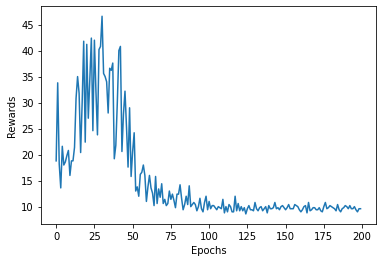

In [5]:
#TEST 1 using discounted return and A = G - v(t)
epochs = range(N_EPOCHS)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

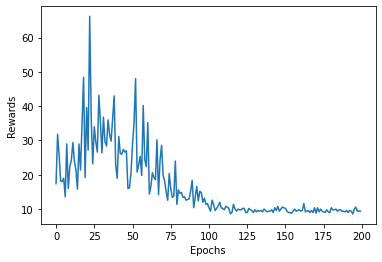

In [5]:
#TEST 2 using discounted return and A_t+1 = TDError + A_t but v is updated on G_t
epochs = range(N_EPOCHS)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

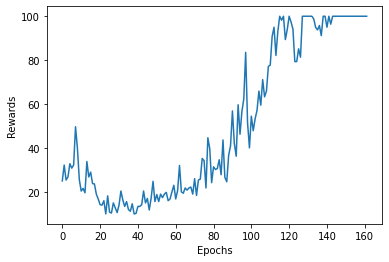

In [8]:
#TEST 3 using discounted return and A_t+1 = TDError + A_t but v is updated on G_t using log of the probabilities
#but v was also for the last element in the trajectory for some reason
epochs = range(162)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

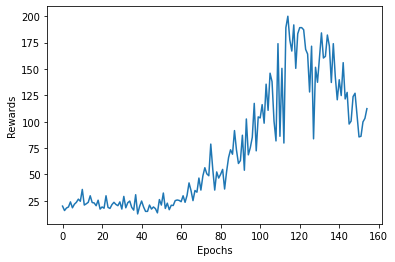

In [5]:
#TEST 4 using discounted return and A_t+1 = TDError + A_t but v is updated on G_t using log of the probabilities
epochs = range(155)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

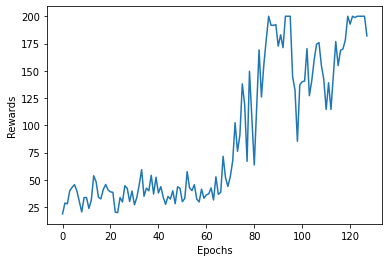

In [5]:
#TEST 5 using discounted return with r_t+1 and A_t+1 = TDError + A_t but v is updated on G_t using log of the probabilities
epochs = range(128)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

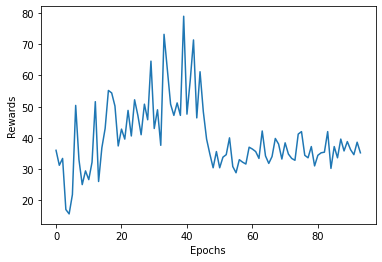

In [6]:
#TEST 6 softmax learning rate 0.0005 relu
epochs = range(94)

plt.plot(epochs, rewards)

plt.xlabel("Epochs")
plt.ylabel("Rewards")

plt.show()

tf.Tensor([1.  3.  1.  nan 2.5], shape=(5,), dtype=float32)
tf.Tensor([False False False  True False], shape=(5,), dtype=bool)
tf.Tensor([1.  3.  1.  0.  2.5], shape=(5,), dtype=float32)
